In [67]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, accuracy_score, f1_score, recall_score, precision_score, roc_auc_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import label_binarize
from tensorflow.keras.utils import plot_model
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import optimizers 
from tensorflow.keras import backend as K
from kerastuner import HyperModel
from kerastuner.tuners import Hyperband, RandomSearch, BayesianOptimization
import numpy as np
import pandas as pd
import os

In [68]:
#set __location__ depeneing which operating system user is on 

if os.name == "nt": 
    __location__ = "F:\FinalYearProject\Machine Learning\Features\CIC_dataset\\"
else:
    __location__ = "/home/jackp/Documents/FinalYearProject/Machine Learning/Features/Dumpsys"

In [69]:
# load dataset into panda dataframe
df = pd.read_csv(os.path.join(__location__,"all_features.csv"))


In [70]:
#Exploring the first five entries of the dataset to show the features that have been collected
df.head()
old_shape = df.shape

#remove features that are not supported 
df = df.loc[:, (df.sum(axis=0) != 0)]
print(df.shape)
new_shape = df.shape
print(f'removed {old_shape[1] - new_shape[1]} Features')

(2554, 1091)
removed 3740 Features


In [71]:
X = df.drop('malware', axis=1)
y = df['malware']
## Binarize the output
y = label_binarize(y, classes=['Benign', 'Malware'])
y = y.ravel()


variance = 0.1

def getVarianceFeatures(X, y, var):
    variancefs = VarianceThreshold(threshold=var).fit(X)
    cols = variancefs.get_support(indices=True)
    new_X = X.iloc[:,cols]
    lostFeatures = X.shape[1] - new_X.shape[1]
    
    print(f'Old number of features: {X.shape[1]}\n \
            New number of features: {new_X.shape[1]}\n \
            Number of features removed {lostFeatures}')
    
    return new_X



X = getVarianceFeatures(X, y, variance)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, 
                                                    random_state = 101)

Old number of features: 1090
             New number of features: 377
             Number of features removed 713


In [72]:
baseMetrics = {}
Optimisers = {'Base Metrics': baseMetrics}

def ANN_Model(hp):
    n_cols = X_train.shape[1:]
    model = Sequential()
    
    model.add(
        Dense(
            hp.Int(
                'input_units',
                min_value=32,
                max_value=1024,
                step=32
            ), 
            activation=hp.Choice(
                    'dense_activation',
                    values=['relu', 'tanh', 'sigmoid'],
                    default='relu'
            ),
            input_shape=n_cols
        )
    )

    for i in range(hp.Int('n_layers',  min_value=1,  max_value=8, step=1)): # adding variation of layers.

        model.add(
            Dense(
                hp.Int(
                    f'hidden_{i}_units',
                    min_value=32,
                    max_value=1024,
                    step=32
                ), 
                activation=hp.Choice(
                    f'dense_{i}_activation',
                    values=['relu', 'tanh', 'sigmoid'],
                     default='relu'
                )
            )
        )
        model.add(
            Dropout(
                hp.Float(
                    f'dropout_{i}',
                    min_value=0.0,
                    max_value=0.5,
                    step=0.05
                )
            )
        )
        
    model.add(
        Dense(
            1, 
            activation='sigmoid'
        )
    )
    
    
    hp_learning_rate = hp.Float(
                'learning_rate',
                min_value=0.0001,
                max_value=1,
                sampling='LOG',
                default=0.001
    )
    hp_optimizer = eval(
        hp.Choice(
            'optimizer', 
            ['optimizers.RMSprop(hp_learning_rate)', 'optimizers.Adam(hp_learning_rate)', 'optimizers.Adamax(hp_learning_rate)', 'optimizers.SGD(hp_learning_rate)']
        )
    )

    model.compile(
        loss='binary_crossentropy', 
        optimizer=hp_optimizer, 
        metrics=['accuracy'] )
    
    return model


In [73]:
Randomtuner = RandomSearch(
    ANN_Model,
    seed=1,
    objective='val_accuracy',
    max_trials=40,  # how many variations on model?
    executions_per_trial=3,  # how many trials per variation? (same model could perform differently)
    directory='random',
    project_name='dumpsys'
    )

Randomtuner.search(x=X_train,
             y=y_train,
             epochs=50,
             batch_size=30,
             validation_data=(X_test, y_test))

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.8518 - accuracy: 0.300 - ETA: 1s - loss: 0.4769 - accuracy: 0.739 - ETA: 0s - loss: 0.3589 - accuracy: 0.81 - ETA: 0s - loss: 0.2779 - accuracy: 0.86 - ETA: 0s - loss: 0.2184 - accuracy: 0.89 - 1s 437us/sample - loss: 0.1973 - accuracy: 0.9060 - val_loss: 0.0674 - val_accuracy: 0.9765
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0091 - accuracy: 1.00 - ETA: 0s - loss: 0.0299 - accuracy: 0.98 - ETA: 0s - loss: 0.0399 - accuracy: 0.98 - ETA: 0s - loss: 0.0321 - accuracy: 0.98 - ETA: 0s - loss: 0.0369 - accuracy: 0.98 - 0s 156us/sample - loss: 0.0390 - accuracy: 0.9894 - val_loss: 0.0407 - val_accuracy: 0.9896
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0288 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 1.8003e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2444e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0035 - accuracy: 0.9991   - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - 0s 128us/sample - loss: 0.0023 - accuracy: 0.9994 - val_loss: 0.0467 - val_accuracy: 0.9922
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 4.8719e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7407e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8492e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 0.9994   - 0s 134us/sample - loss: 0.0018 - accuracy: 0.9994 - val_loss: 0.0614 - val_accuracy: 0.9909
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 4.0248e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5633e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2151e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1275e-04 - accuracy: 1.00 - 0s 127us/sample - loss: 4.6930e-04 - accuracy: 1.0000 - val_loss: 0.0598 - val_accuracy: 0.9909
Epoch 25/50
1

1787/1787 [==============================] - ETA: 0s - loss: 2.0601e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.1143e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.9346e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.9463e-06 - accuracy: 1.00 - 0s 144us/sample - loss: 6.6154e-06 - accuracy: 1.0000 - val_loss: 0.0764 - val_accuracy: 0.9909
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8092e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4969e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2356e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4917e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1053e-06 - accuracy: 1.00 - 0s 171us/sample - loss: 5.6040e-06 - accuracy: 1.0000 - val_loss: 0.0769 - val_accuracy: 0.9909
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 5.7932e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6282e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.1846e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.7877e-06 - accuracy: 1.00 - 0s 132us/sample - loss: 6.2240e-06 - accuracy: 1.00

Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3265e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4755e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3063e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3525e-05 - accuracy: 1.00 - 0s 133us/sample - loss: 3.9727e-05 - accuracy: 1.0000 - val_loss: 0.0497 - val_accuracy: 0.9922
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 9.7060e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2761e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0578e-05 - accuracy: 1.00 - 0s 106us/sample - loss: 2.1132e-05 - accuracy: 1.0000 - val_loss: 0.0509 - val_accuracy: 0.9922
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 8.7345e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8895e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6540e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3461e-05 - accuracy: 1.00 - 0s 128us/sample - loss: 2.3022e-05 - accuracy: 1.0000 - val_loss: 0.0521 - val_accuracy: 0.9922
Epoch 23/50
1787/1787 [============

1787/1787 [==============================] - ETA: 0s - loss: 4.3259e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6660e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0793e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4249e-06 - accuracy: 1.00 - 0s 131us/sample - loss: 2.7200e-06 - accuracy: 1.0000 - val_loss: 0.0654 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 5.4614e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6247e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0581e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7323e-06 - accuracy: 1.00 - 0s 128us/sample - loss: 3.8304e-06 - accuracy: 1.0000 - val_loss: 0.0659 - val_accuracy: 0.9922
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1491e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0870e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7791e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9021e-06 - accuracy: 1.00 - 0s 129us/sample - loss: 3.1629e-06 - accuracy: 1.0000 - val_loss: 0.0663 - val_accuracy: 0.9922
E

Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0919e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6754e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3738e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6462e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 0.9994   - 0s 163us/sample - loss: 0.0022 - accuracy: 0.9994 - val_loss: 0.0407 - val_accuracy: 0.9922
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 2.1446e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.4611e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 0.9989   - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - 0s 172us/sample - loss: 0.0021 - accuracy: 0.9994 - val_loss: 0.0412 - val_accuracy: 0.9935
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 3.0727e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8973e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0517e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7097e-04 - accuracy: 1.00 - ETA: 0s -

Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 5.3493e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4072e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.9105e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5313e-06 - accuracy: 1.00 - 0s 119us/sample - loss: 7.2781e-06 - accuracy: 1.0000 - val_loss: 0.0679 - val_accuracy: 0.9922
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 4.9642e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0539e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.8333e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.4318e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4422e-06 - accuracy: 1.00 - 0s 151us/sample - loss: 6.4178e-06 - accuracy: 1.0000 - val_loss: 0.0686 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 7.7063e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.7774e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5093e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.3642e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4976e-06 - accuracy: 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 29s - loss: 0.7982 - accuracy: 0.333 - ETA: 6s - loss: 449602.4284 - accuracy: 0.540 - ETA: 3s - loss: 239132.3098 - accuracy: 0.476 - ETA: 2s - loss: 183996.2328 - accuracy: 0.510 - ETA: 1s - loss: 140703.9651 - accuracy: 0.529 - ETA: 1s - loss: 119598.4840 - accuracy: 0.546 - ETA: 1s - loss: 95678.9227 - accuracy: 0.568 - ETA: 0s - loss: 82481.9213 - accuracy: 0.57 - ETA: 0s - loss: 70357.6379 - accuracy: 0.59 - ETA: 0s - loss: 62951.6438 - accuracy: 0.58 - ETA: 0s - loss: 56956.3129 - accuracy: 0.59 - ETA: 0s - loss: 53159.2703 - accuracy: 0.59 - ETA: 0s - loss: 47843.4069 - accuracy: 0.60 - ETA: 0s - loss: 43494.0685 - accuracy: 0.60 - ETA: 0s - loss: 41244.4082 - accuracy: 0.60 - 2s 867us/sample - loss: 40159.6552 - accuracy: 0.6027 - val_loss: 0.6287 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6368 - accuracy: 0.66 - ETA:

Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6713 - accuracy: 0.63 - ETA: 0s - loss: 0.6377 - accuracy: 0.67 - ETA: 0s - loss: 0.6357 - accuracy: 0.67 - ETA: 0s - loss: 0.6610 - accuracy: 0.64 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.64 - ETA: 0s - loss: 0.6567 - accuracy: 0.64 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.64 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - 1s 420us/sample - loss: 0.6584 - accuracy: 0.6368 - val_loss: 0.6380 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6288 - accuracy: 0.70 - ETA: 0s - loss: 0.6614 - accuracy: 0.62 - ETA: 0s - loss: 0.6624 - accuracy: 0.62 - ETA: 0s - loss: 0.6476 - accuracy: 0.65 - ETA: 0s - loss: 0.6536 - accuracy: 0.64 - ETA: 0s - loss: 0.6520 - accuracy: 0.64 - ETA: 0s - loss: 0.6517 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.5987 - accuracy: 0.76 - ETA: 0s - loss: 0.6533 - accuracy: 0.65 - ETA: 0s - loss: 0.6556 - accuracy: 0.64 - ETA: 0s - loss: 0.6474 - accuracy: 0.65 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6609 - accuracy: 0.63 - ETA: 0s - loss: 0.6623 - accuracy: 0.63 - ETA: 0s - loss: 0.6620 - accuracy: 0.63 - ETA: 0s - loss: 0.6631 - accuracy: 0.63 - ETA: 0s - loss: 0.6601 - accuracy: 0.63 - ETA: 0s - loss: 0.6609 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.64 - 1s 425us/sample - loss: 0.6606 - accuracy: 0.6368 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6879 - accuracy: 0.60 - ETA: 0s - loss: 0.6922 - accuracy: 0.57 - ETA: 0s - loss: 0.6790 - accuracy: 0.61 - ETA: 0s - loss: 0.6633 - accuracy: 0.64 - ETA: 0s - loss: 0.6600 - accuracy: 0.64 - ETA: 0s - loss: 0.6640 - accuracy: 0.64 - ETA: 0s - loss: 0.6765 - accuracy: 0.63 - ETA: 0s 

Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6418 - accuracy: 0.66 - ETA: 0s - loss: 0.6570 - accuracy: 0.64 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6485 - accuracy: 0.65 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - 1s 366us/sample - loss: 0.6575 - accuracy: 0.6368 - val_loss: 0.6378 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7328 - accuracy: 0.46 - ETA: 0s - loss: 0.6469 - accuracy: 0.66 - ETA: 0s - loss: 0.6340 - accuracy: 0.68 - ETA: 0s - loss: 0.6372 - accuracy: 0.67 - ETA: 0s - loss: 0.6483 - accuracy: 0.66 - ETA: 0s - loss: 0.6559 - accuracy: 0.64 - ETA: 0s - loss: 0.6581 - accuracy: 0.64 - ETA: 0s - loss: 0.6578 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6257 - accuracy: 0.70 - ETA: 0s - loss: 0.6333 - accuracy: 0.68 - ETA: 0s - loss: 0.6239 - accuracy: 0.69 - ETA: 0s - loss: 0.6441 - accuracy: 0.66 - ETA: 0s - loss: 0.6482 - accuracy: 0.66 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6555 - accuracy: 0.64 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6491 - accuracy: 0.65 - ETA: 0s - loss: 0.6555 - accuracy: 0.64 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - 1s 424us/sample - loss: 0.6619 - accuracy: 0.6228 - val_loss: 0.6978 - val_accuracy: 0.3207
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6958 - accuracy: 0.40 - ETA: 0s - loss: 0.6693 - accuracy: 0.63 - ETA: 0s - loss: 0.6788 - accuracy: 0.62 - ETA: 0s - loss: 0.6743 - accuracy: 0.62 - ETA: 0s - loss: 0.6703 - accuracy: 0.62 - ETA: 0s - loss: 0.6683 - accuracy: 0.62 - ETA: 0s - loss: 0.6686 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6730 - accuracy: 0.60 - ETA: 0s - loss: 0.6671 - accuracy: 0.63 - ETA: 0s - loss: 0.6764 - accuracy: 0.61 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6569 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6570 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.64 - ETA: 0s - loss: 0.6532 - accuracy: 0.64 - ETA: 0s - loss: 0.6573 - accuracy: 0.64 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - 1s 424us/sample - loss: 0.6591 - accuracy: 0.6368 - val_loss: 0.6486 - val_accuracy: 0.6793
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6633 - accuracy: 0.63 - ETA: 0s - loss: 0.6480 - accuracy: 0.67 - ETA: 0s - loss: 0.6520 - accuracy: 0.65 - ETA: 0s - loss: 0.6578 - accuracy: 0.64 - ETA: 0s - loss: 0.6608 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.64 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6519 - accuracy: 0.64 - ETA: 0s - loss: 0.6590 - accuracy: 0.64 - ETA: 0s - loss: 0.6539 - accuracy: 0.64 - ETA: 0s - loss: 0.6520 - accuracy: 0.64 - ETA: 0s - loss: 0.6492 - accuracy: 0.65 - ETA: 0s - loss: 0.6577 - accuracy: 0.64 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - 1s 368us/sample - loss: 0.6604 - accuracy: 0.6368 - val_loss: 0.6545 - val_accuracy: 0.6793
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6754 - accuracy: 0.60 - ETA: 1s - loss: 0.6635 - accuracy: 0.63 - ETA: 0s - loss: 0.6482 - accuracy: 0.66 - ETA: 0s - loss: 0.6563 - accuracy: 0.64 - ETA: 0s - loss: 0.6660 - accuracy: 0.62 - ETA: 0s - loss: 0.6601 - accuracy: 0.64 - ETA: 0s - loss: 0.6620 - accuracy: 0.63 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6616 - accuracy: 0.63 - ETA: 0s 

Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6747 - accuracy: 0.60 - ETA: 0s - loss: 0.6649 - accuracy: 0.62 - ETA: 0s - loss: 0.6599 - accuracy: 0.63 - ETA: 0s - loss: 0.6491 - accuracy: 0.65 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6601 - accuracy: 0.63 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.64 - ETA: 0s - loss: 0.6577 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.64 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - 1s 431us/sample - loss: 0.6592 - accuracy: 0.6368 - val_loss: 0.6491 - val_accuracy: 0.6793
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6845 - accuracy: 0.56 - ETA: 0s - loss: 0.6661 - accuracy: 0.61 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6489 - accuracy: 0.64 - ETA: 0s - loss: 0.6545 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6424 - accuracy: 0.66 - ETA: 0s - loss: 0.6495 - accuracy: 0.65 - ETA: 0s - loss: 0.6358 - accuracy: 0.67 - ETA: 0s - loss: 0.6478 - accuracy: 0.65 - ETA: 0s - loss: 0.6469 - accuracy: 0.66 - ETA: 0s - loss: 0.6496 - accuracy: 0.65 - ETA: 0s - loss: 0.6469 - accuracy: 0.65 - ETA: 0s - loss: 0.6503 - accuracy: 0.65 - ETA: 0s - loss: 0.6532 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - 1s 425us/sample - loss: 0.6573 - accuracy: 0.6374 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6120 - accuracy: 0.70 - ETA: 0s - loss: 0.6670 - accuracy: 0.63 - ETA: 0s - loss: 0.6521 - accuracy: 0.65 - ETA: 0s - loss: 0.6604 - accuracy: 0.63 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6638 - accuracy: 0.63 - ETA: 0s 

Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7522 - accuracy: 0.63 - ETA: 0s - loss: 0.7248 - accuracy: 0.60 - ETA: 0s - loss: 0.6910 - accuracy: 0.62 - ETA: 0s - loss: 0.6891 - accuracy: 0.60 - ETA: 0s - loss: 0.7233 - accuracy: 0.58 - ETA: 0s - loss: 0.7323 - accuracy: 0.56 - ETA: 0s - loss: 0.7381 - accuracy: 0.56 - ETA: 0s - loss: 0.7386 - accuracy: 0.56 - ETA: 0s - loss: 0.7360 - accuracy: 0.56 - ETA: 0s - loss: 0.7381 - accuracy: 0.57 - ETA: 0s - loss: 0.7407 - accuracy: 0.57 - ETA: 0s - loss: 0.7417 - accuracy: 0.56 - 1s 423us/sample - loss: 0.7374 - accuracy: 0.5686 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6927 - accuracy: 0.60 - ETA: 0s - loss: 0.7007 - accuracy: 0.61 - ETA: 0s - loss: 0.7007 - accuracy: 0.61 - ETA: 0s - loss: 0.6981 - accuracy: 0.61 - ETA: 0s - loss: 0.7106 - accuracy: 0.60 - ETA: 0s - loss: 0.7093 - accuracy: 0.59 - ETA: 0s - loss: 0.7128 - accuracy: 0.57

1787/1787 [==============================] - ETA: 0s - loss: 0.6109 - accuracy: 0.70 - ETA: 0s - loss: 0.6582 - accuracy: 0.64 - ETA: 0s - loss: 0.6676 - accuracy: 0.62 - ETA: 0s - loss: 0.6750 - accuracy: 0.58 - ETA: 0s - loss: 0.6820 - accuracy: 0.57 - ETA: 0s - loss: 0.6791 - accuracy: 0.58 - ETA: 0s - loss: 0.6694 - accuracy: 0.60 - ETA: 0s - loss: 0.6755 - accuracy: 0.60 - ETA: 0s - loss: 1.0327 - accuracy: 0.61 - ETA: 0s - loss: 0.9954 - accuracy: 0.61 - ETA: 0s - loss: 0.9705 - accuracy: 0.60 - ETA: 0s - loss: 0.9417 - accuracy: 0.61 - ETA: 0s - loss: 0.9264 - accuracy: 0.61 - 1s 458us/sample - loss: 0.9178 - accuracy: 0.6172 - val_loss: 0.6340 - val_accuracy: 0.6793
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6380 - accuracy: 0.70 - ETA: 0s - loss: 0.7222 - accuracy: 0.59 - ETA: 0s - loss: 0.7052 - accuracy: 0.57 - ETA: 0s - loss: 0.6973 - accuracy: 0.56 - ETA: 0s - loss: 0.6864 - accuracy: 0.57 - ETA: 0s - loss: 0.6898 - accuracy: 0.57 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6705 - accuracy: 0.60 - ETA: 0s - loss: 0.6801 - accuracy: 0.63 - ETA: 0s - loss: 0.6672 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.65 - ETA: 0s - loss: 0.6505 - accuracy: 0.65 - ETA: 0s - loss: 0.6571 - accuracy: 0.64 - ETA: 0s - loss: 0.6614 - accuracy: 0.62 - ETA: 0s - loss: 0.6656 - accuracy: 0.62 - ETA: 0s - loss: 0.6652 - accuracy: 0.63 - ETA: 0s - loss: 0.6644 - accuracy: 0.63 - ETA: 0s - loss: 0.6654 - accuracy: 0.62 - 1s 393us/sample - loss: 0.6654 - accuracy: 0.6279 - val_loss: 0.6519 - val_accuracy: 0.6793
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6507 - accuracy: 0.66 - ETA: 0s - loss: 0.6795 - accuracy: 0.61 - ETA: 0s - loss: 0.6647 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.64 - ETA: 0s - loss: 0.6607 - accuracy: 0.63 - ETA: 0s - loss: 0.6639 - accuracy: 0.63 - ETA: 0s - loss: 0.6642 - accuracy: 0.63 - ETA: 0s - loss: 0.6684 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6176 - accuracy: 0.70 - ETA: 0s - loss: 0.6449 - accuracy: 0.66 - ETA: 0s - loss: 0.6479 - accuracy: 0.65 - ETA: 0s - loss: 0.6513 - accuracy: 0.65 - ETA: 0s - loss: 0.6521 - accuracy: 0.65 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6613 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.64 - ETA: 0s - loss: 0.6601 - accuracy: 0.63 - 1s 365us/sample - loss: 0.6605 - accuracy: 0.6357 - val_loss: 0.6474 - val_accuracy: 0.6793
Epoch 44/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6732 - accuracy: 0.60 - ETA: 0s - loss: 0.6625 - accuracy: 0.66 - ETA: 0s - loss: 241.8118 - accuracy: 0.62 - ETA: 0s - loss: 166.4597 - accuracy: 0.63 - ETA: 0s - loss: 126.9867 - accuracy: 0.63 - ETA: 0s - loss: 102.7028 - accuracy: 0.62 - ETA: 0s - loss: 86.2546 - accuracy: 0.6022 - ETA: 0s - loss: 74.3753 - accuracy: 0.5

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 29s - loss: 0.7997 - accuracy: 0.366 - ETA: 4s - loss: 4.2528 - accuracy: 0.627 - ETA: 2s - loss: 2.9073 - accuracy: 0.58 - ETA: 1s - loss: 2.3577 - accuracy: 0.53 - ETA: 1s - loss: 2.0530 - accuracy: 0.54 - ETA: 1s - loss: 1.8407 - accuracy: 0.53 - ETA: 0s - loss: 1.7185 - accuracy: 0.53 - ETA: 0s - loss: 1.5933 - accuracy: 0.53 - ETA: 0s - loss: 1.4858 - accuracy: 0.55 - ETA: 0s - loss: 1.3857 - accuracy: 0.56 - ETA: 0s - loss: 1.3105 - accuracy: 0.56 - ETA: 0s - loss: 1.2476 - accuracy: 0.57 - ETA: 0s - loss: 1.1993 - accuracy: 0.57 - 1s 799us/sample - loss: 1.1662 - accuracy: 0.5809 - val_loss: 0.6354 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6781 - accuracy: 0.60 - ETA: 0s - loss: 0.6428 - accuracy: 0.67 - ETA: 0s - loss: 0.6671 - accuracy: 0.62 - ETA: 0s - loss: 0.6504 - accuracy: 0.65 - ETA: 0s - loss: 0.6492 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.7031 - accuracy: 0.56 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6435 - accuracy: 0.65 - ETA: 0s - loss: 0.6444 - accuracy: 0.65 - ETA: 0s - loss: 0.6462 - accuracy: 0.65 - ETA: 0s - loss: 0.6429 - accuracy: 0.65 - ETA: 0s - loss: 0.6449 - accuracy: 0.65 - ETA: 0s - loss: 0.6496 - accuracy: 0.64 - ETA: 0s - loss: 0.6487 - accuracy: 0.64 - ETA: 0s - loss: 0.6500 - accuracy: 0.64 - ETA: 0s - loss: 0.6496 - accuracy: 0.64 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - 1s 573us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6372 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6377 - accuracy: 0.66 - ETA: 0s - loss: 0.6553 - accuracy: 0.64 - ETA: 0s - loss: 0.6518 - accuracy: 0.65 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6525 - accuracy: 0.63 - ETA: 0s - loss: 0.6225 - accuracy: 0.68 - ETA: 0s - loss: 0.6339 - accuracy: 0.67 - ETA: 0s - loss: 0.6474 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - ETA: 0s - loss: 0.6643 - accuracy: 0.61 - ETA: 0s - loss: 0.6657 - accuracy: 0.61 - ETA: 0s - loss: 0.6668 - accuracy: 0.61 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6514 - accuracy: 0.64 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - 1s 489us/sample - loss: 0.6590 - accuracy: 0.6368 - val_loss: 0.6275 - val_accuracy: 0.6793
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5562 - accuracy: 0.76 - ETA: 0s - loss: 0.5531 - accuracy: 0.78 - ETA: 0s - loss: 0.6243 - accuracy: 0.68 - ETA: 0s - loss: 0.6358 - accuracy: 0.66 - ETA: 0s - loss: 0.6388 - accuracy: 0.66 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6747 - accuracy: 0.60 - ETA: 0s - loss: 0.6770 - accuracy: 0.60 - ETA: 0s - loss: 0.6702 - accuracy: 0.61 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6644 - accuracy: 0.62 - ETA: 0s - loss: 0.6600 - accuracy: 0.62 - ETA: 0s - loss: 0.6674 - accuracy: 0.61 - ETA: 0s - loss: 0.6635 - accuracy: 0.62 - ETA: 0s - loss: 0.6610 - accuracy: 0.62 - ETA: 0s - loss: 0.6622 - accuracy: 0.62 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6600 - accuracy: 0.62 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - 1s 474us/sample - loss: 0.6554 - accuracy: 0.6368 - val_loss: 0.6280 - val_accuracy: 0.6793
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 1s - loss: 0.6255 - accuracy: 0.68 - ETA: 0s - loss: 0.6324 - accuracy: 0.67 - ETA: 0s - loss: 0.6351 - accuracy: 0.67 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7697 - accuracy: 0.43 - ETA: 0s - loss: 0.6699 - accuracy: 0.61 - ETA: 0s - loss: 0.6686 - accuracy: 0.61 - ETA: 0s - loss: 0.6645 - accuracy: 0.62 - ETA: 0s - loss: 0.6716 - accuracy: 0.60 - ETA: 0s - loss: 0.6719 - accuracy: 0.60 - ETA: 0s - loss: 0.6687 - accuracy: 0.61 - ETA: 0s - loss: 0.6714 - accuracy: 0.60 - ETA: 0s - loss: 0.6683 - accuracy: 0.61 - ETA: 0s - loss: 0.6710 - accuracy: 0.60 - ETA: 0s - loss: 0.6685 - accuracy: 0.61 - ETA: 0s - loss: 0.6656 - accuracy: 0.62 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - 1s 580us/sample - loss: 0.6566 - accuracy: 0.6368 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6024 - accuracy: 0.70 - ETA: 0s - loss: 0.6104 - accuracy: 0.70 - ETA: 0s - loss: 0.6429 - accuracy: 0.66 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.5639 - accuracy: 0.83 - ETA: 0s - loss: 0.6550 - accuracy: 0.65 - ETA: 0s - loss: 0.6451 - accuracy: 0.67 - ETA: 0s - loss: 0.6545 - accuracy: 0.65 - ETA: 0s - loss: 0.6604 - accuracy: 0.64 - ETA: 0s - loss: 0.6600 - accuracy: 0.64 - ETA: 0s - loss: 0.6616 - accuracy: 0.64 - ETA: 0s - loss: 0.6601 - accuracy: 0.64 - ETA: 0s - loss: 0.6606 - accuracy: 0.64 - ETA: 0s - loss: 0.6609 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.64 - ETA: 0s - loss: 0.6624 - accuracy: 0.63 - ETA: 0s - loss: 0.6603 - accuracy: 0.64 - ETA: 0s - loss: 0.6603 - accuracy: 0.64 - 1s 485us/sample - loss: 0.6628 - accuracy: 0.6368 - val_loss: 0.6317 - val_accuracy: 0.6793
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6502 - accuracy: 0.63 - ETA: 0s - loss: 0.6199 - accuracy: 0.70 - ETA: 0s - loss: 0.6602 - accuracy: 0.64 - ETA: 0s - loss: 0.6672 - accuracy: 0.62 - ETA: 0s - loss: 0.6651 - accuracy: 0.62 - ETA: 0s -

Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6161 - accuracy: 0.73 - ETA: 0s - loss: 0.6467 - accuracy: 0.66 - ETA: 0s - loss: 0.6558 - accuracy: 0.64 - ETA: 0s - loss: 0.6558 - accuracy: 0.64 - ETA: 0s - loss: 0.6518 - accuracy: 0.64 - ETA: 0s - loss: 0.6490 - accuracy: 0.65 - ETA: 0s - loss: 0.6482 - accuracy: 0.65 - ETA: 0s - loss: 0.6560 - accuracy: 0.64 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6520 - accuracy: 0.64 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6512 - accuracy: 0.64 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - 1s 676us/sample - loss: 0.6573 - accuracy: 0.6368 - val_loss: 0.6385 - val_accuracy: 0.6793
Epoch 15/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6545 - accuracy: 0.6

1787/1787 [==============================] - ETA: 1s - loss: 0.7354 - accuracy: 0.50 - ETA: 0s - loss: 0.6627 - accuracy: 0.63 - ETA: 0s - loss: 0.6725 - accuracy: 0.60 - ETA: 0s - loss: 0.6608 - accuracy: 0.63 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6622 - accuracy: 0.62 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.64 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - 1s 478us/sample - loss: 0.6579 - accuracy: 0.6368 - val_loss: 0.6309 - val_accuracy: 0.6793
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6432 - accuracy: 0.65 - ETA: 0s - loss: 0.6535 - accuracy: 0.63 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6505 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.5528 - accuracy: 0.66 - ETA: 0s - loss: 0.5405 - accuracy: 0.78 - ETA: 0s - loss: 0.5396 - accuracy: 0.78 - ETA: 0s - loss: 0.5201 - accuracy: 0.78 - ETA: 0s - loss: 0.4781 - accuracy: 0.80 - ETA: 0s - loss: 0.4700 - accuracy: 0.81 - ETA: 0s - loss: 0.4506 - accuracy: 0.81 - ETA: 0s - loss: 0.4277 - accuracy: 0.82 - ETA: 0s - loss: 0.3987 - accuracy: 0.84 - ETA: 0s - loss: 0.3755 - accuracy: 0.85 - ETA: 0s - loss: 0.3446 - accuracy: 0.86 - ETA: 0s - loss: 0.3212 - accuracy: 0.87 - ETA: 0s - loss: 0.3004 - accuracy: 0.88 - ETA: 0s - loss: 0.2816 - accuracy: 0.89 - 1s 519us/sample - loss: 0.2645 - accuracy: 0.9021 - val_loss: 0.0553 - val_accuracy: 0.9883
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0081 - accuracy: 1.00 - ETA: 0s - loss: 0.0746 - accuracy: 0.98 - ETA: 0s - loss: 0.0485 - accuracy: 0.98 - ETA: 0s - loss: 0.0358 - accuracy: 0.99 - ETA: 0s - loss: 0.0461 - accuracy: 0.98 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0340 - accuracy: 0.99 - ETA: 0s - loss: 0.0311 - accuracy: 0.99 - ETA: 0s - loss: 0.0289 - accuracy: 0.99 - ETA: 0s - loss: 0.0293 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0366 - accuracy: 0.99 - 1s 512us/sample - loss: 0.0384 - accuracy: 0.9916 - val_loss: 0.0519 - val_accuracy: 0.9909
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0047 - accuracy: 1.00 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6038 - accuracy: 0.70 - ETA: 0s - loss: 0.6461 - accuracy: 0.64 - ETA: 0s - loss: 0.6324 - accuracy: 0.66 - ETA: 0s - loss: 0.6356 - accuracy: 0.66 - ETA: 0s - loss: 0.6382 - accuracy: 0.66 - ETA: 0s - loss: 0.6496 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6553 - accuracy: 0.64 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6559 - accuracy: 0.64 - ETA: 0s - loss: 0.6553 - accuracy: 0.64 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - 1s 497us/sample - loss: 0.6578 - accuracy: 0.6363 - val_loss: 0.6465 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7175 - accuracy: 0.46 - ETA: 0s - loss: 0.6871 - accuracy: 0.56 - ETA: 0s - loss: 0.6858 - accuracy: 0.57 - ETA: 0s - loss: 0.6847 - accuracy: 0.57 - ETA: 0s - loss: 0.6783 - accuracy: 0.59 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.6396 - accuracy: 0.66 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6537 - accuracy: 0.64 - ETA: 0s - loss: 0.6505 - accuracy: 0.64 - ETA: 0s - loss: 0.6487 - accuracy: 0.65 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.64 - ETA: 0s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s - loss: 0.6551 - accuracy: 0.64 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - 1s 543us/sample - loss: 0.6580 - accuracy: 0.6368 - val_loss: 0.6285 - val_accuracy: 0.6793
Epoch 16/50
1787/1787 [==============================] - ETA: 1s - loss: 0.8240 - accuracy: 0.36 - ETA: 1s - loss: 0.7019 - accuracy: 0.56 - ETA: 0s - loss: 0.6921 - accuracy: 0.57 - ETA: 0s 

Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5979 - accuracy: 0.73 - ETA: 0s - loss: 0.6724 - accuracy: 0.60 - ETA: 0s - loss: 0.6750 - accuracy: 0.59 - ETA: 0s - loss: 0.6699 - accuracy: 0.60 - ETA: 0s - loss: 0.6668 - accuracy: 0.61 - ETA: 0s - loss: 0.6705 - accuracy: 0.60 - ETA: 0s - loss: 0.6668 - accuracy: 0.61 - ETA: 0s - loss: 0.6662 - accuracy: 0.61 - ETA: 0s - loss: 0.6663 - accuracy: 0.61 - ETA: 0s - loss: 0.6653 - accuracy: 0.62 - ETA: 0s - loss: 0.6630 - accuracy: 0.62 - ETA: 0s - loss: 0.6601 - accuracy: 0.62 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - 1s 534us/sample - loss: 0.6562 - accuracy: 0.6368 - val_loss: 0.6275 - val_accuracy: 0.6793
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6695 - accuracy: 0.62 - ETA: 0s - loss: 0.6738 - accuracy: 0.61 - ETA: 0s - loss: 0.6573 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.5374 - accuracy: 0.83 - ETA: 0s - loss: 0.6220 - accuracy: 0.69 - ETA: 0s - loss: 0.6447 - accuracy: 0.66 - ETA: 0s - loss: 0.6508 - accuracy: 0.65 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6675 - accuracy: 0.62 - ETA: 0s - loss: 0.6683 - accuracy: 0.62 - ETA: 0s - loss: 0.6721 - accuracy: 0.61 - ETA: 0s - loss: 0.6676 - accuracy: 0.62 - ETA: 0s - loss: 0.6646 - accuracy: 0.62 - ETA: 0s - loss: 0.6618 - accuracy: 0.63 - ETA: 0s - loss: 0.6599 - accuracy: 0.63 - 1s 420us/sample - loss: 0.6592 - accuracy: 0.6368 - val_loss: 0.6278 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6723 - accuracy: 0.61 - ETA: 0s - loss: 0.6660 - accuracy: 0.62 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6483 - accuracy: 0.65 - ETA: 0s - loss: 0.6459 - accuracy: 0.65 - ETA: 0s - loss: 0.6508 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.8130 - accuracy: 0.40 - ETA: 0s - loss: 0.6853 - accuracy: 0.59 - ETA: 0s - loss: 0.6689 - accuracy: 0.62 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6496 - accuracy: 0.64 - ETA: 0s - loss: 0.6497 - accuracy: 0.64 - ETA: 0s - loss: 0.6500 - accuracy: 0.64 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6548 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.64 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - 1s 589us/sample - loss: 0.6562 - accuracy: 0.6374 - val_loss: 0.6330 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6728 - accuracy: 0.60 - ETA: 0s - loss: 0.6674 - accuracy: 0.61 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 36s - loss: 0.7232 - accuracy: 0.466 - ETA: 5s - loss: 852.8418 - accuracy: 0.47 - ETA: 2s - loss: 439.2587 - accuracy: 0.48 - ETA: 1s - loss: 308.0290 - accuracy: 0.51 - ETA: 1s - loss: 237.2031 - accuracy: 0.52 - ETA: 0s - loss: 199.1139 - accuracy: 0.53 - ETA: 0s - loss: 171.5661 - accuracy: 0.55 - ETA: 0s - loss: 147.1595 - accuracy: 0.56 - ETA: 0s - loss: 131.5753 - accuracy: 0.57 - ETA: 0s - loss: 119.0172 - accuracy: 0.57 - ETA: 0s - loss: 106.7963 - accuracy: 0.57 - 1s 792us/sample - loss: 104.0031 - accuracy: 0.5842 - val_loss: 0.6321 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6383 - accuracy: 0.66 - ETA: 0s - loss: 0.7278 - accuracy: 0.61 - ETA: 0s - loss: 0.6891 - accuracy: 0.64 - ETA: 0s - loss: 0.6898 - accuracy: 0.62 - ETA: 0s - loss: 0.6925 - accuracy: 0.61 - ETA: 0s - loss: 0.6871 - accuracy: 0.62 - ETA: 0s - l

1787/1787 [==============================] - ETA: 0s - loss: 0.6287 - accuracy: 0.76 - ETA: 0s - loss: 0.6660 - accuracy: 0.63 - ETA: 0s - loss: 0.6646 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.64 - ETA: 0s - loss: 0.6603 - accuracy: 0.64 - ETA: 0s - loss: 0.6586 - accuracy: 0.64 - ETA: 0s - loss: 0.6574 - accuracy: 0.64 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.64 - 1s 319us/sample - loss: 0.6605 - accuracy: 0.6346 - val_loss: 0.6346 - val_accuracy: 0.6793
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6607 - accuracy: 0.63 - ETA: 0s - loss: 0.6637 - accuracy: 0.62 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6601 - accuracy: 0.62 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - 1s 307us/sample - loss: 0.6576 - accuracy: 0.6346 

1787/1787 [==============================] - ETA: 0s - loss: 0.5825 - accuracy: 0.73 - ETA: 0s - loss: 0.6790 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.64 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6616 - accuracy: 0.63 - ETA: 0s - loss: 0.6599 - accuracy: 0.63 - 1s 391us/sample - loss: 0.6599 - accuracy: 0.6363 - val_loss: 0.6347 - val_accuracy: 0.6793
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7070 - accuracy: 0.53 - ETA: 0s - loss: 0.6535 - accuracy: 0.63 - ETA: 0s - loss: 0.6460 - accuracy: 0.65 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6624 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6674 - accuracy: 0.63 - ETA: 0s - loss: 0.6620 - accuracy: 0.63 - ETA: 0s - loss: 0.6727 - accuracy: 0.61 - ETA: 0s - loss: 0.6650 - accuracy: 0.62 - ETA: 0s - loss: 0.6571 - accuracy: 0.64 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6502 - accuracy: 0.65 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - 1s 345us/sample - loss: 0.6583 - accuracy: 0.6363 - val_loss: 0.6377 - val_accuracy: 0.6793
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6419 - accuracy: 0.63 - ETA: 0s - loss: 0.6186 - accuracy: 0.70 - ETA: 0s - loss: 0.6500 - accuracy: 0.65 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.64 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s 

Epoch 8/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6726 - accuracy: 0.60 - ETA: 0s - loss: 0.6534 - accuracy: 0.65 - ETA: 0s - loss: 0.6654 - accuracy: 0.63 - ETA: 0s - loss: 0.6846 - accuracy: 0.63 - ETA: 0s - loss: 0.6685 - accuracy: 0.65 - ETA: 0s - loss: 0.6654 - accuracy: 0.65 - ETA: 0s - loss: 0.6697 - accuracy: 0.64 - ETA: 0s - loss: 0.6801 - accuracy: 0.63 - ETA: 0s - loss: 0.6805 - accuracy: 0.63 - 1s 297us/sample - loss: 0.6811 - accuracy: 0.6363 - val_loss: 0.6440 - val_accuracy: 0.6793
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6577 - accuracy: 0.60 - ETA: 0s - loss: 0.6570 - accuracy: 0.61 - ETA: 0s - loss: 0.6541 - accuracy: 0.62 - ETA: 0s - loss: 0.6724 - accuracy: 0.61 - ETA: 0s - loss: 0.6728 - accuracy: 0.62 - ETA: 0s - loss: 0.6701 - accuracy: 0.62 - ETA: 0s - loss: 0.6606 - accuracy: 0.63 - ETA: 0s - loss: 0.6658 - accuracy: 0.63 - ETA: 0s - loss: 0.6650 - accuracy: 0.63 - 1s 322us/sample - loss: 0.6660 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.6193 - accuracy: 0.70 - ETA: 0s - loss: 0.6821 - accuracy: 0.59 - ETA: 0s - loss: 0.6884 - accuracy: 0.58 - ETA: 0s - loss: 0.6820 - accuracy: 0.59 - ETA: 0s - loss: 0.6777 - accuracy: 0.60 - ETA: 0s - loss: 0.6737 - accuracy: 0.61 - ETA: 0s - loss: 0.6685 - accuracy: 0.61 - ETA: 0s - loss: 0.6671 - accuracy: 0.62 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6608 - accuracy: 0.63 - 1s 340us/sample - loss: 0.6614 - accuracy: 0.6346 - val_loss: 0.6329 - val_accuracy: 0.6793
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6091 - accuracy: 0.70 - ETA: 0s - loss: 0.6367 - accuracy: 0.68 - ETA: 0s - loss: 0.6564 - accuracy: 0.64 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.62 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6606 - accuracy: 0.63 - 1s 315us

1787/1787 [==============================] - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6607 - accuracy: 0.64 - ETA: 0s - loss: 0.6530 - accuracy: 0.65 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6665 - accuracy: 0.62 - ETA: 0s - loss: 0.6676 - accuracy: 0.62 - ETA: 0s - loss: 0.6634 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6640 - accuracy: 0.63 - ETA: 0s - loss: 0.6620 - accuracy: 0.63 - 1s 333us/sample - loss: 0.6620 - accuracy: 0.6346 - val_loss: 0.6319 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7122 - accuracy: 0.53 - ETA: 0s - loss: 0.6881 - accuracy: 0.59 - ETA: 0s - loss: 0.6685 - accuracy: 0.62 - ETA: 0s - loss: 0.6637 - accuracy: 0.63 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6617 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s 

Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6390 - accuracy: 0.66 - ETA: 0s - loss: 0.6626 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.64 - ETA: 0s - loss: 0.6526 - accuracy: 0.64 - ETA: 0s - loss: 0.6464 - accuracy: 0.65 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.64 - 1s 289us/sample - loss: 0.6584 - accuracy: 0.6374 - val_loss: 0.6345 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 33s - loss: 0.6483 - accuracy: 0.533 - ETA: 4s - loss: 318.1009 - accuracy: 0.51 - ETA: 2s - loss: 182.0728 - accuracy: 0.48 - ETA: 1s - loss: 121.6046 - accuracy: 0.53 - ETA: 0s - loss: 91.3781 - accuracy: 0.5488 - ETA: 0s - loss: 75.3731 - accuracy: 0.558 - ETA: 0s - loss: 64.1668 - accuracy: 0.568 - ETA: 0s - loss: 57.1083 - accuracy: 0.581 - ETA: 0s - loss: 4

Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6478 - accuracy: 0.66 - ETA: 0s - loss: 0.6490 - accuracy: 0.65 - ETA: 0s - loss: 0.6459 - accuracy: 0.65 - ETA: 0s - loss: 0.6511 - accuracy: 0.65 - ETA: 0s - loss: 0.6557 - accuracy: 0.64 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - 1s 364us/sample - loss: 0.6587 - accuracy: 0.6368 - val_loss: 0.6337 - val_accuracy: 0.6793
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7430 - accuracy: 0.46 - ETA: 0s - loss: 0.6789 - accuracy: 0.59 - ETA: 0s - loss: 0.6681 - accuracy: 0.61 - ETA: 0s - loss: 0.6501 - accuracy: 0.64 - ETA: 0s - loss: 0.6486 - accuracy: 0.64 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6634 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.7558 - accuracy: 0.46 - ETA: 0s - loss: 0.6539 - accuracy: 0.64 - ETA: 0s - loss: 0.6453 - accuracy: 0.66 - ETA: 0s - loss: 0.6460 - accuracy: 0.65 - ETA: 0s - loss: 0.6463 - accuracy: 0.65 - ETA: 0s - loss: 0.6513 - accuracy: 0.65 - ETA: 0s - loss: 0.6455 - accuracy: 0.66 - ETA: 0s - loss: 0.6457 - accuracy: 0.65 - ETA: 0s - loss: 0.6485 - accuracy: 0.65 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - 1s 408us/sample - loss: 0.6587 - accuracy: 0.6368 - val_loss: 0.6468 - val_accuracy: 0.6793
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6736 - accuracy: 0.60 - ETA: 0s - loss: 0.6510 - accuracy: 0.64 - ETA: 0s - loss: 0.6676 - accuracy: 0.61 - ETA: 0s - loss: 0.6593 - accuracy: 0.62 - ETA: 0s - loss: 0.6472 - accuracy: 0.64 - ETA: 0s - loss: 0.6507 - accuracy: 0.64 - ETA: 0s - loss: 0.6532 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6365 - accuracy: 0.66 - ETA: 0s - loss: 0.6075 - accuracy: 0.70 - ETA: 0s - loss: 0.6452 - accuracy: 0.66 - ETA: 0s - loss: 0.6410 - accuracy: 0.66 - ETA: 0s - loss: 0.6402 - accuracy: 0.66 - ETA: 0s - loss: 0.6469 - accuracy: 0.65 - ETA: 0s - loss: 0.6487 - accuracy: 0.65 - ETA: 0s - loss: 0.6531 - accuracy: 0.64 - ETA: 0s - loss: 0.6551 - accuracy: 0.63 - 1s 308us/sample - loss: 0.6562 - accuracy: 0.6368 - val_loss: 0.6328 - val_accuracy: 0.6793
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6926 - accuracy: 0.56 - ETA: 0s - loss: 0.6485 - accuracy: 0.64 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6628 - accuracy: 0.62 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - 1s 367us

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 27s - loss: 0.6520 - accuracy: 0.633 - ETA: 2s - loss: 0.7266 - accuracy: 0.566 - ETA: 0s - loss: 0.7272 - accuracy: 0.55 - ETA: 0s - loss: 0.7190 - accuracy: 0.55 - ETA: 0s - loss: 0.7059 - accuracy: 0.57 - ETA: 0s - loss: 0.7148 - accuracy: 0.56 - ETA: 0s - loss: 0.7071 - accuracy: 0.57 - 1s 518us/sample - loss: 0.7077 - accuracy: 0.5730 - val_loss: 0.6267 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6124 - accuracy: 0.76 - ETA: 0s - loss: 0.6999 - accuracy: 0.61 - ETA: 0s - loss: 0.6951 - accuracy: 0.61 - ETA: 0s - loss: 0.6917 - accuracy: 0.60 - ETA: 0s - loss: 0.6933 - accuracy: 0.60 - ETA: 0s - loss: 0.6971 - accuracy: 0.59 - ETA: 0s - loss: 0.6986 - accuracy: 0.59 - 0s 253us/sample - loss: 0.6962 - accuracy: 0.5937 - val_loss: 0.6243 - val_accuracy: 0.6793
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.5359 - accuracy: 0.80 - ETA: 0s - loss: 0.5906 - accuracy: 0.68 - ETA: 0s - loss: 0.5965 - accuracy: 0.67 - ETA: 0s - loss: 0.5976 - accuracy: 0.66 - ETA: 0s - loss: 0.6002 - accuracy: 0.65 - ETA: 0s - loss: 0.5984 - accuracy: 0.66 - ETA: 0s - loss: 0.6084 - accuracy: 0.65 - ETA: 0s - loss: 0.6150 - accuracy: 0.65 - 0s 272us/sample - loss: 0.6122 - accuracy: 0.6553 - val_loss: 0.5551 - val_accuracy: 0.6793
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5839 - accuracy: 0.80 - ETA: 0s - loss: 0.5764 - accuracy: 0.71 - ETA: 0s - loss: 0.6159 - accuracy: 0.67 - ETA: 0s - loss: 0.6024 - accuracy: 0.67 - ETA: 0s - loss: 0.5863 - accuracy: 0.68 - ETA: 0s - loss: 0.5906 - accuracy: 0.67 - ETA: 0s - loss: 0.5867 - accuracy: 0.68 - ETA: 0s - loss: 0.5884 - accuracy: 0.68 - 0s 276us/sample - loss: 0.5901 - accuracy: 0.6827 - val_loss: 0.5323 - val_accuracy: 0.6793
Epoch 20/50
1787/1787 [===================

Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4377 - accuracy: 0.86 - ETA: 0s - loss: 0.2752 - accuracy: 0.88 - ETA: 0s - loss: 0.2293 - accuracy: 0.91 - ETA: 0s - loss: 0.2295 - accuracy: 0.91 - ETA: 0s - loss: 0.2401 - accuracy: 0.90 - ETA: 0s - loss: 0.2328 - accuracy: 0.91 - ETA: 0s - loss: 0.2302 - accuracy: 0.91 - 0s 258us/sample - loss: 0.2328 - accuracy: 0.9133 - val_loss: 0.1938 - val_accuracy: 0.9387
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1639 - accuracy: 0.96 - ETA: 0s - loss: 0.2328 - accuracy: 0.91 - ETA: 0s - loss: 0.2300 - accuracy: 0.92 - ETA: 0s - loss: 0.2356 - accuracy: 0.91 - ETA: 0s - loss: 0.2323 - accuracy: 0.91 - ETA: 0s - loss: 0.2350 - accuracy: 0.92 - ETA: 0s - loss: 0.2338 - accuracy: 0.92 - ETA: 0s - loss: 0.2255 - accuracy: 0.92 - 0s 255us/sample - loss: 0.2241 - accuracy: 0.9267 - val_loss: 0.1862 - val_accuracy: 0.9348
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.6253 - accuracy: 0.63 - ETA: 0s - loss: 0.6888 - accuracy: 0.59 - ETA: 0s - loss: 0.6916 - accuracy: 0.59 - ETA: 0s - loss: 0.6906 - accuracy: 0.59 - ETA: 0s - loss: 0.6860 - accuracy: 0.60 - ETA: 0s - loss: 0.6837 - accuracy: 0.60 - ETA: 0s - loss: 0.6843 - accuracy: 0.60 - 0s 241us/sample - loss: 0.6834 - accuracy: 0.6038 - val_loss: 0.6257 - val_accuracy: 0.6793
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.60 - ETA: 0s - loss: 0.7037 - accuracy: 0.60 - ETA: 0s - loss: 0.6968 - accuracy: 0.60 - ETA: 0s - loss: 0.6982 - accuracy: 0.59 - ETA: 0s - loss: 0.7076 - accuracy: 0.58 - ETA: 0s - loss: 0.7095 - accuracy: 0.57 - ETA: 0s - loss: 0.7045 - accuracy: 0.58 - ETA: 0s - loss: 0.6984 - accuracy: 0.59 - 0s 251us/sample - loss: 0.6997 - accuracy: 0.5915 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8503 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.5308 - accuracy: 0.76 - ETA: 0s - loss: 0.5862 - accuracy: 0.67 - ETA: 0s - loss: 0.5795 - accuracy: 0.66 - ETA: 0s - loss: 0.5909 - accuracy: 0.67 - ETA: 0s - loss: 0.5913 - accuracy: 0.67 - ETA: 0s - loss: 0.5893 - accuracy: 0.67 - ETA: 0s - loss: 0.5930 - accuracy: 0.67 - 0s 241us/sample - loss: 0.5897 - accuracy: 0.6766 - val_loss: 0.5165 - val_accuracy: 0.6793
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6498 - accuracy: 0.63 - ETA: 0s - loss: 0.5972 - accuracy: 0.68 - ETA: 0s - loss: 0.5989 - accuracy: 0.67 - ETA: 0s - loss: 0.5811 - accuracy: 0.68 - ETA: 0s - loss: 0.5714 - accuracy: 0.70 - ETA: 0s - loss: 0.5802 - accuracy: 0.69 - ETA: 0s - loss: 0.5771 - accuracy: 0.69 - 0s 259us/sample - loss: 0.5755 - accuracy: 0.6956 - val_loss: 0.5002 - val_accuracy: 0.6793
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5276 - accuracy: 0.80 - ETA: 0s - loss: 0.5959 - ac

Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1192 - accuracy: 1.00 - ETA: 0s - loss: 0.1988 - accuracy: 0.94 - ETA: 0s - loss: 0.2049 - accuracy: 0.92 - ETA: 0s - loss: 0.1996 - accuracy: 0.92 - ETA: 0s - loss: 0.2003 - accuracy: 0.92 - ETA: 0s - loss: 0.2043 - accuracy: 0.92 - ETA: 0s - loss: 0.2060 - accuracy: 0.92 - ETA: 0s - loss: 0.1997 - accuracy: 0.93 - 0s 268us/sample - loss: 0.1995 - accuracy: 0.9306 - val_loss: 0.1673 - val_accuracy: 0.9452
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3418 - accuracy: 0.86 - ETA: 0s - loss: 0.2099 - accuracy: 0.92 - ETA: 0s - loss: 0.2130 - accuracy: 0.92 - ETA: 0s - loss: 0.2014 - accuracy: 0.92 - ETA: 0s - loss: 0.1901 - accuracy: 0.93 - ETA: 0s - loss: 0.1925 - accuracy: 0.93 - ETA: 0s - loss: 0.1910 - accuracy: 0.93 - 0s 237us/sample - loss: 0.1903 - accuracy: 0.9362 - val_loss: 0.1621 - val_accuracy: 0.9465
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6175 - accuracy: 0.67 - ETA: 0s - loss: 0.6618 - accuracy: 0.64 - ETA: 0s - loss: 0.6666 - accuracy: 0.63 - ETA: 0s - loss: 0.6715 - accuracy: 0.63 - ETA: 0s - loss: 0.6691 - accuracy: 0.63 - ETA: 0s - loss: 0.6793 - accuracy: 0.61 - ETA: 0s - loss: 0.6804 - accuracy: 0.61 - 0s 273us/sample - loss: 0.6821 - accuracy: 0.6111 - val_loss: 0.6137 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6886 - accuracy: 0.63 - ETA: 0s - loss: 0.6773 - accuracy: 0.61 - ETA: 0s - loss: 0.6835 - accuracy: 0.61 - ETA: 0s - loss: 0.6812 - accuracy: 0.61 - ETA: 0s - loss: 0.6825 - accuracy: 0.61 - ETA: 0s - loss: 0.6755 - accuracy: 0.62 - ETA: 0s - loss: 0.6773 - accuracy: 0.62 - ETA: 0s - loss: 0.6803 - accuracy: 0.62 - 0s 271us/sample - loss: 0.6813 - accuracy: 0.6178 - val_loss: 0.6332 - val_accuracy: 0.6793
Epoch 7/50
1787/1787 [=====================

1787/1787 [==============================] - ETA: 0s - loss: 0.4551 - accuracy: 0.80 - ETA: 0s - loss: 0.4944 - accuracy: 0.73 - ETA: 0s - loss: 0.5295 - accuracy: 0.71 - ETA: 0s - loss: 0.5427 - accuracy: 0.71 - ETA: 0s - loss: 0.5452 - accuracy: 0.71 - ETA: 0s - loss: 0.5408 - accuracy: 0.71 - ETA: 0s - loss: 0.5417 - accuracy: 0.71 - ETA: 0s - loss: 0.5378 - accuracy: 0.71 - 1s 280us/sample - loss: 0.5387 - accuracy: 0.7196 - val_loss: 0.4593 - val_accuracy: 0.7484
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5699 - accuracy: 0.70 - ETA: 0s - loss: 0.5420 - accuracy: 0.70 - ETA: 0s - loss: 0.5235 - accuracy: 0.73 - ETA: 0s - loss: 0.5191 - accuracy: 0.74 - ETA: 0s - loss: 0.5183 - accuracy: 0.74 - ETA: 0s - loss: 0.5163 - accuracy: 0.74 - ETA: 0s - loss: 0.5139 - accuracy: 0.74 - 0s 244us/sample - loss: 0.5151 - accuracy: 0.7459 - val_loss: 0.4554 - val_accuracy: 0.9231
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4782 - ac

Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2448 - accuracy: 0.90 - ETA: 0s - loss: 0.1696 - accuracy: 0.94 - ETA: 0s - loss: 0.1803 - accuracy: 0.93 - ETA: 0s - loss: 0.1766 - accuracy: 0.93 - ETA: 0s - loss: 0.1696 - accuracy: 0.93 - ETA: 0s - loss: 0.1665 - accuracy: 0.94 - ETA: 0s - loss: 0.1726 - accuracy: 0.94 - ETA: 0s - loss: 0.1663 - accuracy: 0.94 - ETA: 0s - loss: 0.1659 - accuracy: 0.94 - 1s 302us/sample - loss: 0.1651 - accuracy: 0.9463 - val_loss: 0.1536 - val_accuracy: 0.9322
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2002 - accuracy: 0.90 - ETA: 0s - loss: 0.1383 - accuracy: 0.96 - ETA: 0s - loss: 0.1424 - accuracy: 0.95 - ETA: 0s - loss: 0.1433 - accuracy: 0.95 - ETA: 0s - loss: 0.1455 - accuracy: 0.95 - ETA: 0s - loss: 0.1531 - accuracy: 0.94 - ETA: 0s - loss: 0.1586 - accuracy: 0.94 - 0s 246us/sample - loss: 0.1557 - accuracy: 0.9446 - val_loss: 0.1414 - val_accuracy: 0.9505
Epoch 42/50
1787/1787 [=======

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 27s - loss: 0.7953 - accuracy: 0.433 - ETA: 2s - loss: 1.2907 - accuracy: 0.596 - ETA: 1s - loss: 0.8017 - accuracy: 0.74 - ETA: 0s - loss: 0.5805 - accuracy: 0.81 - ETA: 0s - loss: 0.4648 - accuracy: 0.85 - ETA: 0s - loss: 0.3847 - accuracy: 0.87 - ETA: 0s - loss: 0.3332 - accuracy: 0.89 - ETA: 0s - loss: 0.2982 - accuracy: 0.90 - 1s 580us/sample - loss: 0.2974 - accuracy: 0.9060 - val_loss: 0.0508 - val_accuracy: 0.9844
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0056 - accuracy: 1.00 - ETA: 0s - loss: 0.0462 - accuracy: 0.98 - ETA: 0s - loss: 0.0568 - accuracy: 0.98 - ETA: 0s - loss: 0.0512 - accuracy: 0.98 - ETA: 0s - loss: 0.0414 - accuracy: 0.98 - ETA: 0s - loss: 0.0344 - accuracy: 0.99 - ETA: 0s - loss: 0.0350 - accuracy: 0.98 - ETA: 0s - loss: 0.0353 - accuracy: 0.98 - 1s 282us/sample - loss: 0.0327 - accuracy: 0.9905 - val_loss: 0.0411 - val

Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7046e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0701e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8486e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5202e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0054 - accuracy: 0.9990   - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - 1s 280us/sample - loss: 0.0032 - accuracy: 0.9994 - val_loss: 0.0508 - val_accuracy: 0.9909
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 3.0318e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0950e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8032e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0052 - accuracy: 0.9988   - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - 0s 264us/sample - loss: 0.0026 - accuracy: 0.9994 - val_loss: 0.0514 - val_accuracy: 0

1787/1787 [==============================] - ETA: 0s - loss: 3.8392e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3172e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.8210e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.0533e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1338e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2744e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8850e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5366e-05 - accuracy: 1.00 - 1s 301us/sample - loss: 2.2941e-05 - accuracy: 1.0000 - val_loss: 0.0797 - val_accuracy: 0.9909
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2133e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6752e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.9380e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5889e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3497e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5473e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0855e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8356e-05 - accuracy: 1.00 - 0s 260us/sample - loss: 2.6836e-05 - accuracy: 1.0000 - val_loss: 

Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2577e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2208e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1312e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6499e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4852e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0959e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7903e-05 - accuracy: 1.00 - 0s 253us/sample - loss: 1.6271e-05 - accuracy: 1.0000 - val_loss: 0.0963 - val_accuracy: 0.9909
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 3.4955e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.1800e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.7143e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0169e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.3180e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.8061e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.8319e-07 - accuracy: 1.00 - 0s 237us/sample - loss: 2.5528e-06 - accuracy: 1.0000 - val_loss: 0.0971 - val_accuracy: 0.9909
Train on 1787 samples, validate on 767 samples
Epo

1787/1787 [==============================] - ETA: 0s - loss: 5.9385e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2628e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5551e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1844e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8002e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5515e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0064 - accuracy: 0.9993   - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - 0s 264us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0514 - val_accuracy: 0.9909
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 4.3522e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0203 - accuracy: 0.9967   - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - 0s 273us/sample - loss: 0.0039 - accuracy: 0.9994 - val_loss: 0.0636 - val_accuracy: 0.9909
Epoch 

1787/1787 [==============================] - ETA: 0s - loss: 5.2838e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8538e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1375e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8685e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6983e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1562e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8875e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6494e-04 - accuracy: 1.00 - 0s 273us/sample - loss: 1.6344e-04 - accuracy: 1.0000 - val_loss: 0.0891 - val_accuracy: 0.9909
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 7.1465e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.0485e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.7089e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1206e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6415e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6073e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2190e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7604e-04 - accuracy: 1.00 - 1s 288us/sample - loss: 3.5700e-04 - accuracy: 1.0000 - val_loss: 

1787/1787 [==============================] - ETA: 0s - loss: 1.7608e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9779e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.6887e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7670e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.3666e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8240e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4623e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2414e-05 - accuracy: 1.00 - 0s 273us/sample - loss: 2.0605e-05 - accuracy: 1.0000 - val_loss: 0.0945 - val_accuracy: 0.9909
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 4.6056e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9689e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9601e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5494e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0625e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7580e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4811e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3145e-05 - accuracy: 1.00 - 0s 255us/sample - loss: 1.2883e-05 - accuracy: 1.0000 - val_loss: 

1787/1787 [==============================] - ETA: 0s - loss: 6.5607e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1716e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0139 - accuracy: 0.9981   - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - 0s 244us/sample - loss: 0.0049 - accuracy: 0.9994 - val_loss: 0.0441 - val_accuracy: 0.9922
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 6.8015e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4235e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9193e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8147e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5951e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6093e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4146e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0056 - accuracy: 0.9994   - 1s 285us/sample - loss: 0.0052 - accuracy: 0.9994 - val_loss: 0.0462 - val_accuracy: 0.9922
Epoch 14/50
1787/1787 [=================

1787/1787 [==============================] - ETA: 0s - loss: 6.5662e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5412e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2916e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2536e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0087 - accuracy: 0.9990   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - 0s 278us/sample - loss: 0.0051 - accuracy: 0.9994 - val_loss: 0.0571 - val_accuracy: 0.9909
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 7.1364e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6815e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3502e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0101 - accuracy: 0.9988   - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - 0s 254us/sample - loss: 0.0050 - accuracy: 0.9994 - val_loss: 0.0569 - val_accuracy: 0.9922
Epoch 30/50
1787/1787 [=========================

Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 1.7927e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5043e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.7584e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0266e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0546e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.9265e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 0.9991   - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 9.9948e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.8001e-04 - accuracy: 0.99 - 1s 358us/sample - loss: 8.3157e-04 - accuracy: 0.9994 - val_loss: 0.0933 - val_accuracy: 0.9909
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 4.7994e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0692e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3701e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2929e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1557e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.3585e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.4407e-04 - accuracy: 0.99 - ETA: 0s - lo

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 45s - loss: 0.5722 - accuracy: 0.733 - ETA: 7s - loss: 389.9419 - accuracy: 0.55 - ETA: 4s - loss: 312.8487 - accuracy: 0.56 - ETA: 2s - loss: 281.2958 - accuracy: 0.56 - ETA: 1s - loss: 255.3039 - accuracy: 0.55 - ETA: 1s - loss: 243.7005 - accuracy: 0.53 - ETA: 0s - loss: 229.3108 - accuracy: 0.54 - ETA: 0s - loss: 217.0568 - accuracy: 0.54 - ETA: 0s - loss: 208.5953 - accuracy: 0.54 - ETA: 0s - loss: 210.0694 - accuracy: 0.54 - ETA: 0s - loss: 206.9270 - accuracy: 0.53 - 2s 852us/sample - loss: 203.2818 - accuracy: 0.5389 - val_loss: 266.3570 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 248.7528 - accuracy: 0.70 - ETA: 0s - loss: 174.8443 - accuracy: 0.56 - ETA: 0s - loss: 189.4317 - accuracy: 0.53 - ETA: 0s - loss: 173.8087 - accuracy: 0.54 - ETA: 0s - loss: 170.4062 - accuracy: 0.55 - ETA: 0s - loss: 178.2662 - accuracy: 0.54

1787/1787 [==============================] - ETA: 0s - loss: 59.7419 - accuracy: 0.866 - ETA: 0s - loss: 108.6545 - accuracy: 0.62 - ETA: 0s - loss: 149.9143 - accuracy: 0.56 - ETA: 0s - loss: 152.8835 - accuracy: 0.57 - ETA: 0s - loss: 171.7119 - accuracy: 0.54 - ETA: 0s - loss: 168.0658 - accuracy: 0.54 - ETA: 0s - loss: 174.0403 - accuracy: 0.53 - ETA: 0s - loss: 169.1419 - accuracy: 0.54 - ETA: 0s - loss: 164.3348 - accuracy: 0.55 - ETA: 0s - loss: 163.9282 - accuracy: 0.54 - ETA: 0s - loss: 166.6643 - accuracy: 0.54 - 1s 359us/sample - loss: 167.4672 - accuracy: 0.5484 - val_loss: 60.5068 - val_accuracy: 0.6793
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 50.3075 - accuracy: 0.733 - ETA: 0s - loss: 173.5576 - accuracy: 0.48 - ETA: 0s - loss: 176.2744 - accuracy: 0.52 - ETA: 0s - loss: 175.5367 - accuracy: 0.52 - ETA: 0s - loss: 178.3084 - accuracy: 0.52 - ETA: 0s - loss: 177.1738 - accuracy: 0.52 - ETA: 0s - loss: 172.3315 - accuracy: 0.52 - ETA: 0s - l

1787/1787 [==============================] - ETA: 0s - loss: 377.1761 - accuracy: 0.43 - ETA: 0s - loss: 171.7916 - accuracy: 0.55 - ETA: 0s - loss: 174.7517 - accuracy: 0.55 - ETA: 0s - loss: 176.5420 - accuracy: 0.53 - ETA: 0s - loss: 169.6273 - accuracy: 0.55 - ETA: 0s - loss: 181.1735 - accuracy: 0.52 - ETA: 0s - loss: 182.6991 - accuracy: 0.52 - ETA: 0s - loss: 181.4090 - accuracy: 0.51 - ETA: 0s - loss: 175.6154 - accuracy: 0.53 - ETA: 0s - loss: 176.8417 - accuracy: 0.53 - 1s 331us/sample - loss: 173.8094 - accuracy: 0.5378 - val_loss: 92.6915 - val_accuracy: 0.6793
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 125.2341 - accuracy: 0.56 - ETA: 0s - loss: 170.3342 - accuracy: 0.52 - ETA: 0s - loss: 171.8102 - accuracy: 0.52 - ETA: 0s - loss: 178.0427 - accuracy: 0.53 - ETA: 0s - loss: 170.8732 - accuracy: 0.54 - ETA: 0s - loss: 163.8870 - accuracy: 0.54 - ETA: 0s - loss: 175.4805 - accuracy: 0.53 - ETA: 0s - loss: 171.0079 - accuracy: 0.53 - ETA: 0s - l

1787/1787 [==============================] - ETA: 0s - loss: 424.7351 - accuracy: 0.36 - ETA: 0s - loss: 204.4156 - accuracy: 0.52 - ETA: 0s - loss: 171.5974 - accuracy: 0.55 - ETA: 0s - loss: 165.3448 - accuracy: 0.56 - ETA: 0s - loss: 173.1296 - accuracy: 0.55 - ETA: 0s - loss: 169.0765 - accuracy: 0.55 - ETA: 0s - loss: 170.8448 - accuracy: 0.54 - ETA: 0s - loss: 176.6115 - accuracy: 0.53 - ETA: 0s - loss: 175.4575 - accuracy: 0.53 - ETA: 0s - loss: 172.7883 - accuracy: 0.53 - ETA: 0s - loss: 175.1758 - accuracy: 0.52 - 1s 352us/sample - loss: 176.2551 - accuracy: 0.5294 - val_loss: 105.8424 - val_accuracy: 0.6793
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 77.0010 - accuracy: 0.766 - ETA: 0s - loss: 120.4431 - accuracy: 0.61 - ETA: 0s - loss: 139.6849 - accuracy: 0.56 - ETA: 0s - loss: 151.6390 - accuracy: 0.57 - ETA: 0s - loss: 150.1638 - accuracy: 0.57 - ETA: 0s - loss: 154.0360 - accuracy: 0.56 - ETA: 0s - loss: 155.6974 - accuracy: 0.55 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 167.0537 - accuracy: 0.56 - ETA: 0s - loss: 176.6703 - accuracy: 0.56 - ETA: 0s - loss: 172.7007 - accuracy: 0.54 - ETA: 0s - loss: 180.8455 - accuracy: 0.52 - ETA: 0s - loss: 170.3374 - accuracy: 0.55 - ETA: 0s - loss: 171.3039 - accuracy: 0.54 - ETA: 0s - loss: 169.7268 - accuracy: 0.54 - ETA: 0s - loss: 162.2283 - accuracy: 0.55 - ETA: 0s - loss: 163.5874 - accuracy: 0.55 - ETA: 0s - loss: 170.3349 - accuracy: 0.54 - 1s 339us/sample - loss: 171.8753 - accuracy: 0.5400 - val_loss: 188.7245 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 196.1405 - accuracy: 0.66 - ETA: 0s - loss: 200.1976 - accuracy: 0.52 - ETA: 0s - loss: 170.7267 - accuracy: 0.53 - ETA: 0s - loss: 177.0949 - accuracy: 0.53 - ETA: 0s - loss: 167.0579 - accuracy: 0.54 - ETA: 0s - loss: 178.0603 - accuracy: 0.52 - ETA: 0s - loss: 178.3892 - accuracy: 0.52 - ETA: 0s - loss: 172.4125 - accuracy: 0.53 - ETA: 0s - l

Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 52.2946 - accuracy: 0.300 - ETA: 0s - loss: 186.1146 - accuracy: 0.50 - ETA: 0s - loss: 177.6253 - accuracy: 0.52 - ETA: 0s - loss: 180.7016 - accuracy: 0.51 - ETA: 0s - loss: 175.4552 - accuracy: 0.52 - ETA: 0s - loss: 177.3208 - accuracy: 0.52 - ETA: 0s - loss: 178.6759 - accuracy: 0.51 - ETA: 0s - loss: 167.1576 - accuracy: 0.52 - ETA: 0s - loss: 171.2902 - accuracy: 0.53 - ETA: 0s - loss: 172.1015 - accuracy: 0.53 - ETA: 0s - loss: 172.3063 - accuracy: 0.53 - 1s 386us/sample - loss: 173.9577 - accuracy: 0.5305 - val_loss: 82.2996 - val_accuracy: 0.3207
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 68.6567 - accuracy: 0.433 - ETA: 0s - loss: 124.0467 - accuracy: 0.53 - ETA: 0s - loss: 139.3430 - accuracy: 0.57 - ETA: 0s - loss: 160.7550 - accuracy: 0.55 - ETA: 0s - loss: 160.9730 - accuracy: 0.55 - ETA: 0s - loss: 166.2127 - accuracy: 0.54 - ETA: 0s - loss: 168.3066 - accuracy: 0.54 -

Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 11.8381 - accuracy: 0.333 - ETA: 0s - loss: 160.5323 - accuracy: 0.52 - ETA: 0s - loss: 139.3721 - accuracy: 0.53 - ETA: 0s - loss: 165.0587 - accuracy: 0.53 - ETA: 0s - loss: 166.5889 - accuracy: 0.54 - ETA: 0s - loss: 164.7620 - accuracy: 0.52 - ETA: 0s - loss: 174.1611 - accuracy: 0.52 - ETA: 0s - loss: 176.3507 - accuracy: 0.52 - ETA: 0s - loss: 173.5216 - accuracy: 0.52 - ETA: 0s - loss: 172.9812 - accuracy: 0.52 - ETA: 0s - loss: 176.1684 - accuracy: 0.52 - 1s 348us/sample - loss: 174.6098 - accuracy: 0.5260 - val_loss: 127.2338 - val_accuracy: 0.3207
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 118.6294 - accuracy: 0.36 - ETA: 0s - loss: 181.3311 - accuracy: 0.50 - ETA: 0s - loss: 162.4408 - accuracy: 0.54 - ETA: 0s - loss: 165.1196 - accuracy: 0.54 - ETA: 0s - loss: 166.6024 - accuracy: 0.54 - ETA: 0s - loss: 167.4845 - accuracy: 0.53 - ETA: 0s - loss: 164.4373 - accuracy: 0.54 

1787/1787 [==============================] - ETA: 0s - loss: 125.2756 - accuracy: 0.40 - ETA: 0s - loss: 154.1465 - accuracy: 0.57 - ETA: 0s - loss: 165.8196 - accuracy: 0.54 - ETA: 0s - loss: 165.4804 - accuracy: 0.55 - ETA: 0s - loss: 163.3466 - accuracy: 0.55 - ETA: 0s - loss: 170.1275 - accuracy: 0.53 - ETA: 0s - loss: 168.3254 - accuracy: 0.53 - ETA: 0s - loss: 167.2328 - accuracy: 0.54 - ETA: 0s - loss: 168.9057 - accuracy: 0.54 - ETA: 0s - loss: 166.1405 - accuracy: 0.54 - 1s 339us/sample - loss: 167.2452 - accuracy: 0.5422 - val_loss: 293.5148 - val_accuracy: 0.6793
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 396.5631 - accuracy: 0.56 - ETA: 0s - loss: 187.1167 - accuracy: 0.52 - ETA: 0s - loss: 158.8714 - accuracy: 0.57 - ETA: 0s - loss: 163.7466 - accuracy: 0.56 - ETA: 0s - loss: 173.0293 - accuracy: 0.56 - ETA: 0s - loss: 172.7085 - accuracy: 0.54 - ETA: 0s - loss: 180.3985 - accuracy: 0.53 - ETA: 0s - loss: 179.7600 - accuracy: 0.53 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 286.3991 - accuracy: 0.36 - ETA: 0s - loss: 165.4867 - accuracy: 0.56 - ETA: 0s - loss: 172.7493 - accuracy: 0.54 - ETA: 0s - loss: 181.4099 - accuracy: 0.51 - ETA: 0s - loss: 181.7867 - accuracy: 0.51 - ETA: 0s - loss: 175.6798 - accuracy: 0.52 - ETA: 0s - loss: 182.9329 - accuracy: 0.51 - ETA: 0s - loss: 178.4581 - accuracy: 0.52 - ETA: 0s - loss: 177.9077 - accuracy: 0.52 - ETA: 0s - loss: 177.5223 - accuracy: 0.52 - 1s 353us/sample - loss: 176.4252 - accuracy: 0.5255 - val_loss: 224.1601 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 209.6717 - accuracy: 0.70 - ETA: 0s - loss: 207.3737 - accuracy: 0.52 - ETA: 0s - loss: 188.6596 - accuracy: 0.53 - ETA: 0s - loss: 185.4346 - accuracy: 0.52 - ETA: 0s - loss: 189.4008 - accuracy: 0.50 - ETA: 0s - loss: 181.2284 - accuracy: 0.52 - ETA: 0s - loss: 182.9911 - accuracy: 0.51 - ETA: 0s - loss: 178.4793 - accuracy: 0.52 - ETA: 0s - 

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 294.4505 - accuracy: 0.46 - ETA: 0s - loss: 196.8608 - accuracy: 0.51 - ETA: 0s - loss: 164.8954 - accuracy: 0.56 - ETA: 0s - loss: 174.3467 - accuracy: 0.54 - ETA: 0s - loss: 172.9994 - accuracy: 0.54 - ETA: 0s - loss: 172.0600 - accuracy: 0.54 - ETA: 0s - loss: 170.1165 - accuracy: 0.55 - ETA: 0s - loss: 167.8581 - accuracy: 0.54 - ETA: 0s - loss: 172.1443 - accuracy: 0.54 - 1s 305us/sample - loss: 171.9778 - accuracy: 0.5445 - val_loss: 170.7257 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 212.8628 - accuracy: 0.60 - ETA: 0s - loss: 171.9609 - accuracy: 0.51 - ETA: 0s - loss: 167.0461 - accuracy: 0.54 - ETA: 0s - loss: 161.8184 - accuracy: 0.55 - ETA: 0s - loss: 165.9496 - accuracy: 0.55 - ETA: 0s - loss: 173.6045 - accuracy: 0.52 - ETA: 0s - loss: 178.3129 - accuracy: 0.52 - ETA: 0s - loss: 172.9994 - accuracy: 0.53 - ETA: 0s - loss: 169.8102 - accuracy: 0.54 

Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 222.6987 - accuracy: 0.53 - ETA: 0s - loss: 185.1530 - accuracy: 0.51 - ETA: 0s - loss: 162.4726 - accuracy: 0.55 - ETA: 0s - loss: 167.7439 - accuracy: 0.55 - ETA: 0s - loss: 170.1849 - accuracy: 0.54 - ETA: 0s - loss: 168.9209 - accuracy: 0.54 - ETA: 0s - loss: 173.5713 - accuracy: 0.53 - ETA: 0s - loss: 177.7524 - accuracy: 0.52 - ETA: 0s - loss: 175.1340 - accuracy: 0.53 - ETA: 0s - loss: 172.9489 - accuracy: 0.52 - ETA: 0s - loss: 170.2763 - accuracy: 0.53 - 1s 352us/sample - loss: 171.6277 - accuracy: 0.5344 - val_loss: 28.4487 - val_accuracy: 0.3207
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 32.1090 - accuracy: 0.233 - ETA: 0s - loss: 185.8266 - accuracy: 0.50 - ETA: 0s - loss: 159.0764 - accuracy: 0.55 - ETA: 0s - loss: 170.9140 - accuracy: 0.53 - ETA: 0s - loss: 167.7520 - accuracy: 0.54 - ETA: 0s - loss: 172.0765 - accuracy: 0.53 - ETA: 0s - loss: 175.9327 - accuracy: 0.53 -

1787/1787 [==============================] - ETA: 0s - loss: 201.3324 - accuracy: 0.66 - ETA: 0s - loss: 166.6649 - accuracy: 0.53 - ETA: 0s - loss: 191.1908 - accuracy: 0.50 - ETA: 0s - loss: 186.5363 - accuracy: 0.51 - ETA: 0s - loss: 186.0125 - accuracy: 0.50 - ETA: 0s - loss: 181.1448 - accuracy: 0.51 - ETA: 0s - loss: 177.6062 - accuracy: 0.52 - ETA: 0s - loss: 171.9410 - accuracy: 0.53 - ETA: 0s - loss: 171.6157 - accuracy: 0.53 - ETA: 0s - loss: 175.7940 - accuracy: 0.52 - 1s 336us/sample - loss: 176.3451 - accuracy: 0.5249 - val_loss: 81.8738 - val_accuracy: 0.6793


Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 41s - loss: 0.6714 - accuracy: 0.633 - ETA: 10s - loss: 0.6603 - accuracy: 0.625 - ETA: 6s - loss: 0.6494 - accuracy: 0.652 - ETA: 4s - loss: 0.6873 - accuracy: 0.59 - ETA: 3s - loss: 0.6891 - accuracy: 0.59 - ETA: 2s - loss: 0.6786 - accuracy: 0.60 - ETA: 2s - loss: 0.6739 - accuracy: 0.60 - ETA: 1s - loss: 0.6772 - accuracy: 0.60 - ETA: 1s - loss: 0.6726 - accuracy: 0.61 - ETA: 1s - loss: 0.6710 - accuracy: 0.62 - ETA: 1s - loss: 0.6669 - accuracy: 0.62 - ETA: 1s - loss: 0.6644 - accuracy: 0.63 - ETA: 0s - loss: 0.6632 - accuracy: 0.63 - ETA: 0s - loss: 0.6647 - accuracy: 0.62 - ETA: 0s - loss: 0.6640 - accuracy: 0.63 - ETA: 0s - loss: 0.6643 - accuracy: 0.63 - ETA: 0s - loss: 0.6631 - accuracy: 0.63 - ETA: 0s - loss: 0.6632 - accuracy: 0.63 - ETA: 0s - loss: 0.6640 - accuracy: 0.63 - ETA: 0s - loss: 0.6616 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6622 - accuracy: 0.6368 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.1005 - accuracy: 0.96 - ETA: 0s - loss: 0.1391 - accuracy: 0.97 - ETA: 0s - loss: 0.1407 - accuracy: 0.96 - ETA: 0s - loss: 0.1289 - accuracy: 0.96 - ETA: 0s - loss: 0.1062 - accuracy: 0.97 - ETA: 0s - loss: 0.1049 - accuracy: 0.97 - ETA: 0s - loss: 0.1295 - accuracy: 0.96 - ETA: 0s - loss: 0.1271 - accuracy: 0.96 - ETA: 0s - loss: 0.1195 - accuracy: 0.96 - ETA: 0s - loss: 0.1149 - accuracy: 0.96 - ETA: 0s - loss: 0.1095 - accuracy: 0.96 - ETA: 0s - loss: 0.1097 - accuracy: 0.97 - ETA: 0s - loss: 0.1098 - accuracy: 0.96 - ETA: 0s - loss: 0.1123 - accuracy: 0.96 - ETA: 0s - loss: 0.1126 - accuracy: 0.96 - ETA: 0s - loss: 0.1085 - accuracy: 0.96 - ETA: 0s - loss: 0.1062 - accuracy: 0.96 - ETA: 0s - loss: 0.1061 - accuracy: 0.96 - ETA: 0s - loss: 0.1074 - accuracy: 0.96 - ETA: 0s - loss: 0.1039 - accuracy: 0.96 - 1s 737us/sample - loss: 0.1025 - accuracy: 0.9703 - val_loss: 0.1147 - val_accuracy: 0.9622
Epoch 10/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0129 - accuracy: 1.00 - ETA: 1s - loss: 0.0952 - accuracy: 0.97 - ETA: 1s - loss: 0.1102 - accuracy: 0.97 - ETA: 1s - loss: 0.0803 - accuracy: 0.98 - ETA: 0s - loss: 0.0700 - accuracy: 0.98 - ETA: 0s - loss: 0.0616 - accuracy: 0.98 - ETA: 0s - loss: 0.0686 - accuracy: 0.97 - ETA: 0s - loss: 0.0654 - accuracy: 0.97 - ETA: 0s - loss: 0.0594 - accuracy: 0.98 - ETA: 0s - loss: 0.0556 - accuracy: 0.98 - ETA: 0s - loss: 0.0521 - accuracy: 0.98 - ETA: 0s - loss: 0.0571 - accuracy: 0.98 - ETA: 0s - loss: 0.0550 - accuracy: 0.98 - ETA: 0s - loss: 0.0526 - accuracy: 0.98 - ETA: 0s - loss: 0.0518 - accuracy: 0.98 - ETA: 0s - loss: 0.0506 - accuracy: 0.98 - ETA: 0s - loss: 0.0509 - accuracy: 0.98 - ETA: 0s - loss: 0.0512 - accuracy: 0.98 - ETA: 0s - loss: 0.0498 - accuracy: 0.98 - ETA: 0s - loss: 0.0486 - accuracy: 0.98 - ETA: 0s - loss: 0.0476 - accuracy: 0.98 - ETA: 0s - loss: 0.0503 - accuracy: 0.98 - 1s 816us/sample - loss: 0.0498 

1787/1787 [==============================] - ETA: 1s - loss: 0.0117 - accuracy: 1.00 - ETA: 1s - loss: 0.0075 - accuracy: 1.00 - ETA: 0s - loss: 0.0309 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0350 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0279 - accuracy: 0.99 - ETA: 0s - loss: 0.0293 - accuracy: 0.99 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0289 - accuracy: 0.99 - 1s 754us/sample - loss: 0.0278 - accuracy: 0.9938 - val_loss: 0.0638 - val_accuracy: 0.9857
Epoch 26/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0025 - accuracy: 1.00 - ETA: 1s - loss: 0.0060 - accuracy: 1.00 - ETA: 1s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - 1s 772us/sample - loss: 0.0262 - accuracy: 0.9950 - val_loss: 0.0583 - val_accuracy: 0.9870
Epoch 34/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0040 - accuracy: 1.00 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0324 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0272 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - 1s 713us/sample - loss: 0.0199 - accuracy: 0.9950 - val_loss: 0.0527 - val_accuracy: 0.9896
Epoch 42/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - 1s 739us/sample - loss: 0.0190 - accuracy: 0.9950 - val_loss: 0.0669 - val_accuracy: 0.9857
Epoch 50/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.1599 - accuracy: 0.93 - ETA: 1s - loss: 0.1304 - accuracy: 0.96 - ETA: 0s - loss: 0.1347 - accuracy: 0.96 - ETA: 0s - loss: 0.1294 - accuracy: 0.97 - ETA: 0s - loss: 0.1311 - accuracy: 0.96 - ETA: 0s - loss: 0.1179 - accuracy: 0.97 - ETA: 0s - loss: 0.1180 - accuracy: 0.97 - ETA: 0s - loss: 0.1213 - accuracy: 0.96 - ETA: 0s - loss: 0.1242 - accuracy: 0.96 - ETA: 0s - loss: 0.1259 - accuracy: 0.96 - ETA: 0s - loss: 0.1289 - accuracy: 0.96 - ETA: 0s - loss: 0.1283 - accuracy: 0.96 - ETA: 0s - loss: 0.1304 - accuracy: 0.96 - ETA: 0s - loss: 0.1305 - accuracy: 0.96 - ETA: 0s - loss: 0.1302 - accuracy: 0.96 - ETA: 0s - loss: 0.1307 - accuracy: 0.96 - ETA: 0s - loss: 0.1326 - accuracy: 0.96 - ETA: 0s - loss: 0.1337 - accuracy: 0.96 - ETA: 0s - loss: 0.1366 - accuracy: 0.95 - ETA: 0s - loss: 0.1408 - accuracy: 0.95 - 1s 740us/sample - loss: 0.1402 - accuracy: 0.9580 - val_loss: 0.1357 - val_accuracy: 0.9596
Epoch 8/50
1787/1787 [=

1787/1787 [==============================] - ETA: 1s - loss: 0.0135 - accuracy: 1.00 - ETA: 1s - loss: 0.0708 - accuracy: 0.98 - ETA: 1s - loss: 0.0822 - accuracy: 0.98 - ETA: 1s - loss: 0.0705 - accuracy: 0.98 - ETA: 0s - loss: 0.0718 - accuracy: 0.98 - ETA: 0s - loss: 0.0685 - accuracy: 0.98 - ETA: 0s - loss: 0.0677 - accuracy: 0.98 - ETA: 0s - loss: 0.0696 - accuracy: 0.98 - ETA: 0s - loss: 0.0640 - accuracy: 0.98 - ETA: 0s - loss: 0.0663 - accuracy: 0.98 - ETA: 0s - loss: 0.0634 - accuracy: 0.98 - ETA: 0s - loss: 0.0585 - accuracy: 0.98 - ETA: 0s - loss: 0.0625 - accuracy: 0.98 - ETA: 0s - loss: 0.0609 - accuracy: 0.98 - ETA: 0s - loss: 0.0573 - accuracy: 0.98 - ETA: 0s - loss: 0.0583 - accuracy: 0.98 - ETA: 0s - loss: 0.0623 - accuracy: 0.98 - ETA: 0s - loss: 0.0607 - accuracy: 0.98 - 1s 650us/sample - loss: 0.0587 - accuracy: 0.9855 - val_loss: 0.0781 - val_accuracy: 0.9804
Epoch 16/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0109 - accuracy: 1.00 - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0104 - accuracy: 1.00 - ETA: 1s - loss: 0.0214 - accuracy: 0.98 - ETA: 1s - loss: 0.0249 - accuracy: 0.98 - ETA: 1s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.98 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0293 - accuracy: 0.99 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0283 - accuracy: 0.99 - ETA: 0s - loss: 0.0347 - accuracy: 0.98 - ETA: 0s - loss: 0.0320 - accuracy: 0.98 - ETA: 0s - loss: 0.0304 - accuracy: 0.99 - ETA: 0s - loss: 0.0314 - accuracy: 0.99 - ETA: 0s - loss: 0.0296 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0316 - accuracy: 0.99 - ETA: 0s - loss: 0.0308 - accuracy: 0.99 - ETA: 0s - loss: 0.0369 - accuracy: 0.98 - ETA: 0s - loss: 0.0376 - accuracy: 0.98 - 1s 746us/sample - loss: 0.0383 - accuracy: 0.9888 - val_loss: 0.0595 - val_accuracy: 0.9857
Epoch 24/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0082 - accuracy: 1.00 - ETA: 1s - loss: 0.0171 - accuracy: 1.00 - ETA: 1s - loss: 0.0121 - accuracy: 1.00 - ETA: 0s - loss: 0.0096 - accuracy: 1.00 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - 1s 731us/sample - loss: 0.0295 - accuracy: 0.9910 - val_loss: 0.0692 - val_accuracy: 0.9844
Epoch 32/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 0.0560 - accuracy: 0.96 - ETA: 1s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - 1s 774us/sample - loss: 0.0231 - accuracy: 0.9950 - val_loss: 0.0561 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0050 - accuracy: 1.00 - ETA: 1s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0056 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 1.00 - ETA: 0s - loss: 0.0062 - accuracy: 1.00 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0166 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - 1s 739us/sample - loss: 0.0211 - accuracy: 0.9955 - val_loss: 0.0491 - val_accuracy: 0.9909
Epoch 48/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.3773 - accuracy: 0.93 - ETA: 1s - loss: 0.3702 - accuracy: 0.91 - ETA: 1s - loss: 0.3634 - accuracy: 0.93 - ETA: 1s - loss: 0.3469 - accuracy: 0.94 - ETA: 0s - loss: 0.3532 - accuracy: 0.93 - ETA: 0s - loss: 0.3498 - accuracy: 0.93 - ETA: 0s - loss: 0.3394 - accuracy: 0.93 - ETA: 0s - loss: 0.3290 - accuracy: 0.93 - ETA: 0s - loss: 0.3207 - accuracy: 0.94 - ETA: 0s - loss: 0.3141 - accuracy: 0.94 - ETA: 0s - loss: 0.3101 - accuracy: 0.93 - ETA: 0s - loss: 0.3065 - accuracy: 0.94 - ETA: 0s - loss: 0.2993 - accuracy: 0.94 - ETA: 0s - loss: 0.2926 - accuracy: 0.94 - ETA: 0s - loss: 0.2899 - accuracy: 0.93 - ETA: 0s - loss: 0.2857 - accuracy: 0.93 - ETA: 0s - loss: 0.2839 - accuracy: 0.93 - ETA: 0s - loss: 0.2810 - accuracy: 0.93 - ETA: 0s - loss: 0.2758 - accuracy: 0.93 - ETA: 0s - loss: 0.2745 - accuracy: 0.93 - ETA: 0s - loss: 0.2676 - accuracy: 0.94 - 1s 770us/sample - loss: 0.2670 - accuracy: 0.9407 - val_loss: 0.1805 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.0327 - accuracy: 1.00 - ETA: 1s - loss: 0.0318 - accuracy: 0.99 - ETA: 1s - loss: 0.0523 - accuracy: 0.98 - ETA: 0s - loss: 0.0747 - accuracy: 0.98 - ETA: 0s - loss: 0.0622 - accuracy: 0.98 - ETA: 0s - loss: 0.0763 - accuracy: 0.98 - ETA: 0s - loss: 0.0689 - accuracy: 0.98 - ETA: 0s - loss: 0.0779 - accuracy: 0.98 - ETA: 0s - loss: 0.0720 - accuracy: 0.98 - ETA: 0s - loss: 0.0681 - accuracy: 0.98 - ETA: 0s - loss: 0.0647 - accuracy: 0.98 - ETA: 0s - loss: 0.0601 - accuracy: 0.98 - ETA: 0s - loss: 0.0589 - accuracy: 0.98 - ETA: 0s - loss: 0.0594 - accuracy: 0.98 - ETA: 0s - loss: 0.0566 - accuracy: 0.98 - ETA: 0s - loss: 0.0558 - accuracy: 0.98 - ETA: 0s - loss: 0.0570 - accuracy: 0.98 - ETA: 0s - loss: 0.0550 - accuracy: 0.98 - ETA: 0s - loss: 0.0566 - accuracy: 0.98 - ETA: 0s - loss: 0.0570 - accuracy: 0.98 - ETA: 0s - loss: 0.0590 - accuracy: 0.98 - ETA: 0s - loss: 0.0635 - accuracy: 0.98 - 2s 840us/sample - loss: 0.0631 

Epoch 21/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0122 - accuracy: 1.00 - ETA: 1s - loss: 0.0138 - accuracy: 1.00 - ETA: 1s - loss: 0.0206 - accuracy: 0.99 - ETA: 1s - loss: 0.0235 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.98 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0287 - accuracy: 0.98 - ETA: 0s - loss: 0.0272 - accuracy: 0.98 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0298 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0341 - accuracy: 0.99 - ETA: 0s - loss: 0.0358 - accuracy: 0.99 - ETA: 0s - loss: 0.0380 - accuracy: 0.99 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0367 - accuracy: 0.98 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0376 - accuracy: 0.98 - ETA: 0s - loss: 0.0372 - accuracy: 0.98 - 1s 724us/sample - loss: 0.0372 - accuracy: 0.9888 - val_loss: 0.0592 - val_accuracy: 0.9817
Epoch 22/50

1787/1787 [==============================] - ETA: 1s - loss: 0.0093 - accuracy: 1.00 - ETA: 1s - loss: 0.0046 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0062 - accuracy: 1.00 - ETA: 0s - loss: 0.0060 - accuracy: 1.00 - ETA: 0s - loss: 0.0057 - accuracy: 1.00 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0288 - accuracy: 0.99 - 1s 830us/sample - loss: 0.0285 

1787/1787 [==============================] - ETA: 1s - loss: 0.0275 - accuracy: 1.00 - ETA: 0s - loss: 0.0097 - accuracy: 1.00 - ETA: 1s - loss: 0.0077 - accuracy: 1.00 - ETA: 1s - loss: 0.0068 - accuracy: 1.00 - ETA: 0s - loss: 0.0316 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0450 - accuracy: 0.99 - ETA: 0s - loss: 0.0390 - accuracy: 0.99 - ETA: 0s - loss: 0.0333 - accuracy: 0.99 - ETA: 0s - loss: 0.0315 - accuracy: 0.99 - ETA: 0s - loss: 0.0292 - accuracy: 0.99 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0264 - accuracy: 0.99 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - 1s 778us/sample - loss: 0.0261 - accuracy: 0.9944 - val_loss: 0.0488 - val_accuracy: 0.9896
Epoch 36/50
1787/1787 [

Epoch 43/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0023 - accuracy: 1.00 - ETA: 1s - loss: 0.0476 - accuracy: 0.98 - ETA: 1s - loss: 0.0297 - accuracy: 0.99 - ETA: 1s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0341 - accuracy: 0.99 - ETA: 0s - loss: 0.0277 - accuracy: 0.99 - ETA: 0s - loss: 0.0236 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - 1s 757us/sample - loss: 0.0205 - accuracy: 0.9944 - val_loss: 0.0471 - val_accuracy: 0.9909
Epoch 44/50

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 18s - loss: 0.9419 - accuracy: 0.366 - ETA: 0s - loss: 3.5027 - accuracy: 0.617 - ETA: 0s - loss: 2.1709 - accuracy: 0.70 - ETA: 0s - loss: 1.4814 - accuracy: 0.77 - 1s 336us/sample - loss: 1.3101 - accuracy: 0.7991 - val_loss: 0.4276 - val_accuracy: 0.8449
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4815 - accuracy: 0.83 - ETA: 0s - loss: 0.1338 - accuracy: 0.95 - ETA: 0s - loss: 0.0982 - accuracy: 0.96 - 0s 104us/sample - loss: 0.0927 - accuracy: 0.9687 - val_loss: 0.1980 - val_accuracy: 0.9244
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1347 - accuracy: 0.96 - ETA: 0s - loss: 0.0394 - accuracy: 0.98 - ETA: 0s - loss: 0.0500 - accuracy: 0.98 - ETA: 0s - loss: 0.0496 - accuracy: 0.98 - 0s 126us/sample - loss: 0.0463 - accuracy: 0.9866 - val_loss: 0.0428 - val_accuracy: 0.9883
Epoch 4/50
1787/1787 [======================

Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 3.3580e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.1212e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0901e-04 - accuracy: 1.00 - 0s 111us/sample - loss: 5.6581e-04 - accuracy: 1.0000 - val_loss: 0.0127 - val_accuracy: 0.9935
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 4.0520e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2138e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 7.6676e-04 - accuracy: 1.00 - 0s 139us/sample - loss: 6.8492e-04 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 0.9922
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 7.3060e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.9364e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7010e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9033e-04 - accuracy: 1.00 - 0s 143us/sample - loss: 4.8375e-04 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9922
Epoch 31/50
1787/1787 [============

Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0142 - accuracy: 1.00 - ETA: 0s - loss: 0.0685 - accuracy: 0.97 - ETA: 0s - loss: 0.0500 - accuracy: 0.98 - 0s 104us/sample - loss: 0.0390 - accuracy: 0.9860 - val_loss: 0.0479 - val_accuracy: 0.9804
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - 0s 109us/sample - loss: 0.0193 - accuracy: 0.9944 - val_loss: 0.0436 - val_accuracy: 0.9804
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0365 - accuracy: 0.98 - ETA: 0s - loss: 0.0263 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - 0s 112us/sample - loss: 0.0209 - accuracy: 0.9922 - val_loss: 0.0359 - val_accuracy: 0.9844
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0169 - accuracy: 0.9

Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1055e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7912e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0960e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0823e-04 - accuracy: 1.00 - 0s 120us/sample - loss: 3.3365e-04 - accuracy: 1.0000 - val_loss: 0.0168 - val_accuracy: 0.9922
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 3.6973e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4612e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9680e-04 - accuracy: 1.00 - 0s 105us/sample - loss: 5.2468e-04 - accuracy: 1.0000 - val_loss: 0.0164 - val_accuracy: 0.9922
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 6.8515e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8381e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5760e-04 - accuracy: 1.00 - 0s 103us/sample - loss: 2.5970e-04 - accuracy: 1.0000 - val_loss: 0.0167 - val_accuracy: 0.9922
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4711e-

1787/1787 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - 0s 151us/sample - loss: 0.0139 - accuracy: 0.9961 - val_loss: 0.0331 - val_accuracy: 0.9857
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0072 - accuracy: 1.00 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - 0s 105us/sample - loss: 0.0115 - accuracy: 0.9978 - val_loss: 0.0292 - val_accuracy: 0.9896
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 7.6471e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0122 - accuracy: 0.9971   - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - 0s 109us/sample - loss: 0.0105 - accuracy: 0.9978 - val_loss: 0.0256 - val_accuracy: 0.9883
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 7.3988e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 

1787/1787 [==============================] - ETA: 0s - loss: 2.6799e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3982e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6666e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3189e-04 - accuracy: 1.00 - 0s 119us/sample - loss: 3.3965e-04 - accuracy: 1.0000 - val_loss: 0.0145 - val_accuracy: 0.9922
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2281e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9840e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1394e-04 - accuracy: 1.00 - 0s 108us/sample - loss: 4.5228e-04 - accuracy: 1.0000 - val_loss: 0.0143 - val_accuracy: 0.9922
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 6.2872e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7800e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1518e-04 - accuracy: 1.00 - 0s 91us/sample - loss: 3.6785e-04 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9922
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 3.4595e-05 - accuracy

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.6046 - accuracy: 0.666 - ETA: 1s - loss: 0.2727 - accuracy: 0.885 - ETA: 0s - loss: 0.2153 - accuracy: 0.91 - ETA: 0s - loss: 0.1724 - accuracy: 0.93 - ETA: 0s - loss: 0.1664 - accuracy: 0.94 - ETA: 0s - loss: 0.1463 - accuracy: 0.95 - 1s 470us/sample - loss: 0.1411 - accuracy: 0.9541 - val_loss: 0.0786 - val_accuracy: 0.9804
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0337 - accuracy: 1.00 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0421 - accuracy: 0.98 - ETA: 0s - loss: 0.0369 - accuracy: 0.98 - ETA: 0s - loss: 0.0353 - accuracy: 0.98 - ETA: 0s - loss: 0.0470 - accuracy: 0.98 - 0s 203us/sample - loss: 0.0443 - accuracy: 0.9899 - val_loss: 0.0644 - val_accuracy: 0.9765
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0082 - accuracy: 1.00 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 2.2799e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - 0s 141us/sample - loss: 9.4162e-04 - accuracy: 1.0000 - val_loss: 0.0231 - val_accuracy: 0.9896
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 4.7909e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2543e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 8.6172e-04 - accuracy: 1.00 - 0s 142us/sample - loss: 8.1390e-04 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9909
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7280e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8140e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.6827e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6842e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6396e-04 - accuracy: 1.00 - 0s 174us/sample - loss: 5.7799e-04 - accuracy: 1.0000 - val

1787/1787 [==============================] - ETA: 0s - loss: 5.9877e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2696e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0370e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4652e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2781e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1476e-04 - accuracy: 1.00 - 0s 195us/sample - loss: 1.1033e-04 - accuracy: 1.0000 - val_loss: 0.0246 - val_accuracy: 0.9922
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 3.4256e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0067e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0023e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5313e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2594e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0645e-04 - accuracy: 1.00 - 0s 184us/sample - loss: 1.0336e-04 - accuracy: 1.0000 - val_loss: 0.0248 - val_accuracy: 0.9922
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2404e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5975e-05 - accuracy: 1.00 - ETA: 

1787/1787 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - 0s 228us/sample - loss: 0.0038 - accuracy: 0.9983 - val_loss: 0.0186 - val_accuracy: 0.9935
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 2.5712e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.0000   - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - 0s 207us/sample - loss: 0.0026 - accuracy: 0.9994 - val_loss: 0.0184 - val_accuracy: 0.9922
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 0s - loss: 6.5100e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0188e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2574e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7200e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3916e-04 - accuracy: 1.00 - 0s 182us/sample - loss: 3.1377e-04 - accuracy: 1.0000 - val_loss: 0.0203 - val_accuracy: 0.9909
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 8.5842e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5765e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9644e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3178e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9970e-04 - accuracy: 1.00 - 0s 189us/sample - loss: 2.6938e-04 - accuracy: 1.0000 - val_loss: 0.0201 - val_accuracy: 0.9922
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 4.2058e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5825e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2901e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9336e-04 - accuracy: 1.00 - ETA: 

1787/1787 [==============================] - ETA: 0s - loss: 1.6402e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2902e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.9784e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3681e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.9407e-05 - accuracy: 1.00 - 0s 168us/sample - loss: 5.1344e-05 - accuracy: 1.0000 - val_loss: 0.0232 - val_accuracy: 0.9922
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 2.9322e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9031e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1465e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7608e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3596e-05 - accuracy: 1.00 - 0s 169us/sample - loss: 4.0768e-05 - accuracy: 1.0000 - val_loss: 0.0240 - val_accuracy: 0.9922
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 20s - loss: 0.7386 - accuracy: 0.433 - ETA: 1s - loss: 0.2552 - accuracy: 0.904 - ETA: 0s - loss: 0.2023 - accuracy: 0.93 - ETA: 0s - loss

1787/1787 [==============================] - ETA: 0s - loss: 1.6456e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5721e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.4988e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.4698e-04 - accuracy: 1.00 - 0s 204us/sample - loss: 9.3304e-04 - accuracy: 1.0000 - val_loss: 0.0189 - val_accuracy: 0.9935
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 2.8499e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 9.5500e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.1879e-04 - accuracy: 1.00 - 0s 191us/sample - loss: 8.9353e-04 - accuracy: 1.0000 - val_loss: 0.0171 - val_accuracy: 0.9935
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8158e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3560e-04 - accuracy: 1.00 - ETA: 0s - loss: 5

1787/1787 [==============================] - ETA: 0s - loss: 3.3264e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.6722e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7483e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6502e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4195e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3086e-04 - accuracy: 1.00 - 0s 194us/sample - loss: 1.2602e-04 - accuracy: 1.0000 - val_loss: 0.0204 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3997e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.8962e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4903e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.0706e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2024e-04 - accuracy: 1.00 - 0s 197us/sample - loss: 1.1582e-04 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9922
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 7.1223e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2358e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0668e-04 - accuracy: 1.00 - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:04 - loss: 0.6461 - accuracy: 0.70 - ETA: 15s - loss: 4.4920 - accuracy: 0.5583 - ETA: 7s - loss: 2.5754 - accuracy: 0.608 - ETA: 4s - loss: 1.9530 - accuracy: 0.61 - ETA: 3s - loss: 1.6365 - accuracy: 0.62 - ETA: 2s - loss: 1.4162 - accuracy: 0.60 - ETA: 1s - loss: 1.2852 - accuracy: 0.59 - ETA: 1s - loss: 1.2020 - accuracy: 0.60 - ETA: 1s - loss: 1.1493 - accuracy: 0.58 - ETA: 0s - loss: 1.0994 - accuracy: 0.59 - ETA: 0s - loss: 1.0497 - accuracy: 0.59 - ETA: 0s - loss: 1.0084 - accuracy: 0.60 - ETA: 0s - loss: 0.9825 - accuracy: 0.60 - ETA: 0s - loss: 0.9637 - accuracy: 0.60 - 2s 1ms/sample - loss: 0.9460 - accuracy: 0.6083 - val_loss: 0.6338 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5740 - accuracy: 0.80 - ETA: 0s - loss: 0.6354 - accuracy: 0.69 - ETA: 0s - loss: 0.6497 - accuracy: 0.66 - ETA: 0s - loss: 0.6584 - accura

Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.63 - ETA: 0s - loss: 0.6880 - accuracy: 0.59 - ETA: 0s - loss: 0.6921 - accuracy: 0.59 - ETA: 0s - loss: 0.6967 - accuracy: 0.58 - ETA: 0s - loss: 0.6938 - accuracy: 0.59 - ETA: 0s - loss: 0.6779 - accuracy: 0.61 - ETA: 0s - loss: 0.6832 - accuracy: 0.60 - ETA: 0s - loss: 0.6828 - accuracy: 0.59 - ETA: 0s - loss: 0.6795 - accuracy: 0.60 - ETA: 0s - loss: 0.7076 - accuracy: 0.59 - ETA: 0s - loss: 0.7073 - accuracy: 0.59 - ETA: 0s - loss: 0.7085 - accuracy: 0.59 - ETA: 0s - loss: 0.7154 - accuracy: 0.60 - 1s 456us/sample - loss: 0.7143 - accuracy: 0.6032 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7102 - accuracy: 0.56 - ETA: 0s - loss: 0.7051 - accuracy: 0.61 - ETA: 0s - loss: 0.7074 - accuracy: 0.60 - ETA: 0s - loss: 0.6933 - accuracy: 0.61 - ETA: 0s - loss: 0.6869 - accuracy: 0.61 - ETA: 0s - loss: 0.6781 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6299 - accuracy: 0.70 - ETA: 0s - loss: 0.6520 - accuracy: 0.63 - ETA: 0s - loss: 0.6446 - accuracy: 0.66 - ETA: 0s - loss: 0.6559 - accuracy: 0.65 - ETA: 0s - loss: 0.6638 - accuracy: 0.63 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6674 - accuracy: 0.62 - ETA: 0s - loss: 0.6706 - accuracy: 0.61 - ETA: 0s - loss: 0.6694 - accuracy: 0.62 - ETA: 0s - loss: 0.6673 - accuracy: 0.62 - ETA: 0s - loss: 0.6734 - accuracy: 0.61 - ETA: 0s - loss: 0.6734 - accuracy: 0.61 - 1s 416us/sample - loss: 0.6728 - accuracy: 0.6094 - val_loss: 0.6466 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6889 - accuracy: 0.53 - ETA: 0s - loss: 0.6930 - accuracy: 0.58 - ETA: 0s - loss: 0.6719 - accuracy: 0.60 - ETA: 0s - loss: 0.6863 - accuracy: 0.61 - ETA: 0s - loss: 0.6938 - accuracy: 0.60 - ETA: 0s - loss: 0.6935 - accuracy: 0.60 - ETA: 0s - loss: 0.6932 - accuracy: 0.59 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6828 - accuracy: 0.53 - ETA: 0s - loss: 0.6765 - accuracy: 0.59 - ETA: 0s - loss: 0.6980 - accuracy: 0.57 - ETA: 0s - loss: 0.6889 - accuracy: 0.60 - ETA: 0s - loss: 0.6907 - accuracy: 0.58 - ETA: 0s - loss: 0.6973 - accuracy: 0.58 - ETA: 0s - loss: 0.6989 - accuracy: 0.58 - ETA: 0s - loss: 0.6921 - accuracy: 0.59 - ETA: 0s - loss: 0.6892 - accuracy: 0.58 - ETA: 0s - loss: 0.6904 - accuracy: 0.58 - ETA: 0s - loss: 0.6894 - accuracy: 0.58 - ETA: 0s - loss: 0.6870 - accuracy: 0.59 - 1s 396us/sample - loss: 0.6840 - accuracy: 0.5993 - val_loss: 0.8484 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8097 - accuracy: 0.70 - ETA: 0s - loss: 0.7340 - accuracy: 0.56 - ETA: 0s - loss: 0.7299 - accuracy: 0.55 - ETA: 0s - loss: 0.7176 - accuracy: 0.54 - ETA: 0s - loss: 0.7068 - accuracy: 0.56 - ETA: 0s - loss: 0.7081 - accuracy: 0.56 - ETA: 0s - loss: 0.7018 - accuracy: 0.57 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7886 - accuracy: 0.56 - ETA: 0s - loss: 0.7255 - accuracy: 0.58 - ETA: 0s - loss: 0.6941 - accuracy: 0.59 - ETA: 0s - loss: 0.6864 - accuracy: 0.59 - ETA: 0s - loss: 0.6781 - accuracy: 0.61 - ETA: 0s - loss: 0.6770 - accuracy: 0.61 - ETA: 0s - loss: 0.6734 - accuracy: 0.61 - ETA: 0s - loss: 0.6693 - accuracy: 0.62 - ETA: 0s - loss: 0.6667 - accuracy: 0.63 - ETA: 0s - loss: 0.6703 - accuracy: 0.63 - ETA: 0s - loss: 0.6790 - accuracy: 0.62 - ETA: 0s - loss: 0.6812 - accuracy: 0.61 - ETA: 0s - loss: 0.6817 - accuracy: 0.61 - 1s 444us/sample - loss: 0.6810 - accuracy: 0.6133 - val_loss: 0.6322 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6481 - accuracy: 0.66 - ETA: 0s - loss: 0.6387 - accuracy: 0.68 - ETA: 0s - loss: 0.6569 - accuracy: 0.66 - ETA: 0s - loss: 0.6742 - accuracy: 0.63 - ETA: 0s - loss: 0.6740 - accuracy: 0.62 - ETA: 0s 

Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6713 - accuracy: 0.66 - ETA: 0s - loss: 0.6769 - accuracy: 0.60 - ETA: 0s - loss: 0.6789 - accuracy: 0.60 - ETA: 0s - loss: 0.6806 - accuracy: 0.60 - ETA: 0s - loss: 0.6794 - accuracy: 0.60 - ETA: 0s - loss: 0.6956 - accuracy: 0.60 - ETA: 0s - loss: 0.6913 - accuracy: 0.60 - ETA: 0s - loss: 0.6877 - accuracy: 0.61 - ETA: 0s - loss: 0.6866 - accuracy: 0.60 - ETA: 0s - loss: 0.6905 - accuracy: 0.60 - 1s 350us/sample - loss: 0.6896 - accuracy: 0.6055 - val_loss: 0.6535 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6900 - accuracy: 0.56 - ETA: 0s - loss: 0.6539 - accuracy: 0.65 - ETA: 0s - loss: 0.6517 - accuracy: 0.66 - ETA: 0s - loss: 0.6553 - accuracy: 0.66 - ETA: 0s - loss: 0.6595 - accuracy: 0.64 - ETA: 0s - loss: 0.6607 - accuracy: 0.65 - ETA: 0s - loss: 0.6648 - accuracy: 0.63 - ETA: 0s - loss: 0.6668 - accuracy: 0.62 - ETA: 0s - loss: 0.6725 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6271 - accuracy: 0.66 - ETA: 0s - loss: 0.6420 - accuracy: 0.66 - ETA: 0s - loss: 0.6562 - accuracy: 0.65 - ETA: 0s - loss: 0.6687 - accuracy: 0.62 - ETA: 0s - loss: 0.6812 - accuracy: 0.60 - ETA: 0s - loss: 0.6818 - accuracy: 0.60 - ETA: 0s - loss: 0.6958 - accuracy: 0.59 - ETA: 0s - loss: 0.6929 - accuracy: 0.59 - ETA: 0s - loss: 0.6930 - accuracy: 0.58 - ETA: 0s - loss: 0.6885 - accuracy: 0.58 - ETA: 0s - loss: 0.6825 - accuracy: 0.59 - 1s 378us/sample - loss: 0.6830 - accuracy: 0.5965 - val_loss: 0.6524 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6524 - accuracy: 0.70 - ETA: 0s - loss: 0.6788 - accuracy: 0.59 - ETA: 0s - loss: 0.6714 - accuracy: 0.60 - ETA: 0s - loss: 0.6991 - accuracy: 0.58 - ETA: 0s - loss: 0.7112 - accuracy: 0.57 - ETA: 0s - loss: 0.7093 - accuracy: 0.57 - ETA: 0s - loss: 0.7043 - accuracy: 0.57 - ETA: 0s - loss: 0.6968 - accuracy: 0.58 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6434 - accuracy: 0.66 - ETA: 0s - loss: 0.6697 - accuracy: 0.61 - ETA: 0s - loss: 0.6749 - accuracy: 0.63 - ETA: 0s - loss: 0.6732 - accuracy: 0.62 - ETA: 0s - loss: 0.6954 - accuracy: 0.60 - ETA: 0s - loss: 0.6965 - accuracy: 0.60 - ETA: 0s - loss: 0.6869 - accuracy: 0.61 - ETA: 0s - loss: 0.6837 - accuracy: 0.62 - ETA: 0s - loss: 0.6850 - accuracy: 0.62 - ETA: 0s - loss: 0.6834 - accuracy: 0.62 - ETA: 0s - loss: 0.6803 - accuracy: 0.62 - ETA: 0s - loss: 0.6868 - accuracy: 0.61 - 1s 414us/sample - loss: 0.6872 - accuracy: 0.6139 - val_loss: 0.7224 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1715 - accuracy: 0.43 - ETA: 0s - loss: 0.7932 - accuracy: 0.51 - ETA: 0s - loss: 0.7386 - accuracy: 0.55 - ETA: 0s - loss: 0.7114 - accuracy: 0.57 - ETA: 0s - loss: 0.7036 - accuracy: 0.59 - ETA: 0s - loss: 0.7015 - accuracy: 0.58 - ETA: 0s - loss: 0.6944 - accuracy: 0.60 - ETA: 0s 

Epoch 1/50
1787/1787 [==============================] - ETA: 1:00 - loss: 0.7316 - accuracy: 0.30 - ETA: 11s - loss: 2.8450 - accuracy: 0.4333 - ETA: 5s - loss: 1.7570 - accuracy: 0.543 - ETA: 3s - loss: 1.3661 - accuracy: 0.54 - ETA: 2s - loss: 1.2264 - accuracy: 0.56 - ETA: 1s - loss: 1.1126 - accuracy: 0.58 - ETA: 1s - loss: 1.0399 - accuracy: 0.58 - ETA: 0s - loss: 0.9931 - accuracy: 0.58 - ETA: 0s - loss: 0.9516 - accuracy: 0.59 - ETA: 0s - loss: 0.9144 - accuracy: 0.58 - ETA: 0s - loss: 0.8855 - accuracy: 0.59 - ETA: 0s - loss: 0.8660 - accuracy: 0.59 - 2s 1ms/sample - loss: 0.8563 - accuracy: 0.5999 - val_loss: 0.6868 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5490 - accuracy: 0.76 - ETA: 0s - loss: 0.6309 - accuracy: 0.69 - ETA: 0s - loss: 0.6618 - accuracy: 0.67 - ETA: 0s - loss: 0.6736 - accuracy: 0.65 - ETA: 0s - loss: 0.6773 - accuracy: 0.64 - ETA: 0s - loss: 0.6778 - accuracy: 0.63 - ETA: 0s - loss: 0.6778 - accuracy: 0

1787/1787 [==============================] - ETA: 0s - loss: 0.6432 - accuracy: 0.66 - ETA: 0s - loss: 0.6735 - accuracy: 0.61 - ETA: 0s - loss: 0.6636 - accuracy: 0.64 - ETA: 0s - loss: 0.7037 - accuracy: 0.61 - ETA: 0s - loss: 0.6967 - accuracy: 0.60 - ETA: 0s - loss: 0.7025 - accuracy: 0.59 - ETA: 0s - loss: 0.6951 - accuracy: 0.60 - ETA: 0s - loss: 0.6908 - accuracy: 0.60 - ETA: 0s - loss: 0.6887 - accuracy: 0.60 - ETA: 0s - loss: 0.6827 - accuracy: 0.61 - ETA: 0s - loss: 0.6819 - accuracy: 0.61 - 1s 362us/sample - loss: 0.6822 - accuracy: 0.6184 - val_loss: 0.6778 - val_accuracy: 0.6793
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6738 - accuracy: 0.66 - ETA: 0s - loss: 0.6624 - accuracy: 0.63 - ETA: 0s - loss: 0.6853 - accuracy: 0.57 - ETA: 0s - loss: 0.6887 - accuracy: 0.59 - ETA: 0s - loss: 0.6812 - accuracy: 0.61 - ETA: 0s - loss: 0.6890 - accuracy: 0.59 - ETA: 0s - loss: 0.6976 - accuracy: 0.59 - ETA: 0s - loss: 0.6946 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6696 - accuracy: 0.63 - ETA: 0s - loss: 0.6831 - accuracy: 0.59 - ETA: 0s - loss: 0.6871 - accuracy: 0.57 - ETA: 0s - loss: 0.6768 - accuracy: 0.61 - ETA: 0s - loss: 0.6817 - accuracy: 0.60 - ETA: 0s - loss: 0.6826 - accuracy: 0.60 - ETA: 0s - loss: 0.6772 - accuracy: 0.60 - ETA: 0s - loss: 0.6949 - accuracy: 0.58 - ETA: 0s - loss: 0.6921 - accuracy: 0.59 - ETA: 0s - loss: 0.6878 - accuracy: 0.60 - ETA: 0s - loss: 0.6847 - accuracy: 0.60 - 1s 372us/sample - loss: 0.6825 - accuracy: 0.6083 - val_loss: 0.6310 - val_accuracy: 0.6793
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5499 - accuracy: 0.76 - ETA: 0s - loss: 0.6967 - accuracy: 0.62 - ETA: 0s - loss: 0.6709 - accuracy: 0.64 - ETA: 0s - loss: 0.6771 - accuracy: 0.63 - ETA: 0s - loss: 0.6861 - accuracy: 0.60 - ETA: 0s - loss: 0.6841 - accuracy: 0.60 - ETA: 0s - loss: 0.6838 - accuracy: 0.60 - ETA: 0s - loss: 0.6828 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7020 - accuracy: 0.63 - ETA: 0s - loss: 0.6933 - accuracy: 0.62 - ETA: 0s - loss: 0.6721 - accuracy: 0.64 - ETA: 0s - loss: 0.6911 - accuracy: 0.60 - ETA: 0s - loss: 0.6972 - accuracy: 0.58 - ETA: 0s - loss: 0.6931 - accuracy: 0.60 - ETA: 0s - loss: 0.6769 - accuracy: 0.62 - ETA: 0s - loss: 0.6775 - accuracy: 0.61 - ETA: 0s - loss: 0.6756 - accuracy: 0.61 - ETA: 0s - loss: 0.6864 - accuracy: 0.61 - ETA: 0s - loss: 0.6886 - accuracy: 0.61 - ETA: 0s - loss: 0.6909 - accuracy: 0.60 - 1s 397us/sample - loss: 0.6909 - accuracy: 0.6060 - val_loss: 0.7675 - val_accuracy: 0.3207
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7373 - accuracy: 0.40 - ETA: 0s - loss: 0.7050 - accuracy: 0.59 - ETA: 0s - loss: 0.7241 - accuracy: 0.53 - ETA: 0s - loss: 0.7254 - accuracy: 0.54 - ETA: 0s - loss: 0.7162 - accuracy: 0.55 - ETA: 0s - loss: 0.7105 - accuracy: 0.57 - ETA: 0s - loss: 0.7046 - accuracy: 0.58 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:08 - loss: 0.7408 - accuracy: 0.50 - ETA: 17s - loss: 0.8744 - accuracy: 0.5417 - ETA: 9s - loss: 0.8034 - accuracy: 0.557 - ETA: 6s - loss: 0.7681 - accuracy: 0.54 - ETA: 5s - loss: 0.7414 - accuracy: 0.56 - ETA: 3s - loss: 0.7266 - accuracy: 0.58 - ETA: 3s - loss: 0.7157 - accuracy: 0.60 - ETA: 2s - loss: 0.7115 - accuracy: 0.60 - ETA: 2s - loss: 0.7039 - accuracy: 0.61 - ETA: 1s - loss: 0.6979 - accuracy: 0.61 - ETA: 1s - loss: 0.6936 - accuracy: 0.61 - ETA: 1s - loss: 0.6883 - accuracy: 0.62 - ETA: 0s - loss: 0.6855 - accuracy: 0.62 - ETA: 0s - loss: 0.6849 - accuracy: 0.61 - ETA: 0s - loss: 0.6822 - accuracy: 0.62 - ETA: 0s - loss: 0.6775 - accuracy: 0.62 - ETA: 0s - loss: 0.6649 - accuracy: 0.62 - ETA: 0s - loss: 0.6466 - accuracy: 0.62 - ETA: 0s - loss: 0.6336 - accuracy: 0.64 - ETA: 0s - loss: 0.6205 - accuracy: 0.65 - 3s 1ms/sample - loss: 0.6187 - accuracy: 0.6586 - v

1787/1787 [==============================] - ETA: 0s - loss: 3.9394e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.0000   - ETA: 0s - loss: 0.0324 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0527 - accuracy: 0.98 - ETA: 0s - loss: 0.0562 - accuracy: 0.98 - ETA: 0s - loss: 0.0498 - accuracy: 0.98 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0382 - accuracy: 0.99 - ETA: 0s - loss: 0.0495 - accuracy: 0.99 - ETA: 0s - loss: 0.0485 - accuracy: 0.99 - ETA: 0s - loss: 0.0449 - accuracy: 0.99 - ETA: 0s - loss: 0.0421 - accuracy: 0.99 - ETA: 0s - loss: 0.0476 - accuracy: 0.99 - ETA: 0s - loss: 0.0454 - accuracy: 0.99 - 1s 600us/sample - loss: 0.0435 - accuracy: 0.9922 - val_loss: 0.1175 - val_accuracy: 0.9844
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1263e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3177e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0969 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 1.8271e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.0000   - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0326 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0332 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0291 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - 1s 530us/sample - loss: 0.0228 - accuracy: 0.9983 - val_loss: 0.1563 - val_accuracy: 0.9883
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 4.9190e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.3472e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0057 - accuracy: 0.9963   - ETA: 0s - loss: 0.0039 - accur

Epoch 28/50
1787/1787 [==============================] - ETA: 1s - loss: 1.4741e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.5320e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9265e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9354e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1714e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0325 - accuracy: 0.9979   - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - 1s 586us/sample - loss: 0.0092 - accuracy: 0.9989 - val_loss: 0.2175 - val_accuracy: 0.9909
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6251 - accuracy: 0.96 - ETA: 0s - loss

1787/1787 [==============================] - ETA: 0s - loss: 4.4165e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.8710e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2513e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8085e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0286e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0527e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8076e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6102e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4751e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5852e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0133 - accuracy: 0.9992   - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - 1s 575us/sample - loss: 0.0094 - accuracy: 0.9994 - val_loss: 0.1546 - val_accuracy: 0.9935
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 5.4599e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.7908e-08 - accuracy: 1.00 

1787/1787 [==============================] - ETA: 0s - loss: 4.2301e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9858e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3689e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.4619e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8272e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5351e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7717e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1053e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7717e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5432e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4468e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1707e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9258e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7392e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0088 - accuracy: 0.9994   - 1s 559us/sample - loss: 0.0083 - accuracy: 0.9994 - val_loss: 0.1479 - val_accuracy: 0.9909
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8356e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.2304e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0720 -

1787/1787 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.2374 - accuracy: 0.96 - ETA: 0s - loss: 0.1628 - accuracy: 0.97 - ETA: 0s - loss: 0.1232 - accuracy: 0.97 - ETA: 0s - loss: 0.0934 - accuracy: 0.98 - ETA: 0s - loss: 0.0790 - accuracy: 0.98 - ETA: 0s - loss: 0.0654 - accuracy: 0.98 - ETA: 0s - loss: 0.0811 - accuracy: 0.98 - ETA: 0s - loss: 0.0814 - accuracy: 0.98 - ETA: 0s - loss: 0.0860 - accuracy: 0.98 - ETA: 0s - loss: 0.0838 - accuracy: 0.98 - ETA: 0s - loss: 0.0786 - accuracy: 0.98 - ETA: 0s - loss: 0.0733 - accuracy: 0.98 - ETA: 0s - loss: 0.0686 - accuracy: 0.98 - ETA: 0s - loss: 0.0736 - accuracy: 0.98 - ETA: 0s - loss: 0.0874 - accuracy: 0.98 - ETA: 0s - loss: 0.0822 - accuracy: 0.98 - 1s 609us/sample - loss: 0.0890 - accuracy: 0.9838 - val_loss: 0.0800 - val_accuracy: 0.9817
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0062 - accuracy: 1.00 - ETA: 0s - loss: 0.0799 - accuracy: 0.98 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 6.3735e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0208e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0122 - accuracy: 0.9905   - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - 1s 663us/sample - loss: 0.0124 - accuracy: 0.9978 - val_loss: 0.1071 - val_accuracy: 0.9909
Epoch 15/50
1787/1787 [==============================

1787/1787 [==============================] - ETA: 0s - loss: 2.5461e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.6595e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2509e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1409e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8782e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.6568e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2628e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9680e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7413e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5614e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4153e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6741e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0132 - accuracy: 0.9991   - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - 1s 642us/sample - loss: 0.0086 - accuracy: 0.9994 - val_loss: 0.3028 - val_accuracy: 0.9883
Epoch 24/50
1787/1787 [==============================] 

1787/1787 [==============================] - ETA: 1s - loss: 3.8201e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.8130e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3012e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.6877e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8459e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0435e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.6907e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.6223e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4197e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1914e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9958e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0219 - accuracy: 0.9991   - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - 1s 649us/sample - loss: 0.0136 - accuracy: 0.9994 - val_loss: 0.1864 - val_accuracy: 0.9909
Epoch 32/50
1787/

1787/1787 [==============================] - ETA: 1s - loss: 3.6950e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.2290e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.4411e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.0080e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0337 - accuracy: 0.9974   - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - 1s 736us/sample - loss: 0.0074 - accuracy: 0.9994 - val_loss: 0.1429 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [======================

1787/1787 [==============================] - ETA: 0s - loss: 2.1988e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.1123 - accuracy: 0.9933   - ETA: 0s - loss: 0.0624 - accuracy: 0.99 - ETA: 0s - loss: 0.0468 - accuracy: 0.99 - ETA: 0s - loss: 0.0375 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - ETA: 0s - loss: 0.0268 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0161 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - 1s 604us/sample - loss: 0.0095 - accuracy: 0.9994 - val_loss: 0.2377 - val_accuracy: 0.9909
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8667e-06 - accuracy: 1.0

1787/1787 [==============================] - ETA: 1s - loss: 6.4428e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0338 - accuracy: 0.9933   - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0406 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0434 - accuracy: 0.99 - ETA: 0s - loss: 0.0567 - accuracy: 0.98 - ETA: 0s - loss: 0.0511 - accuracy: 0.98 - ETA: 0s - loss: 0.0464 - accuracy: 0.99 - ETA: 0s - loss: 0.0437 - accuracy: 0.99 - ETA: 0s - loss: 0.0494 - accuracy: 0.99 - ETA: 0s - loss: 0.0459 - accuracy: 0.99 - ETA: 0s - loss: 0.0437 - accuracy: 0.99 - ETA: 0s - loss: 0.0483 - accuracy: 0.99 - ETA: 0s - loss: 0.0453 - accuracy: 0.99 - ETA: 0s - loss: 0.0539 - accuracy: 0.99 - ETA: 0s - loss: 0.0570 - accuracy: 0.99 - ETA: 0s - loss: 0.0561 - accuracy: 0.99 - ETA: 0s - loss: 0.0584 - accuracy: 0.98 - 1s 778us/sample - loss: 0.0571 - accuracy: 0.9899 - val_loss: 0.0818 - val_accuracy: 0.9857
Epoch 6/50
1787

1787/1787 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0593 - accuracy: 0.99 - ETA: 0s - loss: 0.0415 - accuracy: 0.99 - ETA: 0s - loss: 0.0320 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0699 - accuracy: 0.99 - ETA: 0s - loss: 0.0605 - accuracy: 0.99 - ETA: 0s - loss: 0.0533 - accuracy: 0.99 - ETA: 0s - loss: 0.0477 - accuracy: 0.99 - ETA: 0s - loss: 0.0431 - accuracy: 0.99 - ETA: 0s - loss: 0.0381 - accuracy: 0.99 - ETA: 0s - loss: 0.0342 - accuracy: 0.99 - ETA: 0s - loss: 0.0311 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0262 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0407 - accuracy: 0.99 - 1s 642us/sample - loss: 0.0396 - accuracy: 0.9972 - val_loss: 0.0895 - val_accuracy: 0.9922
Epoch 14/50
1787/1787 [==============================] - ETA: 1s - loss: 3.5503e-05 - accuracy: 1.00 - ETA:

1787/1787 [==============================] - ETA: 1s - loss: 2.3804e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.8710e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.6988e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.4074e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0279e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0307 - accuracy: 0.9982   - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0348 - accuracy: 0.99 - 1s 594us/sample - loss: 0.0333 - accuracy: 0.9978 - val_loss: 0.1177 - val_accuracy: 0.9909
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 1.6380e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4838

Epoch 30/50
1787/1787 [==============================] - ETA: 1s - loss: 4.9555e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.5212e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4142e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.7209e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.2460e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.6890e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.2758e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0132e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8051e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0209 - accuracy: 0.9990   - ETA: 0s - loss: 0.0307 - accuracy: 0.99 - ETA: 0s - loss: 0.0276 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0282 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - 1s 627us/sample - loss: 0.0258 - accuracy: 0.9972 - val_loss: 0.1365 - val_accuracy: 0.9935
Epoch 31/50
1787/1787 [==============================] 

1787/1787 [==============================] - ETA: 1s - loss: 4.7056e-10 - accuracy: 1.00 - ETA: 0s - loss: 6.2894e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.1933e-08 - accuracy: 1.00 - ETA: 0s - loss: 0.0651 - accuracy: 0.9970   - ETA: 0s - loss: 0.0512 - accuracy: 0.99 - ETA: 0s - loss: 0.0421 - accuracy: 0.99 - ETA: 0s - loss: 0.0341 - accuracy: 0.99 - ETA: 0s - loss: 0.0287 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - 1s 629us/sample - loss: 0.0123 - accuracy: 0.9994 - val_loss: 0.2546 - val_accuracy: 0.9909
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 2.1603e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.0392e-09 - a

1787/1787 [==============================] - ETA: 0s - loss: 2.8640e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1164e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2805e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0509e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7965e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.7534e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.7415e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.9851e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0234 - accuracy: 0.9989   - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0170 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - 1s 591us/sample - loss: 0.0114 - accuracy: 0.9994 - val_loss: 0.1923 - val_accuracy: 0.9922
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 3.2354e-06 - accuracy: 1.00 - ETA: 0s - 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 40s - loss: 0.6704 - accuracy: 0.600 - ETA: 10s - loss: 0.6685 - accuracy: 0.616 - ETA: 6s - loss: 0.6704 - accuracy: 0.619 - ETA: 4s - loss: 0.6678 - accuracy: 0.62 - ETA: 3s - loss: 0.6578 - accuracy: 0.63 - ETA: 2s - loss: 0.6509 - accuracy: 0.64 - ETA: 1s - loss: 0.6521 - accuracy: 0.63 - ETA: 1s - loss: 0.6539 - accuracy: 0.63 - ETA: 1s - loss: 0.6522 - accuracy: 0.64 - ETA: 1s - loss: 0.6389 - accuracy: 0.65 - ETA: 0s - loss: 0.6446 - accuracy: 0.65 - ETA: 0s - loss: 0.6448 - accuracy: 0.65 - ETA: 0s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.63 - ETA: 0s - loss: 0.6551 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6551 - accuracy: 0.6368 - val_loss: 0.6346 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [========================

1787/1787 [==============================] - ETA: 1s - loss: 0.7349 - accuracy: 0.50 - ETA: 0s - loss: 0.6445 - accuracy: 0.65 - ETA: 0s - loss: 0.6399 - accuracy: 0.65 - ETA: 0s - loss: 0.6633 - accuracy: 0.62 - ETA: 0s - loss: 0.6517 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.62 - ETA: 0s - loss: 0.6565 - accuracy: 0.62 - ETA: 0s - loss: 0.6542 - accuracy: 0.62 - ETA: 0s - loss: 0.6583 - accuracy: 0.61 - ETA: 0s - loss: 0.6581 - accuracy: 0.61 - ETA: 0s - loss: 0.6568 - accuracy: 0.62 - ETA: 0s - loss: 0.6516 - accuracy: 0.62 - ETA: 0s - loss: 0.6502 - accuracy: 0.63 - ETA: 0s - loss: 0.6487 - accuracy: 0.63 - ETA: 0s - loss: 0.6491 - accuracy: 0.63 - ETA: 0s - loss: 0.6484 - accuracy: 0.63 - ETA: 0s - loss: 0.6492 - accuracy: 0.63 - ETA: 0s - loss: 0.6494 - accuracy: 0.63 - 1s 646us/sample - loss: 0.6480 - accuracy: 0.6374 - val_loss: 0.6089 - val_accuracy: 0.6793
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6065 - accuracy: 0.70 - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.4648 - accuracy: 0.76 - ETA: 1s - loss: 0.4790 - accuracy: 0.78 - ETA: 1s - loss: 0.4721 - accuracy: 0.80 - ETA: 0s - loss: 0.4622 - accuracy: 0.80 - ETA: 0s - loss: 0.4648 - accuracy: 0.80 - ETA: 0s - loss: 0.4673 - accuracy: 0.80 - ETA: 0s - loss: 0.4706 - accuracy: 0.80 - ETA: 0s - loss: 0.4695 - accuracy: 0.80 - ETA: 0s - loss: 0.4659 - accuracy: 0.81 - ETA: 0s - loss: 0.4680 - accuracy: 0.81 - ETA: 0s - loss: 0.4665 - accuracy: 0.81 - ETA: 0s - loss: 0.4640 - accuracy: 0.81 - ETA: 0s - loss: 0.4592 - accuracy: 0.82 - ETA: 0s - loss: 0.4570 - accuracy: 0.82 - ETA: 0s - loss: 0.4568 - accuracy: 0.82 - ETA: 0s - loss: 0.4534 - accuracy: 0.83 - ETA: 0s - loss: 0.4498 - accuracy: 0.83 - ETA: 0s - loss: 0.4453 - accuracy: 0.83 - ETA: 0s - loss: 0.4415 - accuracy: 0.83 - 1s 684us/sample - loss: 0.4378 - accuracy: 0.8433 - val_loss: 0.3071 - val_accuracy: 0.9426
Epoch 20/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.1425 - accuracy: 0.93 - ETA: 0s - loss: 0.0889 - accuracy: 0.97 - ETA: 0s - loss: 0.0962 - accuracy: 0.97 - ETA: 0s - loss: 0.0921 - accuracy: 0.97 - ETA: 0s - loss: 0.0969 - accuracy: 0.97 - ETA: 0s - loss: 0.0955 - accuracy: 0.97 - ETA: 0s - loss: 0.0943 - accuracy: 0.97 - ETA: 0s - loss: 0.0949 - accuracy: 0.97 - ETA: 0s - loss: 0.0975 - accuracy: 0.97 - ETA: 0s - loss: 0.0951 - accuracy: 0.97 - ETA: 0s - loss: 0.0978 - accuracy: 0.97 - ETA: 0s - loss: 0.0989 - accuracy: 0.97 - ETA: 0s - loss: 0.0977 - accuracy: 0.97 - ETA: 0s - loss: 0.0970 - accuracy: 0.97 - ETA: 0s - loss: 0.0955 - accuracy: 0.97 - ETA: 0s - loss: 0.0941 - accuracy: 0.97 - ETA: 0s - loss: 0.0928 - accuracy: 0.97 - ETA: 0s - loss: 0.0910 - accuracy: 0.97 - 1s 664us/sample - loss: 0.0927 - accuracy: 0.9754 - val_loss: 0.0849 - val_accuracy: 0.9648
Epoch 28/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0453 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0156 - accuracy: 1.00 - ETA: 0s - loss: 0.0404 - accuracy: 0.98 - ETA: 0s - loss: 0.0546 - accuracy: 0.97 - ETA: 0s - loss: 0.0484 - accuracy: 0.98 - ETA: 0s - loss: 0.0451 - accuracy: 0.98 - ETA: 0s - loss: 0.0450 - accuracy: 0.98 - ETA: 0s - loss: 0.0452 - accuracy: 0.98 - ETA: 0s - loss: 0.0410 - accuracy: 0.98 - ETA: 0s - loss: 0.0414 - accuracy: 0.98 - ETA: 0s - loss: 0.0423 - accuracy: 0.98 - ETA: 0s - loss: 0.0406 - accuracy: 0.98 - ETA: 0s - loss: 0.0437 - accuracy: 0.98 - ETA: 0s - loss: 0.0429 - accuracy: 0.98 - ETA: 0s - loss: 0.0415 - accuracy: 0.98 - ETA: 0s - loss: 0.0412 - accuracy: 0.98 - ETA: 0s - loss: 0.0393 - accuracy: 0.98 - ETA: 0s - loss: 0.0386 - accuracy: 0.98 - ETA: 0s - loss: 0.0395 - accuracy: 0.98 - 1s 653us/sample - loss: 0.0392 - accuracy: 0.9888 - val_loss: 0.0545 - val_accuracy: 0.9831
Epoch 37/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0089 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0056 - accuracy: 1.00 - ETA: 0s - loss: 0.0064 - accuracy: 1.00 - ETA: 0s - loss: 0.0060 - accuracy: 1.00 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0279 - accuracy: 0.99 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - 1s 669us/sample - loss: 0.0271 - accuracy: 0.9938 - val_loss: 0.0485 - val_accuracy: 0.9896
Epoch 46/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0071 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7370 - accuracy: 0.46 - ETA: 0s - loss: 0.6879 - accuracy: 0.57 - ETA: 0s - loss: 0.6772 - accuracy: 0.59 - ETA: 0s - loss: 0.6744 - accuracy: 0.60 - ETA: 0s - loss: 0.6659 - accuracy: 0.61 - ETA: 0s - loss: 0.6715 - accuracy: 0.60 - ETA: 0s - loss: 0.6684 - accuracy: 0.61 - ETA: 0s - loss: 0.6665 - accuracy: 0.61 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6674 - accuracy: 0.61 - ETA: 0s - loss: 0.6662 - accuracy: 0.61 - ETA: 0s - loss: 0.6646 - accuracy: 0.61 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - 1s 622us/sample - loss: 0.6548 - accuracy: 0.6368 - val_loss: 0.6244 - val_accuracy: 0.6793
Epoch 5/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6813 - accuracy: 0.60 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.6093 - accuracy: 0.70 - ETA: 0s - loss: 0.6737 - accuracy: 0.59 - ETA: 0s - loss: 0.6715 - accuracy: 0.58 - ETA: 0s - loss: 0.6530 - accuracy: 0.61 - ETA: 0s - loss: 0.6581 - accuracy: 0.60 - ETA: 0s - loss: 0.6458 - accuracy: 0.63 - ETA: 0s - loss: 0.6439 - accuracy: 0.63 - ETA: 0s - loss: 0.6417 - accuracy: 0.63 - ETA: 0s - loss: 0.6441 - accuracy: 0.63 - ETA: 0s - loss: 0.6443 - accuracy: 0.63 - ETA: 0s - loss: 0.6461 - accuracy: 0.63 - ETA: 0s - loss: 0.6435 - accuracy: 0.63 - ETA: 0s - loss: 0.6393 - accuracy: 0.64 - ETA: 0s - loss: 0.6432 - accuracy: 0.63 - ETA: 0s - loss: 0.6416 - accuracy: 0.64 - ETA: 0s - loss: 0.6400 - accuracy: 0.64 - ETA: 0s - loss: 0.6413 - accuracy: 0.63 - 1s 618us/sample - loss: 0.6419 - accuracy: 0.6374 - val_loss: 0.6019 - val_accuracy: 0.6793
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6631 - accuracy: 0.53 - ETA: 1s - loss: 0.6470 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.3123 - accuracy: 0.96 - ETA: 0s - loss: 0.3328 - accuracy: 0.90 - ETA: 0s - loss: 0.3248 - accuracy: 0.91 - ETA: 0s - loss: 0.3223 - accuracy: 0.91 - ETA: 0s - loss: 0.3248 - accuracy: 0.90 - ETA: 0s - loss: 0.3106 - accuracy: 0.91 - ETA: 0s - loss: 0.3039 - accuracy: 0.91 - ETA: 0s - loss: 0.3041 - accuracy: 0.91 - ETA: 0s - loss: 0.3023 - accuracy: 0.91 - ETA: 0s - loss: 0.2989 - accuracy: 0.91 - ETA: 0s - loss: 0.2988 - accuracy: 0.91 - ETA: 0s - loss: 0.2954 - accuracy: 0.91 - ETA: 0s - loss: 0.2914 - accuracy: 0.92 - ETA: 0s - loss: 0.2880 - accuracy: 0.92 - ETA: 0s - loss: 0.2845 - accuracy: 0.92 - ETA: 0s - loss: 0.2824 - accuracy: 0.92 - ETA: 0s - loss: 0.2800 - accuracy: 0.92 - ETA: 0s - loss: 0.2781 - accuracy: 0.92 - 1s 629us/sample - loss: 0.2796 - accuracy: 0.9267 - val_loss: 0.1789 - val_accuracy: 0.9426
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1941 - accuracy: 1.00 - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.1516 - accuracy: 0.96 - ETA: 0s - loss: 0.0693 - accuracy: 0.98 - ETA: 0s - loss: 0.1025 - accuracy: 0.97 - ETA: 0s - loss: 0.0807 - accuracy: 0.97 - ETA: 0s - loss: 0.0822 - accuracy: 0.97 - ETA: 0s - loss: 0.0754 - accuracy: 0.97 - ETA: 0s - loss: 0.0704 - accuracy: 0.97 - ETA: 0s - loss: 0.0704 - accuracy: 0.97 - ETA: 0s - loss: 0.0672 - accuracy: 0.98 - ETA: 0s - loss: 0.0678 - accuracy: 0.98 - ETA: 0s - loss: 0.0682 - accuracy: 0.98 - ETA: 0s - loss: 0.0698 - accuracy: 0.97 - ETA: 0s - loss: 0.0698 - accuracy: 0.97 - ETA: 0s - loss: 0.0721 - accuracy: 0.97 - ETA: 0s - loss: 0.0694 - accuracy: 0.97 - ETA: 0s - loss: 0.0708 - accuracy: 0.97 - ETA: 0s - loss: 0.0688 - accuracy: 0.97 - 1s 640us/sample - loss: 0.0696 - accuracy: 0.9782 - val_loss: 0.0648 - val_accuracy: 0.9817
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1097 - accuracy: 0.96 - ETA: 0s - loss: 0.0622 - accuracy: 0.98 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0606 - accuracy: 0.96 - ETA: 0s - loss: 0.0347 - accuracy: 0.98 - ETA: 0s - loss: 0.0308 - accuracy: 0.98 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0272 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0264 - accuracy: 0.99 - ETA: 0s - loss: 0.0279 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0288 - accuracy: 0.99 - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - 1s 591us/sample - loss: 0.0316 - accuracy: 0.9916 - val_loss: 0.0532 - val_accuracy: 0.9831
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0898 - accuracy: 0.96 - ETA: 0s - loss: 0.0459 - accuracy: 0.98 - ETA: 0s - loss: 0.0849 - accuracy: 0.97 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0073 - accuracy: 1.00 - ETA: 0s - loss: 0.0378 - accuracy: 0.99 - ETA: 0s - loss: 0.0347 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - 1s 560us/sample - loss: 0.0219 - accuracy: 0.9938 - val_loss: 0.0443 - val_accuracy: 0.9896
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 33s - loss: 0.6837 - accuracy: 0.566 - ETA: 6s - loss: 0.6725 - accuracy: 0.606 - E

1787/1787 [==============================] - ETA: 1s - loss: 0.5893 - accuracy: 0.76 - ETA: 0s - loss: 0.6317 - accuracy: 0.67 - ETA: 0s - loss: 0.6109 - accuracy: 0.70 - ETA: 0s - loss: 0.6514 - accuracy: 0.64 - ETA: 0s - loss: 0.6466 - accuracy: 0.65 - ETA: 0s - loss: 0.6463 - accuracy: 0.64 - ETA: 0s - loss: 0.6494 - accuracy: 0.64 - ETA: 0s - loss: 0.6511 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.63 - ETA: 0s - loss: 0.6514 - accuracy: 0.63 - ETA: 0s - loss: 0.6511 - accuracy: 0.63 - ETA: 0s - loss: 0.6503 - accuracy: 0.64 - ETA: 0s - loss: 0.6538 - accuracy: 0.63 - ETA: 0s - loss: 0.6539 - accuracy: 0.63 - ETA: 0s - loss: 0.6524 - accuracy: 0.63 - ETA: 0s - loss: 0.6537 - accuracy: 0.63 - 1s 546us/sample - loss: 0.6524 - accuracy: 0.6368 - val_loss: 0.6191 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7004 - accuracy: 0.53 - ETA: 0s - loss: 0.6649 - accuracy: 0.61 - ETA: 0s - loss: 0.6559 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6715 - accuracy: 0.53 - ETA: 0s - loss: 0.6280 - accuracy: 0.59 - ETA: 0s - loss: 0.6153 - accuracy: 0.62 - ETA: 0s - loss: 0.6145 - accuracy: 0.62 - ETA: 0s - loss: 0.5978 - accuracy: 0.64 - ETA: 0s - loss: 0.6015 - accuracy: 0.64 - ETA: 0s - loss: 0.5990 - accuracy: 0.64 - ETA: 0s - loss: 0.5929 - accuracy: 0.65 - ETA: 0s - loss: 0.5934 - accuracy: 0.65 - ETA: 0s - loss: 0.5920 - accuracy: 0.65 - ETA: 0s - loss: 0.5913 - accuracy: 0.64 - ETA: 0s - loss: 0.5933 - accuracy: 0.64 - ETA: 0s - loss: 0.5913 - accuracy: 0.64 - ETA: 0s - loss: 0.5900 - accuracy: 0.64 - ETA: 0s - loss: 0.5867 - accuracy: 0.65 - ETA: 0s - loss: 0.5853 - accuracy: 0.65 - ETA: 0s - loss: 0.5823 - accuracy: 0.65 - 1s 611us/sample - loss: 0.5811 - accuracy: 0.6547 - val_loss: 0.5003 - val_accuracy: 0.6793
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5415 - accuracy: 0.70 - ETA: 0s - loss: 0.5561 - accuracy: 0.68 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0684 - accuracy: 1.00 - ETA: 0s - loss: 0.1089 - accuracy: 0.96 - ETA: 0s - loss: 0.1222 - accuracy: 0.96 - ETA: 0s - loss: 0.1125 - accuracy: 0.96 - ETA: 0s - loss: 0.1011 - accuracy: 0.97 - ETA: 0s - loss: 0.1017 - accuracy: 0.97 - ETA: 0s - loss: 0.0985 - accuracy: 0.97 - ETA: 0s - loss: 0.1052 - accuracy: 0.97 - ETA: 0s - loss: 0.1025 - accuracy: 0.97 - ETA: 0s - loss: 0.1029 - accuracy: 0.97 - ETA: 0s - loss: 0.1058 - accuracy: 0.97 - ETA: 0s - loss: 0.1066 - accuracy: 0.97 - ETA: 0s - loss: 0.1067 - accuracy: 0.97 - ETA: 0s - loss: 0.1069 - accuracy: 0.97 - ETA: 0s - loss: 0.1096 - accuracy: 0.96 - ETA: 0s - loss: 0.1085 - accuracy: 0.96 - 1s 556us/sample - loss: 0.1106 - accuracy: 0.9681 - val_loss: 0.1011 - val_accuracy: 0.9557
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1154 - accuracy: 0.96 - ETA: 0s - loss: 0.0776 - accuracy: 0.97 - ETA: 0s - loss: 0.0742 - accuracy: 0.97 - ETA: 0s 

Epoch 38/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0113 - accuracy: 1.00 - ETA: 0s - loss: 0.0347 - accuracy: 0.98 - ETA: 0s - loss: 0.0398 - accuracy: 0.98 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0543 - accuracy: 0.98 - ETA: 0s - loss: 0.0468 - accuracy: 0.98 - ETA: 0s - loss: 0.0444 - accuracy: 0.98 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0408 - accuracy: 0.99 - ETA: 0s - loss: 0.0417 - accuracy: 0.98 - ETA: 0s - loss: 0.0391 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0382 - accuracy: 0.99 - ETA: 0s - loss: 0.0365 - accuracy: 0.99 - ETA: 0s - loss: 0.0373 - accuracy: 0.99 - 1s 532us/sample - loss: 0.0370 - accuracy: 0.9905 - val_loss: 0.0514 - val_accuracy: 0.9844
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0495 - accuracy: 1.00 - ETA: 0s - loss: 0.0277 - accuracy: 1.00 - ETA: 0s - loss: 0.0256 - accuracy: 1.00 - ETA: 0s - loss: 0.0305 - accuracy: 0.9

1787/1787 [==============================] - ETA: 1s - loss: 0.0177 - accuracy: 1.00 - ETA: 0s - loss: 0.0099 - accuracy: 1.00 - ETA: 0s - loss: 0.0298 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - ETA: 0s - loss: 0.0328 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - ETA: 0s - loss: 0.0262 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - 1s 546us/sample - loss: 0.0225 - accuracy: 0.9950 - val_loss: 0.0483 - val_accuracy: 0.9870
Epoch 48/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0587 - accuracy: 0.96 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 57s - loss: 0.6393 - accuracy: 0.700 - ETA: 14s - loss: 1.4328 - accuracy: 0.550 - ETA: 7s - loss: 1.0645 - accuracy: 0.600 - ETA: 4s - loss: 0.9441 - accuracy: 0.58 - ETA: 3s - loss: 0.8719 - accuracy: 0.60 - ETA: 2s - loss: 0.8445 - accuracy: 0.59 - ETA: 2s - loss: 0.8337 - accuracy: 0.57 - ETA: 1s - loss: 0.8092 - accuracy: 0.57 - ETA: 1s - loss: 0.7753 - accuracy: 0.59 - ETA: 1s - loss: 0.7352 - accuracy: 0.62 - ETA: 1s - loss: 0.6855 - accuracy: 0.65 - ETA: 0s - loss: 0.6454 - accuracy: 0.68 - ETA: 0s - loss: 0.6081 - accuracy: 0.70 - ETA: 0s - loss: 0.5767 - accuracy: 0.72 - ETA: 0s - loss: 0.5513 - accuracy: 0.73 - ETA: 0s - loss: 0.5280 - accuracy: 0.75 - ETA: 0s - loss: 0.5106 - accuracy: 0.76 - 2s 1ms/sample - loss: 0.5075 - accuracy: 0.7633 - val_loss: 0.2169 - val_accuracy: 0.9478
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.2392 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 0.2168 - accuracy: 0.93 - ETA: 0s - loss: 0.3052 - accuracy: 0.90 - ETA: 0s - loss: 0.2796 - accuracy: 0.90 - ETA: 0s - loss: 0.2790 - accuracy: 0.90 - ETA: 0s - loss: 0.3081 - accuracy: 0.89 - ETA: 0s - loss: 0.3139 - accuracy: 0.89 - ETA: 0s - loss: 0.3167 - accuracy: 0.89 - ETA: 0s - loss: 0.2972 - accuracy: 0.90 - ETA: 0s - loss: 0.2705 - accuracy: 0.91 - ETA: 0s - loss: 0.2576 - accuracy: 0.92 - ETA: 0s - loss: 0.2483 - accuracy: 0.92 - ETA: 0s - loss: 0.2405 - accuracy: 0.92 - ETA: 0s - loss: 0.2233 - accuracy: 0.93 - ETA: 0s - loss: 0.2087 - accuracy: 0.93 - ETA: 0s - loss: 0.1985 - accuracy: 0.94 - ETA: 0s - loss: 0.1910 - accuracy: 0.94 - ETA: 0s - loss: 0.1913 - accuracy: 0.94 - 1s 595us/sample - loss: 0.1920 - accuracy: 0.9463 - val_loss: 0.1293 - val_accuracy: 0.9713
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1518 - accuracy: 0.96 - ETA: 0s - loss: 0.0595 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0247 - accuracy: 1.00 - ETA: 0s - loss: 0.1389 - accuracy: 0.96 - ETA: 0s - loss: 0.1508 - accuracy: 0.96 - ETA: 0s - loss: 0.1386 - accuracy: 0.96 - ETA: 0s - loss: 0.1309 - accuracy: 0.96 - ETA: 0s - loss: 0.1309 - accuracy: 0.96 - ETA: 0s - loss: 0.1417 - accuracy: 0.96 - ETA: 0s - loss: 0.1323 - accuracy: 0.96 - ETA: 0s - loss: 0.1249 - accuracy: 0.97 - ETA: 0s - loss: 0.1189 - accuracy: 0.97 - ETA: 0s - loss: 0.1135 - accuracy: 0.97 - ETA: 0s - loss: 0.1111 - accuracy: 0.97 - ETA: 0s - loss: 0.1064 - accuracy: 0.97 - ETA: 0s - loss: 0.1075 - accuracy: 0.97 - ETA: 0s - loss: 0.1161 - accuracy: 0.97 - ETA: 0s - loss: 0.1122 - accuracy: 0.97 - ETA: 0s - loss: 0.1207 - accuracy: 0.97 - ETA: 0s - loss: 0.1260 - accuracy: 0.97 - ETA: 0s - loss: 0.1336 - accuracy: 0.97 - ETA: 0s - loss: 0.1356 - accuracy: 0.96 - 1s 709us/sample - loss: 0.1347 - accuracy: 0.9698 - val_loss: 0.1405 - val_accuracy: 0.9700
Epoch 19/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0254 - accuracy: 1.00 - ETA: 1s - loss: 0.0189 - accuracy: 1.00 - ETA: 1s - loss: 0.0163 - accuracy: 1.00 - ETA: 1s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0570 - accuracy: 0.98 - ETA: 0s - loss: 0.0498 - accuracy: 0.99 - ETA: 0s - loss: 0.0480 - accuracy: 0.99 - ETA: 0s - loss: 0.0418 - accuracy: 0.99 - ETA: 0s - loss: 0.0475 - accuracy: 0.99 - ETA: 0s - loss: 0.0437 - accuracy: 0.99 - ETA: 0s - loss: 0.0545 - accuracy: 0.99 - ETA: 0s - loss: 0.0547 - accuracy: 0.99 - ETA: 0s - loss: 0.0511 - accuracy: 0.99 - ETA: 0s - loss: 0.0479 - accuracy: 0.99 - ETA: 0s - loss: 0.0451 - accuracy: 0.99 - ETA: 0s - loss: 0.0520 - accuracy: 0.99 - ETA: 0s - loss: 0.0492 - accuracy: 0.99 - ETA: 0s - loss: 0.0459 - accuracy: 0.99 - ETA: 0s - loss: 0.0496 - accuracy: 0.99 - 1s 674us/sample - loss: 0.0492 - accuracy: 0.9922 - val_loss: 0.0976 - val_accuracy: 0.9817
Epoch 27/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.2762 - accuracy: 0.90 - ETA: 0s - loss: 0.1765 - accuracy: 0.94 - ETA: 0s - loss: 0.1672 - accuracy: 0.94 - ETA: 0s - loss: 0.1922 - accuracy: 0.93 - ETA: 0s - loss: 0.1951 - accuracy: 0.93 - ETA: 0s - loss: 0.1715 - accuracy: 0.94 - ETA: 0s - loss: 0.1664 - accuracy: 0.94 - ETA: 0s - loss: 0.1533 - accuracy: 0.95 - ETA: 0s - loss: 0.1491 - accuracy: 0.95 - ETA: 0s - loss: 0.1389 - accuracy: 0.95 - ETA: 0s - loss: 0.1438 - accuracy: 0.95 - ETA: 0s - loss: 0.1416 - accuracy: 0.95 - ETA: 0s - loss: 0.1450 - accuracy: 0.95 - ETA: 0s - loss: 0.1391 - accuracy: 0.96 - ETA: 0s - loss: 0.1364 - accuracy: 0.96 - ETA: 0s - loss: 0.1336 - accuracy: 0.96 - ETA: 0s - loss: 0.1311 - accuracy: 0.96 - ETA: 0s - loss: 0.1266 - accuracy: 0.96 - ETA: 0s - loss: 0.1246 - accuracy: 0.96 - 1s 673us/sample - loss: 0.1201 - accuracy: 0.9675 - val_loss: 0.1412 - val_accuracy: 0.9635
Epoch 35/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.2548 - accuracy: 0.93 - ETA: 1s - loss: 0.1449 - accuracy: 0.96 - ETA: 0s - loss: 0.1398 - accuracy: 0.96 - ETA: 0s - loss: 0.1695 - accuracy: 0.95 - ETA: 0s - loss: 0.1850 - accuracy: 0.95 - ETA: 0s - loss: 0.2092 - accuracy: 0.94 - ETA: 0s - loss: 0.2148 - accuracy: 0.94 - ETA: 0s - loss: 0.2256 - accuracy: 0.93 - ETA: 0s - loss: 0.2252 - accuracy: 0.93 - ETA: 0s - loss: 0.2316 - accuracy: 0.93 - ETA: 0s - loss: 0.2355 - accuracy: 0.93 - ETA: 0s - loss: 0.2292 - accuracy: 0.93 - ETA: 0s - loss: 0.2253 - accuracy: 0.93 - ETA: 0s - loss: 0.2266 - accuracy: 0.93 - ETA: 0s - loss: 0.2315 - accuracy: 0.93 - ETA: 0s - loss: 0.2276 - accuracy: 0.93 - ETA: 0s - loss: 0.2330 - accuracy: 0.93 - ETA: 0s - loss: 0.2323 - accuracy: 0.93 - 1s 628us/sample - loss: 0.2334 - accuracy: 0.9323 - val_loss: 0.2408 - val_accuracy: 0.9348
Epoch 43/50
1787/1787 [==============================] - ETA: 1s - loss: 0.2030 - accuracy: 0.93 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0043 - accuracy: 1.00 - ETA: 1s - loss: 0.0433 - accuracy: 0.99 - ETA: 1s - loss: 0.0582 - accuracy: 0.99 - ETA: 1s - loss: 0.0641 - accuracy: 0.98 - ETA: 1s - loss: 0.0494 - accuracy: 0.99 - ETA: 0s - loss: 0.0404 - accuracy: 0.99 - ETA: 0s - loss: 0.0478 - accuracy: 0.99 - ETA: 0s - loss: 0.0416 - accuracy: 0.99 - ETA: 0s - loss: 0.0505 - accuracy: 0.99 - ETA: 0s - loss: 0.0658 - accuracy: 0.98 - ETA: 0s - loss: 0.0601 - accuracy: 0.99 - ETA: 0s - loss: 0.0552 - accuracy: 0.99 - ETA: 0s - loss: 0.0512 - accuracy: 0.99 - ETA: 0s - loss: 0.0523 - accuracy: 0.99 - ETA: 0s - loss: 0.0525 - accuracy: 0.99 - ETA: 0s - loss: 0.0530 - accuracy: 0.99 - ETA: 0s - loss: 0.0543 - accuracy: 0.99 - ETA: 0s - loss: 0.0553 - accuracy: 0.99 - ETA: 0s - loss: 0.0557 - accuracy: 0.99 - ETA: 0s - loss: 0.0532 - accuracy: 0.99 - 1s 762us/sample - loss: 0.0547 - accuracy: 0.9910 - val_loss: 0.0843 - val_accuracy: 0.9844
Train on 1787 samples, 

1787/1787 [==============================] - ETA: 2s - loss: 0.0186 - accuracy: 1.00 - ETA: 1s - loss: 0.0171 - accuracy: 1.00 - ETA: 1s - loss: 0.1183 - accuracy: 0.97 - ETA: 1s - loss: 0.1497 - accuracy: 0.96 - ETA: 0s - loss: 0.1732 - accuracy: 0.95 - ETA: 0s - loss: 0.1634 - accuracy: 0.95 - ETA: 0s - loss: 0.1569 - accuracy: 0.95 - ETA: 0s - loss: 0.1438 - accuracy: 0.96 - ETA: 0s - loss: 0.1485 - accuracy: 0.96 - ETA: 0s - loss: 0.1470 - accuracy: 0.96 - ETA: 0s - loss: 0.1452 - accuracy: 0.96 - ETA: 0s - loss: 0.1399 - accuracy: 0.96 - ETA: 0s - loss: 0.1419 - accuracy: 0.96 - ETA: 0s - loss: 0.1443 - accuracy: 0.95 - ETA: 0s - loss: 0.1475 - accuracy: 0.95 - ETA: 0s - loss: 0.1419 - accuracy: 0.96 - ETA: 0s - loss: 0.1354 - accuracy: 0.96 - ETA: 0s - loss: 0.1377 - accuracy: 0.96 - ETA: 0s - loss: 0.1334 - accuracy: 0.96 - 1s 675us/sample - loss: 0.1323 - accuracy: 0.9647 - val_loss: 0.1890 - val_accuracy: 0.9478
Epoch 9/50
1787/1787 [==============================] - ETA: 1s -

1787/1787 [==============================] - ETA: 0s - loss: 0.4512 - accuracy: 0.96 - ETA: 0s - loss: 0.3268 - accuracy: 0.89 - ETA: 0s - loss: 0.3348 - accuracy: 0.86 - ETA: 0s - loss: 0.2881 - accuracy: 0.88 - ETA: 0s - loss: 0.2897 - accuracy: 0.88 - ETA: 0s - loss: 0.2932 - accuracy: 0.87 - ETA: 0s - loss: 0.2897 - accuracy: 0.87 - ETA: 0s - loss: 0.2829 - accuracy: 0.87 - ETA: 0s - loss: 0.2842 - accuracy: 0.87 - ETA: 0s - loss: 0.2903 - accuracy: 0.87 - ETA: 0s - loss: 0.2924 - accuracy: 0.86 - ETA: 0s - loss: 0.2914 - accuracy: 0.87 - ETA: 0s - loss: 0.2789 - accuracy: 0.87 - ETA: 0s - loss: 0.2742 - accuracy: 0.88 - ETA: 0s - loss: 0.2629 - accuracy: 0.88 - ETA: 0s - loss: 0.2610 - accuracy: 0.89 - ETA: 0s - loss: 0.2581 - accuracy: 0.89 - ETA: 0s - loss: 0.2629 - accuracy: 0.89 - ETA: 0s - loss: 0.2651 - accuracy: 0.89 - 1s 667us/sample - loss: 0.2651 - accuracy: 0.8920 - val_loss: 0.3467 - val_accuracy: 0.8383
Epoch 17/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0367 - accuracy: 1.00 - ETA: 1s - loss: 0.0983 - accuracy: 0.97 - ETA: 1s - loss: 0.0821 - accuracy: 0.98 - ETA: 0s - loss: 0.0927 - accuracy: 0.97 - ETA: 0s - loss: 0.0930 - accuracy: 0.97 - ETA: 0s - loss: 0.1013 - accuracy: 0.97 - ETA: 0s - loss: 0.1083 - accuracy: 0.97 - ETA: 0s - loss: 0.1066 - accuracy: 0.97 - ETA: 0s - loss: 0.1115 - accuracy: 0.97 - ETA: 0s - loss: 0.1178 - accuracy: 0.97 - ETA: 0s - loss: 0.1123 - accuracy: 0.97 - ETA: 0s - loss: 0.1104 - accuracy: 0.97 - ETA: 0s - loss: 0.1134 - accuracy: 0.97 - ETA: 0s - loss: 0.1116 - accuracy: 0.97 - ETA: 0s - loss: 0.1154 - accuracy: 0.97 - ETA: 0s - loss: 0.1158 - accuracy: 0.97 - ETA: 0s - loss: 0.1156 - accuracy: 0.97 - ETA: 0s - loss: 0.1125 - accuracy: 0.97 - ETA: 0s - loss: 0.1112 - accuracy: 0.97 - 1s 667us/sample - loss: 0.1122 - accuracy: 0.9715 - val_loss: 0.1455 - val_accuracy: 0.9596
Epoch 25/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.2691 - accuracy: 0.90 - ETA: 1s - loss: 0.1790 - accuracy: 0.94 - ETA: 1s - loss: 0.2131 - accuracy: 0.92 - ETA: 1s - loss: 0.2049 - accuracy: 0.92 - ETA: 0s - loss: 0.1995 - accuracy: 0.92 - ETA: 0s - loss: 0.1879 - accuracy: 0.93 - ETA: 0s - loss: 0.1829 - accuracy: 0.93 - ETA: 0s - loss: 0.1880 - accuracy: 0.93 - ETA: 0s - loss: 0.1912 - accuracy: 0.93 - ETA: 0s - loss: 0.1958 - accuracy: 0.93 - ETA: 0s - loss: 0.1860 - accuracy: 0.93 - ETA: 0s - loss: 0.1953 - accuracy: 0.93 - ETA: 0s - loss: 0.1948 - accuracy: 0.93 - ETA: 0s - loss: 0.1920 - accuracy: 0.93 - ETA: 0s - loss: 0.1970 - accuracy: 0.93 - ETA: 0s - loss: 0.1947 - accuracy: 0.93 - ETA: 0s - loss: 0.1903 - accuracy: 0.93 - ETA: 0s - loss: 0.1930 - accuracy: 0.93 - ETA: 0s - loss: 0.1916 - accuracy: 0.93 - ETA: 0s - loss: 0.1924 - accuracy: 0.93 - 1s 715us/sample - loss: 0.1922 - accuracy: 0.9340 - val_loss: 0.2411 - val_accuracy: 0.9022
Epoch 33/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0081 - accuracy: 1.00 - ETA: 1s - loss: 0.1562 - accuracy: 0.96 - ETA: 0s - loss: 0.1130 - accuracy: 0.97 - ETA: 0s - loss: 0.0756 - accuracy: 0.98 - ETA: 0s - loss: 0.0715 - accuracy: 0.98 - ETA: 0s - loss: 0.1055 - accuracy: 0.97 - ETA: 0s - loss: 0.0941 - accuracy: 0.98 - ETA: 0s - loss: 0.0962 - accuracy: 0.98 - ETA: 0s - loss: 0.0916 - accuracy: 0.98 - ETA: 0s - loss: 0.0882 - accuracy: 0.98 - ETA: 0s - loss: 0.1003 - accuracy: 0.97 - ETA: 0s - loss: 0.0990 - accuracy: 0.97 - ETA: 0s - loss: 0.0957 - accuracy: 0.97 - ETA: 0s - loss: 0.0930 - accuracy: 0.97 - ETA: 0s - loss: 0.0903 - accuracy: 0.98 - ETA: 0s - loss: 0.0904 - accuracy: 0.98 - ETA: 0s - loss: 0.0904 - accuracy: 0.98 - ETA: 0s - loss: 0.0885 - accuracy: 0.98 - ETA: 0s - loss: 0.0873 - accuracy: 0.98 - 1s 641us/sample - loss: 0.0867 - accuracy: 0.9810 - val_loss: 0.1291 - val_accuracy: 0.9700
Epoch 41/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.1274 - accuracy: 0.96 - ETA: 0s - loss: 0.0693 - accuracy: 0.98 - ETA: 0s - loss: 0.0841 - accuracy: 0.97 - ETA: 0s - loss: 0.0972 - accuracy: 0.97 - ETA: 0s - loss: 0.0798 - accuracy: 0.98 - ETA: 0s - loss: 0.0682 - accuracy: 0.98 - ETA: 0s - loss: 0.0723 - accuracy: 0.98 - ETA: 0s - loss: 0.0774 - accuracy: 0.98 - ETA: 0s - loss: 0.0757 - accuracy: 0.98 - ETA: 0s - loss: 0.0737 - accuracy: 0.98 - ETA: 0s - loss: 0.0814 - accuracy: 0.98 - ETA: 0s - loss: 0.0759 - accuracy: 0.98 - ETA: 0s - loss: 0.0775 - accuracy: 0.98 - ETA: 0s - loss: 0.0760 - accuracy: 0.98 - ETA: 0s - loss: 0.0771 - accuracy: 0.98 - ETA: 0s - loss: 0.0779 - accuracy: 0.98 - ETA: 0s - loss: 0.0787 - accuracy: 0.98 - ETA: 0s - loss: 0.0828 - accuracy: 0.98 - ETA: 0s - loss: 0.0793 - accuracy: 0.98 - 1s 649us/sample - loss: 0.0796 - accuracy: 0.9827 - val_loss: 0.1198 - val_accuracy: 0.9726
Epoch 49/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.3903 - accuracy: 0.86 - ETA: 0s - loss: 0.2186 - accuracy: 0.95 - ETA: 0s - loss: 0.1923 - accuracy: 0.96 - ETA: 0s - loss: 0.1968 - accuracy: 0.96 - ETA: 0s - loss: 0.1634 - accuracy: 0.96 - ETA: 0s - loss: 0.1550 - accuracy: 0.97 - ETA: 0s - loss: 0.1538 - accuracy: 0.97 - ETA: 0s - loss: 0.1419 - accuracy: 0.97 - ETA: 0s - loss: 0.1331 - accuracy: 0.97 - ETA: 0s - loss: 0.1302 - accuracy: 0.97 - ETA: 0s - loss: 0.1347 - accuracy: 0.97 - ETA: 0s - loss: 0.1320 - accuracy: 0.97 - ETA: 0s - loss: 0.1314 - accuracy: 0.97 - ETA: 0s - loss: 0.1333 - accuracy: 0.97 - ETA: 0s - loss: 0.1343 - accuracy: 0.97 - ETA: 0s - loss: 0.1280 - accuracy: 0.97 - ETA: 0s - loss: 0.1307 - accuracy: 0.97 - ETA: 0s - loss: 0.1335 - accuracy: 0.97 - ETA: 0s - loss: 0.1354 - accuracy: 0.96 - ETA: 0s - loss: 0.1358 - accuracy: 0.96 - 1s 734us/sample - loss: 0.1345 - accuracy: 0.9687 - val_loss: 0.1578 - val_accuracy: 0.9544
Epoch 7/50
1787/1787 [=

1787/1787 [==============================] - ETA: 1s - loss: 0.1283 - accuracy: 0.96 - ETA: 0s - loss: 0.1578 - accuracy: 0.96 - ETA: 0s - loss: 0.1641 - accuracy: 0.95 - ETA: 0s - loss: 0.1360 - accuracy: 0.96 - ETA: 0s - loss: 0.1381 - accuracy: 0.96 - ETA: 0s - loss: 0.1349 - accuracy: 0.96 - ETA: 0s - loss: 0.1422 - accuracy: 0.96 - ETA: 0s - loss: 0.1339 - accuracy: 0.96 - ETA: 0s - loss: 0.1359 - accuracy: 0.96 - ETA: 0s - loss: 0.1289 - accuracy: 0.97 - ETA: 0s - loss: 0.1328 - accuracy: 0.96 - ETA: 0s - loss: 0.1240 - accuracy: 0.97 - ETA: 0s - loss: 0.1258 - accuracy: 0.97 - ETA: 0s - loss: 0.1245 - accuracy: 0.97 - ETA: 0s - loss: 0.1303 - accuracy: 0.97 - ETA: 0s - loss: 0.1289 - accuracy: 0.97 - ETA: 0s - loss: 0.1270 - accuracy: 0.97 - ETA: 0s - loss: 0.1263 - accuracy: 0.97 - ETA: 0s - loss: 0.1259 - accuracy: 0.97 - 1s 670us/sample - loss: 0.1252 - accuracy: 0.9720 - val_loss: 0.1690 - val_accuracy: 0.9570
Epoch 15/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.1138 - accuracy: 0.96 - ETA: 1s - loss: 0.1167 - accuracy: 0.96 - ETA: 1s - loss: 0.1150 - accuracy: 0.96 - ETA: 1s - loss: 0.1242 - accuracy: 0.96 - ETA: 0s - loss: 0.1217 - accuracy: 0.96 - ETA: 0s - loss: 0.1284 - accuracy: 0.96 - ETA: 0s - loss: 0.1273 - accuracy: 0.96 - ETA: 0s - loss: 0.1311 - accuracy: 0.96 - ETA: 0s - loss: 0.1251 - accuracy: 0.96 - ETA: 0s - loss: 0.1281 - accuracy: 0.96 - ETA: 0s - loss: 0.1341 - accuracy: 0.96 - ETA: 0s - loss: 0.1429 - accuracy: 0.95 - ETA: 0s - loss: 0.1441 - accuracy: 0.95 - ETA: 0s - loss: 0.1446 - accuracy: 0.95 - ETA: 0s - loss: 0.1481 - accuracy: 0.95 - ETA: 0s - loss: 0.1523 - accuracy: 0.95 - ETA: 0s - loss: 0.1524 - accuracy: 0.95 - ETA: 0s - loss: 0.1527 - accuracy: 0.95 - ETA: 0s - loss: 0.1523 - accuracy: 0.95 - ETA: 0s - loss: 0.1536 - accuracy: 0.95 - 1s 714us/sample - loss: 0.1538 - accuracy: 0.9569 - val_loss: 0.1699 - val_accuracy: 0.9726
Epoch 23/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.0314 - accuracy: 1.00 - ETA: 1s - loss: 0.0838 - accuracy: 0.99 - ETA: 0s - loss: 0.0880 - accuracy: 0.98 - ETA: 0s - loss: 0.1084 - accuracy: 0.97 - ETA: 0s - loss: 0.1154 - accuracy: 0.97 - ETA: 0s - loss: 0.1136 - accuracy: 0.97 - ETA: 0s - loss: 0.1111 - accuracy: 0.97 - ETA: 0s - loss: 0.1198 - accuracy: 0.97 - ETA: 0s - loss: 0.1233 - accuracy: 0.96 - ETA: 0s - loss: 0.1196 - accuracy: 0.97 - ETA: 0s - loss: 0.1139 - accuracy: 0.97 - ETA: 0s - loss: 0.1160 - accuracy: 0.97 - ETA: 0s - loss: 0.1141 - accuracy: 0.97 - ETA: 0s - loss: 0.1134 - accuracy: 0.97 - ETA: 0s - loss: 0.1093 - accuracy: 0.97 - ETA: 0s - loss: 0.1042 - accuracy: 0.97 - ETA: 0s - loss: 0.1035 - accuracy: 0.97 - ETA: 0s - loss: 0.1012 - accuracy: 0.97 - ETA: 0s - loss: 0.1018 - accuracy: 0.97 - 1s 689us/sample - loss: 0.1034 - accuracy: 0.9748 - val_loss: 0.1577 - val_accuracy: 0.9596
Epoch 31/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.1200 - accuracy: 0.96 - ETA: 0s - loss: 0.0395 - accuracy: 0.99 - ETA: 0s - loss: 0.0615 - accuracy: 0.98 - ETA: 0s - loss: 0.0801 - accuracy: 0.98 - ETA: 0s - loss: 0.0806 - accuracy: 0.97 - ETA: 0s - loss: 0.0877 - accuracy: 0.97 - ETA: 0s - loss: 0.0786 - accuracy: 0.98 - ETA: 0s - loss: 0.0887 - accuracy: 0.97 - ETA: 0s - loss: 0.0808 - accuracy: 0.97 - ETA: 0s - loss: 0.0982 - accuracy: 0.97 - ETA: 0s - loss: 0.0977 - accuracy: 0.97 - ETA: 0s - loss: 0.0970 - accuracy: 0.97 - ETA: 0s - loss: 0.0981 - accuracy: 0.97 - ETA: 0s - loss: 0.1022 - accuracy: 0.97 - ETA: 0s - loss: 0.1016 - accuracy: 0.97 - ETA: 0s - loss: 0.0989 - accuracy: 0.97 - ETA: 0s - loss: 0.0945 - accuracy: 0.97 - ETA: 0s - loss: 0.0960 - accuracy: 0.97 - ETA: 0s - loss: 0.0972 - accuracy: 0.97 - 1s 661us/sample - loss: 0.0969 - accuracy: 0.9765 - val_loss: 0.1173 - val_accuracy: 0.9752
Epoch 39/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0077 - accuracy: 1.00 - ETA: 1s - loss: 0.0070 - accuracy: 1.00 - ETA: 0s - loss: 0.0065 - accuracy: 1.00 - ETA: 0s - loss: 0.0412 - accuracy: 0.99 - ETA: 0s - loss: 0.0464 - accuracy: 0.99 - ETA: 0s - loss: 0.0504 - accuracy: 0.99 - ETA: 0s - loss: 0.0439 - accuracy: 0.99 - ETA: 0s - loss: 0.0543 - accuracy: 0.99 - ETA: 0s - loss: 0.0488 - accuracy: 0.99 - ETA: 0s - loss: 0.0501 - accuracy: 0.99 - ETA: 0s - loss: 0.0559 - accuracy: 0.99 - ETA: 0s - loss: 0.0559 - accuracy: 0.99 - ETA: 0s - loss: 0.0522 - accuracy: 0.99 - ETA: 0s - loss: 0.0575 - accuracy: 0.99 - ETA: 0s - loss: 0.0541 - accuracy: 0.99 - ETA: 0s - loss: 0.0533 - accuracy: 0.99 - ETA: 0s - loss: 0.0505 - accuracy: 0.99 - ETA: 0s - loss: 0.0539 - accuracy: 0.99 - ETA: 0s - loss: 0.0539 - accuracy: 0.99 - 1s 679us/sample - loss: 0.0519 - accuracy: 0.9910 - val_loss: 0.0874 - val_accuracy: 0.9831
Epoch 47/50
1787/1787 [==============================] - ETA: 1s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 28s - loss: 0.7379 - accuracy: 0.400 - ETA: 5s - loss: 0.7108 - accuracy: 0.446 - ETA: 3s - loss: 0.6984 - accuracy: 0.47 - ETA: 2s - loss: 0.7006 - accuracy: 0.47 - ETA: 1s - loss: 0.7001 - accuracy: 0.47 - ETA: 1s - loss: 0.6994 - accuracy: 0.47 - ETA: 1s - loss: 0.6969 - accuracy: 0.48 - ETA: 0s - loss: 0.6987 - accuracy: 0.47 - ETA: 0s - loss: 0.6978 - accuracy: 0.48 - ETA: 0s - loss: 0.6977 - accuracy: 0.48 - ETA: 0s - loss: 0.6969 - accuracy: 0.48 - ETA: 0s - loss: 0.6959 - accuracy: 0.49 - ETA: 0s - loss: 0.6951 - accuracy: 0.49 - ETA: 0s - loss: 0.6930 - accuracy: 0.50 - ETA: 0s - loss: 0.6912 - accuracy: 0.51 - 2s 858us/sample - loss: 0.6902 - accuracy: 0.5182 - val_loss: 0.6490 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6661 - accuracy: 0.56 - ETA: 0s - loss: 0.6658 - accuracy: 0.66 - ETA: 0s - loss: 0.6519 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.5650 - accuracy: 0.66 - ETA: 0s - loss: 0.5753 - accuracy: 0.68 - ETA: 0s - loss: 0.5889 - accuracy: 0.66 - ETA: 0s - loss: 0.5952 - accuracy: 0.65 - ETA: 0s - loss: 0.5910 - accuracy: 0.66 - ETA: 0s - loss: 0.5961 - accuracy: 0.64 - ETA: 0s - loss: 0.6020 - accuracy: 0.63 - ETA: 0s - loss: 0.6017 - accuracy: 0.63 - ETA: 0s - loss: 0.6072 - accuracy: 0.62 - ETA: 0s - loss: 0.6068 - accuracy: 0.62 - ETA: 0s - loss: 0.6040 - accuracy: 0.63 - ETA: 0s - loss: 0.6045 - accuracy: 0.63 - ETA: 0s - loss: 0.5999 - accuracy: 0.64 - ETA: 0s - loss: 0.5994 - accuracy: 0.64 - ETA: 0s - loss: 0.5990 - accuracy: 0.64 - 1s 528us/sample - loss: 0.5995 - accuracy: 0.6419 - val_loss: 0.5557 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5940 - accuracy: 0.66 - ETA: 0s - loss: 0.5788 - accuracy: 0.68 - ETA: 0s - loss: 0.5756 - accuracy: 0.67 - ETA: 0s - loss: 0.5802 - accuracy: 0.66 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.4910 - accuracy: 0.83 - ETA: 0s - loss: 0.4919 - accuracy: 0.74 - ETA: 0s - loss: 0.5105 - accuracy: 0.70 - ETA: 0s - loss: 0.5182 - accuracy: 0.70 - ETA: 0s - loss: 0.5268 - accuracy: 0.69 - ETA: 0s - loss: 0.5243 - accuracy: 0.70 - ETA: 0s - loss: 0.5305 - accuracy: 0.69 - ETA: 0s - loss: 0.5345 - accuracy: 0.69 - ETA: 0s - loss: 0.5358 - accuracy: 0.69 - ETA: 0s - loss: 0.5324 - accuracy: 0.69 - ETA: 0s - loss: 0.5306 - accuracy: 0.70 - ETA: 0s - loss: 0.5286 - accuracy: 0.70 - ETA: 0s - loss: 0.5264 - accuracy: 0.71 - ETA: 0s - loss: 0.5299 - accuracy: 0.70 - ETA: 0s - loss: 0.5308 - accuracy: 0.70 - 1s 543us/sample - loss: 0.5296 - accuracy: 0.7068 - val_loss: 0.4854 - val_accuracy: 0.7627
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5644 - accuracy: 0.66 - ETA: 0s - loss: 0.5478 - accuracy: 0.70 - ETA: 0s - loss: 0.5300 - accuracy: 0.72 - ETA: 0s - loss: 0.5193 - accuracy: 0.72 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.4433 - accuracy: 0.83 - ETA: 0s - loss: 0.4323 - accuracy: 0.85 - ETA: 0s - loss: 0.4251 - accuracy: 0.86 - ETA: 0s - loss: 0.4262 - accuracy: 0.86 - ETA: 0s - loss: 0.4347 - accuracy: 0.84 - ETA: 0s - loss: 0.4411 - accuracy: 0.84 - ETA: 0s - loss: 0.4534 - accuracy: 0.83 - ETA: 0s - loss: 0.4545 - accuracy: 0.83 - ETA: 0s - loss: 0.4562 - accuracy: 0.83 - ETA: 0s - loss: 0.4533 - accuracy: 0.83 - ETA: 0s - loss: 0.4501 - accuracy: 0.83 - ETA: 0s - loss: 0.4491 - accuracy: 0.84 - ETA: 0s - loss: 0.4488 - accuracy: 0.83 - ETA: 0s - loss: 0.4482 - accuracy: 0.83 - 1s 535us/sample - loss: 0.4470 - accuracy: 0.8416 - val_loss: 0.4035 - val_accuracy: 0.8944
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3858 - accuracy: 1.00 - ETA: 0s - loss: 0.4382 - accuracy: 0.86 - ETA: 0s - loss: 0.4363 - accuracy: 0.87 - ETA: 0s - loss: 0.4496 - accuracy: 0.85 - ETA: 0s - loss: 0.4454 - accuracy: 0.85 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.4296 - accuracy: 0.86 - ETA: 0s - loss: 0.3747 - accuracy: 0.91 - ETA: 0s - loss: 0.3662 - accuracy: 0.91 - ETA: 0s - loss: 0.3649 - accuracy: 0.91 - ETA: 0s - loss: 0.3635 - accuracy: 0.91 - ETA: 0s - loss: 0.3660 - accuracy: 0.89 - ETA: 0s - loss: 0.3643 - accuracy: 0.89 - ETA: 0s - loss: 0.3687 - accuracy: 0.88 - ETA: 0s - loss: 0.3648 - accuracy: 0.89 - ETA: 0s - loss: 0.3678 - accuracy: 0.89 - ETA: 0s - loss: 0.3682 - accuracy: 0.89 - ETA: 0s - loss: 0.3674 - accuracy: 0.89 - ETA: 0s - loss: 0.3680 - accuracy: 0.89 - ETA: 0s - loss: 0.3667 - accuracy: 0.89 - ETA: 0s - loss: 0.3651 - accuracy: 0.89 - ETA: 0s - loss: 0.3659 - accuracy: 0.89 - 1s 562us/sample - loss: 0.3660 - accuracy: 0.8903 - val_loss: 0.3293 - val_accuracy: 0.9218
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.90 - ETA: 0s - loss: 0.3203 - accuracy: 0.90 - ETA: 0s - loss: 0.3355 - accuracy: 0.90 - ETA: 0s 

1787/1787 [==============================] - ETA: 26s - loss: 0.6942 - accuracy: 0.533 - ETA: 5s - loss: 0.6771 - accuracy: 0.586 - ETA: 3s - loss: 0.6797 - accuracy: 0.56 - ETA: 2s - loss: 0.6820 - accuracy: 0.55 - ETA: 1s - loss: 0.6773 - accuracy: 0.57 - ETA: 1s - loss: 0.6782 - accuracy: 0.57 - ETA: 1s - loss: 0.6763 - accuracy: 0.58 - ETA: 0s - loss: 0.6720 - accuracy: 0.59 - ETA: 0s - loss: 0.6696 - accuracy: 0.60 - ETA: 0s - loss: 0.6689 - accuracy: 0.61 - ETA: 0s - loss: 0.6692 - accuracy: 0.61 - ETA: 0s - loss: 0.6701 - accuracy: 0.60 - ETA: 0s - loss: 0.6709 - accuracy: 0.60 - ETA: 0s - loss: 0.6703 - accuracy: 0.60 - ETA: 0s - loss: 0.6704 - accuracy: 0.60 - 1s 832us/sample - loss: 0.6687 - accuracy: 0.6060 - val_loss: 0.6273 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5549 - accuracy: 0.93 - ETA: 0s - loss: 0.6271 - accuracy: 0.71 - ETA: 0s - loss: 0.6228 - accuracy: 0.72 - ETA: 0s - loss: 0.6413 - accuracy: 0.68 - ETA: 0

1787/1787 [==============================] - ETA: 0s - loss: 0.5670 - accuracy: 0.66 - ETA: 0s - loss: 0.6109 - accuracy: 0.60 - ETA: 0s - loss: 0.5997 - accuracy: 0.62 - ETA: 0s - loss: 0.6086 - accuracy: 0.61 - ETA: 0s - loss: 0.5970 - accuracy: 0.64 - ETA: 0s - loss: 0.5908 - accuracy: 0.65 - ETA: 0s - loss: 0.5867 - accuracy: 0.66 - ETA: 0s - loss: 0.5894 - accuracy: 0.65 - ETA: 0s - loss: 0.5890 - accuracy: 0.65 - ETA: 0s - loss: 0.5933 - accuracy: 0.64 - ETA: 0s - loss: 0.5911 - accuracy: 0.64 - ETA: 0s - loss: 0.5915 - accuracy: 0.64 - ETA: 0s - loss: 0.5911 - accuracy: 0.64 - ETA: 0s - loss: 0.5913 - accuracy: 0.64 - ETA: 0s - loss: 0.5881 - accuracy: 0.65 - 1s 533us/sample - loss: 0.5861 - accuracy: 0.6586 - val_loss: 0.5448 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5991 - accuracy: 0.63 - ETA: 0s - loss: 0.5640 - accuracy: 0.69 - ETA: 0s - loss: 0.5720 - accuracy: 0.67 - ETA: 0s - loss: 0.5827 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.5937 - accuracy: 0.60 - ETA: 0s - loss: 0.5437 - accuracy: 0.69 - ETA: 0s - loss: 0.5243 - accuracy: 0.73 - ETA: 0s - loss: 0.5173 - accuracy: 0.73 - ETA: 0s - loss: 0.5154 - accuracy: 0.73 - ETA: 0s - loss: 0.5045 - accuracy: 0.75 - ETA: 0s - loss: 0.5069 - accuracy: 0.74 - ETA: 0s - loss: 0.5065 - accuracy: 0.74 - ETA: 0s - loss: 0.5106 - accuracy: 0.73 - ETA: 0s - loss: 0.5072 - accuracy: 0.73 - ETA: 0s - loss: 0.5087 - accuracy: 0.73 - ETA: 0s - loss: 0.5102 - accuracy: 0.73 - ETA: 0s - loss: 0.5100 - accuracy: 0.73 - ETA: 0s - loss: 0.5128 - accuracy: 0.72 - 1s 515us/sample - loss: 0.5131 - accuracy: 0.7286 - val_loss: 0.4684 - val_accuracy: 0.8188
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5182 - accuracy: 0.76 - ETA: 0s - loss: 0.5110 - accuracy: 0.74 - ETA: 0s - loss: 0.4951 - accuracy: 0.76 - ETA: 0s - loss: 0.4990 - accuracy: 0.75 - ETA: 0s - loss: 0.4978 - accuracy: 0.75 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.4328 - accuracy: 0.83 - ETA: 0s - loss: 0.4358 - accuracy: 0.80 - ETA: 0s - loss: 0.4332 - accuracy: 0.82 - ETA: 0s - loss: 0.4404 - accuracy: 0.82 - ETA: 0s - loss: 0.4332 - accuracy: 0.83 - ETA: 0s - loss: 0.4309 - accuracy: 0.83 - ETA: 0s - loss: 0.4337 - accuracy: 0.83 - ETA: 0s - loss: 0.4315 - accuracy: 0.84 - ETA: 0s - loss: 0.4294 - accuracy: 0.84 - ETA: 0s - loss: 0.4237 - accuracy: 0.84 - ETA: 0s - loss: 0.4228 - accuracy: 0.84 - ETA: 0s - loss: 0.4255 - accuracy: 0.84 - ETA: 0s - loss: 0.4276 - accuracy: 0.84 - ETA: 0s - loss: 0.4286 - accuracy: 0.84 - ETA: 0s - loss: 0.4274 - accuracy: 0.84 - 1s 518us/sample - loss: 0.4278 - accuracy: 0.8444 - val_loss: 0.3833 - val_accuracy: 0.9126
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3980 - accuracy: 0.90 - ETA: 0s - loss: 0.4006 - accuracy: 0.88 - ETA: 0s - loss: 0.4035 - accuracy: 0.85 - ETA: 0s - loss: 0.4129 - accuracy: 0.84 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.96 - ETA: 0s - loss: 0.3483 - accuracy: 0.91 - ETA: 0s - loss: 0.3391 - accuracy: 0.91 - ETA: 0s - loss: 0.3421 - accuracy: 0.90 - ETA: 0s - loss: 0.3450 - accuracy: 0.90 - ETA: 0s - loss: 0.3430 - accuracy: 0.90 - ETA: 0s - loss: 0.3463 - accuracy: 0.89 - ETA: 0s - loss: 0.3464 - accuracy: 0.89 - ETA: 0s - loss: 0.3462 - accuracy: 0.89 - ETA: 0s - loss: 0.3493 - accuracy: 0.89 - ETA: 0s - loss: 0.3478 - accuracy: 0.89 - ETA: 0s - loss: 0.3460 - accuracy: 0.89 - ETA: 0s - loss: 0.3444 - accuracy: 0.89 - ETA: 0s - loss: 0.3463 - accuracy: 0.89 - ETA: 0s - loss: 0.3479 - accuracy: 0.89 - 1s 507us/sample - loss: 0.3482 - accuracy: 0.8937 - val_loss: 0.3052 - val_accuracy: 0.9166
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2528 - accuracy: 0.90 - ETA: 0s - loss: 0.3509 - accuracy: 0.86 - ETA: 0s - loss: 0.3394 - accuracy: 0.89 - ETA: 0s - loss: 0.3385 - accuracy: 0.90 - ETA: 0s 

1787/1787 [==============================] - ETA: 27s - loss: 0.7072 - accuracy: 0.533 - ETA: 5s - loss: 0.6876 - accuracy: 0.586 - ETA: 3s - loss: 0.6856 - accuracy: 0.58 - ETA: 2s - loss: 0.6817 - accuracy: 0.57 - ETA: 1s - loss: 0.6781 - accuracy: 0.59 - ETA: 1s - loss: 0.6751 - accuracy: 0.60 - ETA: 1s - loss: 0.6756 - accuracy: 0.60 - ETA: 0s - loss: 0.6752 - accuracy: 0.60 - ETA: 0s - loss: 0.6738 - accuracy: 0.60 - ETA: 0s - loss: 0.6726 - accuracy: 0.60 - ETA: 0s - loss: 0.6723 - accuracy: 0.60 - ETA: 0s - loss: 0.6724 - accuracy: 0.60 - ETA: 0s - loss: 0.6754 - accuracy: 0.60 - ETA: 0s - loss: 0.6757 - accuracy: 0.59 - ETA: 0s - loss: 0.6741 - accuracy: 0.60 - 2s 840us/sample - loss: 0.6739 - accuracy: 0.6055 - val_loss: 0.6404 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6154 - accuracy: 0.73 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.62 - ETA: 0s - loss: 0.6550 - accuracy: 0.64 - ETA: 0

1787/1787 [==============================] - ETA: 1s - loss: 0.6312 - accuracy: 0.63 - ETA: 0s - loss: 0.6139 - accuracy: 0.64 - ETA: 0s - loss: 0.6149 - accuracy: 0.64 - ETA: 0s - loss: 0.6154 - accuracy: 0.63 - ETA: 0s - loss: 0.6057 - accuracy: 0.65 - ETA: 0s - loss: 0.6007 - accuracy: 0.65 - ETA: 0s - loss: 0.6010 - accuracy: 0.65 - ETA: 0s - loss: 0.5998 - accuracy: 0.65 - ETA: 0s - loss: 0.6047 - accuracy: 0.64 - ETA: 0s - loss: 0.6007 - accuracy: 0.65 - ETA: 0s - loss: 0.5996 - accuracy: 0.65 - ETA: 0s - loss: 0.6018 - accuracy: 0.64 - ETA: 0s - loss: 0.6022 - accuracy: 0.64 - ETA: 0s - loss: 0.6000 - accuracy: 0.65 - ETA: 0s - loss: 0.6023 - accuracy: 0.64 - ETA: 0s - loss: 0.6044 - accuracy: 0.64 - 1s 583us/sample - loss: 0.6051 - accuracy: 0.6419 - val_loss: 0.5592 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5461 - accuracy: 0.70 - ETA: 0s - loss: 0.5983 - accuracy: 0.63 - ETA: 0s - loss: 0.5969 - accuracy: 0.65 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.5390 - accuracy: 0.70 - ETA: 0s - loss: 0.5190 - accuracy: 0.74 - ETA: 0s - loss: 0.5399 - accuracy: 0.70 - ETA: 0s - loss: 0.5378 - accuracy: 0.71 - ETA: 0s - loss: 0.5419 - accuracy: 0.70 - ETA: 0s - loss: 0.5367 - accuracy: 0.71 - ETA: 0s - loss: 0.5405 - accuracy: 0.70 - ETA: 0s - loss: 0.5420 - accuracy: 0.69 - ETA: 0s - loss: 0.5417 - accuracy: 0.70 - ETA: 0s - loss: 0.5415 - accuracy: 0.69 - ETA: 0s - loss: 0.5430 - accuracy: 0.69 - ETA: 0s - loss: 0.5440 - accuracy: 0.69 - ETA: 0s - loss: 0.5439 - accuracy: 0.70 - ETA: 0s - loss: 0.5414 - accuracy: 0.70 - ETA: 0s - loss: 0.5419 - accuracy: 0.70 - 1s 514us/sample - loss: 0.5413 - accuracy: 0.7057 - val_loss: 0.4919 - val_accuracy: 0.7627
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5698 - accuracy: 0.63 - ETA: 0s - loss: 0.5486 - accuracy: 0.68 - ETA: 0s - loss: 0.5420 - accuracy: 0.69 - ETA: 0s - loss: 0.5439 - accuracy: 0.68 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.4912 - accuracy: 0.73 - ETA: 0s - loss: 0.4869 - accuracy: 0.77 - ETA: 0s - loss: 0.4761 - accuracy: 0.80 - ETA: 0s - loss: 0.4695 - accuracy: 0.80 - ETA: 0s - loss: 0.4774 - accuracy: 0.79 - ETA: 0s - loss: 0.4790 - accuracy: 0.80 - ETA: 0s - loss: 0.4772 - accuracy: 0.80 - ETA: 0s - loss: 0.4761 - accuracy: 0.80 - ETA: 0s - loss: 0.4731 - accuracy: 0.80 - ETA: 0s - loss: 0.4722 - accuracy: 0.80 - ETA: 0s - loss: 0.4706 - accuracy: 0.80 - ETA: 0s - loss: 0.4659 - accuracy: 0.80 - ETA: 0s - loss: 0.4660 - accuracy: 0.80 - ETA: 0s - loss: 0.4637 - accuracy: 0.81 - ETA: 0s - loss: 0.4650 - accuracy: 0.80 - 1s 515us/sample - loss: 0.4646 - accuracy: 0.8075 - val_loss: 0.4158 - val_accuracy: 0.8631
Epoch 32/50
1787/1787 [==============================] - ETA: 1s - loss: 0.3834 - accuracy: 0.90 - ETA: 0s - loss: 0.4520 - accuracy: 0.81 - ETA: 0s - loss: 0.4568 - accuracy: 0.80 - ETA: 0s - loss: 0.4444 - accuracy: 0.81 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.3998 - accuracy: 0.86 - ETA: 0s - loss: 0.4172 - accuracy: 0.82 - ETA: 0s - loss: 0.4272 - accuracy: 0.82 - ETA: 0s - loss: 0.4022 - accuracy: 0.84 - ETA: 0s - loss: 0.3932 - accuracy: 0.85 - ETA: 0s - loss: 0.3931 - accuracy: 0.84 - ETA: 0s - loss: 0.3909 - accuracy: 0.84 - ETA: 0s - loss: 0.3864 - accuracy: 0.85 - ETA: 0s - loss: 0.3871 - accuracy: 0.84 - ETA: 0s - loss: 0.3875 - accuracy: 0.85 - ETA: 0s - loss: 0.3869 - accuracy: 0.85 - ETA: 0s - loss: 0.3876 - accuracy: 0.84 - ETA: 0s - loss: 0.3870 - accuracy: 0.84 - ETA: 0s - loss: 0.3840 - accuracy: 0.85 - ETA: 0s - loss: 0.3843 - accuracy: 0.85 - 1s 519us/sample - loss: 0.3826 - accuracy: 0.8534 - val_loss: 0.3428 - val_accuracy: 0.8957
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4056 - accuracy: 0.86 - ETA: 0s - loss: 0.3858 - accuracy: 0.84 - ETA: 0s - loss: 0.3921 - accuracy: 0.84 - ETA: 0s - loss: 0.3891 - accuracy: 0.85 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 44s - loss: 0.7266 - accuracy: 0.533 - ETA: 11s - loss: 1814.2796 - accuracy: 0.49 - ETA: 7s - loss: 1708.8427 - accuracy: 0.4667 - ETA: 5s - loss: 1139.4611 - accuracy: 0.492 - ETA: 3s - loss: 854.7599 - accuracy: 0.533 - ETA: 3s - loss: 732.7419 - accuracy: 0.55 - ETA: 2s - loss: 641.2600 - accuracy: 0.54 - ETA: 2s - loss: 540.1100 - accuracy: 0.55 - ETA: 2s - loss: 466.5393 - accuracy: 0.58 - ETA: 1s - loss: 427.7128 - accuracy: 0.59 - ETA: 1s - loss: 380.2589 - accuracy: 0.60 - ETA: 1s - loss: 342.3069 - accuracy: 0.60 - ETA: 1s - loss: 311.2468 - accuracy: 0.61 - ETA: 1s - loss: 293.4970 - accuracy: 0.61 - ETA: 0s - loss: 270.3825 - accuracy: 0.60 - ETA: 0s - loss: 250.6436 - accuracy: 0.61 - ETA: 0s - loss: 233.5983 - accuracy: 0.61 - ETA: 0s - loss: 218.7270 - accuracy: 0.62 - ETA: 0s - loss: 205.6455 - accuracy: 0.62 - ETA: 0s - loss: 194.0399 - accuracy: 0.62 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.6405 - accuracy: 0.66 - ETA: 1s - loss: 0.6552 - accuracy: 0.64 - ETA: 1s - loss: 0.6417 - accuracy: 0.66 - ETA: 1s - loss: 0.6390 - accuracy: 0.66 - ETA: 1s - loss: 0.6414 - accuracy: 0.66 - ETA: 1s - loss: 0.6409 - accuracy: 0.66 - ETA: 0s - loss: 0.6452 - accuracy: 0.65 - ETA: 0s - loss: 0.6434 - accuracy: 0.66 - ETA: 0s - loss: 0.6481 - accuracy: 0.65 - ETA: 0s - loss: 0.6495 - accuracy: 0.65 - ETA: 0s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6507 - accuracy: 0.65 - ETA: 0s - loss: 0.6482 - accuracy: 0.65 - ETA: 0s - loss: 0.6515 - accuracy: 0.65 - ETA: 0s - loss: 0.6517 - accuracy: 0.65 - ETA: 0s - loss: 0.6550 - accuracy: 0.64 - ETA: 0s - loss: 0.6553 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.64 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - 1s 809us/sample - loss: 0.6604 - accuracy: 0.6368 - val_loss: 0.6319 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.5800 - accuracy: 0.73 - ETA: 1s - loss: 0.6884 - accuracy: 0.63 - ETA: 1s - loss: 0.6720 - accuracy: 0.64 - ETA: 1s - loss: 0.6675 - accuracy: 0.64 - ETA: 1s - loss: 0.6590 - accuracy: 0.65 - ETA: 1s - loss: 0.6604 - accuracy: 0.65 - ETA: 1s - loss: 0.6558 - accuracy: 0.65 - ETA: 1s - loss: 0.6584 - accuracy: 0.65 - ETA: 1s - loss: 0.6548 - accuracy: 0.65 - ETA: 1s - loss: 0.6601 - accuracy: 0.64 - ETA: 0s - loss: 0.6570 - accuracy: 0.64 - ETA: 0s - loss: 0.6554 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.65 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6553 - accuracy: 0.64 - ETA: 0s - loss: 0.6582 - accuracy: 0.64 - ETA: 0s - loss: 0.6601 - accuracy: 0.63 - ETA: 0s - loss: 0.6620 - accuracy: 0.63 - ETA: 0s - loss: 0.6629 - accuracy: 0.63 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.64 - ETA: 0s - loss: 0.6616 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6732 - accuracy: 0.70 - ETA: 1s - loss: 0.6806 - accuracy: 0.60 - ETA: 1s - loss: 0.6694 - accuracy: 0.62 - ETA: 1s - loss: 0.6682 - accuracy: 0.62 - ETA: 1s - loss: 0.6736 - accuracy: 0.61 - ETA: 1s - loss: 0.6727 - accuracy: 0.61 - ETA: 1s - loss: 0.6709 - accuracy: 0.62 - ETA: 0s - loss: 0.6731 - accuracy: 0.61 - ETA: 0s - loss: 0.6649 - accuracy: 0.63 - ETA: 0s - loss: 0.6666 - accuracy: 0.63 - ETA: 0s - loss: 0.6654 - accuracy: 0.63 - ETA: 0s - loss: 0.6655 - accuracy: 0.63 - ETA: 0s - loss: 0.6657 - accuracy: 0.63 - ETA: 0s - loss: 0.6641 - accuracy: 0.63 - ETA: 0s - loss: 0.6621 - accuracy: 0.64 - ETA: 0s - loss: 0.6599 - accuracy: 0.64 - ETA: 0s - loss: 0.6589 - accuracy: 0.64 - ETA: 0s - loss: 0.6613 - accuracy: 0.64 - ETA: 0s - loss: 0.6636 - accuracy: 0.64 - ETA: 0s - loss: 0.6643 - accuracy: 0.64 - ETA: 0s - loss: 0.6660 - accuracy: 0.63 - ETA: 0s - loss: 0.6673 - accuracy: 0.63 - ETA: 0s - loss: 0.6658 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6111 - accuracy: 0.70 - ETA: 1s - loss: 0.6579 - accuracy: 0.65 - ETA: 1s - loss: 0.6467 - accuracy: 0.67 - ETA: 1s - loss: 0.6541 - accuracy: 0.66 - ETA: 1s - loss: 0.6687 - accuracy: 0.63 - ETA: 0s - loss: 0.6707 - accuracy: 0.63 - ETA: 0s - loss: 0.6757 - accuracy: 0.60 - ETA: 0s - loss: 0.6761 - accuracy: 0.61 - ETA: 0s - loss: 0.6675 - accuracy: 0.62 - ETA: 0s - loss: 0.6700 - accuracy: 0.62 - ETA: 0s - loss: 0.6656 - accuracy: 0.63 - ETA: 0s - loss: 0.6655 - accuracy: 0.63 - ETA: 0s - loss: 0.6670 - accuracy: 0.63 - ETA: 0s - loss: 0.6672 - accuracy: 0.63 - ETA: 0s - loss: 0.6687 - accuracy: 0.62 - ETA: 0s - loss: 0.6674 - accuracy: 0.63 - ETA: 0s - loss: 0.6676 - accuracy: 0.63 - ETA: 0s - loss: 0.6711 - accuracy: 0.63 - ETA: 0s - loss: 0.6706 - accuracy: 0.63 - ETA: 0s - loss: 0.6708 - accuracy: 0.63 - ETA: 0s - loss: 0.6695 - accuracy: 0.63 - ETA: 0s - loss: 0.6689 - accuracy: 0.63 - 2s 841us/sample - loss: 0.6697 

1787/1787 [==============================] - ETA: 1s - loss: 0.6694 - accuracy: 0.63 - ETA: 1s - loss: 0.6556 - accuracy: 0.65 - ETA: 1s - loss: 0.6677 - accuracy: 0.62 - ETA: 1s - loss: 0.6595 - accuracy: 0.64 - ETA: 0s - loss: 0.6527 - accuracy: 0.65 - ETA: 0s - loss: 0.6499 - accuracy: 0.66 - ETA: 0s - loss: 0.6574 - accuracy: 0.65 - ETA: 0s - loss: 0.6635 - accuracy: 0.64 - ETA: 0s - loss: 0.6666 - accuracy: 0.63 - ETA: 0s - loss: 0.6697 - accuracy: 0.61 - ETA: 0s - loss: 0.6713 - accuracy: 0.59 - ETA: 0s - loss: 0.6687 - accuracy: 0.60 - ETA: 0s - loss: 0.6617 - accuracy: 0.61 - ETA: 0s - loss: 0.6715 - accuracy: 0.60 - ETA: 0s - loss: 0.6750 - accuracy: 0.60 - ETA: 0s - loss: 0.6758 - accuracy: 0.60 - ETA: 0s - loss: 0.6778 - accuracy: 0.58 - ETA: 0s - loss: 0.6771 - accuracy: 0.59 - ETA: 0s - loss: 0.6730 - accuracy: 0.59 - ETA: 0s - loss: 0.6816 - accuracy: 0.59 - ETA: 0s - loss: 0.6813 - accuracy: 0.59 - 1s 761us/sample - loss: 0.6800 - accuracy: 0.6010 - val_loss: 0.6569 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6973 - accuracy: 0.53 - ETA: 1s - loss: 0.6783 - accuracy: 0.59 - ETA: 1s - loss: 0.6791 - accuracy: 0.59 - ETA: 1s - loss: 0.6680 - accuracy: 0.61 - ETA: 1s - loss: 0.6641 - accuracy: 0.62 - ETA: 1s - loss: 0.6512 - accuracy: 0.64 - ETA: 0s - loss: 0.6536 - accuracy: 0.64 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.64 - ETA: 0s - loss: 0.6555 - accuracy: 0.64 - ETA: 0s - loss: 0.6633 - accuracy: 0.64 - ETA: 0s - loss: 0.6652 - accuracy: 0.63 - ETA: 0s - loss: 0.6682 - accuracy: 0.63 - ETA: 0s - loss: 0.6713 - accuracy: 0.60 - ETA: 0s - loss: 0.6714 - accuracy: 0.60 - ETA: 0s - loss: 0.6707 - accuracy: 0.60 - ETA: 0s - loss: 0.6782 - accuracy: 0.60 - ETA: 0s - loss: 0.6750 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.60 - 1s 814us/sample - loss: 0.6749 

1787/1787 [==============================] - ETA: 1s - loss: 0.6769 - accuracy: 0.60 - ETA: 1s - loss: 0.6786 - accuracy: 0.59 - ETA: 1s - loss: 0.6549 - accuracy: 0.64 - ETA: 1s - loss: 0.6550 - accuracy: 0.64 - ETA: 1s - loss: 0.6779 - accuracy: 0.61 - ETA: 0s - loss: 0.6714 - accuracy: 0.62 - ETA: 0s - loss: 0.6681 - accuracy: 0.63 - ETA: 0s - loss: 0.6679 - accuracy: 0.63 - ETA: 0s - loss: 0.6661 - accuracy: 0.63 - ETA: 0s - loss: 0.6639 - accuracy: 0.63 - ETA: 0s - loss: 0.6678 - accuracy: 0.62 - ETA: 0s - loss: 0.6719 - accuracy: 0.61 - ETA: 0s - loss: 0.6745 - accuracy: 0.60 - ETA: 0s - loss: 0.6753 - accuracy: 0.59 - ETA: 0s - loss: 0.6734 - accuracy: 0.59 - ETA: 0s - loss: 0.6737 - accuracy: 0.60 - ETA: 0s - loss: 0.6721 - accuracy: 0.60 - ETA: 0s - loss: 0.6779 - accuracy: 0.60 - ETA: 0s - loss: 0.6764 - accuracy: 0.60 - ETA: 0s - loss: 0.6741 - accuracy: 0.61 - ETA: 0s - loss: 0.6732 - accuracy: 0.61 - ETA: 0s - loss: 0.6706 - accuracy: 0.61 - 2s 877us/sample - loss: 0.6726 

Epoch 8/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7214 - accuracy: 0.53 - ETA: 1s - loss: 0.6907 - accuracy: 0.58 - ETA: 0s - loss: 0.6756 - accuracy: 0.60 - ETA: 0s - loss: 0.6796 - accuracy: 0.59 - ETA: 0s - loss: 0.6645 - accuracy: 0.63 - ETA: 0s - loss: 0.6604 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.64 - ETA: 0s - loss: 0.6601 - accuracy: 0.63 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s - loss: 0.6644 - accuracy: 0.62 - ETA: 0s - loss: 0.6650 - accuracy: 0.62 - ETA: 0s - loss: 0.6646 - accuracy: 0.62 - ETA: 0s - loss: 0.6629 - accuracy: 0.63 - ETA: 0s - loss: 0.6664 - accuracy: 0.62 - ETA: 0s - loss: 0.6651 - accuracy: 0.63 - ETA: 0s - loss: 0.6666 - accuracy: 0.62 - ETA: 0s - loss: 0.6653 - accuracy: 0.63 - ETA: 0s - loss: 0.6636 - accuracy: 0.63 - ETA: 0s - loss: 0.6617 - accuracy: 0.63 - 1s 745us/sample - loss: 0.6626 - accuracy: 0.6368 - val_loss: 

1787/1787 [==============================] - ETA: 1s - loss: 0.6463 - accuracy: 0.66 - ETA: 1s - loss: 0.6765 - accuracy: 0.58 - ETA: 1s - loss: 0.6652 - accuracy: 0.62 - ETA: 1s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6651 - accuracy: 0.63 - ETA: 0s - loss: 0.6704 - accuracy: 0.62 - ETA: 0s - loss: 0.6736 - accuracy: 0.61 - ETA: 0s - loss: 0.6770 - accuracy: 0.60 - ETA: 0s - loss: 0.6784 - accuracy: 0.59 - ETA: 0s - loss: 0.6807 - accuracy: 0.58 - ETA: 0s - loss: 0.6762 - accuracy: 0.59 - ETA: 0s - loss: 0.6689 - accuracy: 0.60 - ETA: 0s - loss: 0.6667 - accuracy: 0.61 - ETA: 0s - loss: 0.6726 - accuracy: 0.61 - ETA: 0s - loss: 0.6734 - accuracy: 0.61 - ETA: 0s - loss: 0.6737 - accuracy: 0.61 - ETA: 0s - loss: 0.6745 - accuracy: 0.61 - ETA: 0s - loss: 0.6743 - accuracy: 0.61 - ETA: 0s - loss: 0.6728 - accuracy: 0.61 - ETA: 0s - loss: 0.6708 - accuracy: 0.62 - ETA: 0s - loss: 0.6645 - accuracy: 0.62 - ETA: 0s - loss: 0.6664 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.7668 - accuracy: 0.56 - ETA: 1s - loss: 0.6802 - accuracy: 0.62 - ETA: 1s - loss: 0.6756 - accuracy: 0.63 - ETA: 1s - loss: 0.6763 - accuracy: 0.64 - ETA: 0s - loss: 0.6714 - accuracy: 0.64 - ETA: 0s - loss: 0.6763 - accuracy: 0.63 - ETA: 0s - loss: 0.6785 - accuracy: 0.62 - ETA: 0s - loss: 0.6788 - accuracy: 0.62 - ETA: 0s - loss: 0.6752 - accuracy: 0.63 - ETA: 0s - loss: 0.6745 - accuracy: 0.63 - ETA: 0s - loss: 0.6745 - accuracy: 0.62 - ETA: 0s - loss: 0.6730 - accuracy: 0.62 - ETA: 0s - loss: 0.6711 - accuracy: 0.63 - ETA: 0s - loss: 0.6681 - accuracy: 0.63 - ETA: 0s - loss: 0.6686 - accuracy: 0.63 - ETA: 0s - loss: 0.6697 - accuracy: 0.63 - ETA: 0s - loss: 0.6709 - accuracy: 0.62 - ETA: 0s - loss: 0.6710 - accuracy: 0.62 - ETA: 0s - loss: 0.6693 - accuracy: 0.63 - ETA: 0s - loss: 0.6685 - accuracy: 0.63 - ETA: 0s - loss: 0.6668 - accuracy: 0.63 - 1s 764us/sample - loss: 0.6656 - accuracy: 0.6368 - val_loss: 0.6289 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6765 - accuracy: 0.60 - ETA: 1s - loss: 0.6413 - accuracy: 0.68 - ETA: 1s - loss: 0.6488 - accuracy: 0.66 - ETA: 0s - loss: 0.6340 - accuracy: 0.68 - ETA: 0s - loss: 0.6608 - accuracy: 0.64 - ETA: 0s - loss: 0.6570 - accuracy: 0.65 - ETA: 0s - loss: 0.6547 - accuracy: 0.65 - ETA: 0s - loss: 0.6515 - accuracy: 0.65 - ETA: 0s - loss: 0.6518 - accuracy: 0.65 - ETA: 0s - loss: 0.6510 - accuracy: 0.65 - ETA: 0s - loss: 0.6544 - accuracy: 0.65 - ETA: 0s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s - loss: 0.6620 - accuracy: 0.61 - ETA: 0s - loss: 0.6649 - accuracy: 0.60 - ETA: 0s - loss: 0.6621 - accuracy: 0.60 - ETA: 0s - loss: 0.6639 - accuracy: 0.60 - ETA: 0s - loss: 0.6707 - accuracy: 0.60 - ETA: 0s - loss: 0.6689 - accuracy: 0.60 - ETA: 0s - loss: 0.6701 - accuracy: 0.60 - ETA: 0s - loss: 0.6693 - accuracy: 0.61 - 1s 742us/sample - loss: 0.6701 - accuracy: 0.6133 - val_loss: 0.6284 - val_accuracy: 0.6793
Epoch 31/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.7783 - accuracy: 0.53 - ETA: 1s - loss: 0.7120 - accuracy: 0.60 - ETA: 1s - loss: 0.6796 - accuracy: 0.63 - ETA: 1s - loss: 0.6643 - accuracy: 0.64 - ETA: 1s - loss: 0.6648 - accuracy: 0.64 - ETA: 1s - loss: 0.6626 - accuracy: 0.64 - ETA: 1s - loss: 0.6596 - accuracy: 0.64 - ETA: 1s - loss: 0.6569 - accuracy: 0.64 - ETA: 1s - loss: 0.6600 - accuracy: 0.64 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.65 - ETA: 0s - loss: 0.6537 - accuracy: 0.64 - ETA: 0s - loss: 0.6563 - accuracy: 0.64 - ETA: 0s - loss: 0.6573 - accuracy: 0.64 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.64 - ETA: 0s - loss: 0.6597 - accuracy: 0.64 - ETA: 0s - loss: 0.6628 - accuracy: 0.63 - ETA: 0s - loss: 0.6634 - accuracy: 0.63 - ETA: 0s - loss: 0.6662 - accuracy: 0.63 - ETA: 0s - loss: 0.6673 - accuracy: 0.63 - ETA: 0s - loss: 0.6691 - accuracy: 0.63 - ETA: 0s - loss: 0.6663 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6374 - accuracy: 0.66 - ETA: 1s - loss: 0.6126 - accuracy: 0.70 - ETA: 1s - loss: 0.6425 - accuracy: 0.68 - ETA: 1s - loss: 0.6755 - accuracy: 0.63 - ETA: 0s - loss: 0.6803 - accuracy: 0.60 - ETA: 0s - loss: 0.6873 - accuracy: 0.56 - ETA: 0s - loss: 0.6893 - accuracy: 0.56 - ETA: 0s - loss: 0.6868 - accuracy: 0.57 - ETA: 0s - loss: 0.6844 - accuracy: 0.57 - ETA: 0s - loss: 0.6834 - accuracy: 0.58 - ETA: 0s - loss: 0.6895 - accuracy: 0.58 - ETA: 0s - loss: 0.6822 - accuracy: 0.59 - ETA: 0s - loss: 0.6824 - accuracy: 0.59 - ETA: 0s - loss: 0.6816 - accuracy: 0.59 - ETA: 0s - loss: 0.6804 - accuracy: 0.60 - ETA: 0s - loss: 0.6734 - accuracy: 0.61 - ETA: 0s - loss: 0.6734 - accuracy: 0.61 - ETA: 0s - loss: 0.6749 - accuracy: 0.61 - ETA: 0s - loss: 0.6786 - accuracy: 0.61 - ETA: 0s - loss: 0.6787 - accuracy: 0.61 - ETA: 0s - loss: 0.6809 - accuracy: 0.60 - ETA: 0s - loss: 0.6819 - accuracy: 0.59 - ETA: 0s - loss: 0.6822 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6817 - accuracy: 0.60 - ETA: 1s - loss: 0.6733 - accuracy: 0.65 - ETA: 1s - loss: 0.6790 - accuracy: 0.61 - ETA: 1s - loss: 0.6740 - accuracy: 0.62 - ETA: 0s - loss: 0.8502 - accuracy: 0.62 - ETA: 0s - loss: 0.8176 - accuracy: 0.61 - ETA: 0s - loss: 0.7918 - accuracy: 0.62 - ETA: 0s - loss: 0.7787 - accuracy: 0.61 - ETA: 0s - loss: 0.7674 - accuracy: 0.61 - ETA: 0s - loss: 0.7645 - accuracy: 0.60 - ETA: 0s - loss: 0.7560 - accuracy: 0.60 - ETA: 0s - loss: 0.7499 - accuracy: 0.61 - ETA: 0s - loss: 0.7422 - accuracy: 0.61 - ETA: 0s - loss: 0.7335 - accuracy: 0.61 - ETA: 0s - loss: 0.7319 - accuracy: 0.61 - ETA: 0s - loss: 0.7248 - accuracy: 0.61 - ETA: 0s - loss: 0.7221 - accuracy: 0.61 - ETA: 0s - loss: 0.7143 - accuracy: 0.62 - ETA: 0s - loss: 0.7098 - accuracy: 0.62 - ETA: 0s - loss: 0.7026 - accuracy: 0.63 - ETA: 0s - loss: 0.6993 - accuracy: 0.63 - 1s 796us/sample - loss: 0.6985 - accuracy: 0.6357 - val_loss: 0.6289 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6693 - accuracy: 0.63 - ETA: 1s - loss: 0.7255 - accuracy: 0.56 - ETA: 1s - loss: 0.7064 - accuracy: 0.58 - ETA: 1s - loss: 0.6898 - accuracy: 0.60 - ETA: 0s - loss: 0.6764 - accuracy: 0.62 - ETA: 0s - loss: 0.6738 - accuracy: 0.62 - ETA: 0s - loss: 0.6682 - accuracy: 0.63 - ETA: 0s - loss: 0.6700 - accuracy: 0.63 - ETA: 0s - loss: 0.6706 - accuracy: 0.62 - ETA: 0s - loss: 0.6677 - accuracy: 0.63 - ETA: 0s - loss: 0.6680 - accuracy: 0.62 - ETA: 0s - loss: 0.6661 - accuracy: 0.63 - ETA: 0s - loss: 0.6625 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6622 - accuracy: 0.63 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - ETA: 0s - loss: 0.6605 - accuracy: 0.64 - ETA: 0s - loss: 0.6607 - accuracy: 0.63 - ETA: 0s - loss: 0.6599 - accuracy: 0.64 - ETA: 0s - loss: 0.6595 - accuracy: 0.64 - ETA: 0s - loss: 0.6616 - accuracy: 0.63 - 1s 838us/sample - loss: 0.6613 

1787/1787 [==============================] - ETA: 1s - loss: 0.6754 - accuracy: 0.63 - ETA: 1s - loss: 0.6719 - accuracy: 0.62 - ETA: 1s - loss: 0.6302 - accuracy: 0.68 - ETA: 0s - loss: 0.6434 - accuracy: 0.67 - ETA: 0s - loss: 0.6636 - accuracy: 0.65 - ETA: 0s - loss: 0.6512 - accuracy: 0.66 - ETA: 0s - loss: 0.6483 - accuracy: 0.67 - ETA: 0s - loss: 0.6542 - accuracy: 0.65 - ETA: 0s - loss: 0.6523 - accuracy: 0.65 - ETA: 0s - loss: 0.6517 - accuracy: 0.65 - ETA: 0s - loss: 0.6531 - accuracy: 0.65 - ETA: 0s - loss: 0.6523 - accuracy: 0.65 - ETA: 0s - loss: 0.6529 - accuracy: 0.65 - ETA: 0s - loss: 0.6501 - accuracy: 0.65 - ETA: 0s - loss: 0.6523 - accuracy: 0.65 - ETA: 0s - loss: 0.6528 - accuracy: 0.65 - ETA: 0s - loss: 0.6534 - accuracy: 0.65 - ETA: 0s - loss: 0.6536 - accuracy: 0.64 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - 1s 755us/sample - loss: 0.6587 - accuracy: 0.6368 - val_loss: 0.6624 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6614 - accuracy: 0.63 - ETA: 1s - loss: 0.6752 - accuracy: 0.61 - ETA: 1s - loss: 0.6580 - accuracy: 0.64 - ETA: 1s - loss: 0.6554 - accuracy: 0.64 - ETA: 0s - loss: 0.6469 - accuracy: 0.65 - ETA: 0s - loss: 0.6505 - accuracy: 0.65 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.64 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6585 - accuracy: 0.64 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6561 - accuracy: 0.64 - ETA: 0s - loss: 0.6636 - accuracy: 0.63 - ETA: 0s - loss: 0.6631 - accuracy: 0.63 - ETA: 0s - loss: 0.6639 - accuracy: 0.63 - 1s 756us/sample - loss: 0.6648 - accuracy: 0.6368 - val_loss: 0.6510 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.7429 - accuracy: 0.60 - ETA: 1s - loss: 0.7191 - accuracy: 0.61 - ETA: 1s - loss: 0.6757 - accuracy: 0.65 - ETA: 1s - loss: 0.6738 - accuracy: 0.64 - ETA: 1s - loss: 0.6695 - accuracy: 0.64 - ETA: 0s - loss: 0.6713 - accuracy: 0.63 - ETA: 0s - loss: 0.6715 - accuracy: 0.62 - ETA: 0s - loss: 0.6693 - accuracy: 0.63 - ETA: 0s - loss: 0.6652 - accuracy: 0.63 - ETA: 0s - loss: 0.6639 - accuracy: 0.63 - ETA: 0s - loss: 0.6630 - accuracy: 0.63 - ETA: 0s - loss: 0.6661 - accuracy: 0.63 - ETA: 0s - loss: 0.6632 - accuracy: 0.63 - ETA: 0s - loss: 0.6624 - accuracy: 0.63 - ETA: 0s - loss: 0.6645 - accuracy: 0.63 - ETA: 0s - loss: 0.6628 - accuracy: 0.63 - ETA: 0s - loss: 0.6609 - accuracy: 0.63 - ETA: 0s - loss: 0.6585 - accuracy: 0.64 - ETA: 0s - loss: 0.6582 - accuracy: 0.64 - ETA: 0s - loss: 0.6581 - accuracy: 0.64 - ETA: 0s - loss: 0.6563 - accuracy: 0.64 - ETA: 0s - loss: 0.6587 - accuracy: 0.64 - ETA: 0s - loss: 0.6593 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6637 - accuracy: 0.66 - ETA: 1s - loss: 0.6741 - accuracy: 0.68 - ETA: 1s - loss: 0.6718 - accuracy: 0.66 - ETA: 1s - loss: 0.6554 - accuracy: 0.67 - ETA: 1s - loss: 0.6691 - accuracy: 0.65 - ETA: 1s - loss: 0.6637 - accuracy: 0.66 - ETA: 1s - loss: 0.6710 - accuracy: 0.64 - ETA: 1s - loss: 0.6724 - accuracy: 0.63 - ETA: 0s - loss: 0.6751 - accuracy: 0.61 - ETA: 0s - loss: 0.6769 - accuracy: 0.60 - ETA: 0s - loss: 0.6750 - accuracy: 0.61 - ETA: 0s - loss: 0.6753 - accuracy: 0.61 - ETA: 0s - loss: 0.6813 - accuracy: 0.60 - ETA: 0s - loss: 0.6787 - accuracy: 0.60 - ETA: 0s - loss: 0.6752 - accuracy: 0.61 - ETA: 0s - loss: 0.6717 - accuracy: 0.62 - ETA: 0s - loss: 0.6662 - accuracy: 0.62 - ETA: 0s - loss: 0.6682 - accuracy: 0.62 - ETA: 0s - loss: 0.6641 - accuracy: 0.63 - ETA: 0s - loss: 0.6640 - accuracy: 0.63 - ETA: 0s - loss: 0.6653 - accuracy: 0.62 - ETA: 0s - loss: 0.6664 - accuracy: 0.62 - ETA: 0s - loss: 0.6672 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.7121 - accuracy: 0.53 - ETA: 1s - loss: 0.6821 - accuracy: 0.60 - ETA: 1s - loss: 0.6794 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.61 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6592 - accuracy: 0.64 - ETA: 0s - loss: 0.6574 - accuracy: 0.64 - ETA: 0s - loss: 0.6570 - accuracy: 0.64 - ETA: 0s - loss: 0.6585 - accuracy: 0.64 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6617 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.64 - ETA: 0s - loss: 0.6623 - accuracy: 0.63 - ETA: 0s - loss: 0.6588 - accuracy: 0.64 - ETA: 0s - loss: 0.6589 - accuracy: 0.64 - ETA: 0s - loss: 0.6550 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.64 - ETA: 0s - loss: 0.6555 - accuracy: 0.64 - ETA: 0s - loss: 0.6560 - accuracy: 0.64 - 1s 771us/sample - loss: 0.6592 - accuracy: 0.6368 - val_loss: 0.6836 - val_accuracy: 0.6793
Epoch 45/50
1787/1787 [

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 31s - loss: 0.6888 - accuracy: 0.566 - ETA: 5s - loss: 3304.3566 - accuracy: 0.466 - ETA: 2s - loss: 1898.3086 - accuracy: 0.527 - ETA: 2s - loss: 1436.5583 - accuracy: 0.493 - ETA: 1s - loss: 1140.4956 - accuracy: 0.542 - ETA: 1s - loss: 910.2794 - accuracy: 0.543 - ETA: 1s - loss: 783.9939 - accuracy: 0.53 - ETA: 0s - loss: 690.1696 - accuracy: 0.54 - ETA: 0s - loss: 615.8172 - accuracy: 0.52 - ETA: 0s - loss: 542.0240 - accuracy: 0.52 - ETA: 0s - loss: 484.4991 - accuracy: 0.52 - ETA: 0s - loss: 446.1937 - accuracy: 0.52 - ETA: 0s - loss: 413.2143 - accuracy: 0.52 - ETA: 0s - loss: 384.7971 - accuracy: 0.52 - 2s 843us/sample - loss: 374.7208 - accuracy: 0.5283 - val_loss: 0.6184 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6237 - accuracy: 0.66 - ETA: 0s - loss: 0.6762 - accuracy: 0.62 - ETA: 0s - loss: 0.7051 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6745 - accuracy: 0.60 - ETA: 0s - loss: 0.6742 - accuracy: 0.60 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6642 - accuracy: 0.62 - ETA: 0s - loss: 0.6695 - accuracy: 0.60 - ETA: 0s - loss: 0.6667 - accuracy: 0.62 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - ETA: 0s - loss: 0.6665 - accuracy: 0.62 - ETA: 0s - loss: 0.6629 - accuracy: 0.62 - ETA: 0s - loss: 0.6613 - accuracy: 0.63 - ETA: 0s - loss: 0.6624 - accuracy: 0.63 - ETA: 0s - loss: 0.6611 - accuracy: 0.63 - ETA: 0s - loss: 1.1891 - accuracy: 0.63 - ETA: 0s - loss: 1.1505 - accuracy: 0.63 - 1s 505us/sample - loss: 1.1195 - accuracy: 0.6346 - val_loss: 0.6278 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6365 - accuracy: 0.66 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6348 - accuracy: 0.67 - ETA: 0s - loss: 0.6456 - accuracy: 0.65 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 34.1838 - accuracy: 0.300 - ETA: 0s - loss: 7.3752 - accuracy: 0.566 - ETA: 0s - loss: 4.3889 - accuracy: 0.60 - ETA: 0s - loss: 3.0575 - accuracy: 0.61 - ETA: 0s - loss: 2.5236 - accuracy: 0.61 - ETA: 0s - loss: 2.1801 - accuracy: 0.62 - ETA: 0s - loss: 1.8525 - accuracy: 0.63 - ETA: 0s - loss: 1.6752 - accuracy: 0.62 - ETA: 0s - loss: 1.5404 - accuracy: 0.63 - ETA: 0s - loss: 1.4377 - accuracy: 0.63 - ETA: 0s - loss: 1.3741 - accuracy: 0.62 - ETA: 0s - loss: 1.3061 - accuracy: 0.62 - ETA: 0s - loss: 1.2449 - accuracy: 0.63 - 1s 444us/sample - loss: 1.2239 - accuracy: 0.6301 - val_loss: 0.6443 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7097 - accuracy: 0.50 - ETA: 0s - loss: 0.6787 - accuracy: 0.58 - ETA: 0s - loss: 0.6765 - accuracy: 0.59 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6708 - accuracy: 0.60 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 

1787/1787 [==============================] - ETA: 0s - loss: 0.6376 - accuracy: 0.66 - ETA: 0s - loss: 0.6814 - accuracy: 0.58 - ETA: 0s - loss: 0.6868 - accuracy: 0.57 - ETA: 0s - loss: 0.6822 - accuracy: 0.58 - ETA: 0s - loss: 0.6766 - accuracy: 0.59 - ETA: 0s - loss: 0.6730 - accuracy: 0.60 - ETA: 0s - loss: 0.6688 - accuracy: 0.61 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6622 - accuracy: 0.62 - ETA: 0s - loss: 0.6604 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - 1s 436us/sample - loss: 0.6587 - accuracy: 0.6368 - val_loss: 0.6317 - val_accuracy: 0.6793
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6941 - accuracy: 0.56 - ETA: 0s - loss: 0.6611 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.64 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6656 - accuracy: 0.62 - ETA: 0s - loss: 0.6642 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6513 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6503 - accuracy: 0.65 - ETA: 0s - loss: 0.6483 - accuracy: 0.65 - ETA: 0s - loss: 0.6447 - accuracy: 0.66 - ETA: 0s - loss: 0.6519 - accuracy: 0.64 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6561 - accuracy: 0.64 - ETA: 0s - loss: 0.6556 - accuracy: 0.64 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6590 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - 1s 482us/sample - loss: 0.6592 - accuracy: 0.6368 - val_loss: 0.6538 - val_accuracy: 0.6793
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6752 - accuracy: 0.60 - ETA: 0s - loss: 0.6322 - accuracy: 0.68 - ETA: 0s - loss: 0.6256 - accuracy: 0.69 - ETA: 0s - loss: 0.6391 - accuracy: 0.66 - ETA: 0s - loss: 0.6500 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7306 - accuracy: 0.50 - ETA: 0s - loss: 0.6844 - accuracy: 0.59 - ETA: 0s - loss: 0.6654 - accuracy: 0.62 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6470 - accuracy: 0.65 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 1.6716 - accuracy: 0.62 - ETA: 0s - loss: 1.5607 - accuracy: 0.62 - ETA: 0s - loss: 1.4543 - accuracy: 0.62 - ETA: 0s - loss: 1.3868 - accuracy: 0.62 - ETA: 0s - loss: 3.4115 - accuracy: 0.62 - ETA: 0s - loss: 23.3665 - accuracy: 0.622 - ETA: 0s - loss: 22.0925 - accuracy: 0.619 - 1s 512us/sample - loss: 21.5898 - accuracy: 0.6228 - val_loss: 0.6280 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6399 - accuracy: 0.66 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6726 - accuracy: 0.60 - ETA: 0s - loss: 1.5318 - accuracy: 0.58 - ETA:

Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6381 - accuracy: 0.66 - ETA: 0s - loss: 0.6003 - accuracy: 0.72 - ETA: 0s - loss: 0.6406 - accuracy: 0.67 - ETA: 0s - loss: 0.6543 - accuracy: 0.65 - ETA: 0s - loss: 0.6540 - accuracy: 0.65 - ETA: 0s - loss: 0.6514 - accuracy: 0.65 - ETA: 0s - loss: 0.6491 - accuracy: 0.65 - ETA: 0s - loss: 0.6484 - accuracy: 0.65 - ETA: 0s - loss: 0.6473 - accuracy: 0.65 - ETA: 0s - loss: 0.6526 - accuracy: 0.64 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6561 - accuracy: 0.64 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - 1s 471us/sample - loss: 0.6580 - accuracy: 0.6368 - val_loss: 0.6444 - val_accuracy: 0.6793
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6248 - accuracy: 0.73 - ETA: 0s - loss: 0.6815 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.61 - ETA: 0s - loss: 0.6711 - accuracy: 0.61 - ETA: 0s - loss: 0.6642 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6364 - accuracy: 0.70 - ETA: 0s - loss: 0.6723 - accuracy: 0.61 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6349 - accuracy: 0.66 - ETA: 0s - loss: 0.6311 - accuracy: 0.67 - ETA: 0s - loss: 0.6318 - accuracy: 0.67 - ETA: 0s - loss: 0.6359 - accuracy: 0.67 - ETA: 0s - loss: 0.6404 - accuracy: 0.66 - ETA: 0s - loss: 0.6427 - accuracy: 0.66 - ETA: 0s - loss: 0.6486 - accuracy: 0.64 - ETA: 0s - loss: 0.6495 - accuracy: 0.64 - ETA: 0s - loss: 0.6496 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - 1s 495us/sample - loss: 0.6566 - accuracy: 0.6368 - val_loss: 0.6338 - val_accuracy: 0.6793
Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6062 - accuracy: 0.73 - ETA: 0s - loss: 0.6516 - accuracy: 0.64 - ETA: 0s - loss: 0.6324 - accuracy: 0.68 - ETA: 0s - loss: 0.6442 - accuracy: 0.66 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6289 - accuracy: 0.70 - ETA: 0s - loss: 0.6452 - accuracy: 0.66 - ETA: 0s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s - loss: 0.6642 - accuracy: 0.62 - ETA: 0s - loss: 0.6636 - accuracy: 0.62 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6617 - accuracy: 0.63 - ETA: 0s - loss: 0.6622 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6590 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6604 - accuracy: 0.63 - 1s 454us/sample - loss: 0.6596 - accuracy: 0.6368 - val_loss: 0.6299 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5572 - accuracy: 0.80 - ETA: 0s - loss: 0.6526 - accuracy: 0.65 - ETA: 0s - loss: 0.6271 - accuracy: 0.68 - ETA: 0s - loss: 0.6247 - accuracy: 0.68 - ETA: 0s - loss: 0.6398 - accuracy: 0.66 - ETA: 0s - loss: 0.6467 - accuracy: 0.65 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6902 - accuracy: 0.56 - ETA: 0s - loss: 0.6505 - accuracy: 0.65 - ETA: 0s - loss: 0.6695 - accuracy: 0.61 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s - loss: 0.6608 - accuracy: 0.63 - ETA: 0s - loss: 0.6471 - accuracy: 0.65 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6510 - accuracy: 0.65 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6566 - accuracy: 0.64 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.64 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - 1s 456us/sample - loss: 0.6590 - accuracy: 0.6368 - val_loss: 0.6305 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5796 - accuracy: 0.76 - ETA: 0s - loss: 0.6439 - accuracy: 0.66 - ETA: 0s - loss: 0.6439 - accuracy: 0.66 - ETA: 0s - loss: 0.6643 - accuracy: 0.63 - ETA: 0s - loss: 0.6640 - accuracy: 0.62 - ETA: 0s 

Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1282 - accuracy: 0.96 - ETA: 0s - loss: 0.0733 - accuracy: 0.98 - ETA: 0s - loss: 0.1698 - accuracy: 0.96 - ETA: 0s - loss: 0.2327 - accuracy: 0.95 - ETA: 0s - loss: 0.2251 - accuracy: 0.95 - ETA: 0s - loss: 0.2422 - accuracy: 0.95 - ETA: 0s - loss: 0.4992 - accuracy: 0.92 - ETA: 0s - loss: 0.5025 - accuracy: 0.90 - ETA: 0s - loss: 0.4676 - accuracy: 0.90 - ETA: 0s - loss: 0.4626 - accuracy: 0.90 - ETA: 0s - loss: 0.4436 - accuracy: 0.91 - ETA: 0s - loss: 0.5188 - accuracy: 0.91 - ETA: 0s - loss: 0.4969 - accuracy: 0.91 - 1s 453us/sample - loss: 0.4836 - accuracy: 0.9144 - val_loss: 0.2235 - val_accuracy: 0.9452
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1398 - accuracy: 0.96 - ETA: 0s - loss: 0.2285 - accuracy: 0.92 - ETA: 0s - loss: 0.2109 - accuracy: 0.93 - ETA: 0s - loss: 0.2095 - accuracy: 0.93 - ETA: 0s - loss: 0.2195 - accuracy: 0.93 - ETA: 0s - loss: 0.2232 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 0.9321 - accuracy: 0.90 - ETA: 0s - loss: 0.5144 - accuracy: 0.88 - ETA: 0s - loss: 0.3822 - accuracy: 0.90 - ETA: 0s - loss: 0.2789 - accuracy: 0.93 - ETA: 0s - loss: 0.2091 - accuracy: 0.94 - ETA: 0s - loss: 0.1822 - accuracy: 0.95 - ETA: 0s - loss: 0.1592 - accuracy: 0.96 - ETA: 0s - loss: 0.1379 - accuracy: 0.96 - ETA: 0s - loss: 0.1475 - accuracy: 0.96 - ETA: 0s - loss: 0.2350 - accuracy: 0.95 - ETA: 0s - loss: 0.2331 - accuracy: 0.95 - ETA: 0s - loss: 0.2259 - accuracy: 0.95 - ETA: 0s - loss: 0.2127 - accuracy: 0.95 - ETA: 0s - loss: 0.2081 - accuracy: 0.95 - 1s 470us/sample - loss: 0.2051 - accuracy: 0.9597 - val_loss: 0.1637 - val_accuracy: 0.9791
Epoch 22/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0093 - accuracy: 1.00 - ETA: 0s - loss: 0.0063 - accuracy: 1.00 - ETA: 0s - loss: 0.0789 - accuracy: 0.98 - ETA: 0s - loss: 0.0621 - accuracy: 0.98 - ETA: 0s - loss: 0.1208 - accuracy: 0.98 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0039 - accuracy: 1.00 - ETA: 0s - loss: 0.0039 - accuracy: 1.00 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.1518 - accuracy: 0.98 - ETA: 0s - loss: 0.1343 - accuracy: 0.98 - ETA: 0s - loss: 0.1214 - accuracy: 0.98 - ETA: 0s - loss: 0.1099 - accuracy: 0.98 - ETA: 0s - loss: 0.1022 - accuracy: 0.98 - ETA: 0s - loss: 0.1131 - accuracy: 0.98 - ETA: 0s - loss: 0.1083 - accuracy: 0.98 - 1s 449us/sample - loss: 0.1032 - accuracy: 0.9882 - val_loss: 0.1707 - val_accuracy: 0.9909
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0079 - accuracy: 1.00 - ETA: 0s - loss: 0.0048 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0160 - accuracy: 1.00 - ETA: 0s - loss: 0.0668 - accuracy: 0.98 - ETA: 0s - loss: 0.0674 - accuracy: 0.98 - ETA: 0s - loss: 0.0581 - accuracy: 0.98 - ETA: 0s - loss: 0.0536 - accuracy: 0.99 - ETA: 0s - loss: 0.0483 - accuracy: 0.99 - ETA: 0s - loss: 0.0480 - accuracy: 0.99 - ETA: 0s - loss: 0.0429 - accuracy: 0.99 - ETA: 0s - loss: 0.0388 - accuracy: 0.99 - ETA: 0s - loss: 0.0354 - accuracy: 0.99 - ETA: 0s - loss: 0.1850 - accuracy: 0.98 - ETA: 0s - loss: 0.1793 - accuracy: 0.98 - ETA: 0s - loss: 0.1690 - accuracy: 0.98 - ETA: 0s - loss: 0.1590 - accuracy: 0.98 - 1s 487us/sample - loss: 0.1498 - accuracy: 0.9860 - val_loss: 0.1817 - val_accuracy: 0.9896
Epoch 44/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 0s - loss: 0.1009 - accuracy: 0.98 - ETA: 0s - loss: 0.0589 - accuracy: 0.98 - ETA: 0s - loss: 0.1304 - accuracy: 0.98 - ETA: 0s - loss: 0.0999 - accuracy: 0.99 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 39s - loss: 0.8645 - accuracy: 0.366 - ETA: 10s - loss: 19.0507 - accuracy: 0.48 - ETA: 6s - loss: 11.2240 - accuracy: 0.4381 - ETA: 4s - loss: 8.0523 - accuracy: 0.506 - ETA: 3s - loss: 6.3508 - accuracy: 0.53 - ETA: 2s - loss: 5.2899 - accuracy: 0.55 - ETA: 2s - loss: 4.5586 - accuracy: 0.56 - ETA: 1s - loss: 4.0311 - accuracy: 0.56 - ETA: 1s - loss: 3.6305 - accuracy: 0.56 - ETA: 1s - loss: 3.3133 - accuracy: 0.57 - ETA: 1s - loss: 3.0576 - accuracy: 0.57 - ETA: 1s - loss: 2.8469 - accuracy: 0.58 - ETA: 0s - loss: 2.6689 - accuracy: 0.59 - ETA: 0s - loss: 2.5170 - accuracy: 0.59 - ETA: 0s - loss: 2.3861 - accuracy: 0.59 - ETA: 0s - loss: 2.2697 - accuracy: 0.60 - ETA: 0s - loss: 2.1739 - accuracy: 0.60 - ETA: 0s - loss: 2.0844 - accuracy: 0.61 - ETA: 0s - loss: 2.0070 - accuracy: 0.61 - ETA: 0s - loss: 1.9389 - accuracy: 0.61 - 2s 1ms/sample - loss: 1.9052 - accuracy: 0.6128 -

1787/1787 [==============================] - ETA: 0s - loss: 0.6174 - accuracy: 0.70 - ETA: 1s - loss: 0.6424 - accuracy: 0.66 - ETA: 1s - loss: 0.6447 - accuracy: 0.66 - ETA: 1s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6614 - accuracy: 0.62 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6551 - accuracy: 0.63 - ETA: 0s - loss: 0.6541 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - 1s 732us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6294 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.6054 - accuracy: 0.73 - ETA: 1s - loss: 0.6577 - accuracy: 0.63 - ETA: 1s - loss: 0.6490 - accuracy: 0.64 - ETA: 0s - loss: 0.6472 - accuracy: 0.65 - ETA: 0s - loss: 0.6611 - accuracy: 0.62 - ETA: 0s - loss: 0.6619 - accuracy: 0.62 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6458 - accuracy: 0.65 - ETA: 0s - loss: 0.6457 - accuracy: 0.65 - ETA: 0s - loss: 0.6397 - accuracy: 0.66 - ETA: 0s - loss: 0.6435 - accuracy: 0.65 - ETA: 0s - loss: 0.6450 - accuracy: 0.65 - ETA: 0s - loss: 0.6461 - accuracy: 0.65 - ETA: 0s - loss: 0.6502 - accuracy: 0.64 - ETA: 0s - loss: 0.6517 - accuracy: 0.64 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - 1s 754us/sample - loss: 0.6563 - accuracy: 0.6368 - val_loss: 0.6353 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.6022 - accuracy: 0.73 - ETA: 1s - loss: 0.6396 - accuracy: 0.66 - ETA: 1s - loss: 0.6391 - accuracy: 0.66 - ETA: 1s - loss: 0.6373 - accuracy: 0.67 - ETA: 0s - loss: 0.6480 - accuracy: 0.65 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6663 - accuracy: 0.61 - ETA: 0s - loss: 0.6659 - accuracy: 0.61 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6610 - accuracy: 0.62 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6602 - accuracy: 0.62 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.62 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6543 - accuracy: 0.63 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - 1s 729us/sample - loss: 0.6559 - accuracy: 0.6368 - val_loss: 0.6308 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.6728 - accuracy: 0.60 - ETA: 1s - loss: 0.7000 - accuracy: 0.55 - ETA: 1s - loss: 0.6889 - accuracy: 0.57 - ETA: 0s - loss: 0.6827 - accuracy: 0.58 - ETA: 0s - loss: 0.6744 - accuracy: 0.60 - ETA: 0s - loss: 0.6646 - accuracy: 0.62 - ETA: 0s - loss: 0.6644 - accuracy: 0.62 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - ETA: 0s - loss: 0.6688 - accuracy: 0.61 - ETA: 0s - loss: 0.6670 - accuracy: 0.61 - ETA: 0s - loss: 0.6662 - accuracy: 0.61 - ETA: 0s - loss: 0.6645 - accuracy: 0.62 - ETA: 0s - loss: 0.6628 - accuracy: 0.62 - ETA: 0s - loss: 0.6621 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6604 - accuracy: 0.62 - ETA: 0s - loss: 0.6598 - accuracy: 0.62 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - 1s 707us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6302 - val_accuracy: 0.6793
Epoch 34/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.6727 - accuracy: 0.60 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6655 - accuracy: 0.61 - ETA: 0s - loss: 0.6645 - accuracy: 0.62 - ETA: 0s - loss: 0.6697 - accuracy: 0.61 - ETA: 0s - loss: 0.6634 - accuracy: 0.62 - ETA: 0s - loss: 0.6537 - accuracy: 0.63 - ETA: 0s - loss: 0.6505 - accuracy: 0.64 - ETA: 0s - loss: 0.6439 - accuracy: 0.65 - ETA: 0s - loss: 0.6458 - accuracy: 0.65 - ETA: 0s - loss: 0.6483 - accuracy: 0.64 - ETA: 0s - loss: 0.6468 - accuracy: 0.65 - ETA: 0s - loss: 0.6520 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - 1s 769us/sample - loss: 0.6557 - accuracy: 0.6368 - val_loss: 0.6310 - va

1787/1787 [==============================] - ETA: 0s - loss: 0.6769 - accuracy: 0.60 - ETA: 1s - loss: 0.6385 - accuracy: 0.66 - ETA: 1s - loss: 0.6382 - accuracy: 0.66 - ETA: 1s - loss: 0.6507 - accuracy: 0.64 - ETA: 0s - loss: 0.6363 - accuracy: 0.66 - ETA: 0s - loss: 0.6453 - accuracy: 0.65 - ETA: 0s - loss: 0.6463 - accuracy: 0.65 - ETA: 0s - loss: 0.6479 - accuracy: 0.65 - ETA: 0s - loss: 0.6503 - accuracy: 0.64 - ETA: 0s - loss: 0.6484 - accuracy: 0.65 - ETA: 0s - loss: 0.6480 - accuracy: 0.65 - ETA: 0s - loss: 0.6476 - accuracy: 0.65 - ETA: 0s - loss: 0.6473 - accuracy: 0.65 - ETA: 0s - loss: 0.6471 - accuracy: 0.65 - ETA: 0s - loss: 0.6443 - accuracy: 0.65 - ETA: 0s - loss: 0.6467 - accuracy: 0.65 - ETA: 0s - loss: 0.6483 - accuracy: 0.64 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - 1s 744us/sample - loss: 0.6559 - accuracy: 0.6368 - val_loss: 0.6329 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.7147 - accuracy: 0.50 - ETA: 1s - loss: 0.6551 - accuracy: 0.64 - ETA: 1s - loss: 0.6436 - accuracy: 0.67 - ETA: 1s - loss: 0.6316 - accuracy: 0.69 - ETA: 1s - loss: 0.6344 - accuracy: 0.68 - ETA: 0s - loss: 0.6326 - accuracy: 0.68 - ETA: 0s - loss: 0.6322 - accuracy: 0.68 - ETA: 0s - loss: 0.6378 - accuracy: 0.67 - ETA: 0s - loss: 0.6419 - accuracy: 0.66 - ETA: 0s - loss: 0.6473 - accuracy: 0.66 - ETA: 0s - loss: 0.6530 - accuracy: 0.65 - ETA: 0s - loss: 0.6559 - accuracy: 0.64 - ETA: 0s - loss: 0.6567 - accuracy: 0.64 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6536 - accuracy: 0.65 - ETA: 0s - loss: 0.6560 - accuracy: 0.64 - ETA: 0s - loss: 0.6547 - accuracy: 0.64 - ETA: 0s - loss: 0.6550 - accuracy: 0.64 - ETA: 0s - loss: 0.6573 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.64 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - 1s 798us/sample - loss: 0.6595 

1787/1787 [==============================] - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 1s - loss: 0.6647 - accuracy: 0.62 - ETA: 1s - loss: 0.6690 - accuracy: 0.61 - ETA: 1s - loss: 0.6834 - accuracy: 0.58 - ETA: 1s - loss: 0.6757 - accuracy: 0.60 - ETA: 0s - loss: 0.6720 - accuracy: 0.60 - ETA: 0s - loss: 0.6724 - accuracy: 0.60 - ETA: 0s - loss: 0.6708 - accuracy: 0.60 - ETA: 0s - loss: 0.6705 - accuracy: 0.60 - ETA: 0s - loss: 0.6694 - accuracy: 0.60 - ETA: 0s - loss: 0.6725 - accuracy: 0.60 - ETA: 0s - loss: 0.6709 - accuracy: 0.60 - ETA: 0s - loss: 0.6691 - accuracy: 0.61 - ETA: 0s - loss: 0.6681 - accuracy: 0.61 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6605 - accuracy: 0.62 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - 1s 736us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6288 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6579 - accuracy: 0.63 - ETA: 1s - loss: 0.6814 - accuracy: 0.59 - ETA: 1s - loss: 0.6701 - accuracy: 0.61 - ETA: 0s - loss: 0.6741 - accuracy: 0.60 - ETA: 0s - loss: 0.6760 - accuracy: 0.60 - ETA: 0s - loss: 0.6713 - accuracy: 0.61 - ETA: 0s - loss: 0.6644 - accuracy: 0.62 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6645 - accuracy: 0.62 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6543 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - 1s 733us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6311 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.7721 - accuracy: 0.43 - ETA: 1s - loss: 0.6827 - accuracy: 0.58 - ETA: 1s - loss: 0.6583 - accuracy: 0.63 - ETA: 1s - loss: 0.6677 - accuracy: 0.61 - ETA: 1s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6478 - accuracy: 0.65 - ETA: 0s - loss: 0.6483 - accuracy: 0.65 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - ETA: 0s - loss: 0.6531 - accuracy: 0.64 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6548 - accuracy: 0.63 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - 1s 738us/sample - loss: 0.6557 - accuracy: 0.6368 - val_loss: 0.6317 - va

Epoch 39/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5633 - accuracy: 0.80 - ETA: 1s - loss: 0.6099 - accuracy: 0.71 - ETA: 1s - loss: 0.6274 - accuracy: 0.68 - ETA: 0s - loss: 0.6385 - accuracy: 0.66 - ETA: 0s - loss: 0.6431 - accuracy: 0.65 - ETA: 0s - loss: 0.6445 - accuracy: 0.65 - ETA: 0s - loss: 0.6457 - accuracy: 0.65 - ETA: 0s - loss: 0.6500 - accuracy: 0.64 - ETA: 0s - loss: 0.6510 - accuracy: 0.64 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6601 - accuracy: 0.62 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - 1s 734us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6315 - val_accuracy: 0.6793
Epoch 40/50

1787/1787 [==============================] - ETA: 1s - loss: 0.6767 - accuracy: 0.60 - ETA: 1s - loss: 0.6663 - accuracy: 0.61 - ETA: 1s - loss: 0.6544 - accuracy: 0.63 - ETA: 1s - loss: 0.6609 - accuracy: 0.62 - ETA: 1s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s - loss: 0.6632 - accuracy: 0.62 - ETA: 0s - loss: 0.6592 - accuracy: 0.62 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.62 - ETA: 0s - loss: 0.6592 - accuracy: 0.62 - ETA: 0s - loss: 0.6601 - accuracy: 0.62 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6532 - accuracy: 0.64 - ETA: 0s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.63 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6536 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - 1s 767us/sample - loss: 0.6555 - accuracy: 0.6368 - val_loss: 0.6309 - val_accuracy: 0.6793
Epoch 48/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.6946 - accuracy: 0.53 - ETA: 1s - loss: 0.6908 - accuracy: 0.58 - ETA: 1s - loss: 0.6789 - accuracy: 0.60 - ETA: 0s - loss: 0.6757 - accuracy: 0.62 - ETA: 0s - loss: 0.6722 - accuracy: 0.62 - ETA: 0s - loss: 0.6658 - accuracy: 0.63 - ETA: 0s - loss: 0.6655 - accuracy: 0.64 - ETA: 0s - loss: 0.6675 - accuracy: 0.63 - ETA: 0s - loss: 0.6650 - accuracy: 0.63 - ETA: 0s - loss: 0.6619 - accuracy: 0.64 - ETA: 0s - loss: 0.6602 - accuracy: 0.64 - ETA: 0s - loss: 0.6589 - accuracy: 0.64 - ETA: 0s - loss: 0.6614 - accuracy: 0.64 - ETA: 0s - loss: 0.6617 - accuracy: 0.64 - ETA: 0s - loss: 0.6650 - accuracy: 0.63 - ETA: 0s - loss: 0.6664 - accuracy: 0.63 - ETA: 0s - loss: 0.6649 - accuracy: 0.63 - ETA: 0s - loss: 0.6641 - accuracy: 0.63 - ETA: 0s - loss: 0.6631 - accuracy: 0.63 - ETA: 0s - loss: 0.6625 - accuracy: 0.63 - 1s 722us/sample - loss: 0.6630 - accuracy: 0.6368 - val_loss: 0.6395 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [=

1787/1787 [==============================] - ETA: 1s - loss: 0.7412 - accuracy: 0.43 - ETA: 1s - loss: 0.6659 - accuracy: 0.61 - ETA: 1s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6627 - accuracy: 0.62 - ETA: 0s - loss: 0.6718 - accuracy: 0.60 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - ETA: 0s - loss: 0.6661 - accuracy: 0.61 - ETA: 0s - loss: 0.6640 - accuracy: 0.62 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6548 - accuracy: 0.64 - ETA: 0s - loss: 0.6559 - accuracy: 0.63 - ETA: 0s - loss: 0.6495 - accuracy: 0.64 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - 1s 712us/sample - loss: 0.6577 - accuracy: 0.6368 - val_loss: 0.6360 - val_accuracy: 0.6793
Epoch 14/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 0.6525 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.62 - ETA: 0s - loss: 0.6624 - accuracy: 0.62 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6555 - accuracy: 0.64 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - 1s 637us/sample - loss: 0.6564 - accuracy: 0.6368 - val_loss: 0.6319 - val_accuracy: 0.6793
Epoch 22/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6380 - accuracy: 0.66 - ETA: 0s 

Epoch 30/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5769 - accuracy: 0.76 - ETA: 1s - loss: 0.6377 - accuracy: 0.66 - ETA: 1s - loss: 0.6498 - accuracy: 0.64 - ETA: 0s - loss: 0.6479 - accuracy: 0.65 - ETA: 0s - loss: 0.6471 - accuracy: 0.65 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6514 - accuracy: 0.64 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - 1s 613us/sample - loss: 0.6565 - accuracy: 0.6368 - val_loss: 0.6324 - val_accuracy: 0.6793
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7316 - accuracy: 0.5

1787/1787 [==============================] - ETA: 1s - loss: 0.6940 - accuracy: 0.56 - ETA: 1s - loss: 0.6848 - accuracy: 0.58 - ETA: 0s - loss: 0.6513 - accuracy: 0.64 - ETA: 0s - loss: 0.6435 - accuracy: 0.65 - ETA: 0s - loss: 0.6442 - accuracy: 0.65 - ETA: 0s - loss: 0.6430 - accuracy: 0.65 - ETA: 0s - loss: 0.6497 - accuracy: 0.64 - ETA: 0s - loss: 0.6518 - accuracy: 0.64 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6516 - accuracy: 0.64 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6536 - accuracy: 0.63 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6538 - accuracy: 0.63 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - 1s 679us/sample - loss: 0.6554 - accuracy: 0.6368 - val_loss: 0.6313 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.7168 - accuracy: 0.53 - ETA: 1s - loss: 0.6520 - accuracy: 0.64 - ETA: 1s - loss: 0.6476 - accuracy: 0.64 - ETA: 0s - loss: 0.6518 - accuracy: 0.64 - ETA: 0s - loss: 0.6652 - accuracy: 0.62 - ETA: 0s - loss: 0.6591 - accuracy: 0.62 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - 1s 670us/sample - loss: 0.6565 - accuracy: 0.6368 - val_loss: 0.6320 - val_accuracy: 0.6793
Epoch 47/50
1787/1787 [==============================] - ETA: 1s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 37s - loss: 0.6630 - accuracy: 0.666 - ETA: 9s - loss: 0.7894 - accuracy: 0.550 - ETA: 5s - loss: 0.7542 - accuracy: 0.57 - ETA: 3s - loss: 0.7307 - accuracy: 0.58 - ETA: 3s - loss: 0.7357 - accuracy: 0.56 - ETA: 2s - loss: 0.7260 - accuracy: 0.58 - ETA: 1s - loss: 0.7170 - accuracy: 0.59 - ETA: 1s - loss: 0.7171 - accuracy: 0.58 - ETA: 1s - loss: 0.7177 - accuracy: 0.57 - ETA: 0s - loss: 0.7141 - accuracy: 0.56 - ETA: 0s - loss: 0.7111 - accuracy: 0.57 - ETA: 0s - loss: 0.7072 - accuracy: 0.57 - ETA: 0s - loss: 0.7019 - accuracy: 0.58 - ETA: 0s - loss: 0.6987 - accuracy: 0.59 - ETA: 0s - loss: 0.6938 - accuracy: 0.59 - ETA: 0s - loss: 0.6911 - accuracy: 0.59 - 2s 1ms/sample - loss: 0.6903 - accuracy: 0.6004 - val_loss: 0.6603 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7814 - accuracy: 0.40 - ETA: 0s - loss: 0.6822 - accuracy:

Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0628 - accuracy: 0.96 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0408 - accuracy: 0.98 - ETA: 0s - loss: 0.0369 - accuracy: 0.98 - ETA: 0s - loss: 0.0411 - accuracy: 0.98 - ETA: 0s - loss: 0.0448 - accuracy: 0.98 - ETA: 0s - loss: 0.0600 - accuracy: 0.97 - ETA: 0s - loss: 0.0681 - accuracy: 0.97 - ETA: 0s - loss: 0.0683 - accuracy: 0.97 - ETA: 0s - loss: 0.0700 - accuracy: 0.97 - ETA: 0s - loss: 0.0658 - accuracy: 0.97 - ETA: 0s - loss: 0.0654 - accuracy: 0.97 - ETA: 0s - loss: 0.0630 - accuracy: 0.97 - ETA: 0s - loss: 0.0657 - accuracy: 0.97 - ETA: 0s - loss: 0.0751 - accuracy: 0.97 - 1s 585us/sample - loss: 0.0740 - accuracy: 0.9726 - val_loss: 0.0554 - val_accuracy: 0.9857
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0606 - accuracy: 1.00 - ETA: 0s - loss: 0.0722 - accuracy: 0.98 - ETA: 0s - loss: 0.0526 - accuracy: 0.9

Epoch 21/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0135 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - 1s 591us/sample - loss: 0.0163 - accuracy: 0.9955 - val_loss: 0.0501 - val_accuracy: 0.9870
Epoch 22/50
1787/1787 [==============================] - ETA: 1s - loss: 8.4730e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0052 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0379 - accuracy: 0.99 - ETA: 0s - loss: 0.0263 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - 1s 592us/sample - loss: 0.0136 - accuracy: 0.9978 - val_loss: 0.0349 - val_accuracy: 0.9909
Epoch 31/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0552 - accuracy: 0.97 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - 1s 723us/sample - loss: 0.0104 - accuracy: 0.9978 - val_loss: 0.0363 - val_accuracy: 0.9935
Epoch 40/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 8.7048e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 1.0000   - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - 1s 603us/sample - loss: 0.0162 - accuracy: 0.9955 - val_loss: 0.0308 - val_accuracy: 0.9922
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - 

1787/1787 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.90 - ETA: 0s - loss: 0.2120 - accuracy: 0.91 - ETA: 0s - loss: 0.1971 - accuracy: 0.92 - ETA: 0s - loss: 0.1961 - accuracy: 0.92 - ETA: 0s - loss: 0.2128 - accuracy: 0.91 - ETA: 0s - loss: 0.2346 - accuracy: 0.90 - ETA: 0s - loss: 0.2269 - accuracy: 0.90 - ETA: 0s - loss: 0.2249 - accuracy: 0.90 - ETA: 0s - loss: 0.2248 - accuracy: 0.90 - ETA: 0s - loss: 0.2283 - accuracy: 0.90 - ETA: 0s - loss: 0.2279 - accuracy: 0.90 - ETA: 0s - loss: 0.2251 - accuracy: 0.90 - ETA: 0s - loss: 0.2231 - accuracy: 0.90 - ETA: 0s - loss: 0.2302 - accuracy: 0.90 - ETA: 0s - loss: 0.2268 - accuracy: 0.90 - ETA: 0s - loss: 0.2206 - accuracy: 0.91 - ETA: 0s - loss: 0.2162 - accuracy: 0.91 - 1s 625us/sample - loss: 0.2175 - accuracy: 0.9138 - val_loss: 0.1326 - val_accuracy: 0.9478
Epoch 8/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0937 - accuracy: 0.96 - ETA: 0s - loss: 0.1636 - accuracy: 0.94 - ETA: 0s -

Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0342 - accuracy: 1.00 - ETA: 0s - loss: 0.0497 - accuracy: 0.97 - ETA: 0s - loss: 0.0440 - accuracy: 0.97 - ETA: 0s - loss: 0.0703 - accuracy: 0.97 - ETA: 0s - loss: 0.0625 - accuracy: 0.97 - ETA: 0s - loss: 0.0537 - accuracy: 0.98 - ETA: 0s - loss: 0.0481 - accuracy: 0.98 - ETA: 0s - loss: 0.0433 - accuracy: 0.98 - ETA: 0s - loss: 0.0397 - accuracy: 0.98 - ETA: 0s - loss: 0.0359 - accuracy: 0.98 - ETA: 0s - loss: 0.0331 - accuracy: 0.98 - ETA: 0s - loss: 0.0305 - accuracy: 0.98 - ETA: 0s - loss: 0.0285 - accuracy: 0.98 - ETA: 0s - loss: 0.0279 - accuracy: 0.98 - ETA: 0s - loss: 0.0264 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0292 - accuracy: 0.99 - 1s 623us/sample - loss: 0.0296 - accuracy: 0.9905 - val_loss: 0.0437 - val_accuracy: 0.9909
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0897 - accuracy: 0.96 - ETA: 0s - loss: 0.0393 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 8.8856e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.1531e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0469 - accuracy: 0.9926   - ETA: 0s - loss: 0.0426 - accuracy: 0.99 - ETA: 0s - loss: 0.0402 - accuracy: 0.99 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0258 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - 1s 601us/sample - loss: 0.0240 - accuracy: 0.9938 - val_loss: 0.0571 - val_accuracy: 0.9804
Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0305 - accuracy: 0.9

1787/1787 [==============================] - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0098 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0045 - accuracy: 1.00 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - 1s 632us/sample - loss: 0.0099 - accuracy: 0.9983 - val_loss: 0.0327 - val_accuracy: 0.9909
Epoch 37/50
1787/1787 [==============================] - ETA: 1s - loss: 6.3027e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9730e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.0000 

1787/1787 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - 1s 627us/sample - loss: 0.0133 - accuracy: 0.9966 - val_loss: 0.0319 - val_accuracy: 0.9922
Epoch 46/50
1787/1787 [==============================] - ETA: 1s - loss: 7.9288e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0040 - accuracy: 1.0000   - 

1787/1787 [==============================] - ETA: 0s - loss: 0.7213 - accuracy: 0.53 - ETA: 0s - loss: 0.7036 - accuracy: 0.57 - ETA: 0s - loss: 0.6744 - accuracy: 0.60 - ETA: 0s - loss: 0.6752 - accuracy: 0.59 - ETA: 0s - loss: 0.6708 - accuracy: 0.59 - ETA: 0s - loss: 0.6731 - accuracy: 0.58 - ETA: 0s - loss: 0.6671 - accuracy: 0.59 - ETA: 0s - loss: 0.6564 - accuracy: 0.61 - ETA: 0s - loss: 0.6530 - accuracy: 0.62 - ETA: 0s - loss: 0.6499 - accuracy: 0.62 - ETA: 0s - loss: 0.6423 - accuracy: 0.63 - ETA: 0s - loss: 0.6448 - accuracy: 0.63 - ETA: 0s - loss: 0.6433 - accuracy: 0.63 - ETA: 0s - loss: 0.6428 - accuracy: 0.63 - ETA: 0s - loss: 0.6400 - accuracy: 0.63 - ETA: 0s - loss: 0.6348 - accuracy: 0.64 - ETA: 0s - loss: 0.6377 - accuracy: 0.63 - 1s 616us/sample - loss: 0.6376 - accuracy: 0.6407 - val_loss: 0.5540 - val_accuracy: 0.6793
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6009 - accuracy: 0.70 - ETA: 0s - loss: 0.5848 - accuracy: 0.69 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.0675 - accuracy: 0.96 - ETA: 0s - loss: 0.0758 - accuracy: 0.97 - ETA: 0s - loss: 0.0525 - accuracy: 0.97 - ETA: 0s - loss: 0.0519 - accuracy: 0.97 - ETA: 0s - loss: 0.0509 - accuracy: 0.97 - ETA: 0s - loss: 0.0481 - accuracy: 0.98 - ETA: 0s - loss: 0.0524 - accuracy: 0.97 - ETA: 0s - loss: 0.0558 - accuracy: 0.97 - ETA: 0s - loss: 0.0570 - accuracy: 0.97 - ETA: 0s - loss: 0.0621 - accuracy: 0.97 - ETA: 0s - loss: 0.0662 - accuracy: 0.97 - ETA: 0s - loss: 0.0674 - accuracy: 0.97 - ETA: 0s - loss: 0.0646 - accuracy: 0.97 - ETA: 0s - loss: 0.0644 - accuracy: 0.97 - ETA: 0s - loss: 0.0620 - accuracy: 0.97 - ETA: 0s - loss: 0.0581 - accuracy: 0.98 - ETA: 0s - loss: 0.0564 - accuracy: 0.98 - 1s 624us/sample - loss: 0.0543 - accuracy: 0.9827 - val_loss: 0.0600 - val_accuracy: 0.9817
Epoch 14/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0054 - accuracy: 1.00 - ETA: 1s - loss: 0.0057 - accuracy: 1.00 - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0121 - accuracy: 1.00 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0170 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0236 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - 1s 612us/sample - loss: 0.0236 - accuracy: 0.9944 - val_loss: 0.0394 - val_accuracy: 0.9909
Epoch 23/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 5.3896e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0059 - accuracy: 1.0000   - ETA: 0s - loss: 0.0045 - accuracy: 1.00 - ETA: 0s - loss: 0.0045 - accuracy: 1.00 - ETA: 0s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - 1s 609us/sample - loss: 0.0163 - accuracy: 0.9961 - val_loss: 0.0357 - val_accuracy: 0.9896
Epoch 32/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0055 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - 

1787/1787 [==============================] - ETA: 0s - loss: 6.6423e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0350 - accuracy: 0.9917   - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0236 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - 1s 604us/sample - loss: 0.0182 - accuracy: 0.9955 - val_loss: 0.0285 - val_accuracy: 0.9922
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 7.9999e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.0

1787/1787 [==============================] - ETA: 0s - loss: 4.8652e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 8.8294e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - 1s 684us/sample - loss: 0.0089 - accuracy: 0.9983 - val_loss: 0.0286 - val_accuracy: 0.9935
Epoch 50/50
1787/1787 [==========================

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:00 - loss: 0.8258 - accuracy: 0.36 - ETA: 11s - loss: 0.7389 - accuracy: 0.6133 - ETA: 7s - loss: 0.7164 - accuracy: 0.604 - ETA: 5s - loss: 0.7157 - accuracy: 0.59 - ETA: 4s - loss: 0.6980 - accuracy: 0.61 - ETA: 3s - loss: 0.6925 - accuracy: 0.60 - ETA: 2s - loss: 0.6906 - accuracy: 0.60 - ETA: 2s - loss: 0.6967 - accuracy: 0.60 - ETA: 1s - loss: 0.7018 - accuracy: 0.59 - ETA: 1s - loss: 0.7040 - accuracy: 0.58 - ETA: 1s - loss: 0.6990 - accuracy: 0.58 - ETA: 1s - loss: 0.6951 - accuracy: 0.59 - ETA: 0s - loss: 0.6932 - accuracy: 0.59 - ETA: 0s - loss: 0.6885 - accuracy: 0.59 - ETA: 0s - loss: 0.6802 - accuracy: 0.60 - ETA: 0s - loss: 0.6737 - accuracy: 0.60 - ETA: 0s - loss: 0.6684 - accuracy: 0.61 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - 2s 1ms/sample - loss: 0.6551 - accuracy: 0.6262 - val_loss: 0.3943 - val_accuracy: 0.8996
Epoch 2/50
1787/1787 [=======================

1787/1787 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0629 - accuracy: 0.99 - ETA: 0s - loss: 0.0479 - accuracy: 0.99 - ETA: 0s - loss: 0.0978 - accuracy: 0.97 - ETA: 0s - loss: 0.0779 - accuracy: 0.98 - ETA: 0s - loss: 0.0648 - accuracy: 0.98 - ETA: 0s - loss: 0.0574 - accuracy: 0.98 - ETA: 0s - loss: 0.0505 - accuracy: 0.98 - ETA: 0s - loss: 0.0451 - accuracy: 0.99 - ETA: 0s - loss: 0.0408 - accuracy: 0.99 - ETA: 0s - loss: 0.0362 - accuracy: 0.99 - ETA: 0s - loss: 0.0425 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0362 - accuracy: 0.99 - ETA: 0s - loss: 0.0333 - accuracy: 0.99 - ETA: 0s - loss: 0.0314 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.99 - ETA: 0s - loss: 0.0345 - accuracy: 0.99 - 1s 633us/sample - loss: 0.0396 - accuracy: 0.9927 - val_loss: 0.1520 - val_accuracy: 0.9713
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0705 - accuracy: 0.96 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 9.3268e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0361e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0526 - accuracy: 0.9875   - ETA: 0s - loss: 0.0384 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0283 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - 1s 623us/sample - loss: 0.0251 - accuracy: 0.9950 - val_loss: 0.0848 - val_accuracy: 0.9883
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 6.0135e-04 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 2.0289e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7381e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0473e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.0264e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0354 - accuracy: 0.9917   - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - 1s 573us/sample - loss: 0.0175 - accuracy: 0.9972 - val_loss: 0.1000 - val_accuracy: 0.9883
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4811e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5235e-04

1787/1787 [==============================] - ETA: 0s - loss: 2.9908e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9091e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5277e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3675e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1823e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0777e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0373e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.5368e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.3683e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5361e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8363e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2400e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5537e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0065 - accuracy: 0.9993   - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - 1s 551us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.1380 - val_accuracy: 0.9883
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 3.1112e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2367e-05 - acc

1787/1787 [==============================] - ETA: 0s - loss: 1.6039e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.1007 - accuracy: 0.9933   - ETA: 0s - loss: 0.0559 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0296 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0365 - accuracy: 0.99 - ETA: 0s - loss: 0.0330 - accuracy: 0.99 - ETA: 0s - loss: 0.0386 - accuracy: 0.99 - ETA: 0s - loss: 0.0362 - accuracy: 0.99 - ETA: 0s - loss: 0.0335 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - 1s 582us/sample - loss: 0.0298 - accuracy: 0.9972 - val_loss: 0.1137 - val_accuracy: 0.9896
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4031e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2583e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0198e-04 - accur

1787/1787 [==============================] - ETA: 1s - loss: 0.4958 - accuracy: 0.90 - ETA: 0s - loss: 0.1127 - accuracy: 0.97 - ETA: 0s - loss: 0.1099 - accuracy: 0.97 - ETA: 0s - loss: 0.0814 - accuracy: 0.97 - ETA: 0s - loss: 0.0673 - accuracy: 0.98 - ETA: 0s - loss: 0.0868 - accuracy: 0.97 - ETA: 0s - loss: 0.0766 - accuracy: 0.98 - ETA: 0s - loss: 0.0726 - accuracy: 0.98 - ETA: 0s - loss: 0.0790 - accuracy: 0.98 - ETA: 0s - loss: 0.0853 - accuracy: 0.97 - ETA: 0s - loss: 0.0811 - accuracy: 0.97 - ETA: 0s - loss: 0.0871 - accuracy: 0.97 - ETA: 0s - loss: 0.0845 - accuracy: 0.97 - ETA: 0s - loss: 0.0803 - accuracy: 0.97 - ETA: 0s - loss: 0.0800 - accuracy: 0.97 - ETA: 0s - loss: 0.0750 - accuracy: 0.98 - 1s 569us/sample - loss: 0.0723 - accuracy: 0.9815 - val_loss: 0.0561 - val_accuracy: 0.9909
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 1.00 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.2172 - accuracy: 0.96 - ETA: 0s - loss: 0.0455 - accuracy: 0.99 - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0319 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0337 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0266 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - 1s 574us/sample - loss: 0.0234 - accuracy: 0.9961 - val_loss: 0.0891 - val_accuracy: 0.9870
Epoch 15/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 6.8127e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0364 - accuracy: 0.9917   - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - 1s 617us/sample - loss: 0.0166 - accuracy: 0.9983 - val_loss: 0.0769 - val_accuracy: 0.9909
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 1.7503e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0869 - accuracy: 0.9

1787/1787 [==============================] - ETA: 1s - loss: 9.9367e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5297e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0579e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.9968e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.6727e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.8790e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.6537e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.7365e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.7759e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.3502e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0125 - accuracy: 0.9981   - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - 1s 601us/sample - loss: 0.0152 - accuracy: 0.9978 - val_loss: 0.1168 - val_accuracy: 0.9896
Epoch 33/50
1787/1787 [==============================] - ETA: 1s - loss: 5.4255e-05 - accuracy: 1.00 - ET

1787/1787 [==============================] - ETA: 0s - loss: 1.2214e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.0000   - ETA: 0s - loss: 6.6611e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0441 - accuracy: 0.99 - ETA: 0s - loss: 0.0374 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0264 - accuracy: 0.99 - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - 1s 597us/sample - loss: 0.0164 - accuracy: 0.9989 - val_loss: 0.1083 - val_accuracy: 0.9909
Epoch 42/50
1787/1787 [==============================] - ETA: 1s - loss: 2.3341e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.3442e-06 - a

1787/1787 [==============================] - ETA: 0s - loss: 2.2004e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4681e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3574e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1472e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2246e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6900e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6171e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4542e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3308e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0188 - accuracy: 0.9990   - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - 1s 588us/sample - loss: 0.0111 - accuracy: 0.9994 - val_loss: 0.1452 - val_accuracy: 0.9909
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 5

1787/1787 [==============================] - ETA: 0s - loss: 5.7565e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6168e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3276e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8820e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6705e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.5215e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9665e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0075 - accuracy: 0.9987   - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0316 - accuracy: 0.99 - ETA: 0s - loss: 0.0380 - accuracy: 0.99 - ETA: 0s - loss: 0.0413 - accuracy: 0.99 - ETA: 0s - loss: 0.0461 - accuracy: 0.99 - 1s 575us/sample - loss: 0.0457 - accuracy: 0.9910 - val_loss: 0.0650 - val_accuracy: 0.9896
Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.

1787/1787 [==============================] - ETA: 1s - loss: 1.2641e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0199 - accuracy: 0.9917   - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0282 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - 1s 571us/sample - loss: 0.0228 - accuracy: 0.9950 - val_loss: 0.0824 - val_accuracy: 0.9883
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0433e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7218e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4438e-04 - accur

1787/1787 [==============================] - ETA: 0s - loss: 7.1839e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4639e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2889e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0009e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1747e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0163 - accuracy: 0.9981   - ETA: 0s - loss: 0.0436 - accuracy: 0.99 - ETA: 0s - loss: 0.0425 - accuracy: 0.99 - ETA: 0s - loss: 0.0368 - accuracy: 0.99 - ETA: 0s - loss: 0.0334 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - 1s 595us/sample - loss: 0.0180 - accuracy: 0.9978 - val_loss: 0.1134 - val_accuracy: 0.9883
Epoch 28/50
1787/1787 [==============================] - ETA: 1s - loss: 3.4783e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5810

1787/1787 [==============================] - ETA: 0s - loss: 7.5101e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.3455e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4068e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1799e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7329e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0224 - accuracy: 0.9980   - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0191 - accuracy: 0.99 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - 1s 667us/sample - loss: 0.0106 - accuracy: 0.9978 - val_loss: 0.1163 - val_accuracy: 0.9883
Epoch 36/50
1787/1787 [==============================] - ETA: 1s - loss: 2.0433e-05

1787/1787 [==============================] - ETA: 0s - loss: 3.0862e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7144e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2570e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4275e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3682e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2880e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2567e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1688e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0743e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7317e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.6176e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.0310e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0039 - accuracy: 0.9993   - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - 1s 531us/sample - loss: 0.0131 - accuracy: 0.9989 - val_loss: 0.1519 - val_accuracy: 0.9896
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 2.9474e-04 - accuracy: 1

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 37s - loss: 0.7631 - accuracy: 0.466 - ETA: 9s - loss: 4.2867 - accuracy: 0.508 - ETA: 6s - loss: 5.4054 - accuracy: 0.51 - ETA: 5s - loss: 7.0162 - accuracy: 0.48 - ETA: 3s - loss: 7.7863 - accuracy: 0.49 - ETA: 3s - loss: 7.6678 - accuracy: 0.50 - ETA: 2s - loss: 7.9075 - accuracy: 0.50 - ETA: 2s - loss: 8.6726 - accuracy: 0.49 - ETA: 1s - loss: 8.4402 - accuracy: 0.51 - ETA: 1s - loss: 8.1647 - accuracy: 0.52 - ETA: 1s - loss: 8.1603 - accuracy: 0.52 - ETA: 1s - loss: 7.8656 - accuracy: 0.54 - ETA: 1s - loss: 7.9063 - accuracy: 0.54 - ETA: 0s - loss: 7.5089 - accuracy: 0.54 - ETA: 0s - loss: 7.4298 - accuracy: 0.54 - ETA: 0s - loss: 7.1152 - accuracy: 0.54 - ETA: 0s - loss: 7.0687 - accuracy: 0.54 - ETA: 0s - loss: 6.8175 - accuracy: 0.55 - ETA: 0s - loss: 6.8642 - accuracy: 0.55 - ETA: 0s - loss: 6.8313 - accuracy: 0.55 - ETA: 0s - loss: 6.9291 - accuracy: 0.55 - ETA: 0s - lo

1787/1787 [==============================] - ETA: 1s - loss: 2.6040 - accuracy: 0.60 - ETA: 1s - loss: 10.5951 - accuracy: 0.477 - ETA: 1s - loss: 6.9191 - accuracy: 0.533 - ETA: 1s - loss: 8.4281 - accuracy: 0.52 - ETA: 1s - loss: 8.4547 - accuracy: 0.50 - ETA: 0s - loss: 8.4952 - accuracy: 0.50 - ETA: 0s - loss: 8.7829 - accuracy: 0.50 - ETA: 0s - loss: 7.9231 - accuracy: 0.51 - ETA: 0s - loss: 8.3115 - accuracy: 0.51 - ETA: 0s - loss: 8.3049 - accuracy: 0.51 - ETA: 0s - loss: 8.3623 - accuracy: 0.51 - ETA: 0s - loss: 8.5351 - accuracy: 0.50 - ETA: 0s - loss: 8.1841 - accuracy: 0.51 - ETA: 0s - loss: 7.9538 - accuracy: 0.51 - ETA: 0s - loss: 7.8813 - accuracy: 0.52 - ETA: 0s - loss: 7.7286 - accuracy: 0.52 - ETA: 0s - loss: 7.8514 - accuracy: 0.52 - ETA: 0s - loss: 7.7240 - accuracy: 0.53 - ETA: 0s - loss: 7.6317 - accuracy: 0.53 - ETA: 0s - loss: 7.7432 - accuracy: 0.53 - ETA: 0s - loss: 7.6559 - accuracy: 0.53 - ETA: 0s - loss: 7.5459 - accuracy: 0.53 - 1s 819us/sample - loss: 7.60

1787/1787 [==============================] - ETA: 1s - loss: 1.3729 - accuracy: 0.86 - ETA: 1s - loss: 2.5175 - accuracy: 0.66 - ETA: 1s - loss: 7.0216 - accuracy: 0.57 - ETA: 1s - loss: 6.7354 - accuracy: 0.50 - ETA: 1s - loss: 7.5615 - accuracy: 0.52 - ETA: 1s - loss: 7.9007 - accuracy: 0.52 - ETA: 1s - loss: 8.5196 - accuracy: 0.51 - ETA: 1s - loss: 8.2514 - accuracy: 0.51 - ETA: 1s - loss: 7.8725 - accuracy: 0.51 - ETA: 1s - loss: 7.4015 - accuracy: 0.52 - ETA: 1s - loss: 7.2489 - accuracy: 0.51 - ETA: 1s - loss: 7.1967 - accuracy: 0.51 - ETA: 0s - loss: 7.0831 - accuracy: 0.52 - ETA: 0s - loss: 7.1740 - accuracy: 0.53 - ETA: 0s - loss: 6.8582 - accuracy: 0.53 - ETA: 0s - loss: 6.9117 - accuracy: 0.53 - ETA: 0s - loss: 7.3116 - accuracy: 0.53 - ETA: 0s - loss: 7.0484 - accuracy: 0.53 - ETA: 0s - loss: 7.2396 - accuracy: 0.52 - ETA: 0s - loss: 7.2133 - accuracy: 0.53 - ETA: 0s - loss: 7.2551 - accuracy: 0.53 - ETA: 0s - loss: 7.1568 - accuracy: 0.53 - ETA: 0s - loss: 7.0914 - accura

1787/1787 [==============================] - ETA: 1s - loss: 14.0199 - accuracy: 0.633 - ETA: 1s - loss: 8.5256 - accuracy: 0.533 - ETA: 1s - loss: 11.1084 - accuracy: 0.472 - ETA: 1s - loss: 9.8755 - accuracy: 0.512 - ETA: 1s - loss: 8.4865 - accuracy: 0.54 - ETA: 1s - loss: 8.1491 - accuracy: 0.54 - ETA: 1s - loss: 7.6999 - accuracy: 0.54 - ETA: 0s - loss: 7.4938 - accuracy: 0.53 - ETA: 0s - loss: 7.8831 - accuracy: 0.53 - ETA: 0s - loss: 7.7295 - accuracy: 0.54 - ETA: 0s - loss: 7.8032 - accuracy: 0.53 - ETA: 0s - loss: 7.5882 - accuracy: 0.54 - ETA: 0s - loss: 7.6143 - accuracy: 0.53 - ETA: 0s - loss: 8.0821 - accuracy: 0.53 - ETA: 0s - loss: 7.9844 - accuracy: 0.53 - ETA: 0s - loss: 7.8868 - accuracy: 0.54 - ETA: 0s - loss: 7.7964 - accuracy: 0.54 - ETA: 0s - loss: 7.8230 - accuracy: 0.54 - ETA: 0s - loss: 7.9477 - accuracy: 0.53 - ETA: 0s - loss: 7.9048 - accuracy: 0.53 - ETA: 0s - loss: 7.9217 - accuracy: 0.53 - ETA: 0s - loss: 8.0572 - accuracy: 0.53 - ETA: 0s - loss: 7.8649 - 

1787/1787 [==============================] - ETA: 1s - loss: 8.4564 - accuracy: 0.76 - ETA: 1s - loss: 5.5792 - accuracy: 0.65 - ETA: 1s - loss: 6.3728 - accuracy: 0.58 - ETA: 1s - loss: 6.2280 - accuracy: 0.56 - ETA: 1s - loss: 6.8629 - accuracy: 0.57 - ETA: 1s - loss: 7.7857 - accuracy: 0.55 - ETA: 1s - loss: 7.1825 - accuracy: 0.55 - ETA: 1s - loss: 7.4467 - accuracy: 0.55 - ETA: 1s - loss: 7.2818 - accuracy: 0.56 - ETA: 0s - loss: 7.6689 - accuracy: 0.55 - ETA: 0s - loss: 7.6596 - accuracy: 0.55 - ETA: 0s - loss: 8.0032 - accuracy: 0.54 - ETA: 0s - loss: 7.5732 - accuracy: 0.54 - ETA: 0s - loss: 8.1344 - accuracy: 0.53 - ETA: 0s - loss: 7.8946 - accuracy: 0.54 - ETA: 0s - loss: 8.0266 - accuracy: 0.53 - ETA: 0s - loss: 8.0303 - accuracy: 0.53 - ETA: 0s - loss: 7.9247 - accuracy: 0.52 - ETA: 0s - loss: 8.0175 - accuracy: 0.52 - ETA: 0s - loss: 8.0666 - accuracy: 0.52 - ETA: 0s - loss: 8.1399 - accuracy: 0.52 - ETA: 0s - loss: 7.9955 - accuracy: 0.52 - ETA: 0s - loss: 8.0856 - accura

1787/1787 [==============================] - ETA: 1s - loss: 4.6256 - accuracy: 0.43 - ETA: 1s - loss: 6.4554 - accuracy: 0.47 - ETA: 1s - loss: 7.7013 - accuracy: 0.47 - ETA: 1s - loss: 8.3055 - accuracy: 0.50 - ETA: 1s - loss: 8.2385 - accuracy: 0.51 - ETA: 1s - loss: 8.0440 - accuracy: 0.50 - ETA: 1s - loss: 8.3301 - accuracy: 0.52 - ETA: 1s - loss: 8.9120 - accuracy: 0.49 - ETA: 0s - loss: 8.9066 - accuracy: 0.50 - ETA: 0s - loss: 8.5191 - accuracy: 0.51 - ETA: 0s - loss: 8.3873 - accuracy: 0.51 - ETA: 0s - loss: 8.2795 - accuracy: 0.51 - ETA: 0s - loss: 8.1142 - accuracy: 0.52 - ETA: 0s - loss: 8.4170 - accuracy: 0.52 - ETA: 0s - loss: 8.5855 - accuracy: 0.51 - ETA: 0s - loss: 8.2876 - accuracy: 0.52 - ETA: 0s - loss: 8.2674 - accuracy: 0.52 - ETA: 0s - loss: 8.2082 - accuracy: 0.52 - ETA: 0s - loss: 8.0078 - accuracy: 0.53 - ETA: 0s - loss: 8.2325 - accuracy: 0.53 - ETA: 0s - loss: 8.0959 - accuracy: 0.53 - ETA: 0s - loss: 7.8081 - accuracy: 0.53 - ETA: 0s - loss: 7.9065 - accura

1787/1787 [==============================] - ETA: 1s - loss: 3.7257 - accuracy: 0.66 - ETA: 1s - loss: 6.7207 - accuracy: 0.60 - ETA: 1s - loss: 6.9687 - accuracy: 0.54 - ETA: 1s - loss: 7.1104 - accuracy: 0.60 - ETA: 1s - loss: 7.7270 - accuracy: 0.57 - ETA: 1s - loss: 7.0308 - accuracy: 0.57 - ETA: 1s - loss: 7.1409 - accuracy: 0.57 - ETA: 1s - loss: 7.0620 - accuracy: 0.56 - ETA: 1s - loss: 7.6558 - accuracy: 0.55 - ETA: 1s - loss: 7.2379 - accuracy: 0.56 - ETA: 0s - loss: 6.7291 - accuracy: 0.55 - ETA: 0s - loss: 6.5947 - accuracy: 0.55 - ETA: 0s - loss: 6.7729 - accuracy: 0.55 - ETA: 0s - loss: 6.6760 - accuracy: 0.56 - ETA: 0s - loss: 6.7619 - accuracy: 0.56 - ETA: 0s - loss: 6.8012 - accuracy: 0.56 - ETA: 0s - loss: 6.9506 - accuracy: 0.56 - ETA: 0s - loss: 7.1044 - accuracy: 0.55 - ETA: 0s - loss: 7.3616 - accuracy: 0.55 - ETA: 0s - loss: 7.3407 - accuracy: 0.54 - ETA: 0s - loss: 7.4879 - accuracy: 0.55 - ETA: 0s - loss: 7.6285 - accuracy: 0.54 - ETA: 0s - loss: 7.4593 - accura

1787/1787 [==============================] - ETA: 1s - loss: 8.5429 - accuracy: 0.40 - ETA: 1s - loss: 8.1059 - accuracy: 0.51 - ETA: 1s - loss: 7.1201 - accuracy: 0.49 - ETA: 1s - loss: 7.1853 - accuracy: 0.52 - ETA: 1s - loss: 7.9038 - accuracy: 0.55 - ETA: 1s - loss: 7.2499 - accuracy: 0.53 - ETA: 1s - loss: 8.3226 - accuracy: 0.54 - ETA: 1s - loss: 8.4891 - accuracy: 0.53 - ETA: 1s - loss: 8.5235 - accuracy: 0.53 - ETA: 1s - loss: 7.9417 - accuracy: 0.54 - ETA: 0s - loss: 8.0180 - accuracy: 0.53 - ETA: 0s - loss: 7.8836 - accuracy: 0.55 - ETA: 0s - loss: 7.9193 - accuracy: 0.55 - ETA: 0s - loss: 8.0627 - accuracy: 0.53 - ETA: 0s - loss: 8.2488 - accuracy: 0.54 - ETA: 0s - loss: 8.1755 - accuracy: 0.54 - ETA: 0s - loss: 8.0032 - accuracy: 0.54 - ETA: 0s - loss: 8.0398 - accuracy: 0.55 - ETA: 0s - loss: 8.1830 - accuracy: 0.54 - ETA: 0s - loss: 8.1179 - accuracy: 0.54 - ETA: 0s - loss: 8.3227 - accuracy: 0.54 - ETA: 0s - loss: 8.3775 - accuracy: 0.54 - ETA: 0s - loss: 8.2725 - accura

1787/1787 [==============================] - ETA: 36s - loss: 0.7497 - accuracy: 0.500 - ETA: 12s - loss: 3.0351 - accuracy: 0.500 - ETA: 8s - loss: 4.5744 - accuracy: 0.480 - ETA: 5s - loss: 5.7799 - accuracy: 0.52 - ETA: 4s - loss: 6.5264 - accuracy: 0.52 - ETA: 3s - loss: 6.2648 - accuracy: 0.52 - ETA: 3s - loss: 6.3411 - accuracy: 0.54 - ETA: 2s - loss: 7.2090 - accuracy: 0.52 - ETA: 2s - loss: 6.9756 - accuracy: 0.52 - ETA: 2s - loss: 6.8077 - accuracy: 0.53 - ETA: 1s - loss: 6.9132 - accuracy: 0.53 - ETA: 1s - loss: 7.1780 - accuracy: 0.53 - ETA: 1s - loss: 7.2938 - accuracy: 0.53 - ETA: 1s - loss: 7.1919 - accuracy: 0.53 - ETA: 1s - loss: 7.3524 - accuracy: 0.52 - ETA: 1s - loss: 7.2828 - accuracy: 0.53 - ETA: 1s - loss: 7.1460 - accuracy: 0.53 - ETA: 0s - loss: 7.5265 - accuracy: 0.52 - ETA: 0s - loss: 7.6888 - accuracy: 0.52 - ETA: 0s - loss: 7.6941 - accuracy: 0.52 - ETA: 0s - loss: 7.7790 - accuracy: 0.52 - ETA: 0s - loss: 7.9226 - accuracy: 0.52 - ETA: 0s - loss: 7.9847 - a

1787/1787 [==============================] - ETA: 1s - loss: 9.8051 - accuracy: 0.63 - ETA: 1s - loss: 7.1963 - accuracy: 0.52 - ETA: 1s - loss: 6.8161 - accuracy: 0.55 - ETA: 1s - loss: 7.3806 - accuracy: 0.54 - ETA: 1s - loss: 8.5535 - accuracy: 0.51 - ETA: 1s - loss: 8.9775 - accuracy: 0.50 - ETA: 1s - loss: 8.7443 - accuracy: 0.48 - ETA: 1s - loss: 8.7105 - accuracy: 0.50 - ETA: 1s - loss: 8.9611 - accuracy: 0.50 - ETA: 1s - loss: 8.5011 - accuracy: 0.51 - ETA: 0s - loss: 8.4778 - accuracy: 0.51 - ETA: 0s - loss: 8.9076 - accuracy: 0.51 - ETA: 0s - loss: 8.7363 - accuracy: 0.52 - ETA: 0s - loss: 8.3781 - accuracy: 0.52 - ETA: 0s - loss: 8.0920 - accuracy: 0.53 - ETA: 0s - loss: 8.3512 - accuracy: 0.53 - ETA: 0s - loss: 8.2880 - accuracy: 0.52 - ETA: 0s - loss: 8.3370 - accuracy: 0.53 - ETA: 0s - loss: 8.3933 - accuracy: 0.52 - ETA: 0s - loss: 8.5124 - accuracy: 0.52 - ETA: 0s - loss: 8.4128 - accuracy: 0.52 - ETA: 0s - loss: 8.4288 - accuracy: 0.52 - ETA: 0s - loss: 8.7098 - accura

1787/1787 [==============================] - ETA: 1s - loss: 3.0719 - accuracy: 0.63 - ETA: 1s - loss: 7.3360 - accuracy: 0.50 - ETA: 1s - loss: 5.6011 - accuracy: 0.53 - ETA: 1s - loss: 6.7735 - accuracy: 0.52 - ETA: 1s - loss: 5.7929 - accuracy: 0.52 - ETA: 1s - loss: 6.0312 - accuracy: 0.53 - ETA: 1s - loss: 5.9420 - accuracy: 0.54 - ETA: 1s - loss: 5.6808 - accuracy: 0.53 - ETA: 1s - loss: 6.0241 - accuracy: 0.55 - ETA: 1s - loss: 6.3033 - accuracy: 0.55 - ETA: 1s - loss: 6.2931 - accuracy: 0.54 - ETA: 1s - loss: 6.4679 - accuracy: 0.54 - ETA: 0s - loss: 6.5012 - accuracy: 0.54 - ETA: 0s - loss: 6.5478 - accuracy: 0.55 - ETA: 0s - loss: 6.8454 - accuracy: 0.54 - ETA: 0s - loss: 6.7339 - accuracy: 0.54 - ETA: 0s - loss: 6.8066 - accuracy: 0.55 - ETA: 0s - loss: 6.6768 - accuracy: 0.55 - ETA: 0s - loss: 7.0755 - accuracy: 0.54 - ETA: 0s - loss: 6.8782 - accuracy: 0.54 - ETA: 0s - loss: 6.9200 - accuracy: 0.53 - ETA: 0s - loss: 7.1736 - accuracy: 0.53 - ETA: 0s - loss: 6.9391 - accura

1787/1787 [==============================] - ETA: 1s - loss: 11.9004 - accuracy: 0.666 - ETA: 1s - loss: 9.0046 - accuracy: 0.583 - ETA: 1s - loss: 6.4202 - accuracy: 0.57 - ETA: 1s - loss: 5.8641 - accuracy: 0.56 - ETA: 1s - loss: 6.1355 - accuracy: 0.56 - ETA: 1s - loss: 6.4092 - accuracy: 0.55 - ETA: 1s - loss: 6.2294 - accuracy: 0.55 - ETA: 1s - loss: 6.1875 - accuracy: 0.56 - ETA: 0s - loss: 6.2201 - accuracy: 0.55 - ETA: 0s - loss: 6.5761 - accuracy: 0.55 - ETA: 0s - loss: 6.9332 - accuracy: 0.55 - ETA: 0s - loss: 6.5075 - accuracy: 0.55 - ETA: 0s - loss: 6.7255 - accuracy: 0.55 - ETA: 0s - loss: 6.6280 - accuracy: 0.55 - ETA: 0s - loss: 6.6160 - accuracy: 0.55 - ETA: 0s - loss: 6.4707 - accuracy: 0.55 - ETA: 0s - loss: 6.5718 - accuracy: 0.55 - ETA: 0s - loss: 6.5160 - accuracy: 0.56 - ETA: 0s - loss: 6.5348 - accuracy: 0.56 - ETA: 0s - loss: 6.6906 - accuracy: 0.55 - ETA: 0s - loss: 6.7575 - accuracy: 0.55 - ETA: 0s - loss: 7.1587 - accuracy: 0.55 - ETA: 0s - loss: 7.1338 - acc

1787/1787 [==============================] - ETA: 1s - loss: 13.8880 - accuracy: 0.533 - ETA: 1s - loss: 9.5560 - accuracy: 0.522 - ETA: 1s - loss: 8.5178 - accuracy: 0.50 - ETA: 1s - loss: 8.2819 - accuracy: 0.52 - ETA: 1s - loss: 9.6220 - accuracy: 0.47 - ETA: 1s - loss: 10.2487 - accuracy: 0.494 - ETA: 1s - loss: 10.4391 - accuracy: 0.493 - ETA: 0s - loss: 10.1984 - accuracy: 0.498 - ETA: 0s - loss: 9.5874 - accuracy: 0.512 - ETA: 0s - loss: 9.8150 - accuracy: 0.50 - ETA: 0s - loss: 9.6377 - accuracy: 0.51 - ETA: 0s - loss: 9.4495 - accuracy: 0.51 - ETA: 0s - loss: 9.5098 - accuracy: 0.51 - ETA: 0s - loss: 9.4732 - accuracy: 0.50 - ETA: 0s - loss: 9.4552 - accuracy: 0.51 - ETA: 0s - loss: 9.2899 - accuracy: 0.52 - ETA: 0s - loss: 9.1486 - accuracy: 0.51 - ETA: 0s - loss: 9.1397 - accuracy: 0.51 - ETA: 0s - loss: 8.8737 - accuracy: 0.52 - ETA: 0s - loss: 8.6658 - accuracy: 0.52 - ETA: 0s - loss: 8.6159 - accuracy: 0.52 - ETA: 0s - loss: 8.6738 - accuracy: 0.53 - ETA: 0s - loss: 8.629

1787/1787 [==============================] - ETA: 1s - loss: 4.3302 - accuracy: 0.66 - ETA: 1s - loss: 9.5957 - accuracy: 0.53 - ETA: 1s - loss: 9.0410 - accuracy: 0.49 - ETA: 1s - loss: 9.7519 - accuracy: 0.51 - ETA: 1s - loss: 10.9266 - accuracy: 0.500 - ETA: 1s - loss: 10.2643 - accuracy: 0.500 - ETA: 1s - loss: 10.3347 - accuracy: 0.500 - ETA: 1s - loss: 9.2536 - accuracy: 0.522 - ETA: 1s - loss: 9.3454 - accuracy: 0.52 - ETA: 1s - loss: 8.7137 - accuracy: 0.52 - ETA: 1s - loss: 8.6582 - accuracy: 0.53 - ETA: 0s - loss: 9.0385 - accuracy: 0.52 - ETA: 0s - loss: 8.8625 - accuracy: 0.52 - ETA: 0s - loss: 9.0729 - accuracy: 0.51 - ETA: 0s - loss: 8.9042 - accuracy: 0.51 - ETA: 0s - loss: 8.7661 - accuracy: 0.52 - ETA: 0s - loss: 8.8953 - accuracy: 0.52 - ETA: 0s - loss: 8.8286 - accuracy: 0.52 - ETA: 0s - loss: 9.2497 - accuracy: 0.51 - ETA: 0s - loss: 8.9175 - accuracy: 0.51 - ETA: 0s - loss: 8.9367 - accuracy: 0.51 - ETA: 0s - loss: 8.6811 - accuracy: 0.51 - ETA: 0s - loss: 8.4221 -

1787/1787 [==============================] - ETA: 1s - loss: 1.4789 - accuracy: 0.50 - ETA: 1s - loss: 8.2753 - accuracy: 0.46 - ETA: 1s - loss: 6.4352 - accuracy: 0.45 - ETA: 1s - loss: 6.8877 - accuracy: 0.54 - ETA: 1s - loss: 7.6643 - accuracy: 0.54 - ETA: 1s - loss: 7.7312 - accuracy: 0.53 - ETA: 1s - loss: 8.3042 - accuracy: 0.53 - ETA: 1s - loss: 7.5887 - accuracy: 0.55 - ETA: 0s - loss: 7.8074 - accuracy: 0.54 - ETA: 0s - loss: 7.6355 - accuracy: 0.54 - ETA: 0s - loss: 7.5990 - accuracy: 0.54 - ETA: 0s - loss: 7.8630 - accuracy: 0.53 - ETA: 0s - loss: 8.0376 - accuracy: 0.53 - ETA: 0s - loss: 8.1132 - accuracy: 0.53 - ETA: 0s - loss: 8.2125 - accuracy: 0.53 - ETA: 0s - loss: 8.0146 - accuracy: 0.52 - ETA: 0s - loss: 7.9831 - accuracy: 0.53 - ETA: 0s - loss: 7.9855 - accuracy: 0.53 - ETA: 0s - loss: 8.0232 - accuracy: 0.53 - ETA: 0s - loss: 7.9251 - accuracy: 0.54 - ETA: 0s - loss: 8.0347 - accuracy: 0.53 - ETA: 0s - loss: 7.9321 - accuracy: 0.54 - ETA: 0s - loss: 7.8579 - accura

1787/1787 [==============================] - ETA: 1s - loss: 6.0595 - accuracy: 0.63 - ETA: 1s - loss: 9.3342 - accuracy: 0.51 - ETA: 1s - loss: 6.2062 - accuracy: 0.54 - ETA: 1s - loss: 5.5376 - accuracy: 0.55 - ETA: 1s - loss: 5.9398 - accuracy: 0.54 - ETA: 1s - loss: 5.7981 - accuracy: 0.53 - ETA: 1s - loss: 6.0731 - accuracy: 0.54 - ETA: 1s - loss: 6.5635 - accuracy: 0.54 - ETA: 1s - loss: 6.4733 - accuracy: 0.54 - ETA: 0s - loss: 6.4907 - accuracy: 0.54 - ETA: 0s - loss: 6.5563 - accuracy: 0.53 - ETA: 0s - loss: 6.3749 - accuracy: 0.54 - ETA: 0s - loss: 6.4927 - accuracy: 0.54 - ETA: 0s - loss: 6.3169 - accuracy: 0.55 - ETA: 0s - loss: 6.2825 - accuracy: 0.56 - ETA: 0s - loss: 6.4025 - accuracy: 0.56 - ETA: 0s - loss: 6.2740 - accuracy: 0.55 - ETA: 0s - loss: 6.4017 - accuracy: 0.55 - ETA: 0s - loss: 6.5850 - accuracy: 0.55 - ETA: 0s - loss: 6.5880 - accuracy: 0.55 - ETA: 0s - loss: 6.5610 - accuracy: 0.56 - ETA: 0s - loss: 6.3906 - accuracy: 0.55 - ETA: 0s - loss: 6.3722 - accura

1787/1787 [==============================] - ETA: 1s - loss: 1.7092 - accuracy: 0.46 - ETA: 1s - loss: 4.4911 - accuracy: 0.46 - ETA: 1s - loss: 5.4749 - accuracy: 0.57 - ETA: 1s - loss: 6.2838 - accuracy: 0.51 - ETA: 1s - loss: 8.3756 - accuracy: 0.48 - ETA: 1s - loss: 7.9713 - accuracy: 0.48 - ETA: 1s - loss: 8.5973 - accuracy: 0.50 - ETA: 1s - loss: 9.0775 - accuracy: 0.49 - ETA: 1s - loss: 8.1611 - accuracy: 0.50 - ETA: 1s - loss: 8.5878 - accuracy: 0.49 - ETA: 1s - loss: 8.6258 - accuracy: 0.48 - ETA: 1s - loss: 8.6785 - accuracy: 0.50 - ETA: 1s - loss: 8.7417 - accuracy: 0.50 - ETA: 0s - loss: 8.3654 - accuracy: 0.50 - ETA: 0s - loss: 8.1570 - accuracy: 0.51 - ETA: 0s - loss: 7.9874 - accuracy: 0.52 - ETA: 0s - loss: 7.7363 - accuracy: 0.53 - ETA: 0s - loss: 7.9290 - accuracy: 0.53 - ETA: 0s - loss: 8.1918 - accuracy: 0.52 - ETA: 0s - loss: 8.1048 - accuracy: 0.53 - ETA: 0s - loss: 8.0370 - accuracy: 0.52 - ETA: 0s - loss: 8.0603 - accuracy: 0.53 - ETA: 0s - loss: 8.4329 - accura

1787/1787 [==============================] - ETA: 1s - loss: 13.3786 - accuracy: 0.700 - ETA: 1s - loss: 7.5903 - accuracy: 0.616 - ETA: 1s - loss: 7.3559 - accuracy: 0.59 - ETA: 1s - loss: 8.5094 - accuracy: 0.56 - ETA: 1s - loss: 9.4533 - accuracy: 0.53 - ETA: 1s - loss: 8.9742 - accuracy: 0.54 - ETA: 1s - loss: 8.5056 - accuracy: 0.53 - ETA: 1s - loss: 8.1831 - accuracy: 0.53 - ETA: 1s - loss: 8.2132 - accuracy: 0.54 - ETA: 0s - loss: 7.9302 - accuracy: 0.54 - ETA: 0s - loss: 7.5580 - accuracy: 0.54 - ETA: 0s - loss: 7.7677 - accuracy: 0.55 - ETA: 0s - loss: 7.8156 - accuracy: 0.55 - ETA: 0s - loss: 7.7605 - accuracy: 0.55 - ETA: 0s - loss: 7.5936 - accuracy: 0.55 - ETA: 0s - loss: 7.7395 - accuracy: 0.55 - ETA: 0s - loss: 7.4443 - accuracy: 0.56 - ETA: 0s - loss: 7.2486 - accuracy: 0.55 - ETA: 0s - loss: 7.6269 - accuracy: 0.54 - ETA: 0s - loss: 7.6880 - accuracy: 0.54 - ETA: 0s - loss: 7.6642 - accuracy: 0.55 - ETA: 0s - loss: 7.7609 - accuracy: 0.55 - ETA: 0s - loss: 8.0444 - acc

1787/1787 [==============================] - ETA: 1s - loss: 4.5695 - accuracy: 0.40 - ETA: 1s - loss: 6.1852 - accuracy: 0.58 - ETA: 1s - loss: 7.6159 - accuracy: 0.56 - ETA: 1s - loss: 6.1263 - accuracy: 0.54 - ETA: 1s - loss: 7.5880 - accuracy: 0.53 - ETA: 1s - loss: 7.0953 - accuracy: 0.55 - ETA: 1s - loss: 7.1398 - accuracy: 0.55 - ETA: 1s - loss: 7.0639 - accuracy: 0.54 - ETA: 1s - loss: 7.2733 - accuracy: 0.55 - ETA: 1s - loss: 7.5354 - accuracy: 0.55 - ETA: 1s - loss: 7.7300 - accuracy: 0.54 - ETA: 0s - loss: 8.1898 - accuracy: 0.53 - ETA: 0s - loss: 8.1920 - accuracy: 0.53 - ETA: 0s - loss: 8.1135 - accuracy: 0.54 - ETA: 0s - loss: 8.2081 - accuracy: 0.53 - ETA: 0s - loss: 8.2827 - accuracy: 0.53 - ETA: 0s - loss: 8.0083 - accuracy: 0.53 - ETA: 0s - loss: 8.2105 - accuracy: 0.53 - ETA: 0s - loss: 8.3481 - accuracy: 0.53 - ETA: 0s - loss: 8.0492 - accuracy: 0.53 - ETA: 0s - loss: 7.8579 - accuracy: 0.53 - ETA: 0s - loss: 7.6852 - accuracy: 0.54 - ETA: 0s - loss: 7.4385 - accura

1787/1787 [==============================] - ETA: 1s - loss: 2.9239 - accuracy: 0.76 - ETA: 1s - loss: 6.3708 - accuracy: 0.58 - ETA: 1s - loss: 5.5633 - accuracy: 0.56 - ETA: 1s - loss: 5.4132 - accuracy: 0.56 - ETA: 1s - loss: 5.9217 - accuracy: 0.55 - ETA: 1s - loss: 5.8959 - accuracy: 0.58 - ETA: 1s - loss: 6.4731 - accuracy: 0.57 - ETA: 1s - loss: 6.4693 - accuracy: 0.57 - ETA: 1s - loss: 6.5879 - accuracy: 0.55 - ETA: 1s - loss: 6.4763 - accuracy: 0.55 - ETA: 1s - loss: 6.6673 - accuracy: 0.56 - ETA: 0s - loss: 6.9739 - accuracy: 0.56 - ETA: 0s - loss: 7.0162 - accuracy: 0.56 - ETA: 0s - loss: 6.8815 - accuracy: 0.55 - ETA: 0s - loss: 7.2025 - accuracy: 0.55 - ETA: 0s - loss: 7.2952 - accuracy: 0.55 - ETA: 0s - loss: 7.3812 - accuracy: 0.55 - ETA: 0s - loss: 7.4140 - accuracy: 0.55 - ETA: 0s - loss: 7.3810 - accuracy: 0.55 - ETA: 0s - loss: 7.3210 - accuracy: 0.56 - ETA: 0s - loss: 7.2670 - accuracy: 0.56 - ETA: 0s - loss: 7.4806 - accuracy: 0.55 - ETA: 0s - loss: 7.2401 - accura

1787/1787 [==============================] - ETA: 1s - loss: 2.0500 - accuracy: 0.66 - ETA: 1s - loss: 6.6751 - accuracy: 0.57 - ETA: 1s - loss: 7.1158 - accuracy: 0.55 - ETA: 1s - loss: 7.4150 - accuracy: 0.55 - ETA: 1s - loss: 6.2827 - accuracy: 0.55 - ETA: 1s - loss: 6.8879 - accuracy: 0.53 - ETA: 1s - loss: 6.1900 - accuracy: 0.53 - ETA: 1s - loss: 6.2368 - accuracy: 0.53 - ETA: 1s - loss: 6.5856 - accuracy: 0.53 - ETA: 0s - loss: 7.0146 - accuracy: 0.52 - ETA: 0s - loss: 7.2536 - accuracy: 0.52 - ETA: 0s - loss: 7.4025 - accuracy: 0.51 - ETA: 0s - loss: 7.5776 - accuracy: 0.52 - ETA: 0s - loss: 7.5259 - accuracy: 0.51 - ETA: 0s - loss: 7.4967 - accuracy: 0.52 - ETA: 0s - loss: 7.4169 - accuracy: 0.53 - ETA: 0s - loss: 7.1119 - accuracy: 0.53 - ETA: 0s - loss: 7.2573 - accuracy: 0.53 - ETA: 0s - loss: 7.3219 - accuracy: 0.53 - ETA: 0s - loss: 7.2362 - accuracy: 0.53 - ETA: 0s - loss: 7.3056 - accuracy: 0.53 - ETA: 0s - loss: 7.2084 - accuracy: 0.53 - ETA: 0s - loss: 7.2667 - accura

1787/1787 [==============================] - ETA: 1s - loss: 12.5090 - accuracy: 0.666 - ETA: 1s - loss: 8.4668 - accuracy: 0.577 - ETA: 1s - loss: 6.8154 - accuracy: 0.60 - ETA: 1s - loss: 8.0087 - accuracy: 0.57 - ETA: 1s - loss: 7.6120 - accuracy: 0.56 - ETA: 1s - loss: 7.3798 - accuracy: 0.56 - ETA: 1s - loss: 6.6505 - accuracy: 0.56 - ETA: 1s - loss: 6.4702 - accuracy: 0.56 - ETA: 1s - loss: 6.4420 - accuracy: 0.55 - ETA: 0s - loss: 7.0274 - accuracy: 0.54 - ETA: 0s - loss: 7.4693 - accuracy: 0.54 - ETA: 0s - loss: 7.4098 - accuracy: 0.54 - ETA: 0s - loss: 7.6498 - accuracy: 0.53 - ETA: 0s - loss: 7.5276 - accuracy: 0.52 - ETA: 0s - loss: 7.4293 - accuracy: 0.53 - ETA: 0s - loss: 7.4158 - accuracy: 0.53 - ETA: 0s - loss: 7.4752 - accuracy: 0.53 - ETA: 0s - loss: 7.1964 - accuracy: 0.53 - ETA: 0s - loss: 7.2529 - accuracy: 0.53 - ETA: 0s - loss: 7.2394 - accuracy: 0.53 - ETA: 0s - loss: 7.1721 - accuracy: 0.54 - ETA: 0s - loss: 7.1561 - accuracy: 0.54 - ETA: 0s - loss: 7.1839 - acc

1787/1787 [==============================] - ETA: 1s - loss: 5.1911 - accuracy: 0.30 - ETA: 1s - loss: 10.0280 - accuracy: 0.483 - ETA: 1s - loss: 7.9901 - accuracy: 0.516 - ETA: 1s - loss: 7.6029 - accuracy: 0.54 - ETA: 1s - loss: 8.0747 - accuracy: 0.54 - ETA: 1s - loss: 8.0714 - accuracy: 0.52 - ETA: 1s - loss: 8.3969 - accuracy: 0.53 - ETA: 1s - loss: 8.2957 - accuracy: 0.53 - ETA: 1s - loss: 8.4074 - accuracy: 0.52 - ETA: 0s - loss: 8.4888 - accuracy: 0.51 - ETA: 0s - loss: 7.7848 - accuracy: 0.54 - ETA: 0s - loss: 7.9909 - accuracy: 0.53 - ETA: 0s - loss: 7.9321 - accuracy: 0.54 - ETA: 0s - loss: 7.8959 - accuracy: 0.53 - ETA: 0s - loss: 8.1183 - accuracy: 0.53 - ETA: 0s - loss: 7.8157 - accuracy: 0.54 - ETA: 0s - loss: 7.7688 - accuracy: 0.54 - ETA: 0s - loss: 7.6217 - accuracy: 0.54 - ETA: 0s - loss: 7.4760 - accuracy: 0.55 - ETA: 0s - loss: 7.2474 - accuracy: 0.54 - ETA: 0s - loss: 7.3020 - accuracy: 0.55 - ETA: 0s - loss: 7.2837 - accuracy: 0.55 - ETA: 0s - loss: 7.2282 - acc

1787/1787 [==============================] - ETA: 1s - loss: 2.7334 - accuracy: 0.60 - ETA: 1s - loss: 8.2880 - accuracy: 0.48 - ETA: 1s - loss: 7.7802 - accuracy: 0.57 - ETA: 1s - loss: 9.0164 - accuracy: 0.53 - ETA: 1s - loss: 7.8622 - accuracy: 0.54 - ETA: 1s - loss: 7.5680 - accuracy: 0.53 - ETA: 1s - loss: 8.0456 - accuracy: 0.53 - ETA: 1s - loss: 7.5666 - accuracy: 0.53 - ETA: 1s - loss: 7.7416 - accuracy: 0.54 - ETA: 1s - loss: 7.9506 - accuracy: 0.54 - ETA: 1s - loss: 8.5130 - accuracy: 0.53 - ETA: 1s - loss: 8.4750 - accuracy: 0.52 - ETA: 0s - loss: 8.0036 - accuracy: 0.53 - ETA: 0s - loss: 7.9980 - accuracy: 0.52 - ETA: 0s - loss: 8.3106 - accuracy: 0.52 - ETA: 0s - loss: 8.1213 - accuracy: 0.54 - ETA: 0s - loss: 7.9454 - accuracy: 0.54 - ETA: 0s - loss: 7.9332 - accuracy: 0.54 - ETA: 0s - loss: 7.7379 - accuracy: 0.53 - ETA: 0s - loss: 8.1960 - accuracy: 0.53 - ETA: 0s - loss: 8.2451 - accuracy: 0.52 - ETA: 0s - loss: 8.2705 - accuracy: 0.52 - ETA: 0s - loss: 8.4927 - accura

1787/1787 [==============================] - ETA: 1s - loss: 10.1016 - accuracy: 0.500 - ETA: 1s - loss: 7.4706 - accuracy: 0.477 - ETA: 1s - loss: 7.8581 - accuracy: 0.53 - ETA: 1s - loss: 7.9128 - accuracy: 0.55 - ETA: 1s - loss: 9.1625 - accuracy: 0.52 - ETA: 1s - loss: 8.5569 - accuracy: 0.51 - ETA: 1s - loss: 8.8136 - accuracy: 0.50 - ETA: 1s - loss: 8.5462 - accuracy: 0.52 - ETA: 1s - loss: 8.2668 - accuracy: 0.52 - ETA: 0s - loss: 8.0046 - accuracy: 0.52 - ETA: 0s - loss: 8.0484 - accuracy: 0.52 - ETA: 0s - loss: 8.1886 - accuracy: 0.52 - ETA: 0s - loss: 8.0377 - accuracy: 0.53 - ETA: 0s - loss: 7.7469 - accuracy: 0.52 - ETA: 0s - loss: 7.8639 - accuracy: 0.53 - ETA: 0s - loss: 7.8851 - accuracy: 0.53 - ETA: 0s - loss: 7.7526 - accuracy: 0.53 - ETA: 0s - loss: 7.7135 - accuracy: 0.53 - ETA: 0s - loss: 8.1884 - accuracy: 0.53 - ETA: 0s - loss: 7.9365 - accuracy: 0.53 - ETA: 0s - loss: 7.9957 - accuracy: 0.53 - ETA: 0s - loss: 8.1248 - accuracy: 0.53 - ETA: 0s - loss: 7.9260 - acc

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.7307 - accuracy: 0.300 - ETA: 2s - loss: 0.6564 - accuracy: 0.596 - ETA: 1s - loss: 0.6225 - accuracy: 0.63 - ETA: 0s - loss: 0.6120 - accuracy: 0.62 - ETA: 0s - loss: 0.5918 - accuracy: 0.63 - ETA: 0s - loss: 0.5725 - accuracy: 0.63 - ETA: 0s - loss: 0.5621 - accuracy: 0.65 - 1s 523us/sample - loss: 0.5506 - accuracy: 0.6698 - val_loss: 0.3696 - val_accuracy: 0.9348
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4401 - accuracy: 0.86 - ETA: 0s - loss: 0.3823 - accuracy: 0.91 - ETA: 0s - loss: 0.3441 - accuracy: 0.90 - ETA: 0s - loss: 0.3155 - accuracy: 0.92 - ETA: 0s - loss: 0.2946 - accuracy: 0.93 - ETA: 0s - loss: 0.2746 - accuracy: 0.93 - ETA: 0s - loss: 0.2617 - accuracy: 0.94 - 0s 234us/sample - loss: 0.2587 - accuracy: 0.9435 - val_loss: 0.1596 - val_accuracy: 0.9570
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - 0s 224us/sample - loss: 0.0111 - accuracy: 0.9978 - val_loss: 0.0234 - val_accuracy: 0.9922
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0093 - accuracy: 1.00 - ETA: 0s - loss: 0.0052 - accuracy: 1.00 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - 0s 226us/sample - loss: 0.0106 - accuracy: 0.9983 - val_loss: 0.0240 - val_accuracy: 0.9896
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0059 - ac

1787/1787 [==============================] - ETA: 0s - loss: 4.1230e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.0000   - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - 0s 248us/sample - loss: 0.0024 - accuracy: 0.9994 - val_loss: 0.0159 - val_accuracy: 0.9935
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 6.1215e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0093 - accuracy: 0.9967   - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0044 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - 0s 263us/sample - loss: 0.0034 - accuracy: 0.9989 - val_loss: 0.0152 - val_accuracy: 0.9935
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 6.3853e-04 - accuracy: 1.00 - ETA: 0s

1787/1787 [==============================] - ETA: 0s - loss: 0.1051 - accuracy: 0.96 - ETA: 0s - loss: 0.0457 - accuracy: 0.98 - ETA: 0s - loss: 0.0383 - accuracy: 0.99 - ETA: 0s - loss: 0.0341 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0429 - accuracy: 0.98 - 0s 215us/sample - loss: 0.0430 - accuracy: 0.9899 - val_loss: 0.0535 - val_accuracy: 0.9857
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0273 - accuracy: 1.00 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0381 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0344 - accuracy: 0.99 - 0s 221us/sample - loss: 0.0342 - accuracy: 0.9938 - val_loss: 0.0502 - val_accuracy: 0.9844
Epoch 8/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.0048 - accuracy: 1.00 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - 0s 242us/sample - loss: 0.0084 - accuracy: 0.9983 - val_loss: 0.0249 - val_accuracy: 0.9896
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - 0s 253us/sample - loss: 0.0075 - accuracy: 0.9983 - val_loss: 0.0236 - val_accuracy: 0.9896
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - ac

Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 7.5190e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - 0s 212us/sample - loss: 0.0019 - accuracy: 0.9994 - val_loss: 0.0218 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 3.3723e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 1.0000   - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - 0s 203us/sample - loss: 0.0019 - accuracy: 0.9994 - val_loss: 0.0225 - val_accuracy: 0.9922
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7627e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 8.8294e-04 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.0058 - accuracy: 1.00 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - 0s 251us/sample - loss: 0.0172 - accuracy: 0.9961 - val_loss: 0.0309 - val_accuracy: 0.9857
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - 0s 217us/sample - loss: 0.0174 - accuracy: 0.9950 - val_loss: 0.0298 - val_accuracy: 0.9883
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0050 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - 0s 220us/sample - loss: 0.0038 - accuracy: 0.9983 - val_loss: 0.0174 - val_accuracy: 0.9935
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0100 - accuracy: 1.00 - ETA: 0s - loss: 0.0039 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - 0s 201us/sample - loss: 0.0040 - accuracy: 0.9989 - val_loss: 0.0183 - val_accuracy: 0.9935
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - ac

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 28s - loss: 0.8017 - accuracy: 0.300 - ETA: 4s - loss: 27.2699 - accuracy: 0.461 - ETA: 2s - loss: 16.1202 - accuracy: 0.518 - ETA: 1s - loss: 11.5512 - accuracy: 0.562 - ETA: 1s - loss: 8.6026 - accuracy: 0.522 - ETA: 0s - loss: 6.9068 - accuracy: 0.52 - ETA: 0s - loss: 5.8057 - accuracy: 0.55 - ETA: 0s - loss: 5.0321 - accuracy: 0.57 - ETA: 0s - loss: 4.4595 - accuracy: 0.58 - ETA: 0s - loss: 4.0221 - accuracy: 0.58 - ETA: 0s - loss: 3.6730 - accuracy: 0.59 - 1s 699us/sample - loss: 3.5956 - accuracy: 0.5943 - val_loss: 0.6394 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6744 - accuracy: 0.60 - ETA: 0s - loss: 0.6560 - accuracy: 0.65 - ETA: 0s - loss: 0.6550 - accuracy: 0.65 - ETA: 0s - loss: 0.6616 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.64 - ETA: 0s - loss: 0.6606 - accuracy: 0.63 - ETA: 0s - loss: 0.6611 - a

1787/1787 [==============================] - ETA: 0s - loss: 0.6912 - accuracy: 0.56 - ETA: 0s - loss: 0.6491 - accuracy: 0.65 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6469 - accuracy: 0.65 - ETA: 0s - loss: 0.6405 - accuracy: 0.66 - ETA: 0s - loss: 0.6466 - accuracy: 0.65 - ETA: 0s - loss: 0.6473 - accuracy: 0.65 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - 1s 413us/sample - loss: 0.6562 - accuracy: 0.6368 - val_loss: 0.6354 - val_accuracy: 0.6793
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6657 - accuracy: 0.61 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6652 - accuracy: 0.61 - ETA: 0s - loss: 0.6655 - accuracy: 0.61 - ETA: 0s 

Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7129 - accuracy: 0.53 - ETA: 0s - loss: 0.6463 - accuracy: 0.65 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6636 - accuracy: 0.62 - ETA: 0s - loss: 0.6609 - accuracy: 0.62 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6539 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - 1s 415us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6305 - val_accuracy: 0.6793
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6767 - accuracy: 0.60 - ETA: 0s - loss: 0.6610 - accuracy: 0.62 - ETA: 0s - loss: 0.6763 - accuracy: 0.60 - ETA: 0s - loss: 0.6810 - accuracy: 0.58 - ETA: 0s - loss: 0.6774 - accuracy: 0.59 - ETA: 0s - loss: 0.6715 - accuracy: 0.60 - ETA: 0s - loss: 0.6674 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6412 - accuracy: 0.66 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6642 - accuracy: 0.62 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6630 - accuracy: 0.62 - ETA: 0s - loss: 0.6623 - accuracy: 0.62 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - 1s 427us/sample - loss: 0.6560 - accuracy: 0.6368 - val_loss: 0.6301 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6772 - accuracy: 0.60 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6491 - accuracy: 0.64 - ETA: 0s - loss: 0.6427 - accuracy: 0.65 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7736 - accuracy: 0.46 - ETA: 0s - loss: 0.6901 - accuracy: 0.58 - ETA: 0s - loss: 0.6819 - accuracy: 0.60 - ETA: 0s - loss: 0.6670 - accuracy: 0.62 - ETA: 0s - loss: 0.6647 - accuracy: 0.62 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6549 - accuracy: 0.64 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6519 - accuracy: 0.64 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - 1s 415us/sample - loss: 0.6566 - accuracy: 0.6368 - val_loss: 0.6327 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 30s - loss: 0.7007 - accuracy: 0.500 - ETA: 6s - loss: 37.5272 - accuracy: 0.453 - ETA: 3s - loss: 26.7499 - accuracy: 0.437 - ETA: 2s - loss: 19.3819 - accuracy: 0.504 - ETA: 1s - loss: 14.9396 - accuracy: 0.498 - ETA: 1s - loss: 12.0988 - accuracy: 

1787/1787 [==============================] - ETA: 0s - loss: 0.6624 - accuracy: 0.63 - ETA: 0s - loss: 0.6326 - accuracy: 0.67 - ETA: 0s - loss: 0.6354 - accuracy: 0.67 - ETA: 0s - loss: 0.6445 - accuracy: 0.65 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6504 - accuracy: 0.64 - ETA: 0s - loss: 0.6496 - accuracy: 0.64 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - 1s 367us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6356 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6638 - accuracy: 0.61 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6790 - accuracy: 0.60 - ETA: 0s - loss: 0.6646 - accuracy: 0.62 - ETA: 0s - loss: 0.6660 - accuracy: 0.62 - ETA: 0s - loss: 0.6715 - accuracy: 0.61 - ETA: 0s - loss: 0.6707 - accuracy: 0.61 - ETA: 0s - loss: 0.6685 - accuracy: 0.61 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6547 - accuracy: 0.64 - 1s 403us/sample - loss: 0.6569 - accuracy: 0.6368 - val_loss: 0.6286 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7025 - accuracy: 0.56 - ETA: 0s - loss: 0.6733 - accuracy: 0.61 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6649 - accuracy: 0.62 - ETA: 0s - loss: 0.6637 - accuracy: 0.62 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6384 - accuracy: 0.66 - ETA: 0s - loss: 0.6532 - accuracy: 0.64 - ETA: 0s - loss: 0.6450 - accuracy: 0.65 - ETA: 0s - loss: 0.6660 - accuracy: 0.61 - ETA: 0s - loss: 0.6689 - accuracy: 0.61 - ETA: 0s - loss: 0.6663 - accuracy: 0.61 - ETA: 0s - loss: 0.6605 - accuracy: 0.62 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - 1s 419us/sample - loss: 0.6563 - accuracy: 0.6368 - val_loss: 0.6291 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6370 - accuracy: 0.66 - ETA: 0s - loss: 0.6345 - accuracy: 0.67 - ETA: 0s - loss: 0.6495 - accuracy: 0.64 - ETA: 0s - loss: 0.6338 - accuracy: 0.67 - ETA: 0s - loss: 0.6486 - accuracy: 0.64 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6050 - accuracy: 0.73 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6425 - accuracy: 0.66 - ETA: 0s - loss: 0.6503 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6512 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6491 - accuracy: 0.64 - ETA: 0s - loss: 0.6501 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.63 - ETA: 0s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6536 - accuracy: 0.64 - 1s 488us/sample - loss: 0.6557 - accuracy: 0.6368 - val_loss: 0.6323 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.56 - ETA: 0s - loss: 0.6608 - accuracy: 0.62 - ETA: 0s - loss: 0.6454 - accuracy: 0.65 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6767 - accuracy: 0.60 - ETA: 0s - loss: 0.6632 - accuracy: 0.62 - ETA: 0s - loss: 0.6815 - accuracy: 0.59 - ETA: 0s - loss: 0.6776 - accuracy: 0.59 - ETA: 0s - loss: 0.6704 - accuracy: 0.60 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6549 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - 1s 443us/sample - loss: 0.6560 - accuracy: 0.6368 - val_loss: 0.6300 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5774 - accuracy: 0.76 - ETA: 0s - loss: 0.6514 - accuracy: 0.64 - ETA: 0s - loss: 0.6757 - accuracy: 0.60 - ETA: 0s - loss: 0.6608 - accuracy: 0.62 - ETA: 0s - loss: 0.6662 - accuracy: 0.61 - ETA: 0s - loss: 0.6630 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6432 - accuracy: 0.66 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6531 - accuracy: 0.64 - ETA: 0s - loss: 0.6484 - accuracy: 0.65 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6608 - accuracy: 0.62 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - 1s 398us/sample - loss: 0.6560 - accuracy: 0.6368 - val_loss: 0.6304 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5793 - accuracy: 0.76 - ETA: 0s - loss: 0.6412 - accuracy: 0.66 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6511 - accuracy: 0.64 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s 

Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6766 - accuracy: 0.60 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.62 - ETA: 0s - loss: 0.6654 - accuracy: 0.61 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - ETA: 0s - loss: 0.6619 - accuracy: 0.62 - ETA: 0s - loss: 0.6590 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - 1s 414us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6303 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6181 - accuracy: 0.70 - ETA: 0s - loss: 0.6239 - accuracy: 0.68 - ETA: 0s - loss: 0.6397 - accuracy: 0.66 - ETA: 0s - loss: 0.6445 - accuracy: 0.65 - ETA: 0s - loss: 0.6392 - accuracy: 0.66 - ETA: 0s - loss: 0.6430 - accuracy: 0.65 - ETA: 0s - loss: 0.6488 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.7009 - accuracy: 0.56 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6649 - accuracy: 0.62 - ETA: 0s - loss: 0.6625 - accuracy: 0.62 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - 1s 394us/sample - loss: 0.6563 - accuracy: 0.6368 - val_loss: 0.6316 - val_accuracy: 0.6793
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6943 - accuracy: 0.56 - ETA: 0s - loss: 0.6757 - accuracy: 0.60 - ETA: 0s - loss: 0.6674 - accuracy: 0.61 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6549 - accuracy: 0.63 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 38s - loss: 0.9457 - accuracy: 0.300 - ETA: 5s - loss: 5.1453 - accuracy: 0.590 - ETA: 3s - loss: 3.6475 - accuracy: 0.55 - ETA: 2s - loss: 3.1696 - accuracy: 0.55 - ETA: 1s - loss: 3.1489 - accuracy: 0.55 - ETA: 1s - loss: 2.9611 - accuracy: 0.56 - ETA: 0s - loss: 2.8994 - accuracy: 0.55 - ETA: 0s - loss: 2.8335 - accuracy: 0.53 - ETA: 0s - loss: 2.6469 - accuracy: 0.54 - ETA: 0s - loss: 2.4516 - accuracy: 0.54 - ETA: 0s - loss: 2.3477 - accuracy: 0.55 - ETA: 0s - loss: 2.2735 - accuracy: 0.54 - 2s 853us/sample - loss: 2.2765 - accuracy: 0.5462 - val_loss: 1.4784 - val_accuracy: 0.3207
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3935 - accuracy: 0.36 - ETA: 0s - loss: 2.3345 - accuracy: 0.59 - ETA: 0s - loss: 2.0377 - accuracy: 0.57 - ETA: 0s - loss: 1.9514 - accuracy: 0.54 - ETA: 0s - loss: 1.7072 - accuracy: 0.55 - ETA: 0s - loss: 1.5477 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 2.2128 - accuracy: 0.20 - ETA: 0s - loss: 2.0064 - accuracy: 0.47 - ETA: 0s - loss: 2.2247 - accuracy: 0.50 - ETA: 0s - loss: 2.3623 - accuracy: 0.52 - ETA: 0s - loss: 2.3205 - accuracy: 0.51 - ETA: 0s - loss: 2.1600 - accuracy: 0.52 - ETA: 0s - loss: 2.0300 - accuracy: 0.52 - ETA: 0s - loss: 1.8610 - accuracy: 0.52 - ETA: 0s - loss: 1.7263 - accuracy: 0.53 - ETA: 0s - loss: 1.6545 - accuracy: 0.53 - ETA: 0s - loss: 1.5866 - accuracy: 0.53 - ETA: 0s - loss: 1.5278 - accuracy: 0.54 - 1s 424us/sample - loss: 1.4973 - accuracy: 0.5372 - val_loss: 1.8080 - val_accuracy: 0.3207
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 2.0899 - accuracy: 0.23 - ETA: 0s - loss: 1.0263 - accuracy: 0.49 - ETA: 0s - loss: 1.0245 - accuracy: 0.54 - ETA: 0s - loss: 1.0085 - accuracy: 0.54 - ETA: 0s - loss: 1.1552 - accuracy: 0.53 - ETA: 0s - loss: 1.3592 - accuracy: 0.53 - ETA: 0s - loss: 1.3837 - accuracy: 0.54 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.4664 - accuracy: 0.56 - ETA: 0s - loss: 1.7983 - accuracy: 0.60 - ETA: 0s - loss: 1.7004 - accuracy: 0.57 - ETA: 0s - loss: 1.6348 - accuracy: 0.54 - ETA: 0s - loss: 1.4508 - accuracy: 0.54 - ETA: 0s - loss: 1.3720 - accuracy: 0.54 - ETA: 0s - loss: 1.3695 - accuracy: 0.54 - ETA: 0s - loss: 1.3562 - accuracy: 0.53 - ETA: 0s - loss: 1.3494 - accuracy: 0.53 - ETA: 0s - loss: 1.4310 - accuracy: 0.53 - ETA: 0s - loss: 1.4303 - accuracy: 0.53 - ETA: 0s - loss: 1.4794 - accuracy: 0.53 - 1s 405us/sample - loss: 1.4721 - accuracy: 0.5400 - val_loss: 2.7747 - val_accuracy: 0.3207
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 3.0425 - accuracy: 0.30 - ETA: 0s - loss: 1.2392 - accuracy: 0.59 - ETA: 0s - loss: 1.1421 - accuracy: 0.55 - ETA: 0s - loss: 1.2750 - accuracy: 0.52 - ETA: 0s - loss: 1.3678 - accuracy: 0.52 - ETA: 0s - loss: 1.6664 - accuracy: 0.52 - ETA: 0s - loss: 1.9154 - accuracy: 0.53 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.0437 - accuracy: 0.40 - ETA: 0s - loss: 0.9914 - accuracy: 0.58 - ETA: 0s - loss: 0.9524 - accuracy: 0.55 - ETA: 0s - loss: 0.9398 - accuracy: 0.56 - ETA: 0s - loss: 0.9428 - accuracy: 0.56 - ETA: 0s - loss: 1.1612 - accuracy: 0.55 - ETA: 0s - loss: 1.1899 - accuracy: 0.55 - ETA: 0s - loss: 1.2790 - accuracy: 0.54 - ETA: 0s - loss: 1.4262 - accuracy: 0.54 - ETA: 0s - loss: 1.5251 - accuracy: 0.54 - ETA: 0s - loss: 1.5660 - accuracy: 0.54 - ETA: 0s - loss: 1.6629 - accuracy: 0.54 - 1s 409us/sample - loss: 1.7077 - accuracy: 0.5434 - val_loss: 1.2958 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1502 - accuracy: 0.66 - ETA: 0s - loss: 1.8611 - accuracy: 0.53 - ETA: 0s - loss: 1.8579 - accuracy: 0.45 - ETA: 0s - loss: 1.6628 - accuracy: 0.48 - ETA: 0s - loss: 1.6668 - accuracy: 0.49 - ETA: 0s - loss: 1.6448 - accuracy: 0.51 - ETA: 0s - loss: 1.5962 - accuracy: 0.52 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7380 - accuracy: 0.56 - ETA: 0s - loss: 0.8781 - accuracy: 0.61 - ETA: 0s - loss: 0.9475 - accuracy: 0.56 - ETA: 0s - loss: 1.0008 - accuracy: 0.56 - ETA: 0s - loss: 1.3155 - accuracy: 0.55 - ETA: 0s - loss: 1.3836 - accuracy: 0.53 - ETA: 0s - loss: 1.4449 - accuracy: 0.52 - ETA: 0s - loss: 1.4584 - accuracy: 0.53 - ETA: 0s - loss: 1.3568 - accuracy: 0.54 - ETA: 0s - loss: 1.3970 - accuracy: 0.53 - ETA: 0s - loss: 1.5450 - accuracy: 0.53 - ETA: 0s - loss: 1.5969 - accuracy: 0.54 - 1s 426us/sample - loss: 1.6339 - accuracy: 0.5389 - val_loss: 1.8569 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4363 - accuracy: 0.76 - ETA: 0s - loss: 1.7960 - accuracy: 0.57 - ETA: 0s - loss: 1.4732 - accuracy: 0.60 - ETA: 0s - loss: 1.4120 - accuracy: 0.60 - ETA: 0s - loss: 1.4034 - accuracy: 0.58 - ETA: 0s - loss: 1.3947 - accuracy: 0.57 - ETA: 0s - loss: 1.4265 - accuracy: 0.57 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.9363 - accuracy: 0.70 - ETA: 0s - loss: 1.0217 - accuracy: 0.49 - ETA: 0s - loss: 1.1068 - accuracy: 0.49 - ETA: 0s - loss: 1.0426 - accuracy: 0.53 - ETA: 0s - loss: 1.0503 - accuracy: 0.54 - ETA: 0s - loss: 1.0857 - accuracy: 0.52 - ETA: 0s - loss: 1.1475 - accuracy: 0.53 - ETA: 0s - loss: 1.2645 - accuracy: 0.52 - ETA: 0s - loss: 1.3423 - accuracy: 0.52 - ETA: 0s - loss: 1.3459 - accuracy: 0.52 - ETA: 0s - loss: 1.3341 - accuracy: 0.52 - ETA: 0s - loss: 1.3371 - accuracy: 0.53 - 1s 402us/sample - loss: 1.3324 - accuracy: 0.5327 - val_loss: 1.2330 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1053 - accuracy: 0.70 - ETA: 0s - loss: 1.5764 - accuracy: 0.51 - ETA: 0s - loss: 1.5393 - accuracy: 0.52 - ETA: 0s - loss: 1.4865 - accuracy: 0.53 - ETA: 0s - loss: 1.4080 - accuracy: 0.54 - ETA: 0s - loss: 1.3417 - accuracy: 0.54 - ETA: 0s - loss: 1.4148 - accuracy: 0.53 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.9045 - accuracy: 0.43 - ETA: 0s - loss: 1.0087 - accuracy: 0.54 - ETA: 0s - loss: 0.9747 - accuracy: 0.54 - ETA: 0s - loss: 0.9300 - accuracy: 0.55 - ETA: 0s - loss: 0.9072 - accuracy: 0.56 - ETA: 0s - loss: 0.9759 - accuracy: 0.56 - ETA: 0s - loss: 1.0216 - accuracy: 0.56 - ETA: 0s - loss: 1.0329 - accuracy: 0.55 - ETA: 0s - loss: 1.0891 - accuracy: 0.54 - ETA: 0s - loss: 1.1647 - accuracy: 0.54 - ETA: 0s - loss: 1.1672 - accuracy: 0.54 - ETA: 0s - loss: 1.1365 - accuracy: 0.54 - 1s 412us/sample - loss: 1.1324 - accuracy: 0.5462 - val_loss: 1.4911 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 1.7766 - accuracy: 0.63 - ETA: 0s - loss: 2.0005 - accuracy: 0.56 - ETA: 0s - loss: 1.9668 - accuracy: 0.53 - ETA: 0s - loss: 1.9004 - accuracy: 0.53 - ETA: 0s - loss: 1.8326 - accuracy: 0.53 - ETA: 0s - loss: 1.6486 - accuracy: 0.53 - ETA: 0s - loss: 1.5249 - accuracy: 0.53 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.8629 - accuracy: 0.50 - ETA: 0s - loss: 0.7972 - accuracy: 0.55 - ETA: 0s - loss: 0.7891 - accuracy: 0.61 - ETA: 0s - loss: 0.9699 - accuracy: 0.59 - ETA: 0s - loss: 1.1392 - accuracy: 0.58 - ETA: 0s - loss: 1.2921 - accuracy: 0.57 - ETA: 0s - loss: 1.3413 - accuracy: 0.57 - ETA: 0s - loss: 1.3149 - accuracy: 0.56 - ETA: 0s - loss: 1.2531 - accuracy: 0.56 - ETA: 0s - loss: 1.2449 - accuracy: 0.55 - ETA: 0s - loss: 1.2486 - accuracy: 0.54 - ETA: 0s - loss: 1.2255 - accuracy: 0.54 - 1s 411us/sample - loss: 1.2085 - accuracy: 0.5434 - val_loss: 1.0907 - val_accuracy: 0.6793
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1431 - accuracy: 0.66 - ETA: 0s - loss: 0.9868 - accuracy: 0.59 - ETA: 0s - loss: 0.8903 - accuracy: 0.55 - ETA: 0s - loss: 0.9091 - accuracy: 0.56 - ETA: 0s - loss: 0.9154 - accuracy: 0.56 - ETA: 0s - loss: 0.8970 - accuracy: 0.56 - ETA: 0s - loss: 0.9133 - accuracy: 0.57 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.8142 - accuracy: 0.70 - ETA: 0s - loss: 1.5211 - accuracy: 0.55 - ETA: 0s - loss: 1.6176 - accuracy: 0.52 - ETA: 0s - loss: 1.6015 - accuracy: 0.54 - ETA: 0s - loss: 1.5573 - accuracy: 0.54 - ETA: 0s - loss: 1.4700 - accuracy: 0.55 - ETA: 0s - loss: 1.3951 - accuracy: 0.57 - ETA: 0s - loss: 1.4218 - accuracy: 0.56 - ETA: 0s - loss: 1.3533 - accuracy: 0.56 - ETA: 0s - loss: 1.3192 - accuracy: 0.55 - ETA: 0s - loss: 1.2752 - accuracy: 0.55 - ETA: 0s - loss: 1.2485 - accuracy: 0.55 - 1s 409us/sample - loss: 1.2602 - accuracy: 0.5602 - val_loss: 2.9324 - val_accuracy: 0.3207
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 2.9100 - accuracy: 0.30 - ETA: 0s - loss: 1.4145 - accuracy: 0.50 - ETA: 0s - loss: 1.2624 - accuracy: 0.52 - ETA: 0s - loss: 1.1638 - accuracy: 0.54 - ETA: 0s - loss: 1.1931 - accuracy: 0.54 - ETA: 0s - loss: 1.2464 - accuracy: 0.55 - ETA: 0s - loss: 1.3904 - accuracy: 0.53 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.0535 - accuracy: 0.56 - ETA: 0s - loss: 1.1520 - accuracy: 0.56 - ETA: 0s - loss: 1.0624 - accuracy: 0.55 - ETA: 0s - loss: 1.0128 - accuracy: 0.54 - ETA: 0s - loss: 1.0370 - accuracy: 0.53 - ETA: 0s - loss: 1.1068 - accuracy: 0.53 - ETA: 0s - loss: 1.2519 - accuracy: 0.54 - ETA: 0s - loss: 1.3603 - accuracy: 0.54 - ETA: 0s - loss: 1.5021 - accuracy: 0.53 - ETA: 0s - loss: 1.4552 - accuracy: 0.53 - ETA: 0s - loss: 1.3969 - accuracy: 0.53 - ETA: 0s - loss: 1.3729 - accuracy: 0.53 - ETA: 0s - loss: 1.3946 - accuracy: 0.53 - ETA: 0s - loss: 1.3869 - accuracy: 0.53 - 1s 484us/sample - loss: 1.3824 - accuracy: 0.5327 - val_loss: 0.9059 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7445 - accuracy: 0.73 - ETA: 0s - loss: 0.8607 - accuracy: 0.54 - ETA: 0s - loss: 0.8553 - accuracy: 0.55 - ETA: 0s - loss: 0.8437 - accuracy: 0.55 - ETA: 0s - loss: 0.9096 - accuracy: 0.54 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 2.9657 - accuracy: 0.56 - ETA: 0s - loss: 1.9192 - accuracy: 0.52 - ETA: 0s - loss: 1.5823 - accuracy: 0.53 - ETA: 0s - loss: 1.4475 - accuracy: 0.54 - ETA: 0s - loss: 1.2931 - accuracy: 0.54 - ETA: 0s - loss: 1.3088 - accuracy: 0.53 - ETA: 0s - loss: 1.2343 - accuracy: 0.55 - ETA: 0s - loss: 1.2497 - accuracy: 0.55 - ETA: 0s - loss: 1.2956 - accuracy: 0.55 - ETA: 0s - loss: 1.3486 - accuracy: 0.55 - ETA: 0s - loss: 1.4842 - accuracy: 0.54 - ETA: 0s - loss: 1.5429 - accuracy: 0.54 - 1s 406us/sample - loss: 1.5887 - accuracy: 0.5422 - val_loss: 1.3097 - val_accuracy: 0.6793
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 1.5075 - accuracy: 0.60 - ETA: 0s - loss: 1.3987 - accuracy: 0.57 - ETA: 0s - loss: 1.3729 - accuracy: 0.51 - ETA: 0s - loss: 1.2301 - accuracy: 0.51 - ETA: 0s - loss: 1.1931 - accuracy: 0.52 - ETA: 0s - loss: 1.2022 - accuracy: 0.52 - ETA: 0s - loss: 1.1769 - accuracy: 0.53 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.0341 - accuracy: 0.33 - ETA: 0s - loss: 1.5184 - accuracy: 0.50 - ETA: 0s - loss: 1.6258 - accuracy: 0.52 - ETA: 0s - loss: 1.3777 - accuracy: 0.53 - ETA: 0s - loss: 1.2923 - accuracy: 0.55 - ETA: 0s - loss: 1.2927 - accuracy: 0.55 - ETA: 0s - loss: 1.2651 - accuracy: 0.54 - ETA: 0s - loss: 1.2245 - accuracy: 0.53 - ETA: 0s - loss: 1.2122 - accuracy: 0.53 - ETA: 0s - loss: 1.1799 - accuracy: 0.53 - ETA: 0s - loss: 1.1802 - accuracy: 0.52 - ETA: 0s - loss: 1.2102 - accuracy: 0.53 - ETA: 0s - loss: 1.1872 - accuracy: 0.53 - 1s 445us/sample - loss: 1.1924 - accuracy: 0.5361 - val_loss: 1.2385 - val_accuracy: 0.3207
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0471 - accuracy: 0.50 - ETA: 0s - loss: 1.8851 - accuracy: 0.49 - ETA: 0s - loss: 2.0238 - accuracy: 0.52 - ETA: 0s - loss: 2.2158 - accuracy: 0.51 - ETA: 0s - loss: 2.8500 - accuracy: 0.50 - ETA: 0s - loss: 2.7241 - accuracy: 0.52 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.3777 - accuracy: 0.30 - ETA: 0s - loss: 1.0937 - accuracy: 0.55 - ETA: 0s - loss: 0.9670 - accuracy: 0.54 - ETA: 0s - loss: 1.0555 - accuracy: 0.52 - ETA: 0s - loss: 1.0583 - accuracy: 0.52 - ETA: 0s - loss: 1.1373 - accuracy: 0.51 - ETA: 0s - loss: 1.3873 - accuracy: 0.51 - ETA: 0s - loss: 1.3197 - accuracy: 0.52 - ETA: 0s - loss: 1.3264 - accuracy: 0.52 - ETA: 0s - loss: 1.2852 - accuracy: 0.52 - ETA: 0s - loss: 1.2779 - accuracy: 0.51 - ETA: 0s - loss: 1.3082 - accuracy: 0.51 - ETA: 0s - loss: 1.3024 - accuracy: 0.52 - ETA: 0s - loss: 1.3368 - accuracy: 0.52 - 1s 469us/sample - loss: 1.3692 - accuracy: 0.5255 - val_loss: 3.2785 - val_accuracy: 0.6793
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 4.7324 - accuracy: 0.53 - ETA: 0s - loss: 2.9378 - accuracy: 0.49 - ETA: 0s - loss: 2.4638 - accuracy: 0.51 - ETA: 0s - loss: 2.9568 - accuracy: 0.50 - ETA: 0s - loss: 3.3320 - accuracy: 0.52 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 30s - loss: 0.8209 - accuracy: 0.366 - ETA: 2s - loss: 5.5577 - accuracy: 0.530 - ETA: 1s - loss: 3.3712 - accuracy: 0.59 - ETA: 0s - loss: 2.4797 - accuracy: 0.60 - ETA: 0s - loss: 2.1085 - accuracy: 0.58 - ETA: 0s - loss: 1.9941 - accuracy: 0.56 - ETA: 0s - loss: 1.8613 - accuracy: 0.56 - 1s 574us/sample - loss: 1.8364 - accuracy: 0.5607 - val_loss: 0.6191 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6661 - accuracy: 0.60 - ETA: 0s - loss: 1.4591 - accuracy: 0.52 - ETA: 0s - loss: 1.6175 - accuracy: 0.51 - ETA: 0s - loss: 1.4852 - accuracy: 0.51 - ETA: 0s - loss: 1.4175 - accuracy: 0.53 - ETA: 0s - loss: 1.4217 - accuracy: 0.53 - ETA: 0s - loss: 1.3927 - accuracy: 0.54 - 0s 244us/sample - loss: 1.4468 - accuracy: 0.5456 - val_loss: 2.5794 - val_accuracy: 0.3207
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 4.2324 - accuracy: 0.36 - ETA: 0s - loss: 2.1733 - accuracy: 0.52 - ETA: 0s - loss: 2.0201 - accuracy: 0.51 - ETA: 0s - loss: 2.2024 - accuracy: 0.50 - ETA: 0s - loss: 2.1609 - accuracy: 0.51 - ETA: 0s - loss: 2.0875 - accuracy: 0.51 - ETA: 0s - loss: 2.1098 - accuracy: 0.51 - 0s 237us/sample - loss: 2.1078 - accuracy: 0.5182 - val_loss: 2.5517 - val_accuracy: 0.6793
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7498 - accuracy: 0.53 - ETA: 0s - loss: 2.1980 - accuracy: 0.51 - ETA: 0s - loss: 2.0970 - accuracy: 0.51 - ETA: 0s - loss: 2.0067 - accuracy: 0.49 - ETA: 0s - loss: 1.8746 - accuracy: 0.51 - ETA: 0s - loss: 1.9359 - accuracy: 0.51 - ETA: 0s - loss: 1.9326 - accuracy: 0.51 - ETA: 0s - loss: 1.8350 - accuracy: 0.51 - 0s 277us/sample - loss: 1.8275 - accuracy: 0.5243 - val_loss: 3.0394 - val_accuracy: 0.6793
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 4.1081 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.9391 - accuracy: 0.66 - ETA: 0s - loss: 1.9536 - accuracy: 0.50 - ETA: 0s - loss: 1.6301 - accuracy: 0.55 - ETA: 0s - loss: 1.7002 - accuracy: 0.56 - ETA: 0s - loss: 1.7183 - accuracy: 0.56 - ETA: 0s - loss: 1.7100 - accuracy: 0.56 - ETA: 0s - loss: 1.8179 - accuracy: 0.55 - 0s 239us/sample - loss: 1.8850 - accuracy: 0.5574 - val_loss: 0.9105 - val_accuracy: 0.3207
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9077 - accuracy: 0.33 - ETA: 0s - loss: 2.1102 - accuracy: 0.50 - ETA: 0s - loss: 1.9857 - accuracy: 0.52 - ETA: 0s - loss: 1.9805 - accuracy: 0.53 - ETA: 0s - loss: 1.8575 - accuracy: 0.53 - ETA: 0s - loss: 1.8950 - accuracy: 0.54 - 0s 215us/sample - loss: 1.9845 - accuracy: 0.5350 - val_loss: 0.8180 - val_accuracy: 0.3207
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7419 - accuracy: 0.53 - ETA: 0s - loss: 2.4331 - accuracy: 0.50 - ETA: 0s - loss: 2.2125 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.8532 - accuracy: 0.33 - ETA: 0s - loss: 1.1901 - accuracy: 0.47 - ETA: 0s - loss: 1.0297 - accuracy: 0.50 - ETA: 0s - loss: 1.0384 - accuracy: 0.50 - ETA: 0s - loss: 0.9935 - accuracy: 0.51 - ETA: 0s - loss: 0.9433 - accuracy: 0.52 - 0s 207us/sample - loss: 0.9511 - accuracy: 0.5305 - val_loss: 0.7154 - val_accuracy: 0.6793
Epoch 8/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5839 - accuracy: 0.76 - ETA: 0s - loss: 0.7757 - accuracy: 0.60 - ETA: 0s - loss: 0.8442 - accuracy: 0.58 - ETA: 0s - loss: 0.8325 - accuracy: 0.58 - ETA: 0s - loss: 0.8563 - accuracy: 0.58 - ETA: 0s - loss: 0.9326 - accuracy: 0.55 - ETA: 0s - loss: 0.9694 - accuracy: 0.54 - 0s 234us/sample - loss: 0.9558 - accuracy: 0.5473 - val_loss: 0.7966 - val_accuracy: 0.6793
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7227 - accuracy: 0.73 - ETA: 0s - loss: 0.8114 - accuracy: 0.60 - ETA: 0s - loss: 0.8955 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.7491 - accuracy: 0.36 - ETA: 0s - loss: 0.8760 - accuracy: 0.54 - ETA: 0s - loss: 0.9535 - accuracy: 0.53 - ETA: 0s - loss: 1.0283 - accuracy: 0.52 - ETA: 0s - loss: 1.0423 - accuracy: 0.52 - ETA: 0s - loss: 0.9667 - accuracy: 0.54 - ETA: 0s - loss: 1.0142 - accuracy: 0.53 - 0s 238us/sample - loss: 1.0559 - accuracy: 0.5215 - val_loss: 1.4989 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7100 - accuracy: 0.43 - ETA: 0s - loss: 0.8918 - accuracy: 0.56 - ETA: 0s - loss: 0.9180 - accuracy: 0.54 - ETA: 0s - loss: 0.9254 - accuracy: 0.55 - ETA: 0s - loss: 0.9018 - accuracy: 0.56 - ETA: 0s - loss: 0.9315 - accuracy: 0.55 - ETA: 0s - loss: 0.9051 - accuracy: 0.56 - 0s 236us/sample - loss: 0.8852 - accuracy: 0.5736 - val_loss: 0.6964 - val_accuracy: 0.3207
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7021 - accuracy: 0.40 - ETA: 0s - loss: 0.8546 - ac

1787/1787 [==============================] - ETA: 0s - loss: 1.4316 - accuracy: 0.46 - ETA: 0s - loss: 0.7670 - accuracy: 0.63 - ETA: 0s - loss: 0.8781 - accuracy: 0.61 - ETA: 0s - loss: 0.9698 - accuracy: 0.57 - ETA: 0s - loss: 0.9768 - accuracy: 0.56 - ETA: 0s - loss: 0.9584 - accuracy: 0.57 - ETA: 0s - loss: 1.0031 - accuracy: 0.56 - 0s 218us/sample - loss: 1.0034 - accuracy: 0.5635 - val_loss: 0.6839 - val_accuracy: 0.6793
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7673 - accuracy: 0.60 - ETA: 0s - loss: 1.0252 - accuracy: 0.52 - ETA: 0s - loss: 0.8889 - accuracy: 0.53 - ETA: 0s - loss: 0.9927 - accuracy: 0.51 - ETA: 0s - loss: 0.9845 - accuracy: 0.51 - ETA: 0s - loss: 0.9907 - accuracy: 0.50 - ETA: 0s - loss: 0.9778 - accuracy: 0.52 - 0s 229us/sample - loss: 0.9831 - accuracy: 0.5288 - val_loss: 0.6744 - val_accuracy: 0.6793
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9357 - accuracy: 0.50 - ETA: 0s - loss: 1.0715 - ac

1787/1787 [==============================] - ETA: 0s - loss: 1.1340 - accuracy: 0.60 - ETA: 0s - loss: 3.8054 - accuracy: 0.55 - ETA: 0s - loss: 4.3338 - accuracy: 0.52 - ETA: 0s - loss: 4.7317 - accuracy: 0.49 - ETA: 0s - loss: 4.3296 - accuracy: 0.51 - ETA: 0s - loss: 4.4245 - accuracy: 0.51 - ETA: 0s - loss: 4.3701 - accuracy: 0.52 - 0s 238us/sample - loss: 4.4547 - accuracy: 0.5182 - val_loss: 1.9086 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7418 - accuracy: 0.53 - ETA: 0s - loss: 4.9588 - accuracy: 0.50 - ETA: 0s - loss: 4.8367 - accuracy: 0.52 - ETA: 0s - loss: 4.4000 - accuracy: 0.53 - ETA: 0s - loss: 4.4813 - accuracy: 0.53 - ETA: 0s - loss: 4.6514 - accuracy: 0.52 - ETA: 0s - loss: 4.6012 - accuracy: 0.52 - 0s 228us/sample - loss: 4.6257 - accuracy: 0.5260 - val_loss: 4.8214 - val_accuracy: 0.3207
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 4.2427 - accuracy: 0.40 - ETA: 0s - loss: 3.7500 - ac

1787/1787 [==============================] - ETA: 0s - loss: 6.8821 - accuracy: 0.66 - ETA: 0s - loss: 4.2973 - accuracy: 0.57 - ETA: 0s - loss: 4.9061 - accuracy: 0.54 - ETA: 0s - loss: 4.4299 - accuracy: 0.54 - ETA: 0s - loss: 4.7734 - accuracy: 0.55 - ETA: 0s - loss: 4.8931 - accuracy: 0.55 - ETA: 0s - loss: 4.9287 - accuracy: 0.54 - 0s 251us/sample - loss: 5.0056 - accuracy: 0.5490 - val_loss: 0.6545 - val_accuracy: 0.6793
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7617 - accuracy: 0.73 - ETA: 0s - loss: 4.8604 - accuracy: 0.55 - ETA: 0s - loss: 4.8551 - accuracy: 0.54 - ETA: 0s - loss: 4.7295 - accuracy: 0.57 - ETA: 0s - loss: 4.7962 - accuracy: 0.56 - ETA: 0s - loss: 4.8695 - accuracy: 0.56 - ETA: 0s - loss: 4.8590 - accuracy: 0.56 - 0s 252us/sample - loss: 4.9183 - accuracy: 0.5652 - val_loss: 1.4750 - val_accuracy: 0.6793
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2417 - accuracy: 0.53 - ETA: 0s - loss: 5.1609 - ac

1787/1787 [==============================] - ETA: 0s - loss: 11.9115 - accuracy: 0.600 - ETA: 0s - loss: 5.7459 - accuracy: 0.573 - ETA: 0s - loss: 6.1239 - accuracy: 0.53 - ETA: 0s - loss: 6.1208 - accuracy: 0.53 - ETA: 0s - loss: 6.1444 - accuracy: 0.52 - ETA: 0s - loss: 6.3211 - accuracy: 0.53 - ETA: 0s - loss: 6.1328 - accuracy: 0.53 - 0s 230us/sample - loss: 6.1144 - accuracy: 0.5355 - val_loss: 0.7965 - val_accuracy: 0.3207
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9531 - accuracy: 0.50 - ETA: 0s - loss: 5.1441 - accuracy: 0.54 - ETA: 0s - loss: 5.5658 - accuracy: 0.54 - ETA: 0s - loss: 5.6260 - accuracy: 0.54 - ETA: 0s - loss: 5.8158 - accuracy: 0.53 - ETA: 0s - loss: 5.6800 - accuracy: 0.54 - ETA: 0s - loss: 5.8466 - accuracy: 0.54 - 0s 226us/sample - loss: 5.8855 - accuracy: 0.5456 - val_loss: 2.1254 - val_accuracy: 0.3207
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2343 - accuracy: 0.26 - ETA: 0s - loss: 5.7406 -

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 21s - loss: 0.6467 - accuracy: 0.600 - ETA: 1s - loss: 0.7189 - accuracy: 0.530 - ETA: 0s - loss: 0.7024 - accuracy: 0.56 - ETA: 0s - loss: 0.6901 - accuracy: 0.58 - ETA: 0s - loss: 0.6866 - accuracy: 0.59 - ETA: 0s - loss: 0.6905 - accuracy: 0.59 - 1s 440us/sample - loss: 0.6894 - accuracy: 0.5982 - val_loss: 0.5849 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6289 - accuracy: 0.70 - ETA: 0s - loss: 0.6436 - accuracy: 0.64 - ETA: 0s - loss: 0.6599 - accuracy: 0.62 - ETA: 0s - loss: 0.6761 - accuracy: 0.61 - ETA: 0s - loss: 0.6721 - accuracy: 0.61 - ETA: 0s - loss: 0.6715 - accuracy: 0.61 - 0s 185us/sample - loss: 0.6719 - accuracy: 0.6128 - val_loss: 0.5682 - val_accuracy: 0.6793
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6570 - accuracy: 0.53 - ETA: 0s - loss: 0.6696 - accuracy: 0.59 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.5453 - accuracy: 0.63 - ETA: 0s - loss: 0.4060 - accuracy: 0.81 - ETA: 0s - loss: 0.4023 - accuracy: 0.82 - ETA: 0s - loss: 0.3881 - accuracy: 0.83 - ETA: 0s - loss: 0.3822 - accuracy: 0.84 - ETA: 0s - loss: 0.3806 - accuracy: 0.84 - 0s 189us/sample - loss: 0.3784 - accuracy: 0.8450 - val_loss: 0.3287 - val_accuracy: 0.8892
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4216 - accuracy: 0.76 - ETA: 0s - loss: 0.3553 - accuracy: 0.87 - ETA: 0s - loss: 0.3675 - accuracy: 0.87 - ETA: 0s - loss: 0.3732 - accuracy: 0.85 - ETA: 0s - loss: 0.3718 - accuracy: 0.85 - ETA: 0s - loss: 0.3726 - accuracy: 0.85 - 0s 184us/sample - loss: 0.3722 - accuracy: 0.8545 - val_loss: 0.3219 - val_accuracy: 0.8892
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.86 - ETA: 0s - loss: 0.3373 - accuracy: 0.87 - ETA: 0s - loss: 0.3489 - accuracy: 0.87 - ETA: 0s - loss: 0.3542 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.2103 - accuracy: 0.96 - ETA: 0s - loss: 0.2310 - accuracy: 0.92 - ETA: 0s - loss: 0.2400 - accuracy: 0.92 - ETA: 0s - loss: 0.2336 - accuracy: 0.93 - ETA: 0s - loss: 0.2365 - accuracy: 0.93 - ETA: 0s - loss: 0.2387 - accuracy: 0.93 - 0s 196us/sample - loss: 0.2398 - accuracy: 0.9295 - val_loss: 0.2175 - val_accuracy: 0.9309
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2221 - accuracy: 0.90 - ETA: 0s - loss: 0.2276 - accuracy: 0.92 - ETA: 0s - loss: 0.2293 - accuracy: 0.92 - ETA: 0s - loss: 0.2343 - accuracy: 0.92 - ETA: 0s - loss: 0.2378 - accuracy: 0.92 - 0s 173us/sample - loss: 0.2361 - accuracy: 0.9289 - val_loss: 0.2147 - val_accuracy: 0.9309
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1754 - accuracy: 0.93 - ETA: 0s - loss: 0.2279 - accuracy: 0.91 - ETA: 0s - loss: 0.2474 - accuracy: 0.91 - ETA: 0s - loss: 0.2380 - accuracy: 0.92 - ETA: 0s - loss: 0.2395 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.4259 - accuracy: 0.76 - ETA: 0s - loss: 0.4981 - accuracy: 0.76 - ETA: 0s - loss: 0.4898 - accuracy: 0.77 - ETA: 0s - loss: 0.4940 - accuracy: 0.76 - ETA: 0s - loss: 0.4922 - accuracy: 0.76 - 0s 178us/sample - loss: 0.4865 - accuracy: 0.7717 - val_loss: 0.4130 - val_accuracy: 0.8279
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4671 - accuracy: 0.80 - ETA: 0s - loss: 0.4869 - accuracy: 0.78 - ETA: 0s - loss: 0.4810 - accuracy: 0.77 - ETA: 0s - loss: 0.4779 - accuracy: 0.77 - ETA: 0s - loss: 0.4680 - accuracy: 0.78 - 0s 179us/sample - loss: 0.4631 - accuracy: 0.7952 - val_loss: 0.4023 - val_accuracy: 0.8475
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6377 - accuracy: 0.63 - ETA: 0s - loss: 0.4693 - accuracy: 0.77 - ETA: 0s - loss: 0.4677 - accuracy: 0.78 - ETA: 0s - loss: 0.4596 - accuracy: 0.78 - ETA: 0s - loss: 0.4637 - accuracy: 0.78 - 0s 174us/sample - loss: 0.4

Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2486 - accuracy: 0.90 - ETA: 0s - loss: 0.2787 - accuracy: 0.91 - ETA: 0s - loss: 0.2913 - accuracy: 0.90 - ETA: 0s - loss: 0.2948 - accuracy: 0.90 - ETA: 0s - loss: 0.2968 - accuracy: 0.90 - ETA: 0s - loss: 0.2956 - accuracy: 0.89 - 0s 183us/sample - loss: 0.2946 - accuracy: 0.9004 - val_loss: 0.2581 - val_accuracy: 0.9192
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4031 - accuracy: 0.86 - ETA: 0s - loss: 0.2626 - accuracy: 0.93 - ETA: 0s - loss: 0.2747 - accuracy: 0.91 - ETA: 0s - loss: 0.2792 - accuracy: 0.90 - ETA: 0s - loss: 0.2862 - accuracy: 0.90 - ETA: 0s - loss: 0.2799 - accuracy: 0.90 - 0s 187us/sample - loss: 0.2824 - accuracy: 0.9026 - val_loss: 0.2504 - val_accuracy: 0.9322
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2284 - accuracy: 0.96 - ETA: 0s - loss: 0.2840 - accuracy: 0.89 - ETA: 0s - loss: 0.2824 - accuracy: 0.89 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.6990 - accuracy: 0.53 - ETA: 0s - loss: 0.5927 - accuracy: 0.66 - ETA: 0s - loss: 0.5756 - accuracy: 0.68 - ETA: 0s - loss: 0.5755 - accuracy: 0.68 - ETA: 0s - loss: 0.5728 - accuracy: 0.69 - ETA: 0s - loss: 0.5730 - accuracy: 0.69 - ETA: 0s - loss: 0.5687 - accuracy: 0.69 - 0s 229us/sample - loss: 0.5690 - accuracy: 0.6956 - val_loss: 0.4724 - val_accuracy: 0.6923
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4294 - accuracy: 0.86 - ETA: 0s - loss: 0.5234 - accuracy: 0.74 - ETA: 0s - loss: 0.5465 - accuracy: 0.71 - ETA: 0s - loss: 0.5384 - accuracy: 0.72 - ETA: 0s - loss: 0.5361 - accuracy: 0.73 - ETA: 0s - loss: 0.5333 - accuracy: 0.73 - ETA: 0s - loss: 0.5341 - accuracy: 0.73 - 0s 228us/sample - loss: 0.5342 - accuracy: 0.7331 - val_loss: 0.4567 - val_accuracy: 0.7784
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5780 - accuracy: 0.63 - ETA: 0s - loss: 0.5223 - acc

1787/1787 [==============================] - ETA: 0s - loss: 0.3561 - accuracy: 0.90 - ETA: 0s - loss: 0.2825 - accuracy: 0.90 - ETA: 0s - loss: 0.2882 - accuracy: 0.90 - ETA: 0s - loss: 0.2917 - accuracy: 0.90 - ETA: 0s - loss: 0.2991 - accuracy: 0.89 - ETA: 0s - loss: 0.3040 - accuracy: 0.89 - 0s 218us/sample - loss: 0.3045 - accuracy: 0.8959 - val_loss: 0.2597 - val_accuracy: 0.9283
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.83 - ETA: 0s - loss: 0.2933 - accuracy: 0.89 - ETA: 0s - loss: 0.3011 - accuracy: 0.89 - ETA: 0s - loss: 0.2914 - accuracy: 0.90 - ETA: 0s - loss: 0.2963 - accuracy: 0.90 - ETA: 0s - loss: 0.2917 - accuracy: 0.90 - 0s 188us/sample - loss: 0.2911 - accuracy: 0.9015 - val_loss: 0.2542 - val_accuracy: 0.9283
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2743 - accuracy: 0.90 - ETA: 0s - loss: 0.2886 - accuracy: 0.90 - ETA: 0s - loss: 0.2928 - accuracy: 0.90 - ETA: 0s - loss: 0.2928 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.1832 - accuracy: 0.96 - ETA: 0s - loss: 0.2203 - accuracy: 0.92 - ETA: 0s - loss: 0.2107 - accuracy: 0.93 - ETA: 0s - loss: 0.2036 - accuracy: 0.94 - ETA: 0s - loss: 0.2049 - accuracy: 0.94 - ETA: 0s - loss: 0.2028 - accuracy: 0.94 - 0s 189us/sample - loss: 0.2002 - accuracy: 0.9446 - val_loss: 0.1838 - val_accuracy: 0.9361
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2167 - accuracy: 0.93 - ETA: 0s - loss: 0.2057 - accuracy: 0.93 - ETA: 0s - loss: 0.2097 - accuracy: 0.93 - ETA: 0s - loss: 0.2009 - accuracy: 0.94 - ETA: 0s - loss: 0.1998 - accuracy: 0.93 - 0s 176us/sample - loss: 0.1977 - accuracy: 0.9418 - val_loss: 0.1799 - val_accuracy: 0.9374
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2190 - accuracy: 0.93 - ETA: 0s - loss: 0.1861 - accuracy: 0.94 - ETA: 0s - loss: 0.1936 - accuracy: 0.93 - ETA: 0s - loss: 0.1854 - accuracy: 0.94 - ETA: 0s - loss: 0.1886 - ac

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.8391 - accuracy: 0.400 - ETA: 3s - loss: 1.7987 - accuracy: 0.542 - ETA: 2s - loss: 1.8663 - accuracy: 0.54 - ETA: 1s - loss: 2.0752 - accuracy: 0.53 - ETA: 1s - loss: 2.0827 - accuracy: 0.52 - ETA: 0s - loss: 2.1738 - accuracy: 0.52 - ETA: 0s - loss: 2.1799 - accuracy: 0.51 - ETA: 0s - loss: 2.1662 - accuracy: 0.51 - ETA: 0s - loss: 2.1509 - accuracy: 0.51 - ETA: 0s - loss: 2.0781 - accuracy: 0.51 - ETA: 0s - loss: 1.9811 - accuracy: 0.52 - 1s 668us/sample - loss: 1.9492 - accuracy: 0.5266 - val_loss: 0.7033 - val_accuracy: 0.3207
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6653 - accuracy: 0.53 - ETA: 0s - loss: 1.1088 - accuracy: 0.51 - ETA: 0s - loss: 1.1333 - accuracy: 0.53 - ETA: 0s - loss: 1.3474 - accuracy: 0.51 - ETA: 0s - loss: 1.4241 - accuracy: 0.50 - ETA: 0s - loss: 1.4982 - accuracy: 0.49 - ETA: 0s - loss: 1.4723 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.6797 - accuracy: 0.60 - ETA: 0s - loss: 0.6901 - accuracy: 0.60 - ETA: 0s - loss: 0.6800 - accuracy: 0.59 - ETA: 0s - loss: 0.6731 - accuracy: 0.60 - ETA: 0s - loss: 0.6712 - accuracy: 0.61 - ETA: 0s - loss: 0.6765 - accuracy: 0.62 - ETA: 0s - loss: 0.6747 - accuracy: 0.62 - ETA: 0s - loss: 0.6754 - accuracy: 0.62 - ETA: 0s - loss: 0.6764 - accuracy: 0.62 - ETA: 0s - loss: 0.6788 - accuracy: 0.61 - ETA: 0s - loss: 0.6802 - accuracy: 0.60 - 1s 388us/sample - loss: 0.6778 - accuracy: 0.6105 - val_loss: 0.6284 - val_accuracy: 0.6793
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6468 - accuracy: 0.63 - ETA: 0s - loss: 0.6205 - accuracy: 0.68 - ETA: 0s - loss: 0.6339 - accuracy: 0.66 - ETA: 0s - loss: 0.6549 - accuracy: 0.61 - ETA: 0s - loss: 0.6688 - accuracy: 0.58 - ETA: 0s - loss: 0.6616 - accuracy: 0.59 - ETA: 0s - loss: 0.6657 - accuracy: 0.59 - ETA: 0s - loss: 0.6631 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7242 - accuracy: 0.56 - ETA: 0s - loss: 0.6746 - accuracy: 0.60 - ETA: 0s - loss: 0.6673 - accuracy: 0.61 - ETA: 0s - loss: 0.6532 - accuracy: 0.62 - ETA: 0s - loss: 0.6581 - accuracy: 0.61 - ETA: 0s - loss: 0.6655 - accuracy: 0.61 - ETA: 0s - loss: 0.6595 - accuracy: 0.61 - ETA: 0s - loss: 0.6528 - accuracy: 0.62 - ETA: 0s - loss: 0.6497 - accuracy: 0.62 - ETA: 0s - loss: 0.6499 - accuracy: 0.62 - ETA: 0s - loss: 0.6497 - accuracy: 0.62 - 1s 402us/sample - loss: 0.6460 - accuracy: 0.6307 - val_loss: 0.6156 - val_accuracy: 0.6793
Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6168 - accuracy: 0.66 - ETA: 0s - loss: 0.6675 - accuracy: 0.58 - ETA: 0s - loss: 0.6724 - accuracy: 0.60 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6413 - accuracy: 0.65 - ETA: 0s - loss: 0.6406 - accuracy: 0.66 - ETA: 0s - loss: 0.6459 - accuracy: 0.64 - ETA: 0s - loss: 0.6386 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.1194 - accuracy: 0.93 - ETA: 0s - loss: 0.0880 - accuracy: 0.97 - ETA: 0s - loss: 0.0687 - accuracy: 0.97 - ETA: 0s - loss: 0.0557 - accuracy: 0.98 - ETA: 0s - loss: 0.0523 - accuracy: 0.98 - ETA: 0s - loss: 0.0486 - accuracy: 0.98 - ETA: 0s - loss: 0.0484 - accuracy: 0.98 - ETA: 0s - loss: 0.0457 - accuracy: 0.98 - ETA: 0s - loss: 0.0425 - accuracy: 0.98 - ETA: 0s - loss: 0.0475 - accuracy: 0.98 - ETA: 0s - loss: 0.0444 - accuracy: 0.98 - 1s 422us/sample - loss: 0.0443 - accuracy: 0.9882 - val_loss: 0.0514 - val_accuracy: 0.9857
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0398 - accuracy: 0.96 - ETA: 0s - loss: 0.0435 - accuracy: 0.97 - ETA: 0s - loss: 0.0495 - accuracy: 0.97 - ETA: 0s - loss: 0.0422 - accuracy: 0.98 - ETA: 0s - loss: 0.0345 - accuracy: 0.98 - ETA: 0s - loss: 0.0347 - accuracy: 0.98 - ETA: 0s - loss: 0.0331 - accuracy: 0.98 - ETA: 0s - loss: 0.0389 - accuracy: 0.98 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6987 - accuracy: 0.73 - ETA: 0s - loss: 0.8760 - accuracy: 0.55 - ETA: 0s - loss: 0.9293 - accuracy: 0.56 - ETA: 0s - loss: 0.9261 - accuracy: 0.56 - ETA: 0s - loss: 1.0182 - accuracy: 0.54 - ETA: 0s - loss: 1.0533 - accuracy: 0.53 - ETA: 0s - loss: 1.0526 - accuracy: 0.52 - ETA: 0s - loss: 1.0113 - accuracy: 0.52 - ETA: 0s - loss: 1.0192 - accuracy: 0.53 - ETA: 0s - loss: 0.9952 - accuracy: 0.53 - 1s 361us/sample - loss: 1.0383 - accuracy: 0.5344 - val_loss: 0.6344 - val_accuracy: 0.6793
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6784 - accuracy: 0.60 - ETA: 0s - loss: 0.7087 - accuracy: 0.63 - ETA: 0s - loss: 0.6964 - accuracy: 0.63 - ETA: 0s - loss: 0.7225 - accuracy: 0.60 - ETA: 0s - loss: 0.8813 - accuracy: 0.55 - ETA: 0s - loss: 0.8762 - accuracy: 0.55 - ETA: 0s - loss: 0.9153 - accuracy: 0.53 - ETA: 0s - loss: 0.8991 - accuracy: 0.54 - ETA: 0s - loss: 0.8921 - accuracy: 0.54 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.6621 - accuracy: 0.70 - ETA: 0s - loss: 0.6881 - accuracy: 0.59 - ETA: 0s - loss: 0.6977 - accuracy: 0.57 - ETA: 0s - loss: 0.7126 - accuracy: 0.54 - ETA: 0s - loss: 0.6985 - accuracy: 0.56 - ETA: 0s - loss: 0.6976 - accuracy: 0.58 - ETA: 0s - loss: 0.6960 - accuracy: 0.58 - ETA: 0s - loss: 0.6946 - accuracy: 0.58 - ETA: 0s - loss: 0.6928 - accuracy: 0.59 - ETA: 0s - loss: 0.6953 - accuracy: 0.58 - ETA: 0s - loss: 0.6927 - accuracy: 0.59 - 1s 388us/sample - loss: 0.6913 - accuracy: 0.5982 - val_loss: 0.6460 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6161 - accuracy: 0.73 - ETA: 0s - loss: 0.6711 - accuracy: 0.62 - ETA: 0s - loss: 0.6757 - accuracy: 0.60 - ETA: 0s - loss: 0.6705 - accuracy: 0.61 - ETA: 0s - loss: 0.6676 - accuracy: 0.62 - ETA: 0s - loss: 0.6755 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.60 - ETA: 0s - loss: 0.6782 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6148 - accuracy: 0.63 - ETA: 0s - loss: 0.5897 - accuracy: 0.64 - ETA: 0s - loss: 0.5851 - accuracy: 0.65 - ETA: 0s - loss: 0.5839 - accuracy: 0.65 - ETA: 0s - loss: 0.5725 - accuracy: 0.66 - ETA: 0s - loss: 0.5659 - accuracy: 0.67 - ETA: 0s - loss: 0.5631 - accuracy: 0.68 - ETA: 0s - loss: 0.5627 - accuracy: 0.68 - ETA: 0s - loss: 0.5555 - accuracy: 0.69 - ETA: 0s - loss: 0.5513 - accuracy: 0.69 - 1s 337us/sample - loss: 0.5515 - accuracy: 0.6995 - val_loss: 0.4632 - val_accuracy: 0.6793
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4587 - accuracy: 0.80 - ETA: 0s - loss: 0.4752 - accuracy: 0.77 - ETA: 0s - loss: 0.4663 - accuracy: 0.78 - ETA: 0s - loss: 0.4710 - accuracy: 0.78 - ETA: 0s - loss: 0.4664 - accuracy: 0.77 - ETA: 0s - loss: 0.4545 - accuracy: 0.79 - ETA: 0s - loss: 0.4433 - accuracy: 0.80 - ETA: 0s - loss: 0.4392 - accuracy: 0.80 - ETA: 0s - loss: 0.4322 - accuracy: 0.81 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0155 - accuracy: 1.00 - ETA: 0s - loss: 0.0118 - accuracy: 1.00 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - ETA: 0s - loss: 0.0340 - accuracy: 0.98 - 1s 340us/sample - loss: 0.0338 - accuracy: 0.9888 - val_loss: 0.0521 - val_accuracy: 0.9804
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0046 - accuracy: 1.00 - ETA: 0s - loss: 0.0395 - accuracy: 0.99 - ETA: 0s - loss: 0.0433 - accuracy: 0.98 - ETA: 0s - loss: 0.0339 - accuracy: 0.98 - ETA: 0s - loss: 0.0500 - accuracy: 0.98 - ETA: 0s - loss: 0.0425 - accuracy: 0.98 - ETA: 0s - loss: 0.0381 - accuracy: 0.98 - ETA: 0s - loss: 0.0380 - accuracy: 0.98 - ETA: 0s - loss: 0.0346 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6254 - accuracy: 0.76 - ETA: 0s - loss: 0.7386 - accuracy: 0.59 - ETA: 0s - loss: 0.7152 - accuracy: 0.62 - ETA: 0s - loss: 0.6975 - accuracy: 0.63 - ETA: 0s - loss: 0.7287 - accuracy: 0.60 - ETA: 0s - loss: 0.7386 - accuracy: 0.60 - ETA: 0s - loss: 0.7259 - accuracy: 0.60 - ETA: 0s - loss: 0.7197 - accuracy: 0.59 - ETA: 0s - loss: 0.7140 - accuracy: 0.59 - ETA: 0s - loss: 0.7125 - accuracy: 0.59 - ETA: 0s - loss: 0.7093 - accuracy: 0.60 - ETA: 0s - loss: 0.7188 - accuracy: 0.59 - 1s 438us/sample - loss: 0.7161 - accuracy: 0.5915 - val_loss: 0.6281 - val_accuracy: 0.6793
Epoch 8/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7432 - accuracy: 0.50 - ETA: 0s - loss: 0.7133 - accuracy: 0.57 - ETA: 0s - loss: 0.7091 - accuracy: 0.58 - ETA: 0s - loss: 0.7284 - accuracy: 0.55 - ETA: 0s - loss: 0.7292 - accuracy: 0.55 - ETA: 0s - loss: 0.7227 - accuracy: 0.55 - ETA: 0s - loss: 0.7117 - accuracy: 0.57 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.7146 - accuracy: 0.53 - ETA: 0s - loss: 0.6814 - accuracy: 0.57 - ETA: 0s - loss: 0.6857 - accuracy: 0.58 - ETA: 0s - loss: 0.6784 - accuracy: 0.59 - ETA: 0s - loss: 0.6841 - accuracy: 0.58 - ETA: 0s - loss: 0.6810 - accuracy: 0.59 - ETA: 0s - loss: 0.6809 - accuracy: 0.59 - ETA: 0s - loss: 0.6691 - accuracy: 0.61 - ETA: 0s - loss: 0.6701 - accuracy: 0.61 - ETA: 0s - loss: 0.6676 - accuracy: 0.61 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - 1s 391us/sample - loss: 0.6664 - accuracy: 0.6245 - val_loss: 0.6252 - val_accuracy: 0.6793
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7111 - accuracy: 0.56 - ETA: 0s - loss: 0.7029 - accuracy: 0.52 - ETA: 0s - loss: 0.6860 - accuracy: 0.55 - ETA: 0s - loss: 0.6787 - accuracy: 0.58 - ETA: 0s - loss: 0.6746 - accuracy: 0.60 - ETA: 0s - loss: 0.6741 - accuracy: 0.59 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6700 - accuracy: 0.61 - ETA: 0s 

Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3755 - accuracy: 0.90 - ETA: 0s - loss: 0.3731 - accuracy: 0.86 - ETA: 0s - loss: 0.3697 - accuracy: 0.85 - ETA: 0s - loss: 0.3647 - accuracy: 0.86 - ETA: 0s - loss: 0.3531 - accuracy: 0.86 - ETA: 0s - loss: 0.3603 - accuracy: 0.85 - ETA: 0s - loss: 0.3556 - accuracy: 0.86 - ETA: 0s - loss: 0.3513 - accuracy: 0.86 - ETA: 0s - loss: 0.3451 - accuracy: 0.86 - ETA: 0s - loss: 0.3401 - accuracy: 0.86 - 1s 344us/sample - loss: 0.3374 - accuracy: 0.8657 - val_loss: 0.2762 - val_accuracy: 0.8866
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2782 - accuracy: 0.93 - ETA: 0s - loss: 0.2847 - accuracy: 0.90 - ETA: 0s - loss: 0.2690 - accuracy: 0.90 - ETA: 0s - loss: 0.2488 - accuracy: 0.91 - ETA: 0s - loss: 0.2525 - accuracy: 0.90 - ETA: 0s - loss: 0.2530 - accuracy: 0.90 - ETA: 0s - loss: 0.2431 - accuracy: 0.90 - ETA: 0s - loss: 0.2361 - accuracy: 0.91 - ETA: 0s - loss: 0.2337 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 1.00 - ETA: 0s - loss: 0.0071 - accuracy: 1.00 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0368 - accuracy: 0.98 - ETA: 0s - loss: 0.0365 - accuracy: 0.98 - ETA: 0s - loss: 0.0329 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - ETA: 0s - loss: 0.0327 - accuracy: 0.98 - 1s 374us/sample - loss: 0.0336 - accuracy: 0.9894 - val_loss: 0.0546 - val_accuracy: 0.9778
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 1.00 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 20s - loss: 0.7447 - accuracy: 0.400 - ETA: 1s - loss: 0.7741 - accuracy: 0.538 - ETA: 0s - loss: 0.7423 - accuracy: 0.56 - ETA: 0s - loss: 0.7570 - accuracy: 0.56 - ETA: 0s - loss: 0.7457 - accuracy: 0.56 - ETA: 0s - loss: 0.7368 - accuracy: 0.56 - 1s 445us/sample - loss: 0.7271 - accuracy: 0.5803 - val_loss: 0.7307 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9099 - accuracy: 0.60 - ETA: 0s - loss: 0.7388 - accuracy: 0.56 - ETA: 0s - loss: 0.7223 - accuracy: 0.58 - ETA: 0s - loss: 0.7316 - accuracy: 0.57 - ETA: 0s - loss: 0.7270 - accuracy: 0.57 - ETA: 0s - loss: 0.7233 - accuracy: 0.57 - ETA: 0s - loss: 0.7211 - accuracy: 0.57 - 0s 222us/sample - loss: 0.7215 - accuracy: 0.5764 - val_loss: 0.6891 - val_accuracy: 0.3924
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6959 - accuracy: 0.60 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.86 - ETA: 0s - loss: 0.2687 - accuracy: 0.88 - ETA: 0s - loss: 0.2591 - accuracy: 0.89 - ETA: 0s - loss: 0.2611 - accuracy: 0.89 - ETA: 0s - loss: 0.2567 - accuracy: 0.90 - ETA: 0s - loss: 0.2492 - accuracy: 0.90 - 0s 189us/sample - loss: 0.2514 - accuracy: 0.9037 - val_loss: 0.2079 - val_accuracy: 0.9231
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2205 - accuracy: 0.96 - ETA: 0s - loss: 0.2394 - accuracy: 0.91 - ETA: 0s - loss: 0.2363 - accuracy: 0.91 - ETA: 0s - loss: 0.2343 - accuracy: 0.91 - ETA: 0s - loss: 0.2306 - accuracy: 0.91 - ETA: 0s - loss: 0.2285 - accuracy: 0.91 - 0s 193us/sample - loss: 0.2371 - accuracy: 0.9127 - val_loss: 0.1778 - val_accuracy: 0.9452
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.86 - ETA: 0s - loss: 0.2014 - accuracy: 0.94 - ETA: 0s - loss: 0.2214 - accuracy: 0.92 - ETA: 0s - loss: 0.2170 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.0707 - accuracy: 0.96 - ETA: 0s - loss: 0.1341 - accuracy: 0.95 - ETA: 0s - loss: 0.1375 - accuracy: 0.94 - ETA: 0s - loss: 0.1159 - accuracy: 0.95 - ETA: 0s - loss: 0.1106 - accuracy: 0.95 - ETA: 0s - loss: 0.1207 - accuracy: 0.95 - 0s 219us/sample - loss: 0.1240 - accuracy: 0.9552 - val_loss: 0.1119 - val_accuracy: 0.9465
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0818 - accuracy: 0.96 - ETA: 0s - loss: 0.1119 - accuracy: 0.95 - ETA: 0s - loss: 0.1117 - accuracy: 0.95 - ETA: 0s - loss: 0.1004 - accuracy: 0.96 - ETA: 0s - loss: 0.1033 - accuracy: 0.96 - ETA: 0s - loss: 0.1056 - accuracy: 0.96 - 0s 213us/sample - loss: 0.1084 - accuracy: 0.9591 - val_loss: 0.0893 - val_accuracy: 0.9752
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1009 - accuracy: 0.93 - ETA: 0s - loss: 0.1025 - accuracy: 0.96 - ETA: 0s - loss: 0.0886 - accuracy: 0.96 - ETA: 0s - loss: 0.0955 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.5031 - accuracy: 0.83 - ETA: 0s - loss: 0.6237 - accuracy: 0.65 - ETA: 0s - loss: 0.6372 - accuracy: 0.63 - ETA: 0s - loss: 0.6397 - accuracy: 0.63 - ETA: 0s - loss: 0.6378 - accuracy: 0.64 - ETA: 0s - loss: 0.6378 - accuracy: 0.63 - 0s 208us/sample - loss: 0.6363 - accuracy: 0.6396 - val_loss: 0.5863 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6625 - accuracy: 0.60 - ETA: 0s - loss: 0.6564 - accuracy: 0.61 - ETA: 0s - loss: 0.6420 - accuracy: 0.62 - ETA: 0s - loss: 0.6369 - accuracy: 0.64 - ETA: 0s - loss: 0.6305 - accuracy: 0.65 - ETA: 0s - loss: 0.6267 - accuracy: 0.65 - 0s 208us/sample - loss: 0.6266 - accuracy: 0.6530 - val_loss: 0.6272 - val_accuracy: 0.8370
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6164 - accuracy: 0.73 - ETA: 0s - loss: 0.6436 - accuracy: 0.64 - ETA: 0s - loss: 0.6327 - accuracy: 0.64 - ETA: 0s - loss: 0.6291 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.2543 - accuracy: 0.90 - ETA: 0s - loss: 0.2259 - accuracy: 0.91 - ETA: 0s - loss: 0.2076 - accuracy: 0.92 - ETA: 0s - loss: 0.1908 - accuracy: 0.93 - ETA: 0s - loss: 0.1883 - accuracy: 0.93 - ETA: 0s - loss: 0.1921 - accuracy: 0.93 - ETA: 0s - loss: 0.1988 - accuracy: 0.93 - 0s 221us/sample - loss: 0.1991 - accuracy: 0.9323 - val_loss: 0.1600 - val_accuracy: 0.9413
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1180 - accuracy: 0.96 - ETA: 0s - loss: 0.1998 - accuracy: 0.92 - ETA: 0s - loss: 0.1873 - accuracy: 0.93 - ETA: 0s - loss: 0.1967 - accuracy: 0.93 - ETA: 0s - loss: 0.2040 - accuracy: 0.92 - ETA: 0s - loss: 0.1982 - accuracy: 0.92 - 0s 204us/sample - loss: 0.2015 - accuracy: 0.9239 - val_loss: 0.1553 - val_accuracy: 0.9413
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1399 - accuracy: 0.96 - ETA: 0s - loss: 0.1730 - accuracy: 0.92 - ETA: 0s - loss: 0.1915 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.0700 - accuracy: 1.00 - ETA: 0s - loss: 0.0972 - accuracy: 0.97 - ETA: 0s - loss: 0.1023 - accuracy: 0.96 - ETA: 0s - loss: 0.0959 - accuracy: 0.96 - ETA: 0s - loss: 0.0955 - accuracy: 0.96 - ETA: 0s - loss: 0.1014 - accuracy: 0.96 - ETA: 0s - loss: 0.1026 - accuracy: 0.96 - ETA: 0s - loss: 0.1049 - accuracy: 0.96 - 0s 276us/sample - loss: 0.1048 - accuracy: 0.9631 - val_loss: 0.0837 - val_accuracy: 0.9726
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0294 - accuracy: 1.00 - ETA: 0s - loss: 0.0901 - accuracy: 0.97 - ETA: 0s - loss: 0.0904 - accuracy: 0.97 - ETA: 0s - loss: 0.0886 - accuracy: 0.97 - ETA: 0s - loss: 0.0933 - accuracy: 0.97 - ETA: 0s - loss: 0.1075 - accuracy: 0.96 - ETA: 0s - loss: 0.1110 - accuracy: 0.96 - 0s 234us/sample - loss: 0.1078 - accuracy: 0.9653 - val_loss: 0.0816 - val_accuracy: 0.9726
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0650 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.4028 - accuracy: 0.96 - ETA: 0s - loss: 0.4446 - accuracy: 0.81 - ETA: 0s - loss: 0.4473 - accuracy: 0.80 - ETA: 0s - loss: 0.4423 - accuracy: 0.79 - ETA: 0s - loss: 0.4349 - accuracy: 0.79 - ETA: 0s - loss: 0.4313 - accuracy: 0.80 - 0s 210us/sample - loss: 0.4338 - accuracy: 0.7974 - val_loss: 0.3443 - val_accuracy: 0.9244
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3922 - accuracy: 0.83 - ETA: 0s - loss: 0.3876 - accuracy: 0.83 - ETA: 0s - loss: 0.3903 - accuracy: 0.83 - ETA: 0s - loss: 0.3908 - accuracy: 0.83 - ETA: 0s - loss: 0.3851 - accuracy: 0.83 - ETA: 0s - loss: 0.3827 - accuracy: 0.83 - 0s 213us/sample - loss: 0.3807 - accuracy: 0.8372 - val_loss: 0.3015 - val_accuracy: 0.9309
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4688 - accuracy: 0.73 - ETA: 0s - loss: 0.3689 - accuracy: 0.85 - ETA: 0s - loss: 0.3636 - accuracy: 0.85 - ETA: 0s - loss: 0.3697 - ac

Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0549 - accuracy: 1.00 - ETA: 0s - loss: 0.1204 - accuracy: 0.95 - ETA: 0s - loss: 0.1330 - accuracy: 0.95 - ETA: 0s - loss: 0.1259 - accuracy: 0.95 - ETA: 0s - loss: 0.1216 - accuracy: 0.95 - ETA: 0s - loss: 0.1330 - accuracy: 0.95 - 0s 193us/sample - loss: 0.1307 - accuracy: 0.9547 - val_loss: 0.1059 - val_accuracy: 0.9557
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0661 - accuracy: 1.00 - ETA: 0s - loss: 0.1491 - accuracy: 0.95 - ETA: 0s - loss: 0.1358 - accuracy: 0.95 - ETA: 0s - loss: 0.1175 - accuracy: 0.95 - ETA: 0s - loss: 0.1156 - accuracy: 0.95 - ETA: 0s - loss: 0.1135 - accuracy: 0.95 - 0s 206us/sample - loss: 0.1215 - accuracy: 0.9569 - val_loss: 0.1018 - val_accuracy: 0.9596
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1690 - accuracy: 0.93 - ETA: 0s - loss: 0.1358 - accuracy: 0.94 - ETA: 0s - loss: 0.1374 - accuracy: 0.94 - ETA: 0s - loss:

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 19s - loss: 0.6414 - accuracy: 0.666 - ETA: 1s - loss: 1.5701 - accuracy: 0.511 - ETA: 0s - loss: 1.2156 - accuracy: 0.55 - ETA: 0s - loss: 1.0311 - accuracy: 0.56 - ETA: 0s - loss: 0.9340 - accuracy: 0.58 - 1s 408us/sample - loss: 0.9027 - accuracy: 0.5820 - val_loss: 0.6356 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6334 - accuracy: 0.66 - ETA: 0s - loss: 0.6625 - accuracy: 0.61 - ETA: 0s - loss: 0.6594 - accuracy: 0.62 - ETA: 0s - loss: 0.6482 - accuracy: 0.64 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6637 - accuracy: 0.61 - 0s 197us/sample - loss: 0.6621 - accuracy: 0.6200 - val_loss: 0.6408 - val_accuracy: 0.6793
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6863 - accuracy: 0.66 - ETA: 0s - loss: 0.6871 - accuracy: 0.62 - ETA: 0s - loss: 0.6677 - accuracy: 0.64 - ETA: 0s - 

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1512 - accuracy: 0.96 - ETA: 0s - loss: 0.1259 - accuracy: 0.97 - ETA: 0s - loss: 0.1239 - accuracy: 0.97 - ETA: 0s - loss: 0.1307 - accuracy: 0.97 - ETA: 0s - loss: 0.1229 - accuracy: 0.97 - 0s 181us/sample - loss: 0.1246 - accuracy: 0.9726 - val_loss: 0.0726 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1859 - accuracy: 0.93 - ETA: 0s - loss: 0.1352 - accuracy: 0.96 - ETA: 0s - loss: 0.1303 - accuracy: 0.96 - ETA: 0s - loss: 0.1171 - accuracy: 0.97 - ETA: 0s - loss: 0.1145 - accuracy: 0.97 - 0s 162us/sample - loss: 0.1187 - accuracy: 0.9743 - val_loss: 0.0853 - val_accuracy: 0.9922
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1794 - accuracy: 0.93 - ETA: 0s - loss: 0.1138 - accuracy: 0.97 - ETA: 0s - loss: 0.1112 - accuracy: 0.97 - ETA: 0s - loss: 0.1054 - accuracy: 0.98 - ETA: 0s - loss: 0.1152 - accuracy: 0.97 - 0s 169us/sample

1787/1787 [==============================] - ETA: 0s - loss: 0.0367 - accuracy: 1.00 - ETA: 0s - loss: 0.0410 - accuracy: 0.98 - ETA: 0s - loss: 0.0303 - accuracy: 0.98 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0377 - accuracy: 0.99 - ETA: 0s - loss: 0.0366 - accuracy: 0.99 - 0s 205us/sample - loss: 0.0364 - accuracy: 0.9905 - val_loss: 0.0577 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0188 - accuracy: 1.00 - ETA: 0s - loss: 0.0177 - accuracy: 1.00 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0357 - accuracy: 0.99 - ETA: 0s - loss: 0.0368 - accuracy: 0.99 - ETA: 0s - loss: 0.0372 - accuracy: 0.99 - 0s 192us/sample - loss: 0.0357 - accuracy: 0.9922 - val_loss: 0.0584 - val_accuracy: 0.9935
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0304 - accuracy: 0.96 - ETA: 0s - loss: 0.0491 - accuracy: 0.99 - ETA: 0s - loss: 0.0395 - accuracy: 0.98 - ETA: 0s - loss: 0.0335 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.6025 - accuracy: 0.73 - ETA: 0s - loss: 0.6531 - accuracy: 0.65 - ETA: 0s - loss: 0.6648 - accuracy: 0.63 - ETA: 0s - loss: 0.6685 - accuracy: 0.62 - ETA: 0s - loss: 0.6700 - accuracy: 0.62 - 0s 175us/sample - loss: 0.6654 - accuracy: 0.6312 - val_loss: 0.6301 - val_accuracy: 0.6793
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7904 - accuracy: 0.50 - ETA: 0s - loss: 0.6703 - accuracy: 0.61 - ETA: 0s - loss: 0.6813 - accuracy: 0.61 - ETA: 0s - loss: 0.6789 - accuracy: 0.62 - ETA: 0s - loss: 0.6807 - accuracy: 0.60 - 0s 178us/sample - loss: 0.6822 - accuracy: 0.6100 - val_loss: 0.6551 - val_accuracy: 0.6793
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7307 - accuracy: 0.40 - ETA: 0s - loss: 0.6846 - accuracy: 0.57 - ETA: 0s - loss: 0.6719 - accuracy: 0.62 - ETA: 0s - loss: 0.6655 - accuracy: 0.63 - ETA: 0s - loss: 0.6648 - accuracy: 0.63 - 0s 177us/sample - loss: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6194 - accuracy: 0.80 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - ETA: 0s - loss: 0.6597 - accuracy: 0.64 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6665 - accuracy: 0.63 - ETA: 0s - loss: 0.6757 - accuracy: 0.61 - 0s 189us/sample - loss: 0.6748 - accuracy: 0.6139 - val_loss: 0.6756 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6869 - accuracy: 0.50 - ETA: 0s - loss: 0.6641 - accuracy: 0.61 - ETA: 0s - loss: 0.6728 - accuracy: 0.60 - ETA: 0s - loss: 0.6726 - accuracy: 0.61 - ETA: 0s - loss: 0.6749 - accuracy: 0.60 - ETA: 0s - loss: 0.6805 - accuracy: 0.59 - 0s 201us/sample - loss: 0.6817 - accuracy: 0.5909 - val_loss: 0.6277 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6779 - accuracy: 0.60 - ETA: 0s - loss: 0.6671 - accuracy: 0.63 - ETA: 0s - loss: 0.6696 - accuracy: 0.62 - ETA: 0s - loss: 0.6702 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.6322 - accuracy: 0.76 - ETA: 0s - loss: 0.6869 - accuracy: 0.61 - ETA: 0s - loss: 0.6866 - accuracy: 0.61 - ETA: 0s - loss: 0.6811 - accuracy: 0.61 - ETA: 0s - loss: 0.6852 - accuracy: 0.59 - 0s 175us/sample - loss: 0.6712 - accuracy: 0.6189 - val_loss: 0.6607 - val_accuracy: 0.6793
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6415 - accuracy: 0.70 - ETA: 0s - loss: 0.7217 - accuracy: 0.50 - ETA: 0s - loss: 0.7002 - accuracy: 0.56 - ETA: 0s - loss: 0.6915 - accuracy: 0.59 - ETA: 0s - loss: 0.6927 - accuracy: 0.59 - ETA: 0s - loss: 0.6834 - accuracy: 0.60 - ETA: 0s - loss: 0.6872 - accuracy: 0.60 - 0s 211us/sample - loss: 0.6884 - accuracy: 0.5999 - val_loss: 0.7633 - val_accuracy: 0.3207
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7536 - accuracy: 0.33 - ETA: 0s - loss: 0.6897 - accuracy: 0.55 - ETA: 0s - loss: 0.6971 - accuracy: 0.57 - ETA: 0s - loss: 0.6832 - acc

1787/1787 [==============================] - ETA: 0s - loss: 0.6723 - accuracy: 0.63 - ETA: 0s - loss: 0.6623 - accuracy: 0.64 - ETA: 0s - loss: 0.6874 - accuracy: 0.57 - ETA: 0s - loss: 0.6724 - accuracy: 0.60 - ETA: 0s - loss: 0.6730 - accuracy: 0.60 - 0s 175us/sample - loss: 0.6700 - accuracy: 0.6133 - val_loss: 0.6340 - val_accuracy: 0.6793
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6252 - accuracy: 0.66 - ETA: 0s - loss: 0.6833 - accuracy: 0.57 - ETA: 0s - loss: 0.6708 - accuracy: 0.59 - ETA: 0s - loss: 0.6715 - accuracy: 0.60 - ETA: 0s - loss: 0.6669 - accuracy: 0.61 - ETA: 0s - loss: 0.6670 - accuracy: 0.62 - 0s 188us/sample - loss: 0.6638 - accuracy: 0.6267 - val_loss: 0.6553 - val_accuracy: 0.6793
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6043 - accuracy: 0.73 - ETA: 0s - loss: 0.6968 - accuracy: 0.65 - ETA: 0s - loss: 0.6877 - accuracy: 0.64 - ETA: 0s - loss: 0.6827 - accuracy: 0.64 - ETA: 0s - loss: 0.6799 - ac

Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6780 - accuracy: 0.56 - ETA: 0s - loss: 0.6638 - accuracy: 0.64 - ETA: 0s - loss: 0.6676 - accuracy: 0.64 - ETA: 0s - loss: 0.6696 - accuracy: 0.64 - ETA: 0s - loss: 0.6704 - accuracy: 0.63 - 0s 164us/sample - loss: 0.6697 - accuracy: 0.6346 - val_loss: 0.6539 - val_accuracy: 0.6793


Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 27s - loss: 0.8214 - accuracy: 0.400 - ETA: 2s - loss: 2.5434 - accuracy: 0.533 - ETA: 0s - loss: 1.9537 - accuracy: 0.52 - ETA: 0s - loss: 1.5828 - accuracy: 0.51 - ETA: 0s - loss: 1.3849 - accuracy: 0.53 - ETA: 0s - loss: 1.2655 - accuracy: 0.53 - 1s 512us/sample - loss: 1.2591 - accuracy: 0.5372 - val_loss: 0.6909 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9270 - accuracy: 0.56 - ETA: 0s - loss: 0.7691 - accuracy: 0.55 - ETA: 0s - loss: 0.7443 - accuracy: 0.56 - ETA: 0s - loss: 0.7150 - accuracy: 0.58 - ETA: 0s - loss: 0.7205 - accuracy: 0.58 - 0s 181us/sample - loss: 0.7115 - accuracy: 0.5859 - val_loss: 0.6893 - val_accuracy: 0.6793
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7083 - accuracy: 0.50 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6738 - accuracy: 0.62 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.6624 - accuracy: 0.60 - ETA: 0s - loss: 0.7061 - accuracy: 0.58 - ETA: 0s - loss: 0.7013 - accuracy: 0.57 - ETA: 0s - loss: 0.7114 - accuracy: 0.58 - ETA: 0s - loss: 0.7089 - accuracy: 0.58 - ETA: 0s - loss: 0.7086 - accuracy: 0.57 - 0s 204us/sample - loss: 0.7093 - accuracy: 0.5837 - val_loss: 0.7015 - val_accuracy: 0.6793
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9417 - accuracy: 0.53 - ETA: 0s - loss: 0.8372 - accuracy: 0.49 - ETA: 0s - loss: 0.7700 - accuracy: 0.55 - ETA: 0s - loss: 0.7345 - accuracy: 0.59 - ETA: 0s - loss: 0.7251 - accuracy: 0.59 - ETA: 0s - loss: 0.7234 - accuracy: 0.58 - 0s 194us/sample - loss: 0.7228 - accuracy: 0.5859 - val_loss: 0.6523 - val_accuracy: 0.6793
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7337 - accuracy: 0.50 - ETA: 0s - loss: 0.6738 - accuracy: 0.63 - ETA: 0s - loss: 0.6790 - accuracy: 0.62 - ETA: 0s - loss: 0.6855 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.5941 - accuracy: 0.80 - ETA: 0s - loss: 0.6473 - accuracy: 0.67 - ETA: 0s - loss: 0.6800 - accuracy: 0.60 - ETA: 0s - loss: 0.6863 - accuracy: 0.61 - ETA: 0s - loss: 0.7101 - accuracy: 0.59 - ETA: 0s - loss: 0.7262 - accuracy: 0.59 - 0s 193us/sample - loss: 0.7327 - accuracy: 0.5904 - val_loss: 0.7706 - val_accuracy: 0.3207
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6743 - accuracy: 0.46 - ETA: 0s - loss: 0.9027 - accuracy: 0.50 - ETA: 0s - loss: 0.8624 - accuracy: 0.52 - ETA: 0s - loss: 0.8380 - accuracy: 0.52 - ETA: 0s - loss: 0.7955 - accuracy: 0.55 - ETA: 0s - loss: 0.8059 - accuracy: 0.55 - 0s 180us/sample - loss: 0.8079 - accuracy: 0.5501 - val_loss: 0.7508 - val_accuracy: 0.3207
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8030 - accuracy: 0.30 - ETA: 0s - loss: 0.7908 - accuracy: 0.51 - ETA: 0s - loss: 0.7270 - accuracy: 0.58 - ETA: 0s - loss: 0.7153 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.8331 - accuracy: 0.66 - ETA: 0s - loss: 0.6038 - accuracy: 0.72 - ETA: 0s - loss: 0.6034 - accuracy: 0.71 - ETA: 0s - loss: 0.5986 - accuracy: 0.71 - ETA: 0s - loss: 0.5778 - accuracy: 0.72 - ETA: 0s - loss: 0.5859 - accuracy: 0.71 - 0s 185us/sample - loss: 0.5803 - accuracy: 0.7213 - val_loss: 0.3981 - val_accuracy: 0.9335
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5362 - accuracy: 0.73 - ETA: 0s - loss: 0.3745 - accuracy: 0.85 - ETA: 0s - loss: 0.3767 - accuracy: 0.86 - ETA: 0s - loss: 0.3926 - accuracy: 0.85 - ETA: 0s - loss: 0.4050 - accuracy: 0.83 - 0s 172us/sample - loss: 0.3886 - accuracy: 0.8444 - val_loss: 0.2155 - val_accuracy: 0.9544
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.96 - ETA: 0s - loss: 0.2699 - accuracy: 0.90 - ETA: 0s - loss: 0.2868 - accuracy: 0.89 - ETA: 0s - loss: 0.2897 - accuracy: 0.88 - ETA: 0s - loss: 0.3459 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.2125 - accuracy: 0.93 - ETA: 0s - loss: 0.2579 - accuracy: 0.90 - ETA: 0s - loss: 0.2948 - accuracy: 0.88 - ETA: 0s - loss: 0.2954 - accuracy: 0.89 - ETA: 0s - loss: 0.3111 - accuracy: 0.89 - 0s 193us/sample - loss: 0.3175 - accuracy: 0.8830 - val_loss: 0.4241 - val_accuracy: 0.9087
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6118 - accuracy: 0.83 - ETA: 0s - loss: 0.3791 - accuracy: 0.89 - ETA: 0s - loss: 0.3791 - accuracy: 0.87 - ETA: 0s - loss: 0.4018 - accuracy: 0.85 - ETA: 0s - loss: 0.4277 - accuracy: 0.83 - ETA: 0s - loss: 0.4224 - accuracy: 0.83 - 0s 184us/sample - loss: 0.4215 - accuracy: 0.8400 - val_loss: 0.4154 - val_accuracy: 0.8488
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7125 - accuracy: 0.66 - ETA: 0s - loss: 0.3480 - accuracy: 0.85 - ETA: 0s - loss: 0.3078 - accuracy: 0.87 - ETA: 0s - loss: 0.2734 - accuracy: 0.89 - ETA: 0s - loss: 0.2750 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.5548 - accuracy: 0.80 - ETA: 0s - loss: 0.7524 - accuracy: 0.62 - ETA: 0s - loss: 0.7840 - accuracy: 0.53 - ETA: 0s - loss: 0.7526 - accuracy: 0.55 - ETA: 0s - loss: 0.7470 - accuracy: 0.56 - ETA: 0s - loss: 0.7431 - accuracy: 0.56 - 0s 188us/sample - loss: 0.7429 - accuracy: 0.5618 - val_loss: 0.8005 - val_accuracy: 0.3207
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7560 - accuracy: 0.36 - ETA: 0s - loss: 0.6998 - accuracy: 0.58 - ETA: 0s - loss: 0.6976 - accuracy: 0.58 - ETA: 0s - loss: 0.6951 - accuracy: 0.58 - ETA: 0s - loss: 0.6930 - accuracy: 0.59 - ETA: 0s - loss: 0.6899 - accuracy: 0.60 - 0s 198us/sample - loss: 0.7055 - accuracy: 0.5921 - val_loss: 0.7150 - val_accuracy: 0.3207
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7566 - accuracy: 0.50 - ETA: 0s - loss: 0.7204 - accuracy: 0.58 - ETA: 0s - loss: 0.7174 - accuracy: 0.58 - ETA: 0s - loss: 0.7093 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.6496 - accuracy: 0.66 - ETA: 0s - loss: 0.7151 - accuracy: 0.59 - ETA: 0s - loss: 0.7975 - accuracy: 0.55 - ETA: 0s - loss: 0.8358 - accuracy: 0.55 - ETA: 0s - loss: 0.8130 - accuracy: 0.55 - ETA: 0s - loss: 0.7946 - accuracy: 0.55 - 0s 191us/sample - loss: 0.7928 - accuracy: 0.5585 - val_loss: 0.6709 - val_accuracy: 0.6793
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7214 - accuracy: 0.66 - ETA: 0s - loss: 0.7144 - accuracy: 0.57 - ETA: 0s - loss: 0.7011 - accuracy: 0.59 - ETA: 0s - loss: 0.6864 - accuracy: 0.60 - ETA: 0s - loss: 0.7077 - accuracy: 0.59 - ETA: 0s - loss: 0.7171 - accuracy: 0.57 - 0s 190us/sample - loss: 0.7170 - accuracy: 0.5769 - val_loss: 0.7936 - val_accuracy: 0.3207
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7370 - accuracy: 0.43 - ETA: 0s - loss: 0.8321 - accuracy: 0.50 - ETA: 0s - loss: 0.7650 - accuracy: 0.54 - ETA: 0s - loss: 0.7589 - ac

Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6983 - accuracy: 0.60 - ETA: 0s - loss: 0.7521 - accuracy: 0.50 - ETA: 0s - loss: 0.7784 - accuracy: 0.52 - ETA: 0s - loss: 0.7523 - accuracy: 0.54 - ETA: 0s - loss: 0.7274 - accuracy: 0.57 - ETA: 0s - loss: 0.7141 - accuracy: 0.58 - 0s 230us/sample - loss: 0.7108 - accuracy: 0.5870 - val_loss: 0.8010 - val_accuracy: 0.3207
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7684 - accuracy: 0.33 - ETA: 0s - loss: 0.7409 - accuracy: 0.58 - ETA: 0s - loss: 0.7749 - accuracy: 0.56 - ETA: 0s - loss: 0.7545 - accuracy: 0.58 - ETA: 0s - loss: 0.7455 - accuracy: 0.57 - ETA: 0s - loss: 0.7521 - accuracy: 0.56 - 0s 197us/sample - loss: 0.7559 - accuracy: 0.5663 - val_loss: 0.8033 - val_accuracy: 0.6793
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6537 - accuracy: 0.76 - ETA: 0s - loss: 0.7620 - accuracy: 0.56 - ETA: 0s - loss: 0.7319 - accuracy: 0.56 - ETA: 0s - loss:

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 18s - loss: 0.7108 - accuracy: 0.500 - ETA: 1s - loss: 0.7604 - accuracy: 0.359 - ETA: 0s - loss: 0.7512 - accuracy: 0.37 - ETA: 0s - loss: 0.7496 - accuracy: 0.37 - ETA: 0s - loss: 0.7452 - accuracy: 0.38 - 1s 389us/sample - loss: 0.7429 - accuracy: 0.3900 - val_loss: 0.7359 - val_accuracy: 0.3207
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7196 - accuracy: 0.40 - ETA: 0s - loss: 0.7285 - accuracy: 0.40 - ETA: 0s - loss: 0.7301 - accuracy: 0.40 - ETA: 0s - loss: 0.7266 - accuracy: 0.40 - ETA: 0s - loss: 0.7211 - accuracy: 0.41 - 0s 161us/sample - loss: 0.7200 - accuracy: 0.4197 - val_loss: 0.7083 - val_accuracy: 0.3207
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7166 - accuracy: 0.40 - ETA: 0s - loss: 0.7058 - accuracy: 0.45 - ETA: 0s - loss: 0.7065 - accuracy: 0.46 - ETA: 0s - loss: 0.7046 - accuracy: 0.47 - ETA: 0s - 

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6751 - accuracy: 0.60 - ETA: 0s - loss: 0.6689 - accuracy: 0.60 - ETA: 0s - loss: 0.6580 - accuracy: 0.62 - ETA: 0s - loss: 0.6599 - accuracy: 0.62 - ETA: 0s - loss: 0.6559 - accuracy: 0.62 - 0s 198us/sample - loss: 0.6493 - accuracy: 0.6363 - val_loss: 0.6248 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6279 - accuracy: 0.70 - ETA: 0s - loss: 0.6415 - accuracy: 0.65 - ETA: 0s - loss: 0.6406 - accuracy: 0.65 - ETA: 0s - loss: 0.6478 - accuracy: 0.63 - ETA: 0s - loss: 0.6483 - accuracy: 0.63 - 0s 172us/sample - loss: 0.6491 - accuracy: 0.6368 - val_loss: 0.6244 - val_accuracy: 0.6793
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6380 - accuracy: 0.66 - ETA: 0s - loss: 0.6426 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.62 - ETA: 0s - loss: 0.6515 - accuracy: 0.63 - ETA: 0s - loss: 0.6501 - accuracy: 0.63 - 0s 164us/sample

1787/1787 [==============================] - ETA: 0s - loss: 0.5921 - accuracy: 0.70 - ETA: 0s - loss: 0.6356 - accuracy: 0.65 - ETA: 0s - loss: 0.6341 - accuracy: 0.65 - ETA: 0s - loss: 0.6358 - accuracy: 0.64 - ETA: 0s - loss: 0.6441 - accuracy: 0.63 - 0s 161us/sample - loss: 0.6434 - accuracy: 0.6374 - val_loss: 0.6180 - val_accuracy: 0.6793
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6638 - accuracy: 0.56 - ETA: 0s - loss: 0.6587 - accuracy: 0.60 - ETA: 0s - loss: 0.6540 - accuracy: 0.61 - ETA: 0s - loss: 0.6474 - accuracy: 0.63 - ETA: 0s - loss: 0.6472 - accuracy: 0.63 - 0s 162us/sample - loss: 0.6447 - accuracy: 0.6368 - val_loss: 0.6177 - val_accuracy: 0.6793
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7465 - accuracy: 0.43 - ETA: 0s - loss: 0.6586 - accuracy: 0.61 - ETA: 0s - loss: 0.6512 - accuracy: 0.61 - ETA: 0s - loss: 0.6504 - accuracy: 0.62 - ETA: 0s - loss: 0.6457 - accuracy: 0.63 - 0s 163us/sample - loss: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.7068 - accuracy: 0.53 - ETA: 0s - loss: 0.6803 - accuracy: 0.60 - ETA: 0s - loss: 0.6767 - accuracy: 0.61 - ETA: 0s - loss: 0.6700 - accuracy: 0.62 - ETA: 0s - loss: 0.6651 - accuracy: 0.63 - 0s 166us/sample - loss: 0.6643 - accuracy: 0.6357 - val_loss: 0.6386 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5615 - accuracy: 0.83 - ETA: 0s - loss: 0.6557 - accuracy: 0.66 - ETA: 0s - loss: 0.6604 - accuracy: 0.64 - ETA: 0s - loss: 0.6618 - accuracy: 0.64 - ETA: 0s - loss: 0.6659 - accuracy: 0.63 - 0s 167us/sample - loss: 0.6666 - accuracy: 0.6357 - val_loss: 0.6381 - val_accuracy: 0.6793
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6559 - accuracy: 0.66 - ETA: 0s - loss: 0.6582 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.64 - ETA: 0s - loss: 0.6636 - accuracy: 0.63 - ETA: 0s - loss: 0.6639 - accuracy: 0.63 - 0s 159us/sample - loss: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.6623 - accuracy: 0.63 - ETA: 0s - loss: 0.6753 - accuracy: 0.61 - ETA: 0s - loss: 0.6650 - accuracy: 0.63 - ETA: 0s - loss: 0.6582 - accuracy: 0.64 - ETA: 0s - loss: 0.6607 - accuracy: 0.63 - 0s 171us/sample - loss: 0.6623 - accuracy: 0.6368 - val_loss: 0.6309 - val_accuracy: 0.6793
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7287 - accuracy: 0.56 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6590 - accuracy: 0.63 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - 0s 156us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6307 - val_accuracy: 0.6793
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6580 - accuracy: 0.66 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6625 - accuracy: 0.62 - 0s 147us/sample - loss: 0.6540 - accuracy: 0.6368 - val_loss: 0.6304 

1787/1787 [==============================] - ETA: 0s - loss: 0.6093 - accuracy: 0.66 - ETA: 0s - loss: 0.6592 - accuracy: 0.61 - ETA: 0s - loss: 0.6564 - accuracy: 0.62 - ETA: 0s - loss: 0.6548 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6544 - accuracy: 0.63 - 0s 192us/sample - loss: 0.6541 - accuracy: 0.6340 - val_loss: 0.6269 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6197 - accuracy: 0.66 - ETA: 0s - loss: 0.6540 - accuracy: 0.62 - ETA: 0s - loss: 0.6530 - accuracy: 0.62 - ETA: 0s - loss: 0.6556 - accuracy: 0.62 - ETA: 0s - loss: 0.6526 - accuracy: 0.63 - 0s 176us/sample - loss: 0.6505 - accuracy: 0.6363 - val_loss: 0.6256 - val_accuracy: 0.6793
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5885 - accuracy: 0.76 - ETA: 0s - loss: 0.6459 - accuracy: 0.64 - ETA: 0s - loss: 0.6619 - accuracy: 0.61 - ETA: 0s - loss: 0.6507 - accuracy: 0.63 - ETA: 0s - loss: 0.6473 - ac

Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6283 - accuracy: 0.66 - ETA: 0s - loss: 0.6138 - accuracy: 0.68 - ETA: 0s - loss: 0.6304 - accuracy: 0.65 - ETA: 0s - loss: 0.6294 - accuracy: 0.65 - ETA: 0s - loss: 0.6312 - accuracy: 0.65 - ETA: 0s - loss: 0.6434 - accuracy: 0.63 - 0s 202us/sample - loss: 0.6419 - accuracy: 0.6368 - val_loss: 0.6158 - val_accuracy: 0.6793
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5866 - accuracy: 0.73 - ETA: 0s - loss: 0.6432 - accuracy: 0.63 - ETA: 0s - loss: 0.6354 - accuracy: 0.63 - ETA: 0s - loss: 0.6346 - accuracy: 0.64 - ETA: 0s - loss: 0.6375 - accuracy: 0.63 - ETA: 0s - loss: 0.6372 - accuracy: 0.64 - 0s 208us/sample - loss: 0.6408 - accuracy: 0.6363 - val_loss: 0.6155 - val_accuracy: 0.6793
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5938 - accuracy: 0.73 - ETA: 0s - loss: 0.6247 - accuracy: 0.67 - ETA: 0s - loss: 0.6400 - accuracy: 0.64 - ETA: 0s - loss:

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 28s - loss: 0.6913 - accuracy: 0.600 - ETA: 4s - loss: 1.8107 - accuracy: 0.576 - ETA: 2s - loss: 1.4186 - accuracy: 0.59 - ETA: 1s - loss: 1.1838 - accuracy: 0.55 - ETA: 1s - loss: 1.0574 - accuracy: 0.54 - ETA: 0s - loss: 0.9831 - accuracy: 0.55 - ETA: 0s - loss: 0.9414 - accuracy: 0.57 - ETA: 0s - loss: 0.9055 - accuracy: 0.57 - ETA: 0s - loss: 0.8829 - accuracy: 0.58 - ETA: 0s - loss: 0.8542 - accuracy: 0.58 - ETA: 0s - loss: 0.8398 - accuracy: 0.58 - 1s 727us/sample - loss: 0.8342 - accuracy: 0.5859 - val_loss: 0.6303 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6607 - accuracy: 0.56 - ETA: 0s - loss: 0.7203 - accuracy: 0.54 - ETA: 0s - loss: 0.7275 - accuracy: 0.55 - ETA: 0s - loss: 0.7291 - accuracy: 0.53 - ETA: 0s - loss: 0.7064 - accuracy: 0.57 - ETA: 0s - loss: 0.7170 - accuracy: 0.57 - ETA: 0s - loss: 0.7142 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.5993 - accuracy: 0.76 - ETA: 0s - loss: 0.6785 - accuracy: 0.54 - ETA: 0s - loss: 0.6754 - accuracy: 0.58 - ETA: 0s - loss: 0.6722 - accuracy: 0.59 - ETA: 0s - loss: 0.6729 - accuracy: 0.60 - ETA: 0s - loss: 0.6718 - accuracy: 0.60 - ETA: 0s - loss: 0.6735 - accuracy: 0.60 - ETA: 0s - loss: 0.6731 - accuracy: 0.61 - ETA: 0s - loss: 0.6695 - accuracy: 0.61 - ETA: 0s - loss: 0.6701 - accuracy: 0.62 - 1s 350us/sample - loss: 0.6710 - accuracy: 0.6206 - val_loss: 0.6511 - val_accuracy: 0.6793
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6351 - accuracy: 0.66 - ETA: 0s - loss: 0.6757 - accuracy: 0.61 - ETA: 0s - loss: 0.6647 - accuracy: 0.62 - ETA: 0s - loss: 0.6650 - accuracy: 0.62 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6691 - accuracy: 0.61 - ETA: 0s - loss: 0.6669 - accuracy: 0.62 - ETA: 0s - loss: 0.6612 - accuracy: 0.63 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - 1s 300us

1787/1787 [==============================] - ETA: 1s - loss: 0.6510 - accuracy: 0.56 - ETA: 0s - loss: 0.6762 - accuracy: 0.57 - ETA: 0s - loss: 0.6597 - accuracy: 0.61 - ETA: 0s - loss: 0.6661 - accuracy: 0.61 - ETA: 0s - loss: 0.6726 - accuracy: 0.59 - ETA: 0s - loss: 0.6720 - accuracy: 0.59 - ETA: 0s - loss: 0.6682 - accuracy: 0.60 - ETA: 0s - loss: 0.6704 - accuracy: 0.60 - ETA: 0s - loss: 0.6670 - accuracy: 0.61 - 1s 293us/sample - loss: 0.6661 - accuracy: 0.6200 - val_loss: 0.6609 - val_accuracy: 0.6793
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8978 - accuracy: 0.50 - ETA: 0s - loss: 0.6780 - accuracy: 0.64 - ETA: 0s - loss: 0.6628 - accuracy: 0.64 - ETA: 0s - loss: 0.6796 - accuracy: 0.61 - ETA: 0s - loss: 0.6795 - accuracy: 0.60 - ETA: 0s - loss: 0.6871 - accuracy: 0.60 - ETA: 0s - loss: 0.6794 - accuracy: 0.61 - ETA: 0s - loss: 0.6718 - accuracy: 0.62 - ETA: 0s - loss: 0.6707 - accuracy: 0.62 - 1s 289us/sample - loss: 0.6707 - accuracy: 0.6273 

Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6719 - accuracy: 0.60 - ETA: 0s - loss: 0.6505 - accuracy: 0.64 - ETA: 0s - loss: 0.6798 - accuracy: 0.62 - ETA: 0s - loss: 0.6831 - accuracy: 0.59 - ETA: 0s - loss: 0.6775 - accuracy: 0.60 - ETA: 0s - loss: 0.6721 - accuracy: 0.61 - ETA: 0s - loss: 0.6687 - accuracy: 0.62 - ETA: 0s - loss: 0.6716 - accuracy: 0.61 - ETA: 0s - loss: 0.6678 - accuracy: 0.61 - ETA: 0s - loss: 0.6682 - accuracy: 0.62 - ETA: 0s - loss: 0.6725 - accuracy: 0.62 - 1s 392us/sample - loss: 0.6729 - accuracy: 0.6178 - val_loss: 0.6456 - val_accuracy: 0.6793
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6447 - accuracy: 0.60 - ETA: 0s - loss: 0.6239 - accuracy: 0.69 - ETA: 0s - loss: 0.6385 - accuracy: 0.68 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6805 - accuracy: 0.56 - ETA: 0s - loss: 0.6761 - accuracy: 0.58 - ETA: 0s - loss: 0.6791 - accuracy: 0.59 - ETA: 0s - loss: 0.6793 - accuracy: 0.5

1787/1787 [==============================] - ETA: 0s - loss: 0.0054 - accuracy: 1.00 - ETA: 0s - loss: 0.0073 - accuracy: 1.00 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - 1s 313us/sample - loss: 0.0244 - accuracy: 0.9961 - val_loss: 0.0436 - val_accuracy: 0.9896
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - 1s 294us

1787/1787 [==============================] - ETA: 0s - loss: 3.9207e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0312 - accuracy: 0.9958   - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 361us/sample - loss: 0.0049 - accuracy: 0.9994 - val_loss: 0.0528 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 4.6205e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2589e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8054e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5885e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3502e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2575e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1069e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0069 - accuracy: 0.9991   - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 4.9256e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2692e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1754e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8866e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5482e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3511e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2224e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0862e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9910e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0062 - accuracy: 0.9994   - 1s 343us/sample - loss: 0.0057 - accuracy: 0.9994 - val_loss: 0.0566 - val_accuracy: 0.9922
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9906e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3449e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0087e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0144 - accuracy: 0.9981   - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0

1787/1787 [==============================] - ETA: 0s - loss: 5.0611e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1103e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9032e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6925e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5326e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0089 - accuracy: 0.9990   - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - 1s 352us/sample - loss: 0.0051 - accuracy: 0.9994 - val_loss: 0.0585 - val_accuracy: 0.9922
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 31s - loss: 0.6672 - accuracy: 0.633 - ETA: 4s - loss: 1.2082 - accuracy: 0.595 - ETA: 2s - loss: 0.9987 - accuracy: 0.59 - ETA: 1s - loss: 0.9082 - accuracy: 0.58 - ETA: 1s - loss: 0.8646 - accuracy: 0.58 - ETA: 0s - loss: 0.8411 - accuracy: 0.58 - ETA: 0s - loss: 0.8072 - accuracy: 0.60 - ETA: 0s - loss: 0.8

1787/1787 [==============================] - ETA: 0s - loss: 0.1672 - accuracy: 0.96 - ETA: 0s - loss: 0.0526 - accuracy: 0.98 - ETA: 0s - loss: 0.0673 - accuracy: 0.98 - ETA: 0s - loss: 0.0475 - accuracy: 0.98 - ETA: 0s - loss: 0.0388 - accuracy: 0.98 - ETA: 0s - loss: 0.0368 - accuracy: 0.99 - ETA: 0s - loss: 0.0366 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0329 - accuracy: 0.99 - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - 1s 365us/sample - loss: 0.0273 - accuracy: 0.9927 - val_loss: 0.0442 - val_accuracy: 0.9922
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 5.0988e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6901e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.7541e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8558e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7314e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0100 - accuracy: 0.9990   - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - 1s 345us/sample - loss: 0.0057 - accuracy: 0.9994 - val_loss: 0.0516 - val_accuracy: 0.9935
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 7.0703e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8352e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5534e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3766e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9395e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0075 - accuracy: 0.9990   - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ET

1787/1787 [==============================] - ETA: 0s - loss: 5.2312e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8310e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8753e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6445e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3941e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2482e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0070 - accuracy: 0.9992   - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - 1s 302us/sample - loss: 0.0052 - accuracy: 0.9994 - val_loss: 0.0515 - val_accuracy: 0.9935
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 7.9737e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7602e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8709e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1443e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6406e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2574e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1001e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8933e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0058 - accurac

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 26s - loss: 0.6622 - accuracy: 0.600 - ETA: 3s - loss: 0.6006 - accuracy: 0.750 - ETA: 1s - loss: 0.4815 - accuracy: 0.81 - ETA: 1s - loss: 0.3764 - accuracy: 0.85 - ETA: 0s - loss: 0.3119 - accuracy: 0.88 - ETA: 0s - loss: 0.2633 - accuracy: 0.90 - ETA: 0s - loss: 0.2240 - accuracy: 0.91 - ETA: 0s - loss: 0.1993 - accuracy: 0.92 - ETA: 0s - loss: 0.1946 - accuracy: 0.93 - ETA: 0s - loss: 0.1752 - accuracy: 0.93 - 1s 645us/sample - loss: 0.1737 - accuracy: 0.9379 - val_loss: 0.0814 - val_accuracy: 0.9726
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0075 - accuracy: 1.00 - ETA: 0s - loss: 0.0392 - accuracy: 0.98 - ETA: 0s - loss: 0.0511 - accuracy: 0.98 - ETA: 0s - loss: 0.0777 - accuracy: 0.97 - ETA: 0s - loss: 0.0759 - accuracy: 0.97 - ETA: 0s - loss: 0.0626 - accuracy: 0.98 - ETA: 0s - loss: 0.0597 - accuracy: 0.98 - ETA: 0s - loss: 0.0517 - accurac

Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 8.5428e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.0000   - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - 1s 308us/sample - loss: 0.0155 - accuracy: 0.9972 - val_loss: 0.0560 - val_accuracy: 0.9870
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accur

1787/1787 [==============================] - ETA: 1s - loss: 3.3928e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6642e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8669e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1786e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9011e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4706e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1110e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5373e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0823e-04 - accuracy: 1.00 - 1s 312us/sample - loss: 0.0048 - accuracy: 0.9994 - val_loss: 0.0563 - val_accuracy: 0.9922
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 3.1252e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9479e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3776e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3259e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0087 - accuracy: 0.9989   - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0

1787/1787 [==============================] - ETA: 0s - loss: 1.6640e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7584e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2475e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0855e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7395e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7305e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1989e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7740e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1766e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6965e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2852e-04 - accuracy: 1.00 - 1s 410us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0595 - val_accuracy: 0.9922
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3214e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1248e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.2573e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.9933e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0105 - accuracy: 0.9986   - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - acc

Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9819e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4597e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - 1s 425us/sample - loss: 0.0206 - accuracy: 0.9961 - val_loss: 0.0425 - val_accuracy: 0.9909
Epoch 5/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0175 - accuracy: 1.00 - ETA: 1s - loss: 0.0390 - accuracy: 0.98 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0313 - accuracy: 0.99 - ETA: 0s - loss: 0.0348 - acc

Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 6.9372e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0326 - accuracy: 0.9958   - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - 1s 366us/sample - loss: 0.0051 - accuracy: 0.9994 - val_loss: 0.0593 - val_accuracy: 0.9922
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 2.6258e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8714e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8018e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7337e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6123e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5260e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4291e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3459e-04 - accuracy: 1.00 

Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1496e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1286e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0487e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0071e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0132 - accuracy: 0.9985   - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - 1s 414us/sample - loss: 0.0052 - accuracy: 0.9994 - val_loss: 0.0637 - val_accuracy: 0.9922
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 3.3176e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3655e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0616e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8408e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6309e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4755e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3270e-04 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 8.7483e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8521e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.4621e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.5534e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7362e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0101 - accuracy: 0.9988   - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - 1s 443us/sample - loss: 0.0051 - accuracy: 0.9994 - val_loss: 0.0634 - val_accuracy: 0.9922
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7789e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2476e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8897e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0210 - accuracy: 0.9978   - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.9560e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.9408e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0166 - accuracy: 0.9979   - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - 1s 561us/sample - loss: 0.0051 - accuracy: 0.9994 - val_loss: 0.0697 - val_accuracy: 0.9922
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 37s - loss: 0.8386 - accuracy: 0.300 - ETA: 7s - loss: 0.8114 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 6.6683e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4071e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1135e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0182 - accuracy: 0.9974   - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - 1s 432us/sample - loss: 0.0045 - accuracy: 0.9994 - val_loss: 0.0452 - val_accuracy: 0.9935
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 3.0855e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1266e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8475e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6966e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6300e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0145 - accuracy: 0.9982   - ETA: 0s - 

Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 7.7442e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0352 - accuracy: 0.9944   - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - 1s 450us/sample - loss: 0.0043 - accuracy: 0.9994 - val_loss: 0.0504 - val_accuracy: 0.9935
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2152e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7469e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6886e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6757e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5998e-04 - accuracy: 1.00 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 3.5543e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8698e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4678e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0282e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7595e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5359e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4120e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2397e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1472e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0576e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 0.9994   - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - 1s 443us/sample - loss: 0.0050 - accuracy: 0.9994 - val_loss: 0.0483 - val_accuracy: 0.9935
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 9.9939e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.2447e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.2002e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3973e-04 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 1.9012e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8423e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7570e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6340e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4791e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3770e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3093e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2568e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2090e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0058 - accuracy: 0.9993   - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - 1s 396us/sample - loss: 0.0050 - accuracy: 0.9994 - val_loss: 0.0499 - val_accuracy: 0.9935
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 9.0498e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 9.6808e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0146 - accuracy: 0.9979   - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 35s - loss: 1.4911 - accuracy: 0.266 - ETA: 9s - loss: 1.3204 - accuracy: 0.325 - ETA: 5s - loss: 1.3355 - accuracy: 0.31 - ETA: 3s - loss: 1.2880 - accuracy: 0.32 - ETA: 3s - loss: 1.2401 - accuracy: 0.35 - ETA: 2s - loss: 1.2134 - accuracy: 0.35 - ETA: 2s - loss: 1.1930 - accuracy: 0.35 - ETA: 1s - loss: 1.1926 - accuracy: 0.34 - ETA: 1s - loss: 1.1782 - accuracy: 0.35 - ETA: 1s - loss: 1.1615 - accuracy: 0.36 - ETA: 1s - loss: 1.1420 - accuracy: 0.36 - ETA: 0s - loss: 1.1203 - accuracy: 0.36 - ETA: 0s - loss: 1.1115 - accuracy: 0.36 - ETA: 0s - loss: 1.1035 - accuracy: 0.36 - ETA: 0s - loss: 1.0981 - accuracy: 0.35 - ETA: 0s - loss: 1.0865 - accuracy: 0.36 - ETA: 0s - loss: 1.0723 - accuracy: 0.36 - ETA: 0s - loss: 1.0608 - accuracy: 0.37 - ETA: 0s - loss: 1.0524 - accuracy: 0.37 - 2s 1ms/sample - loss: 1.0457 - accuracy: 0.3710 - val_loss: 0.8148 - val_accuracy: 0.3207
Epoch 

1787/1787 [==============================] - ETA: 1s - loss: 0.6417 - accuracy: 0.56 - ETA: 1s - loss: 0.7130 - accuracy: 0.57 - ETA: 1s - loss: 0.7150 - accuracy: 0.58 - ETA: 0s - loss: 0.7070 - accuracy: 0.58 - ETA: 0s - loss: 0.6905 - accuracy: 0.61 - ETA: 0s - loss: 0.6862 - accuracy: 0.61 - ETA: 0s - loss: 0.6917 - accuracy: 0.60 - ETA: 0s - loss: 0.6968 - accuracy: 0.59 - ETA: 0s - loss: 0.6891 - accuracy: 0.60 - ETA: 0s - loss: 0.6844 - accuracy: 0.60 - ETA: 0s - loss: 0.6868 - accuracy: 0.60 - ETA: 0s - loss: 0.6840 - accuracy: 0.60 - ETA: 0s - loss: 0.6833 - accuracy: 0.60 - ETA: 0s - loss: 0.6853 - accuracy: 0.59 - ETA: 0s - loss: 0.6837 - accuracy: 0.59 - ETA: 0s - loss: 0.6828 - accuracy: 0.59 - ETA: 0s - loss: 0.6826 - accuracy: 0.59 - ETA: 0s - loss: 0.6822 - accuracy: 0.59 - 1s 701us/sample - loss: 0.6813 - accuracy: 0.5993 - val_loss: 0.6304 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6423 - accuracy: 0.66 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7230 - accuracy: 0.53 - ETA: 0s - loss: 0.6800 - accuracy: 0.59 - ETA: 0s - loss: 0.6977 - accuracy: 0.57 - ETA: 0s - loss: 0.6810 - accuracy: 0.59 - ETA: 0s - loss: 0.6748 - accuracy: 0.60 - ETA: 0s - loss: 0.6801 - accuracy: 0.60 - ETA: 0s - loss: 0.6804 - accuracy: 0.60 - ETA: 0s - loss: 0.6869 - accuracy: 0.59 - ETA: 0s - loss: 0.6891 - accuracy: 0.59 - ETA: 0s - loss: 0.6930 - accuracy: 0.58 - ETA: 0s - loss: 0.6886 - accuracy: 0.58 - ETA: 0s - loss: 0.6881 - accuracy: 0.59 - ETA: 0s - loss: 0.6876 - accuracy: 0.59 - ETA: 0s - loss: 0.6829 - accuracy: 0.59 - ETA: 0s - loss: 0.6810 - accuracy: 0.60 - ETA: 0s - loss: 0.6780 - accuracy: 0.60 - 1s 633us/sample - loss: 0.6782 - accuracy: 0.6088 - val_loss: 0.6306 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7171 - accuracy: 0.53 - ETA: 0s - loss: 0.7218 - accuracy: 0.56 - ETA: 0s - loss: 0.7227 - accuracy: 0.55 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.5731 - accuracy: 0.80 - ETA: 0s - loss: 0.6487 - accuracy: 0.65 - ETA: 0s - loss: 0.6734 - accuracy: 0.64 - ETA: 0s - loss: 0.6992 - accuracy: 0.62 - ETA: 0s - loss: 0.6963 - accuracy: 0.62 - ETA: 0s - loss: 0.6955 - accuracy: 0.60 - ETA: 0s - loss: 0.6885 - accuracy: 0.61 - ETA: 0s - loss: 0.6814 - accuracy: 0.61 - ETA: 0s - loss: 0.6869 - accuracy: 0.61 - ETA: 0s - loss: 0.6895 - accuracy: 0.61 - ETA: 0s - loss: 0.6849 - accuracy: 0.61 - ETA: 0s - loss: 0.6878 - accuracy: 0.61 - ETA: 0s - loss: 0.6843 - accuracy: 0.61 - ETA: 0s - loss: 0.6881 - accuracy: 0.61 - ETA: 0s - loss: 0.6870 - accuracy: 0.61 - ETA: 0s - loss: 0.6849 - accuracy: 0.61 - ETA: 0s - loss: 0.6850 - accuracy: 0.61 - ETA: 0s - loss: 0.6837 - accuracy: 0.61 - 1s 681us/sample - loss: 0.6827 - accuracy: 0.6172 - val_loss: 0.6307 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6507 - accuracy: 0.70 - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7904 - accuracy: 0.46 - ETA: 0s - loss: 0.7340 - accuracy: 0.56 - ETA: 0s - loss: 0.7264 - accuracy: 0.56 - ETA: 0s - loss: 0.7166 - accuracy: 0.58 - ETA: 0s - loss: 0.7215 - accuracy: 0.58 - ETA: 0s - loss: 0.7207 - accuracy: 0.57 - ETA: 0s - loss: 0.7097 - accuracy: 0.58 - ETA: 0s - loss: 0.7034 - accuracy: 0.58 - ETA: 0s - loss: 0.6999 - accuracy: 0.59 - ETA: 0s - loss: 0.6958 - accuracy: 0.60 - ETA: 0s - loss: 0.6869 - accuracy: 0.60 - ETA: 0s - loss: 0.6836 - accuracy: 0.61 - ETA: 0s - loss: 0.6840 - accuracy: 0.60 - ETA: 0s - loss: 0.6806 - accuracy: 0.61 - ETA: 0s - loss: 0.6837 - accuracy: 0.60 - ETA: 0s - loss: 0.6809 - accuracy: 0.60 - ETA: 0s - loss: 0.6792 - accuracy: 0.61 - ETA: 0s - loss: 0.6788 - accuracy: 0.61 - ETA: 0s - loss: 0.6769 - accuracy: 0.61 - 1s 675us/sample - loss: 0.6770 - accuracy: 0.6144 - val_loss: 0.6302 - val_accuracy: 0.6793
Epoch 34/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6902 - accuracy: 0.56 - ETA: 0s - loss: 0.6829 - accuracy: 0.58 - ETA: 0s - loss: 0.6957 - accuracy: 0.56 - ETA: 0s - loss: 0.6842 - accuracy: 0.59 - ETA: 0s - loss: 0.6748 - accuracy: 0.60 - ETA: 0s - loss: 0.6730 - accuracy: 0.61 - ETA: 0s - loss: 0.6792 - accuracy: 0.59 - ETA: 0s - loss: 0.6730 - accuracy: 0.60 - ETA: 0s - loss: 0.6764 - accuracy: 0.60 - ETA: 0s - loss: 0.6786 - accuracy: 0.60 - ETA: 0s - loss: 0.6760 - accuracy: 0.60 - ETA: 0s - loss: 0.6712 - accuracy: 0.61 - ETA: 0s - loss: 0.6706 - accuracy: 0.61 - ETA: 0s - loss: 0.6711 - accuracy: 0.60 - ETA: 0s - loss: 0.6681 - accuracy: 0.61 - ETA: 0s - loss: 0.6720 - accuracy: 0.61 - ETA: 0s - loss: 0.6713 - accuracy: 0.61 - 1s 604us/sample - loss: 0.6716 - accuracy: 0.6111 - val_loss: 0.6297 - val_accuracy: 0.6793
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6471 - accuracy: 0.76 - ETA: 0s - loss: 0.7063 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7270 - accuracy: 0.43 - ETA: 0s - loss: 0.6729 - accuracy: 0.56 - ETA: 0s - loss: 0.6723 - accuracy: 0.57 - ETA: 0s - loss: 0.6716 - accuracy: 0.56 - ETA: 0s - loss: 0.6668 - accuracy: 0.59 - ETA: 0s - loss: 0.6721 - accuracy: 0.58 - ETA: 0s - loss: 0.6751 - accuracy: 0.58 - ETA: 0s - loss: 0.6710 - accuracy: 0.59 - ETA: 0s - loss: 0.6743 - accuracy: 0.59 - ETA: 0s - loss: 0.6800 - accuracy: 0.59 - ETA: 0s - loss: 0.6784 - accuracy: 0.59 - ETA: 0s - loss: 0.6800 - accuracy: 0.59 - ETA: 0s - loss: 0.6804 - accuracy: 0.59 - ETA: 0s - loss: 0.6801 - accuracy: 0.59 - ETA: 0s - loss: 0.6802 - accuracy: 0.59 - ETA: 0s - loss: 0.6777 - accuracy: 0.60 - 1s 565us/sample - loss: 0.6771 - accuracy: 0.6066 - val_loss: 0.6301 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 37s - loss: 0.7432 - accuracy: 0.566 - ETA: 9s - loss: 0.7515 - accuracy: 0.458 - E

1787/1787 [==============================] - ETA: 0s - loss: 0.6645 - accuracy: 0.60 - ETA: 0s - loss: 0.6853 - accuracy: 0.57 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6639 - accuracy: 0.62 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - ETA: 0s - loss: 0.6742 - accuracy: 0.60 - ETA: 0s - loss: 0.6693 - accuracy: 0.61 - ETA: 0s - loss: 0.6727 - accuracy: 0.60 - ETA: 0s - loss: 0.6731 - accuracy: 0.60 - ETA: 0s - loss: 0.6693 - accuracy: 0.61 - ETA: 0s - loss: 0.6744 - accuracy: 0.60 - ETA: 0s - loss: 0.6752 - accuracy: 0.60 - ETA: 0s - loss: 0.6763 - accuracy: 0.60 - ETA: 0s - loss: 0.6813 - accuracy: 0.59 - ETA: 0s - loss: 0.6775 - accuracy: 0.60 - ETA: 0s - loss: 0.6786 - accuracy: 0.60 - ETA: 0s - loss: 0.6816 - accuracy: 0.60 - ETA: 0s - loss: 0.6837 - accuracy: 0.60 - 1s 694us/sample - loss: 0.6844 - accuracy: 0.6004 - val_loss: 0.6285 - val_accuracy: 0.6793
Epoch 9/50
1787/1787 [==============================] - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.7386 - accuracy: 0.56 - ETA: 0s - loss: 0.6400 - accuracy: 0.67 - ETA: 0s - loss: 0.6427 - accuracy: 0.67 - ETA: 0s - loss: 0.6503 - accuracy: 0.66 - ETA: 0s - loss: 0.6721 - accuracy: 0.63 - ETA: 0s - loss: 0.6831 - accuracy: 0.62 - ETA: 0s - loss: 0.6746 - accuracy: 0.62 - ETA: 0s - loss: 0.6715 - accuracy: 0.62 - ETA: 0s - loss: 0.6631 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6707 - accuracy: 0.62 - ETA: 0s - loss: 0.6679 - accuracy: 0.63 - ETA: 0s - loss: 0.6680 - accuracy: 0.63 - ETA: 0s - loss: 0.6735 - accuracy: 0.62 - ETA: 0s - loss: 0.6725 - accuracy: 0.61 - ETA: 0s - loss: 0.6748 - accuracy: 0.61 - 1s 575us/sample - loss: 0.6759 - accuracy: 0.6128 - val_loss: 0.6282 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6779 - accuracy: 0.60 - ETA: 1s - loss: 0.6728 - accuracy: 0.60 - ETA: 0s - loss: 0.6767 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7413 - accuracy: 0.63 - ETA: 0s - loss: 0.6928 - accuracy: 0.58 - ETA: 0s - loss: 0.6736 - accuracy: 0.60 - ETA: 0s - loss: 0.6877 - accuracy: 0.58 - ETA: 0s - loss: 0.6761 - accuracy: 0.60 - ETA: 0s - loss: 0.6765 - accuracy: 0.60 - ETA: 0s - loss: 0.6716 - accuracy: 0.61 - ETA: 0s - loss: 0.6769 - accuracy: 0.61 - ETA: 0s - loss: 0.6786 - accuracy: 0.61 - ETA: 0s - loss: 0.6798 - accuracy: 0.61 - ETA: 0s - loss: 0.6857 - accuracy: 0.60 - ETA: 0s - loss: 0.6852 - accuracy: 0.60 - ETA: 0s - loss: 0.6837 - accuracy: 0.60 - ETA: 0s - loss: 0.6862 - accuracy: 0.60 - ETA: 0s - loss: 0.6828 - accuracy: 0.60 - ETA: 0s - loss: 0.6808 - accuracy: 0.61 - 1s 578us/sample - loss: 0.6802 - accuracy: 0.6122 - val_loss: 0.6282 - val_accuracy: 0.6793
Epoch 27/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5290 - accuracy: 0.73 - ETA: 0s - loss: 0.6358 - accuracy: 0.63 - ETA: 0s - loss: 0.6623 - accuracy: 0.61 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.7203 - accuracy: 0.63 - ETA: 0s - loss: 0.7069 - accuracy: 0.56 - ETA: 0s - loss: 0.7087 - accuracy: 0.54 - ETA: 0s - loss: 0.6874 - accuracy: 0.58 - ETA: 0s - loss: 0.6760 - accuracy: 0.60 - ETA: 0s - loss: 0.6791 - accuracy: 0.61 - ETA: 0s - loss: 0.6829 - accuracy: 0.60 - ETA: 0s - loss: 0.6893 - accuracy: 0.60 - ETA: 0s - loss: 0.6893 - accuracy: 0.60 - ETA: 0s - loss: 0.6911 - accuracy: 0.60 - ETA: 0s - loss: 0.6859 - accuracy: 0.60 - ETA: 0s - loss: 0.6873 - accuracy: 0.60 - ETA: 0s - loss: 0.6864 - accuracy: 0.61 - ETA: 0s - loss: 0.6842 - accuracy: 0.60 - ETA: 0s - loss: 0.6815 - accuracy: 0.61 - ETA: 0s - loss: 0.6784 - accuracy: 0.61 - 1s 592us/sample - loss: 0.6783 - accuracy: 0.6128 - val_loss: 0.6282 - val_accuracy: 0.6793
Epoch 36/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7161 - accuracy: 0.56 - ETA: 0s - loss: 0.6655 - accuracy: 0.63 - ETA: 0s - loss: 0.6530 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6612 - accuracy: 0.66 - ETA: 1s - loss: 0.6895 - accuracy: 0.59 - ETA: 0s - loss: 0.6906 - accuracy: 0.59 - ETA: 0s - loss: 0.6891 - accuracy: 0.58 - ETA: 0s - loss: 0.6844 - accuracy: 0.59 - ETA: 0s - loss: 0.6703 - accuracy: 0.60 - ETA: 0s - loss: 0.6700 - accuracy: 0.60 - ETA: 0s - loss: 0.6690 - accuracy: 0.60 - ETA: 0s - loss: 0.6768 - accuracy: 0.60 - ETA: 0s - loss: 0.6712 - accuracy: 0.61 - ETA: 0s - loss: 0.6705 - accuracy: 0.61 - ETA: 0s - loss: 0.6700 - accuracy: 0.61 - ETA: 0s - loss: 0.6710 - accuracy: 0.60 - ETA: 0s - loss: 0.6713 - accuracy: 0.60 - ETA: 0s - loss: 0.6694 - accuracy: 0.61 - ETA: 0s - loss: 0.6706 - accuracy: 0.60 - ETA: 0s - loss: 0.6678 - accuracy: 0.61 - 1s 610us/sample - loss: 0.6671 - accuracy: 0.6139 - val_loss: 0.6283 - val_accuracy: 0.6793
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7815 - accuracy: 0.43 - ETA: 0s - loss: 0.7268 - accuracy: 0.52 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6950 - accuracy: 0.53 - ETA: 0s - loss: 0.7019 - accuracy: 0.52 - ETA: 0s - loss: 0.6877 - accuracy: 0.52 - ETA: 0s - loss: 0.6950 - accuracy: 0.54 - ETA: 0s - loss: 0.6876 - accuracy: 0.55 - ETA: 0s - loss: 0.6820 - accuracy: 0.56 - ETA: 0s - loss: 0.6847 - accuracy: 0.56 - ETA: 0s - loss: 0.6871 - accuracy: 0.55 - ETA: 0s - loss: 0.6895 - accuracy: 0.55 - ETA: 0s - loss: 0.6919 - accuracy: 0.55 - ETA: 0s - loss: 0.6914 - accuracy: 0.55 - ETA: 0s - loss: 0.6888 - accuracy: 0.55 - ETA: 0s - loss: 0.6911 - accuracy: 0.55 - ETA: 0s - loss: 0.6884 - accuracy: 0.55 - ETA: 0s - loss: 0.6866 - accuracy: 0.56 - ETA: 0s - loss: 0.6863 - accuracy: 0.56 - 1s 556us/sample - loss: 0.6864 - accuracy: 0.5680 - val_loss: 0.6325 - val_accuracy: 0.6793
Epoch 4/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6543 - accuracy: 0.66 - ETA: 1s - loss: 0.6696 - accuracy: 0.60 - ETA: 0s - loss: 0.6678 - accuracy: 0.60 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.6878 - accuracy: 0.66 - ETA: 0s - loss: 0.6596 - accuracy: 0.66 - ETA: 0s - loss: 0.6441 - accuracy: 0.67 - ETA: 0s - loss: 0.6540 - accuracy: 0.65 - ETA: 0s - loss: 0.6609 - accuracy: 0.64 - ETA: 0s - loss: 0.6521 - accuracy: 0.65 - ETA: 0s - loss: 0.6592 - accuracy: 0.65 - ETA: 0s - loss: 0.6590 - accuracy: 0.64 - ETA: 0s - loss: 0.6652 - accuracy: 0.64 - ETA: 0s - loss: 0.6724 - accuracy: 0.62 - ETA: 0s - loss: 0.6706 - accuracy: 0.62 - ETA: 0s - loss: 0.6664 - accuracy: 0.63 - ETA: 0s - loss: 0.6693 - accuracy: 0.62 - ETA: 0s - loss: 0.6702 - accuracy: 0.62 - ETA: 0s - loss: 0.6703 - accuracy: 0.62 - ETA: 0s - loss: 0.6689 - accuracy: 0.62 - ETA: 0s - loss: 0.6680 - accuracy: 0.62 - ETA: 0s - loss: 0.6679 - accuracy: 0.62 - 1s 676us/sample - loss: 0.6693 - accuracy: 0.6217 - val_loss: 0.6276 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7188 - accuracy: 0.63 - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6623 - accuracy: 0.56 - ETA: 1s - loss: 0.6984 - accuracy: 0.54 - ETA: 1s - loss: 0.6750 - accuracy: 0.60 - ETA: 0s - loss: 0.6827 - accuracy: 0.60 - ETA: 0s - loss: 0.6780 - accuracy: 0.60 - ETA: 0s - loss: 0.6723 - accuracy: 0.60 - ETA: 0s - loss: 0.6666 - accuracy: 0.61 - ETA: 0s - loss: 0.6692 - accuracy: 0.61 - ETA: 0s - loss: 0.6643 - accuracy: 0.62 - ETA: 0s - loss: 0.6627 - accuracy: 0.62 - ETA: 0s - loss: 0.6618 - accuracy: 0.61 - ETA: 0s - loss: 0.6635 - accuracy: 0.61 - ETA: 0s - loss: 0.6665 - accuracy: 0.61 - ETA: 0s - loss: 0.6690 - accuracy: 0.61 - 1s 523us/sample - loss: 0.6716 - accuracy: 0.6072 - val_loss: 0.6276 - val_accuracy: 0.6793
Epoch 23/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6878 - accuracy: 0.56 - ETA: 1s - loss: 0.6207 - accuracy: 0.70 - ETA: 1s - loss: 0.6560 - accuracy: 0.63 - ETA: 1s - loss: 0.6526 - accuracy: 0.64 - ETA: 0s - loss: 0.6680 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.7021 - accuracy: 0.60 - ETA: 0s - loss: 0.6702 - accuracy: 0.60 - ETA: 0s - loss: 0.6812 - accuracy: 0.58 - ETA: 0s - loss: 0.6871 - accuracy: 0.58 - ETA: 0s - loss: 0.6901 - accuracy: 0.58 - ETA: 0s - loss: 0.6870 - accuracy: 0.58 - ETA: 0s - loss: 0.6868 - accuracy: 0.59 - ETA: 0s - loss: 0.6877 - accuracy: 0.59 - ETA: 0s - loss: 0.6900 - accuracy: 0.59 - ETA: 0s - loss: 0.6885 - accuracy: 0.59 - ETA: 0s - loss: 0.6885 - accuracy: 0.59 - ETA: 0s - loss: 0.6819 - accuracy: 0.60 - ETA: 0s - loss: 0.6782 - accuracy: 0.60 - 1s 444us/sample - loss: 0.6784 - accuracy: 0.6032 - val_loss: 0.6275 - val_accuracy: 0.6793
Epoch 33/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6226 - accuracy: 0.66 - ETA: 0s - loss: 0.6647 - accuracy: 0.61 - ETA: 0s - loss: 0.6948 - accuracy: 0.58 - ETA: 0s - loss: 0.6969 - accuracy: 0.58 - ETA: 0s - loss: 0.6795 - accuracy: 0.60 - ETA: 0s - loss: 0.6657 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6405 - accuracy: 0.60 - ETA: 0s - loss: 0.6774 - accuracy: 0.62 - ETA: 0s - loss: 0.6734 - accuracy: 0.64 - ETA: 0s - loss: 0.6693 - accuracy: 0.64 - ETA: 0s - loss: 0.6584 - accuracy: 0.64 - ETA: 0s - loss: 0.6676 - accuracy: 0.63 - ETA: 0s - loss: 0.6711 - accuracy: 0.63 - ETA: 0s - loss: 0.6735 - accuracy: 0.62 - ETA: 0s - loss: 0.6772 - accuracy: 0.62 - ETA: 0s - loss: 0.6799 - accuracy: 0.61 - ETA: 0s - loss: 0.6792 - accuracy: 0.61 - ETA: 0s - loss: 0.6766 - accuracy: 0.61 - ETA: 0s - loss: 0.6724 - accuracy: 0.61 - 1s 450us/sample - loss: 0.6722 - accuracy: 0.6200 - val_loss: 0.6275 - val_accuracy: 0.6793
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5944 - accuracy: 0.70 - ETA: 0s - loss: 0.6464 - accuracy: 0.67 - ETA: 0s - loss: 0.6547 - accuracy: 0.62 - ETA: 0s - loss: 0.6697 - accuracy: 0.60 - ETA: 0s - loss: 0.6720 - accuracy: 0.61 - ETA: 0s - loss: 0.6826 - accuracy: 0.60 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 42s - loss: 0.6396 - accuracy: 0.700 - ETA: 5s - loss: 0.7412 - accuracy: 0.538 - ETA: 3s - loss: 0.7244 - accuracy: 0.55 - ETA: 2s - loss: 0.7159 - accuracy: 0.58 - ETA: 1s - loss: 0.7083 - accuracy: 0.58 - ETA: 1s - loss: 0.7044 - accuracy: 0.59 - ETA: 0s - loss: 0.6909 - accuracy: 0.60 - ETA: 0s - loss: 0.6527 - accuracy: 0.63 - ETA: 0s - loss: 0.5996 - accuracy: 0.66 - ETA: 0s - loss: 0.5540 - accuracy: 0.70 - ETA: 0s - loss: 0.5233 - accuracy: 0.72 - ETA: 0s - loss: 0.4938 - accuracy: 0.73 - 2s 905us/sample - loss: 0.4747 - accuracy: 0.7515 - val_loss: 0.1213 - val_accuracy: 0.9661
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2883 - accuracy: 0.93 - ETA: 0s - loss: 0.1535 - accuracy: 0.95 - ETA: 0s - loss: 0.1409 - accuracy: 0.94 - ETA: 0s - loss: 0.1709 - accuracy: 0.95 - ETA: 0s - loss: 0.1640 - accuracy: 0.95 - ETA: 0s - loss: 0.1434 - accurac

Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 8.0024e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0286 - accuracy: 0.9963   - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - 1s 307us/sample - loss: 0.0123 - accuracy: 0.9983 - val_loss: 0.0567 - val_accuracy: 0.9922
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 5.2648e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1215e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0174 - accuracy: 0.9980   - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - 1s 294us/sample - 

1787/1787 [==============================] - ETA: 0s - loss: 4.0483e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5856e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0221 - accuracy: 0.9972   - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 319us/sample - loss: 0.0049 - accuracy: 0.9994 - val_loss: 0.0758 - val_accuracy: 0.9909
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 4.1397e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5478e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3250e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0105 - accuracy: 0.9986   - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - 1s 283us/sample - loss

Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - 1s 296us/sample - loss: 0.0085 - accuracy: 0.9989 - val_loss: 0.0775 - val_accuracy: 0.9896
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 6.7217e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0375e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.4032e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0133 - accuracy: 0.9982   - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0445 - accuracy: 0.99 - ETA: 0s - loss: 0.0484 - accuracy: 0.99 - ETA: 0s - loss: 0.0450

1787/1787 [==============================] - ETA: 0s - loss: 0.0072 - accuracy: 1.00 - ETA: 0s - loss: 0.0533 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0287 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0266 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - 0s 268us/sample - loss: 0.0211 - accuracy: 0.9972 - val_loss: 0.0582 - val_accuracy: 0.9922
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9208e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3200e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0213 - accuracy: 0.9978   - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0427 - accuracy: 0.99 - ETA: 0s - loss: 0.0453 - accuracy: 0.99 - ETA: 0s - loss: 0.0538 - accuracy: 0.98 - ETA: 0s - loss: 0.0521 - accuracy: 0.98 - 1s 300us/sample - loss: 0.0493 - accuracy: 0.9905 - val_loss: 0.1324 - val_accura

1787/1787 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0262 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - 1s 298us/sample - loss: 0.0144 - accuracy: 0.9972 - val_loss: 0.0502 - val_accuracy: 0.9909
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 334us

1787/1787 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - 1s 298us/sample - loss: 0.0094 - accuracy: 0.9989 - val_loss: 0.0602 - val_accuracy: 0.9909
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 9.0379e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0193 - accuracy: 0.9958   - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0165 - accuracy: 1.00 - ETA: 0s - loss: 0.0457 - accuracy: 0.98 - ETA: 0s - loss: 0.0792 - accuracy: 0.98 - ETA: 0s - loss: 0.0809 - accuracy: 0.98 - ETA: 0s - loss: 0.0849 - accuracy: 0.98 - ETA: 0s - loss: 0.0861 - accuracy: 0.98 - ETA: 0s - loss: 0.0829 - accuracy: 0.98 - ETA: 0s - loss: 0.0746 - accuracy: 0.98 - ETA: 0s - loss: 0.0689 - accuracy: 0.98 - ETA: 0s - loss: 0.0837 - accuracy: 0.98 - 1s 334us/sample - loss: 0.0839 - accuracy: 0.9832 - val_loss: 0.1140 - val_accuracy: 0.9804
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0577 - accuracy: 1.00 - ETA: 0s - loss: 0.0399 - accuracy: 0.99 - ETA: 0s - loss: 0.0643 - accuracy: 0.98 - ETA: 0s - loss: 0.1281 - accuracy: 0.97 - ETA: 0s - loss: 0.1191 - accuracy: 0.97 - ETA: 0s - loss: 0.1000 - accuracy: 0.98 - ETA: 0s - loss: 0.0857 - accuracy: 0.98 - ETA: 0s - loss: 0.0731 - accuracy: 0.98 - 0s 274us/sample - loss: 0.0653 - accuracy: 0.9882 -

1787/1787 [==============================] - ETA: 0s - loss: 9.3427e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0643e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0064 - accuracy: 0.9963   - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - 1s 430us/sample - loss: 0.0098 - accuracy: 0.9983 - val_loss: 0.0794 - val_accuracy: 0.9883
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 7.2307e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1116e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0162 - accuracy: 0.9979   - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - a

1787/1787 [==============================] - ETA: 0s - loss: 0.0076 - accuracy: 1.00 - ETA: 0s - loss: 0.0644 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0262 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0268 - accuracy: 0.99 - 0s 269us/sample - loss: 0.0246 - accuracy: 0.9966 - val_loss: 0.0545 - val_accuracy: 0.9922
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - 1s 283us/sample - loss: 0.0098 - accuracy: 0.9989 - val_loss: 0.0789 - val_accuracy: 0.9870


1787/1787 [==============================] - ETA: 0s - loss: 0.2622 - accuracy: 0.96 - ETA: 0s - loss: 0.0445 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0166 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - 1s 312us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0691 - val_accuracy: 0.9896
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 4.2632e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6598e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4724e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2741e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1684e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0085 - accuracy: 0.9990   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - a

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 35s - loss: 0.7162 - accuracy: 0.533 - ETA: 5s - loss: 0.7067 - accuracy: 0.538 - ETA: 3s - loss: 0.6991 - accuracy: 0.56 - ETA: 2s - loss: 0.6975 - accuracy: 0.58 - ETA: 1s - loss: 0.7034 - accuracy: 0.58 - ETA: 1s - loss: 0.7013 - accuracy: 0.59 - ETA: 0s - loss: 0.6932 - accuracy: 0.60 - ETA: 0s - loss: 0.6917 - accuracy: 0.60 - ETA: 0s - loss: 0.6919 - accuracy: 0.60 - ETA: 0s - loss: 0.6956 - accuracy: 0.60 - ETA: 0s - loss: 0.6877 - accuracy: 0.60 - ETA: 0s - loss: 0.6873 - accuracy: 0.60 - 1s 816us/sample - loss: 0.6876 - accuracy: 0.6066 - val_loss: 0.6112 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7019 - accuracy: 0.56 - ETA: 0s - loss: 0.6765 - accuracy: 0.57 - ETA: 0s - loss: 0.6490 - accuracy: 0.62 - ETA: 0s - loss: 0.6541 - accuracy: 0.62 - ETA: 0s - loss: 0.6473 - accuracy: 0.62 - ETA: 0s - loss: 0.6387 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 0.0630 - accuracy: 0.96 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - 1s 446us/sample - loss: 0.0102 - accuracy: 0.9978 - val_loss: 0.0490 - val_accuracy: 0.9896
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 6.6957e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.7354e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9931e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9646e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7037e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5862e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0085 - accuracy: 0.9989   - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - 1s 425us/sample - loss: 0.0049 - accuracy: 0.9994 - val_loss: 0.0487 - val_accuracy: 0.9935
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 9.7838e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1126e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3930e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1786e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.2046e-04 - accuracy: 1.00 - ET

1787/1787 [==============================] - ETA: 0s - loss: 5.7466e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0416 - accuracy: 0.9944   - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - 1s 400us/sample - loss: 0.0050 - accuracy: 0.9994 - val_loss: 0.0476 - val_accuracy: 0.9935
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 6.3481e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0327 - accuracy: 0.9952   - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 6.6018e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.3229e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1353e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7893e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6926e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0159 - accuracy: 0.9981   - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - 1s 466us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0480 - val_accuracy: 0.9935
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 3.8415e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4725e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4034e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3922e-04 - accuracy: 1.00 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 1.00 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0258 - accuracy: 0.99 - ETA: 0s - loss: 0.0304 - accuracy: 0.99 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0262 - accuracy: 0.99 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0236 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - 1s 505us/sample - loss: 0.0211 - accuracy: 0.9944 - val_loss: 0.0359 - val_accuracy: 0.9935
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 6.3681e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9215e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1501e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.2386e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0864e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9391e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8666e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8966e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8656e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0053 - accuracy: 0.9994   - 1s 338us/sample - loss: 0.0048 - accuracy: 0.9994 - val_loss: 0.0465 - val_accuracy: 0.9935
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 6.4131e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4258e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5067e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4956e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.1882e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.6300e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1314e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8076e-

1787/1787 [==============================] - ETA: 0s - loss: 6.0102e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1500e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0362e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2660e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3035e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2247e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0556e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0400e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0060 - accuracy: 0.9993   - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 391us/sample - loss: 0.0050 - accuracy: 0.9994 - val_loss: 0.0458 - val_accuracy: 0.9935
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 5.8196e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4972e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7416e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9183e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8197e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0113 - accuracy: 0.9987   - ETA: 0s - loss: 0.0096 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 5.7789e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4134e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3150e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2653e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1690e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9971e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8605e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0068 - accuracy: 0.9991   - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - 1s 420us/sample - loss: 0.0044 - accuracy: 0.9994 - val_loss: 0.0483 - val_accuracy: 0.9922
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 6.9034e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8552e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6927e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8462e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0741e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6592e-04 - accuracy: 1

1787/1787 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - 1s 351us/sample - loss: 0.0203 - accuracy: 0.9961 - val_loss: 0.0512 - val_accuracy: 0.9909
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0092 - accuracy: 1.00 - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0423 - accuracy: 0.99 - ETA: 0s - loss: 0.0323 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s -

Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 8.7617e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3383e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6157e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7281e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7377e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6067e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5516e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.4400e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3179e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3216e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3021e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1560e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6660e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0057 - accuracy: 0.9994   - 1s 464us/sample - loss: 0.0056 - accuracy: 0.9994 - val_loss: 0.0412 - val_accuracy: 0.9935
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 7.9163e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0123e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.2849e-04 - accuracy: 1.00 - ETA: 0s - lo

1787/1787 [==============================] - ETA: 0s - loss: 5.8706e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1997e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5641e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4986e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9858e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0083 - accuracy: 0.9989   - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - 1s 364us/sample - loss: 0.0044 - accuracy: 0.9994 - val_loss: 0.0460 - val_accuracy: 0.9935
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 5.2701e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3210e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2466e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0986e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1321e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1395e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8715e-04 - accuracy: 1.00 

Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9214e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5003e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5077e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6675e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5906e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4727e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2908e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2401e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0542e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9051e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0058 - accuracy: 0.9994   - 1s 390us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0493 - val_accuracy: 0.9922
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7740e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6250e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8528e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9240e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1619e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1209e-04 - accuracy: 1.00 - ETA: 0s - lo

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 51s - loss: 0.7652 - accuracy: 0.366 - ETA: 10s - loss: 2.7563 - accuracy: 0.540 - ETA: 5s - loss: 1.9499 - accuracy: 0.533 - ETA: 3s - loss: 1.5637 - accuracy: 0.55 - ETA: 2s - loss: 1.3577 - accuracy: 0.57 - ETA: 2s - loss: 1.2250 - accuracy: 0.58 - ETA: 1s - loss: 1.1505 - accuracy: 0.57 - ETA: 1s - loss: 1.1367 - accuracy: 0.56 - ETA: 1s - loss: 1.0788 - accuracy: 0.56 - ETA: 0s - loss: 1.0411 - accuracy: 0.56 - ETA: 0s - loss: 1.0231 - accuracy: 0.56 - ETA: 0s - loss: 1.0015 - accuracy: 0.55 - ETA: 0s - loss: 0.9780 - accuracy: 0.55 - ETA: 0s - loss: 0.9530 - accuracy: 0.55 - ETA: 0s - loss: 0.9457 - accuracy: 0.55 - ETA: 0s - loss: 0.9321 - accuracy: 0.55 - 2s 1ms/sample - loss: 0.9293 - accuracy: 0.5590 - val_loss: 0.6282 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7281 - accuracy: 0.53 - ETA: 0s - loss: 0.8840 - accurac

Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8306 - accuracy: 0.50 - ETA: 0s - loss: 0.7252 - accuracy: 0.56 - ETA: 0s - loss: 0.6976 - accuracy: 0.59 - ETA: 0s - loss: 0.7294 - accuracy: 0.60 - ETA: 0s - loss: 0.7266 - accuracy: 0.57 - ETA: 0s - loss: 0.7163 - accuracy: 0.58 - ETA: 0s - loss: 0.7103 - accuracy: 0.59 - ETA: 0s - loss: 0.7040 - accuracy: 0.60 - ETA: 0s - loss: 0.7046 - accuracy: 0.59 - ETA: 0s - loss: 0.6977 - accuracy: 0.60 - ETA: 0s - loss: 0.6929 - accuracy: 0.60 - ETA: 0s - loss: 0.6893 - accuracy: 0.61 - ETA: 0s - loss: 0.6917 - accuracy: 0.60 - ETA: 0s - loss: 0.6942 - accuracy: 0.60 - ETA: 0s - loss: 0.6952 - accuracy: 0.59 - ETA: 0s - loss: 0.6924 - accuracy: 0.59 - ETA: 0s - loss: 0.6905 - accuracy: 0.59 - 1s 583us/sample - loss: 0.6887 - accuracy: 0.5988 - val_loss: 0.8050 - val_accuracy: 0.6793
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9655 - accuracy: 0.60 - ETA: 0s - loss: 0.7195 - accuracy: 0.6

Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6139 - accuracy: 0.70 - ETA: 0s - loss: 0.6715 - accuracy: 0.63 - ETA: 0s - loss: 0.6675 - accuracy: 0.64 - ETA: 0s - loss: 0.6842 - accuracy: 0.61 - ETA: 0s - loss: 0.6866 - accuracy: 0.59 - ETA: 0s - loss: 0.6832 - accuracy: 0.61 - ETA: 0s - loss: 0.6776 - accuracy: 0.62 - ETA: 0s - loss: 0.6884 - accuracy: 0.60 - ETA: 0s - loss: 0.6936 - accuracy: 0.58 - ETA: 0s - loss: 0.6927 - accuracy: 0.58 - ETA: 0s - loss: 0.6901 - accuracy: 0.59 - ETA: 0s - loss: 0.6989 - accuracy: 0.58 - ETA: 0s - loss: 0.6975 - accuracy: 0.58 - ETA: 0s - loss: 0.6965 - accuracy: 0.59 - ETA: 0s - loss: 0.6968 - accuracy: 0.58 - 1s 520us/sample - loss: 0.6931 - accuracy: 0.5937 - val_loss: 0.6383 - val_accuracy: 0.6793
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6719 - accuracy: 0.56 - ETA: 0s - loss: 0.6394 - accuracy: 0.69 - ETA: 0s - loss: 0.6551 - accuracy: 0.64 - ETA: 0s - loss: 0.6647 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.7097 - accuracy: 0.53 - ETA: 0s - loss: 0.6731 - accuracy: 0.58 - ETA: 0s - loss: 0.6896 - accuracy: 0.56 - ETA: 0s - loss: 0.6649 - accuracy: 0.60 - ETA: 0s - loss: 0.6731 - accuracy: 0.59 - ETA: 0s - loss: 0.6731 - accuracy: 0.60 - ETA: 0s - loss: 0.6794 - accuracy: 0.59 - ETA: 0s - loss: 0.6856 - accuracy: 0.58 - ETA: 0s - loss: 0.6877 - accuracy: 0.58 - ETA: 0s - loss: 0.6870 - accuracy: 0.58 - ETA: 0s - loss: 0.6806 - accuracy: 0.59 - ETA: 0s - loss: 0.6874 - accuracy: 0.58 - ETA: 0s - loss: 0.6868 - accuracy: 0.58 - ETA: 0s - loss: 0.6804 - accuracy: 0.59 - ETA: 0s - loss: 0.6840 - accuracy: 0.60 - 1s 537us/sample - loss: 0.6813 - accuracy: 0.6083 - val_loss: 0.6302 - val_accuracy: 0.6793
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6998 - accuracy: 0.60 - ETA: 0s - loss: 0.6810 - accuracy: 0.60 - ETA: 0s - loss: 0.7202 - accuracy: 0.55 - ETA: 0s - loss: 0.7292 - accuracy: 0.52 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.7872 - accuracy: 0.30 - ETA: 0s - loss: 0.7263 - accuracy: 0.52 - ETA: 0s - loss: 0.7132 - accuracy: 0.54 - ETA: 0s - loss: 0.7012 - accuracy: 0.57 - ETA: 0s - loss: 0.6863 - accuracy: 0.60 - ETA: 0s - loss: 0.6820 - accuracy: 0.61 - ETA: 0s - loss: 0.6762 - accuracy: 0.62 - ETA: 0s - loss: 0.7026 - accuracy: 0.59 - ETA: 0s - loss: 0.7008 - accuracy: 0.58 - ETA: 0s - loss: 0.6984 - accuracy: 0.59 - ETA: 0s - loss: 0.6976 - accuracy: 0.59 - ETA: 0s - loss: 0.6933 - accuracy: 0.59 - ETA: 0s - loss: 0.6922 - accuracy: 0.60 - ETA: 0s - loss: 0.6895 - accuracy: 0.60 - ETA: 0s - loss: 0.6891 - accuracy: 0.60 - ETA: 0s - loss: 0.6905 - accuracy: 0.59 - ETA: 0s - loss: 0.6885 - accuracy: 0.60 - 1s 591us/sample - loss: 0.6903 - accuracy: 0.5993 - val_loss: 0.6314 - val_accuracy: 0.6793
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7350 - accuracy: 0.46 - ETA: 0s - loss: 0.6866 - accuracy: 0.58 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 53s - loss: 0.9401 - accuracy: 0.266 - ETA: 10s - loss: 2.5303 - accuracy: 0.480 - ETA: 5s - loss: 1.7181 - accuracy: 0.559 - ETA: 4s - loss: 1.4958 - accuracy: 0.53 - ETA: 3s - loss: 1.3522 - accuracy: 0.54 - ETA: 2s - loss: 1.2178 - accuracy: 0.55 - ETA: 2s - loss: 1.1901 - accuracy: 0.54 - ETA: 1s - loss: 1.1272 - accuracy: 0.55 - ETA: 1s - loss: 1.0828 - accuracy: 0.55 - ETA: 1s - loss: 1.0488 - accuracy: 0.55 - ETA: 1s - loss: 1.0116 - accuracy: 0.55 - ETA: 0s - loss: 1.0028 - accuracy: 0.54 - ETA: 0s - loss: 0.9719 - accuracy: 0.55 - ETA: 0s - loss: 0.9552 - accuracy: 0.55 - ETA: 0s - loss: 0.9552 - accuracy: 0.54 - ETA: 0s - loss: 0.9369 - accuracy: 0.55 - ETA: 0s - loss: 0.9252 - accuracy: 0.54 - 2s 1ms/sample - loss: 0.9140 - accuracy: 0.5523 - val_loss: 0.6325 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7927 - accurac

Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6529 - accuracy: 0.56 - ETA: 1s - loss: 0.6990 - accuracy: 0.61 - ETA: 1s - loss: 0.6863 - accuracy: 0.61 - ETA: 0s - loss: 0.7025 - accuracy: 0.61 - ETA: 0s - loss: 0.6981 - accuracy: 0.60 - ETA: 0s - loss: 0.6850 - accuracy: 0.61 - ETA: 0s - loss: 0.6821 - accuracy: 0.61 - ETA: 0s - loss: 0.6858 - accuracy: 0.61 - ETA: 0s - loss: 0.6862 - accuracy: 0.60 - ETA: 0s - loss: 0.6943 - accuracy: 0.60 - ETA: 0s - loss: 0.6893 - accuracy: 0.61 - ETA: 0s - loss: 0.6899 - accuracy: 0.60 - ETA: 0s - loss: 0.6922 - accuracy: 0.60 - ETA: 0s - loss: 0.6927 - accuracy: 0.60 - ETA: 0s - loss: 0.6934 - accuracy: 0.60 - ETA: 0s - loss: 0.6905 - accuracy: 0.60 - 1s 579us/sample - loss: 0.6875 - accuracy: 0.6072 - val_loss: 0.6400 - val_accuracy: 0.6793
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5897 - accuracy: 0.73 - ETA: 0s - loss: 0.7510 - accuracy: 0.58 - ETA: 0s - loss: 0.7153 - accuracy: 0.6

1787/1787 [==============================] - ETA: 1s - loss: 0.6534 - accuracy: 0.70 - ETA: 0s - loss: 0.7726 - accuracy: 0.52 - ETA: 0s - loss: 0.7390 - accuracy: 0.51 - ETA: 0s - loss: 0.7191 - accuracy: 0.54 - ETA: 0s - loss: 0.7111 - accuracy: 0.55 - ETA: 0s - loss: 0.7097 - accuracy: 0.55 - ETA: 0s - loss: 0.7049 - accuracy: 0.55 - ETA: 0s - loss: 0.6899 - accuracy: 0.58 - ETA: 0s - loss: 0.6910 - accuracy: 0.59 - ETA: 0s - loss: 0.6917 - accuracy: 0.58 - ETA: 0s - loss: 0.6968 - accuracy: 0.58 - ETA: 0s - loss: 0.6965 - accuracy: 0.58 - ETA: 0s - loss: 0.6931 - accuracy: 0.58 - ETA: 0s - loss: 0.6912 - accuracy: 0.59 - ETA: 0s - loss: 0.6913 - accuracy: 0.58 - 1s 501us/sample - loss: 0.6942 - accuracy: 0.5820 - val_loss: 0.6436 - val_accuracy: 0.6793
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6017 - accuracy: 0.70 - ETA: 0s - loss: 0.6750 - accuracy: 0.59 - ETA: 0s - loss: 0.6675 - accuracy: 0.62 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s 

Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7249 - accuracy: 0.36 - ETA: 0s - loss: 0.7109 - accuracy: 0.52 - ETA: 0s - loss: 0.6685 - accuracy: 0.61 - ETA: 0s - loss: 0.6791 - accuracy: 0.58 - ETA: 0s - loss: 0.6814 - accuracy: 0.59 - ETA: 0s - loss: 0.6847 - accuracy: 0.59 - ETA: 0s - loss: 0.6843 - accuracy: 0.58 - ETA: 0s - loss: 0.6988 - accuracy: 0.57 - ETA: 0s - loss: 0.6930 - accuracy: 0.57 - ETA: 0s - loss: 0.6873 - accuracy: 0.58 - ETA: 0s - loss: 0.6895 - accuracy: 0.58 - ETA: 0s - loss: 0.6874 - accuracy: 0.59 - ETA: 0s - loss: 0.6853 - accuracy: 0.59 - ETA: 0s - loss: 0.6850 - accuracy: 0.59 - ETA: 0s - loss: 0.6894 - accuracy: 0.58 - ETA: 0s - loss: 0.6891 - accuracy: 0.58 - 1s 544us/sample - loss: 0.6901 - accuracy: 0.5870 - val_loss: 0.7645 - val_accuracy: 0.3207
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7435 - accuracy: 0.43 - ETA: 0s - loss: 0.6565 - accuracy: 0.64 - ETA: 0s - loss: 0.6826 - accuracy: 0.5

1787/1787 [==============================] - ETA: 0s - loss: 0.5781 - accuracy: 0.73 - ETA: 0s - loss: 0.6243 - accuracy: 0.68 - ETA: 0s - loss: 0.7031 - accuracy: 0.59 - ETA: 0s - loss: 0.6727 - accuracy: 0.63 - ETA: 0s - loss: 0.6680 - accuracy: 0.63 - ETA: 0s - loss: 0.6715 - accuracy: 0.63 - ETA: 0s - loss: 0.6756 - accuracy: 0.64 - ETA: 0s - loss: 0.6791 - accuracy: 0.63 - ETA: 0s - loss: 0.6792 - accuracy: 0.62 - ETA: 0s - loss: 0.6800 - accuracy: 0.61 - ETA: 0s - loss: 0.6794 - accuracy: 0.61 - ETA: 0s - loss: 0.6823 - accuracy: 0.60 - ETA: 0s - loss: 0.6747 - accuracy: 0.61 - ETA: 0s - loss: 0.6757 - accuracy: 0.61 - ETA: 0s - loss: 0.6746 - accuracy: 0.61 - ETA: 0s - loss: 0.6723 - accuracy: 0.62 - ETA: 0s - loss: 0.6750 - accuracy: 0.61 - ETA: 0s - loss: 0.6754 - accuracy: 0.61 - ETA: 0s - loss: 0.6757 - accuracy: 0.61 - 1s 672us/sample - loss: 0.6771 - accuracy: 0.6122 - val_loss: 0.9073 - val_accuracy: 0.3207
Epoch 39/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6869 - accuracy: 0.60 - ETA: 0s - loss: 0.6809 - accuracy: 0.58 - ETA: 0s - loss: 0.7083 - accuracy: 0.54 - ETA: 0s - loss: 0.6897 - accuracy: 0.57 - ETA: 0s - loss: 0.6753 - accuracy: 0.60 - ETA: 0s - loss: 0.6710 - accuracy: 0.61 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - ETA: 0s - loss: 0.6794 - accuracy: 0.60 - ETA: 0s - loss: 0.6805 - accuracy: 0.60 - ETA: 0s - loss: 0.6856 - accuracy: 0.59 - ETA: 0s - loss: 0.6786 - accuracy: 0.60 - ETA: 0s - loss: 0.6729 - accuracy: 0.61 - ETA: 0s - loss: 0.6696 - accuracy: 0.62 - ETA: 0s - loss: 0.6697 - accuracy: 0.62 - ETA: 0s - loss: 0.6722 - accuracy: 0.61 - ETA: 0s - loss: 0.6734 - accuracy: 0.60 - 1s 560us/sample - loss: 0.6735 - accuracy: 0.6083 - val_loss: 0.6276 - val_accuracy: 0.6793
Epoch 48/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6507 - accuracy: 0.66 - ETA: 0s - loss: 0.7168 - accuracy: 0.53 - ETA: 0s - loss: 0.6891 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6596 - accuracy: 0.63 - ETA: 1s - loss: 0.6550 - accuracy: 0.65 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6819 - accuracy: 0.62 - ETA: 0s - loss: 0.6904 - accuracy: 0.60 - ETA: 0s - loss: 0.6979 - accuracy: 0.59 - ETA: 0s - loss: 0.6889 - accuracy: 0.60 - ETA: 0s - loss: 0.7032 - accuracy: 0.58 - ETA: 0s - loss: 0.7144 - accuracy: 0.58 - ETA: 0s - loss: 0.7141 - accuracy: 0.57 - ETA: 0s - loss: 0.7142 - accuracy: 0.57 - ETA: 0s - loss: 0.7163 - accuracy: 0.56 - ETA: 0s - loss: 0.7130 - accuracy: 0.57 - ETA: 0s - loss: 0.7113 - accuracy: 0.57 - ETA: 0s - loss: 0.7054 - accuracy: 0.57 - ETA: 0s - loss: 0.7070 - accuracy: 0.57 - ETA: 0s - loss: 0.7128 - accuracy: 0.57 - 1s 602us/sample - loss: 0.7129 - accuracy: 0.5747 - val_loss: 0.6849 - val_accuracy: 0.6793
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6944 - accuracy: 0.63 - ETA: 0s - loss: 0.6973 - accuracy: 0.62 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.5758 - accuracy: 0.76 - ETA: 0s - loss: 0.6603 - accuracy: 0.65 - ETA: 0s - loss: 0.6704 - accuracy: 0.62 - ETA: 0s - loss: 0.6737 - accuracy: 0.62 - ETA: 0s - loss: 0.6966 - accuracy: 0.60 - ETA: 0s - loss: 0.6971 - accuracy: 0.60 - ETA: 0s - loss: 0.6906 - accuracy: 0.60 - ETA: 0s - loss: 0.6937 - accuracy: 0.60 - ETA: 0s - loss: 0.6870 - accuracy: 0.60 - ETA: 0s - loss: 0.6999 - accuracy: 0.59 - ETA: 0s - loss: 0.6969 - accuracy: 0.59 - ETA: 0s - loss: 0.6971 - accuracy: 0.59 - ETA: 0s - loss: 0.6922 - accuracy: 0.59 - ETA: 0s - loss: 0.6960 - accuracy: 0.59 - ETA: 0s - loss: 0.6947 - accuracy: 0.59 - ETA: 0s - loss: 0.6957 - accuracy: 0.58 - 1s 580us/sample - loss: 0.6949 - accuracy: 0.5898 - val_loss: 0.6925 - val_accuracy: 0.6793
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6876 - accuracy: 0.63 - ETA: 0s - loss: 0.7330 - accuracy: 0.60 - ETA: 0s - loss: 0.6977 - accuracy: 0.64 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6913 - accuracy: 0.60 - ETA: 0s - loss: 0.6727 - accuracy: 0.61 - ETA: 0s - loss: 0.6816 - accuracy: 0.58 - ETA: 0s - loss: 0.6951 - accuracy: 0.56 - ETA: 0s - loss: 0.7072 - accuracy: 0.57 - ETA: 0s - loss: 0.7093 - accuracy: 0.56 - ETA: 0s - loss: 0.6995 - accuracy: 0.58 - ETA: 0s - loss: 0.6951 - accuracy: 0.59 - ETA: 0s - loss: 0.6971 - accuracy: 0.59 - ETA: 0s - loss: 0.6884 - accuracy: 0.60 - ETA: 0s - loss: 0.6877 - accuracy: 0.60 - ETA: 0s - loss: 0.6939 - accuracy: 0.58 - ETA: 0s - loss: 0.6960 - accuracy: 0.58 - ETA: 0s - loss: 0.6953 - accuracy: 0.58 - ETA: 0s - loss: 0.6953 - accuracy: 0.59 - ETA: 0s - loss: 0.7025 - accuracy: 0.58 - ETA: 0s - loss: 0.6962 - accuracy: 0.59 - 1s 581us/sample - loss: 0.6977 - accuracy: 0.5909 - val_loss: 0.6278 - val_accuracy: 0.6793
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6551 - accuracy: 0.60 - ETA: 0s - loss: 0.6709 - accuracy: 0.60 - ETA: 0s 

Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6643 - accuracy: 0.60 - ETA: 0s - loss: 0.7502 - accuracy: 0.52 - ETA: 0s - loss: 0.6896 - accuracy: 0.60 - ETA: 0s - loss: 0.6967 - accuracy: 0.58 - ETA: 0s - loss: 0.6895 - accuracy: 0.59 - ETA: 0s - loss: 0.6842 - accuracy: 0.60 - ETA: 0s - loss: 0.6927 - accuracy: 0.59 - ETA: 0s - loss: 0.6885 - accuracy: 0.59 - ETA: 0s - loss: 0.6887 - accuracy: 0.59 - ETA: 0s - loss: 0.6863 - accuracy: 0.60 - ETA: 0s - loss: 0.6865 - accuracy: 0.61 - ETA: 0s - loss: 0.6907 - accuracy: 0.60 - ETA: 0s - loss: 0.6886 - accuracy: 0.61 - ETA: 0s - loss: 0.6888 - accuracy: 0.61 - ETA: 0s - loss: 0.6850 - accuracy: 0.61 - ETA: 0s - loss: 0.6868 - accuracy: 0.61 - ETA: 0s - loss: 0.6902 - accuracy: 0.60 - 1s 636us/sample - loss: 0.6886 - accuracy: 0.6083 - val_loss: 0.6340 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7124 - accuracy: 0.60 - ETA: 0s - loss: 0.6923 - accuracy: 0.5

Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6190 - accuracy: 0.73 - ETA: 0s - loss: 0.6558 - accuracy: 0.67 - ETA: 0s - loss: 0.6652 - accuracy: 0.62 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6641 - accuracy: 0.63 - ETA: 0s - loss: 0.6727 - accuracy: 0.62 - ETA: 0s - loss: 0.6800 - accuracy: 0.59 - ETA: 0s - loss: 0.6671 - accuracy: 0.60 - ETA: 0s - loss: 0.6841 - accuracy: 0.59 - ETA: 0s - loss: 0.6823 - accuracy: 0.59 - ETA: 0s - loss: 0.6864 - accuracy: 0.58 - ETA: 0s - loss: 0.6895 - accuracy: 0.58 - ETA: 0s - loss: 0.6920 - accuracy: 0.57 - ETA: 0s - loss: 0.6896 - accuracy: 0.58 - ETA: 0s - loss: 0.6847 - accuracy: 0.58 - ETA: 0s - loss: 0.6828 - accuracy: 0.59 - 1s 562us/sample - loss: 0.6812 - accuracy: 0.5960 - val_loss: 0.6292 - val_accuracy: 0.6793
Epoch 47/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6811 - accuracy: 0.63 - ETA: 1s - loss: 0.6692 - accuracy: 0.58 - ETA: 1s - loss: 0.6725 - accuracy: 0.6

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 37s - loss: 0.9057 - accuracy: 0.366 - ETA: 7s - loss: 7.0050 - accuracy: 0.613 - ETA: 3s - loss: 4.5676 - accuracy: 0.59 - ETA: 2s - loss: 3.7872 - accuracy: 0.55 - ETA: 1s - loss: 3.2447 - accuracy: 0.55 - ETA: 1s - loss: 2.7998 - accuracy: 0.52 - ETA: 1s - loss: 2.5817 - accuracy: 0.52 - ETA: 0s - loss: 2.3584 - accuracy: 0.54 - ETA: 0s - loss: 2.2321 - accuracy: 0.54 - ETA: 0s - loss: 2.1006 - accuracy: 0.53 - ETA: 0s - loss: 1.9613 - accuracy: 0.54 - ETA: 0s - loss: 1.8408 - accuracy: 0.54 - ETA: 0s - loss: 1.7681 - accuracy: 0.54 - 2s 888us/sample - loss: 1.7474 - accuracy: 0.5478 - val_loss: 0.6276 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5594 - accuracy: 0.73 - ETA: 0s - loss: 0.6777 - accuracy: 0.60 - ETA: 0s - loss: 0.6801 - accuracy: 0.61 - ETA: 0s - loss: 0.6941 - accuracy: 0.61 - ETA: 0s - loss: 0.8423 - accurac

Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7578 - accuracy: 0.63 - ETA: 0s - loss: 0.7579 - accuracy: 0.62 - ETA: 0s - loss: 0.7512 - accuracy: 0.57 - ETA: 0s - loss: 0.8060 - accuracy: 0.56 - ETA: 0s - loss: 0.7930 - accuracy: 0.57 - ETA: 0s - loss: 0.7874 - accuracy: 0.56 - ETA: 0s - loss: 0.8114 - accuracy: 0.55 - ETA: 0s - loss: 0.8751 - accuracy: 0.53 - ETA: 0s - loss: 0.9916 - accuracy: 0.52 - ETA: 0s - loss: 1.0893 - accuracy: 0.53 - ETA: 0s - loss: 1.2005 - accuracy: 0.53 - ETA: 0s - loss: 1.2625 - accuracy: 0.53 - ETA: 0s - loss: 1.2924 - accuracy: 0.52 - 1s 456us/sample - loss: 1.3254 - accuracy: 0.5372 - val_loss: 0.6446 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7358 - accuracy: 0.63 - ETA: 0s - loss: 2.1646 - accuracy: 0.53 - ETA: 0s - loss: 1.8334 - accuracy: 0.56 - ETA: 0s - loss: 1.7721 - accuracy: 0.53 - ETA: 0s - loss: 1.9227 - accuracy: 0.55 - ETA: 0s - loss: 2.0007 - accuracy: 0.5

1787/1787 [==============================] - ETA: 0s - loss: 0.7346 - accuracy: 0.70 - ETA: 0s - loss: 0.8179 - accuracy: 0.60 - ETA: 0s - loss: 0.9007 - accuracy: 0.57 - ETA: 0s - loss: 0.9261 - accuracy: 0.56 - ETA: 0s - loss: 1.0883 - accuracy: 0.55 - ETA: 0s - loss: 1.1087 - accuracy: 0.55 - ETA: 0s - loss: 1.2586 - accuracy: 0.55 - ETA: 0s - loss: 1.3080 - accuracy: 0.55 - ETA: 0s - loss: 1.3761 - accuracy: 0.54 - ETA: 0s - loss: 1.3602 - accuracy: 0.55 - ETA: 0s - loss: 1.3551 - accuracy: 0.55 - ETA: 0s - loss: 1.3237 - accuracy: 0.54 - ETA: 0s - loss: 1.2647 - accuracy: 0.55 - ETA: 0s - loss: 1.2198 - accuracy: 0.54 - 1s 497us/sample - loss: 1.1909 - accuracy: 0.5512 - val_loss: 0.7667 - val_accuracy: 0.3207
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6741 - accuracy: 0.60 - ETA: 0s - loss: 0.7143 - accuracy: 0.53 - ETA: 0s - loss: 0.6988 - accuracy: 0.57 - ETA: 0s - loss: 0.7148 - accuracy: 0.56 - ETA: 0s - loss: 0.7527 - accuracy: 0.56 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 1.7276 - accuracy: 0.50 - ETA: 1s - loss: 1.1137 - accuracy: 0.59 - ETA: 0s - loss: 1.0865 - accuracy: 0.57 - ETA: 0s - loss: 1.2289 - accuracy: 0.55 - ETA: 0s - loss: 1.1907 - accuracy: 0.54 - ETA: 0s - loss: 1.1706 - accuracy: 0.56 - ETA: 0s - loss: 1.1290 - accuracy: 0.55 - ETA: 0s - loss: 1.0854 - accuracy: 0.55 - ETA: 0s - loss: 1.1097 - accuracy: 0.54 - ETA: 0s - loss: 1.0678 - accuracy: 0.54 - ETA: 0s - loss: 1.0569 - accuracy: 0.54 - ETA: 0s - loss: 1.0347 - accuracy: 0.54 - ETA: 0s - loss: 1.0230 - accuracy: 0.54 - ETA: 0s - loss: 1.0014 - accuracy: 0.54 - ETA: 0s - loss: 0.9910 - accuracy: 0.54 - ETA: 0s - loss: 1.0009 - accuracy: 0.54 - ETA: 0s - loss: 1.0062 - accuracy: 0.53 - 1s 642us/sample - loss: 0.9934 - accuracy: 0.5350 - val_loss: 0.6275 - val_accuracy: 0.6793
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7067 - accuracy: 0.60 - ETA: 0s - loss: 0.7201 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 2.3377 - accuracy: 0.60 - ETA: 0s - loss: 1.5314 - accuracy: 0.52 - ETA: 0s - loss: 1.5891 - accuracy: 0.49 - ETA: 0s - loss: 1.4904 - accuracy: 0.50 - ETA: 0s - loss: 1.3722 - accuracy: 0.53 - ETA: 0s - loss: 1.2209 - accuracy: 0.54 - ETA: 0s - loss: 1.1644 - accuracy: 0.54 - ETA: 0s - loss: 1.1279 - accuracy: 0.54 - ETA: 0s - loss: 1.0818 - accuracy: 0.55 - ETA: 0s - loss: 1.0709 - accuracy: 0.54 - ETA: 0s - loss: 1.0556 - accuracy: 0.54 - ETA: 0s - loss: 1.0203 - accuracy: 0.54 - ETA: 0s - loss: 1.0058 - accuracy: 0.54 - ETA: 0s - loss: 0.9978 - accuracy: 0.54 - ETA: 0s - loss: 0.9925 - accuracy: 0.55 - ETA: 0s - loss: 0.9979 - accuracy: 0.55 - 1s 567us/sample - loss: 1.0169 - accuracy: 0.5439 - val_loss: 1.4672 - val_accuracy: 0.6793
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 2.0554 - accuracy: 0.56 - ETA: 0s - loss: 1.2769 - accuracy: 0.57 - ETA: 0s - loss: 1.6567 - accuracy: 0.52 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6544 - accuracy: 0.60 - ETA: 0s - loss: 0.7822 - accuracy: 0.57 - ETA: 0s - loss: 0.7412 - accuracy: 0.59 - ETA: 0s - loss: 0.7305 - accuracy: 0.59 - ETA: 0s - loss: 0.7698 - accuracy: 0.57 - ETA: 0s - loss: 0.7739 - accuracy: 0.56 - ETA: 0s - loss: 0.7508 - accuracy: 0.58 - ETA: 0s - loss: 0.7461 - accuracy: 0.57 - ETA: 0s - loss: 0.7632 - accuracy: 0.56 - ETA: 0s - loss: 0.7590 - accuracy: 0.57 - ETA: 0s - loss: 0.7602 - accuracy: 0.56 - ETA: 0s - loss: 0.7520 - accuracy: 0.57 - ETA: 0s - loss: 0.7526 - accuracy: 0.57 - ETA: 0s - loss: 0.7541 - accuracy: 0.57 - 1s 498us/sample - loss: 0.7565 - accuracy: 0.5697 - val_loss: 0.6954 - val_accuracy: 0.6793
Epoch 3/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5364 - accuracy: 0.76 - ETA: 0s - loss: 0.8365 - accuracy: 0.54 - ETA: 0s - loss: 0.8192 - accuracy: 0.53 - ETA: 0s - loss: 0.7738 - accuracy: 0.57 - ETA: 0s - loss: 0.7528 - accuracy: 0.58 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.7365 - accuracy: 0.40 - ETA: 0s - loss: 0.7732 - accuracy: 0.52 - ETA: 0s - loss: 0.8068 - accuracy: 0.53 - ETA: 0s - loss: 0.8479 - accuracy: 0.55 - ETA: 0s - loss: 0.8527 - accuracy: 0.54 - ETA: 0s - loss: 0.8517 - accuracy: 0.53 - ETA: 0s - loss: 0.8290 - accuracy: 0.55 - ETA: 0s - loss: 0.8180 - accuracy: 0.55 - ETA: 0s - loss: 0.8280 - accuracy: 0.54 - ETA: 0s - loss: 0.8172 - accuracy: 0.54 - ETA: 0s - loss: 0.8080 - accuracy: 0.55 - ETA: 0s - loss: 0.8105 - accuracy: 0.54 - ETA: 0s - loss: 0.8051 - accuracy: 0.54 - 1s 469us/sample - loss: 0.8002 - accuracy: 0.5478 - val_loss: 0.9407 - val_accuracy: 0.6793
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2925 - accuracy: 0.56 - ETA: 0s - loss: 0.9973 - accuracy: 0.55 - ETA: 0s - loss: 0.9292 - accuracy: 0.55 - ETA: 0s - loss: 0.8969 - accuracy: 0.58 - ETA: 0s - loss: 0.8653 - accuracy: 0.57 - ETA: 0s - loss: 0.8359 - accuracy: 0.58 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 2.1080 - accuracy: 0.23 - ETA: 0s - loss: 1.1621 - accuracy: 0.57 - ETA: 0s - loss: 1.0652 - accuracy: 0.50 - ETA: 0s - loss: 0.9968 - accuracy: 0.50 - ETA: 0s - loss: 0.8886 - accuracy: 0.54 - ETA: 0s - loss: 0.8883 - accuracy: 0.53 - ETA: 0s - loss: 0.9112 - accuracy: 0.53 - ETA: 0s - loss: 0.9094 - accuracy: 0.52 - ETA: 0s - loss: 0.8996 - accuracy: 0.52 - ETA: 0s - loss: 0.8811 - accuracy: 0.53 - ETA: 0s - loss: 0.8637 - accuracy: 0.54 - ETA: 0s - loss: 0.8517 - accuracy: 0.54 - ETA: 0s - loss: 0.8387 - accuracy: 0.54 - 1s 444us/sample - loss: 0.8369 - accuracy: 0.5473 - val_loss: 0.7469 - val_accuracy: 0.3207
Epoch 24/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7659 - accuracy: 0.46 - ETA: 0s - loss: 0.9206 - accuracy: 0.50 - ETA: 0s - loss: 0.9586 - accuracy: 0.52 - ETA: 0s - loss: 0.9570 - accuracy: 0.53 - ETA: 0s - loss: 0.9118 - accuracy: 0.52 - ETA: 0s - loss: 0.8545 - accuracy: 0.55 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 1.2698 - accuracy: 0.40 - ETA: 0s - loss: 1.0704 - accuracy: 0.50 - ETA: 0s - loss: 1.0276 - accuracy: 0.57 - ETA: 0s - loss: 1.0542 - accuracy: 0.56 - ETA: 0s - loss: 1.0682 - accuracy: 0.55 - ETA: 0s - loss: 1.0641 - accuracy: 0.55 - ETA: 0s - loss: 1.0086 - accuracy: 0.55 - ETA: 0s - loss: 0.9828 - accuracy: 0.55 - ETA: 0s - loss: 0.9744 - accuracy: 0.55 - ETA: 0s - loss: 0.9469 - accuracy: 0.55 - ETA: 0s - loss: 0.9421 - accuracy: 0.55 - ETA: 0s - loss: 0.9185 - accuracy: 0.55 - ETA: 0s - loss: 0.9039 - accuracy: 0.55 - ETA: 0s - loss: 0.8906 - accuracy: 0.57 - ETA: 0s - loss: 0.8985 - accuracy: 0.56 - 1s 497us/sample - loss: 0.9001 - accuracy: 0.5646 - val_loss: 0.6953 - val_accuracy: 0.3207
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6950 - accuracy: 0.53 - ETA: 0s - loss: 1.2233 - accuracy: 0.58 - ETA: 0s - loss: 1.4513 - accuracy: 0.56 - ETA: 0s - loss: 1.3875 - accuracy: 0.55 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 1.0227 - accuracy: 0.66 - ETA: 0s - loss: 0.7707 - accuracy: 0.64 - ETA: 0s - loss: 0.7644 - accuracy: 0.64 - ETA: 0s - loss: 0.8026 - accuracy: 0.61 - ETA: 0s - loss: 0.8279 - accuracy: 0.57 - ETA: 0s - loss: 0.8462 - accuracy: 0.55 - ETA: 0s - loss: 0.8290 - accuracy: 0.55 - ETA: 0s - loss: 0.8303 - accuracy: 0.53 - ETA: 0s - loss: 0.8282 - accuracy: 0.54 - ETA: 0s - loss: 0.8151 - accuracy: 0.54 - ETA: 0s - loss: 0.8154 - accuracy: 0.55 - ETA: 0s - loss: 0.8136 - accuracy: 0.55 - ETA: 0s - loss: 0.8033 - accuracy: 0.55 - ETA: 0s - loss: 0.8007 - accuracy: 0.55 - ETA: 0s - loss: 0.8029 - accuracy: 0.55 - ETA: 0s - loss: 0.8101 - accuracy: 0.55 - 1s 545us/sample - loss: 0.8282 - accuracy: 0.5490 - val_loss: 1.1103 - val_accuracy: 0.6793
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2937 - accuracy: 0.63 - ETA: 0s - loss: 0.9258 - accuracy: 0.53 - ETA: 0s - loss: 0.9146 - accuracy: 0.53 - ETA: 0s 

Epoch 6/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6845 - accuracy: 0.60 - ETA: 0s - loss: 0.6851 - accuracy: 0.54 - ETA: 0s - loss: 0.6811 - accuracy: 0.59 - ETA: 0s - loss: 0.6707 - accuracy: 0.60 - ETA: 0s - loss: 0.6704 - accuracy: 0.61 - ETA: 0s - loss: 0.6709 - accuracy: 0.61 - ETA: 0s - loss: 0.6770 - accuracy: 0.59 - ETA: 0s - loss: 0.6746 - accuracy: 0.60 - ETA: 0s - loss: 0.6774 - accuracy: 0.60 - ETA: 0s - loss: 0.6775 - accuracy: 0.60 - ETA: 0s - loss: 0.6769 - accuracy: 0.60 - ETA: 0s - loss: 0.6774 - accuracy: 0.60 - ETA: 0s - loss: 0.6774 - accuracy: 0.60 - ETA: 0s - loss: 0.6753 - accuracy: 0.61 - 1s 511us/sample - loss: 0.6790 - accuracy: 0.6083 - val_loss: 0.8054 - val_accuracy: 0.3207
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8738 - accuracy: 0.23 - ETA: 0s - loss: 0.7619 - accuracy: 0.45 - ETA: 0s - loss: 0.7243 - accuracy: 0.55 - ETA: 0s - loss: 0.6946 - accuracy: 0.60 - ETA: 0s - loss: 0.7049 - accuracy: 0.60 

1787/1787 [==============================] - ETA: 1s - loss: 0.7732 - accuracy: 0.36 - ETA: 1s - loss: 0.7104 - accuracy: 0.52 - ETA: 1s - loss: 0.7353 - accuracy: 0.54 - ETA: 0s - loss: 0.7412 - accuracy: 0.50 - ETA: 0s - loss: 0.7302 - accuracy: 0.53 - ETA: 0s - loss: 0.7424 - accuracy: 0.55 - ETA: 0s - loss: 0.7431 - accuracy: 0.53 - ETA: 0s - loss: 0.7416 - accuracy: 0.53 - ETA: 0s - loss: 0.7382 - accuracy: 0.53 - ETA: 0s - loss: 0.7280 - accuracy: 0.55 - ETA: 0s - loss: 0.7168 - accuracy: 0.56 - ETA: 0s - loss: 0.7109 - accuracy: 0.57 - ETA: 0s - loss: 0.7083 - accuracy: 0.57 - ETA: 0s - loss: 0.7043 - accuracy: 0.58 - ETA: 0s - loss: 0.6997 - accuracy: 0.59 - 1s 511us/sample - loss: 0.7003 - accuracy: 0.5831 - val_loss: 0.7082 - val_accuracy: 0.3207
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7051 - accuracy: 0.50 - ETA: 0s - loss: 0.6524 - accuracy: 0.66 - ETA: 0s - loss: 0.6797 - accuracy: 0.66 - ETA: 0s - loss: 0.6866 - accuracy: 0.62 - ETA: 0s 

Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8136 - accuracy: 0.23 - ETA: 0s - loss: 0.6982 - accuracy: 0.55 - ETA: 0s - loss: 0.7736 - accuracy: 0.52 - ETA: 0s - loss: 0.7626 - accuracy: 0.50 - ETA: 0s - loss: 0.7472 - accuracy: 0.53 - ETA: 0s - loss: 0.7223 - accuracy: 0.56 - ETA: 0s - loss: 0.7078 - accuracy: 0.58 - ETA: 0s - loss: 0.7040 - accuracy: 0.59 - ETA: 0s - loss: 0.7008 - accuracy: 0.59 - ETA: 0s - loss: 0.6992 - accuracy: 0.59 - ETA: 0s - loss: 0.6942 - accuracy: 0.59 - ETA: 0s - loss: 0.6925 - accuracy: 0.60 - ETA: 0s - loss: 0.6923 - accuracy: 0.61 - ETA: 0s - loss: 0.6898 - accuracy: 0.61 - ETA: 0s - loss: 0.6936 - accuracy: 0.60 - ETA: 0s - loss: 0.6948 - accuracy: 0.59 - ETA: 0s - loss: 0.6971 - accuracy: 0.59 - 1s 601us/sample - loss: 0.6969 - accuracy: 0.5976 - val_loss: 0.6683 - val_accuracy: 0.6793
Epoch 29/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6554 - accuracy: 0.73 - ETA: 0s - loss: 0.6790 - accuracy: 0.6

1787/1787 [==============================] - ETA: 1s - loss: 0.6138 - accuracy: 0.83 - ETA: 0s - loss: 0.7267 - accuracy: 0.69 - ETA: 0s - loss: 0.7462 - accuracy: 0.60 - ETA: 0s - loss: 0.7691 - accuracy: 0.56 - ETA: 0s - loss: 0.7502 - accuracy: 0.58 - ETA: 0s - loss: 0.7556 - accuracy: 0.54 - ETA: 0s - loss: 0.7444 - accuracy: 0.55 - ETA: 0s - loss: 0.7530 - accuracy: 0.57 - ETA: 0s - loss: 0.7461 - accuracy: 0.56 - ETA: 0s - loss: 0.7503 - accuracy: 0.55 - ETA: 0s - loss: 0.7542 - accuracy: 0.56 - ETA: 0s - loss: 0.7546 - accuracy: 0.54 - ETA: 0s - loss: 0.7481 - accuracy: 0.55 - ETA: 0s - loss: 0.7557 - accuracy: 0.55 - ETA: 0s - loss: 0.7542 - accuracy: 0.54 - ETA: 0s - loss: 0.7511 - accuracy: 0.55 - 1s 568us/sample - loss: 0.7489 - accuracy: 0.5551 - val_loss: 0.6487 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6465 - accuracy: 0.70 - ETA: 0s - loss: 0.6929 - accuracy: 0.60 - ETA: 0s - loss: 0.6767 - accuracy: 0.61 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6824 - accuracy: 0.60 - ETA: 0s - loss: 0.8641 - accuracy: 0.45 - ETA: 0s - loss: 0.8629 - accuracy: 0.51 - ETA: 0s - loss: 0.8158 - accuracy: 0.54 - ETA: 0s - loss: 0.7812 - accuracy: 0.52 - ETA: 0s - loss: 0.7755 - accuracy: 0.54 - ETA: 0s - loss: 0.7586 - accuracy: 0.54 - ETA: 0s - loss: 0.7503 - accuracy: 0.56 - ETA: 0s - loss: 0.7456 - accuracy: 0.56 - ETA: 0s - loss: 0.7414 - accuracy: 0.55 - ETA: 0s - loss: 0.7392 - accuracy: 0.55 - ETA: 0s - loss: 0.7294 - accuracy: 0.56 - ETA: 0s - loss: 0.7348 - accuracy: 0.56 - ETA: 0s - loss: 0.7366 - accuracy: 0.55 - ETA: 0s - loss: 0.7376 - accuracy: 0.55 - ETA: 0s - loss: 0.7321 - accuracy: 0.56 - 1s 579us/sample - loss: 0.7312 - accuracy: 0.5602 - val_loss: 0.6325 - val_accuracy: 0.6793
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6790 - accuracy: 0.60 - ETA: 0s - loss: 0.6850 - accuracy: 0.58 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.6306 - accuracy: 0.700 - ETA: 2s - loss: 0.7393 - accuracy: 0.603 - ETA: 1s - loss: 0.7795 - accuracy: 0.59 - ETA: 0s - loss: 0.7451 - accuracy: 0.61 - ETA: 0s - loss: 0.7362 - accuracy: 0.61 - ETA: 0s - loss: 0.7176 - accuracy: 0.60 - ETA: 0s - loss: 0.6954 - accuracy: 0.61 - 1s 501us/sample - loss: 0.6696 - accuracy: 0.6368 - val_loss: 0.8004 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7933 - accuracy: 0.66 - ETA: 0s - loss: 0.4293 - accuracy: 0.79 - ETA: 0s - loss: 0.3872 - accuracy: 0.83 - ETA: 0s - loss: 0.3217 - accuracy: 0.86 - ETA: 0s - loss: 0.2782 - accuracy: 0.88 - ETA: 0s - loss: 0.2341 - accuracy: 0.90 - 0s 200us/sample - loss: 0.2270 - accuracy: 0.9065 - val_loss: 0.1467 - val_accuracy: 0.9635
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1900 - accuracy: 0.93 - ETA: 0s - 

Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - 0s 214us/sample - loss: 0.0080 - accuracy: 0.9989 - val_loss: 0.0265 - val_accuracy: 0.9909
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 4.2534e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.0000   - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - 0s 251us/sample - loss: 0.0060 - accuracy: 0.9994 - val_loss: 0.0270 - val_accuracy: 0.9909
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 8.6621e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0126 - accuracy: 0.9963   -

Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 4.6185e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.0000   - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 285us/sample - loss: 0.0046 - accuracy: 0.9994 - val_loss: 0.0215 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 6.5069e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0253 - accuracy: 0.9967   - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - 0s 243us/sample - loss: 0.0064 - accuracy: 0.9989 - val_loss: 0.0220 - val_accuracy: 0.9935
Epoch 41/50
1787/1787 [==============================] -

1787/1787 [==============================] - ETA: 0s - loss: 0.0035 - accuracy: 1.00 - ETA: 0s - loss: 0.0394 - accuracy: 0.98 - ETA: 0s - loss: 0.0325 - accuracy: 0.99 - ETA: 0s - loss: 0.0393 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - ETA: 0s - loss: 0.0325 - accuracy: 0.99 - ETA: 0s - loss: 0.0310 - accuracy: 0.99 - 0s 243us/sample - loss: 0.0308 - accuracy: 0.9927 - val_loss: 0.0361 - val_accuracy: 0.9909
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1073 - accuracy: 0.93 - ETA: 0s - loss: 0.0349 - accuracy: 0.98 - ETA: 0s - loss: 0.0295 - accuracy: 0.98 - ETA: 0s - loss: 0.0333 - accuracy: 0.98 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.98 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - 0s 266us/sample - loss: 0.0241 - accuracy: 0.9922 - val_loss: 0.0420 - val_accuracy: 0.9857
Epoch 8/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0265 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.0047 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - 0s 265us/sample - loss: 0.0061 - accuracy: 0.9983 - val_loss: 0.0223 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - 0s 242us/sample - loss: 0.0064 - accuracy: 0.9994 - val_loss: 0.0229 - val_accuracy: 0.9935
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9771e-04 

1787/1787 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 6.3082e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0224e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1997e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0081 - accuracy: 0.9991   - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - 0s 242us/sample - loss: 0.0059 - accuracy: 0.9994 - val_loss: 0.0188 - val_accuracy: 0.9935
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 8.0262e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7250e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - accuracy: 0.9981   - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - 0s 227us/sample - loss: 0.0058 - accuracy: 0.9989 - val_loss: 0.0197 - val_accuracy: 0.9935
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.00 -

1787/1787 [==============================] - ETA: 0s - loss: 0.0214 - accuracy: 1.00 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - 0s 217us/sample - loss: 0.0240 - accuracy: 0.9938 - val_loss: 0.0388 - val_accuracy: 0.9909
Epoch 9/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0291 - accuracy: 0.99 - 0s 248us/sample - loss: 0.0304 - accuracy: 0.9916 - val_loss: 0.0418 - val_accuracy: 0.9909
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - acc

1787/1787 [==============================] - ETA: 0s - loss: 4.7912e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - 0s 248us/sample - loss: 0.0069 - accuracy: 0.9989 - val_loss: 0.0332 - val_accuracy: 0.9896
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 3.8494e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - 0s 274us/sample - loss: 0.0091 - accuracy: 0.9972 - val_loss: 0.0369 - val_accuracy: 0.9922
Epoch 28/50
1787/1787 [==============================] - ETA: 0s - l

1787/1787 [==============================] - ETA: 0s - loss: 4.8308e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.0000   - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0048 - accuracy: 0.99 - 0s 229us/sample - loss: 0.0048 - accuracy: 0.9994 - val_loss: 0.0260 - val_accuracy: 0.9935
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 5.1851e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6071e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3525e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3231e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0087 - accuracy: 0.9990   - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - 0s 271us/sample - loss: 0.0055 - accuracy: 0.9994 - val_loss: 0.0253 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] -

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 29s - loss: 0.6953 - accuracy: 0.533 - ETA: 3s - loss: 17.3721 - accuracy: 0.512 - ETA: 1s - loss: 16.1278 - accuracy: 0.510 - ETA: 0s - loss: 12.9816 - accuracy: 0.532 - ETA: 0s - loss: 12.2668 - accuracy: 0.521 - ETA: 0s - loss: 11.9291 - accuracy: 0.521 - ETA: 0s - loss: 11.7350 - accuracy: 0.518 - 1s 561us/sample - loss: 11.7564 - accuracy: 0.5165 - val_loss: 3.8895 - val_accuracy: 0.3207
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 4.5703 - accuracy: 0.43 - ETA: 0s - loss: 10.4586 - accuracy: 0.507 - ETA: 0s - loss: 11.0805 - accuracy: 0.504 - ETA: 0s - loss: 10.8206 - accuracy: 0.516 - ETA: 0s - loss: 10.3888 - accuracy: 0.518 - ETA: 0s - loss: 10.2908 - accuracy: 0.514 - ETA: 0s - loss: 10.2096 - accuracy: 0.519 - ETA: 0s - loss: 10.2496 - accuracy: 0.520 - 0s 261us/sample - loss: 10.2679 - accuracy: 0.5260 - val_loss: 20.6320 - val_accuracy: 0.3

1787/1787 [==============================] - ETA: 0s - loss: 18.3243 - accuracy: 0.333 - ETA: 0s - loss: 11.2742 - accuracy: 0.490 - ETA: 0s - loss: 10.2620 - accuracy: 0.519 - ETA: 0s - loss: 10.2106 - accuracy: 0.521 - ETA: 0s - loss: 10.3739 - accuracy: 0.523 - ETA: 0s - loss: 10.1134 - accuracy: 0.521 - ETA: 0s - loss: 10.3775 - accuracy: 0.517 - 0s 250us/sample - loss: 10.2953 - accuracy: 0.5210 - val_loss: 3.7712 - val_accuracy: 0.6793
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 1.9750 - accuracy: 0.83 - ETA: 0s - loss: 5.9262 - accuracy: 0.63 - ETA: 0s - loss: 8.3638 - accuracy: 0.58 - ETA: 0s - loss: 9.2400 - accuracy: 0.55 - ETA: 0s - loss: 9.4895 - accuracy: 0.56 - ETA: 0s - loss: 9.6735 - accuracy: 0.56 - ETA: 0s - loss: 9.5553 - accuracy: 0.55 - ETA: 0s - loss: 9.4212 - accuracy: 0.55 - 0s 267us/sample - loss: 9.4325 - accuracy: 0.5602 - val_loss: 22.9886 - val_accuracy: 0.3207
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - l

1787/1787 [==============================] - ETA: 0s - loss: 17.6206 - accuracy: 0.666 - ETA: 0s - loss: 10.8581 - accuracy: 0.558 - ETA: 0s - loss: 9.8090 - accuracy: 0.552 - ETA: 0s - loss: 10.0836 - accuracy: 0.554 - ETA: 0s - loss: 9.5448 - accuracy: 0.562 - ETA: 0s - loss: 9.9108 - accuracy: 0.55 - 0s 203us/sample - loss: 9.7899 - accuracy: 0.5596 - val_loss: 6.5344 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 3.1337 - accuracy: 0.83 - ETA: 0s - loss: 7.2709 - accuracy: 0.54 - ETA: 0s - loss: 8.6199 - accuracy: 0.53 - ETA: 0s - loss: 8.8798 - accuracy: 0.55 - ETA: 0s - loss: 9.4931 - accuracy: 0.54 - ETA: 0s - loss: 9.5716 - accuracy: 0.55 - 0s 205us/sample - loss: 9.8785 - accuracy: 0.5434 - val_loss: 16.6882 - val_accuracy: 0.3207
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 14.9987 - accuracy: 0.433 - ETA: 0s - loss: 10.5156 - accuracy: 0.509 - ETA: 0s - loss: 9.9501 - accuracy: 0.531 - ETA: 0s - los

1787/1787 [==============================] - ETA: 0s - loss: 15.2394 - accuracy: 0.700 - ETA: 0s - loss: 8.6750 - accuracy: 0.623 - ETA: 0s - loss: 9.4545 - accuracy: 0.59 - ETA: 0s - loss: 9.9123 - accuracy: 0.58 - ETA: 0s - loss: 9.5497 - accuracy: 0.57 - ETA: 0s - loss: 9.6774 - accuracy: 0.56 - ETA: 0s - loss: 9.6958 - accuracy: 0.56 - ETA: 0s - loss: 9.6170 - accuracy: 0.55 - ETA: 0s - loss: 9.3992 - accuracy: 0.55 - 1s 302us/sample - loss: 9.4579 - accuracy: 0.5579 - val_loss: 1.0973 - val_accuracy: 0.7549
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 2.9804 - accuracy: 0.56 - ETA: 0s - loss: 7.0009 - accuracy: 0.58 - ETA: 0s - loss: 8.4273 - accuracy: 0.57 - ETA: 0s - loss: 8.2443 - accuracy: 0.57 - ETA: 0s - loss: 8.7358 - accuracy: 0.56 - ETA: 0s - loss: 8.7019 - accuracy: 0.56 - ETA: 0s - loss: 8.6086 - accuracy: 0.56 - 0s 244us/sample - loss: 9.0078 - accuracy: 0.5546 - val_loss: 1.9044 - val_accuracy: 0.7562
Epoch 6/50
1787/1787 [==================

1787/1787 [==============================] - ETA: 0s - loss: 10.2091 - accuracy: 0.600 - ETA: 0s - loss: 9.3399 - accuracy: 0.580 - ETA: 0s - loss: 9.9501 - accuracy: 0.57 - ETA: 0s - loss: 9.4428 - accuracy: 0.56 - ETA: 0s - loss: 8.5991 - accuracy: 0.57 - ETA: 0s - loss: 8.7912 - accuracy: 0.57 - ETA: 0s - loss: 8.4822 - accuracy: 0.58 - 0s 220us/sample - loss: 8.4354 - accuracy: 0.5837 - val_loss: 7.8262 - val_accuracy: 0.7158
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 7.1253 - accuracy: 0.76 - ETA: 0s - loss: 8.3524 - accuracy: 0.61 - ETA: 0s - loss: 9.0709 - accuracy: 0.58 - ETA: 0s - loss: 9.2026 - accuracy: 0.57 - ETA: 0s - loss: 9.0938 - accuracy: 0.58 - ETA: 0s - loss: 8.3207 - accuracy: 0.58 - 0s 213us/sample - loss: 8.6178 - accuracy: 0.5842 - val_loss: 6.4128 - val_accuracy: 0.7340
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 4.1056 - accuracy: 0.80 - ETA: 0s - loss: 7.9928 - accuracy: 0.60 - ETA: 0s - loss: 8.4323 -

1787/1787 [==============================] - ETA: 0s - loss: 3.7291 - accuracy: 0.76 - ETA: 0s - loss: 7.2756 - accuracy: 0.57 - ETA: 0s - loss: 7.9091 - accuracy: 0.58 - ETA: 0s - loss: 7.5519 - accuracy: 0.58 - ETA: 0s - loss: 8.0139 - accuracy: 0.59 - ETA: 0s - loss: 7.5948 - accuracy: 0.59 - ETA: 0s - loss: 8.0163 - accuracy: 0.59 - ETA: 0s - loss: 7.9164 - accuracy: 0.59 - ETA: 0s - loss: 8.1213 - accuracy: 0.59 - 1s 311us/sample - loss: 7.9637 - accuracy: 0.5870 - val_loss: 3.2751 - val_accuracy: 0.7640
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 5.2447 - accuracy: 0.66 - ETA: 0s - loss: 11.2892 - accuracy: 0.556 - ETA: 0s - loss: 9.1573 - accuracy: 0.563 - ETA: 0s - loss: 8.2622 - accuracy: 0.56 - ETA: 0s - loss: 8.6186 - accuracy: 0.56 - ETA: 0s - loss: 8.7075 - accuracy: 0.57 - ETA: 0s - loss: 8.2653 - accuracy: 0.58 - ETA: 0s - loss: 8.1702 - accuracy: 0.57 - 0s 251us/sample - loss: 8.2892 - accuracy: 0.5797 - val_loss: 4.4949 - val_accuracy: 0.73

1787/1787 [==============================] - ETA: 0s - loss: 6.4088 - accuracy: 0.30 - ETA: 0s - loss: 8.1588 - accuracy: 0.56 - ETA: 0s - loss: 8.9034 - accuracy: 0.55 - ETA: 0s - loss: 9.8728 - accuracy: 0.54 - ETA: 0s - loss: 10.1152 - accuracy: 0.522 - ETA: 0s - loss: 10.3614 - accuracy: 0.523 - ETA: 0s - loss: 9.9534 - accuracy: 0.527 - ETA: 0s - loss: 9.8465 - accuracy: 0.53 - 0s 258us/sample - loss: 9.8643 - accuracy: 0.5367 - val_loss: 14.5006 - val_accuracy: 0.6793
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 14.5351 - accuracy: 0.666 - ETA: 0s - loss: 13.0266 - accuracy: 0.507 - ETA: 0s - loss: 11.3724 - accuracy: 0.519 - ETA: 0s - loss: 10.7382 - accuracy: 0.532 - ETA: 0s - loss: 10.3412 - accuracy: 0.534 - ETA: 0s - loss: 10.0113 - accuracy: 0.536 - ETA: 0s - loss: 9.9955 - accuracy: 0.534 - ETA: 0s - loss: 10.3331 - accuracy: 0.528 - 0s 253us/sample - loss: 10.2972 - accuracy: 0.5299 - val_loss: 8.9135 - val_accuracy: 0.3207
Epoch 8/50
1787/1787 

1787/1787 [==============================] - ETA: 0s - loss: 2.1908 - accuracy: 0.43 - ETA: 0s - loss: 7.6902 - accuracy: 0.55 - ETA: 0s - loss: 9.9827 - accuracy: 0.54 - ETA: 0s - loss: 9.7898 - accuracy: 0.54 - ETA: 0s - loss: 9.3554 - accuracy: 0.55 - ETA: 0s - loss: 9.7816 - accuracy: 0.54 - ETA: 0s - loss: 9.8338 - accuracy: 0.52 - 0s 241us/sample - loss: 9.5396 - accuracy: 0.5361 - val_loss: 17.1025 - val_accuracy: 0.6793
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 22.7144 - accuracy: 0.600 - ETA: 0s - loss: 12.5795 - accuracy: 0.497 - ETA: 0s - loss: 11.8141 - accuracy: 0.488 - ETA: 0s - loss: 10.9641 - accuracy: 0.515 - ETA: 0s - loss: 10.8449 - accuracy: 0.514 - ETA: 0s - loss: 10.5876 - accuracy: 0.521 - ETA: 0s - loss: 10.5874 - accuracy: 0.527 - 0s 229us/sample - loss: 10.6707 - accuracy: 0.5260 - val_loss: 9.8042 - val_accuracy: 0.6793
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 4.9824 - accuracy: 0.83 - ETA: 0s - l

1787/1787 [==============================] - ETA: 0s - loss: 19.6088 - accuracy: 0.633 - ETA: 0s - loss: 10.5013 - accuracy: 0.539 - ETA: 0s - loss: 11.7549 - accuracy: 0.498 - ETA: 0s - loss: 10.6863 - accuracy: 0.511 - ETA: 0s - loss: 10.7489 - accuracy: 0.518 - ETA: 0s - loss: 10.5706 - accuracy: 0.522 - 0s 203us/sample - loss: 10.6070 - accuracy: 0.5260 - val_loss: 0.7745 - val_accuracy: 0.6819
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0716 - accuracy: 0.70 - ETA: 0s - loss: 9.3839 - accuracy: 0.52 - ETA: 0s - loss: 8.9878 - accuracy: 0.52 - ETA: 0s - loss: 9.4731 - accuracy: 0.53 - ETA: 0s - loss: 9.2257 - accuracy: 0.52 - ETA: 0s - loss: 9.7444 - accuracy: 0.51 - ETA: 0s - loss: 9.8662 - accuracy: 0.52 - 0s 227us/sample - loss: 9.9668 - accuracy: 0.5243 - val_loss: 12.9223 - val_accuracy: 0.6793
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 14.0180 - accuracy: 0.666 - ETA: 0s - loss: 10.8173 - accuracy: 0.526 - ETA: 0s -

INFO:tensorflow:Oracle triggered exit


Train on 1787 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 59s - loss: 0.0089 - accuracy: 1.000 - ETA: 2s - loss: 9.5501e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.8734e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.9228e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5889e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6090e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6789e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - 1s 438us/sample - loss: 9.9728e-04 - accuracy: 1.0000
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3943e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9744e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8213e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2148e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7809e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7699e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2116e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1383e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5464e-04 - accurac

Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 1.5401e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3987e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3862e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4474e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0217e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0913e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0020e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0407e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5163e-04 - accuracy: 1.00 - 0s 247us/sample - loss: 2.7101e-04 - accuracy: 1.0000
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8103e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0416e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0772e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1024e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1221e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0731e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.5995e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2499e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1643e-04 - accuracy: 1.00 - ETA:

1787/1787 [==============================] - ETA: 0s - loss: 2.1742e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4186e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4510e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0171e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7264e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7127e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7177e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0809e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0228e-05 - accuracy: 1.00 - 0s 237us/sample - loss: 4.9752e-05 - accuracy: 1.0000
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 5.2759e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8495e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6244e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4183e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.6942e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4229e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5209e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.8670e-05 - accuracy: 1.00 - 0s 219us/sample - loss: 6.1961e-05 - accuracy: 1.0000
Epoch 36

767/767 [==============================] - ETA:  - ETA:  - 0s 165us/sample
accuracy: 0.9921773142112125
f1: 0.9877551020408164
roc_auc: 0.989950532902642
recall: 0.983739837398374
precision: 0.9918032786885246
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 96)                36288     
_________________________________________________________________
dense_1 (Dense)              (None, 800)               77600     
_________________________________________________________________
dropout (Dropout)            (None, 800)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 801       
Total params: 114,689
Trainable params: 114,689
Non-trainable params: 0
_________________________________________________________________


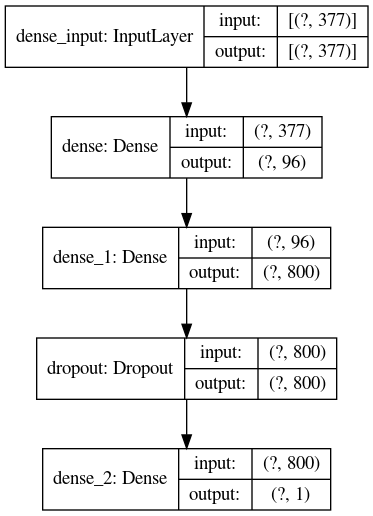

In [74]:
 


def best_model_return():
    best_model = Randomtuner.get_best_models(num_models=1)[0]
    return best_model

Random = {}

ANN = KerasClassifier(build_fn=best_model_return, epochs= 50, batch_size=10, verbose= 1)
ANN.fit(X_train.values, y_train)
pred = ANN.predict(X_test)

Random['accuracy'] = accuracy_score(y_test, pred)
Random['f1'] = f1_score(y_test, pred)
Random['roc_auc'] = roc_auc_score(y_test, pred)
Random['recall'] = recall_score(y_test, pred)
Random['precision'] = precision_score(y_test, pred)

# Evaluate the best model.
for metric, score in Random.items():
    print(f'{metric}: {score}')
    


Randomtuner.get_best_models(num_models=1)[0].summary()

plot_model(Randomtuner.get_best_models(num_models=1)[0], to_file='model_plot.png', show_shapes=True)

In [75]:
Hypertuner = Hyperband(
    ANN_Model,
    objective='val_accuracy',
    max_epochs=40,
    executions_per_trial=3,# how many trials per variation? (same model could perform differently)
    directory='hyperband',
    project_name='dumpsys',
    seed=1,
    )

Hypertuner.search_space_summary()

Hypertuner.search(x=X_train,
             y=y_train,
             epochs=50,
             batch_size=30,  
             validation_data=(X_test, y_test))




Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 26s - loss: 0.7396 - accuracy: 0.500 - ETA: 1s - loss: 0.3915 - accuracy: 0.800 - ETA: 0s - loss: 0.2376 - accuracy: 0.88 - ETA: 0s - loss: 0.2140 - accuracy: 0.91 - 1s 443us/sample - loss: 0.1940 - accuracy: 0.9222 - val_loss: 0.0968 - val_accuracy: 0.9674
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.0627 - accuracy: 0.96 - ETA: 0s - loss: 0.0498 - accuracy: 0.98 - ETA: 0s - loss: 0.0407 - accuracy: 0.98 - ETA: 0s - loss: 0.0369 - accuracy: 0.99 - 0s 143us/sample - loss: 0.0378 - accuracy: 0.9910 - val_loss: 0.0460 - val_accuracy: 0.9896
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 25s - loss: 0.6890 - accuracy: 0.466 - ETA: 1s - loss: 0.4266 - accuracy: 0.787 - ETA: 0s - loss: 0.2862 - accuracy: 0.86 - ETA: 0s - loss: 0.2382 - accuracy: 0.89 - ETA: 0s - loss: 0.2075 - accuracy: 0.90 - 1s 45

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 31s - loss: 0.6592 - accuracy: 0.566 - ETA: 5s - loss: 319538.0890 - accuracy: 0.505 - ETA: 2s - loss: 187590.5617 - accuracy: 0.484 - ETA: 1s - loss: 129067.0420 - accuracy: 0.529 - ETA: 1s - loss: 98354.2498 - accuracy: 0.539 - ETA: 1s - loss: 79440.0924 - accuracy: 0.56 - ETA: 0s - loss: 66627.2853 - accuracy: 0.57 - ETA: 0s - loss: 57373.5886 - accuracy: 0.57 - ETA: 0s - loss: 51636.2964 - accuracy: 0.59 - ETA: 0s - loss: 48033.8111 - accuracy: 0.59 - ETA: 0s - loss: 43945.8813 - accuracy: 0.60 - ETA: 0s - loss: 40530.9943 - accuracy: 0.59 - ETA: 0s - loss: 37583.3367 - accuracy: 0.59 - ETA: 0s - loss: 35035.3551 - accuracy: 0.60 - 2s 854us/sample - loss: 34702.0635 - accuracy: 0.6072 - val_loss: 0.6277 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.7068 - accuracy: 0.56 - ETA: 0s - loss: 0.7016 - accuracy: 0.57 - ETA: 0s - loss

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 31s - loss: 0.8016 - accuracy: 0.466 - ETA: 6s - loss: 4.4043 - accuracy: 0.620 - ETA: 4s - loss: 3.2969 - accuracy: 0.57 - ETA: 3s - loss: 2.7638 - accuracy: 0.50 - ETA: 2s - loss: 2.3349 - accuracy: 0.52 - ETA: 2s - loss: 2.1408 - accuracy: 0.54 - ETA: 1s - loss: 1.9077 - accuracy: 0.53 - ETA: 1s - loss: 1.7836 - accuracy: 0.50 - ETA: 1s - loss: 1.6302 - accuracy: 0.50 - ETA: 1s - loss: 1.5418 - accuracy: 0.51 - ETA: 0s - loss: 1.4358 - accuracy: 0.53 - ETA: 0s - loss: 1.3722 - accuracy: 0.54 - ETA: 0s - loss: 1.3181 - accuracy: 0.54 - ETA: 0s - loss: 1.2547 - accuracy: 0.56 - ETA: 0s - loss: 1.2136 - accuracy: 0.57 - ETA: 0s - loss: 1.1833 - accuracy: 0.57 - ETA: 0s - loss: 1.1545 - accuracy: 0.57 - ETA: 0s - loss: 1.1292 - accuracy: 0.57 - ETA: 0s - loss: 1.1138 - accuracy: 0.57 - 2s 1ms/sample - loss: 1.1029 - accuracy: 0.5741 - val_loss: 0.6756 - val_accuracy: 0.6793
Epoch 2

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 32s - loss: 0.7393 - accuracy: 0.233 - ETA: 4s - loss: 532.2521 - accuracy: 0.49 - ETA: 2s - loss: 304.4857 - accuracy: 0.56 - ETA: 1s - loss: 203.2037 - accuracy: 0.59 - ETA: 0s - loss: 152.5606 - accuracy: 0.61 - ETA: 0s - loss: 122.1845 - accuracy: 0.61 - ETA: 0s - loss: 101.9306 - accuracy: 0.61 - ETA: 0s - loss: 87.4637 - accuracy: 0.6184 - ETA: 0s - loss: 75.2807 - accuracy: 0.619 - 1s 674us/sample - loss: 72.0661 - accuracy: 0.6189 - val_loss: 0.6377 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.5835 - accuracy: 0.80 - ETA: 0s - loss: 0.6635 - accuracy: 0.62 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 25s - loss: 0.6799 - accuracy: 0.600 - ETA: 1s - loss: 0.7076 - accuracy: 0.569 - ETA: 0s - loss: 0.7001 - accuracy: 0.58 - ETA: 0s - loss: 0.6927 - accuracy: 0.59 - ETA: 0s - loss: 0.7044 - accuracy: 0.58 - ETA: 0s - loss: 0.7030 - accuracy: 0.58 - 1s 500us/sample - loss: 0.7024 - accuracy: 0.5898 - val_loss: 0.6346 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.7936 - accuracy: 0.36 - ETA: 0s - loss: 0.6983 - accuracy: 0.60 - ETA: 0s - loss: 0.7116 - accuracy: 0.58 - ETA: 0s - loss: 0.7131 - accuracy: 0.56 - ETA: 0s - loss: 0.7097 - accuracy: 0.56 - ETA: 0s - loss: 0.6970 - accuracy: 0.58 - ETA: 0s - loss: 0.6924 - accuracy: 0.58 - ETA: 0s - loss: 0.6885 - accuracy: 0.59 - 0s 270us/sample - loss: 0.6873 - accuracy: 0.5876 - val_loss: 0.6193 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 25s - loss: 0.6321 - accuracy: 0.700 - ETA: 2s - loss: 1.0557 - accuracy: 0.693 - ETA: 1s - loss: 0.6505 - accuracy: 0.81 - ETA: 0s - loss: 0.5095 - accuracy: 0.85 - ETA: 0s - loss: 0.4178 - accuracy: 0.88 - ETA: 0s - loss: 0.3347 - accuracy: 0.90 - ETA: 0s - loss: 0.2871 - accuracy: 0.91 - ETA: 0s - loss: 0.2623 - accuracy: 0.92 - 1s 582us/sample - loss: 0.2636 - accuracy: 0.9273 - val_loss: 0.0770 - val_accuracy: 0.9844
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.2176 - accuracy: 0.93 - ETA: 0s - loss: 0.0581 - accuracy: 0.98 - ETA: 0s - loss: 0.0388 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accuracy: 0.99 - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0401 - accuracy: 0.98 - ETA: 0s - loss: 0.0395 - accuracy: 0.98 - 1s 298us/sample - loss: 0.0392 - a

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 45s - loss: 0.7750 - accuracy: 0.433 - ETA: 9s - loss: 284.5571 - accuracy: 0.53 - ETA: 5s - loss: 264.3129 - accuracy: 0.57 - ETA: 3s - loss: 240.5116 - accuracy: 0.55 - ETA: 2s - loss: 244.4105 - accuracy: 0.53 - ETA: 1s - loss: 230.7450 - accuracy: 0.54 - ETA: 1s - loss: 224.8351 - accuracy: 0.54 - ETA: 1s - loss: 221.8109 - accuracy: 0.53 - ETA: 0s - loss: 214.0005 - accuracy: 0.53 - ETA: 0s - loss: 204.5960 - accuracy: 0.53 - ETA: 0s - loss: 198.9077 - accuracy: 0.54 - ETA: 0s - loss: 194.8623 - accuracy: 0.54 - ETA: 0s - loss: 191.6870 - accuracy: 0.54 - 2s 946us/sample - loss: 191.8844 - accuracy: 0.5478 - val_loss: 281.8916 - val_accuracy: 0.3207
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 318.1605 - accuracy: 0.23 - ETA: 0s - loss: 166.6175 - accuracy: 0.49 - ETA: 0s - loss: 181.6340 - accuracy: 0.52 - ETA: 0s - loss: 167.2060 - accuracy: 0.52 -

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 37s - loss: 1.2341 - accuracy: 0.300 - ETA: 13s - loss: 1.1064 - accuracy: 0.266 - ETA: 6s - loss: 0.9257 - accuracy: 0.355 - ETA: 4s - loss: 0.8484 - accuracy: 0.43 - ETA: 3s - loss: 0.8148 - accuracy: 0.43 - ETA: 2s - loss: 0.7834 - accuracy: 0.48 - ETA: 2s - loss: 0.7761 - accuracy: 0.48 - ETA: 2s - loss: 0.7593 - accuracy: 0.50 - ETA: 1s - loss: 0.7497 - accuracy: 0.50 - ETA: 1s - loss: 0.7386 - accuracy: 0.53 - ETA: 1s - loss: 0.7313 - accuracy: 0.54 - ETA: 1s - loss: 0.7286 - accuracy: 0.54 - ETA: 1s - loss: 0.7237 - accuracy: 0.54 - ETA: 1s - loss: 0.7180 - accuracy: 0.55 - ETA: 1s - loss: 0.7116 - accuracy: 0.56 - ETA: 0s - loss: 0.7090 - accuracy: 0.57 - ETA: 0s - loss: 0.7076 - accuracy: 0.57 - ETA: 0s - loss: 0.7090 - accuracy: 0.56 - ETA: 0s - loss: 0.7060 - accuracy: 0.57 - ETA: 0s - loss: 0.7048 - accuracy: 0.57 - ETA: 0s - loss: 0.7000 - accuracy: 0.58 - ETA: 0s - l

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 20s - loss: 0.7053 - accuracy: 0.500 - ETA: 0s - loss: 3.9057 - accuracy: 0.620 - ETA: 0s - loss: 2.3119 - accuracy: 0.68 - ETA: 0s - loss: 1.6558 - accuracy: 0.75 - 1s 372us/sample - loss: 1.4340 - accuracy: 0.7851 - val_loss: 0.1314 - val_accuracy: 0.9492
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.0887 - accuracy: 0.96 - ETA: 0s - loss: 0.1853 - accuracy: 0.93 - ETA: 0s - loss: 0.1475 - accuracy: 0.95 - ETA: 0s - loss: 0.1213 - accuracy: 0.95 - ETA: 0s - loss: 0.1107 - accuracy: 0.96 - 0s 179us/sample - loss: 0.1067 - accuracy: 0.9653 - val_loss: 0.0758 - val_accuracy: 0.9804
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 18s - loss: 0.6816 - accuracy: 0.600 - ETA: 0s - loss: 3.8553 - accuracy: 0.643 - ETA: 0s - loss: 2.3039 - accuracy: 0.74 - ETA: 0s - loss: 1.6182 - accuracy: 0.79 - 1s 35

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 20s - loss: 0.7482 - accuracy: 0.500 - ETA: 1s - loss: 0.3078 - accuracy: 0.884 - ETA: 0s - loss: 0.2318 - accuracy: 0.92 - ETA: 0s - loss: 0.1830 - accuracy: 0.94 - ETA: 0s - loss: 0.1564 - accuracy: 0.95 - 1s 424us/sample - loss: 0.1433 - accuracy: 0.9547 - val_loss: 0.0659 - val_accuracy: 0.9870
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.0204 - accuracy: 1.00 - ETA: 0s - loss: 0.0756 - accuracy: 0.98 - ETA: 0s - loss: 0.0582 - accuracy: 0.98 - ETA: 0s - loss: 0.0499 - accuracy: 0.98 - ETA: 0s - loss: 0.0454 - accuracy: 0.99 - 0s 179us/sample - loss: 0.0417 - accuracy: 0.9910 - val_loss: 0.0442 - val_accuracy: 0.9870
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 21s - loss: 0.7977 - accuracy: 0.466 - ETA: 1s - loss: 0.3981 - accuracy: 0.821 - ETA: 0s - loss: 0.2843 - accuracy: 0.89 - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 59s - loss: 0.7032 - accuracy: 0.466 - ETA: 11s - loss: 3.9155 - accuracy: 0.540 - ETA: 5s - loss: 2.2840 - accuracy: 0.603 - ETA: 3s - loss: 1.8303 - accuracy: 0.59 - ETA: 2s - loss: 1.5698 - accuracy: 0.59 - ETA: 2s - loss: 1.4128 - accuracy: 0.59 - ETA: 1s - loss: 1.2717 - accuracy: 0.60 - ETA: 1s - loss: 1.2128 - accuracy: 0.59 - ETA: 1s - loss: 1.1465 - accuracy: 0.60 - ETA: 0s - loss: 1.1014 - accuracy: 0.59 - ETA: 0s - loss: 1.0623 - accuracy: 0.60 - ETA: 0s - loss: 1.0196 - accuracy: 0.60 - ETA: 0s - loss: 0.9853 - accuracy: 0.61 - ETA: 0s - loss: 0.9579 - accuracy: 0.61 - 2s 1ms/sample - loss: 0.9510 - accuracy: 0.6156 - val_loss: 0.7004 - val_accuracy: 0.3207
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.7033 - accuracy: 0.30 - ETA: 0s - loss: 0.6681 - accuracy: 0.59 - ETA: 0s - loss: 0.6511 - accuracy: 0.63 - ETA: 0s - loss: 0.6634 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 1:07 - loss: 0.6915 - accuracy: 0.63 - ETA: 16s - loss: 1.5072 - accuracy: 0.4833 - ETA: 9s - loss: 1.1741 - accuracy: 0.523 - ETA: 6s - loss: 1.0234 - accuracy: 0.55 - ETA: 4s - loss: 0.9407 - accuracy: 0.56 - ETA: 3s - loss: 0.8968 - accuracy: 0.57 - ETA: 3s - loss: 0.8609 - accuracy: 0.58 - ETA: 2s - loss: 0.8300 - accuracy: 0.59 - ETA: 2s - loss: 0.8129 - accuracy: 0.60 - ETA: 1s - loss: 0.7993 - accuracy: 0.60 - ETA: 1s - loss: 0.7837 - accuracy: 0.60 - ETA: 1s - loss: 0.7660 - accuracy: 0.62 - ETA: 1s - loss: 0.7607 - accuracy: 0.62 - ETA: 0s - loss: 0.7544 - accuracy: 0.61 - ETA: 0s - loss: 0.7474 - accuracy: 0.62 - ETA: 0s - loss: 0.7412 - accuracy: 0.62 - ETA: 0s - loss: 0.7319 - accuracy: 0.62 - ETA: 0s - loss: 0.7248 - accuracy: 0.62 - ETA: 0s - loss: 0.7148 - accuracy: 0.62 - ETA: 0s - loss: 0.6987 - accuracy: 0.63 - 3s 1ms/sample - loss: 0.6983 - accuracy: 0.6391 - va

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 42s - loss: 0.7250 - accuracy: 0.566 - ETA: 14s - loss: 0.6638 - accuracy: 0.644 - ETA: 9s - loss: 0.6878 - accuracy: 0.600 - ETA: 5s - loss: 0.6653 - accuracy: 0.62 - ETA: 4s - loss: 0.6761 - accuracy: 0.61 - ETA: 3s - loss: 0.6631 - accuracy: 0.63 - ETA: 2s - loss: 0.6557 - accuracy: 0.64 - ETA: 2s - loss: 0.6515 - accuracy: 0.65 - ETA: 1s - loss: 0.6560 - accuracy: 0.64 - ETA: 1s - loss: 0.6530 - accuracy: 0.64 - ETA: 1s - loss: 0.6538 - accuracy: 0.64 - ETA: 1s - loss: 0.6559 - accuracy: 0.64 - ETA: 0s - loss: 0.6537 - accuracy: 0.64 - ETA: 0s - loss: 0.6562 - accuracy: 0.64 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6551 - accuracy: 0.64 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6577 - accuracy: 0.6368 - val

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 1:11 - loss: 0.8158 - accuracy: 0.33 - ETA: 17s - loss: 1.2602 - accuracy: 0.5750 - ETA: 10s - loss: 0.9984 - accuracy: 0.600 - ETA: 7s - loss: 0.8928 - accuracy: 0.620 - ETA: 5s - loss: 0.8407 - accuracy: 0.62 - ETA: 4s - loss: 0.8084 - accuracy: 0.62 - ETA: 3s - loss: 0.8039 - accuracy: 0.61 - ETA: 3s - loss: 0.7893 - accuracy: 0.61 - ETA: 2s - loss: 0.7832 - accuracy: 0.60 - ETA: 2s - loss: 0.7709 - accuracy: 0.60 - ETA: 2s - loss: 0.7576 - accuracy: 0.61 - ETA: 2s - loss: 0.7530 - accuracy: 0.61 - ETA: 1s - loss: 0.7426 - accuracy: 0.62 - ETA: 1s - loss: 0.7264 - accuracy: 0.63 - ETA: 1s - loss: 0.6997 - accuracy: 0.65 - ETA: 1s - loss: 0.6550 - accuracy: 0.67 - ETA: 0s - loss: 0.6177 - accuracy: 0.69 - ETA: 0s - loss: 0.5772 - accuracy: 0.71 - ETA: 0s - loss: 0.5559 - accuracy: 0.73 - ETA: 0s - loss: 0.5295 - accuracy: 0.74 - ETA: 0s - loss: 0.5180 - accuracy: 0.75 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 31s - loss: 0.6718 - accuracy: 0.633 - ETA: 6s - loss: 0.6823 - accuracy: 0.566 - ETA: 3s - loss: 0.6760 - accuracy: 0.58 - ETA: 2s - loss: 0.6737 - accuracy: 0.58 - ETA: 1s - loss: 0.6758 - accuracy: 0.58 - ETA: 1s - loss: 0.6764 - accuracy: 0.57 - ETA: 1s - loss: 0.6799 - accuracy: 0.56 - ETA: 0s - loss: 0.6789 - accuracy: 0.57 - ETA: 0s - loss: 0.6778 - accuracy: 0.57 - ETA: 0s - loss: 0.6772 - accuracy: 0.57 - ETA: 0s - loss: 0.6767 - accuracy: 0.57 - ETA: 0s - loss: 0.6775 - accuracy: 0.57 - ETA: 0s - loss: 0.6749 - accuracy: 0.58 - ETA: 0s - loss: 0.6738 - accuracy: 0.58 - 2s 858us/sample - loss: 0.6724 - accuracy: 0.5915 - val_loss: 0.6348 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 1s - loss: 0.6656 - accuracy: 0.60 - ETA: 0s - loss: 0.6833 - accuracy: 0.56 - ETA: 0s - loss: 0.6591 - accuracy: 0.62 - ETA: 0s - loss: 0.6481 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 41s - loss: 0.8138 - accuracy: 0.333 - ETA: 10s - loss: 1329.6762 - accuracy: 0.49 - ETA: 6s - loss: 960.9276 - accuracy: 0.4762 - ETA: 4s - loss: 672.8645 - accuracy: 0.52 - ETA: 3s - loss: 517.7495 - accuracy: 0.56 - ETA: 2s - loss: 420.7793 - accuracy: 0.59 - ETA: 2s - loss: 354.4547 - accuracy: 0.60 - ETA: 1s - loss: 306.2176 - accuracy: 0.60 - ETA: 1s - loss: 280.7571 - accuracy: 0.60 - ETA: 1s - loss: 259.2139 - accuracy: 0.60 - ETA: 1s - loss: 240.7474 - accuracy: 0.60 - ETA: 1s - loss: 217.5171 - accuracy: 0.58 - ETA: 1s - loss: 198.3865 - accuracy: 0.56 - ETA: 0s - loss: 182.3550 - accuracy: 0.57 - ETA: 0s - loss: 174.9770 - accuracy: 0.57 - ETA: 0s - loss: 166.4757 - accuracy: 0.57 - ETA: 0s - loss: 162.5266 - accuracy: 0.58 - ETA: 0s - loss: 155.1686 - accuracy: 0.58 - ETA: 0s - loss: 148.4545 - accuracy: 0.58 - ETA: 0s - loss: 142.2937 - accuracy: 0.59 - ETA: 0s - loss

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 30s - loss: 0.6843 - accuracy: 0.600 - ETA: 6s - loss: 3293.2233 - accuracy: 0.546 - ETA: 3s - loss: 1752.0358 - accuracy: 0.546 - ETA: 2s - loss: 1281.8631 - accuracy: 0.531 - ETA: 1s - loss: 1006.9882 - accuracy: 0.548 - ETA: 1s - loss: 830.2108 - accuracy: 0.554 - ETA: 1s - loss: 706.0956 - accuracy: 0.56 - ETA: 0s - loss: 593.0584 - accuracy: 0.56 - ETA: 0s - loss: 525.6099 - accuracy: 0.58 - ETA: 0s - loss: 471.7666 - accuracy: 0.59 - ETA: 0s - loss: 418.6057 - accuracy: 0.60 - ETA: 0s - loss: 383.7748 - accuracy: 0.61 - ETA: 0s - loss: 347.6219 - accuracy: 0.62 - ETA: 0s - loss: 323.2641 - accuracy: 0.63 - 1s 826us/sample - loss: 309.3579 - accuracy: 0.6413 - val_loss: 3.2460 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 5.8720 - accuracy: 0.50 - ETA: 0s - loss: 1.6453 - accuracy: 0.64 - ETA: 0s - loss: 1.0988 - accuracy: 0.69 

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 40s - loss: 0.7459 - accuracy: 0.500 - ETA: 14s - loss: 15.6166 - accuracy: 0.48 - ETA: 8s - loss: 13.9743 - accuracy: 0.5533 - ETA: 6s - loss: 10.8707 - accuracy: 0.533 - ETA: 5s - loss: 9.2581 - accuracy: 0.477 - ETA: 3s - loss: 7.3254 - accuracy: 0.49 - ETA: 2s - loss: 5.8701 - accuracy: 0.51 - ETA: 2s - loss: 5.0570 - accuracy: 0.51 - ETA: 1s - loss: 4.3299 - accuracy: 0.47 - ETA: 1s - loss: 3.7915 - accuracy: 0.49 - ETA: 1s - loss: 3.4719 - accuracy: 0.51 - ETA: 1s - loss: 3.2190 - accuracy: 0.52 - ETA: 0s - loss: 3.0083 - accuracy: 0.53 - ETA: 0s - loss: 2.8277 - accuracy: 0.53 - ETA: 0s - loss: 2.7228 - accuracy: 0.54 - ETA: 0s - loss: 2.5819 - accuracy: 0.55 - ETA: 0s - loss: 2.4585 - accuracy: 0.56 - ETA: 0s - loss: 2.3164 - accuracy: 0.56 - ETA: 0s - loss: 2.2254 - accuracy: 0.56 - ETA: 0s - loss: 2.1418 - accuracy: 0.57 - 2s 1ms/sample - loss: 2.0759 - accuracy: 0.5803 

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 40s - loss: 0.7029 - accuracy: 0.566 - ETA: 6s - loss: 0.7150 - accuracy: 0.583 - ETA: 4s - loss: 0.7275 - accuracy: 0.56 - ETA: 2s - loss: 0.7289 - accuracy: 0.55 - ETA: 2s - loss: 0.7277 - accuracy: 0.56 - ETA: 1s - loss: 0.7162 - accuracy: 0.58 - ETA: 1s - loss: 0.7086 - accuracy: 0.59 - ETA: 1s - loss: 0.7009 - accuracy: 0.60 - ETA: 0s - loss: 0.6936 - accuracy: 0.61 - ETA: 0s - loss: 0.6887 - accuracy: 0.61 - ETA: 0s - loss: 0.6894 - accuracy: 0.61 - ETA: 0s - loss: 0.6910 - accuracy: 0.60 - ETA: 0s - loss: 0.6924 - accuracy: 0.60 - ETA: 0s - loss: 0.6882 - accuracy: 0.60 - ETA: 0s - loss: 0.6918 - accuracy: 0.60 - 2s 1ms/sample - loss: 0.6919 - accuracy: 0.6004 - val_loss: 0.6537 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 1s - loss: 0.6353 - accuracy: 0.66 - ETA: 0s - loss: 0.6370 - accuracy: 0.65 - ETA: 0s - loss: 0.6636 - accuracy: 0

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 1:03 - loss: 0.6834 - accuracy: 0.53 - ETA: 15s - loss: 0.6911 - accuracy: 0.5750 - ETA: 7s - loss: 0.6945 - accuracy: 0.595 - ETA: 5s - loss: 0.6818 - accuracy: 0.60 - ETA: 3s - loss: 0.6776 - accuracy: 0.61 - ETA: 2s - loss: 0.6893 - accuracy: 0.60 - ETA: 2s - loss: 0.6927 - accuracy: 0.59 - ETA: 1s - loss: 0.6918 - accuracy: 0.59 - ETA: 1s - loss: 0.6850 - accuracy: 0.60 - ETA: 1s - loss: 0.6806 - accuracy: 0.60 - ETA: 1s - loss: 0.6794 - accuracy: 0.61 - ETA: 0s - loss: 0.6787 - accuracy: 0.61 - ETA: 0s - loss: 0.6739 - accuracy: 0.61 - ETA: 0s - loss: 0.6706 - accuracy: 0.62 - ETA: 0s - loss: 0.6691 - accuracy: 0.62 - ETA: 0s - loss: 0.6607 - accuracy: 0.62 - ETA: 0s - loss: 0.6549 - accuracy: 0.63 - ETA: 0s - loss: 0.6498 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6470 - accuracy: 0.6368 - val_loss: 0.3715 - val_accuracy: 0.9035
Epoch 2/2
1787/1787 [=========================

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 39s - loss: 0.7802 - accuracy: 0.500 - ETA: 10s - loss: 4.2948 - accuracy: 0.533 - ETA: 6s - loss: 5.7529 - accuracy: 0.485 - ETA: 4s - loss: 6.0096 - accuracy: 0.50 - ETA: 4s - loss: 6.5369 - accuracy: 0.50 - ETA: 3s - loss: 6.8865 - accuracy: 0.50 - ETA: 2s - loss: 6.4066 - accuracy: 0.52 - ETA: 2s - loss: 6.1646 - accuracy: 0.53 - ETA: 2s - loss: 6.2836 - accuracy: 0.53 - ETA: 1s - loss: 6.3706 - accuracy: 0.54 - ETA: 1s - loss: 6.4271 - accuracy: 0.53 - ETA: 1s - loss: 6.6866 - accuracy: 0.54 - ETA: 1s - loss: 7.2253 - accuracy: 0.53 - ETA: 1s - loss: 7.0653 - accuracy: 0.53 - ETA: 1s - loss: 7.0355 - accuracy: 0.54 - ETA: 0s - loss: 7.2233 - accuracy: 0.54 - ETA: 0s - loss: 7.2140 - accuracy: 0.54 - ETA: 0s - loss: 7.1765 - accuracy: 0.54 - ETA: 0s - loss: 7.4917 - accuracy: 0.54 - ETA: 0s - loss: 7.5828 - accuracy: 0.53 - ETA: 0s - loss: 7.5591 - accuracy: 0.53 - ETA: 0s - l

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 23s - loss: 0.6989 - accuracy: 0.533 - ETA: 1s - loss: 0.6491 - accuracy: 0.610 - ETA: 0s - loss: 0.6115 - accuracy: 0.62 - ETA: 0s - loss: 0.5813 - accuracy: 0.63 - ETA: 0s - loss: 0.5561 - accuracy: 0.65 - ETA: 0s - loss: 0.5319 - accuracy: 0.68 - 1s 479us/sample - loss: 0.5174 - accuracy: 0.7079 - val_loss: 0.3195 - val_accuracy: 0.9400
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.3972 - accuracy: 0.93 - ETA: 0s - loss: 0.3098 - accuracy: 0.94 - ETA: 0s - loss: 0.2883 - accuracy: 0.94 - ETA: 0s - loss: 0.2697 - accuracy: 0.95 - ETA: 0s - loss: 0.2520 - accuracy: 0.95 - ETA: 0s - loss: 0.2333 - accuracy: 0.95 - 0s 212us/sample - loss: 0.2279 - accuracy: 0.9552 - val_loss: 0.1500 - val_accuracy: 0.9544
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 26s - loss: 0.7150 - accuracy: 0.366 - ETA: 2

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 33s - loss: 0.6332 - accuracy: 0.700 - ETA: 4s - loss: 25.2759 - accuracy: 0.509 - ETA: 2s - loss: 17.7466 - accuracy: 0.561 - ETA: 2s - loss: 14.8357 - accuracy: 0.520 - ETA: 1s - loss: 12.0574 - accuracy: 0.552 - ETA: 1s - loss: 9.6183 - accuracy: 0.556 - ETA: 0s - loss: 8.0279 - accuracy: 0.53 - ETA: 0s - loss: 6.8974 - accuracy: 0.54 - ETA: 0s - loss: 6.0680 - accuracy: 0.55 - ETA: 0s - loss: 5.4300 - accuracy: 0.56 - ETA: 0s - loss: 5.0850 - accuracy: 0.56 - ETA: 0s - loss: 4.7850 - accuracy: 0.57 - 1s 829us/sample - loss: 4.7460 - accuracy: 0.5725 - val_loss: 0.6376 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.6272 - accuracy: 0.70 - ETA: 0s - loss: 0.6262 - accuracy: 0.70 - ETA: 0s - loss: 0.6366 - accuracy: 0.68 - ETA: 0s - loss: 0.6356 - accuracy: 0.68 - ETA: 0s - loss: 0.6412 - accuracy: 0.66 - ETA: 0s - loss: 0.6419 - a

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 37s - loss: 0.5962 - accuracy: 0.733 - ETA: 6s - loss: 7.9883 - accuracy: 0.538 - ETA: 2s - loss: 12.5622 - accuracy: 0.591 - ETA: 2s - loss: 10.4049 - accuracy: 0.535 - ETA: 1s - loss: 9.4296 - accuracy: 0.531 - ETA: 1s - loss: 8.4958 - accuracy: 0.52 - ETA: 0s - loss: 7.8491 - accuracy: 0.52 - ETA: 0s - loss: 7.4022 - accuracy: 0.52 - ETA: 0s - loss: 6.9773 - accuracy: 0.52 - ETA: 0s - loss: 6.5505 - accuracy: 0.53 - ETA: 0s - loss: 6.2024 - accuracy: 0.53 - ETA: 0s - loss: 5.9169 - accuracy: 0.53 - ETA: 0s - loss: 5.7087 - accuracy: 0.53 - 2s 888us/sample - loss: 5.5955 - accuracy: 0.5361 - val_loss: 2.7529 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 2.1290 - accuracy: 0.76 - ETA: 0s - loss: 1.8572 - accuracy: 0.56 - ETA: 0s - loss: 1.8480 - accuracy: 0.56 - ETA: 0s - loss: 1.7275 - accuracy: 0.57 - ETA: 0s - loss: 1.5375 - accu

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 32s - loss: 0.8990 - accuracy: 0.466 - ETA: 3s - loss: 8.4541 - accuracy: 0.596 - ETA: 1s - loss: 4.3600 - accuracy: 0.59 - ETA: 0s - loss: 3.0821 - accuracy: 0.61 - ETA: 0s - loss: 2.5089 - accuracy: 0.62 - ETA: 0s - loss: 2.2259 - accuracy: 0.60 - ETA: 0s - loss: 2.0172 - accuracy: 0.61 - ETA: 0s - loss: 1.8740 - accuracy: 0.62 - 1s 652us/sample - loss: 1.8445 - accuracy: 0.6189 - val_loss: 0.6367 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.5950 - accuracy: 0.76 - ETA: 0s - loss: 0.6975 - accuracy: 0.63 - ETA: 0s - loss: 0.6841 - accuracy: 0.63 - ETA: 0s - loss: 0.7001 - accuracy: 0.59 - ETA: 0s - loss: 0.6943 - accuracy: 0.59 - ETA: 0s - loss: 0.6913 - accuracy: 0.60 - ETA: 0s - loss: 0.6864 - accuracy: 0.61 - ETA: 0s - loss: 0.6809 - accuracy: 0.61 - ETA: 0s - loss: 0.6852 - accuracy: 0.59 - 1s 295us/sample - loss: 0.6866 - a

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 24s - loss: 0.7073 - accuracy: 0.633 - ETA: 1s - loss: 0.7778 - accuracy: 0.489 - ETA: 0s - loss: 0.7727 - accuracy: 0.48 - ETA: 0s - loss: 0.7497 - accuracy: 0.52 - ETA: 0s - loss: 0.7274 - accuracy: 0.54 - 1s 496us/sample - loss: 0.7284 - accuracy: 0.5462 - val_loss: 0.6056 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.6391 - accuracy: 0.56 - ETA: 0s - loss: 0.6999 - accuracy: 0.57 - ETA: 0s - loss: 0.7084 - accuracy: 0.57 - ETA: 0s - loss: 0.6945 - accuracy: 0.58 - ETA: 0s - loss: 0.7008 - accuracy: 0.58 - ETA: 0s - loss: 0.6971 - accuracy: 0.58 - 0s 214us/sample - loss: 0.6965 - accuracy: 0.5893 - val_loss: 0.5898 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 23s - loss: 0.9870 - accuracy: 0.333 - ETA: 2s - loss: 0.8700 - accuracy: 0.412 - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 27s - loss: 0.9258 - accuracy: 0.333 - ETA: 4s - loss: 1.9112 - accuracy: 0.561 - ETA: 2s - loss: 2.2882 - accuracy: 0.53 - ETA: 1s - loss: 2.1183 - accuracy: 0.54 - ETA: 1s - loss: 1.9997 - accuracy: 0.53 - ETA: 0s - loss: 1.9993 - accuracy: 0.53 - ETA: 0s - loss: 1.9152 - accuracy: 0.53 - ETA: 0s - loss: 1.9163 - accuracy: 0.53 - ETA: 0s - loss: 1.8886 - accuracy: 0.53 - ETA: 0s - loss: 1.9031 - accuracy: 0.53 - ETA: 0s - loss: 1.9590 - accuracy: 0.52 - 1s 728us/sample - loss: 1.9484 - accuracy: 0.5260 - val_loss: 2.1470 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 2.5077 - accuracy: 0.63 - ETA: 0s - loss: 1.0831 - accuracy: 0.55 - ETA: 0s - loss: 1.1403 - accuracy: 0.53 - ETA: 0s - loss: 1.3493 - accuracy: 0.51 - ETA: 0s - loss: 1.4481 - accuracy: 0.53 - ETA: 0s - loss: 1.4625 - accuracy: 0.52 - ETA: 0s - loss: 1.5375 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 22s - loss: 0.8874 - accuracy: 0.600 - ETA: 2s - loss: 0.7399 - accuracy: 0.546 - ETA: 1s - loss: 0.7282 - accuracy: 0.57 - ETA: 0s - loss: 0.7200 - accuracy: 0.58 - ETA: 0s - loss: 0.7168 - accuracy: 0.58 - ETA: 0s - loss: 0.7236 - accuracy: 0.57 - ETA: 0s - loss: 0.7188 - accuracy: 0.58 - 1s 483us/sample - loss: 0.7183 - accuracy: 0.5837 - val_loss: 0.7328 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 1.0166 - accuracy: 0.60 - ETA: 0s - loss: 0.7287 - accuracy: 0.63 - ETA: 0s - loss: 0.7371 - accuracy: 0.59 - ETA: 0s - loss: 0.7225 - accuracy: 0.60 - ETA: 0s - loss: 0.7220 - accuracy: 0.59 - ETA: 0s - loss: 0.7139 - accuracy: 0.59 - ETA: 0s - loss: 0.7114 - accuracy: 0.60 - 0s 217us/sample - loss: 0.7104 - accuracy: 0.6010 - val_loss: 0.6300 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 22s - loss: 0.5702 - accuracy: 0.666 - ETA: 1s - loss: 0.3577 - accuracy: 0.839 - ETA: 0s - loss: 0.2776 - accuracy: 0.88 - ETA: 0s - loss: 0.2163 - accuracy: 0.91 - ETA: 0s - loss: 0.1795 - accuracy: 0.93 - ETA: 0s - loss: 0.1564 - accuracy: 0.94 - 1s 479us/sample - loss: 0.1485 - accuracy: 0.9446 - val_loss: 0.0590 - val_accuracy: 0.9831
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.1735 - accuracy: 0.96 - ETA: 0s - loss: 0.0658 - accuracy: 0.97 - ETA: 0s - loss: 0.0581 - accuracy: 0.97 - ETA: 0s - loss: 0.0445 - accuracy: 0.98 - ETA: 0s - loss: 0.0384 - accuracy: 0.98 - ETA: 0s - loss: 0.0342 - accuracy: 0.98 - 0s 218us/sample - loss: 0.0306 - accuracy: 0.9894 - val_loss: 0.0473 - val_accuracy: 0.9883
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 21s - loss: 0.7406 - accuracy: 0.466 - ETA: 2

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 29s - loss: 0.6951 - accuracy: 0.600 - ETA: 3s - loss: 2.1845 - accuracy: 0.481 - ETA: 1s - loss: 1.5472 - accuracy: 0.48 - ETA: 0s - loss: 1.2703 - accuracy: 0.50 - ETA: 0s - loss: 1.1180 - accuracy: 0.52 - ETA: 0s - loss: 1.0374 - accuracy: 0.53 - ETA: 0s - loss: 0.9907 - accuracy: 0.54 - 1s 579us/sample - loss: 0.9601 - accuracy: 0.5562 - val_loss: 0.6275 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.5677 - accuracy: 0.73 - ETA: 0s - loss: 0.7387 - accuracy: 0.55 - ETA: 0s - loss: 0.7604 - accuracy: 0.54 - ETA: 0s - loss: 0.7472 - accuracy: 0.56 - ETA: 0s - loss: 0.7423 - accuracy: 0.56 - ETA: 0s - loss: 0.7281 - accuracy: 0.58 - ETA: 0s - loss: 0.7211 - accuracy: 0.58 - 0s 226us/sample - loss: 0.7238 - accuracy: 0.5865 - val_loss: 0.7941 - val_accuracy: 0.3207
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 19s - loss: 0.7266 - accuracy: 0.400 - ETA: 1s - loss: 0.7180 - accuracy: 0.391 - ETA: 0s - loss: 0.7240 - accuracy: 0.39 - ETA: 0s - loss: 0.7239 - accuracy: 0.39 - ETA: 0s - loss: 0.7213 - accuracy: 0.40 - ETA: 0s - loss: 0.7188 - accuracy: 0.41 - 1s 441us/sample - loss: 0.7180 - accuracy: 0.4169 - val_loss: 0.7086 - val_accuracy: 0.3207
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.7294 - accuracy: 0.30 - ETA: 0s - loss: 0.7043 - accuracy: 0.44 - ETA: 0s - loss: 0.7040 - accuracy: 0.46 - ETA: 0s - loss: 0.7057 - accuracy: 0.46 - ETA: 0s - loss: 0.7051 - accuracy: 0.45 - 0s 182us/sample - loss: 0.7037 - accuracy: 0.4617 - val_loss: 0.6896 - val_accuracy: 0.6154
Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 19s - loss: 0.7158 - accuracy: 0.500 - ETA: 1s - loss: 0.7415 - accuracy: 0.396 - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 28s - loss: 0.8610 - accuracy: 0.433 - ETA: 4s - loss: 1.6357 - accuracy: 0.557 - ETA: 2s - loss: 1.2050 - accuracy: 0.57 - ETA: 1s - loss: 1.0520 - accuracy: 0.57 - ETA: 0s - loss: 0.9594 - accuracy: 0.57 - ETA: 0s - loss: 0.9213 - accuracy: 0.58 - ETA: 0s - loss: 0.8867 - accuracy: 0.58 - ETA: 0s - loss: 0.8526 - accuracy: 0.59 - ETA: 0s - loss: 0.8357 - accuracy: 0.59 - ETA: 0s - loss: 0.8211 - accuracy: 0.59 - 1s 679us/sample - loss: 0.8155 - accuracy: 0.5915 - val_loss: 0.6360 - val_accuracy: 0.6793
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.6053 - accuracy: 0.70 - ETA: 0s - loss: 0.7536 - accuracy: 0.60 - ETA: 0s - loss: 0.7500 - accuracy: 0.56 - ETA: 0s - loss: 0.7428 - accuracy: 0.56 - ETA: 0s - loss: 0.7287 - accuracy: 0.58 - ETA: 0s - loss: 0.7163 - accuracy: 0.59 - ETA: 0s - loss: 0.7217 - accuracy: 0.58 - ETA: 0s - loss: 0.7233 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 28s - loss: 1.1188 - accuracy: 0.333 - ETA: 4s - loss: 0.6919 - accuracy: 0.650 - ETA: 2s - loss: 0.4402 - accuracy: 0.78 - ETA: 1s - loss: 0.3421 - accuracy: 0.84 - ETA: 1s - loss: 0.2755 - accuracy: 0.87 - ETA: 0s - loss: 0.2444 - accuracy: 0.89 - ETA: 0s - loss: 0.2108 - accuracy: 0.91 - ETA: 0s - loss: 0.1805 - accuracy: 0.92 - ETA: 0s - loss: 0.1613 - accuracy: 0.93 - ETA: 0s - loss: 0.1594 - accuracy: 0.93 - ETA: 0s - loss: 0.1569 - accuracy: 0.93 - ETA: 0s - loss: 0.1472 - accuracy: 0.94 - 1s 777us/sample - loss: 0.1452 - accuracy: 0.9435 - val_loss: 0.0665 - val_accuracy: 0.9791
Epoch 2/2
1787/1787 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0660 - accuracy: 0.99 - ETA: 0s - loss: 0.0525 - accuracy: 0.98 - ETA: 0s - loss: 0.0754 - accuracy: 0.98 - ETA: 0s - loss: 0.0646 - accuracy: 0.98 - ETA: 0s - loss: 0.0539 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/2
1787/1787 [==============================] - ETA: 36s - loss: 0.7253 - accuracy: 0.600 - ETA: 9s - loss: 0.7613 - accuracy: 0.458 - ETA: 5s - loss: 0.7483 - accuracy: 0.48 - ETA: 3s - loss: 0.7414 - accuracy: 0.49 - ETA: 3s - loss: 0.7331 - accuracy: 0.50 - ETA: 2s - loss: 0.7317 - accuracy: 0.48 - ETA: 2s - loss: 0.7278 - accuracy: 0.49 - ETA: 1s - loss: 0.7322 - accuracy: 0.48 - ETA: 1s - loss: 0.7296 - accuracy: 0.49 - ETA: 1s - loss: 0.7239 - accuracy: 0.50 - ETA: 1s - loss: 0.7286 - accuracy: 0.49 - ETA: 0s - loss: 0.7315 - accuracy: 0.48 - ETA: 0s - loss: 0.7312 - accuracy: 0.48 - ETA: 0s - loss: 0.7286 - accuracy: 0.48 - ETA: 0s - loss: 0.7249 - accuracy: 0.48 - ETA: 0s - loss: 0.7239 - accuracy: 0.49 - ETA: 0s - loss: 0.7228 - accuracy: 0.49 - ETA: 0s - loss: 0.7235 - accuracy: 0.49 - ETA: 0s - loss: 0.7219 - accuracy: 0.49 - 2s 1ms/sample - loss: 0.7208 - accuracy: 0.4997 - val_loss: 0.6589 - val_accuracy: 0.6793
Epoch 2

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 27s - loss: 0.9958 - accuracy: 0.333 - ETA: 3s - loss: 0.5249 - accuracy: 0.714 - ETA: 2s - loss: 0.3921 - accuracy: 0.81 - ETA: 1s - loss: 0.3148 - accuracy: 0.86 - ETA: 1s - loss: 0.2884 - accuracy: 0.88 - ETA: 0s - loss: 0.2550 - accuracy: 0.90 - ETA: 0s - loss: 0.2165 - accuracy: 0.91 - ETA: 0s - loss: 0.1896 - accuracy: 0.92 - ETA: 0s - loss: 0.1795 - accuracy: 0.93 - ETA: 0s - loss: 0.1793 - accuracy: 0.93 - ETA: 0s - loss: 0.1642 - accuracy: 0.94 - ETA: 0s - loss: 0.1516 - accuracy: 0.94 - 1s 733us/sample - loss: 0.1509 - accuracy: 0.9474 - val_loss: 0.0610 - val_accuracy: 0.9831
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0377 - accuracy: 0.99 - ETA: 0s - loss: 0.0277 - accuracy: 0.99 - ETA: 0s - loss: 0.0451 - accuracy: 0.99 - ETA: 0s - loss: 0.0458 - accuracy: 0.98 - ETA: 0s - loss: 0.0528 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 25s - loss: 0.6839 - accuracy: 0.533 - ETA: 1s - loss: 0.4309 - accuracy: 0.781 - ETA: 0s - loss: 0.2827 - accuracy: 0.86 - ETA: 0s - loss: 0.2130 - accuracy: 0.89 - 1s 435us/sample - loss: 0.1854 - accuracy: 0.9149 - val_loss: 0.0842 - val_accuracy: 0.9778
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0485 - accuracy: 1.00 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0358 - accuracy: 0.99 - ETA: 0s - loss: 0.0404 - accuracy: 0.99 - 0s 132us/sample - loss: 0.0388 - accuracy: 0.9916 - val_loss: 0.0771 - val_accuracy: 0.9752
Epoch 5/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0431 - accuracy: 0.98 - ETA: 0s - loss: 0.0306 - accuracy: 0.99 - ETA: 0s - loss: 0.0326 - accuracy: 0.99 - 0s 132us/sample - loss: 0.0310 - accuracy: 0.9927 - val_loss: 0.0691 - val_accuracy: 0.9778
Train

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 23s - loss: 0.9339 - accuracy: 0.166 - ETA: 4s - loss: 1.7032 - accuracy: 0.522 - ETA: 2s - loss: 1.2339 - accuracy: 0.54 - ETA: 1s - loss: 0.9406 - accuracy: 0.65 - ETA: 0s - loss: 0.7273 - accuracy: 0.73 - ETA: 0s - loss: 0.5810 - accuracy: 0.79 - ETA: 0s - loss: 0.4860 - accuracy: 0.82 - ETA: 0s - loss: 0.4158 - accuracy: 0.85 - ETA: 0s - loss: 0.3707 - accuracy: 0.86 - 1s 563us/sample - loss: 0.3574 - accuracy: 0.8724 - val_loss: 0.0809 - val_accuracy: 0.9661
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0337 - accuracy: 0.96 - ETA: 0s - loss: 0.0449 - accuracy: 0.98 - ETA: 0s - loss: 0.0483 - accuracy: 0.98 - ETA: 0s - loss: 0.0395 - accuracy: 0.98 - ETA: 0s - loss: 0.0446 - accuracy: 0.98 - ETA: 0s - loss: 0.0463 - accuracy: 0.98 - ETA: 0s - loss: 0.0455 - accuracy: 0.98 - ETA: 0s - loss: 0.0492 - accuracy: 0.98 - ETA: 0s - loss: 0.0438 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 21s - loss: 0.6476 - accuracy: 0.566 - ETA: 1s - loss: 0.3265 - accuracy: 0.869 - ETA: 0s - loss: 0.2458 - accuracy: 0.91 - ETA: 0s - loss: 0.2132 - accuracy: 0.92 - ETA: 0s - loss: 0.1772 - accuracy: 0.94 - ETA: 0s - loss: 0.1589 - accuracy: 0.94 - 1s 444us/sample - loss: 0.1541 - accuracy: 0.9513 - val_loss: 0.0721 - val_accuracy: 0.9804
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.3507 - accuracy: 0.96 - ETA: 0s - loss: 0.0832 - accuracy: 0.99 - ETA: 0s - loss: 0.0662 - accuracy: 0.98 - ETA: 0s - loss: 0.0547 - accuracy: 0.98 - ETA: 0s - loss: 0.0530 - accuracy: 0.98 - ETA: 0s - loss: 0.0463 - accuracy: 0.98 - 0s 233us/sample - loss: 0.0433 - accuracy: 0.9899 - val_loss: 0.0476 - val_accuracy: 0.9870
Epoch 5/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0176 - accuracy: 1.00 - ETA: 0s - loss: 0.0475 - accuracy: 0.99 - ETA: 0s - los

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 19s - loss: 0.7365 - accuracy: 0.400 - ETA: 0s - loss: 2.9861 - accuracy: 0.649 - ETA: 0s - loss: 1.8932 - accuracy: 0.70 - ETA: 0s - loss: 1.3828 - accuracy: 0.77 - 1s 365us/sample - loss: 1.1846 - accuracy: 0.8041 - val_loss: 0.1012 - val_accuracy: 0.9661
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0481 - accuracy: 1.00 - ETA: 0s - loss: 0.0933 - accuracy: 0.96 - ETA: 0s - loss: 0.0767 - accuracy: 0.97 - ETA: 0s - loss: 0.0673 - accuracy: 0.97 - ETA: 0s - loss: 0.0691 - accuracy: 0.97 - 0s 156us/sample - loss: 0.0682 - accuracy: 0.9731 - val_loss: 0.1076 - val_accuracy: 0.9596
Epoch 5/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0324 - accuracy: 0.96 - ETA: 0s - loss: 0.0576 - accuracy: 0.98 - ETA: 0s - loss: 0.0479 - accuracy: 0.98 - ETA: 0s - loss: 0.0440 - accuracy: 0.98 - 0s 138us/sample - loss: 0.0421 - accuracy: 0.9849 - val

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 27s - loss: 0.6792 - accuracy: 0.533 - ETA: 2s - loss: 0.6062 - accuracy: 0.652 - ETA: 0s - loss: 0.5892 - accuracy: 0.64 - ETA: 0s - loss: 0.5736 - accuracy: 0.64 - ETA: 0s - loss: 0.5537 - accuracy: 0.66 - ETA: 0s - loss: 0.5182 - accuracy: 0.70 - ETA: 0s - loss: 0.4941 - accuracy: 0.74 - 1s 576us/sample - loss: 0.4901 - accuracy: 0.7515 - val_loss: 0.2820 - val_accuracy: 0.9518
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.3579 - accuracy: 0.90 - ETA: 0s - loss: 0.2984 - accuracy: 0.92 - ETA: 0s - loss: 0.2835 - accuracy: 0.93 - ETA: 0s - loss: 0.2605 - accuracy: 0.94 - ETA: 0s - loss: 0.2324 - accuracy: 0.95 - ETA: 0s - loss: 0.2191 - accuracy: 0.95 - ETA: 0s - loss: 0.2086 - accuracy: 0.95 - ETA: 0s - loss: 0.2022 - accuracy: 0.95 - 0s 269us/sample - loss: 0.2022 - accuracy: 0.9597 - val_loss: 0.1336 - val_accuracy: 0.9583
Epoch 5/5
1787/1787 [=====

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 1:01 - loss: 0.7040 - accuracy: 0.43 - ETA: 15s - loss: 0.7726 - accuracy: 0.5000 - ETA: 7s - loss: 0.7176 - accuracy: 0.595 - ETA: 4s - loss: 0.7177 - accuracy: 0.55 - ETA: 3s - loss: 0.7029 - accuracy: 0.57 - ETA: 2s - loss: 0.6937 - accuracy: 0.58 - ETA: 2s - loss: 0.6899 - accuracy: 0.59 - ETA: 1s - loss: 0.6913 - accuracy: 0.59 - ETA: 1s - loss: 0.6877 - accuracy: 0.60 - ETA: 1s - loss: 0.6840 - accuracy: 0.60 - ETA: 0s - loss: 0.6845 - accuracy: 0.60 - ETA: 0s - loss: 0.6810 - accuracy: 0.60 - ETA: 0s - loss: 0.6770 - accuracy: 0.60 - ETA: 0s - loss: 0.6723 - accuracy: 0.61 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6503 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6408 - accuracy: 0.6391 - val_loss: 0.3912 - val_accuracy: 0.8866
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.3511 - accuracy: 0.93 - ETA: 0s - loss: 0.3403 - accuracy

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 1:03 - loss: 0.6910 - accuracy: 0.50 - ETA: 12s - loss: 1.0206 - accuracy: 0.5467 - ETA: 7s - loss: 0.8782 - accuracy: 0.579 - ETA: 5s - loss: 0.8033 - accuracy: 0.60 - ETA: 3s - loss: 0.7681 - accuracy: 0.61 - ETA: 3s - loss: 0.7559 - accuracy: 0.60 - ETA: 2s - loss: 0.7465 - accuracy: 0.60 - ETA: 2s - loss: 0.7423 - accuracy: 0.60 - ETA: 2s - loss: 0.7367 - accuracy: 0.60 - ETA: 1s - loss: 0.7305 - accuracy: 0.61 - ETA: 1s - loss: 0.7270 - accuracy: 0.61 - ETA: 1s - loss: 0.7249 - accuracy: 0.60 - ETA: 1s - loss: 0.7216 - accuracy: 0.60 - ETA: 1s - loss: 0.7174 - accuracy: 0.60 - ETA: 0s - loss: 0.7126 - accuracy: 0.61 - ETA: 0s - loss: 0.7110 - accuracy: 0.60 - ETA: 0s - loss: 0.7069 - accuracy: 0.61 - ETA: 0s - loss: 0.7061 - accuracy: 0.61 - ETA: 0s - loss: 0.6989 - accuracy: 0.61 - ETA: 0s - loss: 0.6900 - accuracy: 0.61 - ETA: 0s - loss: 0.6762 - accuracy: 0.62 - 3s 1ms/sam

1787/1787 [==============================] - ETA: 1s - loss: 0.1804 - accuracy: 0.93 - ETA: 1s - loss: 0.1610 - accuracy: 0.96 - ETA: 0s - loss: 0.1190 - accuracy: 0.97 - ETA: 0s - loss: 0.1020 - accuracy: 0.98 - ETA: 0s - loss: 0.0942 - accuracy: 0.97 - ETA: 0s - loss: 0.1219 - accuracy: 0.97 - ETA: 0s - loss: 0.1161 - accuracy: 0.97 - ETA: 0s - loss: 0.1547 - accuracy: 0.96 - ETA: 0s - loss: 0.1554 - accuracy: 0.96 - ETA: 0s - loss: 0.1472 - accuracy: 0.96 - ETA: 0s - loss: 0.1474 - accuracy: 0.96 - ETA: 0s - loss: 0.1595 - accuracy: 0.96 - ETA: 0s - loss: 0.1609 - accuracy: 0.96 - ETA: 0s - loss: 0.1568 - accuracy: 0.96 - ETA: 0s - loss: 0.1572 - accuracy: 0.96 - ETA: 0s - loss: 0.1542 - accuracy: 0.96 - ETA: 0s - loss: 0.1512 - accuracy: 0.96 - ETA: 0s - loss: 0.1479 - accuracy: 0.96 - ETA: 0s - loss: 0.1446 - accuracy: 0.96 - 1s 712us/sample - loss: 0.1403 - accuracy: 0.9631 - val_loss: 0.1184 - val_accuracy: 0.9739


Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 1:05 - loss: 0.6984 - accuracy: 0.53 - ETA: 16s - loss: 1.4696 - accuracy: 0.5167 - ETA: 7s - loss: 1.0942 - accuracy: 0.525 - ETA: 5s - loss: 0.9794 - accuracy: 0.54 - ETA: 4s - loss: 0.9367 - accuracy: 0.53 - ETA: 3s - loss: 0.8715 - accuracy: 0.56 - ETA: 3s - loss: 0.8458 - accuracy: 0.57 - ETA: 2s - loss: 0.8145 - accuracy: 0.58 - ETA: 1s - loss: 0.7798 - accuracy: 0.60 - ETA: 1s - loss: 0.7772 - accuracy: 0.62 - ETA: 1s - loss: 0.7469 - accuracy: 0.63 - ETA: 1s - loss: 0.6816 - accuracy: 0.67 - ETA: 0s - loss: 0.6610 - accuracy: 0.68 - ETA: 0s - loss: 0.6312 - accuracy: 0.70 - ETA: 0s - loss: 0.6073 - accuracy: 0.71 - ETA: 0s - loss: 0.5860 - accuracy: 0.72 - ETA: 0s - loss: 0.5597 - accuracy: 0.74 - ETA: 0s - loss: 0.5366 - accuracy: 0.75 - ETA: 0s - loss: 0.5121 - accuracy: 0.76 - 2s 1ms/sample - loss: 0.5075 - accuracy: 0.7711 - val_loss: 0.2189 - val_accuracy: 0.9374
Epoc

1787/1787 [==============================] - ETA: 1s - loss: 0.1233 - accuracy: 0.96 - ETA: 1s - loss: 0.0972 - accuracy: 0.97 - ETA: 1s - loss: 0.1623 - accuracy: 0.95 - ETA: 1s - loss: 0.1652 - accuracy: 0.95 - ETA: 1s - loss: 0.1301 - accuracy: 0.96 - ETA: 1s - loss: 0.1226 - accuracy: 0.97 - ETA: 1s - loss: 0.1179 - accuracy: 0.97 - ETA: 1s - loss: 0.1142 - accuracy: 0.97 - ETA: 1s - loss: 0.1161 - accuracy: 0.97 - ETA: 0s - loss: 0.1156 - accuracy: 0.97 - ETA: 0s - loss: 0.1038 - accuracy: 0.97 - ETA: 0s - loss: 0.1366 - accuracy: 0.97 - ETA: 0s - loss: 0.1712 - accuracy: 0.96 - ETA: 0s - loss: 0.1693 - accuracy: 0.96 - ETA: 0s - loss: 0.1737 - accuracy: 0.96 - ETA: 0s - loss: 0.1706 - accuracy: 0.96 - ETA: 0s - loss: 0.1634 - accuracy: 0.96 - ETA: 0s - loss: 0.1685 - accuracy: 0.96 - ETA: 0s - loss: 0.1738 - accuracy: 0.95 - ETA: 0s - loss: 0.1743 - accuracy: 0.95 - ETA: 0s - loss: 0.1795 - accuracy: 0.95 - 1s 756us/sample - loss: 0.1905 - accuracy: 0.9552 - val_loss: 0.1732 - va

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 21s - loss: 0.7506 - accuracy: 0.466 - ETA: 1s - loss: 1.2788 - accuracy: 0.494 - ETA: 0s - loss: 0.9907 - accuracy: 0.55 - ETA: 0s - loss: 0.8671 - accuracy: 0.59 - ETA: 0s - loss: 0.7913 - accuracy: 0.62 - ETA: 0s - loss: 0.7270 - accuracy: 0.66 - 1s 452us/sample - loss: 0.7236 - accuracy: 0.6698 - val_loss: 0.3489 - val_accuracy: 0.9544
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.3758 - accuracy: 0.86 - ETA: 0s - loss: 0.3386 - accuracy: 0.93 - ETA: 0s - loss: 0.2986 - accuracy: 0.94 - ETA: 0s - loss: 0.2565 - accuracy: 0.96 - ETA: 0s - loss: 0.2317 - accuracy: 0.96 - ETA: 0s - loss: 0.2154 - accuracy: 0.96 - 0s 213us/sample - loss: 0.2016 - accuracy: 0.9687 - val_loss: 0.0960 - val_accuracy: 0.9844
Epoch 5/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0961 - accuracy: 1.00 - ETA: 0s - loss: 0.1120 - accuracy: 0.98 - ETA: 0s - los

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 29s - loss: 0.7034 - accuracy: 0.533 - ETA: 3s - loss: 1.5912 - accuracy: 0.629 - ETA: 2s - loss: 1.2236 - accuracy: 0.59 - ETA: 1s - loss: 1.0766 - accuracy: 0.57 - ETA: 0s - loss: 0.9807 - accuracy: 0.60 - ETA: 0s - loss: 0.9504 - accuracy: 0.60 - ETA: 0s - loss: 0.8979 - accuracy: 0.61 - ETA: 0s - loss: 0.8751 - accuracy: 0.60 - ETA: 0s - loss: 0.8549 - accuracy: 0.59 - ETA: 0s - loss: 0.8426 - accuracy: 0.59 - 1s 721us/sample - loss: 0.8312 - accuracy: 0.5954 - val_loss: 0.6298 - val_accuracy: 0.6793
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.8133 - accuracy: 0.60 - ETA: 0s - loss: 0.7051 - accuracy: 0.65 - ETA: 0s - loss: 0.6842 - accuracy: 0.63 - ETA: 0s - loss: 0.6955 - accuracy: 0.63 - ETA: 0s - loss: 0.6937 - accuracy: 0.62 - ETA: 0s - loss: 0.6992 - accuracy: 0.62 - ETA: 0s - loss: 0.7047 - accuracy: 0.61 - ETA: 0s - loss: 0.7013 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 3/5
1787/1787 [==============================] - ETA: 34s - loss: 0.6553 - accuracy: 0.566 - ETA: 5s - loss: 5265.8652 - accuracy: 0.483 - ETA: 3s - loss: 3238.8722 - accuracy: 0.457 - ETA: 2s - loss: 2474.6200 - accuracy: 0.491 - ETA: 1s - loss: 1902.8231 - accuracy: 0.481 - ETA: 1s - loss: 1529.2435 - accuracy: 0.509 - ETA: 0s - loss: 1278.5518 - accuracy: 0.531 - ETA: 0s - loss: 1131.4120 - accuracy: 0.546 - ETA: 0s - loss: 988.0615 - accuracy: 0.554 - ETA: 0s - loss: 896.2315 - accuracy: 0.55 - ETA: 0s - loss: 820.1649 - accuracy: 0.55 - ETA: 0s - loss: 741.4470 - accuracy: 0.55 - ETA: 0s - loss: 677.1342 - accuracy: 0.55 - 1s 822us/sample - loss: 647.9875 - accuracy: 0.5613 - val_loss: 1.3310 - val_accuracy: 0.3207
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 1.5109 - accuracy: 0.36 - ETA: 0s - loss: 1.3577 - accuracy: 0.56 - ETA: 0s - loss: 3.4932 - accuracy: 0.57 - ETA: 0s - loss: 2.7549 - accuracy: 0

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 29s - loss: 0.6956 - accuracy: 0.600 - ETA: 4s - loss: 0.6132 - accuracy: 0.750 - ETA: 2s - loss: 0.3824 - accuracy: 0.86 - ETA: 1s - loss: 0.3133 - accuracy: 0.89 - ETA: 0s - loss: 0.2573 - accuracy: 0.91 - ETA: 0s - loss: 0.2332 - accuracy: 0.92 - ETA: 0s - loss: 0.2078 - accuracy: 0.92 - ETA: 0s - loss: 0.1849 - accuracy: 0.93 - ETA: 0s - loss: 0.1660 - accuracy: 0.94 - ETA: 0s - loss: 0.1558 - accuracy: 0.94 - 1s 681us/sample - loss: 0.1509 - accuracy: 0.9491 - val_loss: 0.0407 - val_accuracy: 0.9896
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0343 - accuracy: 0.98 - ETA: 0s - loss: 0.0251 - accuracy: 0.98 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.98 - ETA: 0s - loss: 0.0335 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 2.7734e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8797e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9948e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9270e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2593e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9659e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6490e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3651e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0108 - accuracy: 0.9986   - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - 1s 382us/sample - loss: 0.0085 - accuracy: 0.9989 - val_loss: 0.0388 - val_accuracy: 0.9922
Epoch 11/14
1787/1787 [==============================] - ETA: 0s - loss: 5.8315e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3451e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.0000   - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ET

1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 9.2692e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 9.6796e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0107 - accuracy: 0.9982   - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - 1s 468us/sample - loss: 0.0220 - accuracy: 0.9955 - val_loss: 0.0669 - val_accuracy: 0.9870


Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 24s - loss: 0.6675 - accuracy: 0.633 - ETA: 3s - loss: 1.1809 - accuracy: 0.641 - ETA: 1s - loss: 0.5959 - accuracy: 0.81 - ETA: 0s - loss: 0.3952 - accuracy: 0.87 - ETA: 0s - loss: 0.3371 - accuracy: 0.89 - ETA: 0s - loss: 0.2769 - accuracy: 0.91 - ETA: 0s - loss: 0.2396 - accuracy: 0.92 - 1s 527us/sample - loss: 0.2335 - accuracy: 0.9261 - val_loss: 0.0590 - val_accuracy: 0.9831
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0429 - accuracy: 0.98 - ETA: 0s - loss: 0.0315 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0339 - accuracy: 0.99 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - 0s 250us/sample - loss: 0.0293 - accuracy: 0.9933 - val_loss: 0.0492 - val_accuracy: 0.9870
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 4.7307e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4534e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 0.9972   - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0021 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - 1s 344us/sample - loss: 0.0112 - accuracy: 0.9978 - val_loss: 0.0526 - val_accuracy: 0.9870
Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 23s - loss: 0.6808 - accuracy: 0.600 - ETA: 2s - loss: 1.3756 - accuracy: 0.633 - ETA: 1s - loss: 0.8264 - accuracy: 0.77 - ETA: 0s - loss: 0.6173 - accuracy: 0.83 - ETA: 0s - loss: 0.4951 - accuracy: 0.86 - ETA: 0s - loss: 0.4170 - accuracy: 0.88 - ETA: 0s - loss: 0.3664 - accuracy: 0.90 - ETA: 0s - loss: 0.3406 - accura

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 20s - loss: 0.7390 - accuracy: 0.533 - ETA: 1s - loss: 0.3150 - accuracy: 0.848 - ETA: 0s - loss: 0.2537 - accuracy: 0.89 - ETA: 0s - loss: 0.1972 - accuracy: 0.92 - ETA: 0s - loss: 0.1795 - accuracy: 0.93 - ETA: 0s - loss: 0.1585 - accuracy: 0.94 - 1s 436us/sample - loss: 0.1526 - accuracy: 0.9446 - val_loss: 0.0736 - val_accuracy: 0.9817
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0667 - accuracy: 1.00 - ETA: 0s - loss: 0.0830 - accuracy: 0.98 - ETA: 0s - loss: 0.0573 - accuracy: 0.98 - ETA: 0s - loss: 0.0521 - accuracy: 0.98 - ETA: 0s - loss: 0.0469 - accuracy: 0.98 - 0s 173us/sample - loss: 0.0447 - accuracy: 0.9899 - val_loss: 0.0474 - val_accuracy: 0.9883
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0288 - accuracy: 1.00 - ETA: 0s - loss: 0.0484 - accuracy: 0.99 - ETA: 0s - loss: 0.0338 - accuracy: 0.99 - ETA: 0s - 

Epoch 9/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0207 - accuracy: 1.00 - ETA: 0s - loss: 0.0157 - accuracy: 1.00 - ETA: 0s - loss: 0.0136 - accuracy: 1.00 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - 0s 221us/sample - loss: 0.0190 - accuracy: 0.9966 - val_loss: 0.0309 - val_accuracy: 0.9896
Epoch 10/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0072 - accuracy: 1.00 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - 0s 212us/sample - loss: 0.0164 - accuracy: 0.9972 - val_loss: 0.0297 - val_accuracy: 0.9896
Epoch 11/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0037 - accuracy: 1.00 - ETA: 0s - loss: 0.0161 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 18s - loss: 0.8712 - accuracy: 0.233 - ETA: 0s - loss: 4.0982 - accuracy: 0.586 - ETA: 0s - loss: 2.4639 - accuracy: 0.69 - ETA: 0s - loss: 1.8263 - accuracy: 0.75 - 1s 361us/sample - loss: 1.3582 - accuracy: 0.8131 - val_loss: 0.2007 - val_accuracy: 0.9231
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.2499 - accuracy: 0.90 - ETA: 0s - loss: 0.1895 - accuracy: 0.93 - ETA: 0s - loss: 0.1425 - accuracy: 0.95 - ETA: 0s - loss: 0.1225 - accuracy: 0.95 - 0s 136us/sample - loss: 0.1155 - accuracy: 0.9619 - val_loss: 0.0919 - val_accuracy: 0.9661
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0342 - accuracy: 0.96 - ETA: 0s - loss: 0.0693 - accuracy: 0.97 - ETA: 0s - loss: 0.0611 - accuracy: 0.98 - ETA: 0s - loss: 0.0503 - accuracy: 0.98 - 0s 122us/sample - loss: 0.0493 - accuracy: 0.9843 - val_loss: 0.0505 - val_accuracy: 0.9857
Ep

1787/1787 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 1.00 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - 0s 137us/sample - loss: 0.0113 - accuracy: 0.9972 - val_loss: 0.0251 - val_accuracy: 0.9922
Epoch 14/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - 0s 131us/sample - loss: 0.0107 - accuracy: 0.9978 - val_loss: 0.0208 - val_accuracy: 0.9935


Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 27s - loss: 0.6238 - accuracy: 0.666 - ETA: 3s - loss: 0.4595 - accuracy: 0.766 - ETA: 2s - loss: 0.3242 - accuracy: 0.85 - ETA: 1s - loss: 0.2969 - accuracy: 0.88 - ETA: 1s - loss: 0.2786 - accuracy: 0.90 - ETA: 0s - loss: 0.2385 - accuracy: 0.91 - ETA: 0s - loss: 0.2061 - accuracy: 0.92 - ETA: 0s - loss: 0.1932 - accuracy: 0.93 - ETA: 0s - loss: 0.1756 - accuracy: 0.94 - ETA: 0s - loss: 0.1600 - accuracy: 0.94 - ETA: 0s - loss: 0.1506 - accuracy: 0.95 - 1s 698us/sample - loss: 0.1467 - accuracy: 0.9524 - val_loss: 0.0726 - val_accuracy: 0.9870
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 2.4899e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.0000   - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0234

1787/1787 [==============================] - ETA: 0s - loss: 8.4698e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3828e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.4885e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3855e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0144 - accuracy: 0.9983   - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - 1s 475us/sample - loss: 0.0054 - accuracy: 0.9994 - val_loss: 0.0542 - val_accuracy: 0.9922
Epoch 29/40
1787/1787 [==============================] - ETA: 0s - loss: 6.1580e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7275e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3003e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9736e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.7648e-04 - accuracy: 1.00 - ETA: 0s - 

Epoch 40/40
1787/1787 [==============================] - ETA: 0s - loss: 1.6623e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7234e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6401e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5973e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5183e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4665e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4260e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0070 - accuracy: 0.9991   - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - 1s 413us/sample - loss: 0.0049 - accuracy: 0.9994 - val_loss: 0.0588 - val_accuracy: 0.9922
Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 26s - loss: 0.7908 - accuracy: 0.366 - ETA: 3s - loss: 0.5354 - accuracy: 0.695 - ETA: 1s - loss: 0.3558 - accuracy: 0.81 - ETA: 1s - loss: 0.2985 - accuracy: 0.85 - ETA: 0s - loss: 0.2404 - accuracy: 0.88 

1787/1787 [==============================] - ETA: 0s - loss: 5.6624e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8986e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0230 - accuracy: 0.9970   - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - 1s 433us/sample - loss: 0.0062 - accuracy: 0.9983 - val_loss: 0.0957 - val_accuracy: 0.9791
Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 7.4862e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0088 - accuracy: 0.9958   - ETA: 0s - loss: 0.0610 - accuracy: 0.98 - ETA: 0s - loss: 0.0467 - accuracy: 0.98 - ETA: 0s - loss: 0.0376 - accuracy: 0.99 - ETA: 0s - loss: 0.0311 - accur

1787/1787 [==============================] - ETA: 0s - loss: 5.1988e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6556e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3640e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0326e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8693e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6963e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5057e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2564e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0073 - accuracy: 0.9991   - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - 1s 395us/sample - loss: 0.0052 - accuracy: 0.9994 - val_loss: 0.0511 - val_accuracy: 0.9922
Epoch 40/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 8.2735e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9678e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9298e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0103 - accuracy: 0.9988   - ETA: 0s - loss: 0.0086 - accuracy: 0.99 

1787/1787 [==============================] - ETA: 0s - loss: 4.7972e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6668e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.4343e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2759e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1345e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0095 - accuracy: 0.9988   - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - 1s 393us/sample - loss: 0.0047 - accuracy: 0.9994 - val_loss: 0.0597 - val_accuracy: 0.9922
Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 5.1462e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7840e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4217e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0423e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6974e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3852e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2167e-04 - accuracy: 1.00 

1787/1787 [==============================] - ETA: 0s - loss: 0.2202 - accuracy: 0.96 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0048 - accuracy: 0.99 - 1s 337us/sample - loss: 0.0046 - accuracy: 0.9994 - val_loss: 0.0703 - val_accuracy: 0.9922
Epoch 40/40
1787/1787 [==============================] - ETA: 0s - loss: 1.7294e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0410 - accuracy: 0.9952   - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - 

Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 21s - loss: 0.8362 - accuracy: 0.233 - ETA: 1s - loss: 0.3886 - accuracy: 0.806 - ETA: 0s - loss: 0.2996 - accuracy: 0.86 - ETA: 0s - loss: 0.2392 - accuracy: 0.90 - ETA: 0s - loss: 0.1998 - accuracy: 0.92 - ETA: 0s - loss: 0.1771 - accuracy: 0.93 - 1s 444us/sample - loss: 0.1708 - accuracy: 0.9351 - val_loss: 0.0944 - val_accuracy: 0.9622
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 0.1481 - accuracy: 0.90 - ETA: 0s - loss: 0.0571 - accuracy: 0.98 - ETA: 0s - loss: 0.0524 - accuracy: 0.98 - ETA: 0s - loss: 0.0580 - accuracy: 0.98 - ETA: 0s - loss: 0.0500 - accuracy: 0.98 - ETA: 0s - loss: 0.0497 - accuracy: 0.98 - 0s 210us/sample - loss: 0.0469 - accuracy: 0.9888 - val_loss: 0.0551 - val_accuracy: 0.9765
Epoch 17/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0674 - accuracy: 0.99 - ETA: 0s

1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 5.1515e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5761e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0621e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6479e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8685e-04 - accuracy: 1.00 - 0s 194us/sample - loss: 9.7767e-04 - accuracy: 1.0000 - val_loss: 0.0164 - val_accuracy: 0.9935
Epoch 36/40
1787/1787 [==============================] - ETA: 0s - loss: 2.1234e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 9.5454e-04 - accuracy: 1.00 - 0s 166us/sample - loss: 8.6053e-04 - accuracy: 1.0000 - val_loss: 0.0166 - val_accuracy: 0.9935
Epoch 37/40
1787/1787 [==============================] - ETA: 0s - loss: 2.2841e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0119e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0579e-04 - accuracy: 1.00 - ETA: 0s - loss: 3

1787/1787 [==============================] - ETA: 0s - loss: 4.1305e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8530e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - 0s 202us/sample - loss: 0.0020 - accuracy: 0.9994 - val_loss: 0.0151 - val_accuracy: 0.9922
Epoch 29/40
1787/1787 [==============================] - ETA: 0s - loss: 3.6850e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 9.2796e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 0.9990   - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - 0s 227us/sample - loss: 0.0016 - accuracy: 0.9994 - val_loss: 0.0141 - val_accuracy: 0.9909
Epoch 30/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 -

1787/1787 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0048 - accuracy: 0.99 - 0s 176us/sample - loss: 0.0043 - accuracy: 0.9989 - val_loss: 0.0210 - val_accuracy: 0.9896
Epoch 23/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - 0s 192us/sample - loss: 0.0042 - accuracy: 0.9994 - val_loss: 0.0252 - val_accuracy: 0.9922
Epoch 24/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0035 - ac

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 38s - loss: 0.7402 - accuracy: 0.500 - ETA: 6s - loss: 0.7557 - accuracy: 0.616 - ETA: 3s - loss: 0.7116 - accuracy: 0.64 - ETA: 2s - loss: 0.7121 - accuracy: 0.61 - ETA: 1s - loss: 0.7085 - accuracy: 0.62 - ETA: 1s - loss: 0.6928 - accuracy: 0.62 - ETA: 0s - loss: 0.6248 - accuracy: 0.67 - ETA: 0s - loss: 0.5553 - accuracy: 0.71 - ETA: 0s - loss: 0.5214 - accuracy: 0.73 - ETA: 0s - loss: 0.4949 - accuracy: 0.75 - ETA: 0s - loss: 0.4620 - accuracy: 0.78 - 1s 824us/sample - loss: 0.4392 - accuracy: 0.7913 - val_loss: 0.1144 - val_accuracy: 0.9726
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.2384 - accuracy: 0.90 - ETA: 0s - loss: 0.2419 - accuracy: 0.93 - ETA: 0s - loss: 0.1937 - accuracy: 0.95 - ETA: 0s - loss: 0.1617 - accuracy: 0.96 - ETA: 0s - loss: 0.1345 - accuracy: 0.96 - ETA: 0s - loss: 0.1350 - accuracy: 0.96 - ETA: 0s - loss: 0.1172 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.2479 - accuracy: 0.93 - ETA: 0s - loss: 0.0680 - accuracy: 0.98 - ETA: 0s - loss: 0.1283 - accuracy: 0.97 - ETA: 0s - loss: 0.1465 - accuracy: 0.96 - ETA: 0s - loss: 0.1329 - accuracy: 0.96 - ETA: 0s - loss: 0.1219 - accuracy: 0.97 - ETA: 0s - loss: 0.1172 - accuracy: 0.97 - ETA: 0s - loss: 0.1085 - accuracy: 0.97 - ETA: 0s - loss: 0.0959 - accuracy: 0.97 - ETA: 0s - loss: 0.0859 - accuracy: 0.98 - ETA: 0s - loss: 0.0777 - accuracy: 0.98 - ETA: 0s - loss: 0.0708 - accuracy: 0.98 - 1s 432us/sample - loss: 0.0701 - accuracy: 0.9849 - val_loss: 0.2153 - val_accuracy: 0.9622
Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.6021 - accuracy: 0.90 - ETA: 0s - loss: 0.2033 - accuracy: 0.96 - ETA: 0s - loss: 0.1774 - accuracy: 0.96 - ETA: 0s - loss: 0.1525 - accuracy: 0.96 - ETA: 0s - loss: 0.1446 - accuracy: 0.96 - ETA: 0s - loss: 0.1497 - accuracy: 0.96 - ETA: 0s - loss: 0.1422 - accuracy: 0.97 - ETA: 0s - 

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 35s - loss: 0.8391 - accuracy: 0.433 - ETA: 5s - loss: 0.7646 - accuracy: 0.461 - ETA: 3s - loss: 0.7177 - accuracy: 0.54 - ETA: 2s - loss: 0.7327 - accuracy: 0.54 - ETA: 1s - loss: 0.7140 - accuracy: 0.57 - ETA: 1s - loss: 0.7188 - accuracy: 0.57 - ETA: 1s - loss: 0.7126 - accuracy: 0.58 - ETA: 0s - loss: 0.7062 - accuracy: 0.58 - ETA: 0s - loss: 0.7028 - accuracy: 0.59 - ETA: 0s - loss: 0.7054 - accuracy: 0.58 - ETA: 0s - loss: 0.7020 - accuracy: 0.58 - ETA: 0s - loss: 0.7005 - accuracy: 0.58 - ETA: 0s - loss: 0.6992 - accuracy: 0.58 - ETA: 0s - loss: 0.6943 - accuracy: 0.59 - 2s 944us/sample - loss: 0.6926 - accuracy: 0.5954 - val_loss: 0.6159 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 1s - loss: 0.6002 - accuracy: 0.80 - ETA: 0s - loss: 0.6498 - accuracy: 0.65 - ETA: 0s - loss: 0.6825 - accuracy: 0.62 - ETA: 0s - loss: 0.6578 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 36s - loss: 0.7083 - accuracy: 0.600 - ETA: 7s - loss: 0.7049 - accuracy: 0.580 - ETA: 4s - loss: 0.7074 - accuracy: 0.58 - ETA: 3s - loss: 0.7093 - accuracy: 0.57 - ETA: 2s - loss: 0.6956 - accuracy: 0.59 - ETA: 2s - loss: 0.7017 - accuracy: 0.58 - ETA: 1s - loss: 0.6930 - accuracy: 0.59 - ETA: 1s - loss: 0.6923 - accuracy: 0.59 - ETA: 1s - loss: 0.6984 - accuracy: 0.59 - ETA: 1s - loss: 0.6997 - accuracy: 0.58 - ETA: 0s - loss: 0.6938 - accuracy: 0.59 - ETA: 0s - loss: 0.6936 - accuracy: 0.59 - ETA: 0s - loss: 0.6884 - accuracy: 0.59 - ETA: 0s - loss: 0.6824 - accuracy: 0.60 - ETA: 0s - loss: 0.6765 - accuracy: 0.61 - ETA: 0s - loss: 0.6736 - accuracy: 0.61 - 2s 974us/sample - loss: 0.6753 - accuracy: 0.6139 - val_loss: 0.5988 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.7192 - accuracy: 0.56 - ETA: 0s - loss: 0.6729 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 1:03 - loss: 0.6733 - accuracy: 0.63 - ETA: 15s - loss: 3.8975 - accuracy: 0.4917 - ETA: 9s - loss: 2.6682 - accuracy: 0.552 - ETA: 6s - loss: 2.0587 - accuracy: 0.57 - ETA: 4s - loss: 1.7880 - accuracy: 0.57 - ETA: 3s - loss: 1.5802 - accuracy: 0.58 - ETA: 3s - loss: 1.4691 - accuracy: 0.57 - ETA: 2s - loss: 1.3660 - accuracy: 0.57 - ETA: 2s - loss: 1.2968 - accuracy: 0.56 - ETA: 1s - loss: 1.2302 - accuracy: 0.56 - ETA: 1s - loss: 1.2047 - accuracy: 0.55 - ETA: 1s - loss: 1.1766 - accuracy: 0.56 - ETA: 1s - loss: 1.1347 - accuracy: 0.57 - ETA: 1s - loss: 1.1074 - accuracy: 0.57 - ETA: 0s - loss: 1.0889 - accuracy: 0.57 - ETA: 0s - loss: 1.0803 - accuracy: 0.56 - ETA: 0s - loss: 1.0664 - accuracy: 0.56 - ETA: 0s - loss: 1.0435 - accuracy: 0.56 - ETA: 0s - loss: 1.0191 - accuracy: 0.57 - ETA: 0s - loss: 1.0143 - accuracy: 0.56 - ETA: 0s - loss: 1.0080 - accuracy: 0.55 - 3s 1ms/sam

1787/1787 [==============================] - ETA: 1s - loss: 0.7339 - accuracy: 0.63 - ETA: 1s - loss: 0.8191 - accuracy: 0.51 - ETA: 1s - loss: 0.7698 - accuracy: 0.54 - ETA: 1s - loss: 0.7399 - accuracy: 0.57 - ETA: 1s - loss: 0.7341 - accuracy: 0.53 - ETA: 1s - loss: 0.7298 - accuracy: 0.55 - ETA: 1s - loss: 0.7155 - accuracy: 0.57 - ETA: 0s - loss: 0.7127 - accuracy: 0.58 - ETA: 0s - loss: 0.7087 - accuracy: 0.59 - ETA: 0s - loss: 0.7092 - accuracy: 0.59 - ETA: 0s - loss: 0.7031 - accuracy: 0.60 - ETA: 0s - loss: 0.7084 - accuracy: 0.60 - ETA: 0s - loss: 0.7167 - accuracy: 0.60 - ETA: 0s - loss: 0.7168 - accuracy: 0.59 - ETA: 0s - loss: 0.7167 - accuracy: 0.60 - ETA: 0s - loss: 0.7161 - accuracy: 0.59 - ETA: 0s - loss: 0.7146 - accuracy: 0.59 - ETA: 0s - loss: 0.7119 - accuracy: 0.59 - ETA: 0s - loss: 0.7179 - accuracy: 0.59 - ETA: 0s - loss: 0.7175 - accuracy: 0.59 - 1s 755us/sample - loss: 0.7173 - accuracy: 0.5909 - val_loss: 0.6311 - val_accuracy: 0.6793
Epoch 4/5
1787/1787 [==

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 43s - loss: 0.7005 - accuracy: 0.500 - ETA: 11s - loss: 6.0161 - accuracy: 0.500 - ETA: 6s - loss: 4.0467 - accuracy: 0.600 - ETA: 4s - loss: 3.2966 - accuracy: 0.55 - ETA: 3s - loss: 2.8305 - accuracy: 0.55 - ETA: 2s - loss: 2.4775 - accuracy: 0.52 - ETA: 2s - loss: 2.1952 - accuracy: 0.56 - ETA: 1s - loss: 2.0251 - accuracy: 0.54 - ETA: 1s - loss: 1.8797 - accuracy: 0.57 - ETA: 1s - loss: 1.8185 - accuracy: 0.55 - ETA: 1s - loss: 1.7564 - accuracy: 0.54 - ETA: 1s - loss: 1.7168 - accuracy: 0.55 - ETA: 0s - loss: 1.6630 - accuracy: 0.53 - ETA: 0s - loss: 1.5998 - accuracy: 0.54 - ETA: 0s - loss: 1.5416 - accuracy: 0.53 - ETA: 0s - loss: 1.4884 - accuracy: 0.54 - ETA: 0s - loss: 1.4554 - accuracy: 0.54 - ETA: 0s - loss: 1.4258 - accuracy: 0.54 - ETA: 0s - loss: 1.3967 - accuracy: 0.54 - ETA: 0s - loss: 1.3667 - accuracy: 0.55 - ETA: 0s - loss: 1.3447 - accuracy: 0.55 - ETA: 0s - l

1787/1787 [==============================] - ETA: 1s - loss: 0.6105 - accuracy: 0.73 - ETA: 0s - loss: 0.6773 - accuracy: 0.56 - ETA: 0s - loss: 0.7135 - accuracy: 0.59 - ETA: 0s - loss: 0.7386 - accuracy: 0.57 - ETA: 0s - loss: 0.7522 - accuracy: 0.55 - ETA: 0s - loss: 0.7600 - accuracy: 0.56 - ETA: 0s - loss: 0.7566 - accuracy: 0.54 - ETA: 0s - loss: 0.7392 - accuracy: 0.55 - ETA: 0s - loss: 0.7337 - accuracy: 0.57 - ETA: 0s - loss: 0.7327 - accuracy: 0.55 - ETA: 0s - loss: 0.7290 - accuracy: 0.55 - ETA: 0s - loss: 0.7256 - accuracy: 0.55 - ETA: 0s - loss: 0.7205 - accuracy: 0.56 - ETA: 0s - loss: 0.7156 - accuracy: 0.57 - ETA: 0s - loss: 0.7142 - accuracy: 0.57 - ETA: 0s - loss: 0.7159 - accuracy: 0.57 - ETA: 0s - loss: 0.7243 - accuracy: 0.56 - ETA: 0s - loss: 0.7175 - accuracy: 0.57 - ETA: 0s - loss: 0.7134 - accuracy: 0.57 - 1s 693us/sample - loss: 0.7103 - accuracy: 0.5842 - val_loss: 0.6300 - val_accuracy: 0.6793
Epoch 5/5
1787/1787 [==============================] - ETA: 1s - 

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 30s - loss: 1.1131 - accuracy: 0.233 - ETA: 2s - loss: 0.8165 - accuracy: 0.566 - ETA: 1s - loss: 0.8550 - accuracy: 0.54 - ETA: 0s - loss: 0.8178 - accuracy: 0.55 - ETA: 0s - loss: 0.7925 - accuracy: 0.56 - ETA: 0s - loss: 0.7671 - accuracy: 0.58 - ETA: 0s - loss: 0.7763 - accuracy: 0.57 - ETA: 0s - loss: 0.7556 - accuracy: 0.58 - ETA: 0s - loss: 0.7428 - accuracy: 0.59 - 1s 667us/sample - loss: 0.7469 - accuracy: 0.5870 - val_loss: 0.9508 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 1.2031 - accuracy: 0.60 - ETA: 0s - loss: 0.6007 - accuracy: 0.71 - ETA: 0s - loss: 0.4698 - accuracy: 0.80 - ETA: 0s - loss: 0.4323 - accuracy: 0.81 - ETA: 0s - loss: 0.3855 - accuracy: 0.83 - ETA: 0s - loss: 0.3398 - accuracy: 0.85 - ETA: 0s - loss: 0.3084 - accuracy: 0.87 - ETA: 0s - loss: 0.2900 - accuracy: 0.87 - 0s 278us/sample - loss: 0.2899 - a

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 28s - loss: 0.7259 - accuracy: 0.500 - ETA: 4s - loss: 18.4080 - accuracy: 0.538 - ETA: 2s - loss: 15.6551 - accuracy: 0.538 - ETA: 1s - loss: 14.4548 - accuracy: 0.544 - ETA: 1s - loss: 13.6715 - accuracy: 0.527 - ETA: 0s - loss: 12.6878 - accuracy: 0.534 - ETA: 0s - loss: 11.9614 - accuracy: 0.533 - ETA: 0s - loss: 11.5584 - accuracy: 0.527 - 1s 583us/sample - loss: 11.5108 - accuracy: 0.5299 - val_loss: 25.9294 - val_accuracy: 0.3207
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 28.4674 - accuracy: 0.266 - ETA: 0s - loss: 10.0925 - accuracy: 0.503 - ETA: 0s - loss: 10.0593 - accuracy: 0.526 - ETA: 0s - loss: 10.2838 - accuracy: 0.525 - ETA: 0s - loss: 10.4595 - accuracy: 0.526 - ETA: 0s - loss: 10.5460 - accuracy: 0.530 - ETA: 0s - loss: 10.2496 - accuracy: 0.532 - 0s 238us/sample - loss: 10.3354 - accuracy: 0.5299 - val_loss: 16.4519 - val_accuracy: 0.

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 25s - loss: 0.7938 - accuracy: 0.366 - ETA: 2s - loss: 0.6408 - accuracy: 0.581 - ETA: 1s - loss: 0.5849 - accuracy: 0.62 - ETA: 0s - loss: 0.5279 - accuracy: 0.68 - ETA: 0s - loss: 0.4890 - accuracy: 0.73 - ETA: 0s - loss: 0.4548 - accuracy: 0.76 - ETA: 0s - loss: 0.4242 - accuracy: 0.78 - 1s 526us/sample - loss: 0.4155 - accuracy: 0.7929 - val_loss: 0.1869 - val_accuracy: 0.9374
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.1448 - accuracy: 1.00 - ETA: 0s - loss: 0.1515 - accuracy: 0.96 - ETA: 0s - loss: 0.1570 - accuracy: 0.95 - ETA: 0s - loss: 0.1466 - accuracy: 0.95 - ETA: 0s - loss: 0.1469 - accuracy: 0.95 - ETA: 0s - loss: 0.1419 - accuracy: 0.95 - ETA: 0s - loss: 0.1332 - accuracy: 0.95 - ETA: 0s - loss: 0.1317 - accuracy: 0.95 - 1s 311us/sample - loss: 0.1271 - accuracy: 0.9586 - val_loss: 0.0907 - val_accuracy: 0.9831
Epoch 3/5
1787/1787 [=====

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 42s - loss: 0.7671 - accuracy: 0.433 - ETA: 8s - loss: 7.4709 - accuracy: 0.606 - ETA: 5s - loss: 5.9216 - accuracy: 0.58 - ETA: 3s - loss: 5.5249 - accuracy: 0.52 - ETA: 3s - loss: 4.9337 - accuracy: 0.49 - ETA: 2s - loss: 4.3692 - accuracy: 0.51 - ETA: 2s - loss: 4.1670 - accuracy: 0.51 - ETA: 1s - loss: 3.7608 - accuracy: 0.52 - ETA: 1s - loss: 3.5814 - accuracy: 0.51 - ETA: 1s - loss: 3.3210 - accuracy: 0.50 - ETA: 1s - loss: 3.1096 - accuracy: 0.52 - ETA: 1s - loss: 2.9367 - accuracy: 0.53 - ETA: 0s - loss: 2.7646 - accuracy: 0.53 - ETA: 0s - loss: 2.5755 - accuracy: 0.52 - ETA: 0s - loss: 2.4521 - accuracy: 0.53 - ETA: 0s - loss: 2.3148 - accuracy: 0.54 - ETA: 0s - loss: 2.2565 - accuracy: 0.53 - ETA: 0s - loss: 2.1684 - accuracy: 0.53 - ETA: 0s - loss: 2.1003 - accuracy: 0.54 - ETA: 0s - loss: 2.0296 - accuracy: 0.54 - 2s 1ms/sample - loss: 2.0175 - accuracy: 0.5450 - val_l

1787/1787 [==============================] - ETA: 0s - loss: 0.6413 - accuracy: 0.70 - ETA: 1s - loss: 0.6650 - accuracy: 0.60 - ETA: 0s - loss: 0.6844 - accuracy: 0.57 - ETA: 0s - loss: 0.6759 - accuracy: 0.59 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - ETA: 0s - loss: 0.6723 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.60 - ETA: 0s - loss: 0.6793 - accuracy: 0.58 - ETA: 0s - loss: 0.6834 - accuracy: 0.58 - ETA: 0s - loss: 0.6832 - accuracy: 0.59 - ETA: 0s - loss: 0.6822 - accuracy: 0.59 - ETA: 0s - loss: 0.6743 - accuracy: 0.60 - ETA: 0s - loss: 0.6708 - accuracy: 0.61 - ETA: 0s - loss: 0.6703 - accuracy: 0.61 - ETA: 0s - loss: 0.6719 - accuracy: 0.60 - ETA: 0s - loss: 0.6743 - accuracy: 0.60 - ETA: 0s - loss: 0.6757 - accuracy: 0.59 - ETA: 0s - loss: 0.6772 - accuracy: 0.60 - ETA: 0s - loss: 0.6709 - accuracy: 0.60 - 1s 678us/sample - loss: 0.6767 - accuracy: 0.6077 - val_loss: 0.7374 - val_accuracy: 0.3207
Epoch 5/5
1787/1787 [==============================] - ETA: 0s - 

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 21s - loss: 0.9631 - accuracy: 0.400 - ETA: 2s - loss: 1.9880 - accuracy: 0.654 - ETA: 1s - loss: 0.9577 - accuracy: 0.81 - ETA: 0s - loss: 0.7297 - accuracy: 0.85 - ETA: 0s - loss: 0.5824 - accuracy: 0.88 - ETA: 0s - loss: 0.4539 - accuracy: 0.90 - ETA: 0s - loss: 0.3847 - accuracy: 0.91 - 1s 490us/sample - loss: 0.3750 - accuracy: 0.9194 - val_loss: 0.0618 - val_accuracy: 0.9844
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0497 - accuracy: 0.96 - ETA: 0s - loss: 0.0462 - accuracy: 0.99 - ETA: 0s - loss: 0.0289 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0236 - accuracy: 0.99 - 0s 217us/sample - loss: 0.0280 - accuracy: 0.9938 - val_loss: 0.0654 - val_accuracy: 0.9831
Epoch 3/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0327 - accuracy: 0.96 - ETA: 0s - los

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 21s - loss: 1.0446 - accuracy: 0.300 - ETA: 4s - loss: 3.0375 - accuracy: 0.413 - ETA: 2s - loss: 1.9218 - accuracy: 0.59 - ETA: 1s - loss: 1.6100 - accuracy: 0.60 - ETA: 1s - loss: 1.4498 - accuracy: 0.64 - ETA: 0s - loss: 1.3321 - accuracy: 0.62 - ETA: 0s - loss: 1.2650 - accuracy: 0.63 - ETA: 0s - loss: 1.1525 - accuracy: 0.63 - ETA: 0s - loss: 1.1154 - accuracy: 0.64 - ETA: 0s - loss: 1.0415 - accuracy: 0.65 - ETA: 0s - loss: 1.0038 - accuracy: 0.65 - ETA: 0s - loss: 0.9839 - accuracy: 0.65 - ETA: 0s - loss: 0.9718 - accuracy: 0.65 - 1s 714us/sample - loss: 0.9632 - accuracy: 0.6475 - val_loss: 0.5753 - val_accuracy: 0.7718
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.4960 - accuracy: 0.76 - ETA: 0s - loss: 0.5316 - accuracy: 0.78 - ETA: 0s - loss: 0.6466 - accuracy: 0.68 - ETA: 0s - loss: 0.6485 - accuracy: 0.68 - ETA: 0s - loss: 0.6993 - accuracy:

Epoch 4/5
1787/1787 [==============================] - ETA: 0s - loss: 0.5319 - accuracy: 0.80 - ETA: 0s - loss: 0.4813 - accuracy: 0.78 - ETA: 0s - loss: 0.4304 - accuracy: 0.80 - ETA: 0s - loss: 0.5152 - accuracy: 0.74 - ETA: 0s - loss: 0.5406 - accuracy: 0.75 - ETA: 0s - loss: 0.5635 - accuracy: 0.73 - ETA: 0s - loss: 0.5794 - accuracy: 0.73 - ETA: 0s - loss: 0.5853 - accuracy: 0.73 - ETA: 0s - loss: 0.5996 - accuracy: 0.72 - 1s 331us/sample - loss: 0.5948 - accuracy: 0.7264 - val_loss: 0.5918 - val_accuracy: 0.7862
Epoch 5/5
1787/1787 [==============================] - ETA: 0s - loss: 1.0419 - accuracy: 0.70 - ETA: 0s - loss: 0.6133 - accuracy: 0.74 - ETA: 0s - loss: 0.5826 - accuracy: 0.75 - ETA: 0s - loss: 0.5940 - accuracy: 0.77 - ETA: 0s - loss: 0.5903 - accuracy: 0.76 - ETA: 0s - loss: 0.5652 - accuracy: 0.77 - ETA: 0s - loss: 0.5750 - accuracy: 0.76 - ETA: 0s - loss: 0.5936 - accuracy: 0.73 - ETA: 0s - loss: 0.5948 - accuracy: 0.74 - ETA: 0s - loss: 0.5955 - accuracy: 0.73 - 

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 39s - loss: 0.8173 - accuracy: 0.533 - ETA: 10s - loss: 4.9937 - accuracy: 0.416 - ETA: 5s - loss: 2.9749 - accuracy: 0.545 - ETA: 3s - loss: 2.3460 - accuracy: 0.56 - ETA: 2s - loss: 1.9816 - accuracy: 0.59 - ETA: 2s - loss: 1.8172 - accuracy: 0.60 - ETA: 2s - loss: 1.6351 - accuracy: 0.60 - ETA: 2s - loss: 1.5416 - accuracy: 0.60 - ETA: 1s - loss: 1.4330 - accuracy: 0.61 - ETA: 1s - loss: 1.3435 - accuracy: 0.61 - ETA: 1s - loss: 1.2654 - accuracy: 0.63 - ETA: 1s - loss: 1.1944 - accuracy: 0.63 - ETA: 0s - loss: 1.1499 - accuracy: 0.63 - ETA: 0s - loss: 1.1050 - accuracy: 0.63 - ETA: 0s - loss: 1.0641 - accuracy: 0.63 - ETA: 0s - loss: 1.0411 - accuracy: 0.63 - ETA: 0s - loss: 1.0113 - accuracy: 0.63 - ETA: 0s - loss: 0.9883 - accuracy: 0.62 - ETA: 0s - loss: 0.9720 - accuracy: 0.62 - 2s 1ms/sample - loss: 0.9695 - accuracy: 0.6223 - val_loss: 0.6495 - val_accuracy: 0.6793
Epoch

1787/1787 [==============================] - ETA: 0s - loss: 0.6866 - accuracy: 0.53 - ETA: 1s - loss: 0.7003 - accuracy: 0.58 - ETA: 0s - loss: 0.6945 - accuracy: 0.59 - ETA: 0s - loss: 0.6845 - accuracy: 0.61 - ETA: 0s - loss: 0.6826 - accuracy: 0.61 - ETA: 0s - loss: 0.6802 - accuracy: 0.61 - ETA: 0s - loss: 0.6776 - accuracy: 0.61 - ETA: 0s - loss: 0.6732 - accuracy: 0.62 - ETA: 0s - loss: 0.6727 - accuracy: 0.62 - ETA: 0s - loss: 0.6725 - accuracy: 0.62 - ETA: 0s - loss: 0.6723 - accuracy: 0.62 - ETA: 0s - loss: 0.6730 - accuracy: 0.62 - ETA: 0s - loss: 0.6757 - accuracy: 0.61 - ETA: 0s - loss: 0.6790 - accuracy: 0.60 - ETA: 0s - loss: 0.6788 - accuracy: 0.60 - ETA: 0s - loss: 0.6771 - accuracy: 0.60 - ETA: 0s - loss: 0.6782 - accuracy: 0.61 - ETA: 0s - loss: 0.6771 - accuracy: 0.60 - 1s 676us/sample - loss: 0.6766 - accuracy: 0.6088 - val_loss: 0.6349 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 33s - loss: 0.6424 - accuracy: 0.666 - ETA: 11s - loss: 0.6593 - accuracy: 0.611 - ETA: 7s - loss: 0.6521 - accuracy: 0.626 - ETA: 4s - loss: 0.6773 - accuracy: 0.60 - ETA: 3s - loss: 0.6769 - accuracy: 0.60 - ETA: 2s - loss: 0.6731 - accuracy: 0.60 - ETA: 2s - loss: 0.6768 - accuracy: 0.60 - ETA: 1s - loss: 0.6798 - accuracy: 0.59 - ETA: 1s - loss: 0.6775 - accuracy: 0.60 - ETA: 1s - loss: 0.6751 - accuracy: 0.59 - ETA: 1s - loss: 0.6683 - accuracy: 0.60 - ETA: 0s - loss: 0.6708 - accuracy: 0.60 - ETA: 0s - loss: 0.6692 - accuracy: 0.60 - ETA: 0s - loss: 0.6725 - accuracy: 0.60 - ETA: 0s - loss: 0.6752 - accuracy: 0.60 - ETA: 0s - loss: 0.6754 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.60 - 2s 965us/sample - loss: 0.6753 - accuracy: 0.6044 - val_loss: 0.6300 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.7562 - accurac

1787/1787 [==============================] - ETA: 33s - loss: 0.8508 - accuracy: 0.466 - ETA: 6s - loss: 0.7886 - accuracy: 0.466 - ETA: 3s - loss: 0.7713 - accuracy: 0.46 - ETA: 2s - loss: 0.7728 - accuracy: 0.44 - ETA: 1s - loss: 0.7612 - accuracy: 0.46 - ETA: 1s - loss: 0.7554 - accuracy: 0.47 - ETA: 1s - loss: 0.7512 - accuracy: 0.48 - ETA: 1s - loss: 0.7486 - accuracy: 0.48 - ETA: 0s - loss: 0.7490 - accuracy: 0.48 - ETA: 0s - loss: 0.7446 - accuracy: 0.49 - ETA: 0s - loss: 0.7434 - accuracy: 0.50 - ETA: 0s - loss: 0.7432 - accuracy: 0.50 - ETA: 0s - loss: 0.7399 - accuracy: 0.50 - ETA: 0s - loss: 0.7382 - accuracy: 0.50 - ETA: 0s - loss: 0.7348 - accuracy: 0.51 - 2s 933us/sample - loss: 0.7317 - accuracy: 0.5182 - val_loss: 0.6277 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 1s - loss: 0.6995 - accuracy: 0.63 - ETA: 0s - loss: 0.7188 - accuracy: 0.58 - ETA: 0s - loss: 0.7171 - accuracy: 0.59 - ETA: 0s - loss: 0.7031 - accuracy: 0.60 - ETA: 0s

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 21s - loss: 0.7289 - accuracy: 0.400 - ETA: 3s - loss: 0.6791 - accuracy: 0.547 - ETA: 1s - loss: 0.6627 - accuracy: 0.59 - ETA: 0s - loss: 0.6597 - accuracy: 0.60 - ETA: 0s - loss: 0.6515 - accuracy: 0.61 - ETA: 0s - loss: 0.6455 - accuracy: 0.62 - ETA: 0s - loss: 0.6418 - accuracy: 0.62 - ETA: 0s - loss: 0.6374 - accuracy: 0.62 - ETA: 0s - loss: 0.6330 - accuracy: 0.63 - 1s 551us/sample - loss: 0.6339 - accuracy: 0.6284 - val_loss: 0.5876 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.6535 - accuracy: 0.53 - ETA: 0s - loss: 0.5775 - accuracy: 0.68 - ETA: 0s - loss: 0.5838 - accuracy: 0.67 - ETA: 0s - loss: 0.6023 - accuracy: 0.64 - ETA: 0s - loss: 0.5930 - accuracy: 0.65 - ETA: 0s - loss: 0.5926 - accuracy: 0.65 - ETA: 0s - loss: 0.5945 - accuracy: 0.64 - ETA: 0s - loss: 0.5977 - accuracy: 0.64 - ETA: 0s - loss: 0.5995 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.6126 - accuracy: 0.63 - ETA: 0s - loss: 0.5506 - accuracy: 0.68 - ETA: 0s - loss: 0.5572 - accuracy: 0.66 - ETA: 0s - loss: 0.5510 - accuracy: 0.67 - ETA: 0s - loss: 0.5487 - accuracy: 0.67 - ETA: 0s - loss: 0.5456 - accuracy: 0.67 - ETA: 0s - loss: 0.5482 - accuracy: 0.66 - ETA: 0s - loss: 0.5471 - accuracy: 0.67 - ETA: 0s - loss: 0.5440 - accuracy: 0.68 - ETA: 0s - loss: 0.5430 - accuracy: 0.67 - 1s 344us/sample - loss: 0.5429 - accuracy: 0.6805 - val_loss: 0.5106 - val_accuracy: 0.7001


Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 23s - loss: 0.7616 - accuracy: 0.466 - ETA: 1s - loss: 0.5582 - accuracy: 0.709 - ETA: 0s - loss: 0.4471 - accuracy: 0.78 - ETA: 0s - loss: 0.3819 - accuracy: 0.82 - ETA: 0s - loss: 0.3261 - accuracy: 0.85 - ETA: 0s - loss: 0.2891 - accuracy: 0.87 - 1s 475us/sample - loss: 0.2710 - accuracy: 0.8830 - val_loss: 0.1430 - val_accuracy: 0.9439
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.0285 - accuracy: 1.00 - ETA: 0s - loss: 0.1023 - accuracy: 0.95 - ETA: 0s - loss: 0.1226 - accuracy: 0.95 - ETA: 0s - loss: 0.1058 - accuracy: 0.96 - ETA: 0s - loss: 0.0972 - accuracy: 0.96 - ETA: 0s - loss: 0.0908 - accuracy: 0.96 - ETA: 0s - loss: 0.0829 - accuracy: 0.97 - 0s 235us/sample - loss: 0.0836 - accuracy: 0.9703 - val_loss: 0.0611 - val_accuracy: 0.9791
Epoch 3/5
1787/1787 [==============================] - ETA: 0s - loss: 0.2776 - accuracy: 0.96 - ETA: 0s - los

Train on 1787 samples, validate on 767 samples
Epoch 1/5
1787/1787 [==============================] - ETA: 25s - loss: 1.0022 - accuracy: 0.366 - ETA: 3s - loss: 0.8117 - accuracy: 0.500 - ETA: 1s - loss: 0.7517 - accuracy: 0.51 - ETA: 1s - loss: 0.7304 - accuracy: 0.55 - ETA: 0s - loss: 0.7086 - accuracy: 0.56 - ETA: 0s - loss: 0.7030 - accuracy: 0.58 - ETA: 0s - loss: 0.6968 - accuracy: 0.59 - ETA: 0s - loss: 0.6956 - accuracy: 0.58 - ETA: 0s - loss: 0.6876 - accuracy: 0.59 - 1s 617us/sample - loss: 0.6798 - accuracy: 0.6066 - val_loss: 0.4772 - val_accuracy: 0.6793
Epoch 2/5
1787/1787 [==============================] - ETA: 0s - loss: 0.6451 - accuracy: 0.56 - ETA: 0s - loss: 0.5762 - accuracy: 0.68 - ETA: 0s - loss: 0.5540 - accuracy: 0.70 - ETA: 0s - loss: 0.5675 - accuracy: 0.69 - ETA: 0s - loss: 0.5664 - accuracy: 0.69 - ETA: 0s - loss: 0.5652 - accuracy: 0.69 - ETA: 0s - loss: 0.5580 - accuracy: 0.69 - ETA: 0s - loss: 0.5401 - accuracy: 0.70 - ETA: 0s - loss: 0.5357 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.0268 - accuracy: 1.00 - ETA: 0s - loss: 0.2084 - accuracy: 0.90 - ETA: 0s - loss: 0.2191 - accuracy: 0.90 - ETA: 0s - loss: 0.1968 - accuracy: 0.91 - ETA: 0s - loss: 0.2089 - accuracy: 0.90 - ETA: 0s - loss: 0.1999 - accuracy: 0.91 - ETA: 0s - loss: 0.1851 - accuracy: 0.91 - ETA: 0s - loss: 0.1843 - accuracy: 0.91 - ETA: 0s - loss: 0.1804 - accuracy: 0.91 - ETA: 0s - loss: 0.1733 - accuracy: 0.92 - ETA: 0s - loss: 0.1717 - accuracy: 0.92 - 1s 376us/sample - loss: 0.1728 - accuracy: 0.9228 - val_loss: 0.2086 - val_accuracy: 0.9205


Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 20s - loss: 0.7222 - accuracy: 0.566 - ETA: 1s - loss: 0.6636 - accuracy: 0.882 - ETA: 0s - loss: 0.3891 - accuracy: 0.92 - ETA: 0s - loss: 0.3071 - accuracy: 0.93 - ETA: 0s - loss: 0.2640 - accuracy: 0.94 - 1s 426us/sample - loss: 0.2535 - accuracy: 0.9457 - val_loss: 0.0532 - val_accuracy: 0.9870
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0172 - accuracy: 1.00 - ETA: 0s - loss: 0.0685 - accuracy: 0.98 - ETA: 0s - loss: 0.0427 - accuracy: 0.98 - ETA: 0s - loss: 0.0566 - accuracy: 0.97 - ETA: 0s - loss: 0.0531 - accuracy: 0.98 - ETA: 0s - loss: 0.0434 - accuracy: 0.98 - 0s 213us/sample - loss: 0.0409 - accuracy: 0.9866 - val_loss: 0.0548 - val_accuracy: 0.9831
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 1.00 - ETA: 0s - loss: 0.0272 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0313 - accuracy: 1.00 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - 0s 157us/sample - loss: 0.0144 - accuracy: 0.9961 - val_loss: 0.0524 - val_accuracy: 0.9909
Epoch 10/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0100 - accuracy: 1.00 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - 0s 212us/sample - loss: 0.0137 - accuracy: 0.9972 - val_loss: 0.0649 - val_accuracy: 0.9857
Epoch 11/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.98 - ETA: 0s - loss: 0.0372 - accuracy: 0.98 - ETA: 0s - loss: 0.0300 - ac

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 24s - loss: 0.7271 - accuracy: 0.433 - ETA: 4s - loss: 0.6759 - accuracy: 0.544 - ETA: 2s - loss: 0.6236 - accuracy: 0.60 - ETA: 1s - loss: 0.6004 - accuracy: 0.60 - ETA: 0s - loss: 0.5457 - accuracy: 0.69 - ETA: 0s - loss: 0.4954 - accuracy: 0.75 - ETA: 0s - loss: 0.4420 - accuracy: 0.79 - 1s 522us/sample - loss: 0.4194 - accuracy: 0.8069 - val_loss: 0.1892 - val_accuracy: 0.9465
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.2024 - accuracy: 0.96 - ETA: 0s - loss: 0.1513 - accuracy: 0.96 - ETA: 0s - loss: 0.1599 - accuracy: 0.95 - ETA: 0s - loss: 0.1475 - accuracy: 0.95 - ETA: 0s - loss: 0.1437 - accuracy: 0.95 - ETA: 0s - loss: 0.1313 - accuracy: 0.96 - ETA: 0s - loss: 0.1261 - accuracy: 0.96 - 0s 252us/sample - loss: 0.1242 - accuracy: 0.9608 - val_loss: 0.0908 - val_accuracy: 0.9622
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 24s - loss: 0.6392 - accuracy: 0.800 - ETA: 3s - loss: 0.6366 - accuracy: 0.642 - ETA: 2s - loss: 0.6318 - accuracy: 0.61 - ETA: 1s - loss: 0.5973 - accuracy: 0.63 - ETA: 0s - loss: 0.5601 - accuracy: 0.69 - ETA: 0s - loss: 0.5290 - accuracy: 0.72 - ETA: 0s - loss: 0.4763 - accuracy: 0.77 - ETA: 0s - loss: 0.4318 - accuracy: 0.81 - 1s 549us/sample - loss: 0.4021 - accuracy: 0.8276 - val_loss: 0.1922 - val_accuracy: 0.9309
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.1789 - accuracy: 0.96 - ETA: 0s - loss: 0.1698 - accuracy: 0.94 - ETA: 0s - loss: 0.1562 - accuracy: 0.94 - ETA: 0s - loss: 0.1494 - accuracy: 0.95 - ETA: 0s - loss: 0.1349 - accuracy: 0.95 - ETA: 0s - loss: 0.1277 - accuracy: 0.95 - 0s 209us/sample - loss: 0.1235 - accuracy: 0.9575 - val_loss: 0.1017 - val_accuracy: 0.9596
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0393 - accuracy: 1.00 - ETA: 0s - loss: 0.0573 - a

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 34s - loss: 0.8079 - accuracy: 0.366 - ETA: 8s - loss: 0.7118 - accuracy: 0.541 - ETA: 5s - loss: 0.6942 - accuracy: 0.57 - ETA: 3s - loss: 0.6767 - accuracy: 0.61 - ETA: 2s - loss: 0.6766 - accuracy: 0.62 - ETA: 2s - loss: 0.6957 - accuracy: 0.61 - ETA: 1s - loss: 0.6931 - accuracy: 0.62 - ETA: 1s - loss: 0.6855 - accuracy: 0.62 - ETA: 1s - loss: 0.6863 - accuracy: 0.61 - ETA: 1s - loss: 0.6899 - accuracy: 0.60 - ETA: 0s - loss: 0.6893 - accuracy: 0.60 - ETA: 0s - loss: 0.6866 - accuracy: 0.60 - ETA: 0s - loss: 0.6865 - accuracy: 0.59 - ETA: 0s - loss: 0.6919 - accuracy: 0.58 - ETA: 0s - loss: 0.6917 - accuracy: 0.58 - ETA: 0s - loss: 0.6934 - accuracy: 0.58 - ETA: 0s - loss: 0.6920 - accuracy: 0.58 - 2s 986us/sample - loss: 0.6915 - accuracy: 0.5893 - val_loss: 0.6180 - val_accuracy: 0.6793
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6987 - accurac

1787/1787 [==============================] - ETA: 37s - loss: 0.6387 - accuracy: 0.633 - ETA: 7s - loss: 0.6787 - accuracy: 0.613 - ETA: 4s - loss: 0.6953 - accuracy: 0.60 - ETA: 2s - loss: 0.7023 - accuracy: 0.60 - ETA: 2s - loss: 0.7046 - accuracy: 0.60 - ETA: 1s - loss: 0.7077 - accuracy: 0.58 - ETA: 1s - loss: 0.7026 - accuracy: 0.57 - ETA: 1s - loss: 0.7006 - accuracy: 0.57 - ETA: 0s - loss: 0.6947 - accuracy: 0.58 - ETA: 0s - loss: 0.6887 - accuracy: 0.59 - ETA: 0s - loss: 0.6848 - accuracy: 0.59 - ETA: 0s - loss: 0.6779 - accuracy: 0.60 - ETA: 0s - loss: 0.6793 - accuracy: 0.60 - ETA: 0s - loss: 0.6811 - accuracy: 0.60 - ETA: 0s - loss: 0.6796 - accuracy: 0.60 - 2s 928us/sample - loss: 0.6829 - accuracy: 0.6016 - val_loss: 0.6157 - val_accuracy: 0.6793
Epoch 7/14
1787/1787 [==============================] - ETA: 1s - loss: 0.5757 - accuracy: 0.76 - ETA: 0s - loss: 0.6429 - accuracy: 0.65 - ETA: 0s - loss: 0.6522 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0

1787/1787 [==============================] - ETA: 0s - loss: 0.6912 - accuracy: 0.53 - ETA: 0s - loss: 0.6327 - accuracy: 0.66 - ETA: 0s - loss: 0.6461 - accuracy: 0.61 - ETA: 0s - loss: 0.6230 - accuracy: 0.65 - ETA: 0s - loss: 0.6068 - accuracy: 0.66 - ETA: 0s - loss: 0.5850 - accuracy: 0.68 - ETA: 0s - loss: 0.5583 - accuracy: 0.70 - ETA: 0s - loss: 0.5363 - accuracy: 0.72 - ETA: 0s - loss: 0.5100 - accuracy: 0.74 - ETA: 0s - loss: 0.4841 - accuracy: 0.76 - ETA: 0s - loss: 0.4578 - accuracy: 0.78 - ETA: 0s - loss: 0.4376 - accuracy: 0.80 - ETA: 0s - loss: 0.4167 - accuracy: 0.81 - ETA: 0s - loss: 0.3999 - accuracy: 0.82 - ETA: 0s - loss: 0.3801 - accuracy: 0.83 - 1s 520us/sample - loss: 0.3739 - accuracy: 0.8377 - val_loss: 0.1125 - val_accuracy: 0.9661
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0727 - accuracy: 1.00 - ETA: 0s - loss: 0.0996 - accuracy: 0.97 - ETA: 0s - loss: 0.1232 - accuracy: 0.96 - ETA: 0s - loss: 0.1244 - accuracy: 0.96 - ETA: 0s -

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 25s - loss: 0.5885 - accuracy: 0.766 - ETA: 2s - loss: 0.5747 - accuracy: 0.729 - ETA: 1s - loss: 0.5236 - accuracy: 0.75 - ETA: 1s - loss: 0.4591 - accuracy: 0.79 - ETA: 0s - loss: 0.4165 - accuracy: 0.81 - ETA: 0s - loss: 0.3802 - accuracy: 0.83 - ETA: 0s - loss: 0.3494 - accuracy: 0.84 - ETA: 0s - loss: 0.3232 - accuracy: 0.86 - ETA: 0s - loss: 0.3013 - accuracy: 0.87 - 1s 600us/sample - loss: 0.2840 - accuracy: 0.8786 - val_loss: 0.1617 - val_accuracy: 0.9426
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.1708 - accuracy: 0.93 - ETA: 0s - loss: 0.1142 - accuracy: 0.95 - ETA: 0s - loss: 0.1192 - accuracy: 0.95 - ETA: 0s - loss: 0.1052 - accuracy: 0.96 - ETA: 0s - loss: 0.1036 - accuracy: 0.96 - ETA: 0s - loss: 0.0926 - accuracy: 0.96 - ETA: 0s - loss: 0.0865 - accuracy: 0.97 - 0s 241us/sample - loss: 0.0868 - accuracy: 0.9709 - val_loss: 0.0585 - val

1787/1787 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0035 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - 1s 296us/sample - loss: 0.0074 - accuracy: 0.9983 - val_loss: 0.0253 - val_accuracy: 0.9948
Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 27s - loss: 0.8353 - accuracy: 0.266 - ETA: 3s - loss: 0.6049 - accuracy: 0.650 - ETA: 2s - loss: 0.5560 - accuracy: 0.70 - ETA: 1s - loss: 0.4976 - accuracy: 0.74 - ETA: 1s - loss: 0.4685 - accuracy: 0.75 - ETA: 0s - loss: 0.4412 - accuracy: 0.77 - ETA: 0s - loss: 0.4236 - accuracy: 0.79 - ETA: 0s - loss: 0.3918 - accuracy: 0.81 - ETA: 0s - loss: 0.3681 - accuracy: 0.82 - ETA: 0s - loss: 0.3550 - accuracy: 0.83 - E

Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 29s - loss: 0.7512 - accuracy: 0.433 - ETA: 2s - loss: 0.8112 - accuracy: 0.506 - ETA: 1s - loss: 0.7572 - accuracy: 0.55 - ETA: 0s - loss: 0.7787 - accuracy: 0.55 - ETA: 0s - loss: 0.7615 - accuracy: 0.57 - ETA: 0s - loss: 0.7365 - accuracy: 0.60 - ETA: 0s - loss: 0.7156 - accuracy: 0.61 - ETA: 0s - loss: 0.7021 - accuracy: 0.61 - ETA: 0s - loss: 0.7293 - accuracy: 0.60 - 1s 654us/sample - loss: 0.7250 - accuracy: 0.6060 - val_loss: 0.2790 - val_accuracy: 0.9400
Epoch 7/14
1787/1787 [==============================] - ETA: 0s - loss: 0.2108 - accuracy: 0.96 - ETA: 0s - loss: 0.4776 - accuracy: 0.75 - ETA: 0s - loss: 0.3544 - accuracy: 0.82 - ETA: 0s - loss: 0.2970 - accuracy: 0.86 - ETA: 0s - loss: 0.2727 - accuracy: 0.87 - ETA: 0s - loss: 0.2390 - accuracy: 0.89 - ETA: 0s - loss: 0.2233 - accuracy: 0.90 - 0s 260us/sample - loss: 0.2172 - accuracy: 0.9093 - val_loss: 0.0866 - val

1787/1787 [==============================] - ETA: 0s - loss: 0.0629 - accuracy: 0.96 - ETA: 0s - loss: 0.0594 - accuracy: 0.98 - ETA: 0s - loss: 0.0396 - accuracy: 0.98 - ETA: 0s - loss: 0.0282 - accuracy: 0.99 - ETA: 0s - loss: 0.0323 - accuracy: 0.99 - ETA: 0s - loss: 0.0283 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - 0s 230us/sample - loss: 0.0244 - accuracy: 0.9938 - val_loss: 0.0360 - val_accuracy: 0.9883
Train on 1787 samples, validate on 767 samples
Epoch 6/14
1787/1787 [==============================] - ETA: 27s - loss: 0.8335 - accuracy: 0.466 - ETA: 4s - loss: 0.8553 - accuracy: 0.538 - ETA: 2s - loss: 1.0687 - accuracy: 0.47 - ETA: 1s - loss: 0.9346 - accuracy: 0.53 - ETA: 0s - loss: 0.8865 - accuracy: 0.53 - ETA: 0s - loss: 0.8599 - accuracy: 0.54 - ETA: 0s - loss: 0.8291 - accuracy: 0.56 - ETA: 0s - loss: 0.8010 - accuracy: 0.57 - ETA: 0s - loss: 0.7890 - accuracy: 0.57 - 1s 623us/sample - loss: 0.7816 - accuracy: 0.5825 - val_loss: 0.4498 - val_accuracy: 

Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 29s - loss: 0.6457 - accuracy: 0.666 - ETA: 2s - loss: 0.5510 - accuracy: 0.706 - ETA: 1s - loss: 0.4438 - accuracy: 0.78 - ETA: 0s - loss: 0.3769 - accuracy: 0.82 - ETA: 0s - loss: 0.3396 - accuracy: 0.85 - ETA: 0s - loss: 0.3158 - accuracy: 0.86 - ETA: 0s - loss: 0.2936 - accuracy: 0.87 - 1s 548us/sample - loss: 0.2939 - accuracy: 0.8724 - val_loss: 0.1530 - val_accuracy: 0.9674
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 0.1158 - accuracy: 0.96 - ETA: 0s - loss: 0.1218 - accuracy: 0.95 - ETA: 0s - loss: 0.1106 - accuracy: 0.95 - ETA: 0s - loss: 0.1077 - accuracy: 0.96 - ETA: 0s - loss: 0.0938 - accuracy: 0.97 - ETA: 0s - loss: 0.0875 - accuracy: 0.97 - 0s 234us/sample - loss: 0.0897 - accuracy: 0.9731 - val_loss: 0.0760 - val_accuracy: 0.9765
Epoch 17/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0625 - accuracy: 1.00 - ETA: 0s

1787/1787 [==============================] - ETA: 0s - loss: 4.1104e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1741e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8499e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 0.9990   - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - 0s 232us/sample - loss: 0.0176 - accuracy: 0.9944 - val_loss: 0.0418 - val_accuracy: 0.9857
Epoch 33/40
1787/1787 [==============================] - ETA: 0s - loss: 5.2329e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0083 - accuracy: 0.9970   - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0037 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0035 - accuracy: 0.99 - 0s 226us/sample - loss: 0.0036 - accuracy: 0.9989 - val_loss: 0.0203 - val_accuracy: 0.9935
Epoch 34/40
1787/1787 [==============================] - ETA: 0s - loss: 8.5456e-04 - accuracy: 1.00 -

1787/1787 [==============================] - ETA: 0s - loss: 7.3034e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.0000   - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - 0s 221us/sample - loss: 0.0059 - accuracy: 0.9983 - val_loss: 0.0245 - val_accuracy: 0.9922
Epoch 24/40
1787/1787 [==============================] - ETA: 0s - loss: 5.2978e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - 0s 249us/sample - loss: 0.0072 - accuracy: 0.9989 - val_loss: 0.0200 - val_accuracy: 0.9935
Epoch 25/40
1787/1787 [==============================] - ETA: 0s - loss: 4.8994e-04 - accuracy: 1.00 - ETA: 0s

Epoch 40/40
1787/1787 [==============================] - ETA: 0s - loss: 1.7669e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1943e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4884e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0950e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9113e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6962e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5768e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4117e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3177e-04 - accuracy: 1.00 - 1s 338us/sample - loss: 1.9566e-04 - accuracy: 1.0000 - val_loss: 0.0193 - val_accuracy: 0.9922
Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 26s - loss: 0.7970 - accuracy: 0.400 - ETA: 2s - loss: 0.5778 - accuracy: 0.690 - ETA: 1s - loss: 0.4665 - accuracy: 0.77 - ETA: 0s - loss: 0.4172 - accuracy: 0.79 - ETA: 0s - loss: 0.3688 - accuracy: 0.82 - ETA: 0s - loss: 0.3317 - accuracy: 0.84 - ETA: 0s - loss: 0.2921 - accuracy: 0.86 - 1s 532us/sample - loss: 0.2839 -

1787/1787 [==============================] - ETA: 0s - loss: 0.0307 - accuracy: 1.00 - ETA: 0s - loss: 0.0647 - accuracy: 0.98 - ETA: 0s - loss: 0.0497 - accuracy: 0.98 - ETA: 0s - loss: 0.0329 - accuracy: 0.99 - ETA: 0s - loss: 0.0279 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - 0s 262us/sample - loss: 0.0168 - accuracy: 0.9955 - val_loss: 0.0286 - val_accuracy: 0.9896
Epoch 32/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0407 - accuracy: 0.96 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - 0s 225us/sample - loss: 0.0041 - accuracy: 0.9983 - val_loss: 0.0222 - val_accuracy: 0.9909
Epoch 33/40
1787/1787 [==============================] - ETA: 0s - loss: 4.2978e-05 

Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 39s - loss: 0.8620 - accuracy: 0.533 - ETA: 10s - loss: 0.7803 - accuracy: 0.583 - ETA: 5s - loss: 0.7510 - accuracy: 0.566 - ETA: 4s - loss: 0.7503 - accuracy: 0.56 - ETA: 3s - loss: 0.7291 - accuracy: 0.56 - ETA: 2s - loss: 0.7220 - accuracy: 0.55 - ETA: 2s - loss: 0.7078 - accuracy: 0.58 - ETA: 1s - loss: 0.7044 - accuracy: 0.58 - ETA: 1s - loss: 0.6852 - accuracy: 0.60 - ETA: 1s - loss: 0.6921 - accuracy: 0.61 - ETA: 1s - loss: 0.7000 - accuracy: 0.60 - ETA: 0s - loss: 0.6961 - accuracy: 0.61 - ETA: 0s - loss: 0.6905 - accuracy: 0.61 - ETA: 0s - loss: 0.6947 - accuracy: 0.60 - ETA: 0s - loss: 0.6928 - accuracy: 0.61 - ETA: 0s - loss: 0.6938 - accuracy: 0.60 - ETA: 0s - loss: 0.6931 - accuracy: 0.60 - ETA: 0s - loss: 0.6898 - accuracy: 0.60 - ETA: 0s - loss: 0.6899 - accuracy: 0.60 - ETA: 0s - loss: 0.6899 - accuracy: 0.60 - 2s 1ms/sample - loss: 0.6895 - accuracy: 0.6060 - v

1787/1787 [==============================] - ETA: 0s - loss: 0.0206 - accuracy: 1.00 - ETA: 0s - loss: 0.0073 - accuracy: 1.00 - ETA: 0s - loss: 0.0057 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0047 - accuracy: 1.00 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0170 - accuracy: 0.99 - 1s 653us/sample - loss: 0.0167 - accuracy: 0.9955 - val_loss: 0.0432 - val_accuracy: 0.9909
Epoch 25/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 7.3532e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9344e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5688e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.6343e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.2376e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.9151e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.7892e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.7295e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.7652e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.4617e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0077 - accuracy: 0.9991   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - 1s 653us/sample - loss: 0.0051 - accuracy: 0.9994 - val_loss: 0.0532 - val_accuracy: 0.9922
Epoch 34/40
1787/1787 [==============================] - ETA: 1

1787/1787 [==============================] - ETA: 1s - loss: 0.6339 - accuracy: 0.63 - ETA: 0s - loss: 0.6507 - accuracy: 0.64 - ETA: 0s - loss: 0.6483 - accuracy: 0.65 - ETA: 0s - loss: 0.6601 - accuracy: 0.64 - ETA: 0s - loss: 0.6508 - accuracy: 0.65 - ETA: 0s - loss: 0.6501 - accuracy: 0.65 - ETA: 0s - loss: 0.6483 - accuracy: 0.65 - ETA: 0s - loss: 0.6364 - accuracy: 0.66 - ETA: 0s - loss: 0.6278 - accuracy: 0.67 - ETA: 0s - loss: 0.6166 - accuracy: 0.67 - ETA: 0s - loss: 0.5965 - accuracy: 0.69 - ETA: 0s - loss: 0.5776 - accuracy: 0.71 - ETA: 0s - loss: 0.5620 - accuracy: 0.72 - ETA: 0s - loss: 0.5447 - accuracy: 0.74 - ETA: 0s - loss: 0.5277 - accuracy: 0.75 - ETA: 0s - loss: 0.5091 - accuracy: 0.76 - ETA: 0s - loss: 0.4905 - accuracy: 0.77 - ETA: 0s - loss: 0.4732 - accuracy: 0.78 - 1s 627us/sample - loss: 0.4693 - accuracy: 0.7851 - val_loss: 0.1290 - val_accuracy: 0.9609
Epoch 17/40
1787/1787 [==============================] - ETA: 0s - loss: 0.2189 - accuracy: 0.93 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - 1s 506us/sample - loss: 0.0122 - accuracy: 0.9978 - val_loss: 0.0360 - val_accuracy: 0.9922
Epoch 26/40
1787/1787 [==============================] - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 5.5957e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5890e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4589e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5201e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6647e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0107 - accuracy: 0.9983   - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - 1s 640us/sample - loss: 0.0047 - accuracy: 0.9989 - val_loss: 0.0476 - val_accuracy: 0.9935
Epoch 35/40
1787/1787 [==============================] - ETA: 0s - loss: 7.3605e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0032

1787/1787 [==============================] - ETA: 1s - loss: 0.2116 - accuracy: 0.93 - ETA: 1s - loss: 0.1136 - accuracy: 0.97 - ETA: 0s - loss: 0.0915 - accuracy: 0.98 - ETA: 0s - loss: 0.0752 - accuracy: 0.98 - ETA: 0s - loss: 0.0833 - accuracy: 0.98 - ETA: 0s - loss: 0.0803 - accuracy: 0.98 - ETA: 0s - loss: 0.0967 - accuracy: 0.97 - ETA: 0s - loss: 0.0956 - accuracy: 0.97 - ETA: 0s - loss: 0.0944 - accuracy: 0.97 - ETA: 0s - loss: 0.0878 - accuracy: 0.97 - ETA: 0s - loss: 0.0870 - accuracy: 0.98 - ETA: 0s - loss: 0.0873 - accuracy: 0.97 - ETA: 0s - loss: 0.0889 - accuracy: 0.97 - ETA: 0s - loss: 0.0853 - accuracy: 0.97 - ETA: 0s - loss: 0.0825 - accuracy: 0.98 - ETA: 0s - loss: 0.0784 - accuracy: 0.98 - 1s 608us/sample - loss: 0.0747 - accuracy: 0.9827 - val_loss: 0.0873 - val_accuracy: 0.9739
Epoch 18/40
1787/1787 [==============================] - ETA: 0s - loss: 0.1560 - accuracy: 0.96 - ETA: 1s - loss: 0.0550 - accuracy: 0.99 - ETA: 0s - loss: 0.0446 - accuracy: 0.99 - ETA: 0s 

Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - 1s 584us/sample - loss: 0.0061 - accuracy: 0.9989 - val_loss: 0.0452 - val_accuracy: 0.9922
Epoch 28/40
1787/1787 [==============================] - ETA: 1s - loss: 8.8116e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8795e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accur

1787/1787 [==============================] - ETA: 0s - loss: 5.9589e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9108e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6010e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5711e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6716e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6309e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5215e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7690e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7915e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7855e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8707e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7500e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0072 - accuracy: 0.9992   - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - 1s 679us/sample - loss: 0.0052 - accuracy: 0.9994 - val_loss: 0.0504 - val_accuracy: 0.9896
Epoch 37/40
1

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 22s - loss: 0.6652 - accuracy: 0.633 - ETA: 1s - loss: 0.6817 - accuracy: 0.606 - ETA: 0s - loss: 0.6856 - accuracy: 0.58 - ETA: 0s - loss: 0.6758 - accuracy: 0.60 - ETA: 0s - loss: 0.6712 - accuracy: 0.59 - ETA: 0s - loss: 0.6683 - accuracy: 0.60 - ETA: 0s - loss: 0.6642 - accuracy: 0.61 - 1s 530us/sample - loss: 0.6678 - accuracy: 0.6088 - val_loss: 0.6065 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.8075 - accuracy: 0.40 - ETA: 0s - loss: 0.6541 - accuracy: 0.63 - ETA: 0s - loss: 0.6484 - accuracy: 0.64 - ETA: 0s - loss: 0.6592 - accuracy: 0.62 - ETA: 0s - loss: 0.6663 - accuracy: 0.61 - ETA: 0s - loss: 0.6653 - accuracy: 0.62 - ETA: 0s - loss: 0.6731 - accuracy: 0.60 - ETA: 0s - loss: 0.6708 - accuracy: 0.60 - ETA: 0s - loss: 0.6604 - accuracy: 0.61 - ETA: 0s - loss: 0.6593 - accuracy: 0.61 - 1s 352us/sample - loss: 0.6602 -

1787/1787 [==============================] - ETA: 0s - loss: 0.7167 - accuracy: 0.56 - ETA: 0s - loss: 0.6517 - accuracy: 0.63 - ETA: 0s - loss: 0.6859 - accuracy: 0.59 - ETA: 0s - loss: 0.6745 - accuracy: 0.59 - ETA: 0s - loss: 0.6721 - accuracy: 0.60 - ETA: 0s - loss: 0.6673 - accuracy: 0.61 - ETA: 0s - loss: 0.6659 - accuracy: 0.61 - ETA: 0s - loss: 0.6594 - accuracy: 0.62 - 0s 276us/sample - loss: 0.6611 - accuracy: 0.6245 - val_loss: 0.6103 - val_accuracy: 0.6793
Epoch 3/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6329 - accuracy: 0.66 - ETA: 0s - loss: 0.7059 - accuracy: 0.58 - ETA: 0s - loss: 0.6878 - accuracy: 0.59 - ETA: 0s - loss: 0.6754 - accuracy: 0.60 - ETA: 0s - loss: 0.6686 - accuracy: 0.61 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - ETA: 0s - loss: 0.6680 - accuracy: 0.61 - ETA: 0s - loss: 0.6592 - accuracy: 0.62 - 0s 258us/sample - loss: 0.6584 - accuracy: 0.6234 - val_loss: 0.6020 - val_accuracy: 0.6793
Epoch 4/14
1787/1787 [=====================

1787/1787 [==============================] - ETA: 0s - loss: 0.6894 - accuracy: 0.60 - ETA: 0s - loss: 0.6524 - accuracy: 0.58 - ETA: 0s - loss: 0.6467 - accuracy: 0.61 - ETA: 0s - loss: 0.6443 - accuracy: 0.62 - ETA: 0s - loss: 0.6470 - accuracy: 0.62 - ETA: 0s - loss: 0.6423 - accuracy: 0.63 - ETA: 0s - loss: 0.6442 - accuracy: 0.62 - ETA: 0s - loss: 0.6373 - accuracy: 0.63 - 1s 289us/sample - loss: 0.6385 - accuracy: 0.6346 - val_loss: 0.5872 - val_accuracy: 0.6793
Epoch 5/14
1787/1787 [==============================] - ETA: 0s - loss: 0.5935 - accuracy: 0.66 - ETA: 0s - loss: 0.6114 - accuracy: 0.66 - ETA: 0s - loss: 0.6266 - accuracy: 0.65 - ETA: 0s - loss: 0.6343 - accuracy: 0.64 - ETA: 0s - loss: 0.6392 - accuracy: 0.64 - ETA: 0s - loss: 0.6429 - accuracy: 0.64 - ETA: 0s - loss: 0.6394 - accuracy: 0.64 - ETA: 0s - loss: 0.6384 - accuracy: 0.65 - 1s 288us/sample - loss: 0.6382 - accuracy: 0.6497 - val_loss: 0.5797 - val_accuracy: 0.6793
Epoch 6/14
1787/1787 [=====================

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 22s - loss: 0.8390 - accuracy: 0.400 - ETA: 2s - loss: 0.7784 - accuracy: 0.437 - ETA: 1s - loss: 0.7767 - accuracy: 0.46 - ETA: 0s - loss: 0.7570 - accuracy: 0.48 - ETA: 0s - loss: 0.7474 - accuracy: 0.50 - ETA: 0s - loss: 0.7427 - accuracy: 0.50 - 1s 483us/sample - loss: 0.7377 - accuracy: 0.5081 - val_loss: 0.6598 - val_accuracy: 0.6362
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6306 - accuracy: 0.60 - ETA: 0s - loss: 0.7031 - accuracy: 0.55 - ETA: 0s - loss: 0.7008 - accuracy: 0.54 - ETA: 0s - loss: 0.7005 - accuracy: 0.54 - ETA: 0s - loss: 0.6909 - accuracy: 0.56 - 0s 164us/sample - loss: 0.6874 - accuracy: 0.5663 - val_loss: 0.6098 - val_accuracy: 0.7901
Epoch 3/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6813 - accuracy: 0.46 - ETA: 0s - loss: 0.6479 - accuracy: 0.60 - ETA: 0s - loss: 0.6374 - accuracy: 0.62 - ETA: 0s - 

Epoch 9/14
1787/1787 [==============================] - ETA: 0s - loss: 0.4688 - accuracy: 0.80 - ETA: 0s - loss: 0.5175 - accuracy: 0.75 - ETA: 0s - loss: 0.5121 - accuracy: 0.75 - ETA: 0s - loss: 0.5055 - accuracy: 0.76 - ETA: 0s - loss: 0.5056 - accuracy: 0.76 - 0s 181us/sample - loss: 0.5085 - accuracy: 0.7594 - val_loss: 0.4441 - val_accuracy: 0.8005
Epoch 10/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6174 - accuracy: 0.56 - ETA: 0s - loss: 0.5112 - accuracy: 0.73 - ETA: 0s - loss: 0.4997 - accuracy: 0.76 - ETA: 0s - loss: 0.4925 - accuracy: 0.77 - ETA: 0s - loss: 0.4956 - accuracy: 0.76 - ETA: 0s - loss: 0.4974 - accuracy: 0.76 - 0s 213us/sample - loss: 0.4959 - accuracy: 0.7678 - val_loss: 0.4334 - val_accuracy: 0.8018
Epoch 11/14
1787/1787 [==============================] - ETA: 0s - loss: 0.5050 - accuracy: 0.70 - ETA: 0s - loss: 0.4959 - accuracy: 0.75 - ETA: 0s - loss: 0.4844 - accuracy: 0.78 - ETA: 0s - loss: 0.4844 - accuracy: 0.77 - ETA: 0s - loss: 

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 21s - loss: 1.0013 - accuracy: 0.366 - ETA: 1s - loss: 0.5352 - accuracy: 0.692 - ETA: 0s - loss: 0.4261 - accuracy: 0.81 - ETA: 0s - loss: 0.3821 - accuracy: 0.85 - ETA: 0s - loss: 0.3552 - accuracy: 0.87 - ETA: 0s - loss: 0.3350 - accuracy: 0.88 - 1s 449us/sample - loss: 0.3330 - accuracy: 0.8875 - val_loss: 0.2089 - val_accuracy: 0.9518
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.96 - ETA: 0s - loss: 0.1937 - accuracy: 0.97 - ETA: 0s - loss: 0.1871 - accuracy: 0.96 - ETA: 0s - loss: 0.1869 - accuracy: 0.96 - ETA: 0s - loss: 0.1813 - accuracy: 0.96 - ETA: 0s - loss: 0.1734 - accuracy: 0.96 - ETA: 0s - loss: 0.1674 - accuracy: 0.96 - 0s 249us/sample - loss: 0.1653 - accuracy: 0.9681 - val_loss: 0.1487 - val_accuracy: 0.9557
Epoch 3/14
1787/1787 [==============================] - ETA: 0s - loss: 0.1405 - accuracy: 0.93 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0735 - accuracy: 0.96 - ETA: 0s - loss: 0.0436 - accuracy: 0.99 - ETA: 0s - loss: 0.0407 - accuracy: 0.99 - ETA: 0s - loss: 0.0415 - accuracy: 0.99 - ETA: 0s - loss: 0.0468 - accuracy: 0.99 - 0s 164us/sample - loss: 0.0462 - accuracy: 0.9938 - val_loss: 0.0577 - val_accuracy: 0.9804
Epoch 9/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0423 - accuracy: 0.96 - ETA: 0s - loss: 0.0523 - accuracy: 0.98 - ETA: 0s - loss: 0.0485 - accuracy: 0.99 - ETA: 0s - loss: 0.0446 - accuracy: 0.99 - ETA: 0s - loss: 0.0417 - accuracy: 0.99 - 0s 175us/sample - loss: 0.0410 - accuracy: 0.9938 - val_loss: 0.0504 - val_accuracy: 0.9857
Epoch 10/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0400 - accuracy: 1.00 - ETA: 0s - loss: 0.0295 - accuracy: 1.00 - ETA: 0s - loss: 0.0350 - accuracy: 0.99 - ETA: 0s - loss: 0.0334 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - ETA: 0s - loss: 0.0366 - acc

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 23s - loss: 0.7547 - accuracy: 0.366 - ETA: 4s - loss: 0.7156 - accuracy: 0.461 - ETA: 2s - loss: 0.7095 - accuracy: 0.48 - ETA: 1s - loss: 0.7056 - accuracy: 0.50 - ETA: 1s - loss: 0.6965 - accuracy: 0.53 - ETA: 0s - loss: 0.6984 - accuracy: 0.52 - ETA: 0s - loss: 0.7041 - accuracy: 0.51 - ETA: 0s - loss: 0.7055 - accuracy: 0.51 - ETA: 0s - loss: 0.7072 - accuracy: 0.50 - ETA: 0s - loss: 0.7020 - accuracy: 0.52 - 1s 610us/sample - loss: 0.7014 - accuracy: 0.5277 - val_loss: 0.6638 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.7382 - accuracy: 0.50 - ETA: 0s - loss: 0.7024 - accuracy: 0.52 - ETA: 0s - loss: 0.6930 - accuracy: 0.54 - ETA: 0s - loss: 0.7040 - accuracy: 0.53 - ETA: 0s - loss: 0.7083 - accuracy: 0.52 - ETA: 0s - loss: 0.7018 - accuracy: 0.53 - ETA: 0s - loss: 0.7045 - accuracy: 0.52 - ETA: 0s - loss: 0.7016 - accurac

1787/1787 [==============================] - ETA: 23s - loss: 0.6916 - accuracy: 0.566 - ETA: 3s - loss: 0.7015 - accuracy: 0.571 - ETA: 1s - loss: 0.6860 - accuracy: 0.57 - ETA: 1s - loss: 0.6814 - accuracy: 0.59 - ETA: 0s - loss: 0.6835 - accuracy: 0.58 - ETA: 0s - loss: 0.6807 - accuracy: 0.58 - ETA: 0s - loss: 0.6787 - accuracy: 0.59 - ETA: 0s - loss: 0.6769 - accuracy: 0.59 - ETA: 0s - loss: 0.6744 - accuracy: 0.59 - ETA: 0s - loss: 0.6720 - accuracy: 0.59 - 1s 610us/sample - loss: 0.6717 - accuracy: 0.6004 - val_loss: 0.6356 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6212 - accuracy: 0.73 - ETA: 0s - loss: 0.6389 - accuracy: 0.68 - ETA: 0s - loss: 0.6515 - accuracy: 0.65 - ETA: 0s - loss: 0.6505 - accuracy: 0.64 - ETA: 0s - loss: 0.6595 - accuracy: 0.62 - ETA: 0s - loss: 0.6648 - accuracy: 0.61 - ETA: 0s - loss: 0.6685 - accuracy: 0.60 - ETA: 0s - loss: 0.6704 - accuracy: 0.60 - ETA: 0s - loss: 0.6679 - accuracy: 0.60 - ETA: 0

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 26s - loss: 0.7686 - accuracy: 0.400 - ETA: 4s - loss: 0.7249 - accuracy: 0.494 - ETA: 2s - loss: 0.7223 - accuracy: 0.49 - ETA: 1s - loss: 0.7183 - accuracy: 0.49 - ETA: 1s - loss: 0.7258 - accuracy: 0.48 - ETA: 1s - loss: 0.7213 - accuracy: 0.48 - ETA: 0s - loss: 0.7136 - accuracy: 0.49 - ETA: 0s - loss: 0.7129 - accuracy: 0.50 - ETA: 0s - loss: 0.7174 - accuracy: 0.49 - ETA: 0s - loss: 0.7126 - accuracy: 0.50 - ETA: 0s - loss: 0.7099 - accuracy: 0.50 - ETA: 0s - loss: 0.7088 - accuracy: 0.50 - 1s 746us/sample - loss: 0.7085 - accuracy: 0.5081 - val_loss: 0.6588 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.7579 - accuracy: 0.43 - ETA: 0s - loss: 0.7057 - accuracy: 0.51 - ETA: 0s - loss: 0.6936 - accuracy: 0.53 - ETA: 0s - loss: 0.6837 - accuracy: 0.55 - ETA: 0s - loss: 0.6802 - accuracy: 0.55 - ETA: 0s - loss: 0.6847 - accurac

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 34s - loss: 0.8609 - accuracy: 0.366 - ETA: 8s - loss: 253.5893 - accuracy: 0.52 - ETA: 5s - loss: 152.6711 - accuracy: 0.52 - ETA: 3s - loss: 110.9416 - accuracy: 0.51 - ETA: 2s - loss: 87.5688 - accuracy: 0.5154 - ETA: 2s - loss: 71.7754 - accuracy: 0.539 - ETA: 2s - loss: 63.9327 - accuracy: 0.513 - ETA: 1s - loss: 55.0735 - accuracy: 0.523 - ETA: 1s - loss: 48.2754 - accuracy: 0.533 - ETA: 1s - loss: 44.6145 - accuracy: 0.537 - ETA: 1s - loss: 40.0891 - accuracy: 0.547 - ETA: 1s - loss: 36.3906 - accuracy: 0.558 - ETA: 0s - loss: 33.3255 - accuracy: 0.568 - ETA: 0s - loss: 31.5585 - accuracy: 0.573 - ETA: 0s - loss: 29.2400 - accuracy: 0.580 - ETA: 0s - loss: 27.8779 - accuracy: 0.584 - ETA: 0s - loss: 26.0672 - accuracy: 0.581 - ETA: 0s - loss: 24.4774 - accuracy: 0.587 - ETA: 0s - loss: 23.5246 - accuracy: 0.589 - ETA: 0s - loss: 22.6443 - accuracy: 0.592 - ETA: 0s - loss: 

Epoch 8/14
1787/1787 [==============================] - ETA: 1s - loss: 0.6270 - accuracy: 0.70 - ETA: 1s - loss: 0.6505 - accuracy: 0.65 - ETA: 1s - loss: 0.6499 - accuracy: 0.65 - ETA: 1s - loss: 0.6602 - accuracy: 0.62 - ETA: 1s - loss: 0.6483 - accuracy: 0.65 - ETA: 1s - loss: 0.6483 - accuracy: 0.65 - ETA: 1s - loss: 0.6511 - accuracy: 0.64 - ETA: 1s - loss: 0.6558 - accuracy: 0.63 - ETA: 1s - loss: 0.6541 - accuracy: 0.64 - ETA: 1s - loss: 0.6507 - accuracy: 0.64 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6531 - accuracy: 0.64 - ETA: 0s - loss: 0.6609 - accuracy: 0.62 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6607 - accuracy: 0.62 - ETA: 0s - loss: 0.6623 - accuracy: 0.62 - ETA: 0s - loss: 0.6618 - accuracy: 0.62 - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6621 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.66

1787/1787 [==============================] - ETA: 1s - loss: 0.5958 - accuracy: 0.76 - ETA: 1s - loss: 0.6378 - accuracy: 0.67 - ETA: 1s - loss: 6.3479 - accuracy: 0.59 - ETA: 1s - loss: 4.7220 - accuracy: 0.60 - ETA: 1s - loss: 3.8281 - accuracy: 0.59 - ETA: 1s - loss: 3.2479 - accuracy: 0.60 - ETA: 1s - loss: 2.8393 - accuracy: 0.62 - ETA: 1s - loss: 2.5488 - accuracy: 0.62 - ETA: 1s - loss: 2.3268 - accuracy: 0.62 - ETA: 1s - loss: 2.1450 - accuracy: 0.63 - ETA: 1s - loss: 2.0037 - accuracy: 0.63 - ETA: 1s - loss: 1.8976 - accuracy: 0.62 - ETA: 1s - loss: 1.7943 - accuracy: 0.63 - ETA: 1s - loss: 1.7100 - accuracy: 0.63 - ETA: 0s - loss: 1.6369 - accuracy: 0.63 - ETA: 0s - loss: 1.5423 - accuracy: 0.63 - ETA: 0s - loss: 1.4665 - accuracy: 0.63 - ETA: 0s - loss: 1.4232 - accuracy: 0.63 - ETA: 0s - loss: 1.3649 - accuracy: 0.63 - ETA: 0s - loss: 1.3160 - accuracy: 0.63 - ETA: 0s - loss: 1.2863 - accuracy: 0.63 - ETA: 0s - loss: 1.2613 - accuracy: 0.63 - ETA: 0s - loss: 1.2371 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.7101 - accuracy: 0.53 - ETA: 1s - loss: 0.7176 - accuracy: 0.50 - ETA: 1s - loss: 0.7035 - accuracy: 0.53 - ETA: 1s - loss: 0.6908 - accuracy: 0.57 - ETA: 1s - loss: 0.6869 - accuracy: 0.58 - ETA: 1s - loss: 0.6778 - accuracy: 0.60 - ETA: 1s - loss: 0.6758 - accuracy: 0.60 - ETA: 0s - loss: 0.6728 - accuracy: 0.61 - ETA: 0s - loss: 0.6690 - accuracy: 0.61 - ETA: 0s - loss: 0.6703 - accuracy: 0.61 - ETA: 0s - loss: 0.6703 - accuracy: 0.61 - ETA: 0s - loss: 0.6673 - accuracy: 0.62 - ETA: 0s - loss: 0.6647 - accuracy: 0.62 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6611 - accuracy: 0.63 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6559 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6438 - accuracy: 0.66 - ETA: 1s - loss: 0.6543 - accuracy: 0.64 - ETA: 1s - loss: 0.6490 - accuracy: 0.66 - ETA: 1s - loss: 0.6486 - accuracy: 0.66 - ETA: 1s - loss: 0.6578 - accuracy: 0.64 - ETA: 1s - loss: 0.6577 - accuracy: 0.63 - ETA: 1s - loss: 0.6566 - accuracy: 0.63 - ETA: 1s - loss: 0.6556 - accuracy: 0.64 - ETA: 1s - loss: 0.6539 - accuracy: 0.64 - ETA: 0s - loss: 0.6495 - accuracy: 0.65 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6536 - accuracy: 0.64 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6629 - accuracy: 0.62 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6629 - accuracy: 0.62 - ETA: 0s - loss: 0.6629 - accuracy: 0.62 - ETA: 0s - loss: 0.6618 - accuracy: 0.63 - ETA: 0s - loss: 0.6623 - accuracy: 0.62 - ETA: 0s - loss: 0.6623 - accuracy: 0.62 - ETA: 0s - loss: 0.6616 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6379 - accuracy: 0.66 - ETA: 1s - loss: 0.6252 - accuracy: 0.68 - ETA: 1s - loss: 0.6381 - accuracy: 0.66 - ETA: 1s - loss: 0.6410 - accuracy: 0.66 - ETA: 1s - loss: 0.6356 - accuracy: 0.67 - ETA: 1s - loss: 0.6516 - accuracy: 0.64 - ETA: 1s - loss: 0.6525 - accuracy: 0.64 - ETA: 1s - loss: 0.6518 - accuracy: 0.64 - ETA: 1s - loss: 0.6471 - accuracy: 0.65 - ETA: 1s - loss: 0.6501 - accuracy: 0.64 - ETA: 1s - loss: 0.6463 - accuracy: 0.65 - ETA: 0s - loss: 0.6498 - accuracy: 0.64 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6531 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6538 - accuracy: 0.64 - ETA: 0s - loss: 0.6516 - accuracy: 0.64 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6518 - accuracy: 0.64 - ETA: 0s - loss: 0.6513 - accuracy: 0.64 - ETA: 0s - loss: 0.6505 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6059 - accuracy: 0.73 - ETA: 1s - loss: 0.6549 - accuracy: 0.64 - ETA: 1s - loss: 0.6435 - accuracy: 0.66 - ETA: 1s - loss: 0.6383 - accuracy: 0.66 - ETA: 1s - loss: 0.6379 - accuracy: 0.66 - ETA: 1s - loss: 0.6491 - accuracy: 0.65 - ETA: 1s - loss: 0.6529 - accuracy: 0.64 - ETA: 1s - loss: 0.6570 - accuracy: 0.63 - ETA: 1s - loss: 0.6605 - accuracy: 0.63 - ETA: 1s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6605 - accuracy: 0.63 - ETA: 0s - loss: 0.6608 - accuracy: 0.62 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6592 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accura

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 23s - loss: 0.6726 - accuracy: 0.633 - ETA: 1s - loss: 0.5035 - accuracy: 0.756 - ETA: 0s - loss: 0.4149 - accuracy: 0.81 - ETA: 0s - loss: 0.3681 - accuracy: 0.84 - ETA: 0s - loss: 0.3378 - accuracy: 0.86 - 1s 448us/sample - loss: 0.3109 - accuracy: 0.8752 - val_loss: 0.1685 - val_accuracy: 0.9465
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.1282 - accuracy: 1.00 - ETA: 0s - loss: 0.1453 - accuracy: 0.95 - ETA: 0s - loss: 0.1467 - accuracy: 0.95 - ETA: 0s - loss: 0.1367 - accuracy: 0.95 - ETA: 0s - loss: 0.1341 - accuracy: 0.95 - ETA: 0s - loss: 0.1251 - accuracy: 0.96 - 0s 202us/sample - loss: 0.1251 - accuracy: 0.9603 - val_loss: 0.1201 - val_accuracy: 0.9492
Epoch 3/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0332 - accuracy: 1.00 - ETA: 0s - loss: 0.1062 - accuracy: 0.97 - ETA: 0s - loss: 0.1005 - accuracy: 0.97 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0141 - accuracy: 1.00 - ETA: 0s - loss: 0.0469 - accuracy: 0.98 - ETA: 0s - loss: 0.0395 - accuracy: 0.99 - ETA: 0s - loss: 0.0482 - accuracy: 0.98 - ETA: 0s - loss: 0.0525 - accuracy: 0.98 - ETA: 0s - loss: 0.0492 - accuracy: 0.98 - 0s 213us/sample - loss: 0.0483 - accuracy: 0.9899 - val_loss: 0.0605 - val_accuracy: 0.9791
Epoch 8/14
1787/1787 [==============================] - ETA: 0s - loss: 0.1632 - accuracy: 0.93 - ETA: 0s - loss: 0.0442 - accuracy: 0.98 - ETA: 0s - loss: 0.0415 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0408 - accuracy: 0.99 - ETA: 0s - loss: 0.0413 - accuracy: 0.99 - 0s 219us/sample - loss: 0.0405 - accuracy: 0.9910 - val_loss: 0.0524 - val_accuracy: 0.9857
Epoch 9/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0233 - accuracy: 1.00 - ETA: 0s - loss: 0.0381 - accuracy: 0.99 - ETA: 0s - loss: 0.0326 - accuracy: 0.99 - ETA: 0s - loss: 0.0323 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - 0s 225us/sample - loss: 0.0178 - accuracy: 0.9955 - val_loss: 0.0348 - val_accuracy: 0.9883
Epoch 14/14
1787/1787 [==============================] - ETA: 0s - loss: 0.0047 - accuracy: 1.00 - ETA: 0s - loss: 0.0087 - accuracy: 1.00 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - 0s 225us/sample - loss: 0.0169 - accuracy: 0.9966 - val_loss: 0.0325 - val_accuracy: 0.9883


Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 28s - loss: 0.7648 - accuracy: 0.466 - ETA: 3s - loss: 0.7333 - accuracy: 0.477 - ETA: 1s - loss: 0.7421 - accuracy: 0.46 - ETA: 1s - loss: 0.7420 - accuracy: 0.45 - ETA: 0s - loss: 0.7447 - accuracy: 0.43 - ETA: 0s - loss: 0.7376 - accuracy: 0.44 - ETA: 0s - loss: 0.7360 - accuracy: 0.45 - ETA: 0s - loss: 0.7312 - accuracy: 0.46 - ETA: 0s - loss: 0.7305 - accuracy: 0.46 - 1s 660us/sample - loss: 0.7285 - accuracy: 0.4639 - val_loss: 0.6468 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.7215 - accuracy: 0.50 - ETA: 0s - loss: 0.7169 - accuracy: 0.49 - ETA: 0s - loss: 0.7073 - accuracy: 0.52 - ETA: 0s - loss: 0.7020 - accuracy: 0.51 - ETA: 0s - loss: 0.6934 - accuracy: 0.54 - ETA: 0s - loss: 0.6965 - accuracy: 0.53 - ETA: 0s - loss: 0.6944 - accuracy: 0.53 - ETA: 0s - loss: 0.6954 - accuracy: 0.53 - ETA: 0s - loss: 0.6931 - accurac

1787/1787 [==============================] - ETA: 27s - loss: 0.6459 - accuracy: 0.666 - ETA: 2s - loss: 0.6710 - accuracy: 0.600 - ETA: 1s - loss: 0.6811 - accuracy: 0.59 - ETA: 1s - loss: 0.6765 - accuracy: 0.59 - ETA: 0s - loss: 0.6779 - accuracy: 0.60 - ETA: 0s - loss: 0.6727 - accuracy: 0.61 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - ETA: 0s - loss: 0.6668 - accuracy: 0.61 - ETA: 0s - loss: 0.6639 - accuracy: 0.61 - 1s 613us/sample - loss: 0.6623 - accuracy: 0.6200 - val_loss: 0.6305 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.7946 - accuracy: 0.60 - ETA: 0s - loss: 0.6578 - accuracy: 0.65 - ETA: 0s - loss: 0.6706 - accuracy: 0.62 - ETA: 0s - loss: 0.6545 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6510 - accuracy: 0.63 - ETA: 0s - loss: 0.6469 - accuracy: 0.64 - ETA: 0s - loss: 0.6482 - accuracy: 0.63 - 1s 305us/sample - loss: 0.6486 - accuracy: 0.640

1787/1787 [==============================] - ETA: 29s - loss: 0.7954 - accuracy: 0.400 - ETA: 4s - loss: 0.7698 - accuracy: 0.471 - ETA: 2s - loss: 0.7733 - accuracy: 0.45 - ETA: 2s - loss: 0.7692 - accuracy: 0.45 - ETA: 1s - loss: 0.7663 - accuracy: 0.45 - ETA: 1s - loss: 0.7556 - accuracy: 0.47 - ETA: 0s - loss: 0.7573 - accuracy: 0.45 - ETA: 0s - loss: 0.7557 - accuracy: 0.45 - ETA: 0s - loss: 0.7515 - accuracy: 0.46 - ETA: 0s - loss: 0.7494 - accuracy: 0.46 - ETA: 0s - loss: 0.7477 - accuracy: 0.46 - ETA: 0s - loss: 0.7449 - accuracy: 0.46 - 1s 741us/sample - loss: 0.7441 - accuracy: 0.4701 - val_loss: 0.6541 - val_accuracy: 0.6793
Epoch 2/14
1787/1787 [==============================] - ETA: 0s - loss: 0.6899 - accuracy: 0.53 - ETA: 0s - loss: 0.6919 - accuracy: 0.56 - ETA: 0s - loss: 0.6888 - accuracy: 0.55 - ETA: 0s - loss: 0.6894 - accuracy: 0.55 - ETA: 0s - loss: 0.6921 - accuracy: 0.55 - ETA: 0s - loss: 0.6945 - accuracy: 0.55 - ETA: 0s - loss: 0.6885 - accuracy: 0.56 - ETA: 0

Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 37s - loss: 0.8527 - accuracy: 0.366 - ETA: 7s - loss: 1.8579 - accuracy: 0.540 - ETA: 4s - loss: 1.3134 - accuracy: 0.64 - ETA: 3s - loss: 1.0735 - accuracy: 0.68 - ETA: 2s - loss: 0.8945 - accuracy: 0.72 - ETA: 1s - loss: 0.7650 - accuracy: 0.75 - ETA: 1s - loss: 0.6624 - accuracy: 0.78 - ETA: 1s - loss: 0.6089 - accuracy: 0.80 - ETA: 1s - loss: 0.5349 - accuracy: 0.82 - ETA: 0s - loss: 0.4909 - accuracy: 0.83 - ETA: 0s - loss: 0.4576 - accuracy: 0.84 - ETA: 0s - loss: 0.4222 - accuracy: 0.85 - ETA: 0s - loss: 0.3957 - accuracy: 0.86 - ETA: 0s - loss: 0.4101 - accuracy: 0.86 - ETA: 0s - loss: 0.3889 - accuracy: 0.87 - ETA: 0s - loss: 0.3637 - accuracy: 0.87 - ETA: 0s - loss: 0.3492 - accuracy: 0.88 - 2s 1ms/sample - loss: 0.3428 - accuracy: 0.8847 - val_loss: 0.0780 - val_accuracy: 0.9791
Epoch 2/14
1787/1787 [==============================] - ETA: 1s - loss: 0.0212 - accuracy:

1787/1787 [==============================] - ETA: 1s - loss: 1.5401e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6251e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.4960e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3977e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0037e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3800e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1266e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.8021e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.9874e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.6962e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.5239e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1727e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.8149e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.1319e-05 - accuracy: 1.00 - 1s 507us/sample - loss: 7.8060e-05 - accuracy: 1.0000 - val_loss: 0.0619 - val_accuracy: 0.9948
Epoch 11/14
1787/1787 [==============================] - ETA: 0s - loss: 4.8274e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.6132e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.0947e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.36

1787/1787 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - 1s 467us/sample - loss: 0.0221 - accuracy: 0.9938 - val_loss: 0.0365 - val_accuracy: 0.9909
Epoch 6/14
1787/1787 [==============================] - ETA: 0s - loss: 2.7274e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8752e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9899e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.0000   - ETA: 0s - loss: 0.0015 - accuracy: 

1787/1787 [==============================] - ETA: 0s - loss: 1.1175e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.0148e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4789e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.9337e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0409 - accuracy: 0.9944   - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0307 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - 1s 582us/sample - loss: 0.0124 - accuracy: 0.9983 - val_loss: 0.0829 - val_accuracy: 0.9909
Train on 1787 samples, validate on 767 samples
Epoch 1/14
1787/1787 [==============================] - ETA: 35s - loss: 0.6674 - accuracy: 0.633 - ETA: 9s - loss: 2.1255 -

1787/1787 [==============================] - ETA: 1s - loss: 4.7432e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6754e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5544e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1156e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.9260e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1419e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0063 - accuracy: 0.9987   - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - 1s 558us/sample - loss: 0.0095 - accuracy: 0.9983 - val_loss: 0.0444 - val_accuracy: 0.9948
Epoch 10/14
1787/1787 [==============================] - ETA: 0s - loss: 1.9535e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.8222e-05 - accuracy: 1.00 - ETA: 0s - loss

Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 39s - loss: 0.7520 - accuracy: 0.566 - ETA: 10s - loss: 1.7834 - accuracy: 0.633 - ETA: 5s - loss: 1.5993 - accuracy: 0.595 - ETA: 3s - loss: 1.1507 - accuracy: 0.68 - ETA: 2s - loss: 0.9514 - accuracy: 0.72 - ETA: 2s - loss: 0.7862 - accuracy: 0.76 - ETA: 1s - loss: 0.6777 - accuracy: 0.79 - ETA: 1s - loss: 0.6481 - accuracy: 0.80 - ETA: 1s - loss: 0.5883 - accuracy: 0.81 - ETA: 1s - loss: 0.5467 - accuracy: 0.82 - ETA: 0s - loss: 0.5069 - accuracy: 0.84 - ETA: 0s - loss: 0.5077 - accuracy: 0.84 - ETA: 0s - loss: 0.4792 - accuracy: 0.84 - ETA: 0s - loss: 0.4513 - accuracy: 0.85 - ETA: 0s - loss: 0.4245 - accuracy: 0.86 - ETA: 0s - loss: 0.3936 - accuracy: 0.87 - ETA: 0s - loss: 0.3613 - accuracy: 0.88 - 2s 1ms/sample - loss: 0.3404 - accuracy: 0.8931 - val_loss: 0.1094 - val_accuracy: 0.9648
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0086 - accur

Epoch 25/40
1787/1787 [==============================] - ETA: 1s - loss: 7.5134e-06 - accuracy: 1.00 - ETA: 1s - loss: 8.8683e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3020e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1875e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2491e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3366e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2295e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2700e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1757e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1306e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0763e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0280e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7401e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.2348e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.8320e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.3364e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7801e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7107e-05 - accuracy: 1.00 - 1s 639us/sample - loss: 1.6149e-05 - accuracy: 1.0000 - val_loss: 0.0688 - val_accuracy: 0.9935
Epoch 26/40
1787/17

1787/1787 [==============================] - ETA: 0s - loss: 2.1927e-09 - accuracy: 1.00 - ETA: 0s - loss: 2.8628e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.3428e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.9482e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.0565e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.6201e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.4084e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.2256e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.9413e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.7887e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.7036e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.7390e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.6447e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.7174e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.7071e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.6648e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.0190e-09 - accuracy: 1.00 - 1s 601us/sample - loss: 3.9732e-09 - accuracy: 1.0000 - val_loss: 0.1334 - val_accuracy: 0.9896
Epoch 35/40
1787/1787 [==============================] - ETA: 1s - loss: 2.00

1787/1787 [==============================] - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 1.00 - ETA: 0s - loss: 0.0045 - accuracy: 1.00 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.98 - ETA: 0s - loss: 0.0315 - accuracy: 0.98 - ETA: 0s - loss: 0.0274 - accuracy: 0.98 - ETA: 0s - loss: 0.0287 - accuracy: 0.98 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0329 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.99 - ETA: 0s - loss: 0.0364 - accuracy: 0.98 - ETA: 0s - loss: 0.0347 - accuracy: 0.99 - 1s 624us/sample - loss: 0.0338 - accuracy: 0.9905 - val_loss: 0.0470 - val_accuracy: 0.9909
Epoch 18/40
1787/1787 [==============================] - ETA: 0s - loss: 9.4294e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - 

1787/1787 [==============================] - ETA: 0s - loss: 8.0978e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0234 - accuracy: 0.9889   - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0037 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - 1s 531us/sample - loss: 0.0026 - accuracy: 0.9989 - val_loss: 0.0606 - val_accuracy: 0.9922
Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 1.3975e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2724e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.5566e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.2083e-05 - a

1787/1787 [==============================] - ETA: 0s - loss: 1.0185e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1975e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4176e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2755e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1927e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.0222e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.8632e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7395e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6501e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5451e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4833e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4228e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3688e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3044e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2683e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2311e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1993e-08 - accuracy: 1.00 - 1s 637us/sample - loss: 1.1842e-08 - accuracy: 1.0000 - val_loss: 0.1032 - val_accuracy: 0.9909
Epoch 35/40
1787/1787 [==============================] - ETA: 1s - loss: 6.27

1787/1787 [==============================] - ETA: 0s - loss: 0.1580 - accuracy: 0.90 - ETA: 0s - loss: 0.1442 - accuracy: 0.96 - ETA: 0s - loss: 0.1272 - accuracy: 0.95 - ETA: 0s - loss: 0.0996 - accuracy: 0.96 - ETA: 0s - loss: 0.0830 - accuracy: 0.97 - ETA: 0s - loss: 0.0673 - accuracy: 0.97 - ETA: 0s - loss: 0.0760 - accuracy: 0.97 - ETA: 0s - loss: 0.0685 - accuracy: 0.98 - ETA: 0s - loss: 0.0706 - accuracy: 0.97 - ETA: 0s - loss: 0.0641 - accuracy: 0.98 - ETA: 0s - loss: 0.0589 - accuracy: 0.98 - ETA: 0s - loss: 0.0617 - accuracy: 0.98 - ETA: 0s - loss: 0.0748 - accuracy: 0.98 - ETA: 0s - loss: 0.0711 - accuracy: 0.98 - ETA: 0s - loss: 0.0680 - accuracy: 0.98 - ETA: 0s - loss: 0.0662 - accuracy: 0.98 - ETA: 0s - loss: 0.0696 - accuracy: 0.98 - ETA: 0s - loss: 0.0679 - accuracy: 0.98 - 1s 670us/sample - loss: 0.0655 - accuracy: 0.9821 - val_loss: 0.0436 - val_accuracy: 0.9909
Epoch 17/40
1787/1787 [==============================] - ETA: 1s - loss: 0.0960 - accuracy: 0.96 - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 2.7263e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.5905e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3224e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5455e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1349e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8157e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7335e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5508e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3637e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2114e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1200e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0497e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0105e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.3363e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.8517e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.7615e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.3393e-05 - accuracy: 1.00 - 1s 621us/sample - loss: 8.0090e-05 - accuracy: 1.0000 - val_loss: 0.0556 - val_accuracy: 0.9948
Epoch 26/40
1787/1787 [==============================] - ETA: 0s - loss: 4.86

1787/1787 [==============================] - ETA: 0s - loss: 1.9366e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.2337e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1428e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1497e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.5165e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.4563e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.0880e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.7759e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.5202e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.3958e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.2056e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.0300e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.9110e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.6452e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.4180e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.6145e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.4317e-08 - accuracy: 1.00 - 1s 603us/sample - loss: 3.3622e-08 - accuracy: 1.0000 - val_loss: 0.0888 - val_accuracy: 0.9922
Epoch 34/40
1787/1787 [==============================] - ETA: 0s - loss: 7.71

Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 21s - loss: 0.6610 - accuracy: 0.566 - ETA: 1s - loss: 0.6447 - accuracy: 0.669 - ETA: 0s - loss: 0.5655 - accuracy: 0.71 - ETA: 0s - loss: 0.4874 - accuracy: 0.77 - ETA: 0s - loss: 0.4274 - accuracy: 0.82 - ETA: 0s - loss: 0.3878 - accuracy: 0.84 - 1s 445us/sample - loss: 0.3825 - accuracy: 0.8461 - val_loss: 0.2043 - val_accuracy: 0.9283
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 0.2270 - accuracy: 0.93 - ETA: 0s - loss: 0.1932 - accuracy: 0.93 - ETA: 0s - loss: 0.1877 - accuracy: 0.93 - ETA: 0s - loss: 0.1766 - accuracy: 0.93 - ETA: 0s - loss: 0.1622 - accuracy: 0.94 - 0s 170us/sample - loss: 0.1554 - accuracy: 0.9457 - val_loss: 0.1339 - val_accuracy: 0.9557
Epoch 17/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0757 - accuracy: 1.00 - ETA: 0s - loss: 0.0968 - accuracy: 0.98 - ETA: 0s - loss: 0.1038 - accuracy: 0.96 - ETA: 0s

1787/1787 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - 0s 211us/sample - loss: 0.0100 - accuracy: 0.9978 - val_loss: 0.0227 - val_accuracy: 0.9896
Epoch 38/40
1787/1787 [==============================] - ETA: 0s - loss: 6.5804e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - accuracy: 0.9970   - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - 0s 220us/sample - loss: 0.0098 - accuracy: 0.9966 - val_loss: 0.0209 - val_accuracy: 0.9922
Epoch 39/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 0s - loss: 7.7772e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 1.0000   - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - 0s 167us/sample - loss: 0.0131 - accuracy: 0.9966 - val_loss: 0.0252 - val_accuracy: 0.9909
Epoch 33/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0045 - accuracy: 1.00 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - 0s 173us/sample - loss: 0.0117 - accuracy: 0.9972 - val_loss: 0.0232 - val_accuracy: 0.9909
Epoch 34/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 1.00 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - 0s 182us/sample - l

1787/1787 [==============================] - ETA: 0s - loss: 0.0229 - accuracy: 1.00 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0191 - accuracy: 0.99 - 0s 202us/sample - loss: 0.0185 - accuracy: 0.9961 - val_loss: 0.0365 - val_accuracy: 0.9883
Epoch 29/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - 0s 182us/sample - loss: 0.0178 - accuracy: 0.9961 - val_loss: 0.0340 - val_accuracy: 0.9909
Epoch 30/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 1.00 - ETA: 0s - loss: 0.0096 - accuracy: 1.00 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0191 - ac

Train on 1787 samples, validate on 767 samples
Epoch 15/40
1787/1787 [==============================] - ETA: 23s - loss: 0.7737 - accuracy: 0.433 - ETA: 2s - loss: 0.5498 - accuracy: 0.688 - ETA: 1s - loss: 0.4929 - accuracy: 0.72 - ETA: 0s - loss: 0.4338 - accuracy: 0.79 - ETA: 0s - loss: 0.3915 - accuracy: 0.83 - ETA: 0s - loss: 0.3670 - accuracy: 0.85 - 1s 470us/sample - loss: 0.3478 - accuracy: 0.8713 - val_loss: 0.2154 - val_accuracy: 0.9505
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 0.1591 - accuracy: 1.00 - ETA: 0s - loss: 0.2063 - accuracy: 0.95 - ETA: 0s - loss: 0.1924 - accuracy: 0.95 - ETA: 0s - loss: 0.1858 - accuracy: 0.96 - ETA: 0s - loss: 0.1770 - accuracy: 0.96 - ETA: 0s - loss: 0.1766 - accuracy: 0.96 - 0s 212us/sample - loss: 0.1740 - accuracy: 0.9687 - val_loss: 0.1545 - val_accuracy: 0.9557
Epoch 17/40
1787/1787 [==============================] - ETA: 0s - loss: 0.1402 - accuracy: 0.96 - ETA: 0s - loss: 0.1185 - accuracy: 0.97 - ETA: 0s

1787/1787 [==============================] - ETA: 0s - loss: 0.0430 - accuracy: 0.96 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - 0s 218us/sample - loss: 0.0154 - accuracy: 0.9972 - val_loss: 0.0296 - val_accuracy: 0.9896
Epoch 35/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0054 - accuracy: 1.00 - ETA: 0s - loss: 0.0086 - accuracy: 1.00 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - 0s 257us/sample - loss: 0.0152 - accuracy: 0.9972 - val_loss: 0.0287 - val_accuracy: 0.9896
Epoch 36/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0138 - accuracy: 1.00 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - ac

Epoch 29/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0203 - accuracy: 1.00 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - 0s 162us/sample - loss: 0.0197 - accuracy: 0.9961 - val_loss: 0.0325 - val_accuracy: 0.9870
Epoch 30/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - 0s 158us/sample - loss: 0.0179 - accuracy: 0.9966 - val_loss: 0.0313 - val_accuracy: 0.9870
Epoch 31/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0369 - accuracy: 0.96 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - 0s 158us/sample

Epoch 25/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0183 - accuracy: 1.00 - ETA: 0s - loss: 0.0188 - accuracy: 1.00 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0309 - accuracy: 0.99 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - 0s 185us/sample - loss: 0.0289 - accuracy: 0.9944 - val_loss: 0.0420 - val_accuracy: 0.9844
Epoch 26/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0560 - accuracy: 0.96 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - ETA: 0s - loss: 0.0296 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - 0s 196us/sample - loss: 0.0265 - accuracy: 0.9950 - val_loss: 0.0395 - val_accuracy: 0.9857
Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0301 - accuracy: 1.00 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss:

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 22s - loss: 0.6844 - accuracy: 0.600 - ETA: 1s - loss: 0.6796 - accuracy: 0.636 - ETA: 0s - loss: 0.6125 - accuracy: 0.67 - ETA: 0s - loss: 0.5345 - accuracy: 0.72 - ETA: 0s - loss: 0.5082 - accuracy: 0.74 - ETA: 0s - loss: 0.4772 - accuracy: 0.76 - ETA: 0s - loss: 0.4455 - accuracy: 0.78 - ETA: 0s - loss: 0.4162 - accuracy: 0.80 - 1s 517us/sample - loss: 0.4129 - accuracy: 0.8075 - val_loss: 0.2024 - val_accuracy: 0.9309
Epoch 2/40
1787/1787 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.90 - ETA: 0s - loss: 0.2559 - accuracy: 0.92 - ETA: 0s - loss: 0.2088 - accuracy: 0.93 - ETA: 0s - loss: 0.2131 - accuracy: 0.92 - ETA: 0s - loss: 0.2039 - accuracy: 0.92 - ETA: 0s - loss: 0.1928 - accuracy: 0.93 - 0s 233us/sample - loss: 0.1817 - accuracy: 0.9379 - val_loss: 0.1358 - val_accuracy: 0.9478
Epoch 3/40
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - 0s 215us/sample - loss: 0.0116 - accuracy: 0.9972 - val_loss: 0.0264 - val_accuracy: 0.9909
Epoch 20/40
1787/1787 [==============================] - ETA: 0s - loss: 6.0247e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.0000   - ETA: 0s - loss: 0.0040 - accuracy: 1.00 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - 0s 244us/sample - loss: 0.0105 - accuracy: 0.9983 - val_loss: 0.0234 - val_accuracy: 0.9896
Epoch 21/40
1787/1787 [==============================] - ETA: 0s - loss: 8.2729e-04 - accuracy: 1.00 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 3.1738e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 8.2501e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 0.9989   - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - 0s 268us/sample - loss: 0.0038 - accuracy: 0.9989 - val_loss: 0.0193 - val_accuracy: 0.9935
Epoch 38/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 9.4527e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - 0s 234us/sample - loss: 0.0023 - accuracy: 0.9994 - val_loss: 0.0183 - val_accuracy: 0.9922
Epoch 39/40
1787/1787 [==============================] - ETA

1787/1787 [==============================] - ETA: 1s - loss: 0.0056 - accuracy: 1.00 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - 0s 260us/sample - loss: 0.0176 - accuracy: 0.9961 - val_loss: 0.0384 - val_accuracy: 0.9857
Epoch 15/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0087 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - 0s 263us/sample - loss: 0.0182 - accuracy: 0.9961 - val_loss: 0.0368 - val_accuracy: 0.9870
Epoch 16/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0085 - ac

Epoch 33/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - 0s 216us/sample - loss: 0.0044 - accuracy: 0.9989 - val_loss: 0.0230 - val_accuracy: 0.9935
Epoch 34/40
1787/1787 [==============================] - ETA: 0s - loss: 4.9871e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0195e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - 0s 214us/sample - loss: 0.0028 - accuracy: 1.0000 - val_loss: 0.0237 - val_accuracy: 0.9896
Epoch 35/40
1787/1787 [==============================] - ETA: 0s - loss: 6.0609e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3175e-04 - accuracy: 1.

1787/1787 [==============================] - ETA: 0s - loss: 0.0160 - accuracy: 1.00 - ETA: 0s - loss: 0.0113 - accuracy: 1.00 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0307 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - 1s 324us/sample - loss: 0.0241 - accuracy: 0.9950 - val_loss: 0.0389 - val_accuracy: 0.9844
Epoch 12/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0672 - accuracy: 0.96 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0393 - accuracy: 0.99 - ETA: 0s - loss: 0.0316 - accuracy: 0.99 - ETA: 0s - loss: 0.0275 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - 1s 285us/sample - loss: 0.0242 - accuracy: 0.9938 - val_loss: 0.0414 - val_accuracy: 0.9844


Epoch 29/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - 1s 294us/sample - loss: 0.0036 - accuracy: 0.9994 - val_loss: 0.0190 - val_accuracy: 0.9909
Epoch 30/40
1787/1787 [==============================] - ETA: 0s - loss: 2.2469e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.0000   - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0035 - accuracy: 1.00 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - 0s 277us/sample - loss: 0.0038 - accuracy: 0.9994 - val_loss: 0.0201 - val_accuracy: 0.9922
Epoch 31/40
1787/1787 

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 44s - loss: 0.7162 - accuracy: 0.500 - ETA: 8s - loss: 33.2418 - accuracy: 0.613 - ETA: 4s - loss: 29.2205 - accuracy: 0.514 - ETA: 3s - loss: 21.1307 - accuracy: 0.546 - ETA: 2s - loss: 15.5480 - accuracy: 0.518 - ETA: 1s - loss: 12.8458 - accuracy: 0.537 - ETA: 1s - loss: 10.9788 - accuracy: 0.546 - ETA: 1s - loss: 9.6005 - accuracy: 0.565 - ETA: 0s - loss: 8.7917 - accuracy: 0.56 - ETA: 0s - loss: 8.1163 - accuracy: 0.57 - ETA: 0s - loss: 7.7222 - accuracy: 0.57 - ETA: 0s - loss: 7.2143 - accuracy: 0.58 - ETA: 0s - loss: 6.9160 - accuracy: 0.58 - ETA: 0s - loss: 6.5091 - accuracy: 0.58 - ETA: 0s - loss: 6.2697 - accuracy: 0.58 - ETA: 0s - loss: 5.9548 - accuracy: 0.59 - ETA: 0s - loss: 5.5683 - accuracy: 0.60 - ETA: 0s - loss: 5.2387 - accuracy: 0.59 - 2s 1ms/sample - loss: 5.1953 - accuracy: 0.5949 - val_loss: 0.6438 - val_accuracy: 0.6793
Epoch 2/40
1787/1787 [==============

1787/1787 [==============================] - ETA: 0s - loss: 0.6050 - accuracy: 0.73 - ETA: 0s - loss: 0.6825 - accuracy: 0.58 - ETA: 0s - loss: 0.6664 - accuracy: 0.61 - ETA: 0s - loss: 0.6623 - accuracy: 0.62 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6600 - accuracy: 0.62 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.62 - ETA: 0s - loss: 0.6618 - accuracy: 0.62 - ETA: 0s - loss: 0.6597 - accuracy: 0.62 - ETA: 0s - loss: 0.6629 - accuracy: 0.62 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6582 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - 1s 681us/sample - loss: 0.6557 - accuracy: 0.6368 - val_loss: 0.6292 - val_accuracy: 0.6793
Epoch 11/40
1787/1787 [==============================] - ETA: 0s 

Epoch 20/40
1787/1787 [==============================] - ETA: 1s - loss: 0.7280 - accuracy: 0.53 - ETA: 1s - loss: 0.6821 - accuracy: 0.60 - ETA: 1s - loss: 0.6909 - accuracy: 0.58 - ETA: 1s - loss: 0.6889 - accuracy: 0.58 - ETA: 1s - loss: 0.6854 - accuracy: 0.59 - ETA: 0s - loss: 0.6820 - accuracy: 0.59 - ETA: 0s - loss: 0.6680 - accuracy: 0.62 - ETA: 0s - loss: 0.6646 - accuracy: 0.62 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6541 - accuracy: 0.64 - ETA: 0s - loss: 0.6517 - accuracy: 0.64 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - 1s 638us/sample - loss: 0.6576 - accuracy: 0.6368 - val_loss: 0.6334 - val_accuracy: 0.6793
Epoch 21/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6745 - accuracy: 0.60 - ETA: 0s - loss: 0.6397 - accuracy: 0.6

1787/1787 [==============================] - ETA: 1s - loss: 0.6572 - accuracy: 0.63 - ETA: 1s - loss: 0.6719 - accuracy: 0.60 - ETA: 1s - loss: 0.6601 - accuracy: 0.62 - ETA: 1s - loss: 0.6476 - accuracy: 0.65 - ETA: 0s - loss: 0.6436 - accuracy: 0.65 - ETA: 0s - loss: 0.6477 - accuracy: 0.65 - ETA: 0s - loss: 0.6504 - accuracy: 0.64 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6517 - accuracy: 0.64 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6522 - accuracy: 0.64 - ETA: 0s - loss: 0.6548 - accuracy: 0.63 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.7032 - accuracy: 0.64 - ETA: 0s - loss: 0.7000 - accuracy: 0.64 - ETA: 0s - loss: 0.6994 - accuracy: 0.63 - 1s 608us/sample - loss: 0.6995 - accuracy: 0.6363 - val_loss: 0.6317 - val_accuracy: 0.6793
Epoch 31/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6572 - accuracy: 0.63 - ETA: 1s - loss: 0.7176 - accuracy: 0.60 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6259 - accuracy: 0.70 - ETA: 1s - loss: 0.6286 - accuracy: 0.69 - ETA: 1s - loss: 0.6406 - accuracy: 0.66 - ETA: 1s - loss: 0.6515 - accuracy: 0.64 - ETA: 0s - loss: 0.6422 - accuracy: 0.66 - ETA: 0s - loss: 0.6465 - accuracy: 0.65 - ETA: 0s - loss: 0.6402 - accuracy: 0.66 - ETA: 0s - loss: 0.6490 - accuracy: 0.65 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6604 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - 1s 601us/sample - loss: 0.6574 - accuracy: 0.6363 - val_loss: 0.6307 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 36s - loss: 0.7143 - accuracy: 0.433 - ETA: 9s - loss: 37.7103 - accuracy: 0.516 - 

1787/1787 [==============================] - ETA: 0s - loss: 0.6769 - accuracy: 0.60 - ETA: 0s - loss: 0.6853 - accuracy: 0.58 - ETA: 0s - loss: 0.6922 - accuracy: 0.57 - ETA: 0s - loss: 0.6812 - accuracy: 0.59 - ETA: 0s - loss: 0.6726 - accuracy: 0.60 - ETA: 0s - loss: 0.6689 - accuracy: 0.61 - ETA: 0s - loss: 0.6636 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6611 - accuracy: 0.62 - ETA: 0s - loss: 0.6611 - accuracy: 0.62 - ETA: 0s - loss: 0.6630 - accuracy: 0.62 - ETA: 0s - loss: 0.6604 - accuracy: 0.62 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - 1s 502us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6289 - val_accuracy: 0.6793
Epoch 11/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6157 - accuracy: 0.70 - ETA: 0s - loss: 0.7139 - accuracy: 0.58 - ETA: 0s - loss: 0.6797 - accuracy: 0.62 - ETA: 0s - loss: 0.6666 - accuracy: 0.63 - ETA: 0s - loss: 0.6735 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6752 - accuracy: 0.60 - ETA: 0s - loss: 0.6352 - accuracy: 0.67 - ETA: 0s - loss: 0.6516 - accuracy: 0.64 - ETA: 0s - loss: 0.6475 - accuracy: 0.65 - ETA: 0s - loss: 0.6454 - accuracy: 0.65 - ETA: 0s - loss: 0.6599 - accuracy: 0.65 - ETA: 0s - loss: 0.6519 - accuracy: 0.66 - ETA: 0s - loss: 0.6568 - accuracy: 0.65 - ETA: 0s - loss: 0.6588 - accuracy: 0.64 - ETA: 0s - loss: 0.6638 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.64 - ETA: 0s - loss: 0.6598 - accuracy: 0.64 - ETA: 0s - loss: 0.6605 - accuracy: 0.63 - ETA: 0s - loss: 0.6611 - accuracy: 0.63 - ETA: 0s - loss: 0.6604 - accuracy: 0.63 - ETA: 0s - loss: 0.6613 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6586 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - 1s 688us/sample - loss: 0.6595 - accuracy: 0.6368 - val_loss: 0.6328 - val_accuracy: 0.6793
Epoch 19/40
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6731 - accuracy: 0.60 - ETA: 0s - loss: 0.6498 - accuracy: 0.66 - ETA: 0s - loss: 0.6529 - accuracy: 0.65 - ETA: 0s - loss: 0.6533 - accuracy: 0.65 - ETA: 0s - loss: 0.6543 - accuracy: 0.65 - ETA: 0s - loss: 0.6566 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6460 - accuracy: 0.66 - ETA: 0s - loss: 0.6475 - accuracy: 0.65 - ETA: 0s - loss: 0.6442 - accuracy: 0.66 - ETA: 0s - loss: 0.6485 - accuracy: 0.65 - ETA: 0s - loss: 0.6504 - accuracy: 0.65 - ETA: 0s - loss: 0.6552 - accuracy: 0.64 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6575 - accuracy: 0.64 - ETA: 0s - loss: 0.6601 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - 1s 632us/sample - loss: 0.6588 - accuracy: 0.6368 - val_loss: 0.6400 - val_accuracy: 0.6793
Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6313 - accuracy: 0.70 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6343 - accuracy: 0.70 - ETA: 0s - loss: 0.6477 - accuracy: 0.66 - ETA: 0s - loss: 0.6423 - accuracy: 0.67 - ETA: 0s - loss: 0.6487 - accuracy: 0.66 - ETA: 0s - loss: 0.6519 - accuracy: 0.65 - ETA: 0s - loss: 0.6575 - accuracy: 0.64 - ETA: 0s - loss: 0.6516 - accuracy: 0.65 - ETA: 0s - loss: 0.6614 - accuracy: 0.63 - ETA: 0s - loss: 0.6616 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6544 - accuracy: 0.64 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6553 - accuracy: 0.64 - ETA: 0s - loss: 0.6551 - accuracy: 0.64 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - 1s 636us/sample - loss: 0.6574 - accuracy: 0.6368 - val_loss: 0.6334 - val_accuracy: 0.6793
Epoch 35/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6226 - accuracy: 0.70 - ETA: 0s 

Epoch 3/40
1787/1787 [==============================] - ETA: 2s - loss: 0.6619 - accuracy: 0.63 - ETA: 1s - loss: 0.6604 - accuracy: 0.62 - ETA: 0s - loss: 0.7038 - accuracy: 0.57 - ETA: 0s - loss: 0.6916 - accuracy: 0.59 - ETA: 0s - loss: 0.6825 - accuracy: 0.60 - ETA: 0s - loss: 0.6899 - accuracy: 0.59 - ETA: 0s - loss: 0.6876 - accuracy: 0.59 - ETA: 0s - loss: 0.6800 - accuracy: 0.60 - ETA: 0s - loss: 0.6796 - accuracy: 0.60 - ETA: 0s - loss: 0.6790 - accuracy: 0.60 - ETA: 0s - loss: 0.6789 - accuracy: 0.60 - ETA: 0s - loss: 0.6749 - accuracy: 0.61 - ETA: 0s - loss: 0.6703 - accuracy: 0.61 - ETA: 0s - loss: 0.6720 - accuracy: 0.61 - ETA: 0s - loss: 0.6683 - accuracy: 0.62 - ETA: 0s - loss: 0.6644 - accuracy: 0.62 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - 1s 623us/sample - loss: 0.6625 - accuracy: 0.6307 - val_loss: 0.6282 - val_accuracy: 0.6793
Epoch 4/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6809 - accuracy: 0.60 - ETA: 0s - loss: 0.6697 - accuracy: 0.61 

1787/1787 [==============================] - ETA: 1s - loss: 0.7069 - accuracy: 0.56 - ETA: 0s - loss: 0.6838 - accuracy: 0.60 - ETA: 0s - loss: 0.6427 - accuracy: 0.65 - ETA: 0s - loss: 0.6657 - accuracy: 0.62 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6618 - accuracy: 0.62 - ETA: 0s - loss: 0.6628 - accuracy: 0.62 - ETA: 0s - loss: 0.6624 - accuracy: 0.62 - ETA: 0s - loss: 0.6621 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - 1s 623us/sample - loss: 0.6560 - accuracy: 0.6374 - val_loss: 0.6287 - val_accuracy: 0.6793
Epoch 13/40
1787/1787 [==============================] - ETA: 0s - loss: 0.5726 - accuracy: 0.76 - ETA: 0s - loss: 0.6191 - accuracy: 0.69 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6170 - accuracy: 0.70 - ETA: 1s - loss: 0.6325 - accuracy: 0.67 - ETA: 1s - loss: 0.6576 - accuracy: 0.63 - ETA: 1s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6457 - accuracy: 0.65 - ETA: 0s - loss: 0.6430 - accuracy: 0.65 - ETA: 0s - loss: 0.6464 - accuracy: 0.65 - ETA: 0s - loss: 0.6519 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6599 - accuracy: 0.62 - ETA: 0s - loss: 0.6605 - accuracy: 0.62 - ETA: 0s - loss: 0.6614 - accuracy: 0.62 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6601 - accuracy: 0.62 - ETA: 0s - loss: 0.6602 - accuracy: 0.62 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - 1s 739us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6310 - val_accuracy: 0.6793
Epoch 22/40
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6784 - accuracy: 0.60 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6503 - accuracy: 0.64 - ETA: 0s - loss: 0.6471 - accuracy: 0.65 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6609 - accuracy: 0.62 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6628 - accuracy: 0.62 - ETA: 0s - loss: 0.6654 - accuracy: 0.61 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6604 - accuracy: 0.62 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - 1s 747us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6288 - val_accuracy: 0.6793
Epoch 30/40
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 0.6433 - accuracy: 0.66 - ETA: 0s - loss: 0.6658 - accuracy: 0.61 - ETA: 0s - loss: 0.6778 - accuracy: 0.58 - ETA: 0s - loss: 0.6763 - accuracy: 0.59 - ETA: 0s - loss: 0.6718 - accuracy: 0.60 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - ETA: 0s - loss: 0.6657 - accuracy: 0.62 - ETA: 0s - loss: 0.6621 - accuracy: 0.62 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6594 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6597 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - 1s 603us/sample - loss: 0.6562 - accuracy: 0.6368 - val_loss: 0.6300 - val_accuracy: 0.6793
Epoch 38/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6375 - accuracy: 0.66 - ETA: 0s - loss: 0.6253 - accuracy: 0.68 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 39s - loss: 0.9144 - accuracy: 0.366 - ETA: 6s - loss: 0.9311 - accuracy: 0.538 - ETA: 3s - loss: 0.8638 - accuracy: 0.56 - ETA: 2s - loss: 0.8148 - accuracy: 0.58 - ETA: 1s - loss: 0.7715 - accuracy: 0.58 - ETA: 1s - loss: 0.7125 - accuracy: 0.62 - ETA: 0s - loss: 0.6518 - accuracy: 0.66 - ETA: 0s - loss: 0.5960 - accuracy: 0.69 - ETA: 0s - loss: 0.5387 - accuracy: 0.72 - ETA: 0s - loss: 0.4882 - accuracy: 0.75 - ETA: 0s - loss: 0.4424 - accuracy: 0.78 - 2s 849us/sample - loss: 0.4116 - accuracy: 0.7980 - val_loss: 0.1673 - val_accuracy: 0.9531
Epoch 2/40
1787/1787 [==============================] - ETA: 0s - loss: 0.0395 - accuracy: 1.00 - ETA: 0s - loss: 0.0810 - accuracy: 0.98 - ETA: 0s - loss: 0.0710 - accuracy: 0.98 - ETA: 0s - loss: 0.0646 - accuracy: 0.98 - ETA: 0s - loss: 0.0748 - accuracy: 0.97 - ETA: 0s - loss: 0.0817 - accuracy: 0.97 - ETA: 0s - loss: 0.0831 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 4.1512e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - 1s 328us/sample - loss: 0.0095 - accuracy: 0.9978 - val_loss: 0.0496 - val_accuracy: 0.9922
Epoch 15/40
1787/1787 [==============================] - ETA: 0s - loss: 5.5406e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.0000   - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0078 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 5.1007e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1483e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0442e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1698e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8762e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7926e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6797e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6340e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5657e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0044 - accuracy: 0.9994   - 1s 334us/sample - loss: 0.0043 - accuracy: 0.9994 - val_loss: 0.0464 - val_accuracy: 0.9922
Epoch 28/40
1787/1787 [==============================] - ETA: 0s - loss: 5.5256e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1206e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0214 - accuracy: 0.9974   - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 

1787/1787 [==============================] - ETA: 0s - loss: 6.4219e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.7413e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.0000   - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - 1s 297us/sample - loss: 0.0025 - accuracy: 0.9989 - val_loss: 0.0531 - val_accuracy: 0.9935
Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 37s - loss: 0.9152 - accuracy: 0.366 - ETA: 5s - loss: 0.9962 - accuracy: 0.542 - ETA: 2s - loss: 0.9013 - accuracy: 0.53 - ETA: 1s - loss: 0.7912 - accuracy: 0.58 - ETA: 1s - loss: 0.7179 - accuracy: 0.63 - ETA: 0s - loss: 0.6291 - accuracy: 0.68 - ETA: 0s - loss: 0.5494 - accuracy: 0.72 - ETA: 0s - loss: 0.4802 - accuracy: 0.76 - ETA: 0s - loss: 0.4398 - accura

1787/1787 [==============================] - ETA: 0s - loss: 2.2286e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2208e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0255 - accuracy: 0.9972   - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - 1s 385us/sample - loss: 0.0064 - accuracy: 0.9989 - val_loss: 0.0347 - val_accuracy: 0.9922
Epoch 15/40
1787/1787 [==============================] - ETA: 0s - loss: 5.8174e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4265e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3196e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2319e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8263e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4222e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8107e-04 - accuracy: 1.00 - ETA: 0s - 

1787/1787 [==============================] - ETA: 1s - loss: 5.8952e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1533e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9511e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7159e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0090 - accuracy: 0.9986   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - 1s 341us/sample - loss: 0.0046 - accuracy: 0.9989 - val_loss: 0.0566 - val_accuracy: 0.9922
Epoch 28/40
1787/1787 [==============================] - ETA: 0s - loss: 3.2189e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0136 - accuracy: 0.9952   - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0082

1787/1787 [==============================] - ETA: 1s - loss: 3.4883e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6554e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7260e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0828e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5333e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4609e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2180e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0948e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0399e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9022e-04 - accuracy: 1.00 - 1s 346us/sample - loss: 0.0056 - accuracy: 0.9994 - val_loss: 0.0480 - val_accuracy: 0.9935
Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 36s - loss: 0.6738 - accuracy: 0.466 - ETA: 5s - loss: 0.8066 - accuracy: 0.571 - ETA: 2s - loss: 0.7174 - accuracy: 0.61 - ETA: 1s - loss: 0.6652 - accuracy: 0.64 - ETA: 1s - loss: 0.5725 - accuracy: 0.71 - ETA: 0s - loss: 0.5002 - accuracy: 0.75 - ETA: 0s - loss: 0.4521 - accuracy: 0.78 - ETA

1787/1787 [==============================] - ETA: 0s - loss: 9.5882e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0537 - accuracy: 0.9933   - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - 1s 446us/sample - loss: 0.0059 - accuracy: 0.9989 - val_loss: 0.0574 - val_accuracy: 0.9896
Epoch 14/40
1787/1787 [==============================] - ETA: 0s - loss: 3.1066e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 2.4602e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1985e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0264 - accuracy: 0.9970   - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - 1s 365us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0552 - val_accuracy: 0.9909
Epoch 27/40
1787/1787 [==============================] - ETA: 0s - loss: 1.7858e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4061e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2781e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0163 - accuracy: 0.9982   - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0075

1787/1787 [==============================] - ETA: 0s - loss: 2.9147e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7963e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0232 - accuracy: 0.9974   - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - 1s 344us/sample - loss: 0.0054 - accuracy: 0.9994 - val_loss: 0.0598 - val_accuracy: 0.9922
Epoch 40/40
1787/1787 [==============================] - ETA: 0s - loss: 6.5810e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4109e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3678e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0344e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0179e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0654e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0304e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9902e-04 - accuracy: 1.00 - ETA: 0

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 43s - loss: 0.6339 - accuracy: 0.600 - ETA: 15s - loss: 0.6182 - accuracy: 0.655 - ETA: 9s - loss: 0.6719 - accuracy: 0.660 - ETA: 7s - loss: 0.6917 - accuracy: 0.64 - ETA: 5s - loss: 0.6880 - accuracy: 0.66 - ETA: 4s - loss: 0.7079 - accuracy: 0.63 - ETA: 4s - loss: 0.7020 - accuracy: 0.64 - ETA: 3s - loss: 0.7021 - accuracy: 0.63 - ETA: 3s - loss: 0.7049 - accuracy: 0.62 - ETA: 2s - loss: 0.6885 - accuracy: 0.64 - ETA: 2s - loss: 0.6835 - accuracy: 0.64 - ETA: 2s - loss: 0.6890 - accuracy: 0.63 - ETA: 2s - loss: 0.6862 - accuracy: 0.63 - ETA: 1s - loss: 0.6873 - accuracy: 0.63 - ETA: 1s - loss: 0.6880 - accuracy: 0.63 - ETA: 1s - loss: 0.6922 - accuracy: 0.63 - ETA: 1s - loss: 0.6922 - accuracy: 0.62 - ETA: 1s - loss: 0.6953 - accuracy: 0.62 - ETA: 1s - loss: 0.6962 - accuracy: 0.61 - ETA: 1s - loss: 0.7002 - accuracy: 0.61 - ETA: 1s - loss: 0.6987 - accuracy: 0.61 - ETA: 1s - 

1787/1787 [==============================] - ETA: 2s - loss: 0.0332 - accuracy: 1.00 - ETA: 1s - loss: 0.0733 - accuracy: 0.98 - ETA: 1s - loss: 0.0555 - accuracy: 0.99 - ETA: 1s - loss: 0.0415 - accuracy: 0.99 - ETA: 1s - loss: 0.0342 - accuracy: 0.99 - ETA: 1s - loss: 0.0457 - accuracy: 0.99 - ETA: 1s - loss: 0.0470 - accuracy: 0.99 - ETA: 1s - loss: 0.0423 - accuracy: 0.99 - ETA: 1s - loss: 0.0398 - accuracy: 0.99 - ETA: 1s - loss: 0.0464 - accuracy: 0.99 - ETA: 1s - loss: 0.0439 - accuracy: 0.99 - ETA: 1s - loss: 0.0498 - accuracy: 0.99 - ETA: 1s - loss: 0.0467 - accuracy: 0.99 - ETA: 1s - loss: 0.0451 - accuracy: 0.99 - ETA: 1s - loss: 0.0428 - accuracy: 0.99 - ETA: 1s - loss: 0.0469 - accuracy: 0.99 - ETA: 0s - loss: 0.0445 - accuracy: 0.99 - ETA: 0s - loss: 0.0459 - accuracy: 0.99 - ETA: 0s - loss: 0.0440 - accuracy: 0.99 - ETA: 0s - loss: 0.0430 - accuracy: 0.99 - ETA: 0s - loss: 0.0413 - accuracy: 0.99 - ETA: 0s - loss: 0.0468 - accuracy: 0.99 - ETA: 0s - loss: 0.0464 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0026 - accuracy: 1.00 - ETA: 1s - loss: 0.0025 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 2s - loss: 0.0047 - accuracy: 1.00 - ETA: 2s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0065 - accuracy: 1.00 - ETA: 1s - loss: 0.0063 - accuracy: 1.00 - ETA: 1s - loss: 0.0059 - accuracy: 1.00 - ETA: 1s - loss: 0.0053 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0053 - accuracy: 1.00 - ETA: 1s - loss: 0.0083 - accuracy: 0.99 - ETA: 1s - loss: 0.0079 - accuracy: 0.99 - ETA: 1s - loss: 0.0076 - accuracy: 0.99 - ETA: 1s - loss: 0.0099 - accuracy: 0.99 - ETA: 1s - loss: 0.0095 - accuracy: 0.99 - ETA: 1s - loss: 0.0092 - accuracy: 0.99 - ETA: 1s - loss: 0.0088 - accuracy: 0.99 - ETA: 1s - loss: 0.0086 - accuracy: 0.99 - ETA: 1s - loss: 0.0082 - accuracy: 0.99 - ETA: 1s - loss: 0.0084 - accuracy: 0.99 - ETA: 1s - loss: 0.0171 - accuracy: 0.99 - ETA: 1s - loss: 0.0198 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0023 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 2s - loss: 0.0024 - accuracy: 1.00 - ETA: 2s - loss: 0.0032 - accuracy: 1.00 - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0030 - accuracy: 1.00 - ETA: 1s - loss: 0.0057 - accuracy: 0.99 - ETA: 1s - loss: 0.0052 - accuracy: 0.99 - ETA: 1s - loss: 0.0049 - accuracy: 0.99 - ETA: 1s - loss: 0.0046 - accuracy: 0.99 - ETA: 1s - loss: 0.0045 - accuracy: 0.99 - ETA: 1s - loss: 0.0063 - accuracy: 0.99 - ETA: 1s - loss: 0.0060 - accuracy: 0.99 - ETA: 1s - loss: 0.0058 - accuracy: 0.99 - ETA: 1s - loss: 0.0157 - accuracy: 0.99 - ETA: 1s - loss: 0.0199 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accura

1787/1787 [==============================] - ETA: 1s - loss: 6.5350e-04 - accuracy: 1.00 - ETA: 2s - loss: 9.3650e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0598 - accuracy: 0.9867   - ETA: 1s - loss: 0.0431 - accuracy: 0.99 - ETA: 1s - loss: 0.0340 - accuracy: 0.99 - ETA: 1s - loss: 0.0286 - accuracy: 0.99 - ETA: 1s - loss: 0.0280 - accuracy: 0.99 - ETA: 1s - loss: 0.0257 - accuracy: 0.99 - ETA: 1s - loss: 0.0229 - accuracy: 0.99 - ETA: 1s - loss: 0.0207 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accuracy: 0.99 - ETA: 1s - loss: 0.0176 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 1s - loss: 0.0178 - accuracy: 0.99 - ETA: 1s - loss: 0.0168 - accuracy: 0.99 - ETA: 1s - loss: 0.0166 - accuracy: 0.99 - ETA: 1s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 2s - loss: 0.0010 - accuracy: 1.00 - ETA: 2s - loss: 0.0010 - accuracy: 1.00 - ETA: 2s - loss: 0.0014 - accuracy: 1.00 - ETA: 2s - loss: 0.0021 - accuracy: 1.00 - ETA: 2s - loss: 0.0111 - accuracy: 0.99 - ETA: 1s - loss: 0.0093 - accuracy: 0.99 - ETA: 1s - loss: 0.0080 - accuracy: 0.99 - ETA: 1s - loss: 0.0081 - accuracy: 0.99 - ETA: 1s - loss: 0.0073 - accuracy: 0.99 - ETA: 1s - loss: 0.0066 - accuracy: 0.99 - ETA: 1s - loss: 0.0060 - accuracy: 0.99 - ETA: 1s - loss: 0.0059 - accuracy: 0.99 - ETA: 1s - loss: 0.0055 - accuracy: 0.99 - ETA: 1s - loss: 0.0052 - accuracy: 0.99 - ETA: 1s - loss: 0.0154 - accuracy: 0.99 - ETA: 1s - loss: 0.0145 - accuracy: 0.99 - ETA: 1s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accura

1787/1787 [==============================] - ETA: 2s - loss: 4.0755e-04 - accuracy: 1.00 - ETA: 2s - loss: 6.2672e-04 - accuracy: 1.00 - ETA: 2s - loss: 6.8543e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.3963e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.2216e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.2992e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.1291e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.1748e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.3565e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.3790e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.2767e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.8781e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0057 - accuracy: 0.9987   - ETA: 1s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.010

1787/1787 [==============================] - ETA: 1s - loss: 2.1852e-04 - accuracy: 1.00 - ETA: 2s - loss: 5.1989e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.8426e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.0000   - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0031 - accuracy: 0.99 - ETA: 1s - loss: 0.0028 - accuracy: 0.99 - ETA: 1s - loss: 0.0027 - accuracy: 0.99 - ETA: 1s - loss: 0.0025 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 40s - loss: 1.0818 - accuracy: 0.500 - ETA: 14s - loss: 0.7365 - accuracy: 0.666 - ETA: 8s - loss: 0.7593 - accuracy: 0.633 - ETA: 6s - loss: 0.7387 - accuracy: 0.61 - ETA: 5s - loss: 0.7213 - accuracy: 0.61 - ETA: 4s - loss: 0.7242 - accuracy: 0.60 - ETA: 3s - loss: 0.7200 - accuracy: 0.60 - ETA: 3s - loss: 0.7185 - accuracy: 0.59 - ETA: 2s - loss: 0.7125 - accuracy: 0.60 - ETA: 2s - loss: 0.7080 - accuracy: 0.59 - ETA: 2s - loss: 0.7099 - accuracy: 0.58 - ETA: 2s - loss: 0.7074 - accuracy: 0.58 - ETA: 1s - loss: 0.7027 - accuracy: 0.59 - ETA: 1s - loss: 0.6991 - accuracy: 0.59 - ETA: 1s - loss: 0.7038 - accuracy: 0.59 - ETA: 1s - loss: 0.7042 - accuracy: 0.59 - ETA: 1s - loss: 0.7050 - accuracy: 0.59 - ETA: 1s - loss: 0.7038 - accuracy: 0.59 - ETA: 1s - loss: 0.7012 - accuracy: 0.59 - ETA: 0s - loss: 0.7011 - accuracy: 0.59 - ETA: 0s - loss: 0.7037 - accuracy: 0.59 - ETA: 0s - loss: 0.7029 - accuracy: 0.58 - ETA: 0s - loss: 0.7003 - a

1787/1787 [==============================] - ETA: 1s - loss: 0.1383 - accuracy: 0.96 - ETA: 1s - loss: 0.0528 - accuracy: 0.98 - ETA: 1s - loss: 0.0360 - accuracy: 0.99 - ETA: 1s - loss: 0.0458 - accuracy: 0.99 - ETA: 1s - loss: 0.0462 - accuracy: 0.98 - ETA: 1s - loss: 0.0410 - accuracy: 0.99 - ETA: 1s - loss: 0.0510 - accuracy: 0.98 - ETA: 1s - loss: 0.0649 - accuracy: 0.98 - ETA: 1s - loss: 0.0616 - accuracy: 0.98 - ETA: 1s - loss: 0.0557 - accuracy: 0.98 - ETA: 1s - loss: 0.0551 - accuracy: 0.98 - ETA: 1s - loss: 0.0508 - accuracy: 0.98 - ETA: 1s - loss: 0.0476 - accuracy: 0.98 - ETA: 0s - loss: 0.0504 - accuracy: 0.98 - ETA: 0s - loss: 0.0535 - accuracy: 0.98 - ETA: 0s - loss: 0.0505 - accuracy: 0.98 - ETA: 0s - loss: 0.0480 - accuracy: 0.98 - ETA: 0s - loss: 0.0467 - accuracy: 0.98 - ETA: 0s - loss: 0.0466 - accuracy: 0.98 - ETA: 0s - loss: 0.0468 - accuracy: 0.98 - ETA: 0s - loss: 0.0455 - accuracy: 0.98 - ETA: 0s - loss: 0.0466 - accuracy: 0.98 - ETA: 0s - loss: 0.0505 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0057 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0054 - accuracy: 1.00 - ETA: 1s - loss: 0.0081 - accuracy: 0.99 - ETA: 1s - loss: 0.0196 - accuracy: 0.99 - ETA: 1s - loss: 0.0168 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 1s - loss: 0.0148 - accuracy: 0.99 - ETA: 1s - loss: 0.0134 - accuracy: 0.99 - ETA: 1s - loss: 0.0205 - accuracy: 0.99 - ETA: 1s - loss: 0.0296 - accuracy: 0.99 - ETA: 1s - loss: 0.0275 - accuracy: 0.99 - ETA: 1s - loss: 0.0274 - accuracy: 0.99 - ETA: 1s - loss: 0.0264 - accuracy: 0.99 - ETA: 1s - loss: 0.0311 - accuracy: 0.99 - ETA: 1s - loss: 0.0301 - accuracy: 0.99 - ETA: 1s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0129 - accuracy: 1.00 - ETA: 1s - loss: 0.0066 - accuracy: 1.00 - ETA: 1s - loss: 0.0049 - accuracy: 1.00 - ETA: 1s - loss: 0.0054 - accuracy: 1.00 - ETA: 1s - loss: 0.0047 - accuracy: 1.00 - ETA: 1s - loss: 0.0047 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0046 - accuracy: 1.00 - ETA: 1s - loss: 0.0047 - accuracy: 1.00 - ETA: 1s - loss: 0.0047 - accuracy: 1.00 - ETA: 1s - loss: 0.0044 - accuracy: 1.00 - ETA: 1s - loss: 0.0060 - accuracy: 0.99 - ETA: 1s - loss: 0.0135 - accuracy: 0.99 - ETA: 1s - loss: 0.0129 - accuracy: 0.99 - ETA: 1s - loss: 0.0131 - accuracy: 0.99 - ETA: 1s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.0595 - accuracy: 0.98 - ETA: 1s - loss: 0.0372 - accuracy: 0.99 - ETA: 1s - loss: 0.0290 - accuracy: 0.99 - ETA: 1s - loss: 0.0228 - accuracy: 0.99 - ETA: 1s - loss: 0.0216 - accuracy: 0.99 - ETA: 1s - loss: 0.0190 - accuracy: 0.99 - ETA: 1s - loss: 0.0285 - accuracy: 0.99 - ETA: 1s - loss: 0.0252 - accuracy: 0.99 - ETA: 1s - loss: 0.0231 - accuracy: 0.99 - ETA: 1s - loss: 0.0210 - accuracy: 0.99 - ETA: 1s - loss: 0.0193 - accuracy: 0.99 - ETA: 1s - loss: 0.0179 - accuracy: 0.99 - ETA: 1s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accura

1787/1787 [==============================] - ETA: 1s - loss: 9.5133e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.8014e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0081 - accuracy: 0.9933   - ETA: 1s - loss: 0.0061 - accuracy: 0.99 - ETA: 1s - loss: 0.0051 - accuracy: 0.99 - ETA: 1s - loss: 0.0044 - accuracy: 0.99 - ETA: 1s - loss: 0.0038 - accuracy: 0.99 - ETA: 1s - loss: 0.0034 - accuracy: 0.99 - ETA: 1s - loss: 0.0083 - accuracy: 0.99 - ETA: 1s - loss: 0.0076 - accuracy: 0.99 - ETA: 1s - loss: 0.0201 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accuracy: 0.99 - ETA: 1s - loss: 0.0176 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 2s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 9.4065e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.3366e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.0000   - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0157 - accuracy: 0.99 - ETA: 1s - loss: 0.0143 - accuracy: 0.99 - ETA: 1s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 9.0898e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.7609e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.5724e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.1270e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.0000   - ETA: 1s - loss: 0.0279 - accuracy: 0.99 - ETA: 1s - loss: 0.0237 - accuracy: 0.99 - ETA: 1s - loss: 0.0206 - accuracy: 0.99 - ETA: 1s - loss: 0.0183 - accuracy: 0.99 - ETA: 1s - loss: 0.0164 - accuracy: 0.99 - ETA: 1s - loss: 0.0150 - accuracy: 0.99 - ETA: 1s - loss: 0.0137 - accuracy: 0.99 - ETA: 1s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - l

1787/1787 [==============================] - ETA: 43s - loss: 1.0228 - accuracy: 0.333 - ETA: 15s - loss: 0.8719 - accuracy: 0.422 - ETA: 9s - loss: 0.8165 - accuracy: 0.466 - ETA: 7s - loss: 0.7730 - accuracy: 0.49 - ETA: 5s - loss: 0.7320 - accuracy: 0.53 - ETA: 4s - loss: 0.7354 - accuracy: 0.53 - ETA: 4s - loss: 0.7375 - accuracy: 0.54 - ETA: 3s - loss: 0.7474 - accuracy: 0.54 - ETA: 3s - loss: 0.7182 - accuracy: 0.57 - ETA: 2s - loss: 0.7137 - accuracy: 0.58 - ETA: 2s - loss: 0.7031 - accuracy: 0.59 - ETA: 2s - loss: 0.6944 - accuracy: 0.60 - ETA: 2s - loss: 0.7002 - accuracy: 0.59 - ETA: 1s - loss: 0.6936 - accuracy: 0.59 - ETA: 1s - loss: 0.6967 - accuracy: 0.60 - ETA: 1s - loss: 0.6956 - accuracy: 0.59 - ETA: 1s - loss: 0.6995 - accuracy: 0.59 - ETA: 1s - loss: 0.7042 - accuracy: 0.59 - ETA: 1s - loss: 0.6999 - accuracy: 0.59 - ETA: 1s - loss: 0.7001 - accuracy: 0.59 - ETA: 0s - loss: 0.6999 - accuracy: 0.59 - ETA: 0s - loss: 0.6971 - accuracy: 0.60 - ETA: 0s - loss: 0.6944 - a

1787/1787 [==============================] - ETA: 1s - loss: 0.0652 - accuracy: 0.96 - ETA: 1s - loss: 0.0360 - accuracy: 0.98 - ETA: 1s - loss: 0.0355 - accuracy: 0.98 - ETA: 1s - loss: 0.0292 - accuracy: 0.99 - ETA: 1s - loss: 0.0307 - accuracy: 0.98 - ETA: 1s - loss: 0.0475 - accuracy: 0.98 - ETA: 1s - loss: 0.0451 - accuracy: 0.98 - ETA: 1s - loss: 0.0474 - accuracy: 0.98 - ETA: 1s - loss: 0.0442 - accuracy: 0.98 - ETA: 1s - loss: 0.0422 - accuracy: 0.98 - ETA: 1s - loss: 0.0423 - accuracy: 0.98 - ETA: 1s - loss: 0.0536 - accuracy: 0.98 - ETA: 0s - loss: 0.0536 - accuracy: 0.98 - ETA: 0s - loss: 0.0509 - accuracy: 0.98 - ETA: 0s - loss: 0.0490 - accuracy: 0.98 - ETA: 0s - loss: 0.0492 - accuracy: 0.98 - ETA: 0s - loss: 0.0506 - accuracy: 0.98 - ETA: 0s - loss: 0.0486 - accuracy: 0.98 - ETA: 0s - loss: 0.0481 - accuracy: 0.98 - ETA: 0s - loss: 0.0464 - accuracy: 0.98 - ETA: 0s - loss: 0.0446 - accuracy: 0.98 - ETA: 0s - loss: 0.0433 - accuracy: 0.98 - ETA: 0s - loss: 0.0419 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0046 - accuracy: 1.00 - ETA: 1s - loss: 0.0027 - accuracy: 1.00 - ETA: 1s - loss: 0.0038 - accuracy: 1.00 - ETA: 1s - loss: 0.0289 - accuracy: 0.99 - ETA: 1s - loss: 0.0236 - accuracy: 0.99 - ETA: 1s - loss: 0.0214 - accuracy: 0.99 - ETA: 1s - loss: 0.0185 - accuracy: 0.99 - ETA: 1s - loss: 0.0183 - accuracy: 0.99 - ETA: 1s - loss: 0.0182 - accuracy: 0.99 - ETA: 1s - loss: 0.0165 - accuracy: 0.99 - ETA: 1s - loss: 0.0173 - accuracy: 0.99 - ETA: 1s - loss: 0.0165 - accuracy: 0.99 - ETA: 1s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0093 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 2s - loss: 0.0615 - accuracy: 0.99 - ETA: 1s - loss: 0.0448 - accuracy: 0.99 - ETA: 1s - loss: 0.0353 - accuracy: 0.99 - ETA: 1s - loss: 0.0294 - accuracy: 0.99 - ETA: 2s - loss: 0.0287 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 1s - loss: 0.0233 - accuracy: 0.99 - ETA: 1s - loss: 0.0209 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0263 - accuracy: 0.99 - ETA: 1s - loss: 0.0242 - accuracy: 0.99 - ETA: 1s - loss: 0.0229 - accuracy: 0.99 - ETA: 1s - loss: 0.0213 - accuracy: 0.99 - ETA: 1s - loss: 0.0199 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0270 - accuracy: 0.98 - ETA: 1s - loss: 0.0174 - accuracy: 0.99 - ETA: 1s - loss: 0.0130 - accuracy: 0.99 - ETA: 1s - loss: 0.0176 - accuracy: 0.99 - ETA: 1s - loss: 0.0164 - accuracy: 0.99 - ETA: 1s - loss: 0.0143 - accuracy: 0.99 - ETA: 1s - loss: 0.0127 - accuracy: 0.99 - ETA: 1s - loss: 0.0114 - accuracy: 0.99 - ETA: 1s - loss: 0.0104 - accuracy: 0.99 - ETA: 1s - loss: 0.0096 - accuracy: 0.99 - ETA: 1s - loss: 0.0089 - accuracy: 0.99 - ETA: 1s - loss: 0.0082 - accuracy: 0.99 - ETA: 1s - loss: 0.0179 - accuracy: 0.99 - ETA: 1s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0013 - accuracy: 1.00 - ETA: 2s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0085 - accuracy: 0.99 - ETA: 1s - loss: 0.0064 - accuracy: 0.99 - ETA: 1s - loss: 0.0052 - accuracy: 0.99 - ETA: 1s - loss: 0.0046 - accuracy: 0.99 - ETA: 1s - loss: 0.0040 - accuracy: 0.99 - ETA: 1s - loss: 0.0055 - accuracy: 0.99 - ETA: 1s - loss: 0.0051 - accuracy: 0.99 - ETA: 1s - loss: 0.0046 - accuracy: 0.99 - ETA: 1s - loss: 0.0042 - accuracy: 0.99 - ETA: 1s - loss: 0.0041 - accuracy: 0.99 - ETA: 1s - loss: 0.0158 - accuracy: 0.99 - ETA: 1s - loss: 0.0148 - accuracy: 0.99 - ETA: 1s - loss: 0.0138 - accuracy: 0.99 - ETA: 1s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0198 - accuracy: 1.00 - ETA: 1s - loss: 0.0068 - accuracy: 1.00 - ETA: 1s - loss: 0.0046 - accuracy: 1.00 - ETA: 1s - loss: 0.0039 - accuracy: 1.00 - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0027 - accuracy: 1.00 - ETA: 1s - loss: 0.0023 - accuracy: 1.00 - ETA: 1s - loss: 0.0023 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0023 - accuracy: 1.00 - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0027 - accuracy: 0.99 - ETA: 1s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0025 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.00 - ETA: 1s - loss: 7.8333e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.7365e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.0000   - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0017 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0017 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 41s - loss: 0.7093 - accuracy: 0.466 - ETA: 8s - loss: 1.7824 - accuracy: 0.500 - ETA: 5s - loss: 1.3750 - accuracy: 0.51 - ETA: 3s - loss: 1.1170 - accuracy: 0.57 - ETA: 2s - loss: 1.0134 - accuracy: 0.57 - ETA: 1s - loss: 0.9442 - accuracy: 0.59 - ETA: 1s - loss: 0.8942 - accuracy: 0.59 - ETA: 1s - loss: 0.8657 - accuracy: 0.59 - ETA: 0s - loss: 0.8423 - accuracy: 0.59 - ETA: 0s - loss: 0.8273 - accuracy: 0.59 - ETA: 0s - loss: 0.8100 - accuracy: 0.60 - ETA: 0s - loss: 0.7954 - accuracy: 0.60 - ETA: 0s - loss: 0.7871 - accuracy: 0.61 - ETA: 0s - loss: 0.7775 - accuracy: 0.61 - ETA: 0s - loss: 0.7680 - accuracy: 0.61 - 2s 1000us/sample - loss: 0.7664 - accuracy: 0.6161 - val_loss: 0.6328 - val_accuracy: 0.6793
Epoch 2/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6612 - accuracy: 0.63 - ETA: 0s - loss: 0.6587 - accuracy: 0.65 - ETA: 0s - loss: 0.6405 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6214 - accuracy: 0.70 - ETA: 0s - loss: 0.5965 - accuracy: 0.74 - ETA: 0s - loss: 0.6379 - accuracy: 0.67 - ETA: 0s - loss: 0.6355 - accuracy: 0.67 - ETA: 0s - loss: 0.6426 - accuracy: 0.66 - ETA: 0s - loss: 0.6462 - accuracy: 0.65 - ETA: 0s - loss: 0.6494 - accuracy: 0.64 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6598 - accuracy: 0.62 - 1s 544us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6348 - val_accuracy: 0.6793
Epoch 12/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6078 - accuracy: 0.73 - ETA: 0s - loss: 0.6362 - accuracy: 0.67 - ETA: 1s - loss: 0.6401 - accuracy: 0.66 - ETA: 0s - loss: 0.6262 - accuracy: 0.69 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6467 - accuracy: 0.65 - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6504 - accuracy: 0.64 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6499 - accuracy: 0.64 - ETA: 0s - loss: 0.6503 - accuracy: 0.64 - ETA: 0s - loss: 0.6457 - accuracy: 0.65 - ETA: 0s - loss: 0.6453 - accuracy: 0.65 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6501 - accuracy: 0.64 - ETA: 0s - loss: 0.6480 - accuracy: 0.64 - ETA: 0s - loss: 0.6501 - accuracy: 0.64 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - 1s 538us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6324 - val_accuracy: 0.6793
Epoch 22/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6033 - accuracy: 0.73 - ETA: 1s - loss: 0.6305 - accuracy: 0.68 - ETA: 0s - loss: 0.6636 - accuracy: 0.62 - ETA: 0s - loss: 0.6471 - accuracy: 0.65 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6379 - accuracy: 0.66 - ETA: 0s - loss: 0.6495 - accuracy: 0.64 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6504 - accuracy: 0.64 - ETA: 0s - loss: 0.6468 - accuracy: 0.65 - ETA: 0s - loss: 0.6472 - accuracy: 0.65 - ETA: 0s - loss: 0.6469 - accuracy: 0.65 - ETA: 0s - loss: 0.6470 - accuracy: 0.65 - ETA: 0s - loss: 0.6452 - accuracy: 0.65 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6495 - accuracy: 0.64 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - 1s 610us/sample - loss: 0.6561 - accuracy: 0.6368 - val_loss: 0.6307 - val_accuracy: 0.6793
Epoch 32/40
1787/1787 [==============================] - ETA: 0s - loss: 0.5995 - accuracy: 0.73 - ETA: 0s - loss: 0.6476 - accuracy: 0.65 - ETA: 1s - loss: 0.6466 - accuracy: 0.65 - ETA: 1s 

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 40s - loss: 0.7773 - accuracy: 0.333 - ETA: 10s - loss: 2.1192 - accuracy: 0.466 - ETA: 5s - loss: 1.5342 - accuracy: 0.533 - ETA: 4s - loss: 1.2764 - accuracy: 0.57 - ETA: 3s - loss: 1.1142 - accuracy: 0.57 - ETA: 2s - loss: 0.9870 - accuracy: 0.60 - ETA: 1s - loss: 0.9289 - accuracy: 0.60 - ETA: 1s - loss: 0.8945 - accuracy: 0.60 - ETA: 0s - loss: 0.8697 - accuracy: 0.60 - ETA: 0s - loss: 0.8378 - accuracy: 0.61 - ETA: 0s - loss: 0.8215 - accuracy: 0.61 - ETA: 0s - loss: 0.8062 - accuracy: 0.61 - ETA: 0s - loss: 0.7935 - accuracy: 0.62 - ETA: 0s - loss: 0.7851 - accuracy: 0.61 - ETA: 0s - loss: 0.7759 - accuracy: 0.61 - 2s 964us/sample - loss: 0.7745 - accuracy: 0.6200 - val_loss: 0.6455 - val_accuracy: 0.6793
Epoch 2/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6464 - accuracy: 0.66 - ETA: 0s - loss: 0.6701 - accuracy: 0.63 - ETA: 0s - loss: 0.6645 - accur

1787/1787 [==============================] - ETA: 0s - loss: 0.6211 - accuracy: 0.70 - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6687 - accuracy: 0.61 - ETA: 0s - loss: 0.6713 - accuracy: 0.61 - ETA: 0s - loss: 0.6650 - accuracy: 0.62 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6628 - accuracy: 0.62 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6544 - accuracy: 0.63 - ETA: 0s - loss: 0.6551 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - ETA: 0s - loss: 0.6539 - accuracy: 0.64 - ETA: 0s - loss: 0.6533 - accuracy: 0.64 - ETA: 0s - loss: 0.6513 - accuracy: 0.64 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - 1s 681us/sample - loss: 0.6560 - accuracy: 0.6368 - val_loss: 0.6298 - val_accuracy: 0.6793
Epoch 12/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6172 - accuracy: 0.70 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 1s - loss: 0.6704 - accuracy: 0.60 - ETA: 1s - loss: 0.6748 - accuracy: 0.60 - ETA: 0s - loss: 0.6713 - accuracy: 0.60 - ETA: 0s - loss: 0.6655 - accuracy: 0.61 - ETA: 0s - loss: 0.6620 - accuracy: 0.62 - ETA: 0s - loss: 0.6630 - accuracy: 0.62 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6597 - accuracy: 0.62 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6611 - accuracy: 0.62 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6511 - accuracy: 0.64 - ETA: 0s - loss: 0.6537 - accuracy: 0.64 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6545 - accuracy: 0.63 - 1s 570us/sample - loss: 0.6559 - accuracy: 0.6368 - val_loss: 0.6299 - val_accuracy: 0.6793
Epoch 22/40
1787/1787 [==============================] - ETA: 0s - loss: 0.7378 - accuracy: 0.50 - ETA: 0s - loss: 0.7196 - accuracy: 0.52 - ETA: 0s - loss: 0.6976 - accuracy: 0.56 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.7169 - accuracy: 0.53 - ETA: 1s - loss: 0.6528 - accuracy: 0.64 - ETA: 0s - loss: 0.6461 - accuracy: 0.65 - ETA: 0s - loss: 0.6700 - accuracy: 0.61 - ETA: 0s - loss: 0.6540 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6542 - accuracy: 0.63 - ETA: 0s - loss: 0.6591 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6598 - accuracy: 0.62 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - 1s 573us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6314 - val_accuracy: 0.6793
Epoch 32/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6385 - accuracy: 0.66 - ETA: 0s - loss: 0.6265 - accuracy: 0.68 - ETA: 0s - loss: 0.6380 - accuracy: 0.66 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/40
1787/1787 [==============================] - ETA: 42s - loss: 0.7261 - accuracy: 0.500 - ETA: 8s - loss: 1.9594 - accuracy: 0.520 - ETA: 4s - loss: 1.4607 - accuracy: 0.52 - ETA: 3s - loss: 1.2098 - accuracy: 0.56 - ETA: 2s - loss: 1.1305 - accuracy: 0.57 - ETA: 1s - loss: 1.0502 - accuracy: 0.54 - ETA: 1s - loss: 0.9855 - accuracy: 0.55 - ETA: 1s - loss: 0.9377 - accuracy: 0.57 - ETA: 1s - loss: 0.9040 - accuracy: 0.58 - ETA: 0s - loss: 0.8789 - accuracy: 0.57 - ETA: 0s - loss: 0.8565 - accuracy: 0.58 - ETA: 0s - loss: 0.8459 - accuracy: 0.58 - ETA: 0s - loss: 0.8316 - accuracy: 0.59 - ETA: 0s - loss: 0.8159 - accuracy: 0.60 - ETA: 0s - loss: 0.8057 - accuracy: 0.60 - ETA: 0s - loss: 0.7948 - accuracy: 0.60 - 2s 1ms/sample - loss: 0.7898 - accuracy: 0.6083 - val_loss: 0.6311 - val_accuracy: 0.6793
Epoch 2/40
1787/1787 [==============================] - ETA: 1s - loss: 0.5983 - accuracy: 0.70 - ETA: 0s - loss: 0.6496 - accuracy:

1787/1787 [==============================] - ETA: 1s - loss: 0.6378 - accuracy: 0.66 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6687 - accuracy: 0.61 - ETA: 0s - loss: 0.6692 - accuracy: 0.61 - ETA: 0s - loss: 0.6620 - accuracy: 0.62 - ETA: 0s - loss: 0.6683 - accuracy: 0.61 - ETA: 0s - loss: 0.6647 - accuracy: 0.62 - ETA: 0s - loss: 0.6631 - accuracy: 0.62 - ETA: 0s - loss: 0.6607 - accuracy: 0.62 - ETA: 0s - loss: 0.6619 - accuracy: 0.62 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - 1s 494us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6298 - val_accuracy: 0.6793
Epoch 12/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6777 - accuracy: 0.60 - ETA: 0s - loss: 0.6747 - accuracy: 0.60 - ETA: 0s - loss: 0.6599 - accuracy: 0.63 - ETA: 0s - loss: 0.6720 - accuracy: 0.60 - ETA: 0s - loss: 0.6773 - accuracy: 0.60 - ETA: 0s 

Epoch 21/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6706 - accuracy: 0.60 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6496 - accuracy: 0.65 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s - loss: 0.6509 - accuracy: 0.64 - ETA: 0s - loss: 0.6546 - accuracy: 0.64 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6518 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6502 - accuracy: 0.64 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - 1s 539us/sample - loss: 0.6560 - accuracy: 0.6368 - val_loss: 0.6317 - val_accuracy: 0.6793
Epoch 22/40
1787/1787 [==============================] - ETA: 1s - loss: 0.6756 - accuracy: 0.60 - ETA: 0s - loss: 0.6354 - accuracy: 0.67 - ETA: 0s - loss: 0.6512 - accuracy: 0.6

1787/1787 [==============================] - ETA: 0s - loss: 0.7119 - accuracy: 0.53 - ETA: 0s - loss: 0.6666 - accuracy: 0.61 - ETA: 0s - loss: 0.6663 - accuracy: 0.61 - ETA: 0s - loss: 0.6634 - accuracy: 0.62 - ETA: 0s - loss: 0.6622 - accuracy: 0.62 - ETA: 0s - loss: 0.6600 - accuracy: 0.62 - ETA: 0s - loss: 0.6566 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - 1s 506us/sample - loss: 0.6556 - accuracy: 0.6368 - val_loss: 0.6312 - val_accuracy: 0.6793
Epoch 32/40
1787/1787 [==============================] - ETA: 0s - loss: 0.6950 - accuracy: 0.56 - ETA: 0s - loss: 0.6456 - accuracy: 0.65 - ETA: 0s - loss: 0.6476 - accuracy: 0.65 - ETA: 0s - loss: 0.6437 - accuracy: 0.65 - ETA: 0s - loss: 0.6627 - accuracy: 0.62 - ETA: 0s 

INFO:tensorflow:Oracle triggered exit


Train on 1787 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:26 - loss: 7.3012e-05 - accuracy: 1.00 - ETA: 8s - loss: 4.5164e-04 - accuracy: 1.0000 - ETA: 4s - loss: 2.6405e-04 - accuracy: 1.00 - ETA: 2s - loss: 8.0605e-04 - accuracy: 1.00 - ETA: 2s - loss: 0.0012 - accuracy: 1.0000   - ETA: 1s - loss: 9.5894e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.9405e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 9.0859e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1595e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.9140e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6153e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1472e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8380e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5404e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2736e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0182e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7256e-04 - accuracy: 1.00 - 1s 798us/sample - loss: 0.0013 - accuracy: 0.9994
Epoch 2/50
1787/1787 [==================

Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 1.4307e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5355e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.6324e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0506e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.6585e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4101e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.9877e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.8069e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.9283e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.2117e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.2551e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.9495e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8734e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7767e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4397e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3271e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4096e-05 - accuracy: 1.00 - 1s 477us/sample - loss: 6.3562e-05 - accuracy: 1.0000
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2597e-04 - accuracy: 1.00 - ETA:

1787/1787 [==============================] - ETA: 1s - loss: 7.1825e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.9510e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7548e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2737e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1849e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0045e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1255e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7472e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.3474e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.7061e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0281e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7986e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.1027e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.6922e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.1154e-06 - accuracy: 1.00 - 1s 424us/sample - loss: 8.4402e-06 - accuracy: 1.0000
Epoch 20/50
1787/1787 [==============================] - ETA: 1s - loss: 7.7240e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.2063e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9857e-06 - accuracy: 1.00 - ETA: 0s - loss: 

1787/1787 [==============================] - ETA: 1s - loss: 5.5799e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3481e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6918e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2263e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4143e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2327e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8761e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8475e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5855e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1726e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0694e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.9033e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.0482e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1530e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0783e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0972e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0434e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.9603e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.3606e-06 - accuracy: 1.00 - 1s 556us/sample - loss: 9.3315e-06 - accuracy: 1.0000
Epoch 29/50
1787/1787 [====

Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 1.5333e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.8291e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.9545e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.3793e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.6338e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.3497e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2674e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1340e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0907e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0404e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9038e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7203e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5513e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4428e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4579e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3617e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2904e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3490e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3074e-06 - accuracy: 1.00 - 1s 546us/sample - loss: 1.2922e-06 - accuracy: 1.0000
Epoch 38/50
178

1787/1787 [==============================] - ETA: 0s - loss: 3.1670e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.5482e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8282e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2676e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8447e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8168e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5422e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3839e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3807e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2135e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1166e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1278e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0646e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.8903e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.3012e-06 - accuracy: 1.00 - 1s 413us/sample - loss: 9.2138e-06 - accuracy: 1.0000
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 1.5451e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.8926e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2232e-06 - accuracy: 1.00 - ETA: 0s - loss: 

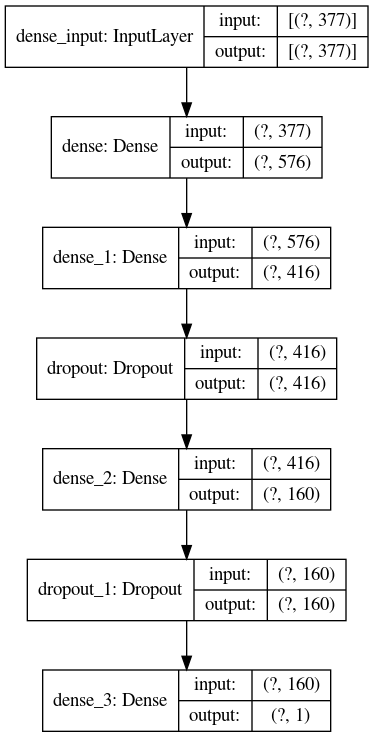

In [76]:
def best_model_return():
    best_model = Hypertuner.get_best_models(num_models=1)[0]
    return best_model

Hyper = {}

ANN = KerasClassifier(build_fn=best_model_return, epochs= 50, batch_size=10, verbose= 1)
ANN.fit(X_train.values, y_train)
pred = ANN.predict(X_test)

Hyper['accuracy'] = accuracy_score(y_test, pred)
Hyper['f1'] = f1_score(y_test, pred)
Hyper['roc_auc'] = roc_auc_score(y_test, pred)
Hyper['recall'] = recall_score(y_test, pred)
Hyper['precision'] = precision_score(y_test, pred)

# Evaluate the best model.
for metric, score in Hyper.items():
    print(f'{metric}: {score}')
    


Hypertuner.get_best_models(num_models=1)[0].summary()

plot_model(Hypertuner.get_best_models(num_models=1)[0], to_file='model_plot.png', show_shapes=True)

In [77]:
Bayesiantuner = BayesianOptimization(
    ANN_Model,
    objective='val_accuracy',
    max_trials=50,  # how many variations on model?
    num_initial_points=2,
    executions_per_trial=2,  # how many trials per variation? (same model could perform differently)
    directory='Bayesian',
    project_name='dumpsys',
    )

Bayesiantuner.search_space_summary()

Bayesiantuner.search(x=X_train,
             y=y_train,
             epochs=50,
             batch_size=30,
             validation_data=(X_test, y_test))



Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 27s - loss: 0.6576 - accuracy: 0.733 - ETA: 5s - loss: 3.8330 - accuracy: 0.513 - ETA: 2s - loss: 2.1603 - accuracy: 0.62 - ETA: 1s - loss: 1.4818 - accuracy: 0.70 - ETA: 1s - loss: 1.1598 - accuracy: 0.76 - ETA: 1s - loss: 1.0010 - accuracy: 0.79 - ETA: 0s - loss: 0.8465 - accuracy: 0.82 - ETA: 0s - loss: 0.7420 - accuracy: 0.84 - ETA: 0s - loss: 0.6600 - accuracy: 0.86 - ETA: 0s - loss: 0.6005 - accuracy: 0.87 - ETA: 0s - loss: 0.5487 - accuracy: 0.88 - ETA: 0s - loss: 0.5134 - accuracy: 0.89 - ETA: 0s - loss: 0.4811 - accuracy: 0.89 - 1s 740us/sample - loss: 0.4810 - accuracy: 0.8982 - val_loss: 0.1329 - val_accuracy: 0.9531
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1795 - accuracy: 0.93 - ETA: 0s - loss: 0.1336 - accuracy: 0.93 - ETA: 0s - loss: 0.1415 - accuracy: 0.95 - ETA: 0s - loss: 0.1311 - accuracy: 0.95 - ETA: 0s - loss: 0.1132 - accurac

Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0154 - accuracy: 0.98 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - 1s 442us/sample - loss: 0.0080 - accuracy: 0.9978 - val_loss: 0.0576 - val_accuracy: 0.9909
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 2.1422e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.7221e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.0000   - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.5843e-04

1787/1787 [==============================] - ETA: 0s - loss: 2.4191e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2152e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0130 - accuracy: 0.9970   - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - 1s 461us/sample - loss: 0.0027 - accuracy: 0.9994 - val_loss: 0.0828 - val_accuracy: 0.9909
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 9.5686e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1477e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1019e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0115e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.2219e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.

1787/1787 [==============================] - ETA: 0s - loss: 5.8670e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5939e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3032e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7913e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8588e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7155e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6392e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5087e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4619e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3561e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2616e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1533e-05 - accuracy: 1.00 - 1s 404us/sample - loss: 4.0450e-05 - accuracy: 1.0000 - val_loss: 0.1174 - val_accuracy: 0.9909
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 4.3840e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0880e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2506e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0076e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.4718e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.94

1787/1787 [==============================] - ETA: 0s - loss: 9.9901e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.2765e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.6598e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.3510e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.2090e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.0166e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.3299e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.2391e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.0332e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0978e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.8744e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.0193e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.2484e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.7609e-07 - accuracy: 1.00 - 1s 492us/sample - loss: 7.6894e-07 - accuracy: 1.0000 - val_loss: 0.1409 - val_accuracy: 0.9909
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7255e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.0066e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0426e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.80

1787/1787 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0170 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - 1s 605us/sample - loss: 0.0095 - accuracy: 0.9972 - val_loss: 0.0511 - val_accuracy: 0.9896
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 1.2534e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8710e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0099 - accuracy: 0.9972   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - 1s 373us/sample - loss: 0.0065 - accuracy: 0.9989 - val_loss: 0.0760 - val_accuracy: 0.9896
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 7.0315e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0037 - accuracy: 1.0000   - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accur

1787/1787 [==============================] - ETA: 0s - loss: 6.1289e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0510e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.7774e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.7370e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.6479e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4728e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.0498e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6202e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.2526e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.1233e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.8589e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.7891e-06 - accuracy: 1.00 - 1s 404us/sample - loss: 5.7087e-06 - accuracy: 1.0000 - val_loss: 0.0786 - val_accuracy: 0.9922
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 2.4739e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.5966e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.8071e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.7514e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4698e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.94

1787/1787 [==============================] - ETA: 0s - loss: 6.6444e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4964e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5467e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7594e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8423e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8738e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0167e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8077e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6584e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5954e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6485e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5926e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5312e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4887e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5107e-06 - accuracy: 1.00 - 1s 480us/sample - loss: 1.5010e-06 - accuracy: 1.0000 - val_loss: 0.0840 - val_accuracy: 0.9922
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 6.5875e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6685e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.41

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 21s - loss: 0.6549 - accuracy: 0.566 - ETA: 2s - loss: 1.5911 - accuracy: 0.583 - ETA: 1s - loss: 1.2630 - accuracy: 0.55 - ETA: 0s - loss: 1.0902 - accuracy: 0.55 - ETA: 0s - loss: 0.9968 - accuracy: 0.56 - ETA: 0s - loss: 0.9429 - accuracy: 0.57 - ETA: 0s - loss: 0.9097 - accuracy: 0.57 - 1s 491us/sample - loss: 0.8959 - accuracy: 0.5697 - val_loss: 0.6274 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6671 - accuracy: 0.56 - ETA: 0s - loss: 0.7060 - accuracy: 0.59 - ETA: 0s - loss: 0.7261 - accuracy: 0.58 - ETA: 0s - loss: 0.7190 - accuracy: 0.58 - ETA: 0s - loss: 0.7217 - accuracy: 0.57 - ETA: 0s - loss: 0.7348 - accuracy: 0.56 - ETA: 0s - loss: 0.7327 - accuracy: 0.56 - 0s 245us/sample - loss: 0.7321 - accuracy: 0.5702 - val_loss: 0.6706 - val_accuracy: 0.6793
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.6995 - accuracy: 0.63 - ETA: 0s - loss: 0.6789 - accuracy: 0.60 - ETA: 0s - loss: 0.6914 - accuracy: 0.60 - ETA: 0s - loss: 0.7016 - accuracy: 0.60 - ETA: 0s - loss: 0.7107 - accuracy: 0.59 - ETA: 0s - loss: 0.7224 - accuracy: 0.58 - ETA: 0s - loss: 0.7275 - accuracy: 0.58 - 0s 241us/sample - loss: 0.7298 - accuracy: 0.5825 - val_loss: 0.6298 - val_accuracy: 0.6793
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6511 - accuracy: 0.66 - ETA: 0s - loss: 0.6841 - accuracy: 0.61 - ETA: 0s - loss: 0.6985 - accuracy: 0.60 - ETA: 0s - loss: 0.7276 - accuracy: 0.59 - ETA: 0s - loss: 0.7317 - accuracy: 0.59 - ETA: 0s - loss: 0.7330 - accuracy: 0.59 - ETA: 0s - loss: 0.7322 - accuracy: 0.58 - 0s 242us/sample - loss: 0.7316 - accuracy: 0.5786 - val_loss: 0.6403 - val_accuracy: 0.6793
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6403 - accuracy: 0.66 - ETA: 0s - loss: 0.6841 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.6909 - accuracy: 0.63 - ETA: 0s - loss: 0.7077 - accuracy: 0.59 - ETA: 0s - loss: 0.6970 - accuracy: 0.57 - ETA: 0s - loss: 0.7114 - accuracy: 0.56 - ETA: 0s - loss: 0.7248 - accuracy: 0.57 - ETA: 0s - loss: 0.7261 - accuracy: 0.56 - ETA: 0s - loss: 0.7229 - accuracy: 0.57 - ETA: 0s - loss: 0.7192 - accuracy: 0.57 - 0s 268us/sample - loss: 0.7202 - accuracy: 0.5781 - val_loss: 0.7759 - val_accuracy: 0.3207
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7878 - accuracy: 0.43 - ETA: 0s - loss: 0.7550 - accuracy: 0.58 - ETA: 0s - loss: 0.7697 - accuracy: 0.54 - ETA: 0s - loss: 0.7524 - accuracy: 0.55 - ETA: 0s - loss: 0.7433 - accuracy: 0.56 - ETA: 0s - loss: 0.7641 - accuracy: 0.55 - ETA: 0s - loss: 0.7525 - accuracy: 0.56 - ETA: 0s - loss: 0.7422 - accuracy: 0.58 - ETA: 0s - loss: 0.7341 - accuracy: 0.58 - 1s 349us/sample - loss: 0.7322 - accuracy: 0.5893 - val_loss: 0.6596 - val_accuracy: 0.6793


1787/1787 [==============================] - ETA: 0s - loss: 0.6242 - accuracy: 0.66 - ETA: 0s - loss: 0.7066 - accuracy: 0.57 - ETA: 0s - loss: 0.6847 - accuracy: 0.61 - ETA: 0s - loss: 0.6853 - accuracy: 0.60 - ETA: 0s - loss: 0.6902 - accuracy: 0.59 - ETA: 0s - loss: 0.6865 - accuracy: 0.60 - ETA: 0s - loss: 0.6862 - accuracy: 0.60 - 0s 234us/sample - loss: 0.6875 - accuracy: 0.6004 - val_loss: 0.6987 - val_accuracy: 0.3207
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7070 - accuracy: 0.46 - ETA: 0s - loss: 0.7534 - accuracy: 0.57 - ETA: 0s - loss: 0.7936 - accuracy: 0.55 - ETA: 0s - loss: 0.7826 - accuracy: 0.54 - ETA: 0s - loss: 0.7603 - accuracy: 0.56 - ETA: 0s - loss: 0.7557 - accuracy: 0.56 - ETA: 0s - loss: 0.7636 - accuracy: 0.56 - 0s 220us/sample - loss: 0.7660 - accuracy: 0.5579 - val_loss: 0.7379 - val_accuracy: 0.6793
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9374 - accuracy: 0.56 - ETA: 0s - loss: 0.8461 - accu

1787/1787 [==============================] - ETA: 0s - loss: 0.7717 - accuracy: 0.36 - ETA: 0s - loss: 0.7402 - accuracy: 0.55 - ETA: 0s - loss: 0.7309 - accuracy: 0.58 - ETA: 0s - loss: 0.7361 - accuracy: 0.56 - ETA: 0s - loss: 0.7404 - accuracy: 0.56 - ETA: 0s - loss: 0.7456 - accuracy: 0.56 - ETA: 0s - loss: 0.7512 - accuracy: 0.56 - 0s 250us/sample - loss: 0.7544 - accuracy: 0.5529 - val_loss: 0.6306 - val_accuracy: 0.6793
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6195 - accuracy: 0.63 - ETA: 0s - loss: 0.6965 - accuracy: 0.53 - ETA: 0s - loss: 0.6863 - accuracy: 0.58 - ETA: 0s - loss: 0.6918 - accuracy: 0.58 - ETA: 0s - loss: 0.7003 - accuracy: 0.58 - ETA: 0s - loss: 0.6980 - accuracy: 0.59 - ETA: 0s - loss: 0.7030 - accuracy: 0.59 - 0s 252us/sample - loss: 0.7059 - accuracy: 0.5909 - val_loss: 0.6990 - val_accuracy: 0.3207
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6865 - accuracy: 0.56 - ETA: 0s - loss: 0.7156 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.6707 - accuracy: 0.53 - ETA: 0s - loss: 0.7363 - accuracy: 0.56 - ETA: 0s - loss: 0.7241 - accuracy: 0.56 - ETA: 0s - loss: 0.7139 - accuracy: 0.57 - ETA: 0s - loss: 0.7091 - accuracy: 0.57 - ETA: 0s - loss: 0.7295 - accuracy: 0.57 - ETA: 0s - loss: 0.7324 - accuracy: 0.57 - 0s 242us/sample - loss: 0.7385 - accuracy: 0.5713 - val_loss: 0.6434 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6647 - accuracy: 0.60 - ETA: 0s - loss: 0.7162 - accuracy: 0.61 - ETA: 0s - loss: 0.6829 - accuracy: 0.62 - ETA: 0s - loss: 0.7099 - accuracy: 0.58 - ETA: 0s - loss: 0.7323 - accuracy: 0.58 - ETA: 0s - loss: 0.7404 - accuracy: 0.57 - ETA: 0s - loss: 0.7451 - accuracy: 0.57 - 0s 245us/sample - loss: 0.7521 - accuracy: 0.5713 - val_loss: 0.6278 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8694 - accuracy: 0.43 - ETA: 0s - loss: 0.7216 - ac

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 29s - loss: 0.6175 - accuracy: 0.766 - ETA: 10s - loss: 0.6436 - accuracy: 0.688 - ETA: 6s - loss: 0.6581 - accuracy: 0.646 - ETA: 5s - loss: 0.6638 - accuracy: 0.62 - ETA: 4s - loss: 0.6682 - accuracy: 0.61 - ETA: 3s - loss: 0.6674 - accuracy: 0.61 - ETA: 2s - loss: 0.6640 - accuracy: 0.62 - ETA: 2s - loss: 0.6653 - accuracy: 0.62 - ETA: 2s - loss: 0.6649 - accuracy: 0.62 - ETA: 1s - loss: 0.6637 - accuracy: 0.63 - ETA: 1s - loss: 0.6613 - accuracy: 0.63 - ETA: 1s - loss: 0.6602 - accuracy: 0.64 - ETA: 1s - loss: 0.6615 - accuracy: 0.63 - ETA: 1s - loss: 0.6608 - accuracy: 0.63 - ETA: 1s - loss: 0.6609 - accuracy: 0.63 - ETA: 0s - loss: 0.6606 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.64 - ETA: 0s - loss: 0.6580 - accuracy: 0.64 - ETA: 0s - loss: 0.6591 - accuracy: 0.64 - ETA: 0s - loss: 0.6590 - accuracy: 0.64 - ETA: 0s - loss: 0.6608 - accuracy: 0.63 - ETA: 0s - 

1787/1787 [==============================] - ETA: 1s - loss: 0.6896 - accuracy: 0.56 - ETA: 1s - loss: 0.6697 - accuracy: 0.60 - ETA: 1s - loss: 0.6708 - accuracy: 0.60 - ETA: 1s - loss: 0.6662 - accuracy: 0.61 - ETA: 1s - loss: 0.6620 - accuracy: 0.62 - ETA: 1s - loss: 0.6554 - accuracy: 0.64 - ETA: 1s - loss: 0.6513 - accuracy: 0.65 - ETA: 0s - loss: 0.6542 - accuracy: 0.64 - ETA: 0s - loss: 0.6548 - accuracy: 0.64 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6551 - accuracy: 0.64 - ETA: 0s - loss: 0.6558 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.64 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s - loss: 0.6603 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6588 - accuracy: 0.63 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6742 - accuracy: 0.60 - ETA: 1s - loss: 0.7119 - accuracy: 0.52 - ETA: 1s - loss: 0.6872 - accuracy: 0.57 - ETA: 1s - loss: 0.6833 - accuracy: 0.58 - ETA: 1s - loss: 0.6674 - accuracy: 0.61 - ETA: 1s - loss: 0.6589 - accuracy: 0.63 - ETA: 1s - loss: 0.6596 - accuracy: 0.62 - ETA: 0s - loss: 0.6502 - accuracy: 0.64 - ETA: 0s - loss: 0.6503 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6462 - accuracy: 0.65 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6488 - accuracy: 0.65 - ETA: 0s - loss: 0.6472 - accuracy: 0.65 - ETA: 0s - loss: 0.6495 - accuracy: 0.64 - ETA: 0s - loss: 0.6505 - accuracy: 0.64 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - 1s 812us/sample - loss: 0.6558 

1787/1787 [==============================] - ETA: 0s - loss: 0.7789 - accuracy: 0.40 - ETA: 1s - loss: 0.6908 - accuracy: 0.56 - ETA: 1s - loss: 0.6784 - accuracy: 0.59 - ETA: 1s - loss: 0.6743 - accuracy: 0.60 - ETA: 0s - loss: 0.6618 - accuracy: 0.62 - ETA: 0s - loss: 0.6543 - accuracy: 0.63 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6598 - accuracy: 0.62 - ETA: 0s - loss: 0.6603 - accuracy: 0.62 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6611 - accuracy: 0.62 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.62 - ETA: 0s - loss: 0.6570 - accuracy: 0.63 - ETA: 0s - loss: 0.6593 - accuracy: 0.62 - ETA: 0s - loss: 0.6612 - accuracy: 0.62 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6585 - accuracy: 0.63 - ETA: 0s - loss: 0.6588 - accuracy: 0.62 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6193 - accuracy: 0.70 - ETA: 1s - loss: 0.6471 - accuracy: 0.65 - ETA: 1s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6464 - accuracy: 0.65 - ETA: 0s - loss: 0.6463 - accuracy: 0.65 - ETA: 0s - loss: 0.6589 - accuracy: 0.63 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6575 - accuracy: 0.63 - ETA: 0s - loss: 0.6543 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s - loss: 0.6545 - accuracy: 0.63 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.63 - ETA: 0s - loss: 0.6550 - accuracy: 0.63 - ETA: 0s - loss: 0.6559 - accuracy: 0.63 - ETA: 0s - loss: 0.6548 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.7106 - accuracy: 0.53 - ETA: 1s - loss: 0.6803 - accuracy: 0.59 - ETA: 1s - loss: 0.6656 - accuracy: 0.61 - ETA: 1s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6632 - accuracy: 0.62 - ETA: 0s - loss: 0.6654 - accuracy: 0.61 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6530 - accuracy: 0.64 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6551 - accuracy: 0.63 - ETA: 0s - loss: 0.6556 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - 1s 803us/sample - loss: 0.6554 - accuracy: 0.6368 - val_loss: 0.6319 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6760 - accuracy: 0.60 - ETA: 1s - loss: 0.6620 - accuracy: 0.62 - ETA: 1s - loss: 0.6604 - accuracy: 0.62 - ETA: 1s - loss: 0.6618 - accuracy: 0.62 - ETA: 1s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6626 - accuracy: 0.62 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6541 - accuracy: 0.63 - ETA: 0s - loss: 0.6537 - accuracy: 0.64 - ETA: 0s - loss: 0.6541 - accuracy: 0.63 - ETA: 0s - loss: 0.6557 - accuracy: 0.63 - ETA: 0s - loss: 0.6564 - accuracy: 0.63 - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6544 - accuracy: 0.63 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6548 - accuracy: 0.63 - ETA: 0s - loss: 0.6553 - accuracy: 0.63 - ETA: 0s - loss: 0.6561 - accuracy: 0.63 - ETA: 0s - loss: 0.6567 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.7488 - accuracy: 0.46 - ETA: 1s - loss: 0.6625 - accuracy: 0.62 - ETA: 1s - loss: 0.6603 - accuracy: 0.62 - ETA: 1s - loss: 0.6490 - accuracy: 0.64 - ETA: 1s - loss: 0.6534 - accuracy: 0.64 - ETA: 1s - loss: 0.6637 - accuracy: 0.62 - ETA: 1s - loss: 0.6629 - accuracy: 0.62 - ETA: 1s - loss: 0.6609 - accuracy: 0.62 - ETA: 1s - loss: 0.6593 - accuracy: 0.62 - ETA: 1s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6562 - accuracy: 0.63 - ETA: 0s - loss: 0.6584 - accuracy: 0.63 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6535 - accuracy: 0.63 - ETA: 0s - loss: 0.6527 - accuracy: 0.64 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6540 - accuracy: 0.63 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - ETA: 0s - loss: 0.6590 - accuracy: 0.62 - ETA: 0s - loss: 0.6595 - accuracy: 0.62 - ETA: 0s - loss: 0.6587 - accuracy: 0.63 - ETA: 0s - loss: 0.6579 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.6563 - accuracy: 0.63 - ETA: 1s - loss: 0.6761 - accuracy: 0.59 - ETA: 1s - loss: 0.6707 - accuracy: 0.60 - ETA: 1s - loss: 0.6739 - accuracy: 0.59 - ETA: 1s - loss: 0.6713 - accuracy: 0.60 - ETA: 0s - loss: 0.6708 - accuracy: 0.60 - ETA: 0s - loss: 0.6719 - accuracy: 0.60 - ETA: 0s - loss: 0.6678 - accuracy: 0.61 - ETA: 0s - loss: 0.6654 - accuracy: 0.61 - ETA: 0s - loss: 0.6600 - accuracy: 0.63 - ETA: 0s - loss: 0.6615 - accuracy: 0.62 - ETA: 0s - loss: 0.6649 - accuracy: 0.62 - ETA: 0s - loss: 0.6673 - accuracy: 0.61 - ETA: 0s - loss: 0.6648 - accuracy: 0.62 - ETA: 0s - loss: 0.6662 - accuracy: 0.61 - ETA: 0s - loss: 0.6641 - accuracy: 0.62 - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6614 - accuracy: 0.62 - ETA: 0s - loss: 0.6605 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6593 - accuracy: 0.63 - 1s 791us/sample - loss: 0.6583 - accuracy: 0.6368 - val_loss: 0.6384 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6752 - accuracy: 0.60 - ETA: 1s - loss: 0.6749 - accuracy: 0.60 - ETA: 0s - loss: 0.6695 - accuracy: 0.60 - ETA: 0s - loss: 0.6784 - accuracy: 0.59 - ETA: 0s - loss: 0.6767 - accuracy: 0.59 - ETA: 0s - loss: 0.6785 - accuracy: 0.59 - ETA: 0s - loss: 0.6760 - accuracy: 0.59 - ETA: 0s - loss: 0.6739 - accuracy: 0.60 - ETA: 0s - loss: 0.6734 - accuracy: 0.60 - ETA: 0s - loss: 0.6723 - accuracy: 0.60 - ETA: 0s - loss: 0.6688 - accuracy: 0.61 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6634 - accuracy: 0.62 - ETA: 0s - loss: 0.6634 - accuracy: 0.62 - ETA: 0s - loss: 0.6608 - accuracy: 0.62 - ETA: 0s - loss: 0.6546 - accuracy: 0.63 - ETA: 0s - loss: 0.6529 - accuracy: 0.64 - ETA: 0s - loss: 0.6511 - accuracy: 0.64 - ETA: 0s - loss: 0.6535 - accuracy: 0.64 - ETA: 0s - loss: 0.6577 - accuracy: 0.63 - ETA: 0s - loss: 0.6568 - accuracy: 0.63 - 1s 787us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6315 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6596 - accuracy: 0.63 - ETA: 1s - loss: 0.6491 - accuracy: 0.65 - ETA: 1s - loss: 0.6367 - accuracy: 0.67 - ETA: 1s - loss: 0.6475 - accuracy: 0.65 - ETA: 0s - loss: 0.6457 - accuracy: 0.65 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6605 - accuracy: 0.62 - ETA: 0s - loss: 0.6598 - accuracy: 0.63 - ETA: 0s - loss: 0.6517 - accuracy: 0.64 - ETA: 0s - loss: 0.6498 - accuracy: 0.64 - ETA: 0s - loss: 0.6482 - accuracy: 0.65 - ETA: 0s - loss: 0.6506 - accuracy: 0.64 - ETA: 0s - loss: 0.6470 - accuracy: 0.65 - ETA: 0s - loss: 0.6474 - accuracy: 0.65 - ETA: 0s - loss: 0.6469 - accuracy: 0.65 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6532 - accuracy: 0.64 - ETA: 0s - loss: 0.6549 - accuracy: 0.63 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - ETA: 0s - loss: 0.6524 - accuracy: 0.64 - 1s 795us/sample - loss: 0.6562 - accuracy: 0.6368 - val_loss: 0.6310 - va

Epoch 29/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7308 - accuracy: 0.50 - ETA: 1s - loss: 0.7070 - accuracy: 0.54 - ETA: 1s - loss: 0.6720 - accuracy: 0.60 - ETA: 1s - loss: 0.6690 - accuracy: 0.60 - ETA: 1s - loss: 0.6597 - accuracy: 0.62 - ETA: 1s - loss: 0.6568 - accuracy: 0.63 - ETA: 1s - loss: 0.6611 - accuracy: 0.62 - ETA: 1s - loss: 0.6679 - accuracy: 0.61 - ETA: 1s - loss: 0.6589 - accuracy: 0.62 - ETA: 1s - loss: 0.6607 - accuracy: 0.62 - ETA: 1s - loss: 0.6628 - accuracy: 0.62 - ETA: 0s - loss: 0.6608 - accuracy: 0.62 - ETA: 0s - loss: 0.6533 - accuracy: 0.63 - ETA: 0s - loss: 0.6548 - accuracy: 0.63 - ETA: 0s - loss: 0.6516 - accuracy: 0.64 - ETA: 0s - loss: 0.6526 - accuracy: 0.63 - ETA: 0s - loss: 0.6527 - accuracy: 0.63 - ETA: 0s - loss: 0.6531 - accuracy: 0.63 - ETA: 0s - loss: 0.6540 - accuracy: 0.63 - ETA: 0s - loss: 0.6527 - accuracy: 0.63 - ETA: 0s - loss: 0.6523 - accuracy: 0.64 - ETA: 0s - loss: 0.6525 - accuracy: 0.64 - ETA: 0s - loss: 0.6

1787/1787 [==============================] - ETA: 1s - loss: 0.6199 - accuracy: 0.70 - ETA: 1s - loss: 0.6652 - accuracy: 0.62 - ETA: 1s - loss: 0.6807 - accuracy: 0.59 - ETA: 1s - loss: 0.6722 - accuracy: 0.60 - ETA: 1s - loss: 0.6577 - accuracy: 0.63 - ETA: 1s - loss: 0.6622 - accuracy: 0.62 - ETA: 0s - loss: 0.6579 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6571 - accuracy: 0.63 - ETA: 0s - loss: 0.6580 - accuracy: 0.63 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6552 - accuracy: 0.63 - ETA: 0s - loss: 0.6605 - accuracy: 0.62 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6574 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6555 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 - accuracy: 0.63 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - 1s 752us/sample - loss: 0.6557 - accuracy: 0.6368 - val_loss: 0.6309 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6931 - accuracy: 0.56 - ETA: 1s - loss: 0.6199 - accuracy: 0.70 - ETA: 1s - loss: 0.6261 - accuracy: 0.68 - ETA: 1s - loss: 0.6225 - accuracy: 0.69 - ETA: 1s - loss: 0.6192 - accuracy: 0.70 - ETA: 1s - loss: 0.6254 - accuracy: 0.68 - ETA: 1s - loss: 0.6258 - accuracy: 0.68 - ETA: 1s - loss: 0.6288 - accuracy: 0.68 - ETA: 1s - loss: 0.6362 - accuracy: 0.67 - ETA: 1s - loss: 0.6471 - accuracy: 0.65 - ETA: 1s - loss: 0.6466 - accuracy: 0.65 - ETA: 0s - loss: 0.6428 - accuracy: 0.65 - ETA: 0s - loss: 0.6488 - accuracy: 0.64 - ETA: 0s - loss: 0.6480 - accuracy: 0.65 - ETA: 0s - loss: 0.6461 - accuracy: 0.65 - ETA: 0s - loss: 0.6451 - accuracy: 0.65 - ETA: 0s - loss: 0.6485 - accuracy: 0.64 - ETA: 0s - loss: 0.6521 - accuracy: 0.64 - ETA: 0s - loss: 0.6504 - accuracy: 0.64 - ETA: 0s - loss: 0.6513 - accuracy: 0.64 - ETA: 0s - loss: 0.6534 - accuracy: 0.64 - ETA: 0s - loss: 0.6547 - accuracy: 0.63 - ETA: 0s - loss: 0.6531 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.7526 - accuracy: 0.46 - ETA: 1s - loss: 0.6813 - accuracy: 0.59 - ETA: 1s - loss: 0.6767 - accuracy: 0.60 - ETA: 0s - loss: 0.6635 - accuracy: 0.62 - ETA: 0s - loss: 0.6604 - accuracy: 0.62 - ETA: 0s - loss: 0.6624 - accuracy: 0.62 - ETA: 0s - loss: 0.6671 - accuracy: 0.61 - ETA: 0s - loss: 0.6647 - accuracy: 0.61 - ETA: 0s - loss: 0.6640 - accuracy: 0.62 - ETA: 0s - loss: 0.6613 - accuracy: 0.62 - ETA: 0s - loss: 0.6604 - accuracy: 0.62 - ETA: 0s - loss: 0.6595 - accuracy: 0.62 - ETA: 0s - loss: 0.6545 - accuracy: 0.63 - ETA: 0s - loss: 0.6558 - accuracy: 0.63 - ETA: 0s - loss: 0.6563 - accuracy: 0.63 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.62 - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6565 - accuracy: 0.63 - ETA: 0s - loss: 0.6541 - accuracy: 0.63 - 1s 834us/sample - loss: 0.6547 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:06 - loss: 0.6672 - accuracy: 0.60 - ETA: 34s - loss: 275.8729 - accuracy: 0.616 - ETA: 17s - loss: 298.8093 - accuracy: 0.541 - ETA: 12s - loss: 252.6341 - accuracy: 0.522 - ETA: 10s - loss: 265.9541 - accuracy: 0.533 - ETA: 9s - loss: 242.2310 - accuracy: 0.550 - ETA: 8s - loss: 230.0766 - accuracy: 0.54 - ETA: 7s - loss: 205.7968 - accuracy: 0.56 - ETA: 6s - loss: 208.9678 - accuracy: 0.55 - ETA: 6s - loss: 199.5408 - accuracy: 0.56 - ETA: 5s - loss: 187.2533 - accuracy: 0.55 - ETA: 5s - loss: 189.7368 - accuracy: 0.56 - ETA: 5s - loss: 182.6804 - accuracy: 0.56 - ETA: 4s - loss: 181.6373 - accuracy: 0.55 - ETA: 4s - loss: 186.5966 - accuracy: 0.55 - ETA: 4s - loss: 180.0493 - accuracy: 0.54 - ETA: 4s - loss: 180.1367 - accuracy: 0.55 - ETA: 3s - loss: 166.5334 - accuracy: 0.55 - ETA: 3s - loss: 165.6531 - accuracy: 0.54 - ETA: 3s - loss: 168.2761 - accuracy: 0.54 - ETA: 3s 

1787/1787 [==============================] - ETA: 2s - loss: 82.6372 - accuracy: 0.500 - ETA: 2s - loss: 123.3706 - accuracy: 0.55 - ETA: 2s - loss: 92.0520 - accuracy: 0.5500 - ETA: 2s - loss: 75.1012 - accuracy: 0.580 - ETA: 2s - loss: 62.9333 - accuracy: 0.600 - ETA: 2s - loss: 77.0060 - accuracy: 0.566 - ETA: 2s - loss: 83.2838 - accuracy: 0.597 - ETA: 2s - loss: 88.4276 - accuracy: 0.582 - ETA: 2s - loss: 98.1914 - accuracy: 0.560 - ETA: 1s - loss: 101.3090 - accuracy: 0.53 - ETA: 1s - loss: 103.2069 - accuracy: 0.54 - ETA: 1s - loss: 106.7930 - accuracy: 0.53 - ETA: 1s - loss: 104.7206 - accuracy: 0.53 - ETA: 1s - loss: 106.6705 - accuracy: 0.54 - ETA: 1s - loss: 102.0204 - accuracy: 0.53 - ETA: 1s - loss: 102.8418 - accuracy: 0.54 - ETA: 1s - loss: 105.4539 - accuracy: 0.53 - ETA: 1s - loss: 104.6857 - accuracy: 0.53 - ETA: 1s - loss: 114.1198 - accuracy: 0.52 - ETA: 1s - loss: 112.2849 - accuracy: 0.52 - ETA: 1s - loss: 113.3740 - accuracy: 0.53 - ETA: 1s - loss: 114.6971 - acc

1787/1787 [==============================] - ETA: 3s - loss: 226.6584 - accuracy: 0.56 - ETA: 3s - loss: 126.8803 - accuracy: 0.58 - ETA: 3s - loss: 117.7599 - accuracy: 0.53 - ETA: 3s - loss: 123.7758 - accuracy: 0.57 - ETA: 3s - loss: 106.0221 - accuracy: 0.58 - ETA: 3s - loss: 105.5362 - accuracy: 0.57 - ETA: 3s - loss: 109.7768 - accuracy: 0.58 - ETA: 3s - loss: 111.6709 - accuracy: 0.55 - ETA: 3s - loss: 123.5150 - accuracy: 0.55 - ETA: 3s - loss: 114.5723 - accuracy: 0.56 - ETA: 3s - loss: 125.1962 - accuracy: 0.53 - ETA: 3s - loss: 131.5693 - accuracy: 0.53 - ETA: 3s - loss: 124.2226 - accuracy: 0.54 - ETA: 2s - loss: 121.6698 - accuracy: 0.52 - ETA: 2s - loss: 122.1677 - accuracy: 0.54 - ETA: 2s - loss: 118.8375 - accuracy: 0.54 - ETA: 2s - loss: 122.6724 - accuracy: 0.52 - ETA: 2s - loss: 125.9588 - accuracy: 0.53 - ETA: 2s - loss: 121.2141 - accuracy: 0.54 - ETA: 2s - loss: 119.1184 - accuracy: 0.53 - ETA: 2s - loss: 123.3206 - accuracy: 0.53 - ETA: 2s - loss: 120.0243 - accu

1787/1787 [==============================] - ETA: 2s - loss: 140.3709 - accuracy: 0.50 - ETA: 2s - loss: 152.4677 - accuracy: 0.50 - ETA: 2s - loss: 130.1901 - accuracy: 0.54 - ETA: 2s - loss: 103.9781 - accuracy: 0.55 - ETA: 2s - loss: 112.5456 - accuracy: 0.55 - ETA: 2s - loss: 103.1860 - accuracy: 0.56 - ETA: 2s - loss: 101.4157 - accuracy: 0.53 - ETA: 2s - loss: 105.8648 - accuracy: 0.54 - ETA: 1s - loss: 105.5186 - accuracy: 0.54 - ETA: 1s - loss: 105.1359 - accuracy: 0.55 - ETA: 1s - loss: 100.4887 - accuracy: 0.55 - ETA: 1s - loss: 104.7578 - accuracy: 0.54 - ETA: 1s - loss: 100.8089 - accuracy: 0.55 - ETA: 1s - loss: 96.3208 - accuracy: 0.5720 - ETA: 1s - loss: 100.8450 - accuracy: 0.56 - ETA: 1s - loss: 97.9619 - accuracy: 0.5713 - ETA: 1s - loss: 96.2345 - accuracy: 0.571 - ETA: 1s - loss: 98.9419 - accuracy: 0.558 - ETA: 1s - loss: 102.4985 - accuracy: 0.57 - ETA: 0s - loss: 100.4395 - accuracy: 0.57 - ETA: 0s - loss: 101.4133 - accuracy: 0.56 - ETA: 0s - loss: 99.9529 - acc

1787/1787 [==============================] - ETA: 2s - loss: 26.7483 - accuracy: 0.633 - ETA: 2s - loss: 59.5947 - accuracy: 0.650 - ETA: 2s - loss: 97.8648 - accuracy: 0.558 - ETA: 2s - loss: 102.3563 - accuracy: 0.52 - ETA: 2s - loss: 113.6968 - accuracy: 0.50 - ETA: 2s - loss: 112.0302 - accuracy: 0.50 - ETA: 2s - loss: 117.3333 - accuracy: 0.51 - ETA: 2s - loss: 110.9754 - accuracy: 0.51 - ETA: 2s - loss: 119.2058 - accuracy: 0.51 - ETA: 2s - loss: 115.9731 - accuracy: 0.50 - ETA: 2s - loss: 119.2250 - accuracy: 0.51 - ETA: 2s - loss: 114.2868 - accuracy: 0.51 - ETA: 2s - loss: 112.9448 - accuracy: 0.52 - ETA: 2s - loss: 110.8223 - accuracy: 0.51 - ETA: 2s - loss: 113.4259 - accuracy: 0.52 - ETA: 2s - loss: 110.0153 - accuracy: 0.52 - ETA: 1s - loss: 109.3688 - accuracy: 0.53 - ETA: 1s - loss: 106.3586 - accuracy: 0.53 - ETA: 1s - loss: 104.0395 - accuracy: 0.52 - ETA: 1s - loss: 103.0973 - accuracy: 0.53 - ETA: 1s - loss: 101.6595 - accuracy: 0.52 - ETA: 1s - loss: 103.7783 - accu

1787/1787 [==============================] - ETA: 2s - loss: 221.6497 - accuracy: 0.56 - ETA: 2s - loss: 103.3295 - accuracy: 0.44 - ETA: 2s - loss: 112.7095 - accuracy: 0.43 - ETA: 2s - loss: 120.3426 - accuracy: 0.48 - ETA: 2s - loss: 123.4477 - accuracy: 0.49 - ETA: 2s - loss: 118.5861 - accuracy: 0.52 - ETA: 2s - loss: 117.1118 - accuracy: 0.51 - ETA: 2s - loss: 115.3569 - accuracy: 0.51 - ETA: 1s - loss: 109.9272 - accuracy: 0.53 - ETA: 1s - loss: 107.7231 - accuracy: 0.54 - ETA: 1s - loss: 109.1645 - accuracy: 0.53 - ETA: 1s - loss: 119.2653 - accuracy: 0.53 - ETA: 1s - loss: 114.1147 - accuracy: 0.53 - ETA: 1s - loss: 106.8553 - accuracy: 0.53 - ETA: 1s - loss: 106.8096 - accuracy: 0.53 - ETA: 1s - loss: 100.8236 - accuracy: 0.54 - ETA: 1s - loss: 106.9838 - accuracy: 0.53 - ETA: 1s - loss: 103.9515 - accuracy: 0.54 - ETA: 1s - loss: 99.1376 - accuracy: 0.5535 - ETA: 1s - loss: 104.2872 - accuracy: 0.55 - ETA: 0s - loss: 105.7996 - accuracy: 0.54 - ETA: 0s - loss: 103.8457 - acc

1787/1787 [==============================] - ETA: 2s - loss: 75.3001 - accuracy: 0.366 - ETA: 2s - loss: 139.1104 - accuracy: 0.44 - ETA: 2s - loss: 130.8994 - accuracy: 0.53 - ETA: 2s - loss: 116.0609 - accuracy: 0.53 - ETA: 2s - loss: 111.8113 - accuracy: 0.51 - ETA: 2s - loss: 117.6285 - accuracy: 0.54 - ETA: 2s - loss: 130.4292 - accuracy: 0.52 - ETA: 1s - loss: 121.7985 - accuracy: 0.53 - ETA: 1s - loss: 116.1643 - accuracy: 0.53 - ETA: 1s - loss: 117.3536 - accuracy: 0.52 - ETA: 1s - loss: 121.4701 - accuracy: 0.52 - ETA: 1s - loss: 125.6433 - accuracy: 0.51 - ETA: 1s - loss: 131.1148 - accuracy: 0.51 - ETA: 1s - loss: 126.5592 - accuracy: 0.51 - ETA: 1s - loss: 126.0854 - accuracy: 0.52 - ETA: 1s - loss: 122.7687 - accuracy: 0.52 - ETA: 1s - loss: 122.8406 - accuracy: 0.52 - ETA: 1s - loss: 123.8001 - accuracy: 0.52 - ETA: 1s - loss: 124.1301 - accuracy: 0.52 - ETA: 1s - loss: 121.8386 - accuracy: 0.53 - ETA: 1s - loss: 119.6068 - accuracy: 0.52 - ETA: 1s - loss: 121.8559 - accu

1787/1787 [==============================] - ETA: 3s - loss: 49.1553 - accuracy: 0.733 - ETA: 3s - loss: 54.5838 - accuracy: 0.650 - ETA: 2s - loss: 66.9625 - accuracy: 0.600 - ETA: 2s - loss: 88.2859 - accuracy: 0.620 - ETA: 2s - loss: 79.7381 - accuracy: 0.650 - ETA: 2s - loss: 72.2580 - accuracy: 0.628 - ETA: 2s - loss: 68.9186 - accuracy: 0.620 - ETA: 2s - loss: 93.7830 - accuracy: 0.603 - ETA: 2s - loss: 87.3618 - accuracy: 0.603 - ETA: 2s - loss: 82.5325 - accuracy: 0.583 - ETA: 2s - loss: 81.0537 - accuracy: 0.589 - ETA: 2s - loss: 83.9887 - accuracy: 0.576 - ETA: 2s - loss: 83.7717 - accuracy: 0.597 - ETA: 2s - loss: 93.1782 - accuracy: 0.587 - ETA: 2s - loss: 91.2498 - accuracy: 0.589 - ETA: 2s - loss: 94.2437 - accuracy: 0.575 - ETA: 2s - loss: 97.4265 - accuracy: 0.581 - ETA: 2s - loss: 97.6243 - accuracy: 0.584 - ETA: 1s - loss: 96.8579 - accuracy: 0.576 - ETA: 1s - loss: 99.6713 - accuracy: 0.578 - ETA: 1s - loss: 103.4020 - accuracy: 0.57 - ETA: 1s - loss: 102.8805 - accu

1787/1787 [==============================] - ETA: 3s - loss: 249.1526 - accuracy: 0.60 - ETA: 2s - loss: 126.2612 - accuracy: 0.53 - ETA: 2s - loss: 148.4722 - accuracy: 0.55 - ETA: 2s - loss: 110.2433 - accuracy: 0.55 - ETA: 2s - loss: 142.7219 - accuracy: 0.50 - ETA: 2s - loss: 134.9869 - accuracy: 0.51 - ETA: 2s - loss: 121.8375 - accuracy: 0.53 - ETA: 2s - loss: 114.9844 - accuracy: 0.52 - ETA: 1s - loss: 118.9401 - accuracy: 0.53 - ETA: 1s - loss: 119.7204 - accuracy: 0.52 - ETA: 1s - loss: 118.9226 - accuracy: 0.54 - ETA: 1s - loss: 124.7676 - accuracy: 0.52 - ETA: 1s - loss: 119.0566 - accuracy: 0.53 - ETA: 1s - loss: 110.3855 - accuracy: 0.55 - ETA: 1s - loss: 109.0791 - accuracy: 0.55 - ETA: 1s - loss: 109.7067 - accuracy: 0.55 - ETA: 1s - loss: 108.0542 - accuracy: 0.55 - ETA: 1s - loss: 109.3415 - accuracy: 0.54 - ETA: 1s - loss: 113.8736 - accuracy: 0.54 - ETA: 1s - loss: 111.9002 - accuracy: 0.54 - ETA: 1s - loss: 112.6751 - accuracy: 0.54 - ETA: 1s - loss: 115.0847 - accu

1787/1787 [==============================] - ETA: 2s - loss: 57.7919 - accuracy: 0.633 - ETA: 3s - loss: 129.1991 - accuracy: 0.46 - ETA: 3s - loss: 147.0771 - accuracy: 0.53 - ETA: 3s - loss: 116.2748 - accuracy: 0.59 - ETA: 3s - loss: 100.2688 - accuracy: 0.54 - ETA: 3s - loss: 88.1165 - accuracy: 0.5444 - ETA: 3s - loss: 81.2174 - accuracy: 0.590 - ETA: 3s - loss: 74.5084 - accuracy: 0.591 - ETA: 3s - loss: 74.1833 - accuracy: 0.566 - ETA: 3s - loss: 90.5408 - accuracy: 0.576 - ETA: 2s - loss: 94.1989 - accuracy: 0.578 - ETA: 2s - loss: 97.8317 - accuracy: 0.572 - ETA: 2s - loss: 103.6395 - accuracy: 0.57 - ETA: 2s - loss: 102.0333 - accuracy: 0.55 - ETA: 2s - loss: 105.7799 - accuracy: 0.56 - ETA: 2s - loss: 105.7555 - accuracy: 0.56 - ETA: 2s - loss: 109.3747 - accuracy: 0.55 - ETA: 2s - loss: 112.9894 - accuracy: 0.55 - ETA: 2s - loss: 114.6201 - accuracy: 0.54 - ETA: 2s - loss: 112.2263 - accuracy: 0.54 - ETA: 2s - loss: 106.1498 - accuracy: 0.55 - ETA: 2s - loss: 102.8420 - acc

1787/1787 [==============================] - ETA: 3s - loss: 69.8571 - accuracy: 0.433 - ETA: 3s - loss: 144.3998 - accuracy: 0.48 - ETA: 3s - loss: 131.7293 - accuracy: 0.45 - ETA: 2s - loss: 144.8812 - accuracy: 0.51 - ETA: 2s - loss: 106.3948 - accuracy: 0.55 - ETA: 2s - loss: 97.8559 - accuracy: 0.5762 - ETA: 2s - loss: 122.8999 - accuracy: 0.54 - ETA: 2s - loss: 117.7844 - accuracy: 0.54 - ETA: 2s - loss: 128.6521 - accuracy: 0.52 - ETA: 2s - loss: 124.2939 - accuracy: 0.52 - ETA: 2s - loss: 115.2571 - accuracy: 0.53 - ETA: 1s - loss: 105.3134 - accuracy: 0.53 - ETA: 1s - loss: 100.0291 - accuracy: 0.55 - ETA: 1s - loss: 101.3827 - accuracy: 0.54 - ETA: 1s - loss: 104.5854 - accuracy: 0.55 - ETA: 1s - loss: 108.7672 - accuracy: 0.54 - ETA: 1s - loss: 116.4658 - accuracy: 0.54 - ETA: 1s - loss: 113.5416 - accuracy: 0.54 - ETA: 1s - loss: 112.9686 - accuracy: 0.53 - ETA: 1s - loss: 111.9381 - accuracy: 0.54 - ETA: 1s - loss: 108.5501 - accuracy: 0.54 - ETA: 1s - loss: 112.0047 - acc

1787/1787 [==============================] - ETA: 2s - loss: 146.5000 - accuracy: 0.36 - ETA: 2s - loss: 157.7836 - accuracy: 0.48 - ETA: 2s - loss: 111.7935 - accuracy: 0.46 - ETA: 2s - loss: 132.9484 - accuracy: 0.46 - ETA: 2s - loss: 108.7326 - accuracy: 0.50 - ETA: 2s - loss: 104.3354 - accuracy: 0.50 - ETA: 2s - loss: 111.3404 - accuracy: 0.51 - ETA: 2s - loss: 108.6628 - accuracy: 0.51 - ETA: 2s - loss: 113.1336 - accuracy: 0.51 - ETA: 2s - loss: 108.4620 - accuracy: 0.51 - ETA: 2s - loss: 107.8128 - accuracy: 0.52 - ETA: 2s - loss: 104.9896 - accuracy: 0.53 - ETA: 2s - loss: 111.8027 - accuracy: 0.51 - ETA: 2s - loss: 116.2808 - accuracy: 0.52 - ETA: 2s - loss: 113.1458 - accuracy: 0.52 - ETA: 2s - loss: 117.4849 - accuracy: 0.50 - ETA: 2s - loss: 118.5291 - accuracy: 0.51 - ETA: 1s - loss: 114.4632 - accuracy: 0.52 - ETA: 1s - loss: 115.9125 - accuracy: 0.51 - ETA: 1s - loss: 113.0352 - accuracy: 0.51 - ETA: 1s - loss: 110.3560 - accuracy: 0.53 - ETA: 1s - loss: 111.2657 - accu

1787/1787 [==============================] - ETA: 2s - loss: 184.3842 - accuracy: 0.63 - ETA: 2s - loss: 96.9468 - accuracy: 0.5444 - ETA: 2s - loss: 128.5926 - accuracy: 0.51 - ETA: 2s - loss: 115.0157 - accuracy: 0.51 - ETA: 2s - loss: 120.4131 - accuracy: 0.52 - ETA: 2s - loss: 110.3944 - accuracy: 0.52 - ETA: 2s - loss: 108.8751 - accuracy: 0.53 - ETA: 2s - loss: 116.3555 - accuracy: 0.51 - ETA: 2s - loss: 121.9184 - accuracy: 0.51 - ETA: 2s - loss: 114.1709 - accuracy: 0.51 - ETA: 2s - loss: 117.4048 - accuracy: 0.52 - ETA: 2s - loss: 113.3635 - accuracy: 0.53 - ETA: 2s - loss: 115.7434 - accuracy: 0.52 - ETA: 2s - loss: 115.9824 - accuracy: 0.53 - ETA: 2s - loss: 115.8391 - accuracy: 0.54 - ETA: 2s - loss: 115.4603 - accuracy: 0.53 - ETA: 2s - loss: 121.3373 - accuracy: 0.53 - ETA: 2s - loss: 116.9277 - accuracy: 0.53 - ETA: 2s - loss: 115.9357 - accuracy: 0.53 - ETA: 1s - loss: 115.1828 - accuracy: 0.54 - ETA: 1s - loss: 111.9886 - accuracy: 0.54 - ETA: 1s - loss: 109.4434 - acc

1787/1787 [==============================] - ETA: 3s - loss: 39.2888 - accuracy: 0.566 - ETA: 3s - loss: 62.0907 - accuracy: 0.633 - ETA: 3s - loss: 63.6152 - accuracy: 0.566 - ETA: 3s - loss: 97.4422 - accuracy: 0.591 - ETA: 3s - loss: 88.5131 - accuracy: 0.613 - ETA: 3s - loss: 85.6004 - accuracy: 0.550 - ETA: 3s - loss: 106.1397 - accuracy: 0.55 - ETA: 3s - loss: 97.5950 - accuracy: 0.5750 - ETA: 3s - loss: 94.7801 - accuracy: 0.566 - ETA: 3s - loss: 94.5189 - accuracy: 0.590 - ETA: 2s - loss: 90.9589 - accuracy: 0.603 - ETA: 2s - loss: 89.1736 - accuracy: 0.583 - ETA: 2s - loss: 94.5917 - accuracy: 0.589 - ETA: 2s - loss: 90.4390 - accuracy: 0.590 - ETA: 2s - loss: 90.3534 - accuracy: 0.584 - ETA: 2s - loss: 94.7434 - accuracy: 0.587 - ETA: 2s - loss: 90.5038 - accuracy: 0.578 - ETA: 2s - loss: 87.3084 - accuracy: 0.585 - ETA: 2s - loss: 86.0788 - accuracy: 0.580 - ETA: 2s - loss: 90.7217 - accuracy: 0.585 - ETA: 2s - loss: 94.7351 - accuracy: 0.571 - ETA: 2s - loss: 97.5026 - accu

1787/1787 [==============================] - ETA: 3s - loss: 28.3204 - accuracy: 0.533 - ETA: 3s - loss: 38.7555 - accuracy: 0.466 - ETA: 2s - loss: 67.5085 - accuracy: 0.516 - ETA: 2s - loss: 81.8255 - accuracy: 0.505 - ETA: 2s - loss: 107.5333 - accuracy: 0.50 - ETA: 2s - loss: 101.0359 - accuracy: 0.47 - ETA: 2s - loss: 97.2087 - accuracy: 0.5333 - ETA: 2s - loss: 96.3575 - accuracy: 0.527 - ETA: 2s - loss: 92.2495 - accuracy: 0.520 - ETA: 2s - loss: 94.6185 - accuracy: 0.522 - ETA: 2s - loss: 97.2694 - accuracy: 0.531 - ETA: 2s - loss: 89.3019 - accuracy: 0.535 - ETA: 1s - loss: 94.7523 - accuracy: 0.523 - ETA: 1s - loss: 101.6997 - accuracy: 0.52 - ETA: 1s - loss: 106.8907 - accuracy: 0.52 - ETA: 1s - loss: 103.7295 - accuracy: 0.52 - ETA: 1s - loss: 101.2547 - accuracy: 0.54 - ETA: 1s - loss: 102.5942 - accuracy: 0.53 - ETA: 1s - loss: 104.1037 - accuracy: 0.53 - ETA: 1s - loss: 108.9885 - accuracy: 0.52 - ETA: 1s - loss: 108.3176 - accuracy: 0.53 - ETA: 1s - loss: 103.8870 - acc

1787/1787 [==============================] - ETA: 3s - loss: 29.9401 - accuracy: 0.633 - ETA: 2s - loss: 32.6989 - accuracy: 0.616 - ETA: 2s - loss: 45.3100 - accuracy: 0.633 - ETA: 2s - loss: 70.7409 - accuracy: 0.616 - ETA: 2s - loss: 69.3046 - accuracy: 0.590 - ETA: 2s - loss: 83.7882 - accuracy: 0.595 - ETA: 2s - loss: 85.2613 - accuracy: 0.576 - ETA: 2s - loss: 105.0894 - accuracy: 0.56 - ETA: 2s - loss: 100.9593 - accuracy: 0.56 - ETA: 2s - loss: 99.6770 - accuracy: 0.5667 - ETA: 1s - loss: 111.0196 - accuracy: 0.55 - ETA: 1s - loss: 106.8163 - accuracy: 0.54 - ETA: 1s - loss: 108.1047 - accuracy: 0.54 - ETA: 1s - loss: 108.8538 - accuracy: 0.54 - ETA: 1s - loss: 115.3325 - accuracy: 0.53 - ETA: 1s - loss: 117.1112 - accuracy: 0.53 - ETA: 1s - loss: 115.4737 - accuracy: 0.53 - ETA: 1s - loss: 116.9787 - accuracy: 0.52 - ETA: 1s - loss: 116.5102 - accuracy: 0.53 - ETA: 1s - loss: 114.2774 - accuracy: 0.53 - ETA: 1s - loss: 113.1161 - accuracy: 0.53 - ETA: 1s - loss: 113.5715 - acc

1787/1787 [==============================] - ETA: 3s - loss: 50.0098 - accuracy: 0.400 - ETA: 2s - loss: 91.9200 - accuracy: 0.522 - ETA: 2s - loss: 91.6171 - accuracy: 0.526 - ETA: 2s - loss: 93.3442 - accuracy: 0.557 - ETA: 2s - loss: 127.8895 - accuracy: 0.51 - ETA: 2s - loss: 127.2918 - accuracy: 0.51 - ETA: 2s - loss: 130.8523 - accuracy: 0.50 - ETA: 2s - loss: 133.7872 - accuracy: 0.50 - ETA: 2s - loss: 135.2260 - accuracy: 0.48 - ETA: 1s - loss: 129.4917 - accuracy: 0.51 - ETA: 1s - loss: 121.9343 - accuracy: 0.50 - ETA: 1s - loss: 119.1919 - accuracy: 0.50 - ETA: 1s - loss: 113.6297 - accuracy: 0.51 - ETA: 1s - loss: 121.1857 - accuracy: 0.51 - ETA: 1s - loss: 125.9656 - accuracy: 0.50 - ETA: 1s - loss: 123.0306 - accuracy: 0.50 - ETA: 1s - loss: 121.9570 - accuracy: 0.50 - ETA: 1s - loss: 119.2225 - accuracy: 0.50 - ETA: 1s - loss: 116.5023 - accuracy: 0.50 - ETA: 1s - loss: 116.3357 - accuracy: 0.50 - ETA: 1s - loss: 116.6070 - accuracy: 0.51 - ETA: 0s - loss: 117.5965 - accu

1787/1787 [==============================] - ETA: 2s - loss: 66.4804 - accuracy: 0.533 - ETA: 2s - loss: 67.7274 - accuracy: 0.533 - ETA: 2s - loss: 99.0122 - accuracy: 0.550 - ETA: 2s - loss: 81.4723 - accuracy: 0.500 - ETA: 2s - loss: 81.4913 - accuracy: 0.538 - ETA: 2s - loss: 81.2150 - accuracy: 0.529 - ETA: 2s - loss: 91.7822 - accuracy: 0.536 - ETA: 2s - loss: 102.8842 - accuracy: 0.51 - ETA: 2s - loss: 103.1526 - accuracy: 0.53 - ETA: 2s - loss: 98.3943 - accuracy: 0.5262 - ETA: 2s - loss: 102.4081 - accuracy: 0.53 - ETA: 2s - loss: 97.4426 - accuracy: 0.5314 - ETA: 2s - loss: 90.1049 - accuracy: 0.540 - ETA: 1s - loss: 89.2468 - accuracy: 0.530 - ETA: 1s - loss: 99.5475 - accuracy: 0.528 - ETA: 1s - loss: 96.3736 - accuracy: 0.530 - ETA: 1s - loss: 98.7778 - accuracy: 0.521 - ETA: 1s - loss: 102.2370 - accuracy: 0.52 - ETA: 1s - loss: 99.5556 - accuracy: 0.5280 - ETA: 1s - loss: 103.1412 - accuracy: 0.52 - ETA: 1s - loss: 103.3274 - accuracy: 0.52 - ETA: 1s - loss: 103.2544 - a

1787/1787 [==============================] - ETA: 3s - loss: 22.5877 - accuracy: 0.600 - ETA: 3s - loss: 55.3022 - accuracy: 0.500 - ETA: 3s - loss: 100.0835 - accuracy: 0.54 - ETA: 3s - loss: 84.4677 - accuracy: 0.5583 - ETA: 2s - loss: 96.2795 - accuracy: 0.540 - ETA: 2s - loss: 85.5600 - accuracy: 0.557 - ETA: 2s - loss: 86.1348 - accuracy: 0.566 - ETA: 2s - loss: 97.7369 - accuracy: 0.545 - ETA: 2s - loss: 92.1107 - accuracy: 0.566 - ETA: 2s - loss: 91.7701 - accuracy: 0.560 - ETA: 1s - loss: 95.2307 - accuracy: 0.558 - ETA: 1s - loss: 97.6160 - accuracy: 0.557 - ETA: 1s - loss: 94.6678 - accuracy: 0.553 - ETA: 1s - loss: 94.6304 - accuracy: 0.541 - ETA: 1s - loss: 98.9763 - accuracy: 0.548 - ETA: 1s - loss: 99.1577 - accuracy: 0.553 - ETA: 1s - loss: 97.6819 - accuracy: 0.545 - ETA: 1s - loss: 102.2375 - accuracy: 0.54 - ETA: 1s - loss: 101.1971 - accuracy: 0.54 - ETA: 1s - loss: 104.5294 - accuracy: 0.54 - ETA: 1s - loss: 106.0602 - accuracy: 0.54 - ETA: 1s - loss: 107.3817 - acc

1787/1787 [==============================] - ETA: 2s - loss: 32.6715 - accuracy: 0.400 - ETA: 2s - loss: 59.8606 - accuracy: 0.316 - ETA: 2s - loss: 102.3295 - accuracy: 0.45 - ETA: 2s - loss: 120.3704 - accuracy: 0.47 - ETA: 2s - loss: 116.3871 - accuracy: 0.45 - ETA: 2s - loss: 141.1253 - accuracy: 0.46 - ETA: 2s - loss: 126.3832 - accuracy: 0.44 - ETA: 2s - loss: 114.5115 - accuracy: 0.45 - ETA: 2s - loss: 125.0849 - accuracy: 0.45 - ETA: 2s - loss: 135.4659 - accuracy: 0.46 - ETA: 2s - loss: 126.9867 - accuracy: 0.48 - ETA: 2s - loss: 119.9908 - accuracy: 0.49 - ETA: 2s - loss: 118.5780 - accuracy: 0.49 - ETA: 2s - loss: 127.6102 - accuracy: 0.47 - ETA: 2s - loss: 127.0080 - accuracy: 0.49 - ETA: 2s - loss: 121.6426 - accuracy: 0.50 - ETA: 2s - loss: 120.0734 - accuracy: 0.50 - ETA: 2s - loss: 121.0836 - accuracy: 0.50 - ETA: 2s - loss: 121.1596 - accuracy: 0.50 - ETA: 1s - loss: 118.0863 - accuracy: 0.51 - ETA: 1s - loss: 115.3444 - accuracy: 0.52 - ETA: 1s - loss: 111.8427 - accu

1787/1787 [==============================] - ETA: 2s - loss: 23.8786 - accuracy: 0.666 - ETA: 2s - loss: 83.8021 - accuracy: 0.533 - ETA: 2s - loss: 85.2716 - accuracy: 0.583 - ETA: 2s - loss: 103.0999 - accuracy: 0.56 - ETA: 2s - loss: 101.0904 - accuracy: 0.56 - ETA: 2s - loss: 108.1194 - accuracy: 0.55 - ETA: 2s - loss: 109.7117 - accuracy: 0.52 - ETA: 2s - loss: 122.3325 - accuracy: 0.53 - ETA: 2s - loss: 113.5329 - accuracy: 0.54 - ETA: 2s - loss: 109.0167 - accuracy: 0.52 - ETA: 2s - loss: 116.9272 - accuracy: 0.53 - ETA: 2s - loss: 117.7100 - accuracy: 0.51 - ETA: 2s - loss: 119.8876 - accuracy: 0.53 - ETA: 2s - loss: 118.1468 - accuracy: 0.54 - ETA: 2s - loss: 112.7511 - accuracy: 0.55 - ETA: 2s - loss: 108.7880 - accuracy: 0.54 - ETA: 2s - loss: 104.6513 - accuracy: 0.55 - ETA: 2s - loss: 101.8943 - accuracy: 0.54 - ETA: 2s - loss: 108.0279 - accuracy: 0.54 - ETA: 1s - loss: 105.1237 - accuracy: 0.54 - ETA: 1s - loss: 107.3390 - accuracy: 0.53 - ETA: 1s - loss: 111.4489 - accu

Epoch 29/50
1787/1787 [==============================] - ETA: 2s - loss: 88.9671 - accuracy: 0.633 - ETA: 2s - loss: 116.2683 - accuracy: 0.54 - ETA: 2s - loss: 133.7463 - accuracy: 0.50 - ETA: 2s - loss: 123.7315 - accuracy: 0.50 - ETA: 2s - loss: 128.9523 - accuracy: 0.50 - ETA: 2s - loss: 129.5790 - accuracy: 0.51 - ETA: 2s - loss: 121.1842 - accuracy: 0.51 - ETA: 2s - loss: 124.2973 - accuracy: 0.52 - ETA: 1s - loss: 120.5272 - accuracy: 0.52 - ETA: 1s - loss: 116.2145 - accuracy: 0.52 - ETA: 1s - loss: 121.0014 - accuracy: 0.52 - ETA: 1s - loss: 114.5123 - accuracy: 0.53 - ETA: 1s - loss: 110.9780 - accuracy: 0.54 - ETA: 1s - loss: 107.9414 - accuracy: 0.53 - ETA: 1s - loss: 106.2179 - accuracy: 0.52 - ETA: 1s - loss: 109.6684 - accuracy: 0.53 - ETA: 1s - loss: 112.3852 - accuracy: 0.53 - ETA: 1s - loss: 115.0114 - accuracy: 0.52 - ETA: 1s - loss: 114.8886 - accuracy: 0.52 - ETA: 1s - loss: 114.9077 - accuracy: 0.53 - ETA: 1s - loss: 112.5736 - accuracy: 0.53 - ETA: 1s - loss: 113

1787/1787 [==============================] - ETA: 3s - loss: 32.6169 - accuracy: 0.466 - ETA: 3s - loss: 92.1606 - accuracy: 0.550 - ETA: 3s - loss: 75.2221 - accuracy: 0.522 - ETA: 3s - loss: 66.5277 - accuracy: 0.500 - ETA: 3s - loss: 87.5604 - accuracy: 0.486 - ETA: 3s - loss: 97.6458 - accuracy: 0.500 - ETA: 3s - loss: 100.0191 - accuracy: 0.47 - ETA: 3s - loss: 110.2317 - accuracy: 0.50 - ETA: 2s - loss: 108.3382 - accuracy: 0.51 - ETA: 2s - loss: 106.2984 - accuracy: 0.50 - ETA: 2s - loss: 107.3876 - accuracy: 0.53 - ETA: 2s - loss: 100.9111 - accuracy: 0.55 - ETA: 2s - loss: 95.5087 - accuracy: 0.5641 - ETA: 2s - loss: 99.9707 - accuracy: 0.542 - ETA: 2s - loss: 106.7637 - accuracy: 0.55 - ETA: 2s - loss: 100.1104 - accuracy: 0.55 - ETA: 2s - loss: 103.2975 - accuracy: 0.56 - ETA: 2s - loss: 105.4217 - accuracy: 0.55 - ETA: 2s - loss: 107.7277 - accuracy: 0.56 - ETA: 2s - loss: 104.0325 - accuracy: 0.56 - ETA: 1s - loss: 104.2575 - accuracy: 0.56 - ETA: 1s - loss: 105.1794 - acc

1787/1787 [==============================] - ETA: 3s - loss: 153.6554 - accuracy: 0.70 - ETA: 3s - loss: 137.6201 - accuracy: 0.56 - ETA: 3s - loss: 148.2923 - accuracy: 0.55 - ETA: 2s - loss: 132.6962 - accuracy: 0.54 - ETA: 2s - loss: 141.9947 - accuracy: 0.55 - ETA: 2s - loss: 130.4467 - accuracy: 0.52 - ETA: 2s - loss: 127.2316 - accuracy: 0.53 - ETA: 2s - loss: 132.0289 - accuracy: 0.53 - ETA: 2s - loss: 124.8744 - accuracy: 0.53 - ETA: 2s - loss: 119.7071 - accuracy: 0.54 - ETA: 2s - loss: 115.4519 - accuracy: 0.53 - ETA: 2s - loss: 119.2987 - accuracy: 0.54 - ETA: 2s - loss: 118.3221 - accuracy: 0.54 - ETA: 2s - loss: 125.0502 - accuracy: 0.52 - ETA: 2s - loss: 129.0021 - accuracy: 0.52 - ETA: 2s - loss: 124.1845 - accuracy: 0.52 - ETA: 2s - loss: 121.0510 - accuracy: 0.51 - ETA: 2s - loss: 122.6721 - accuracy: 0.52 - ETA: 2s - loss: 123.4692 - accuracy: 0.51 - ETA: 2s - loss: 124.6517 - accuracy: 0.51 - ETA: 1s - loss: 122.2064 - accuracy: 0.52 - ETA: 1s - loss: 119.7767 - accu

1787/1787 [==============================] - ETA: 2s - loss: 207.6864 - accuracy: 0.63 - ETA: 2s - loss: 125.4776 - accuracy: 0.68 - ETA: 2s - loss: 104.6065 - accuracy: 0.68 - ETA: 2s - loss: 100.7984 - accuracy: 0.62 - ETA: 2s - loss: 96.7536 - accuracy: 0.6500 - ETA: 2s - loss: 103.7945 - accuracy: 0.62 - ETA: 2s - loss: 104.4137 - accuracy: 0.59 - ETA: 2s - loss: 115.7742 - accuracy: 0.59 - ETA: 2s - loss: 116.9575 - accuracy: 0.58 - ETA: 2s - loss: 116.1407 - accuracy: 0.59 - ETA: 2s - loss: 112.6785 - accuracy: 0.59 - ETA: 2s - loss: 113.8022 - accuracy: 0.57 - ETA: 2s - loss: 118.4446 - accuracy: 0.58 - ETA: 2s - loss: 116.9965 - accuracy: 0.57 - ETA: 2s - loss: 122.3316 - accuracy: 0.56 - ETA: 1s - loss: 123.9760 - accuracy: 0.56 - ETA: 1s - loss: 123.1485 - accuracy: 0.55 - ETA: 1s - loss: 125.6103 - accuracy: 0.54 - ETA: 1s - loss: 127.1786 - accuracy: 0.54 - ETA: 1s - loss: 123.9014 - accuracy: 0.53 - ETA: 1s - loss: 123.5555 - accuracy: 0.54 - ETA: 1s - loss: 121.9097 - acc

1787/1787 [==============================] - ETA: 2s - loss: 136.9206 - accuracy: 0.36 - ETA: 2s - loss: 128.1051 - accuracy: 0.53 - ETA: 2s - loss: 97.9767 - accuracy: 0.5556 - ETA: 2s - loss: 89.9816 - accuracy: 0.500 - ETA: 2s - loss: 112.3128 - accuracy: 0.51 - ETA: 2s - loss: 109.4696 - accuracy: 0.50 - ETA: 2s - loss: 101.9821 - accuracy: 0.49 - ETA: 2s - loss: 98.3076 - accuracy: 0.5185 - ETA: 2s - loss: 94.9044 - accuracy: 0.493 - ETA: 2s - loss: 106.8008 - accuracy: 0.50 - ETA: 2s - loss: 103.2534 - accuracy: 0.51 - ETA: 2s - loss: 110.8407 - accuracy: 0.50 - ETA: 2s - loss: 111.4942 - accuracy: 0.50 - ETA: 2s - loss: 108.6373 - accuracy: 0.51 - ETA: 2s - loss: 104.9750 - accuracy: 0.51 - ETA: 2s - loss: 107.1959 - accuracy: 0.51 - ETA: 2s - loss: 103.3193 - accuracy: 0.51 - ETA: 2s - loss: 105.7312 - accuracy: 0.51 - ETA: 2s - loss: 104.3808 - accuracy: 0.50 - ETA: 2s - loss: 105.2986 - accuracy: 0.51 - ETA: 2s - loss: 104.3984 - accuracy: 0.52 - ETA: 2s - loss: 107.0139 - ac

1787/1787 [==============================] - ETA: 3s - loss: 43.8055 - accuracy: 0.400 - ETA: 3s - loss: 53.5690 - accuracy: 0.483 - ETA: 3s - loss: 114.8426 - accuracy: 0.41 - ETA: 3s - loss: 136.4115 - accuracy: 0.44 - ETA: 3s - loss: 115.7070 - accuracy: 0.47 - ETA: 3s - loss: 109.1550 - accuracy: 0.50 - ETA: 3s - loss: 104.7044 - accuracy: 0.50 - ETA: 3s - loss: 113.3260 - accuracy: 0.51 - ETA: 3s - loss: 97.2242 - accuracy: 0.5067 - ETA: 2s - loss: 91.7660 - accuracy: 0.521 - ETA: 2s - loss: 100.1272 - accuracy: 0.49 - ETA: 3s - loss: 107.7479 - accuracy: 0.50 - ETA: 3s - loss: 102.6970 - accuracy: 0.52 - ETA: 3s - loss: 100.1972 - accuracy: 0.52 - ETA: 3s - loss: 104.7693 - accuracy: 0.52 - ETA: 2s - loss: 99.8079 - accuracy: 0.5353 - ETA: 2s - loss: 97.8060 - accuracy: 0.538 - ETA: 2s - loss: 108.5064 - accuracy: 0.53 - ETA: 2s - loss: 105.1461 - accuracy: 0.53 - ETA: 2s - loss: 107.9959 - accuracy: 0.53 - ETA: 2s - loss: 107.5075 - accuracy: 0.53 - ETA: 2s - loss: 107.7904 - ac

1787/1787 [==============================] - ETA: 4s - loss: 47.1391 - accuracy: 0.466 - ETA: 4s - loss: 123.9632 - accuracy: 0.36 - ETA: 4s - loss: 133.6081 - accuracy: 0.46 - ETA: 4s - loss: 111.6904 - accuracy: 0.50 - ETA: 3s - loss: 117.1414 - accuracy: 0.46 - ETA: 3s - loss: 117.8021 - accuracy: 0.51 - ETA: 3s - loss: 115.4877 - accuracy: 0.52 - ETA: 3s - loss: 110.0761 - accuracy: 0.51 - ETA: 3s - loss: 105.9946 - accuracy: 0.54 - ETA: 3s - loss: 104.9959 - accuracy: 0.54 - ETA: 3s - loss: 109.7773 - accuracy: 0.54 - ETA: 2s - loss: 112.8188 - accuracy: 0.53 - ETA: 2s - loss: 118.0106 - accuracy: 0.52 - ETA: 2s - loss: 120.8240 - accuracy: 0.53 - ETA: 2s - loss: 115.7988 - accuracy: 0.51 - ETA: 2s - loss: 117.8135 - accuracy: 0.52 - ETA: 2s - loss: 115.7197 - accuracy: 0.51 - ETA: 2s - loss: 117.7658 - accuracy: 0.52 - ETA: 2s - loss: 113.5136 - accuracy: 0.52 - ETA: 2s - loss: 113.0248 - accuracy: 0.52 - ETA: 2s - loss: 113.5955 - accuracy: 0.53 - ETA: 2s - loss: 113.2782 - accu

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 26s - loss: 0.7420 - accuracy: 0.366 - ETA: 2s - loss: 0.5310 - accuracy: 0.707 - ETA: 1s - loss: 0.4762 - accuracy: 0.79 - ETA: 0s - loss: 0.4453 - accuracy: 0.84 - ETA: 0s - loss: 0.4071 - accuracy: 0.87 - ETA: 0s - loss: 0.3885 - accuracy: 0.88 - ETA: 0s - loss: 0.3627 - accuracy: 0.89 - 1s 533us/sample - loss: 0.3563 - accuracy: 0.8987 - val_loss: 0.2456 - val_accuracy: 0.9335
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2602 - accuracy: 0.93 - ETA: 0s - loss: 0.2251 - accuracy: 0.93 - ETA: 0s - loss: 0.2166 - accuracy: 0.94 - ETA: 0s - loss: 0.2062 - accuracy: 0.94 - ETA: 0s - loss: 0.1961 - accuracy: 0.95 - ETA: 0s - loss: 0.1910 - accuracy: 0.95 - ETA: 0s - loss: 0.1874 - accuracy: 0.95 - 0s 273us/sample - loss: 0.1847 - accuracy: 0.9558 - val_loss: 0.1561 - val_accuracy: 0.9583
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - 

Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0107 - accuracy: 1.00 - ETA: 0s - loss: 0.0099 - accuracy: 1.00 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - 0s 223us/sample - loss: 0.0146 - accuracy: 0.9983 - val_loss: 0.0361 - val_accuracy: 0.9909
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0103 - accuracy: 1.00 - ETA: 0s - loss: 0.0098 - accuracy: 1.00 - ETA: 0s - loss: 0.0100 - accuracy: 1.00 - ETA: 0s - loss: 0.0096 - accuracy: 1.00 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - 0s 236us/sample - loss: 0.0134 - accuracy: 0.9983 - val_loss: 0.0365 - val_accuracy: 0.9909
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0086 - accuracy: 1.00 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0037 - accuracy: 1.00 - ETA: 0s - loss: 0.0035 - accuracy: 1.00 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - 1s 304us/sample - loss: 0.0071 - accuracy: 0.9989 - val_loss: 0.0343 - val_accuracy: 0.9922
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - 0s 257us/sample - loss: 0.0069 - accuracy: 0.9989 - val_loss: 0.0358 - val_accuracy: 0.9922
Epoch 38/50
1787/1787 [===================

Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1440 - accuracy: 0.96 - ETA: 0s - loss: 0.1546 - accuracy: 0.95 - ETA: 0s - loss: 0.1516 - accuracy: 0.95 - ETA: 0s - loss: 0.1440 - accuracy: 0.95 - ETA: 0s - loss: 0.1457 - accuracy: 0.95 - ETA: 0s - loss: 0.1402 - accuracy: 0.96 - ETA: 0s - loss: 0.1342 - accuracy: 0.96 - 0s 220us/sample - loss: 0.1337 - accuracy: 0.9681 - val_loss: 0.1191 - val_accuracy: 0.9739
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1282 - accuracy: 0.96 - ETA: 0s - loss: 0.1259 - accuracy: 0.97 - ETA: 0s - loss: 0.1048 - accuracy: 0.98 - ETA: 0s - loss: 0.1061 - accuracy: 0.98 - ETA: 0s - loss: 0.1010 - accuracy: 0.98 - ETA: 0s - loss: 0.1013 - accuracy: 0.98 - ETA: 0s - loss: 0.0999 - accuracy: 0.98 - 0s 221us/sample - loss: 0.0988 - accuracy: 0.9855 - val_loss: 0.0994 - val_accuracy: 0.9791
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0673 - accuracy: 1.00 - ETA: 0s - loss: 0.

1787/1787 [==============================] - ETA: 0s - loss: 0.0169 - accuracy: 1.00 - ETA: 0s - loss: 0.0169 - accuracy: 1.00 - ETA: 0s - loss: 0.0142 - accuracy: 1.00 - ETA: 0s - loss: 0.0139 - accuracy: 1.00 - ETA: 0s - loss: 0.0134 - accuracy: 1.00 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0166 - accuracy: 0.99 - 0s 230us/sample - loss: 0.0170 - accuracy: 0.9983 - val_loss: 0.0360 - val_accuracy: 0.9909
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0119 - accuracy: 1.00 - ETA: 0s - loss: 0.0113 - accuracy: 1.00 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - 0s 240us/sample - loss: 0.0160 - accuracy: 0.9983 - val_loss: 0.0354 - val_accuracy: 0.9909
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0101 - accuracy: 1.00 - ETA: 0s - loss: 0.0105 - ac

Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - 0s 215us/sample - loss: 0.0076 - accuracy: 0.9989 - val_loss: 0.0397 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - 1s 307us/sample - loss: 0.0074 - accuracy: 0.9989 - val_loss: 0.0399 - val_accuracy: 0.9922
Epoch 41/50
1787/1787 [=======

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 17s - loss: 0.6874 - accuracy: 0.633 - ETA: 1s - loss: 0.7057 - accuracy: 0.559 - ETA: 0s - loss: 0.7033 - accuracy: 0.57 - ETA: 0s - loss: 0.7015 - accuracy: 0.57 - ETA: 0s - loss: 0.7024 - accuracy: 0.57 - 1s 366us/sample - loss: 0.7026 - accuracy: 0.5764 - val_loss: 0.6871 - val_accuracy: 0.6467
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7064 - accuracy: 0.56 - ETA: 0s - loss: 0.6973 - accuracy: 0.59 - ETA: 0s - loss: 0.6988 - accuracy: 0.59 - ETA: 0s - loss: 0.6979 - accuracy: 0.60 - 0s 145us/sample - loss: 0.6961 - accuracy: 0.6128 - val_loss: 0.6801 - val_accuracy: 0.6688
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7254 - accuracy: 0.50 - ETA: 0s - loss: 0.6947 - accuracy: 0.61 - ETA: 0s - loss: 0.6937 - accuracy: 0.61 - ETA: 0s - loss: 0.6899 - accuracy: 0.62 - 0s 153us/sample - loss: 0.6900 - accuracy: 0.6256 - 

Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5222 - accuracy: 0.80 - ETA: 0s - loss: 0.6169 - accuracy: 0.62 - ETA: 0s - loss: 0.6125 - accuracy: 0.63 - ETA: 0s - loss: 0.6164 - accuracy: 0.63 - 0s 142us/sample - loss: 0.6132 - accuracy: 0.6368 - val_loss: 0.5902 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6224 - accuracy: 0.60 - ETA: 0s - loss: 0.6021 - accuracy: 0.64 - ETA: 0s - loss: 0.6067 - accuracy: 0.64 - ETA: 0s - loss: 0.6085 - accuracy: 0.64 - 0s 142us/sample - loss: 0.6110 - accuracy: 0.6368 - val_loss: 0.5880 - val_accuracy: 0.6793
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6995 - accuracy: 0.50 - ETA: 0s - loss: 0.6260 - accuracy: 0.60 - ETA: 0s - loss: 0.6220 - accuracy: 0.61 - ETA: 0s - loss: 0.6182 - accuracy: 0.62 - 0s 139us/sample - loss: 0.6089 - accuracy: 0.6368 - val_loss: 0.5858 - val_accuracy: 0.6793
Epoch 28/50
1787/1787 [==========================

1787/1787 [==============================] - ETA: 0s - loss: 0.4539 - accuracy: 0.86 - ETA: 0s - loss: 0.5820 - accuracy: 0.62 - ETA: 0s - loss: 0.5723 - accuracy: 0.63 - ETA: 0s - loss: 0.5716 - accuracy: 0.63 - 0s 146us/sample - loss: 0.5722 - accuracy: 0.6368 - val_loss: 0.5484 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6116 - accuracy: 0.56 - ETA: 0s - loss: 0.5593 - accuracy: 0.65 - ETA: 0s - loss: 0.5712 - accuracy: 0.63 - ETA: 0s - loss: 0.5706 - accuracy: 0.63 - 0s 137us/sample - loss: 0.5707 - accuracy: 0.6368 - val_loss: 0.5470 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 15s - loss: 0.9173 - accuracy: 0.300 - ETA: 1s - loss: 0.8696 - accuracy: 0.359 - ETA: 0s - loss: 0.8626 - accuracy: 0.36 - ETA: 0s - loss: 0.8621 - accuracy: 0.36 - ETA: 0s - loss: 0.8605 - accuracy: 0.36 - 1s 358us/sample - loss: 0.8621 - accuracy: 0.3632 - val_loss: 

Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6480 - accuracy: 0.76 - ETA: 0s - loss: 0.6441 - accuracy: 0.72 - ETA: 0s - loss: 0.6463 - accuracy: 0.71 - ETA: 0s - loss: 0.6466 - accuracy: 0.70 - ETA: 0s - loss: 0.6463 - accuracy: 0.71 - 0s 152us/sample - loss: 0.6464 - accuracy: 0.7112 - val_loss: 0.6432 - val_accuracy: 0.7484
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6483 - accuracy: 0.70 - ETA: 0s - loss: 0.6396 - accuracy: 0.73 - ETA: 0s - loss: 0.6425 - accuracy: 0.72 - ETA: 0s - loss: 0.6438 - accuracy: 0.71 - ETA: 0s - loss: 0.6422 - accuracy: 0.71 - 0s 156us/sample - loss: 0.6421 - accuracy: 0.7152 - val_loss: 0.6384 - val_accuracy: 0.7419
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6424 - accuracy: 0.63 - ETA: 0s - loss: 0.6382 - accuracy: 0.71 - ETA: 0s - loss: 0.6366 - accuracy: 0.72 - ETA: 0s - loss: 0.6386 - accuracy: 0.70 - 0s 129us/sample - loss: 0.6381 - accuracy: 0.6989 - val_l

1787/1787 [==============================] - ETA: 0s - loss: 0.5269 - accuracy: 0.80 - ETA: 0s - loss: 0.5946 - accuracy: 0.69 - ETA: 0s - loss: 0.5941 - accuracy: 0.70 - ETA: 0s - loss: 0.5929 - accuracy: 0.70 - 0s 141us/sample - loss: 0.5852 - accuracy: 0.7157 - val_loss: 0.5730 - val_accuracy: 0.7510
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5101 - accuracy: 0.80 - ETA: 0s - loss: 0.5813 - accuracy: 0.70 - ETA: 0s - loss: 0.5867 - accuracy: 0.70 - ETA: 0s - loss: 0.5841 - accuracy: 0.71 - 0s 151us/sample - loss: 0.5837 - accuracy: 0.7163 - val_loss: 0.5713 - val_accuracy: 0.7523
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5746 - accuracy: 0.70 - ETA: 0s - loss: 0.5842 - accuracy: 0.72 - ETA: 0s - loss: 0.5871 - accuracy: 0.71 - ETA: 0s - loss: 0.5858 - accuracy: 0.71 - 0s 146us/sample - loss: 0.5823 - accuracy: 0.7163 - val_loss: 0.5697 - val_accuracy: 0.7523


Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 31s - loss: 0.8720 - accuracy: 0.433 - ETA: 8s - loss: 0.7642 - accuracy: 0.516 - ETA: 5s - loss: 0.7103 - accuracy: 0.56 - ETA: 3s - loss: 0.7212 - accuracy: 0.56 - ETA: 3s - loss: 0.7005 - accuracy: 0.58 - ETA: 2s - loss: 0.6905 - accuracy: 0.59 - ETA: 2s - loss: 0.6663 - accuracy: 0.61 - ETA: 1s - loss: 0.6461 - accuracy: 0.63 - ETA: 1s - loss: 0.6288 - accuracy: 0.64 - ETA: 1s - loss: 0.6323 - accuracy: 0.63 - ETA: 1s - loss: 0.6108 - accuracy: 0.65 - ETA: 0s - loss: 0.6009 - accuracy: 0.66 - ETA: 0s - loss: 0.5950 - accuracy: 0.66 - ETA: 0s - loss: 0.5864 - accuracy: 0.67 - ETA: 0s - loss: 0.5817 - accuracy: 0.67 - ETA: 0s - loss: 0.5746 - accuracy: 0.68 - ETA: 0s - loss: 0.5647 - accuracy: 0.69 - ETA: 0s - loss: 0.5592 - accuracy: 0.69 - ETA: 0s - loss: 0.5543 - accuracy: 0.70 - ETA: 0s - loss: 0.5451 - accuracy: 0.70 - ETA: 0s - loss: 0.5374 - accuracy: 0.71 - ETA: 0s - lo

1787/1787 [==============================] - ETA: 1s - loss: 0.0304 - accuracy: 1.00 - ETA: 1s - loss: 0.0356 - accuracy: 0.99 - ETA: 1s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0508 - accuracy: 0.98 - ETA: 0s - loss: 0.0469 - accuracy: 0.98 - ETA: 0s - loss: 0.0462 - accuracy: 0.98 - ETA: 0s - loss: 0.0441 - accuracy: 0.98 - ETA: 0s - loss: 0.0561 - accuracy: 0.98 - ETA: 0s - loss: 0.0547 - accuracy: 0.98 - ETA: 0s - loss: 0.0527 - accuracy: 0.98 - ETA: 0s - loss: 0.0505 - accuracy: 0.98 - ETA: 0s - loss: 0.0623 - accuracy: 0.98 - ETA: 0s - loss: 0.0644 - accuracy: 0.98 - ETA: 0s - loss: 0.0609 - accuracy: 0.98 - ETA: 0s - loss: 0.0581 - accuracy: 0.98 - ETA: 0s - loss: 0.0563 - accuracy: 0.98 - ETA: 0s - loss: 0.0570 - accuracy: 0.98 - ETA: 0s - loss: 0.0548 - accuracy: 0.98 - ETA: 0s - loss: 0.0568 - accuracy: 0.98 - ETA: 0s - loss: 0.0581 - accuracy: 0.98 - ETA: 0s - loss: 0.0576 - accuracy: 0.98 - ETA: 0s - loss: 0.0567 - accura

1787/1787 [==============================] - ETA: 0s - loss: 0.0341 - accuracy: 0.96 - ETA: 0s - loss: 0.0348 - accuracy: 0.98 - ETA: 0s - loss: 0.0280 - accuracy: 0.98 - ETA: 0s - loss: 0.0239 - accuracy: 0.98 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - 1s 661us/sample - loss: 0.0239 - accuracy: 0.9944 - val_loss: 0.0521 - val_accuracy: 0.9804
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0110 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 1.00 - ETA: 0s - loss: 0.0039 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 1.00 - ETA: 0s - loss: 0.0037 - accuracy: 1.00 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - 1s 729us/sample - loss: 0.0142 - accuracy: 0.9978 - val_loss: 0.0321 - val_accuracy: 0.9922
Epoch 27/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 0.0104 - accuracy: 1.00 - ETA: 1s - loss: 0.0040 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0359 - accuracy: 0.99 - ETA: 0s - loss: 0.0292 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - 1s 742us/sample - loss: 0.0110 - accuracy: 0.9978 - val_loss: 0.0280 - val_accuracy: 0.9909
Epoch 35/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 7.7114e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.0000   - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.3359e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.8968e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8371e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0036 - accuracy: 0.9985   - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - 2s 872u

1787/1787 [==============================] - ETA: 29s - loss: 0.7582 - accuracy: 0.533 - ETA: 7s - loss: 0.7430 - accuracy: 0.641 - ETA: 4s - loss: 0.7235 - accuracy: 0.60 - ETA: 3s - loss: 0.7059 - accuracy: 0.60 - ETA: 3s - loss: 0.7087 - accuracy: 0.59 - ETA: 2s - loss: 0.6769 - accuracy: 0.62 - ETA: 2s - loss: 0.6752 - accuracy: 0.62 - ETA: 1s - loss: 0.6572 - accuracy: 0.64 - ETA: 1s - loss: 0.6518 - accuracy: 0.64 - ETA: 1s - loss: 0.6406 - accuracy: 0.65 - ETA: 1s - loss: 0.6344 - accuracy: 0.65 - ETA: 1s - loss: 0.6161 - accuracy: 0.66 - ETA: 0s - loss: 0.6034 - accuracy: 0.67 - ETA: 0s - loss: 0.5883 - accuracy: 0.68 - ETA: 0s - loss: 0.5781 - accuracy: 0.69 - ETA: 0s - loss: 0.5671 - accuracy: 0.70 - ETA: 0s - loss: 0.5606 - accuracy: 0.70 - ETA: 0s - loss: 0.5488 - accuracy: 0.71 - ETA: 0s - loss: 0.5434 - accuracy: 0.71 - 2s 1ms/sample - loss: 0.5362 - accuracy: 0.7213 - val_loss: 0.3359 - val_accuracy: 0.9153
Epoch 2/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0644 - accuracy: 1.00 - ETA: 0s - loss: 0.0533 - accuracy: 0.99 - ETA: 0s - loss: 0.0501 - accuracy: 0.98 - ETA: 0s - loss: 0.0399 - accuracy: 0.99 - ETA: 0s - loss: 0.0400 - accuracy: 0.98 - ETA: 0s - loss: 0.0603 - accuracy: 0.98 - ETA: 0s - loss: 0.0557 - accuracy: 0.98 - ETA: 0s - loss: 0.0628 - accuracy: 0.98 - ETA: 0s - loss: 0.0622 - accuracy: 0.98 - ETA: 0s - loss: 0.0597 - accuracy: 0.98 - ETA: 0s - loss: 0.0568 - accuracy: 0.98 - ETA: 0s - loss: 0.0610 - accuracy: 0.98 - ETA: 0s - loss: 0.0595 - accuracy: 0.98 - ETA: 0s - loss: 0.0598 - accuracy: 0.98 - ETA: 0s - loss: 0.0596 - accuracy: 0.98 - ETA: 0s - loss: 0.0570 - accuracy: 0.98 - ETA: 0s - loss: 0.0589 - accuracy: 0.98 - ETA: 0s - loss: 0.0601 - accuracy: 0.98 - ETA: 0s - loss: 0.0596 - accuracy: 0.98 - ETA: 0s - loss: 0.0573 - accuracy: 0.98 - ETA: 0s - loss: 0.0580 - accuracy: 0.98 - 1s 713us/sample - loss: 0.0574 - accuracy: 0.9838 - val_loss: 0.0696 - va

1787/1787 [==============================] - ETA: 0s - loss: 5.3361e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0420 - accuracy: 0.9800   - ETA: 0s - loss: 0.0323 - accuracy: 0.98 - ETA: 0s - loss: 0.0245 - accuracy: 0.98 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0235 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - 1s 687us/sample - loss: 0.0218 - accuracy: 0.9938 - val_loss: 0.0408 - val_accuracy: 0.9896
Epoch 19/50
1787/1787 [==============================] - 

1787/1787 [==============================] - ETA: 0s - loss: 0.1312 - accuracy: 0.96 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0635 - accuracy: 0.99 - ETA: 0s - loss: 0.0447 - accuracy: 0.99 - ETA: 0s - loss: 0.0367 - accuracy: 0.99 - ETA: 0s - loss: 0.0310 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0170 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - 1s 691us/sample - loss: 0.0145 - accuracy: 0.9978 - val_loss: 0.0314 - val_accuracy: 0.9909
Epoch 28/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 2.3771e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.4699e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.1276e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.0000   - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.00 - ETA: 1s - loss: 8.9458e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.6861e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.0261e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 -

Epoch 45/50
1787/1787 [==============================] - ETA: 1s - loss: 3.0819e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3956e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7184e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8920e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9344e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0039 - accuracy: 0.9982   - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - 1s 597us/sample - loss: 0.0069 - accuracy: 0.9983 - val_loss: 0.0217 - val_accuracy: 0.9896
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 57s - loss: 0.6938 - accuracy: 0.533 - ETA: 6s - loss: 0.6655 - accuracy: 0.620 - ETA: 2s - loss: 0.6613 - accuracy: 0.63 - ETA: 1s - loss: 0.6662 - accuracy: 0.62 - ETA: 1s - loss: 0.6655 - accuracy: 0.63 - ETA: 0s - loss: 0.6699 - accuracy: 0.62 - ETA: 0s - loss: 0.6669 - accuracy: 0.62 - ETA: 0s - loss: 0.6647 - accuracy: 0.63 - 2s 894us/sample - loss: 0.6628 - accuracy: 0.6335 - val_loss: 0.6287 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6690 - accuracy: 0.63 - ETA: 0s - loss: 0.6454 - accuracy: 0.65 - ETA: 0s - loss: 0.6555 - accuracy: 0.64 - ETA: 0s - loss: 0.6512 - accuracy: 0.64 - ETA: 0s - loss: 0.6467 - accuracy: 0.65 - ETA: 0s - loss: 0.6458 - accuracy: 0.65 - ETA: 0s - loss: 0.6497 - accuracy: 0.64 - ETA: 0s - loss: 0.6507 - accuracy: 0.64 - 1s 290us/sample - loss: 0.6545 - accuracy: 0.6368 - val_loss: 0.6303 - val

Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0069 - accuracy: 1.00 - ETA: 0s - loss: 0.0081 - accuracy: 1.00 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - 1s 393us/sample - loss: 0.0296 - accuracy: 0.9944 - val_loss: 0.0613 - val_accuracy: 0.9922
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 1.00 - ETA: 0s - loss: 0.0328 - accuracy: 0.99 - ETA: 0s - loss: 0.0292 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0325 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - 1s 298us/sample - loss: 0.0152 - accuracy: 0.9978 - val_loss: 0.0748 - val_accuracy: 0.9909
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - 1s 286us/sample - loss: 0.0103 - accuracy: 0.9978 

Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0405 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - 0s 262us/sample - loss: 0.0079 - accuracy: 0.9989 - val_loss: 0.1370 - val_accuracy: 0.9909
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 8.8957e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6210e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7878e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6913e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1486e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0158 - accuracy: 0.9992   - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - 0s 271us/sample - loss: 0.0108 - accuracy: 0.9994 - val_loss: 0.1206 - val_accuracy: 0.9922
Epoch 

1787/1787 [==============================] - ETA: 0s - loss: 0.0159 - accuracy: 1.00 - ETA: 0s - loss: 0.0506 - accuracy: 0.98 - ETA: 0s - loss: 0.0427 - accuracy: 0.98 - ETA: 0s - loss: 0.0434 - accuracy: 0.98 - ETA: 0s - loss: 0.0368 - accuracy: 0.99 - ETA: 0s - loss: 0.0401 - accuracy: 0.99 - ETA: 0s - loss: 0.0389 - accuracy: 0.99 - ETA: 0s - loss: 0.0428 - accuracy: 0.99 - ETA: 0s - loss: 0.0440 - accuracy: 0.99 - 1s 312us/sample - loss: 0.0435 - accuracy: 0.9927 - val_loss: 0.0617 - val_accuracy: 0.9883
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2300 - accuracy: 0.96 - ETA: 0s - loss: 0.0492 - accuracy: 0.99 - ETA: 0s - loss: 0.0359 - accuracy: 0.99 - ETA: 0s - loss: 0.0347 - accuracy: 0.99 - ETA: 0s - loss: 0.0307 - accuracy: 0.99 - ETA: 0s - loss: 0.0437 - accuracy: 0.99 - ETA: 0s - loss: 0.0411 - accuracy: 0.99 - ETA: 0s - loss: 0.0486 - accuracy: 0.99 - ETA: 0s - loss: 0.0460 - accuracy: 0.99 - 1s 302us/sample - loss: 0.0443 - accuracy: 0.9927 

Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0040 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 361us/sample - loss: 0.0133 - accuracy: 0.9989 - val_loss: 0.0735 - val_accuracy: 0.9922
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7586e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accur

1787/1787 [==============================] - ETA: 0s - loss: 2.4199e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8726e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2948e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1367e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0287 - accuracy: 0.9989   - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - 1s 302us/sample - loss: 0.0143 - accuracy: 0.9994 - val_loss: 0.1180 - val_accuracy: 0.9909
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8533e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2085e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0066 - accuracy: 0.9976   - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - 1s 319us/sample - 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 29s - loss: 0.7781 - accuracy: 0.500 - ETA: 4s - loss: 0.6081 - accuracy: 0.647 - ETA: 1s - loss: 0.5684 - accuracy: 0.68 - ETA: 1s - loss: 0.5398 - accuracy: 0.70 - ETA: 0s - loss: 0.5209 - accuracy: 0.72 - ETA: 0s - loss: 0.4999 - accuracy: 0.73 - ETA: 0s - loss: 0.4768 - accuracy: 0.75 - ETA: 0s - loss: 0.4577 - accuracy: 0.77 - 1s 613us/sample - loss: 0.4406 - accuracy: 0.7924 - val_loss: 0.2753 - val_accuracy: 0.9492
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2749 - accuracy: 0.93 - ETA: 0s - loss: 0.2908 - accuracy: 0.91 - ETA: 0s - loss: 0.2856 - accuracy: 0.91 - ETA: 0s - loss: 0.2743 - accuracy: 0.91 - ETA: 0s - loss: 0.2703 - accuracy: 0.92 - ETA: 0s - loss: 0.2653 - accuracy: 0.91 - ETA: 0s - loss: 0.2588 - accuracy: 0.92 - ETA: 0s - loss: 0.2544 - accuracy: 0.92 - ETA: 0s - loss: 0.2490 - accuracy: 0.92 - 1s 313us/sample - loss: 0.2489 -

1787/1787 [==============================] - ETA: 0s - loss: 0.0270 - accuracy: 1.00 - ETA: 0s - loss: 0.0507 - accuracy: 0.99 - ETA: 0s - loss: 0.0442 - accuracy: 0.99 - ETA: 0s - loss: 0.0463 - accuracy: 0.99 - ETA: 0s - loss: 0.0425 - accuracy: 0.99 - ETA: 0s - loss: 0.0408 - accuracy: 0.99 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0397 - accuracy: 0.99 - ETA: 0s - loss: 0.0425 - accuracy: 0.99 - 1s 302us/sample - loss: 0.0414 - accuracy: 0.9950 - val_loss: 0.0419 - val_accuracy: 0.9909
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0280 - accuracy: 1.00 - ETA: 0s - loss: 0.0264 - accuracy: 1.00 - ETA: 0s - loss: 0.0270 - accuracy: 1.00 - ETA: 0s - loss: 0.0293 - accuracy: 1.00 - ETA: 0s - loss: 0.0308 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0321 - accuracy: 0.99 - ETA: 0s - loss: 0.0352 - accuracy: 0.99 - ETA: 0s - loss: 0.0352 - accuracy: 0.99 - 1s 291us/sample - loss: 0.0352 - accuracy: 0.9966 

1787/1787 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 1.00 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - 0s 231us/sample - loss: 0.0171 - accuracy: 0.9989 - val_loss: 0.0344 - val_accuracy: 0.9922
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0090 - accuracy: 1.00 - ETA: 0s - loss: 0.0117 - accuracy: 1.00 - ETA: 0s - loss: 0.0124 - accuracy: 1.00 - ETA: 0s - loss: 0.0120 - accuracy: 1.00 - ETA: 0s - loss: 0.0114 - accuracy: 1.00 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0166 - accuracy: 0.99 - 0s 226us/sample - loss: 0.0162 - accuracy: 0.9989 - val_loss: 0.0352 - val_accuracy: 0.9922
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0082 - accuracy: 1.00 - ETA: 0s - loss: 0.0308 - ac

1787/1787 [==============================] - ETA: 26s - loss: 0.7029 - accuracy: 0.566 - ETA: 2s - loss: 0.5727 - accuracy: 0.684 - ETA: 1s - loss: 0.5334 - accuracy: 0.71 - ETA: 0s - loss: 0.5051 - accuracy: 0.74 - ETA: 0s - loss: 0.4774 - accuracy: 0.76 - ETA: 0s - loss: 0.4561 - accuracy: 0.78 - ETA: 0s - loss: 0.4392 - accuracy: 0.80 - 1s 514us/sample - loss: 0.4375 - accuracy: 0.8025 - val_loss: 0.2832 - val_accuracy: 0.9570
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3062 - accuracy: 0.86 - ETA: 0s - loss: 0.3225 - accuracy: 0.90 - ETA: 0s - loss: 0.3081 - accuracy: 0.89 - ETA: 0s - loss: 0.3037 - accuracy: 0.89 - ETA: 0s - loss: 0.2888 - accuracy: 0.90 - ETA: 0s - loss: 0.2752 - accuracy: 0.91 - ETA: 0s - loss: 0.2657 - accuracy: 0.92 - 0s 225us/sample - loss: 0.2668 - accuracy: 0.9211 - val_loss: 0.1996 - val_accuracy: 0.9570
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3165 - accuracy: 0.86 - ETA: 0s - loss: 0.2277 - a

Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0250 - accuracy: 1.00 - ETA: 0s - loss: 0.0397 - accuracy: 0.99 - ETA: 0s - loss: 0.0348 - accuracy: 0.99 - ETA: 0s - loss: 0.0326 - accuracy: 0.99 - ETA: 0s - loss: 0.0352 - accuracy: 0.99 - ETA: 0s - loss: 0.0407 - accuracy: 0.99 - ETA: 0s - loss: 0.0402 - accuracy: 0.99 - ETA: 0s - loss: 0.0397 - accuracy: 0.99 - ETA: 0s - loss: 0.0384 - accuracy: 0.99 - 1s 318us/sample - loss: 0.0382 - accuracy: 0.9966 - val_loss: 0.0420 - val_accuracy: 0.9909
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0321 - accuracy: 1.00 - ETA: 0s - loss: 0.0363 - accuracy: 0.99 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0311 - accuracy: 0.99 - ETA: 0s - loss: 0.0309 - accuracy: 0.99 - ETA: 0s - loss: 0.0332 - accuracy: 0.99 - ETA: 0s - loss: 0.0325 - accuracy: 0.99 - 0s 241us/sample - loss: 0.0323 - accuracy: 0.9978 - val_loss: 0.0406 - val_accuracy: 0.9896
Epoch 21/50
1787/1787 [=======

Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0076 - accuracy: 1.00 - ETA: 0s - loss: 0.0101 - accuracy: 1.00 - ETA: 0s - loss: 0.0104 - accuracy: 1.00 - ETA: 0s - loss: 0.0110 - accuracy: 1.00 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - 0s 223us/sample - loss: 0.0161 - accuracy: 0.9989 - val_loss: 0.0368 - val_accuracy: 0.9922
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0113 - accuracy: 1.00 - ETA: 0s - loss: 0.0320 - accuracy: 0.99 - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - 0s 235us/sample - loss: 0.0161 - accuracy: 0.9989 - val_loss: 0.0382 - val_accuracy: 0.9922
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0184 - accuracy: 1.00 - ETA: 0s - loss:

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:01 - loss: 0.6695 - accuracy: 0.63 - ETA: 8s - loss: 137.8136 - accuracy: 0.54 - ETA: 4s - loss: 91.3167 - accuracy: 0.5410 - ETA: 2s - loss: 63.5418 - accuracy: 0.533 - ETA: 1s - loss: 46.9627 - accuracy: 0.525 - ETA: 1s - loss: 37.2554 - accuracy: 0.519 - ETA: 0s - loss: 30.9216 - accuracy: 0.513 - ETA: 0s - loss: 27.0163 - accuracy: 0.526 - ETA: 0s - loss: 24.0161 - accuracy: 0.538 - ETA: 0s - loss: 21.6084 - accuracy: 0.541 - 2s 1ms/sample - loss: 21.0743 - accuracy: 0.5456 - val_loss: 0.7928 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9597 - accuracy: 0.60 - ETA: 0s - loss: 0.9053 - accuracy: 0.61 - ETA: 0s - loss: 0.8231 - accuracy: 0.63 - ETA: 0s - loss: 0.8029 - accuracy: 0.62 - ETA: 0s - loss: 0.7846 - accuracy: 0.61 - ETA: 0s - loss: 0.7600 - accuracy: 0.61 - ETA: 0s - loss: 0.7939 - accuracy: 0.61 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.6578 - accuracy: 0.63 - ETA: 0s - loss: 0.7028 - accuracy: 0.60 - ETA: 0s - loss: 0.6760 - accuracy: 0.59 - ETA: 0s - loss: 0.6996 - accuracy: 0.55 - ETA: 0s - loss: 0.6881 - accuracy: 0.57 - ETA: 0s - loss: 0.6905 - accuracy: 0.56 - ETA: 0s - loss: 0.6883 - accuracy: 0.57 - ETA: 0s - loss: 0.6905 - accuracy: 0.57 - ETA: 0s - loss: 0.6879 - accuracy: 0.57 - 1s 285us/sample - loss: 0.6871 - accuracy: 0.5775 - val_loss: 0.6330 - val_accuracy: 0.6793
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5800 - accuracy: 0.73 - ETA: 0s - loss: 0.7037 - accuracy: 0.57 - ETA: 0s - loss: 0.7007 - accuracy: 0.59 - ETA: 0s - loss: 0.6744 - accuracy: 0.62 - ETA: 0s - loss: 0.6783 - accuracy: 0.62 - ETA: 0s - loss: 0.6905 - accuracy: 0.60 - ETA: 0s - loss: 0.6911 - accuracy: 0.59 - ETA: 0s - loss: 0.6970 - accuracy: 0.59 - 0s 255us/sample - loss: 0.6968 - accuracy: 0.5943 - val_loss: 0.6472 - val_accuracy: 0.6793


1787/1787 [==============================] - ETA: 0s - loss: 0.8088 - accuracy: 0.63 - ETA: 0s - loss: 0.7125 - accuracy: 0.54 - ETA: 0s - loss: 0.6934 - accuracy: 0.57 - ETA: 0s - loss: 0.6831 - accuracy: 0.59 - ETA: 0s - loss: 0.6770 - accuracy: 0.60 - ETA: 0s - loss: 0.6713 - accuracy: 0.61 - ETA: 0s - loss: 0.6858 - accuracy: 0.60 - ETA: 0s - loss: 0.6930 - accuracy: 0.59 - 1s 298us/sample - loss: 0.6919 - accuracy: 0.6021 - val_loss: 0.6421 - val_accuracy: 0.6793
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6471 - accuracy: 0.66 - ETA: 0s - loss: 0.6791 - accuracy: 0.62 - ETA: 0s - loss: 0.7065 - accuracy: 0.60 - ETA: 0s - loss: 0.7114 - accuracy: 0.57 - ETA: 0s - loss: 0.6975 - accuracy: 0.59 - ETA: 0s - loss: 0.6975 - accuracy: 0.59 - ETA: 0s - loss: 0.6964 - accuracy: 0.60 - ETA: 0s - loss: 0.7001 - accuracy: 0.59 - 0s 262us/sample - loss: 0.7001 - accuracy: 0.5915 - val_loss: 0.6512 - val_accuracy: 0.6793
Epoch 34/50
1787/1787 [===================

1787/1787 [==============================] - ETA: 0s - loss: 0.7743 - accuracy: 0.56 - ETA: 0s - loss: 0.7385 - accuracy: 0.54 - ETA: 0s - loss: 0.6976 - accuracy: 0.59 - ETA: 0s - loss: 0.6975 - accuracy: 0.58 - ETA: 0s - loss: 0.7048 - accuracy: 0.56 - ETA: 0s - loss: 0.6925 - accuracy: 0.57 - ETA: 0s - loss: 0.6864 - accuracy: 0.58 - 0s 238us/sample - loss: 0.6871 - accuracy: 0.5753 - val_loss: 0.6750 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6764 - accuracy: 0.66 - ETA: 0s - loss: 0.6654 - accuracy: 0.64 - ETA: 0s - loss: 0.6807 - accuracy: 0.61 - ETA: 0s - loss: 0.7067 - accuracy: 0.57 - ETA: 0s - loss: 0.7032 - accuracy: 0.57 - ETA: 0s - loss: 0.6980 - accuracy: 0.58 - ETA: 0s - loss: 0.6957 - accuracy: 0.58 - 0s 237us/sample - loss: 0.6945 - accuracy: 0.5865 - val_loss: 0.7038 - val_accuracy: 0.6793
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 54s - loss: 0.8186

1787/1787 [==============================] - ETA: 0s - loss: 0.6372 - accuracy: 0.66 - ETA: 0s - loss: 0.6644 - accuracy: 0.60 - ETA: 0s - loss: 0.6839 - accuracy: 0.60 - ETA: 0s - loss: 0.6972 - accuracy: 0.59 - ETA: 0s - loss: 0.6899 - accuracy: 0.60 - ETA: 0s - loss: 0.7037 - accuracy: 0.59 - ETA: 0s - loss: 0.6999 - accuracy: 0.60 - 0s 248us/sample - loss: 0.7026 - accuracy: 0.5898 - val_loss: 0.6376 - val_accuracy: 0.6793
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6432 - accuracy: 0.66 - ETA: 0s - loss: 0.6792 - accuracy: 0.56 - ETA: 0s - loss: 0.6776 - accuracy: 0.57 - ETA: 0s - loss: 0.6910 - accuracy: 0.58 - ETA: 0s - loss: 0.6955 - accuracy: 0.57 - ETA: 0s - loss: 0.7171 - accuracy: 0.56 - ETA: 0s - loss: 0.7056 - accuracy: 0.58 - 0s 239us/sample - loss: 0.7039 - accuracy: 0.5814 - val_loss: 0.6431 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6865 - accuracy: 0.63 - ETA: 0s - loss: 0.7305 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.9728 - accuracy: 0.43 - ETA: 0s - loss: 0.7449 - accuracy: 0.54 - ETA: 0s - loss: 0.7301 - accuracy: 0.53 - ETA: 0s - loss: 0.7047 - accuracy: 0.58 - ETA: 0s - loss: 0.6926 - accuracy: 0.59 - ETA: 0s - loss: 0.6898 - accuracy: 0.59 - ETA: 0s - loss: 0.6978 - accuracy: 0.58 - ETA: 0s - loss: 0.6998 - accuracy: 0.58 - 0s 272us/sample - loss: 0.7037 - accuracy: 0.5781 - val_loss: 0.6280 - val_accuracy: 0.6793
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6383 - accuracy: 0.66 - ETA: 0s - loss: 0.6784 - accuracy: 0.61 - ETA: 0s - loss: 0.6805 - accuracy: 0.60 - ETA: 0s - loss: 0.6833 - accuracy: 0.60 - ETA: 0s - loss: 0.6726 - accuracy: 0.60 - ETA: 0s - loss: 0.6864 - accuracy: 0.59 - ETA: 0s - loss: 0.6780 - accuracy: 0.60 - ETA: 0s - loss: 0.6802 - accuracy: 0.60 - ETA: 0s - loss: 0.6920 - accuracy: 0.60 - ETA: 0s - loss: 0.6895 - accuracy: 0.61 - ETA: 0s - loss: 0.6889 - accuracy: 0.61 - 1s 370us

1787/1787 [==============================] - ETA: 0s - loss: 0.6293 - accuracy: 0.70 - ETA: 0s - loss: 0.7166 - accuracy: 0.60 - ETA: 0s - loss: 0.7199 - accuracy: 0.57 - ETA: 0s - loss: 0.7173 - accuracy: 0.56 - ETA: 0s - loss: 0.7076 - accuracy: 0.58 - ETA: 0s - loss: 0.6987 - accuracy: 0.59 - ETA: 0s - loss: 0.7026 - accuracy: 0.58 - ETA: 0s - loss: 0.7032 - accuracy: 0.59 - 0s 270us/sample - loss: 0.7015 - accuracy: 0.5943 - val_loss: 0.6308 - val_accuracy: 0.6793
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5997 - accuracy: 0.73 - ETA: 0s - loss: 0.6450 - accuracy: 0.68 - ETA: 0s - loss: 0.6774 - accuracy: 0.66 - ETA: 0s - loss: 0.7000 - accuracy: 0.60 - ETA: 0s - loss: 0.6905 - accuracy: 0.61 - ETA: 0s - loss: 0.6835 - accuracy: 0.61 - ETA: 0s - loss: 0.6790 - accuracy: 0.62 - ETA: 0s - loss: 0.6836 - accuracy: 0.62 - ETA: 0s - loss: 0.6871 - accuracy: 0.61 - 1s 307us/sample - loss: 0.6887 - accuracy: 0.6128 - val_loss: 0.6284 - val_accuracy: 0.6793


Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 16s - loss: 0.9606 - accuracy: 0.466 - ETA: 0s - loss: 0.9752 - accuracy: 0.358 - ETA: 0s - loss: 0.9559 - accuracy: 0.37 - ETA: 0s - loss: 0.9358 - accuracy: 0.37 - 1s 334us/sample - loss: 0.9282 - accuracy: 0.3844 - val_loss: 0.8130 - val_accuracy: 0.3207
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9353 - accuracy: 0.40 - ETA: 0s - loss: 0.8480 - accuracy: 0.42 - ETA: 0s - loss: 0.8330 - accuracy: 0.45 - ETA: 0s - loss: 0.8188 - accuracy: 0.45 - 0s 128us/sample - loss: 0.8118 - accuracy: 0.4661 - val_loss: 0.7271 - val_accuracy: 0.3207
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7404 - accuracy: 0.53 - ETA: 0s - loss: 0.7654 - accuracy: 0.48 - ETA: 0s - loss: 0.7637 - accuracy: 0.49 - 0s 118us/sample - loss: 0.7646 - accuracy: 0.4992 - val_loss: 0.6814 - val_accuracy: 0.6767
Epoch 4/50
1787/1787 [======================

1787/1787 [==============================] - ETA: 0s - loss: 0.7660 - accuracy: 0.63 - ETA: 0s - loss: 0.6893 - accuracy: 0.60 - ETA: 0s - loss: 0.6904 - accuracy: 0.60 - ETA: 0s - loss: 0.6814 - accuracy: 0.60 - 0s 131us/sample - loss: 0.6787 - accuracy: 0.6100 - val_loss: 0.6165 - val_accuracy: 0.6793
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6982 - accuracy: 0.66 - ETA: 0s - loss: 0.7160 - accuracy: 0.58 - ETA: 0s - loss: 0.7142 - accuracy: 0.58 - ETA: 0s - loss: 0.7181 - accuracy: 0.57 - 0s 114us/sample - loss: 0.7166 - accuracy: 0.5809 - val_loss: 0.6163 - val_accuracy: 0.6793
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6563 - accuracy: 0.66 - ETA: 0s - loss: 0.7108 - accuracy: 0.58 - ETA: 0s - loss: 0.6975 - accuracy: 0.59 - ETA: 0s - loss: 0.7041 - accuracy: 0.59 - 0s 124us/sample - loss: 0.7057 - accuracy: 0.5915 - val_loss: 0.6156 - val_accuracy: 0.6793
Epoch 31/50
1787/1787 [==============================] - ETA:

1787/1787 [==============================] - ETA: 0s - loss: 0.5943 - accuracy: 0.70 - ETA: 0s - loss: 0.6957 - accuracy: 0.56 - ETA: 0s - loss: 0.7148 - accuracy: 0.56 - ETA: 0s - loss: 0.7044 - accuracy: 0.56 - 0s 140us/sample - loss: 0.7065 - accuracy: 0.5697 - val_loss: 0.6327 - val_accuracy: 0.6793
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7327 - accuracy: 0.53 - ETA: 0s - loss: 0.7012 - accuracy: 0.58 - ETA: 0s - loss: 0.6953 - accuracy: 0.58 - ETA: 0s - loss: 0.7025 - accuracy: 0.57 - 0s 148us/sample - loss: 0.7028 - accuracy: 0.5764 - val_loss: 0.6277 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7015 - accuracy: 0.63 - ETA: 0s - loss: 0.6812 - accuracy: 0.61 - ETA: 0s - loss: 0.6969 - accuracy: 0.59 - ETA: 0s - loss: 0.6929 - accuracy: 0.59 - 0s 162us/sample - loss: 0.6982 - accuracy: 0.5876 - val_loss: 0.6252 - val_accuracy: 0.6793
Epoch 7/50
1787/1787 [==============================] - ETA: 0s

Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7807 - accuracy: 0.43 - ETA: 0s - loss: 0.7158 - accuracy: 0.57 - ETA: 0s - loss: 0.7104 - accuracy: 0.57 - ETA: 0s - loss: 0.7039 - accuracy: 0.58 - 0s 118us/sample - loss: 0.7013 - accuracy: 0.5909 - val_loss: 0.6158 - val_accuracy: 0.6793
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7323 - accuracy: 0.56 - ETA: 0s - loss: 0.7010 - accuracy: 0.58 - ETA: 0s - loss: 0.7067 - accuracy: 0.58 - 0s 108us/sample - loss: 0.6947 - accuracy: 0.5904 - val_loss: 0.6156 - val_accuracy: 0.6793
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6052 - accuracy: 0.63 - ETA: 0s - loss: 0.7199 - accuracy: 0.57 - ETA: 0s - loss: 0.7139 - accuracy: 0.57 - 0s 105us/sample - loss: 0.7052 - accuracy: 0.5831 - val_loss: 0.6154 - val_accuracy: 0.6793
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8254 - accuracy: 0.46 - ETA: 0s - loss: 0.6973 - accuracy:

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 27s - loss: 0.6941 - accuracy: 0.533 - ETA: 3s - loss: 0.4926 - accuracy: 0.766 - ETA: 1s - loss: 0.4034 - accuracy: 0.82 - ETA: 0s - loss: 0.3803 - accuracy: 0.84 - ETA: 0s - loss: 0.3500 - accuracy: 0.87 - ETA: 0s - loss: 0.3268 - accuracy: 0.88 - ETA: 0s - loss: 0.3043 - accuracy: 0.89 - 1s 579us/sample - loss: 0.2888 - accuracy: 0.9054 - val_loss: 0.1652 - val_accuracy: 0.9661
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1542 - accuracy: 0.96 - ETA: 0s - loss: 0.1638 - accuracy: 0.96 - ETA: 0s - loss: 0.1732 - accuracy: 0.95 - ETA: 0s - loss: 0.1560 - accuracy: 0.96 - ETA: 0s - loss: 0.1493 - accuracy: 0.96 - ETA: 0s - loss: 0.1440 - accuracy: 0.96 - ETA: 0s - loss: 0.1398 - accuracy: 0.96 - ETA: 0s - loss: 0.1382 - accuracy: 0.96 - 0s 255us/sample - loss: 0.1371 - accuracy: 0.9670 - val_loss: 0.1032 - val_accuracy: 0.9648
Epoch 3/50
1787/1787 [==

1787/1787 [==============================] - ETA: 0s - loss: 0.0098 - accuracy: 1.00 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - 1s 304us/sample - loss: 0.0088 - accuracy: 0.9978 - val_loss: 0.0328 - val_accuracy: 0.9909
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 9.6328e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.0000   - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - 0s 234us/sample - loss: 0.0066 - accuracy: 0.9983 - val_loss: 0.0315 - val_accuracy: 0.9896
Epoch 21/50
1787/1787 [===========

1787/1787 [==============================] - ETA: 0s - loss: 5.0756e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0403e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 9.2902e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 8.7027e-04 - accuracy: 1.00 - 0s 196us/sample - loss: 0.0015 - accuracy: 0.9994 - val_loss: 0.0436 - val_accuracy: 0.9909
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 3.5215e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6935e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 0.9984   - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - 0s 213us/sample - loss: 0.0012 - accuracy: 0.9994 - val_loss: 0.0458 - val_accuracy: 0.9909
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7328e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6672e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0887 - accuracy: 0.96 - ETA: 0s - loss: 0.0825 - accuracy: 0.98 - ETA: 0s - loss: 0.0671 - accuracy: 0.99 - ETA: 0s - loss: 0.0618 - accuracy: 0.99 - ETA: 0s - loss: 0.0670 - accuracy: 0.99 - ETA: 0s - loss: 0.0662 - accuracy: 0.99 - ETA: 0s - loss: 0.0735 - accuracy: 0.98 - ETA: 0s - loss: 0.0727 - accuracy: 0.98 - 0s 255us/sample - loss: 0.0727 - accuracy: 0.9882 - val_loss: 0.0623 - val_accuracy: 0.9857
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0489 - accuracy: 1.00 - ETA: 0s - loss: 0.0418 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0454 - accuracy: 0.98 - ETA: 0s - loss: 0.0562 - accuracy: 0.98 - ETA: 0s - loss: 0.0574 - accuracy: 0.98 - ETA: 0s - loss: 0.0525 - accuracy: 0.99 - 0s 224us/sample - loss: 0.0542 - accuracy: 0.9894 - val_loss: 0.0534 - val_accuracy: 0.9870
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0389 - accu

Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0182 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - 0s 238us/sample - loss: 0.0092 - accuracy: 0.9989 - val_loss: 0.0443 - val_accuracy: 0.9909
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 7.8624e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0064 - accuracy: 1.0000   - ETA: 0s - loss: 0.0046 - accuracy: 1.00 - ETA: 0s - loss: 0.0068 - accuracy: 1.00 - ETA: 0s - loss: 0.0069 - accuracy: 1.00 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - 0s 249us/sample - loss: 0.0074 - accuracy: 0.9983 - val_loss: 0.0458 - val_accuracy: 0.9909
Epoch 24/50
1787/1787 [==============================] - ETA: 0s

1787/1787 [==============================] - ETA: 0s - loss: 2.3518e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - 0s 233us/sample - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.0500 - val_accuracy: 0.9909
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7522e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6203e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - 0s 273us/sample - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0533 - val_accuracy: 0.9909
Epoch 41/50
1787/1787 [==============================] - ETA: 0s

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 27s - loss: 0.8476 - accuracy: 0.466 - ETA: 7s - loss: 0.6881 - accuracy: 0.600 - ETA: 3s - loss: 0.5517 - accuracy: 0.70 - ETA: 2s - loss: 0.4813 - accuracy: 0.75 - ETA: 1s - loss: 0.4420 - accuracy: 0.78 - ETA: 1s - loss: 0.4142 - accuracy: 0.81 - ETA: 1s - loss: 0.3962 - accuracy: 0.83 - ETA: 1s - loss: 0.3754 - accuracy: 0.84 - ETA: 0s - loss: 0.3571 - accuracy: 0.85 - ETA: 0s - loss: 0.3311 - accuracy: 0.87 - ETA: 0s - loss: 0.3141 - accuracy: 0.87 - ETA: 0s - loss: 0.3005 - accuracy: 0.88 - ETA: 0s - loss: 0.2874 - accuracy: 0.89 - ETA: 0s - loss: 0.2784 - accuracy: 0.89 - ETA: 0s - loss: 0.2729 - accuracy: 0.89 - ETA: 0s - loss: 0.2676 - accuracy: 0.90 - ETA: 0s - loss: 0.2584 - accuracy: 0.90 - 2s 899us/sample - loss: 0.2544 - accuracy: 0.9071 - val_loss: 0.1443 - val_accuracy: 0.9426
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1148 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0155 - accuracy: 0.99 - ETA: 1s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - 1s 715us/sample - loss: 0.0104 - accuracy: 0.9966 - val_loss: 0.0248 - val_accuracy: 0.9909
Epoch 10/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 2.1170e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1247e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0082e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4616e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.2915e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3034e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7611e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6066e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0911e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6781e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 0.9993   - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - 1s 617us/sample - loss: 0.0013 - accuracy: 0.9994 - val_loss: 0.0243 - val_accuracy: 0.9922
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ET

1787/1787 [==============================] - ETA: 0s - loss: 7.5077e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2630e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7389e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0051e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4326e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0123e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2026e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0628e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7798e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3037e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9046e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5595e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1669e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8452e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6616e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3430e-04 - accuracy: 1.00 - 1s 543us/sample - loss: 4.2305e-04 - accuracy: 1.0000 - val_loss: 0.0251 - val_accuracy: 0.9935
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 5.3477e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.06

1787/1787 [==============================] - ETA: 0s - loss: 1.2249e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1161e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.0733e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4609e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9793e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5143e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8055e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2876e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8973e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5878e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3519e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1456e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9718e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9760e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8385e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7202e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6153e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5231e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4420e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3686e-04 - accuracy: 1.00 - 1s 749us/sample - loss: 1.3333e-04 

Epoch 41/50
1787/1787 [==============================] - ETA: 1s - loss: 1.2475e-07 - accuracy: 1.00 - ETA: 1s - loss: 5.6596e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.5013e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.3365e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.7550e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3181e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1108e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6029e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.4591e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3133e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.6592e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1094e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7489e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2616e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.9736e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5865e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.2453e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.9489e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.6815e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4430e-05 - accuracy: 1.00 - 1s 722us/sample - loss:

1787/1787 [==============================] - ETA: 0s - loss: 3.0948e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.0355e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.1791e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0124e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3636e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0629e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7591e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5806e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4425e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3214e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7357e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6138e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4872e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4107e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3396e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2906e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7115e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7849e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6875e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6003e-05 - accuracy: 1.00 - 1s 738us/sample - loss: 1.5329e-05 

1787/1787 [==============================] - ETA: 1s - loss: 0.0094 - accuracy: 1.00 - ETA: 0s - loss: 0.0060 - accuracy: 1.00 - ETA: 0s - loss: 0.0058 - accuracy: 1.00 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - 1s 651us/sample - loss: 0.0193 - accuracy: 0.9955 - val_loss: 0.0374 - val_accuracy: 0.9896
Epoch 7/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 7.0986e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8151e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8776e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7077e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5152e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0017 - accuracy: 0.99 - ETA: 0s - loss: 0.0017 - accuracy: 0.99 - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - 1s 558us/sample - loss: 0.0015 - accuracy: 0.9994 - val_loss: 0.0232 - val_accuracy: 0.9935
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 1.5363e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 1.0000   - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.

1787/1787 [==============================] - ETA: 1s - loss: 7.7202e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.1777e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.6870e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.1732e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3530e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1292e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1077e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5894e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4915e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2143e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0273e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.8932e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3132e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8234e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4239e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1836e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8998e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8603e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5846e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3619e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1372e-04 - accura

1787/1787 [==============================] - ETA: 1s - loss: 1.1285e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.3553e-06 - accuracy: 1.00 - ETA: 1s - loss: 7.0635e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.6088e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8209e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5847e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2294e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.7684e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.1042e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.6236e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1725e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.8293e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5153e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2572e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5504e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3826e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2820e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1463e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0956e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9875e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8895e-04 - accura

1787/1787 [==============================] - ETA: 0s - loss: 1.0857e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.7031e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.3744e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9472e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5342e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0620e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7397e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5049e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2745e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1443e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0388e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.5045e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7342e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.0244e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.6502e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.1048e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.6265e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1997e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8166e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5863e-05 - accuracy: 1.00 - 1s 741us/sample - loss: 6.4171e-05 

1787/1787 [==============================] - ETA: 1s - loss: 1.6014e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.6898e-07 - accuracy: 1.00 - ETA: 1s - loss: 5.2641e-07 - accuracy: 1.00 - ETA: 1s - loss: 5.5381e-07 - accuracy: 1.00 - ETA: 1s - loss: 4.7959e-07 - accuracy: 1.00 - ETA: 1s - loss: 7.8119e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4442e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4862e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7728e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.2378e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.8046e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4515e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2309e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9775e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7861e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6362e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4698e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3257e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1965e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0807e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9793e-05 - accura

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:01 - loss: 0.8657 - accuracy: 0.40 - ETA: 15s - loss: 0.8095 - accuracy: 0.3917 - ETA: 8s - loss: 0.7764 - accuracy: 0.395 - ETA: 6s - loss: 0.7542 - accuracy: 0.39 - ETA: 4s - loss: 0.7379 - accuracy: 0.44 - ETA: 3s - loss: 0.7282 - accuracy: 0.47 - ETA: 3s - loss: 0.7114 - accuracy: 0.51 - ETA: 2s - loss: 0.7086 - accuracy: 0.52 - ETA: 2s - loss: 0.6979 - accuracy: 0.54 - ETA: 1s - loss: 0.6983 - accuracy: 0.54 - ETA: 1s - loss: 0.6930 - accuracy: 0.55 - ETA: 1s - loss: 0.6863 - accuracy: 0.57 - ETA: 1s - loss: 0.6809 - accuracy: 0.58 - ETA: 0s - loss: 0.6817 - accuracy: 0.58 - ETA: 0s - loss: 0.6827 - accuracy: 0.57 - ETA: 0s - loss: 0.6790 - accuracy: 0.58 - ETA: 0s - loss: 0.6782 - accuracy: 0.59 - ETA: 0s - loss: 0.6732 - accuracy: 0.60 - ETA: 0s - loss: 0.6755 - accuracy: 0.59 - ETA: 0s - loss: 0.6737 - accuracy: 0.60 - ETA: 0s - loss: 0.6745 - accuracy: 0.59 - 3s 1ms/sa

Epoch 9/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0458 - accuracy: 1.00 - ETA: 1s - loss: 0.0618 - accuracy: 0.99 - ETA: 0s - loss: 0.0739 - accuracy: 0.98 - ETA: 0s - loss: 0.0769 - accuracy: 0.98 - ETA: 0s - loss: 0.0753 - accuracy: 0.98 - ETA: 0s - loss: 0.0695 - accuracy: 0.98 - ETA: 0s - loss: 0.0696 - accuracy: 0.98 - ETA: 0s - loss: 0.0683 - accuracy: 0.98 - ETA: 0s - loss: 0.0663 - accuracy: 0.98 - ETA: 0s - loss: 0.0639 - accuracy: 0.98 - ETA: 0s - loss: 0.0670 - accuracy: 0.98 - ETA: 0s - loss: 0.0706 - accuracy: 0.98 - ETA: 0s - loss: 0.0692 - accuracy: 0.98 - ETA: 0s - loss: 0.0702 - accuracy: 0.98 - ETA: 0s - loss: 0.0689 - accuracy: 0.98 - ETA: 0s - loss: 0.0729 - accuracy: 0.98 - ETA: 0s - loss: 0.0718 - accuracy: 0.98 - ETA: 0s - loss: 0.0708 - accuracy: 0.98 - ETA: 0s - loss: 0.0688 - accuracy: 0.98 - ETA: 0s - loss: 0.0711 - accuracy: 0.98 - ETA: 0s - loss: 0.0725 - accuracy: 0.98 - ETA: 0s - loss: 0.0769 - accuracy: 0.98 - ETA: 0s - loss: 0.07

1787/1787 [==============================] - ETA: 1s - loss: 0.0187 - accuracy: 1.00 - ETA: 1s - loss: 0.0092 - accuracy: 1.00 - ETA: 0s - loss: 0.0349 - accuracy: 0.99 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accuracy: 0.99 - 1s 804us/sample - loss: 0.0334 

Epoch 24/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.1041 - accuracy: 0.98 - ETA: 1s - loss: 0.0776 - accuracy: 0.98 - ETA: 1s - loss: 0.0524 - accuracy: 0.99 - ETA: 1s - loss: 0.0407 - accuracy: 0.99 - ETA: 0s - loss: 0.0330 - accuracy: 0.99 - ETA: 0s - loss: 0.0314 - accuracy: 0.99 - ETA: 0s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0263 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0166 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - 1s 706us/sample - loss: 0.0153 - accuracy: 0.9966 - val_loss: 0.0714 - val_accuracy: 0.9896
Epoch 25/50

1787/1787 [==============================] - ETA: 1s - loss: 3.2537e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0035 - accuracy: 1.0000   - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0313 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - 1s 703us/sample - loss: 0.0120 - accuracy: 0.9966 - val_loss: 0.0928 - val_accuracy: 0.9909
Epoch 33/50
178

1787/1787 [==============================] - ETA: 1s - loss: 2.8075e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0094 - accuracy: 0.9917   - ETA: 1s - loss: 0.0064 - accuracy: 0.99 - ETA: 1s - loss: 0.0058 - accuracy: 0.99 - ETA: 1s - loss: 0.0064 - accuracy: 0.99 - ETA: 1s - loss: 0.0055 - accuracy: 0.99 - ETA: 1s - loss: 0.0049 - accuracy: 0.99 - ETA: 1s - loss: 0.0043 - accuracy: 0.99 - ETA: 1s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 

1787/1787 [==============================] - ETA: 1s - loss: 4.9820e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.0585e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0443 - accuracy: 0.9952   - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - 1s 773us/sample - loss: 0.0101 - accuracy: 0.9983 - val_loss:

1787/1787 [==============================] - ETA: 1s - loss: 0.6610 - accuracy: 0.60 - ETA: 1s - loss: 0.6404 - accuracy: 0.63 - ETA: 1s - loss: 0.6447 - accuracy: 0.62 - ETA: 1s - loss: 0.6359 - accuracy: 0.64 - ETA: 1s - loss: 0.6356 - accuracy: 0.64 - ETA: 1s - loss: 0.6393 - accuracy: 0.63 - ETA: 1s - loss: 0.6453 - accuracy: 0.62 - ETA: 0s - loss: 0.6434 - accuracy: 0.62 - ETA: 0s - loss: 0.6413 - accuracy: 0.63 - ETA: 0s - loss: 0.6422 - accuracy: 0.62 - ETA: 0s - loss: 0.6439 - accuracy: 0.62 - ETA: 0s - loss: 0.6385 - accuracy: 0.63 - ETA: 0s - loss: 0.6355 - accuracy: 0.63 - ETA: 0s - loss: 0.6359 - accuracy: 0.63 - ETA: 0s - loss: 0.6378 - accuracy: 0.62 - ETA: 0s - loss: 0.6371 - accuracy: 0.62 - ETA: 0s - loss: 0.6373 - accuracy: 0.62 - ETA: 0s - loss: 0.6353 - accuracy: 0.62 - ETA: 0s - loss: 0.6301 - accuracy: 0.63 - ETA: 0s - loss: 0.6261 - accuracy: 0.63 - ETA: 0s - loss: 0.6252 - accuracy: 0.63 - 1s 807us/sample - loss: 0.6249 - accuracy: 0.6368 - val_loss: 0.5630 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.1495 - accuracy: 0.96 - ETA: 1s - loss: 0.1048 - accuracy: 0.98 - ETA: 0s - loss: 0.1008 - accuracy: 0.97 - ETA: 0s - loss: 0.1168 - accuracy: 0.97 - ETA: 0s - loss: 0.1075 - accuracy: 0.97 - ETA: 0s - loss: 0.1073 - accuracy: 0.97 - ETA: 0s - loss: 0.0944 - accuracy: 0.97 - ETA: 0s - loss: 0.0912 - accuracy: 0.97 - ETA: 0s - loss: 0.0835 - accuracy: 0.97 - ETA: 0s - loss: 0.0772 - accuracy: 0.97 - ETA: 0s - loss: 0.0713 - accuracy: 0.98 - ETA: 0s - loss: 0.0729 - accuracy: 0.98 - ETA: 0s - loss: 0.0722 - accuracy: 0.98 - ETA: 0s - loss: 0.0687 - accuracy: 0.98 - ETA: 0s - loss: 0.0677 - accuracy: 0.98 - ETA: 0s - loss: 0.0673 - accuracy: 0.98 - ETA: 0s - loss: 0.0689 - accuracy: 0.98 - ETA: 0s - loss: 0.0708 - accuracy: 0.98 - ETA: 0s - loss: 0.0729 - accuracy: 0.98 - ETA: 0s - loss: 0.0717 - accuracy: 0.98 - 1s 692us/sample - loss: 0.0715 - accuracy: 0.9821 - val_loss: 0.0529 - val_accuracy: 0.9896
Epoch 13/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0191 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - 1s 640us/sample - loss: 0.0197 - accuracy: 0.9972 - val_loss: 0.0585 - val_accuracy: 0.9909
Epoch 21/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0313 - accuracy: 1.00 - ETA: 1s 

Epoch 28/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 9.9603e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.0000   - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - 1s 714us/sample - loss: 0.0132 - accuracy: 0.9972 - v

1787/1787 [==============================] - ETA: 1s - loss: 5.7959e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.0000   - ETA: 1s - loss: 9.3636e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.9686e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - 1s 703us/sample - loss: 0.0149 - accuracy: 0.9978 - val_loss: 0.0772 - val_accuracy: 0.9922
Epo

1787/1787 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0091 - accuracy: 1.00 - ETA: 1s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - 1s 665us/sample - loss: 0.0105 - accuracy: 0.9972 - val_loss: 0.0856 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 25s - loss: 1.3000 - accuracy: 0.233 - ETA: 3s - loss: 0.8148 - accuracy: 0.437 - ETA: 1s - loss: 0.7325 - accuracy: 0.59 - ETA: 1s - loss: 0.6848 - accuracy: 0.62 - ETA: 0s - loss: 0.6466 - accuracy: 0.64 - ETA: 0s - loss: 0.6227 - accuracy: 0.66 - ETA: 0s - loss: 0.6058 - accuracy: 0.68 - ETA: 0s - loss: 0.5911 - accuracy: 0.70 - ETA: 0s - loss: 0.5791 - accuracy: 0.71 - 1s 594us/sample - loss: 0.5597 - accuracy: 0.7252 - val_loss: 0.4358 - val_accuracy: 0.8240
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4826 - accuracy: 0.73 - ETA: 0s - loss: 0.4536 - accuracy: 0.81 - ETA: 0s - loss: 0.4287 - accuracy: 0.86 - ETA: 0s - loss: 0.4227 - accuracy: 0.87 - ETA: 0s - loss: 0.4100 - accuracy: 0.88 - ETA: 0s - loss: 0.3972 - accuracy: 0.89 - ETA: 0s - loss: 0.3794 - accuracy: 0.90 - 0s 250us/sample - loss: 0.3762 - accuracy: 0.9054 - val_loss: 0.3281 - val

Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0293 - accuracy: 1.00 - ETA: 0s - loss: 0.0438 - accuracy: 0.99 - ETA: 0s - loss: 0.0480 - accuracy: 0.99 - ETA: 0s - loss: 0.0435 - accuracy: 0.99 - ETA: 0s - loss: 0.0436 - accuracy: 0.99 - ETA: 0s - loss: 0.0451 - accuracy: 0.99 - ETA: 0s - loss: 0.0485 - accuracy: 0.99 - ETA: 0s - loss: 0.0478 - accuracy: 0.99 - 0s 263us/sample - loss: 0.0474 - accuracy: 0.9938 - val_loss: 0.0641 - val_accuracy: 0.9870
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0270 - accuracy: 1.00 - ETA: 0s - loss: 0.0447 - accuracy: 0.99 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0453 - accuracy: 0.99 - ETA: 0s - loss: 0.0431 - accuracy: 0.99 - ETA: 0s - loss: 0.0450 - accuracy: 0.99 - ETA: 0s - loss: 0.0452 - accuracy: 0.99 - 0s 232us/sample - loss: 0.0446 - accuracy: 0.9938 - val_loss: 0.0586 - val_accuracy: 0.9883
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss:

Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0110 - accuracy: 1.00 - ETA: 0s - loss: 0.0109 - accuracy: 1.00 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - 0s 252us/sample - loss: 0.0197 - accuracy: 0.9966 - val_loss: 0.0402 - val_accuracy: 0.9909
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0102 - accuracy: 1.00 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - 0s 277us/sample - loss: 0.0187 - accuracy: 0.9961 - val_loss: 0.0397 - val_accuracy: 0.9909
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.4869 - accuracy: 0.86 - ETA: 0s - loss: 0.4081 - accuracy: 0.91 - ETA: 0s - loss: 0.3902 - accuracy: 0.91 - ETA: 0s - loss: 0.3837 - accuracy: 0.91 - ETA: 0s - loss: 0.3681 - accuracy: 0.91 - ETA: 0s - loss: 0.3551 - accuracy: 0.91 - ETA: 0s - loss: 0.3474 - accuracy: 0.91 - ETA: 0s - loss: 0.3424 - accuracy: 0.91 - ETA: 0s - loss: 0.3356 - accuracy: 0.92 - 1s 293us/sample - loss: 0.3337 - accuracy: 0.9233 - val_loss: 0.2875 - val_accuracy: 0.9166
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2686 - accuracy: 0.93 - ETA: 0s - loss: 0.3013 - accuracy: 0.91 - ETA: 0s - loss: 0.2811 - accuracy: 0.92 - ETA: 0s - loss: 0.2717 - accuracy: 0.93 - ETA: 0s - loss: 0.2624 - accuracy: 0.93 - ETA: 0s - loss: 0.2581 - accuracy: 0.93 - ETA: 0s - loss: 0.2555 - accuracy: 0.93 - ETA: 0s - loss: 0.2523 - accuracy: 0.93 - 0s 279us/sample - loss: 0.2500 - accuracy: 0.9351 - val_loss: 0.2318 - val_accuracy: 0.9283
E

Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0428 - accuracy: 0.96 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0315 - accuracy: 0.99 - ETA: 0s - loss: 0.0358 - accuracy: 0.99 - ETA: 0s - loss: 0.0350 - accuracy: 0.99 - ETA: 0s - loss: 0.0330 - accuracy: 0.99 - ETA: 0s - loss: 0.0365 - accuracy: 0.99 - ETA: 0s - loss: 0.0353 - accuracy: 0.99 - 1s 296us/sample - loss: 0.0351 - accuracy: 0.9938 - val_loss: 0.0502 - val_accuracy: 0.9883
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0224 - accuracy: 1.00 - ETA: 0s - loss: 0.0372 - accuracy: 0.98 - ETA: 0s - loss: 0.0313 - accuracy: 0.99 - ETA: 0s - loss: 0.0372 - accuracy: 0.99 - ETA: 0s - loss: 0.0352 - accuracy: 0.99 - ETA: 0s - loss: 0.0330 - accuracy: 0.99 - ETA: 0s - loss: 0.0316 - accuracy: 0.99 - ETA: 0s - loss: 0.0323 - accuracy: 0.99 - 0s 276us/sample - loss: 0.0331 - accuracy: 0.9950 - val_loss: 0.0481 - val_accur

1787/1787 [==============================] - ETA: 0s - loss: 0.0065 - accuracy: 1.00 - ETA: 0s - loss: 0.0076 - accuracy: 1.00 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - 0s 264us/sample - loss: 0.0169 - accuracy: 0.9961 - val_loss: 0.0373 - val_accuracy: 0.9909
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - 1s 283us/sample - loss: 0.0160 - accuracy: 0.9961 - val_loss: 0.0382 - val_accuracy: 0.9909
Epoch 37/50
1787/1787 [===================

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 57s - loss: 0.6930 - accuracy: 0.500 - ETA: 19s - loss: 0.6828 - accuracy: 0.633 - ETA: 11s - loss: 0.6861 - accuracy: 0.620 - ETA: 8s - loss: 0.6740 - accuracy: 0.652 - ETA: 6s - loss: 0.6807 - accuracy: 0.62 - ETA: 5s - loss: 0.6804 - accuracy: 0.62 - ETA: 4s - loss: 0.6809 - accuracy: 0.62 - ETA: 4s - loss: 0.6733 - accuracy: 0.63 - ETA: 3s - loss: 0.6730 - accuracy: 0.63 - ETA: 3s - loss: 0.6754 - accuracy: 0.62 - ETA: 2s - loss: 0.6770 - accuracy: 0.61 - ETA: 2s - loss: 0.6750 - accuracy: 0.61 - ETA: 2s - loss: 0.6740 - accuracy: 0.61 - ETA: 2s - loss: 0.6747 - accuracy: 0.61 - ETA: 1s - loss: 0.6739 - accuracy: 0.61 - ETA: 1s - loss: 0.6735 - accuracy: 0.61 - ETA: 1s - loss: 0.6714 - accuracy: 0.62 - ETA: 1s - loss: 0.6683 - accuracy: 0.62 - ETA: 1s - loss: 0.6676 - accuracy: 0.62 - ETA: 1s - loss: 0.6671 - accuracy: 0.62 - ETA: 1s - loss: 0.6673 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.2385 - accuracy: 0.90 - ETA: 1s - loss: 0.1806 - accuracy: 0.93 - ETA: 1s - loss: 0.1643 - accuracy: 0.94 - ETA: 1s - loss: 0.1722 - accuracy: 0.94 - ETA: 1s - loss: 0.2226 - accuracy: 0.93 - ETA: 1s - loss: 0.2069 - accuracy: 0.94 - ETA: 1s - loss: 0.2148 - accuracy: 0.93 - ETA: 1s - loss: 0.2017 - accuracy: 0.93 - ETA: 1s - loss: 0.1922 - accuracy: 0.93 - ETA: 1s - loss: 0.1756 - accuracy: 0.94 - ETA: 1s - loss: 0.1737 - accuracy: 0.94 - ETA: 1s - loss: 0.1742 - accuracy: 0.94 - ETA: 1s - loss: 0.1736 - accuracy: 0.94 - ETA: 1s - loss: 0.1705 - accuracy: 0.94 - ETA: 1s - loss: 0.1671 - accuracy: 0.94 - ETA: 1s - loss: 0.1643 - accuracy: 0.94 - ETA: 1s - loss: 0.1602 - accuracy: 0.95 - ETA: 0s - loss: 0.1602 - accuracy: 0.94 - ETA: 0s - loss: 0.1658 - accuracy: 0.94 - ETA: 0s - loss: 0.1663 - accuracy: 0.94 - ETA: 0s - loss: 0.1655 - accuracy: 0.94 - ETA: 0s - loss: 0.1651 - accuracy: 0.94 - ETA: 0s - loss: 0.1652 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0948 - accuracy: 0.96 - ETA: 1s - loss: 0.1283 - accuracy: 0.95 - ETA: 2s - loss: 0.0869 - accuracy: 0.96 - ETA: 2s - loss: 0.0926 - accuracy: 0.96 - ETA: 2s - loss: 0.0840 - accuracy: 0.96 - ETA: 1s - loss: 0.0753 - accuracy: 0.96 - ETA: 1s - loss: 0.0769 - accuracy: 0.96 - ETA: 1s - loss: 0.0808 - accuracy: 0.97 - ETA: 1s - loss: 0.0714 - accuracy: 0.97 - ETA: 1s - loss: 0.0684 - accuracy: 0.97 - ETA: 1s - loss: 0.0639 - accuracy: 0.97 - ETA: 1s - loss: 0.0604 - accuracy: 0.97 - ETA: 1s - loss: 0.0587 - accuracy: 0.97 - ETA: 1s - loss: 0.0580 - accuracy: 0.97 - ETA: 1s - loss: 0.0579 - accuracy: 0.98 - ETA: 0s - loss: 0.0570 - accuracy: 0.98 - ETA: 0s - loss: 0.0656 - accuracy: 0.97 - ETA: 0s - loss: 0.0661 - accuracy: 0.97 - ETA: 0s - loss: 0.0648 - accuracy: 0.97 - ETA: 0s - loss: 0.0610 - accuracy: 0.97 - ETA: 0s - loss: 0.0591 - accuracy: 0.97 - ETA: 0s - loss: 0.0600 - accuracy: 0.98 - ETA: 0s - loss: 0.0590 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0625 - accuracy: 0.96 - ETA: 2s - loss: 0.2201 - accuracy: 0.97 - ETA: 2s - loss: 0.1687 - accuracy: 0.98 - ETA: 1s - loss: 0.1292 - accuracy: 0.98 - ETA: 1s - loss: 0.1045 - accuracy: 0.98 - ETA: 1s - loss: 0.0863 - accuracy: 0.98 - ETA: 1s - loss: 0.0741 - accuracy: 0.98 - ETA: 1s - loss: 0.0808 - accuracy: 0.98 - ETA: 1s - loss: 0.0767 - accuracy: 0.98 - ETA: 1s - loss: 0.0785 - accuracy: 0.98 - ETA: 1s - loss: 0.0723 - accuracy: 0.98 - ETA: 1s - loss: 0.0707 - accuracy: 0.98 - ETA: 1s - loss: 0.0655 - accuracy: 0.98 - ETA: 1s - loss: 0.0649 - accuracy: 0.98 - ETA: 1s - loss: 0.0626 - accuracy: 0.98 - ETA: 0s - loss: 0.0623 - accuracy: 0.98 - ETA: 0s - loss: 0.0673 - accuracy: 0.98 - ETA: 0s - loss: 0.0640 - accuracy: 0.98 - ETA: 0s - loss: 0.0612 - accuracy: 0.98 - ETA: 0s - loss: 0.0604 - accuracy: 0.98 - ETA: 0s - loss: 0.0578 - accuracy: 0.98 - ETA: 0s - loss: 0.0561 - accuracy: 0.98 - ETA: 0s - loss: 0.0543 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0836 - accuracy: 0.96 - ETA: 2s - loss: 0.0482 - accuracy: 0.98 - ETA: 2s - loss: 0.0251 - accuracy: 0.99 - ETA: 2s - loss: 0.0204 - accuracy: 0.99 - ETA: 2s - loss: 0.0178 - accuracy: 0.99 - ETA: 2s - loss: 0.0148 - accuracy: 0.99 - ETA: 2s - loss: 0.0132 - accuracy: 0.99 - ETA: 1s - loss: 0.0126 - accuracy: 0.99 - ETA: 1s - loss: 0.0119 - accuracy: 0.99 - ETA: 1s - loss: 0.0104 - accuracy: 0.99 - ETA: 1s - loss: 0.0095 - accuracy: 0.99 - ETA: 1s - loss: 0.0109 - accuracy: 0.99 - ETA: 1s - loss: 0.0101 - accuracy: 0.99 - ETA: 1s - loss: 0.0105 - accuracy: 0.99 - ETA: 1s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0340 - accuracy: 0.99 - ETA: 0s - loss: 0.0334 - accuracy: 0.99 - ETA: 0s - loss: 0.0379 - accuracy: 0.99 - ETA: 0s - loss: 0.0361 - accuracy: 0.99 - ETA: 0s - loss: 0.0345 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0296 - accuracy: 0.96 - ETA: 1s - loss: 0.0162 - accuracy: 0.98 - ETA: 1s - loss: 0.0103 - accuracy: 0.99 - ETA: 1s - loss: 0.0150 - accuracy: 0.99 - ETA: 1s - loss: 0.0119 - accuracy: 0.99 - ETA: 1s - loss: 0.0125 - accuracy: 0.99 - ETA: 1s - loss: 0.0108 - accuracy: 0.99 - ETA: 1s - loss: 0.0106 - accuracy: 0.99 - ETA: 1s - loss: 0.0095 - accuracy: 0.99 - ETA: 1s - loss: 0.0086 - accuracy: 0.99 - ETA: 1s - loss: 0.0208 - accuracy: 0.99 - ETA: 1s - loss: 0.0258 - accuracy: 0.99 - ETA: 1s - loss: 0.0251 - accuracy: 0.99 - ETA: 1s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0378 - accuracy: 0.99 - ETA: 0s - loss: 0.0365 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 9.4575e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.0000   - ETA: 1s - loss: 8.9198e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.9370e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.0000   - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0118 - accuracy: 0.99 - ETA: 1s - loss: 0.0106 - accuracy: 0.99 - ETA: 1s - loss: 0.0096 - accuracy: 0.99 - ETA: 1s - loss: 0.0088 - accuracy: 0.99 - ETA: 1s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - l

1787/1787 [==============================] - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 8.4796e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0250 - accuracy: 0.9933   - ETA: 1s - loss: 0.0231 - accuracy: 0.99 - ETA: 1s - loss: 0.0182 - accuracy: 0.99 - ETA: 1s - loss: 0.0171 - accuracy: 0.99 - ETA: 1s - loss: 0.0624 - accuracy: 0.98 - ETA: 1s - loss: 0.0542 - accuracy: 0.98 - ETA: 1s - loss: 0.0478 - accuracy: 0.99 - ETA: 1s - loss: 0.0429 - accuracy: 0.99 - ETA: 1s - loss: 0.0394 - accuracy: 0.99 - ETA: 1s - loss: 0.0360 - accuracy: 0.99 - ETA: 1s - loss: 0.0332 - accuracy: 0.99 - ETA: 1s - loss: 0.0308 - accuracy: 0.99 - ETA: 1s - loss: 0.0288 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 

1787/1787 [==============================] - ETA: 2s - loss: 8.5818e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.2454e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.1174e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.1175e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.8197e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.6051e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.6851e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.6978e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.0536e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0047 - accuracy: 0.9983   - ETA: 1s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0037 - accuracy: 0.99 - ETA: 0s - loss: 0.0035 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0025 - accuracy

1787/1787 [==============================] - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 9.7296e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0048 - accuracy: 0.9952   - ETA: 1s - loss: 0.0037 - accuracy: 0.99 - ETA: 1s - loss: 0.0033 - accuracy: 0.99 - ETA: 1s - loss: 0.0032 - accuracy: 0.99 - ETA: 1s - loss: 0.0049 - accuracy: 0.99 - ETA: 1s - loss: 0.0046 - accuracy: 0.99 - ETA: 1s - loss: 0.0041 - accuracy: 0.99 - ETA: 1s - loss: 0.0038 - accuracy: 0.99 - ETA: 1s - loss: 0.0034 - accuracy: 0.99 - ETA: 1s - loss: 0.0032 - accuracy: 0.99 - ETA: 1s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0044 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 

1787/1787 [==============================] - ETA: 54s - loss: 0.6908 - accuracy: 0.700 - ETA: 18s - loss: 0.6866 - accuracy: 0.633 - ETA: 11s - loss: 0.6861 - accuracy: 0.606 - ETA: 8s - loss: 0.6774 - accuracy: 0.623 - ETA: 6s - loss: 0.6649 - accuracy: 0.64 - ETA: 5s - loss: 0.6608 - accuracy: 0.63 - ETA: 4s - loss: 0.6524 - accuracy: 0.64 - ETA: 3s - loss: 0.6604 - accuracy: 0.64 - ETA: 3s - loss: 0.6678 - accuracy: 0.62 - ETA: 3s - loss: 0.6673 - accuracy: 0.62 - ETA: 3s - loss: 0.6635 - accuracy: 0.63 - ETA: 2s - loss: 0.6637 - accuracy: 0.63 - ETA: 2s - loss: 0.6623 - accuracy: 0.63 - ETA: 2s - loss: 0.6652 - accuracy: 0.63 - ETA: 2s - loss: 0.6641 - accuracy: 0.63 - ETA: 1s - loss: 0.6661 - accuracy: 0.62 - ETA: 1s - loss: 0.6647 - accuracy: 0.63 - ETA: 1s - loss: 0.6653 - accuracy: 0.62 - ETA: 1s - loss: 0.6647 - accuracy: 0.62 - ETA: 1s - loss: 0.6612 - accuracy: 0.63 - ETA: 1s - loss: 0.6583 - accuracy: 0.63 - ETA: 0s - loss: 0.6545 - accuracy: 0.63 - ETA: 0s - loss: 0.6560 -

1787/1787 [==============================] - ETA: 1s - loss: 0.1013 - accuracy: 0.96 - ETA: 1s - loss: 0.1264 - accuracy: 0.94 - ETA: 1s - loss: 0.1525 - accuracy: 0.94 - ETA: 1s - loss: 0.1238 - accuracy: 0.96 - ETA: 1s - loss: 0.1189 - accuracy: 0.96 - ETA: 1s - loss: 0.1089 - accuracy: 0.96 - ETA: 1s - loss: 0.0985 - accuracy: 0.97 - ETA: 1s - loss: 0.1107 - accuracy: 0.96 - ETA: 1s - loss: 0.1072 - accuracy: 0.96 - ETA: 1s - loss: 0.1132 - accuracy: 0.96 - ETA: 1s - loss: 0.1109 - accuracy: 0.96 - ETA: 1s - loss: 0.1243 - accuracy: 0.96 - ETA: 0s - loss: 0.1231 - accuracy: 0.96 - ETA: 0s - loss: 0.1263 - accuracy: 0.96 - ETA: 0s - loss: 0.1271 - accuracy: 0.96 - ETA: 0s - loss: 0.1250 - accuracy: 0.96 - ETA: 0s - loss: 0.1223 - accuracy: 0.96 - ETA: 0s - loss: 0.1195 - accuracy: 0.96 - ETA: 0s - loss: 0.1235 - accuracy: 0.96 - ETA: 0s - loss: 0.1223 - accuracy: 0.96 - ETA: 0s - loss: 0.1235 - accuracy: 0.96 - ETA: 0s - loss: 0.1227 - accuracy: 0.96 - ETA: 0s - loss: 0.1231 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0313 - accuracy: 1.00 - ETA: 1s - loss: 0.0374 - accuracy: 0.98 - ETA: 1s - loss: 0.0283 - accuracy: 0.99 - ETA: 1s - loss: 0.0222 - accuracy: 0.99 - ETA: 1s - loss: 0.0191 - accuracy: 0.99 - ETA: 1s - loss: 0.0237 - accuracy: 0.99 - ETA: 1s - loss: 0.0315 - accuracy: 0.98 - ETA: 1s - loss: 0.0295 - accuracy: 0.98 - ETA: 1s - loss: 0.0313 - accuracy: 0.98 - ETA: 1s - loss: 0.0305 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.99 - ETA: 1s - loss: 0.0304 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.98 - ETA: 0s - loss: 0.0384 - accuracy: 0.98 - ETA: 0s - loss: 0.0490 - accuracy: 0.98 - ETA: 0s - loss: 0.0464 - accuracy: 0.98 - ETA: 0s - loss: 0.0458 - accuracy: 0.98 - ETA: 0s - loss: 0.0440 - accuracy: 0.98 - ETA: 0s - loss: 0.0428 - accuracy: 0.98 - ETA: 0s - loss: 0.0431 - accuracy: 0.98 - ETA: 0s - loss: 0.0420 - accuracy: 0.98 - ETA: 0s - loss: 0.0454 - accuracy: 0.98 - ETA: 0s - loss: 0.0466 - accura

Epoch 19/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0096 - accuracy: 1.00 - ETA: 1s - loss: 0.0407 - accuracy: 0.98 - ETA: 1s - loss: 0.0369 - accuracy: 0.98 - ETA: 1s - loss: 0.0296 - accuracy: 0.98 - ETA: 1s - loss: 0.0258 - accuracy: 0.99 - ETA: 1s - loss: 0.0360 - accuracy: 0.98 - ETA: 1s - loss: 0.0447 - accuracy: 0.98 - ETA: 0s - loss: 0.0386 - accuracy: 0.98 - ETA: 0s - loss: 0.0422 - accuracy: 0.98 - ETA: 0s - loss: 0.0437 - accuracy: 0.98 - ETA: 0s - loss: 0.0420 - accuracy: 0.98 - ETA: 0s - loss: 0.0404 - accuracy: 0.98 - ETA: 0s - loss: 0.0379 - accuracy: 0.98 - ETA: 0s - loss: 0.0358 - accuracy: 0.98 - ETA: 0s - loss: 0.0339 - accuracy: 0.98 - ETA: 0s - loss: 0.0322 - accuracy: 0.98 - ETA: 0s - loss: 0.0337 - accuracy: 0.98 - ETA: 0s - loss: 0.0324 - accuracy: 0.98 - ETA: 0s - loss: 0.0357 - accuracy: 0.98 - ETA: 0s - loss: 0.0499 - accuracy: 0.98 - ETA: 0s - loss: 0.0500 - accuracy: 0.98 - ETA: 0s - loss: 0.0486 - accuracy: 0.98 - ETA: 0s - loss: 0.0

Epoch 25/50
1787/1787 [==============================] - ETA: 2s - loss: 0.0011 - accuracy: 1.00 - ETA: 2s - loss: 0.0012 - accuracy: 1.00 - ETA: 2s - loss: 0.0015 - accuracy: 1.00 - ETA: 2s - loss: 0.0232 - accuracy: 0.99 - ETA: 1s - loss: 0.0194 - accuracy: 0.99 - ETA: 1s - loss: 0.0165 - accuracy: 0.99 - ETA: 1s - loss: 0.0142 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 1s - loss: 0.0184 - accuracy: 0.99 - ETA: 1s - loss: 0.0266 - accuracy: 0.99 - ETA: 1s - loss: 0.0244 - accuracy: 0.99 - ETA: 1s - loss: 0.0224 - accuracy: 0.99 - ETA: 1s - loss: 0.0498 - accuracy: 0.99 - ETA: 1s - loss: 0.0463 - accuracy: 0.99 - ETA: 1s - loss: 0.0433 - accuracy: 0.99 - ETA: 0s - loss: 0.0426 - accuracy: 0.99 - ETA: 0s - loss: 0.0403 - accuracy: 0.99 - ETA: 0s - loss: 0.0383 - accuracy: 0.99 - ETA: 0s - loss: 0.0372 - accuracy: 0.99 - ETA: 0s - loss: 0.0378 - accuracy: 0.99 - ETA: 0s - loss: 0.0361 - accuracy: 0.99 - ETA: 0s - loss: 0.0366 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 0.5880 - accuracy: 0.96 - ETA: 1s - loss: 0.1975 - accuracy: 0.98 - ETA: 1s - loss: 0.1243 - accuracy: 0.98 - ETA: 1s - loss: 0.0900 - accuracy: 0.99 - ETA: 1s - loss: 0.0845 - accuracy: 0.98 - ETA: 1s - loss: 0.0697 - accuracy: 0.98 - ETA: 1s - loss: 0.0619 - accuracy: 0.98 - ETA: 1s - loss: 0.0546 - accuracy: 0.98 - ETA: 1s - loss: 0.0500 - accuracy: 0.98 - ETA: 1s - loss: 0.0448 - accuracy: 0.98 - ETA: 1s - loss: 0.0391 - accuracy: 0.98 - ETA: 1s - loss: 0.0380 - accuracy: 0.98 - ETA: 1s - loss: 0.0354 - accuracy: 0.98 - ETA: 1s - loss: 0.0354 - accuracy: 0.98 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0331 - accuracy: 0.98 - ETA: 0s - loss: 0.0333 - accuracy: 0.98 - ETA: 0s - loss: 0.0327 - accuracy: 0.98 - ETA: 0s - loss: 0.0312 - accuracy: 0.98 - ETA: 0s - loss: 0.0305 - accuracy: 0.98 - ETA: 0s - loss: 0.0291 - accuracy: 0.98 - ETA: 0s - loss: 0.0278 - accuracy: 0.98 - ETA: 0s - loss: 0.0266 - accura

1787/1787 [==============================] - ETA: 1s - loss: 3.3764e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0211 - accuracy: 0.9889   - ETA: 1s - loss: 0.0192 - accuracy: 0.98 - ETA: 1s - loss: 0.0138 - accuracy: 0.99 - ETA: 1s - loss: 0.0108 - accuracy: 0.99 - ETA: 1s - loss: 0.0097 - accuracy: 0.99 - ETA: 1s - loss: 0.0084 - accuracy: 0.99 - ETA: 1s - loss: 0.0078 - accuracy: 0.99 - ETA: 1s - loss: 0.0077 - accuracy: 0.99 - ETA: 1s - loss: 0.0069 - accuracy: 0.99 - ETA: 1s - loss: 0.0106 - accuracy: 0.99 - ETA: 1s - loss: 0.0096 - accuracy: 0.99 - ETA: 1s - loss: 0.0089 - accuracy: 0.99 - ETA: 1s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 

1787/1787 [==============================] - ETA: 1s - loss: 0.0693 - accuracy: 0.96 - ETA: 1s - loss: 0.0233 - accuracy: 0.98 - ETA: 1s - loss: 0.0882 - accuracy: 0.98 - ETA: 1s - loss: 0.0662 - accuracy: 0.99 - ETA: 1s - loss: 0.0530 - accuracy: 0.99 - ETA: 1s - loss: 0.0453 - accuracy: 0.99 - ETA: 1s - loss: 0.0392 - accuracy: 0.99 - ETA: 1s - loss: 0.0355 - accuracy: 0.99 - ETA: 1s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0272 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0194 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accura

1787/1787 [==============================] - ETA: 1s - loss: 7.1716e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0041 - accuracy: 1.0000   - ETA: 1s - loss: 0.1132 - accuracy: 0.99 - ETA: 1s - loss: 0.0824 - accuracy: 0.99 - ETA: 1s - loss: 0.0642 - accuracy: 0.99 - ETA: 1s - loss: 0.0548 - accuracy: 0.99 - ETA: 1s - loss: 0.0471 - accuracy: 0.99 - ETA: 1s - loss: 0.0412 - accuracy: 0.99 - ETA: 1s - loss: 0.0367 - accuracy: 0.99 - ETA: 1s - loss: 0.0368 - accuracy: 0.99 - ETA: 1s - loss: 0.0335 - accuracy: 0.99 - ETA: 1s - loss: 0.0308 - accuracy: 0.99 - ETA: 0s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0266 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0208 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0191 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0198 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 23s - loss: 0.6676 - accuracy: 0.600 - ETA: 5s - loss: 0.5856 - accuracy: 0.653 - ETA: 2s - loss: 0.5037 - accuracy: 0.73 - ETA: 2s - loss: 0.4528 - accuracy: 0.78 - ETA: 1s - loss: 0.4205 - accuracy: 0.81 - ETA: 1s - loss: 0.3918 - accuracy: 0.83 - ETA: 0s - loss: 0.3639 - accuracy: 0.86 - ETA: 0s - loss: 0.3430 - accuracy: 0.87 - ETA: 0s - loss: 0.3206 - accuracy: 0.88 - ETA: 0s - loss: 0.3087 - accuracy: 0.89 - ETA: 0s - loss: 0.2956 - accuracy: 0.89 - ETA: 0s - loss: 0.2841 - accuracy: 0.90 - ETA: 0s - loss: 0.2715 - accuracy: 0.90 - ETA: 0s - loss: 0.2585 - accuracy: 0.91 - ETA: 0s - loss: 0.2493 - accuracy: 0.91 - ETA: 0s - loss: 0.2409 - accuracy: 0.92 - 1s 801us/sample - loss: 0.2392 - accuracy: 0.9211 - val_loss: 0.1267 - val_accuracy: 0.9570
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1274 - accuracy: 0.96 - ETA: 0s - loss: 0.1172 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0047 - accuracy: 1.00 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0161 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - 1s 671us/sample - loss: 0.0077 - accuracy: 0.9978 - val_loss: 0.0291 - val_accuracy: 0.9935
Epoch 11/50
1787/1787 [==============================] - ETA: 1s 

Epoch 19/50
1787/1787 [==============================] - ETA: 1s - loss: 2.6532e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1251e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5070e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2059e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9637e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7420e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5735e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8401e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6590e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2955e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9721e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 9.5892e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.9905e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.7917e-04 - accuracy: 1.00 - 1s 617us/sample - loss: 8.5647e-04 - accuracy: 1.0000 - val_loss: 0.0306 - val_accuracy: 0.9935
Epoch 20/50
1787/1787 [==============================] - ETA: 1s - loss: 7.4937e-06 - accuracy: 1.00 - ETA: 1s - lo

1787/1787 [==============================] - ETA: 1s - loss: 1.2555e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.3450e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8004e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4340e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.5603e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7740e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2851e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9624e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4821e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3590e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8882e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5260e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2208e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9597e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8434e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6540e-04 - accuracy: 1.00 - 1s 536us/sample - loss: 2.5425e-04 - accuracy: 1.0000 - val_loss: 0.0276 - val_accuracy: 0.9935
Epoch 29/50
1787/1787 [==============================] - ETA: 0s - loss: 9.8339e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.09

1787/1787 [==============================] - ETA: 0s - loss: 7.5161e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.0845e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9450e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9612e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2231e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7795e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4844e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3626e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1944e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0939e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8786e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.9973e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.2537e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.9295e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4959e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5755e-05 - accuracy: 1.00 - 1s 545us/sample - loss: 7.2529e-05 - accuracy: 1.0000 - val_loss: 0.0243 - val_accuracy: 0.9935
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 9.9860e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.74

1787/1787 [==============================] - ETA: 1s - loss: 2.3033e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.8536e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.2842e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.4317e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.4966e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.3082e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1087e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9829e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1434e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7016e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4444e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2055e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9508e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8002e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.6487e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2539e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1391e-05 - accuracy: 1.00 - 1s 594us/sample - loss: 2.2693e-05 - accuracy: 1.0000 - val_loss: 0.0254 - val_accuracy: 0.9922
Epoch 45/50
1787/1787 [==============================] - ETA: 1s - loss: 3.59

1787/1787 [==============================] - ETA: 1s - loss: 0.1272 - accuracy: 0.93 - ETA: 0s - loss: 0.1302 - accuracy: 0.95 - ETA: 0s - loss: 0.1239 - accuracy: 0.95 - ETA: 0s - loss: 0.1140 - accuracy: 0.96 - ETA: 0s - loss: 0.1155 - accuracy: 0.95 - ETA: 0s - loss: 0.1195 - accuracy: 0.95 - ETA: 0s - loss: 0.1175 - accuracy: 0.96 - ETA: 0s - loss: 0.1093 - accuracy: 0.96 - ETA: 0s - loss: 0.1145 - accuracy: 0.96 - ETA: 0s - loss: 0.1114 - accuracy: 0.96 - ETA: 0s - loss: 0.1131 - accuracy: 0.96 - ETA: 0s - loss: 0.1097 - accuracy: 0.96 - ETA: 0s - loss: 0.1056 - accuracy: 0.96 - ETA: 0s - loss: 0.1045 - accuracy: 0.96 - ETA: 0s - loss: 0.1000 - accuracy: 0.96 - ETA: 0s - loss: 0.0968 - accuracy: 0.96 - ETA: 0s - loss: 0.0949 - accuracy: 0.97 - ETA: 0s - loss: 0.0924 - accuracy: 0.97 - ETA: 0s - loss: 0.0909 - accuracy: 0.97 - 1s 688us/sample - loss: 0.0905 - accuracy: 0.9726 - val_loss: 0.0747 - val_accuracy: 0.9778
Epoch 3/50
1787/1787 [==============================] - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.0104 - accuracy: 1.00 - ETA: 1s - loss: 0.0053 - accuracy: 1.00 - ETA: 1s - loss: 0.0035 - accuracy: 1.00 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - 1s 719us/sample - loss: 0.0077 - accuracy: 0.9983 - val_loss: 0.0248 - val_accuracy: 0.9922
Epoch 11/50
1787/1787 [

1787/1787 [==============================] - ETA: 0s - loss: 2.6781e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.0000   - ETA: 0s - loss: 9.4690e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7338e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3489e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6215e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9863e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6216e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7822e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6816e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0122e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7760e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.5740e-04 - accuracy: 0.99 - ETA: 0s - loss: 9.3210e-04 - accuracy: 0.99 - ETA: 0s - loss: 9.3245e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.7339e-04 - accuracy: 0.99 - 1s 557us/sample - loss: 8.6589e-04 - accuracy: 0.9994 - val_loss: 0.0232 - val_accuracy: 0.9935
Epoch 20/50
1787/1787 [==============================] - ETA: 1s - loss: 8.9034e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.70

1787/1787 [==============================] - ETA: 0s - loss: 5.2577e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.8675e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.8931e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.9152e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4291e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2022e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0565e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0973e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0111e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.2611e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.3232e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.7955e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.4041e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.8678e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4075e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8681e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5252e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3939e-04 - accuracy: 1.00 - 1s 676us/sample - loss: 3.3627e-04 - accuracy: 1.0000 - val_loss: 0.0270 - val_accuracy: 0.9948
Epoch 28/50
1787/1787 [========

1787/1787 [==============================] - ETA: 1s - loss: 8.8520e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.1185e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4741e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1940e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1864e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2180e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0724e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9567e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0417e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7199e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5540e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6177e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4870e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4660e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3973e-04 - accuracy: 1.00 - 1s 532us/sample - loss: 1.3373e-04 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9922
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 2.6893e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0183e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.55

1787/1787 [==============================] - ETA: 0s - loss: 3.0789e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.3771e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1129e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4124e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1315e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0351e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.5607e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.2938e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5070e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.7712e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.2113e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.8462e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.5241e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.2503e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0013e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7201e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4728e-05 - accuracy: 1.00 - 1s 595us/sample - loss: 3.4399e-05 - accuracy: 1.0000 - val_loss: 0.0226 - val_accuracy: 0.9935
Epoch 44/50
1787/1787 [==============================] - ETA: 1s - loss: 5.06

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 57s - loss: 0.6847 - accuracy: 0.566 - ETA: 14s - loss: 6585773.5462 - accuracy: 0.575 - ETA: 8s - loss: 5391390.9907 - accuracy: 0.533 - ETA: 5s - loss: 3908817.0888 - accuracy: 0.48 - ETA: 3s - loss: 2825848.0421 - accuracy: 0.47 - ETA: 3s - loss: 2334097.7110 - accuracy: 0.48 - ETA: 2s - loss: 1893433.5013 - accuracy: 0.48 - ETA: 2s - loss: 1658544.5352 - accuracy: 0.49 - ETA: 1s - loss: 1477694.6062 - accuracy: 0.49 - ETA: 1s - loss: 1335442.7495 - accuracy: 0.50 - ETA: 1s - loss: 1220799.9581 - accuracy: 0.50 - ETA: 1s - loss: 1119070.0683 - accuracy: 0.50 - ETA: 0s - loss: 1007163.7224 - accuracy: 0.49 - ETA: 0s - loss: 915603.5817 - accuracy: 0.5106 - ETA: 0s - loss: 857160.8799 - accuracy: 0.515 - ETA: 0s - loss: 806754.3968 - accuracy: 0.520 - ETA: 0s - loss: 746994.8666 - accuracy: 0.528 - ETA: 0s - loss: 707679.3826 - accuracy: 0.532 - 2s 1ms/sample - loss: 677186.2316

1787/1787 [==============================] - ETA: 1s - loss: 0.6624 - accuracy: 0.70 - ETA: 0s - loss: 0.6605 - accuracy: 0.66 - ETA: 0s - loss: 0.6592 - accuracy: 0.65 - ETA: 0s - loss: 0.7032 - accuracy: 0.61 - ETA: 0s - loss: 0.7093 - accuracy: 0.59 - ETA: 0s - loss: 0.7040 - accuracy: 0.59 - ETA: 0s - loss: 0.6966 - accuracy: 0.60 - ETA: 0s - loss: 0.6927 - accuracy: 0.61 - ETA: 0s - loss: 0.7017 - accuracy: 0.61 - ETA: 0s - loss: 0.7013 - accuracy: 0.61 - ETA: 0s - loss: 0.6942 - accuracy: 0.61 - ETA: 0s - loss: 9.6460 - accuracy: 0.60 - ETA: 0s - loss: 8.7485 - accuracy: 0.61 - ETA: 0s - loss: 8.1868 - accuracy: 0.61 - ETA: 0s - loss: 7.6976 - accuracy: 0.61 - ETA: 0s - loss: 7.2704 - accuracy: 0.60 - ETA: 0s - loss: 6.7702 - accuracy: 0.60 - ETA: 0s - loss: 6.3442 - accuracy: 0.61 - 1s 641us/sample - loss: 6.0992 - accuracy: 0.6116 - val_loss: 0.8755 - val_accuracy: 0.3207
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8438 - accuracy: 0.36 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.6990 - accuracy: 0.43 - ETA: 1s - loss: 0.6813 - accuracy: 0.55 - ETA: 1s - loss: 0.7459 - accuracy: 0.48 - ETA: 0s - loss: 0.7171 - accuracy: 0.55 - ETA: 0s - loss: 0.7307 - accuracy: 0.54 - ETA: 0s - loss: 0.7295 - accuracy: 0.54 - ETA: 0s - loss: 0.7218 - accuracy: 0.55 - ETA: 0s - loss: 0.7185 - accuracy: 0.54 - ETA: 0s - loss: 0.7072 - accuracy: 0.56 - ETA: 0s - loss: 0.6993 - accuracy: 0.58 - ETA: 0s - loss: 0.6985 - accuracy: 0.58 - ETA: 0s - loss: 0.6970 - accuracy: 0.58 - ETA: 0s - loss: 0.6939 - accuracy: 0.58 - ETA: 0s - loss: 0.7029 - accuracy: 0.58 - ETA: 0s - loss: 0.7001 - accuracy: 0.58 - ETA: 0s - loss: 0.6942 - accuracy: 0.59 - ETA: 0s - loss: 0.7020 - accuracy: 0.58 - ETA: 0s - loss: 0.6977 - accuracy: 0.59 - ETA: 0s - loss: 0.6961 - accuracy: 0.59 - 1s 663us/sample - loss: 0.6977 - accuracy: 0.5909 - val_loss: 0.6839 - val_accuracy: 0.6793
Epoch 18/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 0.4205 - accuracy: 0.86 - ETA: 0s - loss: 0.6813 - accuracy: 0.71 - ETA: 0s - loss: 0.6793 - accuracy: 0.67 - ETA: 0s - loss: 0.6879 - accuracy: 0.62 - ETA: 0s - loss: 0.6825 - accuracy: 0.62 - ETA: 0s - loss: 0.6887 - accuracy: 0.63 - ETA: 0s - loss: 0.6831 - accuracy: 0.63 - ETA: 0s - loss: 0.6864 - accuracy: 0.63 - ETA: 0s - loss: 0.6844 - accuracy: 0.62 - ETA: 0s - loss: 0.7006 - accuracy: 0.61 - ETA: 0s - loss: 0.6935 - accuracy: 0.62 - ETA: 0s - loss: 0.6900 - accuracy: 0.62 - ETA: 0s - loss: 0.6876 - accuracy: 0.63 - ETA: 0s - loss: 0.6918 - accuracy: 0.63 - ETA: 0s - loss: 0.6915 - accuracy: 0.62 - ETA: 0s - loss: 0.6954 - accuracy: 0.61 - ETA: 0s - loss: 0.6929 - accuracy: 0.62 - ETA: 0s - loss: 0.6921 - accuracy: 0.62 - ETA: 0s - loss: 0.6898 - accuracy: 0.62 - 1s 655us/sample - loss: 0.6904 - accuracy: 0.6217 - val_loss: 0.6283 - val_accuracy: 0.6793
Epoch 26/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.6731 - accuracy: 0.60 - ETA: 1s - loss: 0.6993 - accuracy: 0.55 - ETA: 1s - loss: 0.6538 - accuracy: 0.62 - ETA: 0s - loss: 0.6614 - accuracy: 0.63 - ETA: 0s - loss: 0.6634 - accuracy: 0.62 - ETA: 0s - loss: 0.6810 - accuracy: 0.61 - ETA: 0s - loss: 0.6730 - accuracy: 0.62 - ETA: 0s - loss: 0.6826 - accuracy: 0.60 - ETA: 0s - loss: 0.6863 - accuracy: 0.59 - ETA: 0s - loss: 0.6850 - accuracy: 0.59 - ETA: 0s - loss: 0.6956 - accuracy: 0.58 - ETA: 0s - loss: 0.6977 - accuracy: 0.58 - ETA: 0s - loss: 0.6931 - accuracy: 0.59 - ETA: 0s - loss: 0.6926 - accuracy: 0.59 - ETA: 0s - loss: 0.6895 - accuracy: 0.59 - ETA: 0s - loss: 0.6919 - accuracy: 0.59 - ETA: 0s - loss: 0.6895 - accuracy: 0.60 - ETA: 0s - loss: 0.6890 - accuracy: 0.60 - ETA: 0s - loss: 0.6879 - accuracy: 0.60 - ETA: 0s - loss: 0.6915 - accuracy: 0.59 - ETA: 0s - loss: 0.6914 - accuracy: 0.59 - ETA: 0s - loss: 0.6910 - accuracy: 0.59 - 1s 830us/sample - loss: 0.6909 

1787/1787 [==============================] - ETA: 1s - loss: 0.8972 - accuracy: 0.60 - ETA: 1s - loss: 0.7634 - accuracy: 0.51 - ETA: 0s - loss: 0.7006 - accuracy: 0.60 - ETA: 0s - loss: 0.7388 - accuracy: 0.56 - ETA: 0s - loss: 0.7266 - accuracy: 0.56 - ETA: 0s - loss: 0.7035 - accuracy: 0.59 - ETA: 0s - loss: 0.7009 - accuracy: 0.58 - ETA: 0s - loss: 0.7043 - accuracy: 0.58 - ETA: 0s - loss: 0.7013 - accuracy: 0.59 - ETA: 0s - loss: 0.7195 - accuracy: 0.57 - ETA: 0s - loss: 0.7152 - accuracy: 0.59 - ETA: 0s - loss: 0.7091 - accuracy: 0.59 - ETA: 0s - loss: 0.7067 - accuracy: 0.60 - ETA: 0s - loss: 0.7019 - accuracy: 0.60 - ETA: 0s - loss: 0.7018 - accuracy: 0.60 - ETA: 0s - loss: 0.7001 - accuracy: 0.60 - ETA: 0s - loss: 0.6993 - accuracy: 0.60 - ETA: 0s - loss: 0.6949 - accuracy: 0.60 - ETA: 0s - loss: 0.6952 - accuracy: 0.60 - ETA: 0s - loss: 0.6977 - accuracy: 0.60 - ETA: 0s - loss: 0.6965 - accuracy: 0.60 - ETA: 0s - loss: 0.6963 - accuracy: 0.60 - 1s 793us/sample - loss: 0.6982 

1787/1787 [==============================] - ETA: 0s - loss: 0.8132 - accuracy: 0.63 - ETA: 0s - loss: 0.6796 - accuracy: 0.68 - ETA: 0s - loss: 0.7054 - accuracy: 0.60 - ETA: 0s - loss: 0.7085 - accuracy: 0.57 - ETA: 0s - loss: 0.7011 - accuracy: 0.58 - ETA: 0s - loss: 0.6987 - accuracy: 0.59 - ETA: 0s - loss: 0.6978 - accuracy: 0.59 - ETA: 0s - loss: 0.6858 - accuracy: 0.60 - ETA: 0s - loss: 0.7003 - accuracy: 0.58 - ETA: 0s - loss: 0.7095 - accuracy: 0.58 - ETA: 0s - loss: 0.7035 - accuracy: 0.58 - ETA: 0s - loss: 0.6923 - accuracy: 0.60 - ETA: 0s - loss: 0.6918 - accuracy: 0.61 - ETA: 0s - loss: 0.6965 - accuracy: 0.60 - ETA: 0s - loss: 0.7039 - accuracy: 0.59 - ETA: 0s - loss: 0.7032 - accuracy: 0.58 - ETA: 0s - loss: 0.7052 - accuracy: 0.59 - ETA: 0s - loss: 0.7034 - accuracy: 0.59 - ETA: 0s - loss: 0.7005 - accuracy: 0.59 - ETA: 0s - loss: 0.6972 - accuracy: 0.60 - ETA: 0s - loss: 0.6965 - accuracy: 0.59 - 1s 739us/sample - loss: 0.6962 - accuracy: 0.5976 - val_loss: 0.6516 - va

1787/1787 [==============================] - ETA: 1s - loss: 346.3084 - accuracy: 0.73 - ETA: 1s - loss: 372.9146 - accuracy: 0.55 - ETA: 0s - loss: 220.2641 - accuracy: 0.50 - ETA: 0s - loss: 141.2964 - accuracy: 0.51 - ETA: 0s - loss: 111.2976 - accuracy: 0.53 - ETA: 0s - loss: 91.9886 - accuracy: 0.5471 - ETA: 0s - loss: 78.2830 - accuracy: 0.573 - ETA: 0s - loss: 68.1872 - accuracy: 0.575 - ETA: 0s - loss: 60.4055 - accuracy: 0.583 - ETA: 0s - loss: 54.2832 - accuracy: 0.587 - ETA: 0s - loss: 49.2545 - accuracy: 0.593 - ETA: 0s - loss: 45.2288 - accuracy: 0.589 - ETA: 0s - loss: 41.7110 - accuracy: 0.586 - ETA: 0s - loss: 38.7135 - accuracy: 0.588 - ETA: 0s - loss: 36.1143 - accuracy: 0.600 - ETA: 0s - loss: 33.8669 - accuracy: 0.596 - ETA: 0s - loss: 31.8729 - accuracy: 0.601 - ETA: 0s - loss: 30.1085 - accuracy: 0.598 - ETA: 0s - loss: 28.0470 - accuracy: 0.593 - 1s 678us/sample - loss: 26.8663 - accuracy: 0.5954 - val_loss: 0.6352 - val_accuracy: 0.6793
Epoch 6/50
1787/1787 [===

Epoch 13/50
1787/1787 [==============================] - ETA: 1s - loss: 0.7705 - accuracy: 0.56 - ETA: 1s - loss: 0.6841 - accuracy: 0.61 - ETA: 1s - loss: 0.6778 - accuracy: 0.64 - ETA: 1s - loss: 0.6647 - accuracy: 0.65 - ETA: 1s - loss: 0.6792 - accuracy: 0.61 - ETA: 1s - loss: 0.6917 - accuracy: 0.59 - ETA: 0s - loss: 0.6913 - accuracy: 0.58 - ETA: 0s - loss: 0.6928 - accuracy: 0.59 - ETA: 0s - loss: 0.6875 - accuracy: 0.60 - ETA: 0s - loss: 0.6841 - accuracy: 0.60 - ETA: 0s - loss: 0.6956 - accuracy: 0.60 - ETA: 0s - loss: 0.7112 - accuracy: 0.57 - ETA: 0s - loss: 0.7088 - accuracy: 0.57 - ETA: 0s - loss: 0.7109 - accuracy: 0.56 - ETA: 0s - loss: 0.7070 - accuracy: 0.57 - ETA: 0s - loss: 0.7050 - accuracy: 0.57 - ETA: 0s - loss: 0.7034 - accuracy: 0.57 - ETA: 0s - loss: 0.7024 - accuracy: 0.58 - ETA: 0s - loss: 0.6993 - accuracy: 0.59 - ETA: 0s - loss: 0.6995 - accuracy: 0.59 - ETA: 0s - loss: 0.7010 - accuracy: 0.58 - ETA: 0s - loss: 0.7006 - accuracy: 0.58 - 1s 821us/sample - l

1787/1787 [==============================] - ETA: 1s - loss: 0.7038 - accuracy: 0.66 - ETA: 1s - loss: 0.7201 - accuracy: 0.56 - ETA: 1s - loss: 0.6926 - accuracy: 0.62 - ETA: 1s - loss: 0.7122 - accuracy: 0.60 - ETA: 1s - loss: 0.7059 - accuracy: 0.61 - ETA: 0s - loss: 0.7171 - accuracy: 0.59 - ETA: 0s - loss: 0.7084 - accuracy: 0.59 - ETA: 0s - loss: 0.7042 - accuracy: 0.60 - ETA: 0s - loss: 0.6987 - accuracy: 0.61 - ETA: 0s - loss: 0.6956 - accuracy: 0.61 - ETA: 0s - loss: 0.6963 - accuracy: 0.61 - ETA: 0s - loss: 0.6952 - accuracy: 0.60 - ETA: 0s - loss: 0.6936 - accuracy: 0.60 - ETA: 0s - loss: 0.6949 - accuracy: 0.60 - ETA: 0s - loss: 0.6959 - accuracy: 0.59 - ETA: 0s - loss: 0.6934 - accuracy: 0.59 - ETA: 0s - loss: 0.6912 - accuracy: 0.60 - ETA: 0s - loss: 0.6906 - accuracy: 0.60 - ETA: 0s - loss: 0.6910 - accuracy: 0.61 - ETA: 0s - loss: 0.6898 - accuracy: 0.60 - ETA: 0s - loss: 0.6933 - accuracy: 0.60 - 1s 726us/sample - loss: 0.6934 - accuracy: 0.6072 - val_loss: 0.6324 - va

1787/1787 [==============================] - ETA: 1s - loss: 0.6445 - accuracy: 0.66 - ETA: 1s - loss: 0.6882 - accuracy: 0.56 - ETA: 0s - loss: 0.7104 - accuracy: 0.58 - ETA: 0s - loss: 0.7083 - accuracy: 0.57 - ETA: 0s - loss: 0.7016 - accuracy: 0.58 - ETA: 0s - loss: 0.6856 - accuracy: 0.59 - ETA: 0s - loss: 0.6925 - accuracy: 0.59 - ETA: 0s - loss: 0.6897 - accuracy: 0.59 - ETA: 0s - loss: 0.6983 - accuracy: 0.58 - ETA: 0s - loss: 0.6926 - accuracy: 0.59 - ETA: 0s - loss: 0.6874 - accuracy: 0.60 - ETA: 0s - loss: 0.6791 - accuracy: 0.61 - ETA: 0s - loss: 0.6847 - accuracy: 0.60 - ETA: 0s - loss: 0.6847 - accuracy: 0.60 - ETA: 0s - loss: 0.6838 - accuracy: 0.60 - ETA: 0s - loss: 0.6837 - accuracy: 0.60 - ETA: 0s - loss: 0.6854 - accuracy: 0.60 - ETA: 0s - loss: 0.6891 - accuracy: 0.60 - ETA: 0s - loss: 0.6886 - accuracy: 0.60 - ETA: 0s - loss: 0.6864 - accuracy: 0.60 - 1s 680us/sample - loss: 0.6853 - accuracy: 0.6088 - val_loss: 0.6749 - val_accuracy: 0.6793
Epoch 29/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 0.7338 - accuracy: 0.43 - ETA: 1s - loss: 0.7082 - accuracy: 0.51 - ETA: 0s - loss: 0.7463 - accuracy: 0.46 - ETA: 0s - loss: 0.7186 - accuracy: 0.53 - ETA: 0s - loss: 0.7081 - accuracy: 0.55 - ETA: 0s - loss: 0.6967 - accuracy: 0.58 - ETA: 0s - loss: 0.6938 - accuracy: 0.59 - ETA: 0s - loss: 0.6981 - accuracy: 0.57 - ETA: 0s - loss: 0.6958 - accuracy: 0.58 - ETA: 0s - loss: 0.7002 - accuracy: 0.58 - ETA: 0s - loss: 0.6973 - accuracy: 0.58 - ETA: 0s - loss: 0.6928 - accuracy: 0.59 - ETA: 0s - loss: 0.6950 - accuracy: 0.59 - ETA: 0s - loss: 0.6925 - accuracy: 0.60 - ETA: 0s - loss: 0.6921 - accuracy: 0.59 - ETA: 0s - loss: 0.6920 - accuracy: 0.58 - ETA: 0s - loss: 0.6945 - accuracy: 0.59 - ETA: 0s - loss: 0.6948 - accuracy: 0.58 - ETA: 0s - loss: 0.6954 - accuracy: 0.58 - ETA: 0s - loss: 0.7000 - accuracy: 0.58 - 1s 709us/sample - loss: 0.6985 - accuracy: 0.5865 - val_loss: 0.6466 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [

Epoch 44/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6919 - accuracy: 0.56 - ETA: 1s - loss: 0.7022 - accuracy: 0.63 - ETA: 0s - loss: 0.6889 - accuracy: 0.60 - ETA: 1s - loss: 0.6850 - accuracy: 0.61 - ETA: 0s - loss: 0.6911 - accuracy: 0.56 - ETA: 0s - loss: 0.6957 - accuracy: 0.59 - ETA: 0s - loss: 0.6882 - accuracy: 0.61 - ETA: 0s - loss: 0.6960 - accuracy: 0.59 - ETA: 0s - loss: 0.6976 - accuracy: 0.58 - ETA: 0s - loss: 0.7014 - accuracy: 0.59 - ETA: 0s - loss: 0.6948 - accuracy: 0.60 - ETA: 0s - loss: 0.6974 - accuracy: 0.59 - ETA: 0s - loss: 0.6861 - accuracy: 0.61 - ETA: 0s - loss: 0.6901 - accuracy: 0.60 - ETA: 0s - loss: 0.6921 - accuracy: 0.60 - ETA: 0s - loss: 0.6924 - accuracy: 0.59 - ETA: 0s - loss: 0.6990 - accuracy: 0.58 - ETA: 0s - loss: 0.7015 - accuracy: 0.58 - ETA: 0s - loss: 0.6961 - accuracy: 0.59 - ETA: 0s - loss: 0.6965 - accuracy: 0.59 - 1s 697us/sample - loss: 0.6972 - accuracy: 0.5954 - val_loss: 0.6498 - val_accuracy: 0.6793
Epoch 45/50

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 28s - loss: 0.8993 - accuracy: 0.466 - ETA: 7s - loss: 0.6579 - accuracy: 0.658 - ETA: 4s - loss: 0.6816 - accuracy: 0.57 - ETA: 3s - loss: 0.6617 - accuracy: 0.57 - ETA: 2s - loss: 0.6478 - accuracy: 0.58 - ETA: 2s - loss: 0.6317 - accuracy: 0.60 - ETA: 1s - loss: 0.6245 - accuracy: 0.61 - ETA: 1s - loss: 0.6106 - accuracy: 0.62 - ETA: 1s - loss: 0.6002 - accuracy: 0.63 - ETA: 1s - loss: 0.5940 - accuracy: 0.64 - ETA: 1s - loss: 0.5828 - accuracy: 0.66 - ETA: 0s - loss: 0.5681 - accuracy: 0.68 - ETA: 0s - loss: 0.5579 - accuracy: 0.69 - ETA: 0s - loss: 0.5485 - accuracy: 0.71 - ETA: 0s - loss: 0.5373 - accuracy: 0.71 - ETA: 0s - loss: 0.5257 - accuracy: 0.72 - ETA: 0s - loss: 0.5160 - accuracy: 0.72 - ETA: 0s - loss: 0.5049 - accuracy: 0.74 - ETA: 0s - loss: 0.4932 - accuracy: 0.75 - ETA: 0s - loss: 0.4847 - accuracy: 0.75 - 2s 1ms/sample - loss: 0.4777 - accuracy: 0.7661 - val_

1787/1787 [==============================] - ETA: 1s - loss: 0.0132 - accuracy: 1.00 - ETA: 1s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0375 - accuracy: 0.98 - ETA: 0s - loss: 0.0465 - accuracy: 0.98 - ETA: 0s - loss: 0.0401 - accuracy: 0.98 - ETA: 0s - loss: 0.0507 - accuracy: 0.98 - ETA: 0s - loss: 0.0475 - accuracy: 0.98 - ETA: 0s - loss: 0.0443 - accuracy: 0.98 - ETA: 0s - loss: 0.0416 - accuracy: 0.99 - ETA: 0s - loss: 0.0396 - accuracy: 0.99 - ETA: 0s - loss: 0.0396 - accuracy: 0.99 - ETA: 0s - loss: 0.0406 - accuracy: 0.99 - ETA: 0s - loss: 0.0390 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0441 - accuracy: 0.99 - ETA: 0s - loss: 0.0436 - accuracy: 0.99 - ETA: 0s - loss: 0.0426 - accuracy: 0.99 - 1s 612us/sample - loss: 0.0420 - accuracy: 0.9927 - val_loss: 0.0591 - val_accuracy: 0.9831
Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0227 - accuracy: 1.00 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0241 - accuracy: 0.98 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - 1s 692us/sample - loss: 0.0203 - accuracy: 0.9950 - val_loss: 0.0402 - val_accuracy: 0.9896
Epoch 18/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0359 - accuracy: 0.99 - ETA: 0s - loss: 0.0289 - accuracy: 0.99 - ETA: 0s - loss: 0.0236 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - 1s 596us/sample - loss: 0.0118 - accuracy: 0.9989 - val_loss: 0.0300 - val_accuracy: 0.9909
Epoch 26/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 4.4086e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.3266e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9340e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.0000   - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - 1s 684us/sample - loss: 0.0098 - accuracy: 0.9978 - val_loss: 0.0253 - val_accuracy: 0.9922
Epoch 3

1787/1787 [==============================] - ETA: 0s - loss: 4.8046e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0559 - accuracy: 0.9917   - ETA: 0s - loss: 0.0328 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0187 - accuracy: 0.99 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - 1s 711us/sample - loss: 0.0062 - accuracy: 0.9983 - val_loss: 0.0225 - val_accuracy: 0.9909
Epoch 42/50
178

1787/1787 [==============================] - ETA: 1s - loss: 4.4930e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0196 - accuracy: 0.9889   - ETA: 1s - loss: 0.0122 - accuracy: 0.99 - ETA: 1s - loss: 0.0087 - accuracy: 0.99 - ETA: 1s - loss: 0.0062 - accuracy: 0.99 - ETA: 1s - loss: 0.0052 - accuracy: 0.99 - ETA: 1s - loss: 0.0046 - accuracy: 0.99 - ETA: 1s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0037 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0025 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - 1s 656us/sample - loss: 0.0021 - accuracy: 0.9994 - val_loss: 0.0215 - val_accuracy: 0.9922
Epoch 50/50
1787/1787 [==============================] - ETA: 1s - loss: 2.7664e-05 - accuracy: 1.0

1787/1787 [==============================] - ETA: 1s - loss: 0.0883 - accuracy: 0.96 - ETA: 0s - loss: 0.0676 - accuracy: 0.98 - ETA: 0s - loss: 0.0544 - accuracy: 0.98 - ETA: 0s - loss: 0.0467 - accuracy: 0.98 - ETA: 0s - loss: 0.0513 - accuracy: 0.98 - ETA: 0s - loss: 0.0526 - accuracy: 0.98 - ETA: 0s - loss: 0.0536 - accuracy: 0.98 - ETA: 0s - loss: 0.0552 - accuracy: 0.98 - ETA: 0s - loss: 0.0549 - accuracy: 0.98 - ETA: 0s - loss: 0.0580 - accuracy: 0.98 - ETA: 0s - loss: 0.0596 - accuracy: 0.98 - ETA: 0s - loss: 0.0599 - accuracy: 0.98 - ETA: 0s - loss: 0.0654 - accuracy: 0.98 - ETA: 0s - loss: 0.0654 - accuracy: 0.98 - ETA: 0s - loss: 0.0636 - accuracy: 0.98 - ETA: 0s - loss: 0.0619 - accuracy: 0.98 - ETA: 0s - loss: 0.0622 - accuracy: 0.98 - 1s 604us/sample - loss: 0.0615 - accuracy: 0.9849 - val_loss: 0.0734 - val_accuracy: 0.9791
Epoch 8/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0408 - accuracy: 1.00 - ETA: 0s - loss: 0.0539 - accuracy: 0.98 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.0089 - accuracy: 1.00 - ETA: 1s - loss: 0.0180 - accuracy: 0.99 - ETA: 1s - loss: 0.0160 - accuracy: 0.99 - ETA: 1s - loss: 0.0137 - accuracy: 0.99 - ETA: 1s - loss: 0.0167 - accuracy: 0.99 - ETA: 1s - loss: 0.0154 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 1s - loss: 0.0154 - accuracy: 0.99 - ETA: 1s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accuracy: 0.99 - ETA: 0s - loss: 0.0306 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0266 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0068 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0055 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0048 - accuracy: 1.00 - ETA: 0s - loss: 0.0044 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - 1s 695us/sample - loss: 0.0144 - accuracy: 0.9972 - val_loss: 0.0316 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 1s - loss: 0.0038 - accuracy: 1.00 - ETA: 0s - loss: 0.0419 - accuracy: 0.99 - ETA: 0s - loss: 0.0323 - accuracy: 0.99 - ETA: 0s - loss: 0.0263 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - 1s 746us/sample - loss: 0.0103 - accuracy: 0.9978 - val_loss: 0.0267 - val_accuracy: 0.9909
Epoch 32/50
1787/1787 [

1787/1787 [==============================] - ETA: 1s - loss: 2.6579e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5972e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0145e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3167e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5342e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9148e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.7909e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0106 - accuracy: 0.9988   - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - 1s 580us/sample - loss: 0.0073 - accuracy: 0.9983 - val_loss: 0.0241 - val_accuracy: 0.9909
Epoch 40/50
1787/1787 [==============================] - ETA: 1s - loss: 4.4899e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.6050e-04 - accuracy: 1.00 - ETA: 1s - 

1787/1787 [==============================] - ETA: 0s - loss: 4.5207e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7063e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0069 - accuracy: 0.9963   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0035 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - 1s 678us/sample - loss: 0.0030 - accuracy: 0.9989 - val_loss: 0.0225 - val_accuracy: 0.9896
Epoch 48/50
1787/1787 [==============================

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.6375 - accuracy: 0.666 - ETA: 4s - loss: 0.5325 - accuracy: 0.673 - ETA: 2s - loss: 0.4933 - accuracy: 0.74 - ETA: 1s - loss: 0.4410 - accuracy: 0.80 - ETA: 1s - loss: 0.4015 - accuracy: 0.83 - ETA: 1s - loss: 0.3838 - accuracy: 0.84 - ETA: 0s - loss: 0.3516 - accuracy: 0.86 - ETA: 0s - loss: 0.3282 - accuracy: 0.87 - ETA: 0s - loss: 0.3108 - accuracy: 0.88 - ETA: 0s - loss: 0.2984 - accuracy: 0.89 - ETA: 0s - loss: 0.2887 - accuracy: 0.89 - ETA: 0s - loss: 0.2761 - accuracy: 0.90 - ETA: 0s - loss: 0.2656 - accuracy: 0.90 - ETA: 0s - loss: 0.2603 - accuracy: 0.90 - ETA: 0s - loss: 0.2520 - accuracy: 0.91 - ETA: 0s - loss: 0.2419 - accuracy: 0.91 - 1s 782us/sample - loss: 0.2406 - accuracy: 0.9172 - val_loss: 0.1269 - val_accuracy: 0.9609
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0969 - accuracy: 0.96 - ETA: 0s - loss: 0.1077 - accurac

Epoch 11/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0094 - accuracy: 1.00 - ETA: 0s - loss: 0.0063 - accuracy: 1.00 - ETA: 0s - loss: 0.0045 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - 1s 535us/sample - loss: 0.0070 - accuracy: 0.9978 - val_loss: 0.0297 - val_accuracy: 0.9935
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 7.7823e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.0000   - ETA: 0s - loss: 0.0016 - accur

1787/1787 [==============================] - ETA: 1s - loss: 2.4295e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.0000   - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 9.9032e-04 - accuracy: 1.00 - 1s 678us/sample - loss: 9.7108e-04 - accuracy: 1.0000 - val_loss: 0.0214 - val_accuracy: 0.9909
Epoch 20/50
1787/1787 [==========================

1787/1787 [==============================] - ETA: 1s - loss: 2.4011e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.2616e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.6469e-06 - accuracy: 1.00 - ETA: 1s - loss: 8.6480e-06 - accuracy: 1.00 - ETA: 1s - loss: 9.8010e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5094e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3130e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7280e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5482e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4833e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.7763e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.6543e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2974e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2409e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1366e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8588e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6934e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4817e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3479e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2287e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0070e-04 - accura

1787/1787 [==============================] - ETA: 1s - loss: 4.4348e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.0992e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5866e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4293e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2702e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7916e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5940e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2751e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0231e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7626e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6629e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5333e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4217e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3282e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2458e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1716e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1060e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0297e-04 - accuracy: 1.00 - 1s 639us/sample - loss: 9.8611e-05 - accuracy: 1.0000 - val_loss: 0.0222 - val_accuracy: 0.9948
Epoch 36/50
1787/1787 [========

1787/1787 [==============================] - ETA: 0s - loss: 1.0093e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2994e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.9506e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2546e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7020e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0104e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.9832e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.7152e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.0821e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4837e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.1359e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6769e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.2846e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7898e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5489e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2724e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0374e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8334e-05 - accuracy: 1.00 - 1s 661us/sample - loss: 2.8072e-05 - accuracy: 1.0000 - val_loss: 0.0224 - val_accuracy: 0.9935
Epoch 44/50
1787/1787 [========

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 28s - loss: 0.6573 - accuracy: 0.600 - ETA: 10s - loss: 0.5877 - accuracy: 0.611 - ETA: 6s - loss: 0.5153 - accuracy: 0.673 - ETA: 5s - loss: 0.4867 - accuracy: 0.68 - ETA: 4s - loss: 0.4659 - accuracy: 0.73 - ETA: 3s - loss: 0.4461 - accuracy: 0.77 - ETA: 2s - loss: 0.4173 - accuracy: 0.80 - ETA: 2s - loss: 0.3894 - accuracy: 0.83 - ETA: 1s - loss: 0.3603 - accuracy: 0.85 - ETA: 1s - loss: 0.3412 - accuracy: 0.86 - ETA: 1s - loss: 0.3234 - accuracy: 0.88 - ETA: 1s - loss: 0.3146 - accuracy: 0.88 - ETA: 0s - loss: 0.2995 - accuracy: 0.89 - ETA: 0s - loss: 0.2839 - accuracy: 0.90 - ETA: 0s - loss: 0.2721 - accuracy: 0.90 - ETA: 0s - loss: 0.2663 - accuracy: 0.90 - ETA: 0s - loss: 0.2580 - accuracy: 0.91 - ETA: 0s - loss: 0.2519 - accuracy: 0.91 - ETA: 0s - loss: 0.2456 - accuracy: 0.91 - ETA: 0s - loss: 0.2383 - accuracy: 0.91 - 2s 1ms/sample - loss: 0.2323 - accuracy: 0.9200 - va

Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0063 - accuracy: 1.00 - ETA: 1s - loss: 0.0422 - accuracy: 0.98 - ETA: 0s - loss: 0.0283 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - 1s 653us/sample - loss: 0.0067 - accuracy: 0.9978 - val_loss: 0.0256 - val_accuracy: 0.9935
Epoch 11/50
1787/1787 [==============================

1787/1787 [==============================] - ETA: 1s - loss: 0.0112 - accuracy: 1.00 - ETA: 1s - loss: 0.0038 - accuracy: 1.00 - ETA: 1s - loss: 0.0027 - accuracy: 1.00 - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0017 - accuracy: 0.99 - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.6463e-04 - accuracy: 0.99 - ETA: 0s - loss: 9.0417e-04 - accuracy: 0.99 - 1s 715us/sample - loss: 8.8333e-04 - accuracy: 0.9994 - val_loss: 0.0291 - val_accuracy: 0.9935
Epoch 19/50
1787/1787 [==============================

1787/1787 [==============================] - ETA: 1s - loss: 8.9266e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0114e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.5653e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7787e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.3070e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4912e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0620e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5430e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1074e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.7915e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3951e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0813e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8224e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7203e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4209e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1767e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9567e-04 - accuracy: 1.00 - 1s 697us/sample - loss: 2.8309e-04 - accuracy: 1.0000 - val_loss: 0.0235 - val_accura

1787/1787 [==============================] - ETA: 1s - loss: 8.1683e-07 - accuracy: 1.00 - ETA: 1s - loss: 4.8561e-07 - accuracy: 1.00 - ETA: 1s - loss: 9.4138e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4441e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1467e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7632e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.7221e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4584e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1144e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9107e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7446e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7265e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6008e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4923e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3979e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3249e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2504e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1644e-04 - accuracy: 1.00 - 1s 645us/sample - loss: 1.1146e-04 - accuracy: 1.0000 - val_loss: 0.0251 - val_accuracy: 0.9935
Epoch 35/50
1787/1787 [========

1787/1787 [==============================] - ETA: 0s - loss: 3.2752e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.5362e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.0220e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.8458e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.2470e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.2689e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.1986e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.0095e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.0942e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3779e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6153e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.1272e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7512e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3281e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0557e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7427e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.8371e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.6372e-05 - accuracy: 1.00 - 1s 617us/sample - loss: 3.4848e-05 - accuracy: 1.0000 - val_loss: 0.0209 - val_accuracy: 0.9935
Epoch 43/50
1787/1787 [========

1787/1787 [==============================] - ETA: 1s - loss: 2.7147e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5674e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.0490e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1080e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1693e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.6360e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1124e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1969e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8513e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5577e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3162e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1457e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2186e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1257e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0663e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0291e-05 - accuracy: 1.00 - 1s 566us/sample - loss: 9.9124e-06 - accuracy: 1.0000 - val_loss: 0.0221 - val_accuracy: 0.9935


Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 26s - loss: 0.6615 - accuracy: 0.566 - ETA: 2s - loss: 0.6092 - accuracy: 0.623 - ETA: 1s - loss: 0.5526 - accuracy: 0.68 - ETA: 0s - loss: 0.5147 - accuracy: 0.71 - ETA: 0s - loss: 0.4925 - accuracy: 0.74 - ETA: 0s - loss: 0.4695 - accuracy: 0.76 - ETA: 0s - loss: 0.4460 - accuracy: 0.78 - 1s 521us/sample - loss: 0.4333 - accuracy: 0.7941 - val_loss: 0.2790 - val_accuracy: 0.9231
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2540 - accuracy: 0.93 - ETA: 0s - loss: 0.3004 - accuracy: 0.89 - ETA: 0s - loss: 0.2940 - accuracy: 0.90 - ETA: 0s - loss: 0.2755 - accuracy: 0.91 - ETA: 0s - loss: 0.2644 - accuracy: 0.92 - ETA: 0s - loss: 0.2606 - accuracy: 0.91 - ETA: 0s - loss: 0.2553 - accuracy: 0.91 - 0s 250us/sample - loss: 0.2536 - accuracy: 0.9194 - val_loss: 0.1955 - val_accuracy: 0.9583
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 0.0290 - accuracy: 1.00 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0337 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0379 - accuracy: 0.99 - ETA: 0s - loss: 0.0372 - accuracy: 0.99 - 1s 321us/sample - loss: 0.0369 - accuracy: 0.9978 - val_loss: 0.0406 - val_accuracy: 0.9909
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0315 - accuracy: 1.00 - ETA: 0s - loss: 0.0364 - accuracy: 0.99 - ETA: 0s - loss: 0.0334 - accuracy: 0.99 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0338 - accuracy: 0.99 - ETA: 0s - loss: 0.0329 - accuracy: 0.99 - ETA: 0s - loss: 0.0378 - accuracy: 0.99 - 0s 272us/sample - loss: 0.0373 - accuracy: 0.9978 

1787/1787 [==============================] - ETA: 0s - loss: 0.0107 - accuracy: 1.00 - ETA: 0s - loss: 0.0082 - accuracy: 1.00 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - 0s 244us/sample - loss: 0.0166 - accuracy: 0.9989 - val_loss: 0.0373 - val_accuracy: 0.9922
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0290 - accuracy: 1.00 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - 0s 250us/sample - loss: 0.0179 - accuracy: 0.9989 - val_loss: 0.0387 - val_accuracy: 0.9922
Epoch 37/50
1787/1787 [===================

1787/1787 [==============================] - ETA: 0s - loss: 0.3213 - accuracy: 0.93 - ETA: 0s - loss: 0.3103 - accuracy: 0.91 - ETA: 0s - loss: 0.3071 - accuracy: 0.91 - ETA: 0s - loss: 0.2881 - accuracy: 0.92 - ETA: 0s - loss: 0.2895 - accuracy: 0.91 - ETA: 0s - loss: 0.2794 - accuracy: 0.92 - ETA: 0s - loss: 0.2714 - accuracy: 0.92 - ETA: 0s - loss: 0.2633 - accuracy: 0.92 - 0s 263us/sample - loss: 0.2627 - accuracy: 0.9261 - val_loss: 0.2047 - val_accuracy: 0.9465
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1947 - accuracy: 0.96 - ETA: 0s - loss: 0.2151 - accuracy: 0.93 - ETA: 0s - loss: 0.2081 - accuracy: 0.94 - ETA: 0s - loss: 0.2082 - accuracy: 0.94 - ETA: 0s - loss: 0.1998 - accuracy: 0.95 - ETA: 0s - loss: 0.2007 - accuracy: 0.95 - ETA: 0s - loss: 0.1966 - accuracy: 0.95 - ETA: 0s - loss: 0.1963 - accuracy: 0.95 - 1s 282us/sample - loss: 0.1969 - accuracy: 0.9513 - val_loss: 0.1541 - val_accuracy: 0.9596
Epoch 4/50
1787/1787 [=====================

1787/1787 [==============================] - ETA: 0s - loss: 0.1111 - accuracy: 0.96 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0380 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0366 - accuracy: 0.99 - ETA: 0s - loss: 0.0349 - accuracy: 0.99 - 0s 228us/sample - loss: 0.0345 - accuracy: 0.9972 - val_loss: 0.0414 - val_accuracy: 0.9883
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0369 - accuracy: 1.00 - ETA: 0s - loss: 0.0330 - accuracy: 0.99 - ETA: 0s - loss: 0.0321 - accuracy: 0.99 - ETA: 0s - loss: 0.0337 - accuracy: 0.99 - ETA: 0s - loss: 0.0324 - accuracy: 0.99 - ETA: 0s - loss: 0.0348 - accuracy: 0.99 - ETA: 0s - loss: 0.0334 - accuracy: 0.99 - ETA: 0s - loss: 0.0329 - accuracy: 0.99 - ETA: 0s - loss: 0.0347 - accuracy: 0.99 - 1s 299us/sample - loss: 0.0345 - accuracy: 0.9978 - val_loss: 0.0410 - val_accuracy: 0.9896
Epoch 21/50
1787/1787 [===================

1787/1787 [==============================] - ETA: 0s - loss: 0.0083 - accuracy: 1.00 - ETA: 0s - loss: 0.0132 - accuracy: 1.00 - ETA: 0s - loss: 0.0137 - accuracy: 1.00 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - 0s 215us/sample - loss: 0.0151 - accuracy: 0.9989 - val_loss: 0.0365 - val_accuracy: 0.9922
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0089 - accuracy: 1.00 - ETA: 0s - loss: 0.0108 - accuracy: 1.00 - ETA: 0s - loss: 0.0112 - accuracy: 1.00 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0158 - accuracy: 0.99 - 0s 208us/sample - loss: 0.0153 - accuracy: 0.9989 - val_loss: 0.0359 - val_accuracy: 0.9922
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0219 - accuracy: 1.00 - ETA: 0s - loss: 0.0120 - accuracy: 1.00 - ETA: 0s - loss: 0.0119 - ac

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:01 - loss: 0.7105 - accuracy: 0.43 - ETA: 20s - loss: 0.7031 - accuracy: 0.4556 - ETA: 12s - loss: 0.6986 - accuracy: 0.493 - ETA: 9s - loss: 0.6989 - accuracy: 0.485 - ETA: 7s - loss: 0.6946 - accuracy: 0.51 - ETA: 6s - loss: 0.6908 - accuracy: 0.53 - ETA: 5s - loss: 0.6900 - accuracy: 0.54 - ETA: 4s - loss: 0.6924 - accuracy: 0.53 - ETA: 3s - loss: 0.6913 - accuracy: 0.53 - ETA: 3s - loss: 0.6893 - accuracy: 0.54 - ETA: 3s - loss: 0.6886 - accuracy: 0.55 - ETA: 2s - loss: 0.6880 - accuracy: 0.55 - ETA: 2s - loss: 0.6862 - accuracy: 0.55 - ETA: 2s - loss: 0.6855 - accuracy: 0.56 - ETA: 2s - loss: 0.6843 - accuracy: 0.56 - ETA: 1s - loss: 0.6835 - accuracy: 0.56 - ETA: 1s - loss: 0.6801 - accuracy: 0.57 - ETA: 1s - loss: 0.6789 - accuracy: 0.58 - ETA: 1s - loss: 0.6772 - accuracy: 0.58 - ETA: 1s - loss: 0.6771 - accuracy: 0.58 - ETA: 0s - loss: 0.6768 - accuracy: 0.58 - ETA: 0s

1787/1787 [==============================] - ETA: 1s - loss: 0.1037 - accuracy: 0.96 - ETA: 1s - loss: 0.0941 - accuracy: 0.96 - ETA: 1s - loss: 0.1997 - accuracy: 0.95 - ETA: 1s - loss: 0.2059 - accuracy: 0.94 - ETA: 1s - loss: 0.1964 - accuracy: 0.94 - ETA: 1s - loss: 0.1751 - accuracy: 0.95 - ETA: 1s - loss: 0.1597 - accuracy: 0.95 - ETA: 1s - loss: 0.1623 - accuracy: 0.95 - ETA: 1s - loss: 0.1543 - accuracy: 0.95 - ETA: 1s - loss: 0.1494 - accuracy: 0.96 - ETA: 1s - loss: 0.1428 - accuracy: 0.96 - ETA: 1s - loss: 0.1509 - accuracy: 0.96 - ETA: 1s - loss: 0.1541 - accuracy: 0.96 - ETA: 1s - loss: 0.1522 - accuracy: 0.96 - ETA: 1s - loss: 0.1483 - accuracy: 0.96 - ETA: 0s - loss: 0.1508 - accuracy: 0.96 - ETA: 0s - loss: 0.1452 - accuracy: 0.96 - ETA: 0s - loss: 0.1433 - accuracy: 0.96 - ETA: 0s - loss: 0.1407 - accuracy: 0.96 - ETA: 0s - loss: 0.1465 - accuracy: 0.96 - ETA: 0s - loss: 0.1413 - accuracy: 0.96 - ETA: 0s - loss: 0.1402 - accuracy: 0.96 - ETA: 0s - loss: 0.1437 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0190 - accuracy: 1.00 - ETA: 1s - loss: 0.0146 - accuracy: 1.00 - ETA: 1s - loss: 0.0113 - accuracy: 1.00 - ETA: 1s - loss: 0.0606 - accuracy: 0.97 - ETA: 1s - loss: 0.0482 - accuracy: 0.98 - ETA: 1s - loss: 0.0455 - accuracy: 0.98 - ETA: 1s - loss: 0.0427 - accuracy: 0.98 - ETA: 1s - loss: 0.0396 - accuracy: 0.98 - ETA: 1s - loss: 0.0452 - accuracy: 0.98 - ETA: 1s - loss: 0.0424 - accuracy: 0.98 - ETA: 1s - loss: 0.0391 - accuracy: 0.98 - ETA: 1s - loss: 0.0412 - accuracy: 0.98 - ETA: 1s - loss: 0.0439 - accuracy: 0.98 - ETA: 0s - loss: 0.0417 - accuracy: 0.98 - ETA: 0s - loss: 0.0415 - accuracy: 0.98 - ETA: 0s - loss: 0.0405 - accuracy: 0.98 - ETA: 0s - loss: 0.0576 - accuracy: 0.98 - ETA: 0s - loss: 0.0601 - accuracy: 0.98 - ETA: 0s - loss: 0.0576 - accuracy: 0.98 - ETA: 0s - loss: 0.0562 - accuracy: 0.98 - ETA: 0s - loss: 0.0554 - accuracy: 0.98 - ETA: 0s - loss: 0.0538 - accuracy: 0.98 - ETA: 0s - loss: 0.0632 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0052 - accuracy: 1.00 - ETA: 2s - loss: 0.0059 - accuracy: 1.00 - ETA: 1s - loss: 0.0323 - accuracy: 0.98 - ETA: 1s - loss: 0.0297 - accuracy: 0.98 - ETA: 1s - loss: 0.0235 - accuracy: 0.98 - ETA: 1s - loss: 0.0201 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.98 - ETA: 1s - loss: 0.0254 - accuracy: 0.99 - ETA: 1s - loss: 0.0226 - accuracy: 0.99 - ETA: 1s - loss: 0.0245 - accuracy: 0.99 - ETA: 1s - loss: 0.0243 - accuracy: 0.99 - ETA: 1s - loss: 0.0225 - accuracy: 0.99 - ETA: 1s - loss: 0.0265 - accuracy: 0.99 - ETA: 1s - loss: 0.0280 - accuracy: 0.99 - ETA: 1s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accuracy: 0.98 - ETA: 0s - loss: 0.0287 - accuracy: 0.99 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0315 - accuracy: 0.99 - ETA: 0s - loss: 0.0424 - accuracy: 0.98 - ETA: 0s - loss: 0.0407 - accuracy: 0.98 - ETA: 0s - loss: 0.0391 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0057 - accuracy: 1.00 - ETA: 1s - loss: 0.0079 - accuracy: 1.00 - ETA: 1s - loss: 0.0150 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.98 - ETA: 1s - loss: 0.0345 - accuracy: 0.98 - ETA: 1s - loss: 0.0287 - accuracy: 0.98 - ETA: 1s - loss: 0.0246 - accuracy: 0.98 - ETA: 1s - loss: 0.0222 - accuracy: 0.98 - ETA: 1s - loss: 0.0481 - accuracy: 0.98 - ETA: 1s - loss: 0.0438 - accuracy: 0.98 - ETA: 1s - loss: 0.0419 - accuracy: 0.98 - ETA: 1s - loss: 0.0390 - accuracy: 0.98 - ETA: 1s - loss: 0.0361 - accuracy: 0.98 - ETA: 1s - loss: 0.0338 - accuracy: 0.98 - ETA: 1s - loss: 0.0344 - accuracy: 0.98 - ETA: 1s - loss: 0.0336 - accuracy: 0.98 - ETA: 1s - loss: 0.0323 - accuracy: 0.98 - ETA: 0s - loss: 0.0305 - accuracy: 0.98 - ETA: 0s - loss: 0.0288 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - ETA: 0s - loss: 0.0289 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0055 - accuracy: 1.00 - ETA: 1s - loss: 0.1064 - accuracy: 0.98 - ETA: 1s - loss: 0.0763 - accuracy: 0.99 - ETA: 1s - loss: 0.0607 - accuracy: 0.99 - ETA: 1s - loss: 0.0520 - accuracy: 0.99 - ETA: 1s - loss: 0.0442 - accuracy: 0.99 - ETA: 1s - loss: 0.0384 - accuracy: 0.99 - ETA: 1s - loss: 0.0339 - accuracy: 0.99 - ETA: 1s - loss: 0.0424 - accuracy: 0.99 - ETA: 1s - loss: 0.0385 - accuracy: 0.99 - ETA: 1s - loss: 0.0353 - accuracy: 0.99 - ETA: 1s - loss: 0.0330 - accuracy: 0.99 - ETA: 1s - loss: 0.0306 - accuracy: 0.99 - ETA: 1s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0268 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accura

1787/1787 [==============================] - ETA: 1s - loss: 4.2762e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.0000   - ETA: 1s - loss: 7.8781e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.2614e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.0000   - ETA: 1s - loss: 0.0010 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 9.6465e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.3757e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.0000   - ETA: 1s - loss: 9.8274e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.0000   - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy

1787/1787 [==============================] - ETA: 1s - loss: 2.8693e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.6967e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.2648e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0947 - accuracy: 0.9958   - ETA: 1s - loss: 0.0762 - accuracy: 0.99 - ETA: 1s - loss: 0.0636 - accuracy: 0.99 - ETA: 1s - loss: 0.0547 - accuracy: 0.99 - ETA: 1s - loss: 0.0479 - accuracy: 0.99 - ETA: 1s - loss: 0.0426 - accuracy: 0.99 - ETA: 1s - loss: 0.0383 - accuracy: 0.99 - ETA: 1s - loss: 0.0349 - accuracy: 0.99 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0364 - accuracy: 0.99 - ETA: 0s - loss: 0.0350 - accuracy: 0.99 - ETA: 0s - loss: 0.0328 - accuracy: 0.99 - ETA: 0s - loss: 0.0310 - accuracy: 0.99 - ETA: 0s - loss: 0.0292 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0274 - accuracy: 0.99 - ETA: 0s - loss: 0.0268 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 1s - loss: 3.6201e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.9374e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.2828e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.4780e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.9993e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.0173e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.2283e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.4587e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.9765e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.9108e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.6168e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.4046e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2097e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0035e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8084e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6437e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8250e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0254 - accuracy: 0.9981   - ETA: 0s - loss: 0.0382 - accuracy: 0.99 - ETA: 0s - loss: 0.0373 - accuracy: 0.99 - ETA: 0s - loss: 0.0354 - accuracy: 0.99 - E

1787/1787 [==============================] - ETA: 1s - loss: 8.6749e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.9774e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0022 - accuracy: 1.0000   - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 9.1379e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0096 - accuracy: 0.9956   - ETA: 1s - loss: 0.0085 - accuracy: 0.99 - ETA: 1s - loss: 0.0076 - accuracy: 0.99 - ETA: 1s - loss: 0.0071 - accuracy: 0.99 - ETA: 1s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - l

1787/1787 [==============================] - ETA: 57s - loss: 0.7223 - accuracy: 0.366 - ETA: 20s - loss: 0.7055 - accuracy: 0.455 - ETA: 12s - loss: 0.7017 - accuracy: 0.440 - ETA: 9s - loss: 0.6972 - accuracy: 0.466 - ETA: 6s - loss: 0.6905 - accuracy: 0.51 - ETA: 5s - loss: 0.6861 - accuracy: 0.52 - ETA: 4s - loss: 0.6849 - accuracy: 0.53 - ETA: 3s - loss: 0.6841 - accuracy: 0.54 - ETA: 3s - loss: 0.6849 - accuracy: 0.54 - ETA: 3s - loss: 0.6833 - accuracy: 0.55 - ETA: 2s - loss: 0.6807 - accuracy: 0.56 - ETA: 2s - loss: 0.6802 - accuracy: 0.56 - ETA: 2s - loss: 0.6783 - accuracy: 0.57 - ETA: 2s - loss: 0.6765 - accuracy: 0.57 - ETA: 1s - loss: 0.6788 - accuracy: 0.57 - ETA: 1s - loss: 0.6797 - accuracy: 0.57 - ETA: 1s - loss: 0.6792 - accuracy: 0.57 - ETA: 1s - loss: 0.6808 - accuracy: 0.57 - ETA: 1s - loss: 0.6800 - accuracy: 0.58 - ETA: 1s - loss: 0.6788 - accuracy: 0.58 - ETA: 0s - loss: 0.6791 - accuracy: 0.58 - ETA: 0s - loss: 0.6793 - accuracy: 0.58 - ETA: 0s - loss: 0.6776 -

1787/1787 [==============================] - ETA: 2s - loss: 0.2432 - accuracy: 0.93 - ETA: 2s - loss: 0.4528 - accuracy: 0.95 - ETA: 2s - loss: 0.3913 - accuracy: 0.94 - ETA: 1s - loss: 0.3562 - accuracy: 0.94 - ETA: 1s - loss: 0.3271 - accuracy: 0.94 - ETA: 1s - loss: 0.2996 - accuracy: 0.95 - ETA: 1s - loss: 0.2842 - accuracy: 0.96 - ETA: 1s - loss: 0.2732 - accuracy: 0.96 - ETA: 1s - loss: 0.2707 - accuracy: 0.96 - ETA: 1s - loss: 0.2751 - accuracy: 0.96 - ETA: 1s - loss: 0.2782 - accuracy: 0.96 - ETA: 1s - loss: 0.2729 - accuracy: 0.96 - ETA: 1s - loss: 0.2664 - accuracy: 0.95 - ETA: 1s - loss: 0.2670 - accuracy: 0.96 - ETA: 1s - loss: 0.2628 - accuracy: 0.96 - ETA: 1s - loss: 0.2578 - accuracy: 0.96 - ETA: 0s - loss: 0.2566 - accuracy: 0.96 - ETA: 0s - loss: 0.2567 - accuracy: 0.96 - ETA: 0s - loss: 0.2566 - accuracy: 0.95 - ETA: 0s - loss: 0.2529 - accuracy: 0.96 - ETA: 0s - loss: 0.2516 - accuracy: 0.96 - ETA: 0s - loss: 0.2501 - accuracy: 0.96 - ETA: 0s - loss: 0.2499 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0547 - accuracy: 1.00 - ETA: 1s - loss: 0.0718 - accuracy: 0.98 - ETA: 1s - loss: 0.1145 - accuracy: 0.98 - ETA: 1s - loss: 0.1448 - accuracy: 0.96 - ETA: 1s - loss: 0.1446 - accuracy: 0.96 - ETA: 1s - loss: 0.1337 - accuracy: 0.96 - ETA: 1s - loss: 0.1227 - accuracy: 0.97 - ETA: 1s - loss: 0.1201 - accuracy: 0.97 - ETA: 1s - loss: 0.1531 - accuracy: 0.96 - ETA: 1s - loss: 0.1417 - accuracy: 0.97 - ETA: 1s - loss: 0.1319 - accuracy: 0.97 - ETA: 1s - loss: 0.1231 - accuracy: 0.97 - ETA: 1s - loss: 0.1155 - accuracy: 0.97 - ETA: 0s - loss: 0.1094 - accuracy: 0.97 - ETA: 0s - loss: 0.1059 - accuracy: 0.97 - ETA: 0s - loss: 0.1107 - accuracy: 0.97 - ETA: 0s - loss: 0.1082 - accuracy: 0.97 - ETA: 0s - loss: 0.1065 - accuracy: 0.97 - ETA: 0s - loss: 0.1025 - accuracy: 0.97 - ETA: 0s - loss: 0.0994 - accuracy: 0.97 - ETA: 0s - loss: 0.0970 - accuracy: 0.97 - ETA: 0s - loss: 0.0944 - accuracy: 0.98 - ETA: 0s - loss: 0.0930 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0034 - accuracy: 1.00 - ETA: 2s - loss: 0.0194 - accuracy: 0.98 - ETA: 1s - loss: 0.0242 - accuracy: 0.98 - ETA: 1s - loss: 0.0209 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accuracy: 0.99 - ETA: 1s - loss: 0.0160 - accuracy: 0.99 - ETA: 1s - loss: 0.0227 - accuracy: 0.99 - ETA: 1s - loss: 0.0209 - accuracy: 0.99 - ETA: 1s - loss: 0.0305 - accuracy: 0.99 - ETA: 1s - loss: 0.0298 - accuracy: 0.99 - ETA: 1s - loss: 0.0332 - accuracy: 0.98 - ETA: 1s - loss: 0.0325 - accuracy: 0.98 - ETA: 1s - loss: 0.0305 - accuracy: 0.99 - ETA: 1s - loss: 0.0359 - accuracy: 0.99 - ETA: 0s - loss: 0.0339 - accuracy: 0.99 - ETA: 0s - loss: 0.0325 - accuracy: 0.99 - ETA: 0s - loss: 0.0409 - accuracy: 0.99 - ETA: 0s - loss: 0.0389 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0382 - accuracy: 0.98 - ETA: 0s - loss: 0.0375 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0043 - accuracy: 1.00 - ETA: 1s - loss: 0.0034 - accuracy: 1.00 - ETA: 1s - loss: 0.0034 - accuracy: 1.00 - ETA: 1s - loss: 0.0040 - accuracy: 1.00 - ETA: 1s - loss: 0.0037 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 0.99 - ETA: 1s - loss: 0.0244 - accuracy: 0.99 - ETA: 1s - loss: 0.0335 - accuracy: 0.98 - ETA: 1s - loss: 0.0360 - accuracy: 0.98 - ETA: 1s - loss: 0.0329 - accuracy: 0.98 - ETA: 1s - loss: 0.0304 - accuracy: 0.98 - ETA: 1s - loss: 0.0283 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 0.0191 - accuracy: 0.99 - ETA: 1s - loss: 0.0229 - accuracy: 0.99 - ETA: 1s - loss: 0.0411 - accuracy: 0.98 - ETA: 1s - loss: 0.0350 - accuracy: 0.98 - ETA: 1s - loss: 0.0306 - accuracy: 0.99 - ETA: 1s - loss: 0.0271 - accuracy: 0.99 - ETA: 1s - loss: 0.0245 - accuracy: 0.99 - ETA: 1s - loss: 0.0223 - accuracy: 0.99 - ETA: 1s - loss: 0.0409 - accuracy: 0.99 - ETA: 1s - loss: 0.0434 - accuracy: 0.99 - ETA: 1s - loss: 0.0405 - accuracy: 0.99 - ETA: 0s - loss: 0.0378 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0350 - accuracy: 0.99 - ETA: 0s - loss: 0.0372 - accuracy: 0.99 - ETA: 0s - loss: 0.0353 - accuracy: 0.99 - ETA: 0s - loss: 0.0335 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0310 - accuracy: 0.99 - ETA: 0s - loss: 0.0298 - accura

1787/1787 [==============================] - ETA: 1s - loss: 3.4316e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.3738e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.0000   - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0457 - accuracy: 0.99 - ETA: 1s - loss: 0.0494 - accuracy: 0.99 - ETA: 1s - loss: 0.0561 - accuracy: 0.99 - ETA: 1s - loss: 0.0506 - accuracy: 0.99 - ETA: 1s - loss: 0.0455 - accuracy: 0.99 - ETA: 1s - loss: 0.0416 - accuracy: 0.99 - ETA: 1s - loss: 0.0383 - accuracy: 0.99 - ETA: 1s - loss: 0.0353 - accuracy: 0.99 - ETA: 0s - loss: 0.0362 - accuracy: 0.99 - ETA: 0s - loss: 0.0337 - accuracy: 0.99 - ETA: 0s - loss: 0.0317 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0313 - accuracy: 0.99 - ETA: 0s - loss: 0.0339 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 5.8621e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.1836e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.8080e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0729 - accuracy: 0.9857   - ETA: 1s - loss: 0.0567 - accuracy: 0.98 - ETA: 1s - loss: 0.0829 - accuracy: 0.98 - ETA: 1s - loss: 0.0703 - accuracy: 0.98 - ETA: 1s - loss: 0.0610 - accuracy: 0.99 - ETA: 1s - loss: 0.0794 - accuracy: 0.98 - ETA: 1s - loss: 0.0711 - accuracy: 0.98 - ETA: 1s - loss: 0.0644 - accuracy: 0.99 - ETA: 1s - loss: 0.0589 - accuracy: 0.99 - ETA: 1s - loss: 0.0543 - accuracy: 0.99 - ETA: 0s - loss: 0.0504 - accuracy: 0.99 - ETA: 0s - loss: 0.0472 - accuracy: 0.99 - ETA: 0s - loss: 0.0449 - accuracy: 0.99 - ETA: 0s - loss: 0.0422 - accuracy: 0.99 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0378 - accuracy: 0.99 - ETA: 0s - loss: 0.0359 - accuracy: 0.99 - ETA: 0s - loss: 0.0343 - accuracy: 0.99 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 1s - loss: 3.0500e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.8919e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.4346e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.0000   - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 0.0040 - accuracy: 0.99 - ETA: 1s - loss: 0.0425 - accuracy: 0.99 - ETA: 1s - loss: 0.0369 - accuracy: 0.99 - ETA: 1s - loss: 0.0416 - accuracy: 0.99 - ETA: 1s - loss: 0.0373 - accuracy: 0.99 - ETA: 1s - loss: 0.0339 - accuracy: 0.99 - ETA: 1s - loss: 0.0309 - accuracy: 0.99 - ETA: 1s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0264 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 1s - loss: 2.1122e-05 - accuracy: 1.00 - ETA: 1s - loss: 5.9875e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.0000   - ETA: 1s - loss: 7.3622e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.2372e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0043 - accuracy: 0.9970   - ETA: 1s - loss: 0.0037 - accuracy: 0.99 - ETA: 1s - loss: 0.0037 - accuracy: 0.99 - ETA: 1s - loss: 0.0636 - accuracy: 0.99 - ETA: 1s - loss: 0.0569 - accuracy: 0.99 - ETA: 1s - loss: 0.0517 - accuracy: 0.99 - ETA: 1s - loss: 0.0473 - accuracy: 0.99 - ETA: 0s - loss: 0.0435 - accuracy: 0.99 - ETA: 0s - loss: 0.0408 - accuracy: 0.99 - ETA: 0s - loss: 0.0380 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.99 - ETA: 0s - loss: 0.0317 - accuracy: 0.99 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.5658 - accuracy: 0.733 - ETA: 1s - loss: 0.5279 - accuracy: 0.645 - ETA: 0s - loss: 0.4692 - accuracy: 0.72 - ETA: 0s - loss: 0.4331 - accuracy: 0.75 - ETA: 0s - loss: 0.4032 - accuracy: 0.79 - 1s 417us/sample - loss: 0.3839 - accuracy: 0.8176 - val_loss: 0.2714 - val_accuracy: 0.9192
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2383 - accuracy: 0.90 - ETA: 0s - loss: 0.2497 - accuracy: 0.93 - ETA: 0s - loss: 0.2348 - accuracy: 0.94 - ETA: 0s - loss: 0.2246 - accuracy: 0.95 - ETA: 0s - loss: 0.2171 - accuracy: 0.95 - 0s 171us/sample - loss: 0.2159 - accuracy: 0.9513 - val_loss: 0.1811 - val_accuracy: 0.9583
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1307 - accuracy: 0.96 - ETA: 0s - loss: 0.1935 - accuracy: 0.96 - ETA: 0s - loss: 0.1840 - accuracy: 0.96 - ETA: 0s - loss: 0.1699 - accuracy: 0.96 - ETA: 0s - 

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0106 - accuracy: 1.00 - ETA: 0s - loss: 0.0120 - accuracy: 1.00 - ETA: 0s - loss: 0.0114 - accuracy: 1.00 - ETA: 0s - loss: 0.0113 - accuracy: 1.00 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - 0s 162us/sample - loss: 0.0157 - accuracy: 0.9978 - val_loss: 0.0362 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0114 - accuracy: 1.00 - ETA: 0s - loss: 0.0108 - accuracy: 1.00 - ETA: 0s - loss: 0.0107 - accuracy: 1.00 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - 0s 186us/sample - loss: 0.0147 - accuracy: 0.9983 - val_loss: 0.0361 - val_accuracy: 0.9922
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0099 - accuracy: 1.00 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - 0s 156us/sample - loss: 0.0067 - accuracy: 0.9989 - val_loss: 0.0357 - val_accuracy: 0.9922
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - 0s 154us/sample - loss: 0.0066 - accuracy: 0.9989 - val_loss: 0.0377 - val_accuracy: 0.9922
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - 0s 144us/sample - loss: 0.0

Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0077 - accuracy: 1.00 - ETA: 0s - loss: 0.0099 - accuracy: 1.00 - ETA: 0s - loss: 0.0095 - accuracy: 1.00 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - 0s 194us/sample - loss: 0.0141 - accuracy: 0.9978 - val_loss: 0.0339 - val_accuracy: 0.9909
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0083 - accuracy: 1.00 - ETA: 0s - loss: 0.0084 - accuracy: 1.00 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - 0s 170us/sample - loss: 0.0132 - accuracy: 0.9978 - val_loss: 0.0336 - val_accuracy: 0.9909
Epoch 19/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0076 - accuracy: 1.00 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - 0s 177us/sample - loss: 0.0065 - accuracy: 0.9989 - val_loss: 0.0375 - val_accuracy: 0.9922
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0037 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - 0s 162us/sample - loss: 0.0064 - accuracy: 0.9989 - val_loss: 0.0355 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - 0s 158us/sample - loss: 0.0

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.7082 - accuracy: 0.433 - ETA: 3s - loss: 0.5023 - accuracy: 0.666 - ETA: 2s - loss: 0.4465 - accuracy: 0.74 - ETA: 1s - loss: 0.4098 - accuracy: 0.80 - ETA: 1s - loss: 0.3697 - accuracy: 0.84 - ETA: 0s - loss: 0.3416 - accuracy: 0.86 - ETA: 0s - loss: 0.3208 - accuracy: 0.87 - ETA: 0s - loss: 0.3056 - accuracy: 0.88 - ETA: 0s - loss: 0.2905 - accuracy: 0.88 - ETA: 0s - loss: 0.2781 - accuracy: 0.89 - ETA: 0s - loss: 0.2620 - accuracy: 0.90 - ETA: 0s - loss: 0.2525 - accuracy: 0.90 - ETA: 0s - loss: 0.2421 - accuracy: 0.90 - 1s 692us/sample - loss: 0.2357 - accuracy: 0.9105 - val_loss: 0.1342 - val_accuracy: 0.9465
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1370 - accuracy: 0.93 - ETA: 0s - loss: 0.1304 - accuracy: 0.94 - ETA: 0s - loss: 0.0975 - accuracy: 0.96 - ETA: 0s - loss: 0.1031 - accuracy: 0.96 - ETA: 0s - loss: 0.0982 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 9.2742e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0010 - accuracy: 1.0000   - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 7.7872e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - 1s 499us/sample - loss: 0.0059 - accuracy: 0.9983 - val_loss: 0.0244 - val_accuracy: 0.9896
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0135 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy:

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2565e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2288e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1683e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9928e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0297e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4154e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1264e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6670e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5798e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4177e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3679e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5313e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4551e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.4574e-04 - accuracy: 1.00 - 1s 480us/sample - loss: 4.4305e-04 - accuracy: 1.0000 - val_loss: 0.0283 - val_accuracy: 0.9948
Epoch 24/50
1787/1787 [==============================] - ETA: 1s - loss: 9.5336e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0035 - accuracy: 1.0000   - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - lo

Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 1.7817e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4933e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0627e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8599e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5475e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5540e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1693e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8826e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6697e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5124e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5092e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3784e-04 - accuracy: 1.00 - 1s 419us/sample - loss: 1.3824e-04 - accuracy: 1.0000 - val_loss: 0.0280 - val_accuracy: 0.9922
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 1.6573e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1641e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1637e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.9882e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2531e-06 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 4.3365e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.2839e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4051e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0163e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.0469e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.3526e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.1450e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.3639e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.6316e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0733e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.8168e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4463e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1437e-05 - accuracy: 1.00 - 1s 445us/sample - loss: 2.9627e-05 - accuracy: 1.0000 - val_loss: 0.0285 - val_accuracy: 0.9935
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 9.2601e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5934e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3176e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.1181e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.28

Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0065 - accuracy: 1.00 - ETA: 0s - loss: 0.0080 - accuracy: 1.00 - ETA: 0s - loss: 0.0091 - accuracy: 1.00 - ETA: 0s - loss: 0.0095 - accuracy: 1.00 - ETA: 0s - loss: 0.0095 - accuracy: 1.00 - ETA: 0s - loss: 0.0316 - accuracy: 0.99 - ETA: 0s - loss: 0.0315 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0264 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - 1s 466us/sample - loss: 0.0219 - accuracy: 0.9944 - val_loss: 0.0415 - val_accuracy: 0.9883
Epoch 6/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0120 - accuracy: 1.00 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 

1787/1787 [==============================] - ETA: 0s - loss: 6.8032e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1585e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3118e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - 1s 521us/sample - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0302 - val_accuracy: 0.9935
Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 9.5307e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1536e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1189e-04

Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 5.1767e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1414e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4959e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7072e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2841e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0367e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0429e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.3222e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.1876e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3593e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8875e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0624e-04 - accuracy: 1.00 - 1s 423us/sample - loss: 2.8292e-04 - accuracy: 1.0000 - val_loss: 0.0270 - val_accuracy: 0.9935
Epoch 28/50
1787/1787 [==============================] - ETA: 0s - loss: 8.7696e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.2541e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3477e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2055e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.6331e-04 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.4367e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.1289e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2812e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5946e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2491e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5520e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3068e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1278e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.9189e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.8545e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.0030e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4260e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.9258e-05 - accuracy: 1.00 - 1s 441us/sample - loss: 7.2519e-05 - accuracy: 1.0000 - val_loss: 0.0331 - val_accuracy: 0.9922
Epoch 38/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 5.4428e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0060e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2075e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7823e-

1787/1787 [==============================] - ETA: 0s - loss: 1.7215e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5665e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.7527e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.4628e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.8901e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3639e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1399e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7022e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4427e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1723e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9032e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6958e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5316e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3989e-05 - accuracy: 1.00 - 1s 498us/sample - loss: 1.2971e-05 - accuracy: 1.0000 - val_loss: 0.0277 - val_accuracy: 0.9935
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 6.4971e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1358e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4134e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.50

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 23s - loss: 0.8176 - accuracy: 0.400 - ETA: 4s - loss: 0.6017 - accuracy: 0.640 - ETA: 2s - loss: 0.5567 - accuracy: 0.68 - ETA: 1s - loss: 0.5057 - accuracy: 0.73 - ETA: 1s - loss: 0.4876 - accuracy: 0.76 - ETA: 1s - loss: 0.4690 - accuracy: 0.77 - ETA: 1s - loss: 0.4405 - accuracy: 0.79 - ETA: 0s - loss: 0.4088 - accuracy: 0.81 - ETA: 0s - loss: 0.3816 - accuracy: 0.83 - ETA: 0s - loss: 0.3639 - accuracy: 0.84 - ETA: 0s - loss: 0.3444 - accuracy: 0.85 - ETA: 0s - loss: 0.3252 - accuracy: 0.86 - ETA: 0s - loss: 0.3137 - accuracy: 0.87 - ETA: 0s - loss: 0.3039 - accuracy: 0.87 - 1s 736us/sample - loss: 0.2988 - accuracy: 0.8797 - val_loss: 0.1584 - val_accuracy: 0.9400
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.1414 - accuracy: 0.90 - ETA: 0s - loss: 0.1855 - accuracy: 0.89 - ETA: 0s - loss: 0.1900 - accuracy: 0.91 - ETA: 0s - loss: 0.1712 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0496 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0161 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - 1s 527us/sample - loss: 0.0083 - accuracy: 0.9978 - val_loss: 0.0257 - val_accuracy: 0.9909
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s 

Epoch 22/50
1787/1787 [==============================] - ETA: 1s - loss: 1.1126e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 8.6178e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5311e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8707e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9769e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.8905e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0127e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3232e-04 - accuracy: 1.00 - 1s 442us/sample - loss: 8.2443e-04 - accuracy: 1.0000 - val_loss: 0.0274 - val_accuracy: 0.9935
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 2.3974e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5254e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3006e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 -

Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 4.2095e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3314e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7858e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7374e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6852e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3593e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2303e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1263e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3633e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8600e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3776e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9815e-04 - accuracy: 1.00 - 1s 437us/sample - loss: 3.6779e-04 - accuracy: 1.0000 - val_loss: 0.0262 - val_accuracy: 0.9909
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 1.6210e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4655e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.7185e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3376e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.2228e-06 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 5.7600e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9443e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4268e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6698e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2755e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0323e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6145e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.2924e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3589e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.0729e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5081e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4466e-05 - accuracy: 1.00 - 1s 428us/sample - loss: 5.9559e-05 - accuracy: 1.0000 - val_loss: 0.0287 - val_accuracy: 0.9909
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0501e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9939e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8182e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2365e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7675e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.29

1787/1787 [==============================] - ETA: 0s - loss: 0.0396 - accuracy: 1.00 - ETA: 0s - loss: 0.0690 - accuracy: 0.98 - ETA: 0s - loss: 0.0603 - accuracy: 0.99 - ETA: 0s - loss: 0.0716 - accuracy: 0.97 - ETA: 0s - loss: 0.0639 - accuracy: 0.98 - ETA: 0s - loss: 0.0734 - accuracy: 0.98 - ETA: 0s - loss: 0.0792 - accuracy: 0.97 - ETA: 0s - loss: 0.0771 - accuracy: 0.97 - ETA: 0s - loss: 0.0728 - accuracy: 0.97 - ETA: 0s - loss: 0.0710 - accuracy: 0.97 - ETA: 0s - loss: 0.0693 - accuracy: 0.97 - ETA: 0s - loss: 0.0662 - accuracy: 0.98 - ETA: 0s - loss: 0.0647 - accuracy: 0.98 - 1s 438us/sample - loss: 0.0653 - accuracy: 0.9804 - val_loss: 0.0664 - val_accuracy: 0.9817
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1022 - accuracy: 0.93 - ETA: 0s - loss: 0.0804 - accuracy: 0.97 - ETA: 0s - loss: 0.0580 - accuracy: 0.98 - ETA: 0s - loss: 0.0597 - accuracy: 0.98 - ETA: 0s - loss: 0.0522 - accuracy: 0.98 - ETA: 0s - loss: 0.0471 - accuracy: 0.98 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 3.4896e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6322e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - 1s 462us/sample - loss: 0.0056 - accuracy: 0.9983 - val_loss: 0.0299 - val_accuracy: 0.9922
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 0.9

Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 5.5669e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.2789e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.0147e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 0.9972   - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0017 - accuracy: 0.99 - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - ETA: 0s - loss: 0.0015 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.6141e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.9077e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.1687e-04 - accuracy: 0.99 - 1s 505us/sample - loss: 7.8181e-04 - accuracy: 0.9994 - val_loss: 0.0250 - val_accuracy: 0.9922
Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 6.4909e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.6197e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9696e-05 - accuracy: 1

1787/1787 [==============================] - ETA: 0s - loss: 1.5895e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0479e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8365e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5328e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2280e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0247e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.1099e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.9887e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.9736e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5413e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7126e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0428e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3821e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8071e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9421e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6916e-04 - accuracy: 1.00 - 1s 544us/sample - loss: 2.6239e-04 - accuracy: 1.0000 - val_loss: 0.0242 - val_accuracy: 0.9935
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9128e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.00

1787/1787 [==============================] - ETA: 0s - loss: 1.6290e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0069e-07 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 9.6961e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3896e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9702e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0080e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3146e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7894e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3800e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0491e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7778e-04 - accuracy: 1.00 - 1s 433us/sample - loss: 2.6220e-04 - accuracy: 1.0000 - val_loss: 0.0248 - val_accuracy: 0.9922
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 4.1089e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.9082e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7990e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4516e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6889e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.10

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 14s - loss: 1.0606 - accuracy: 0.366 - ETA: 0s - loss: 1.0606 - accuracy: 0.361 - ETA: 0s - loss: 1.0606 - accuracy: 0.35 - 1s 285us/sample - loss: 1.0495 - accuracy: 0.3632 - val_loss: 1.0863 - val_accuracy: 0.3207
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.9934 - accuracy: 0.40 - ETA: 0s - loss: 1.0206 - accuracy: 0.37 - ETA: 0s - loss: 1.0236 - accuracy: 0.36 - 0s 101us/sample - loss: 1.0218 - accuracy: 0.3632 - val_loss: 1.0567 - val_accuracy: 0.3207
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.8865 - accuracy: 0.46 - ETA: 0s - loss: 1.0287 - accuracy: 0.34 - ETA: 0s - loss: 1.0087 - accuracy: 0.35 - 0s 109us/sample - loss: 0.9959 - accuracy: 0.3632 - val_loss: 1.0291 - val_accuracy: 0.3207
Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0536 - accuracy: 0.30 - ETA: 0s - loss: 0.9852 - accur

Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7126 - accuracy: 0.26 - ETA: 0s - loss: 0.7039 - accuracy: 0.35 - ETA: 0s - loss: 0.7039 - accuracy: 0.35 - ETA: 0s - loss: 0.7019 - accuracy: 0.36 - 0s 119us/sample - loss: 0.7022 - accuracy: 0.3632 - val_loss: 0.7050 - val_accuracy: 0.3207
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7044 - accuracy: 0.30 - ETA: 0s - loss: 0.6992 - accuracy: 0.36 - ETA: 0s - loss: 0.6995 - accuracy: 0.35 - 0s 104us/sample - loss: 0.6986 - accuracy: 0.3632 - val_loss: 0.7007 - val_accuracy: 0.3207
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6967 - accuracy: 0.40 - ETA: 0s - loss: 0.6958 - accuracy: 0.36 - ETA: 0s - loss: 0.6955 - accuracy: 0.36 - 0s 100us/sample - loss: 0.6954 - accuracy: 0.3632 - val_loss: 0.6968 - val_accuracy: 0.3207
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6883 - accuracy: 0.50 - ETA: 0s - loss: 0.6924 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.5891 - accuracy: 0.73 - ETA: 0s - loss: 0.6554 - accuracy: 0.63 - ETA: 0s - loss: 0.6498 - accuracy: 0.64 - ETA: 0s - loss: 0.6511 - accuracy: 0.64 - 0s 131us/sample - loss: 0.6558 - accuracy: 0.6368 - val_loss: 0.6278 - val_accuracy: 0.6793
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5925 - accuracy: 0.73 - ETA: 0s - loss: 0.6559 - accuracy: 0.63 - ETA: 0s - loss: 0.6583 - accuracy: 0.63 - 0s 102us/sample - loss: 0.6555 - accuracy: 0.6368 - val_loss: 0.6277 - val_accuracy: 0.6793
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.7447 - accuracy: 0.50 - ETA: 0s - loss: 0.6635 - accuracy: 0.62 - ETA: 0s - loss: 0.6536 - accuracy: 0.63 - 0s 101us/sample - loss: 0.6552 - accuracy: 0.6368 - val_loss: 0.6276 - val_accuracy: 0.6793
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6125 - accuracy: 0.70 - ETA: 0s - loss: 0.6491 - accuracy: 0.64 - ETA: 

1787/1787 [==============================] - ETA: 0s - loss: 0.6118 - accuracy: 0.70 - ETA: 0s - loss: 0.6392 - accuracy: 0.65 - ETA: 0s - loss: 0.6458 - accuracy: 0.64 - 0s 106us/sample - loss: 0.6480 - accuracy: 0.6368 - val_loss: 0.6232 - val_accuracy: 0.6793
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6345 - accuracy: 0.66 - ETA: 0s - loss: 0.6381 - accuracy: 0.65 - ETA: 0s - loss: 0.6421 - accuracy: 0.64 - 0s 105us/sample - loss: 0.6477 - accuracy: 0.6368 - val_loss: 0.6230 - val_accuracy: 0.6793
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6511 - accuracy: 0.63 - ETA: 0s - loss: 0.6392 - accuracy: 0.65 - ETA: 0s - loss: 0.6415 - accuracy: 0.64 - 0s 106us/sample - loss: 0.6475 - accuracy: 0.6368 - val_loss: 0.6228 - val_accuracy: 0.6793
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5514 - accuracy: 0.80 - ETA: 0s - loss: 0.6443 - accuracy: 0.64 - ETA: 0s - loss: 0.6510 - accuracy: 0.63 - 0s 1

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.6893 - accuracy: 0.500 - ETA: 3s - loss: 0.4418 - accuracy: 0.755 - ETA: 2s - loss: 0.3945 - accuracy: 0.81 - ETA: 1s - loss: 0.3338 - accuracy: 0.86 - ETA: 1s - loss: 0.2933 - accuracy: 0.89 - ETA: 0s - loss: 0.2670 - accuracy: 0.91 - ETA: 0s - loss: 0.2428 - accuracy: 0.92 - ETA: 0s - loss: 0.2255 - accuracy: 0.92 - ETA: 0s - loss: 0.2073 - accuracy: 0.93 - ETA: 0s - loss: 0.1963 - accuracy: 0.94 - ETA: 0s - loss: 0.1826 - accuracy: 0.94 - ETA: 0s - loss: 0.1741 - accuracy: 0.94 - ETA: 0s - loss: 0.1670 - accuracy: 0.95 - 1s 682us/sample - loss: 0.1668 - accuracy: 0.9513 - val_loss: 0.0913 - val_accuracy: 0.9635
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0510 - accuracy: 1.00 - ETA: 0s - loss: 0.0537 - accuracy: 0.98 - ETA: 0s - loss: 0.0517 - accuracy: 0.98 - ETA: 0s - loss: 0.0484 - accuracy: 0.99 - ETA: 0s - loss: 0.0446 - accurac

Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 5.3221e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9833e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2968e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8574e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9401e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5017e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1778e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9749e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9303e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9886e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1543e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0010 - accuracy: 0.9994   - 1s 417us/sample - loss: 9.5197e-04 - accuracy: 0.9994 - val_loss: 0.0286 - val_accuracy: 0.9922
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 6.1278e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.2738e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 0.9967   - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 

1787/1787 [==============================] - ETA: 0s - loss: 2.2457e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5510e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4887e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8796e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5281e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2710e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0558e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4221e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2432e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3306e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2000e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.2287e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5405e-05 - accuracy: 1.00 - 1s 432us/sample - loss: 7.4688e-05 - accuracy: 1.0000 - val_loss: 0.0347 - val_accuracy: 0.9948
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 8.9747e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4321e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3299e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7285e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.31

1787/1787 [==============================] - ETA: 0s - loss: 1.4302e-10 - accuracy: 1.00 - ETA: 0s - loss: 9.9897e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.9280e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1671e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.3759e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.8223e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.7086e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.8806e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4234e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.8839e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.4509e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0905e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7127e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4649e-06 - accuracy: 1.00 - 1s 456us/sample - loss: 3.3745e-06 - accuracy: 1.0000 - val_loss: 0.0323 - val_accuracy: 0.9922
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2216e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.3473e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.3690e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.04

1787/1787 [==============================] - ETA: 1s - loss: 5.5871e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1852e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7208e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3739e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.7423e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.8917e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.6503e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.5872e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.7988e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.3364e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.8768e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.5295e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.2158e-07 - accuracy: 1.00 - 1s 443us/sample - loss: 2.9832e-07 - accuracy: 1.0000 - val_loss: 0.0349 - val_accuracy: 0.9935
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2803e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3840e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1222e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1544e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.52

1787/1787 [==============================] - ETA: 0s - loss: 0.0423 - accuracy: 1.00 - ETA: 0s - loss: 0.0518 - accuracy: 1.00 - ETA: 0s - loss: 0.0609 - accuracy: 0.98 - ETA: 0s - loss: 0.0642 - accuracy: 0.98 - ETA: 0s - loss: 0.0559 - accuracy: 0.98 - ETA: 0s - loss: 0.0548 - accuracy: 0.98 - ETA: 0s - loss: 0.0550 - accuracy: 0.98 - ETA: 0s - loss: 0.0500 - accuracy: 0.98 - ETA: 0s - loss: 0.0464 - accuracy: 0.98 - ETA: 0s - loss: 0.0553 - accuracy: 0.98 - ETA: 0s - loss: 0.0512 - accuracy: 0.98 - ETA: 0s - loss: 0.0482 - accuracy: 0.98 - ETA: 0s - loss: 0.0471 - accuracy: 0.98 - 1s 436us/sample - loss: 0.0469 - accuracy: 0.9888 - val_loss: 0.0452 - val_accuracy: 0.9831
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0374 - accuracy: 1.00 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0406 - accuracy: 0.99 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 5.6642e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4519e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.3816e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5662e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0243e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1344e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0943e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8863e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3254e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8933e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5270e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3031e-04 - accuracy: 1.00 - 1s 423us/sample - loss: 4.1784e-04 - accuracy: 1.0000 - val_loss: 0.0170 - val_accuracy: 0.9948
Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3403e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.2942e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0530e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.6106e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8394e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.11

1787/1787 [==============================] - ETA: 0s - loss: 2.0063e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.1208e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2571e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4033e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2812e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7191e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1088e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6686e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3403e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0816e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8741e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7046e-05 - accuracy: 1.00 - 1s 430us/sample - loss: 1.5758e-05 - accuracy: 1.0000 - val_loss: 0.0248 - val_accuracy: 0.9935
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 5.4009e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2185e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.1314e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.2813e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0916e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.87

Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 3.3761e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4080e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1085e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.3482e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.5277e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9863e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6933e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4788e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3073e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1528e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0329e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.3964e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.5724e-07 - accuracy: 1.00 - 1s 443us/sample - loss: 8.0732e-07 - accuracy: 1.0000 - val_loss: 0.0334 - val_accuracy: 0.9935
Epoch 36/50
1787/1787 [==============================] - ETA: 1s - loss: 6.8430e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1191e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7297e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.8874e-08 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 4.2322e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.0714e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.9710e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.5002e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.3829e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.7235e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.1894e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.8278e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6189e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4256e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3215e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2351e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1444e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0489e-07 - accuracy: 1.00 - 1s 472us/sample - loss: 1.0223e-07 - accuracy: 1.0000 - val_loss: 0.0339 - val_accuracy: 0.9935
Epoch 47/50
1787/1787 [==============================] - ETA: 1s - loss: 1.7951e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.4554e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.8996e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.27

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 51s - loss: 0.6793 - accuracy: 0.633 - ETA: 8s - loss: 0.6737 - accuracy: 0.633 - ETA: 4s - loss: 0.6586 - accuracy: 0.65 - ETA: 3s - loss: 0.6540 - accuracy: 0.65 - ETA: 2s - loss: 0.6501 - accuracy: 0.66 - ETA: 1s - loss: 0.6545 - accuracy: 0.65 - ETA: 1s - loss: 0.6581 - accuracy: 0.64 - ETA: 1s - loss: 0.6582 - accuracy: 0.64 - ETA: 0s - loss: 0.6617 - accuracy: 0.63 - ETA: 0s - loss: 0.6617 - accuracy: 0.63 - ETA: 0s - loss: 0.6619 - accuracy: 0.63 - ETA: 0s - loss: 0.6628 - accuracy: 0.63 - ETA: 0s - loss: 0.6628 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6610 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6612 - accuracy: 0.6346 - val_loss: 0.6312 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6343 - accuracy: 0.70 - ETA: 0s - loss: 0.6056 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.5720 - accuracy: 0.66 - ETA: 0s - loss: 0.5661 - accuracy: 0.67 - ETA: 0s - loss: 0.5606 - accuracy: 0.67 - ETA: 0s - loss: 0.5514 - accuracy: 0.68 - ETA: 0s - loss: 0.5539 - accuracy: 0.68 - ETA: 0s - loss: 0.5543 - accuracy: 0.68 - ETA: 0s - loss: 0.5524 - accuracy: 0.69 - ETA: 0s - loss: 0.5535 - accuracy: 0.69 - ETA: 0s - loss: 0.5553 - accuracy: 0.70 - ETA: 0s - loss: 0.5544 - accuracy: 0.70 - ETA: 0s - loss: 0.5522 - accuracy: 0.71 - ETA: 0s - loss: 0.5482 - accuracy: 0.71 - ETA: 0s - loss: 0.5458 - accuracy: 0.71 - ETA: 0s - loss: 0.5440 - accuracy: 0.71 - ETA: 0s - loss: 0.5427 - accuracy: 0.71 - 1s 490us/sample - loss: 0.5425 - accuracy: 0.7168 - val_loss: 0.4124 - val_accuracy: 0.9765
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5326 - accuracy: 0.70 - ETA: 0s - loss: 0.4849 - accuracy: 0.77 - ETA: 0s - loss: 0.4993 - accuracy: 0.76 - ETA: 0s - loss: 0.5006 - accuracy: 0.76 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.2053 - accuracy: 0.96 - ETA: 0s - loss: 0.1630 - accuracy: 0.95 - ETA: 0s - loss: 0.1354 - accuracy: 0.95 - ETA: 0s - loss: 0.1316 - accuracy: 0.95 - ETA: 0s - loss: 0.1287 - accuracy: 0.95 - ETA: 0s - loss: 0.1302 - accuracy: 0.95 - ETA: 0s - loss: 0.1291 - accuracy: 0.95 - ETA: 0s - loss: 0.1268 - accuracy: 0.95 - ETA: 0s - loss: 0.1302 - accuracy: 0.95 - ETA: 0s - loss: 0.1289 - accuracy: 0.95 - ETA: 0s - loss: 0.1280 - accuracy: 0.95 - ETA: 0s - loss: 0.1302 - accuracy: 0.95 - ETA: 0s - loss: 0.1305 - accuracy: 0.95 - ETA: 0s - loss: 0.1283 - accuracy: 0.95 - ETA: 0s - loss: 0.1314 - accuracy: 0.95 - 1s 496us/sample - loss: 0.1333 - accuracy: 0.9519 - val_loss: 0.0551 - val_accuracy: 0.9883
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0699 - accuracy: 0.96 - ETA: 0s - loss: 0.1339 - accuracy: 0.96 - ETA: 0s - loss: 0.1614 - accuracy: 0.94 - ETA: 0s - loss: 0.1430 - accuracy: 0.94 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0137 - accuracy: 1.00 - ETA: 1s - loss: 0.0783 - accuracy: 0.97 - ETA: 0s - loss: 0.0756 - accuracy: 0.97 - ETA: 0s - loss: 0.0755 - accuracy: 0.97 - ETA: 0s - loss: 0.0640 - accuracy: 0.98 - ETA: 0s - loss: 0.0590 - accuracy: 0.98 - ETA: 0s - loss: 0.0512 - accuracy: 0.98 - ETA: 0s - loss: 0.0465 - accuracy: 0.98 - ETA: 0s - loss: 0.0463 - accuracy: 0.98 - ETA: 0s - loss: 0.0435 - accuracy: 0.98 - ETA: 0s - loss: 0.0434 - accuracy: 0.98 - ETA: 0s - loss: 0.0530 - accuracy: 0.98 - ETA: 0s - loss: 0.0606 - accuracy: 0.98 - ETA: 0s - loss: 0.0581 - accuracy: 0.98 - ETA: 0s - loss: 0.0558 - accuracy: 0.98 - ETA: 0s - loss: 0.0572 - accuracy: 0.98 - 1s 505us/sample - loss: 0.0568 - accuracy: 0.9832 - val_loss: 0.0710 - val_accuracy: 0.9883
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0773 - accuracy: 0.93 - ETA: 0s - loss: 0.0787 - accuracy: 0.97 - ETA: 0s - loss: 0.0650 - accuracy: 0.97 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.1271 - accuracy: 0.93 - ETA: 0s - loss: 0.0907 - accuracy: 0.97 - ETA: 0s - loss: 0.0758 - accuracy: 0.97 - ETA: 0s - loss: 0.0772 - accuracy: 0.97 - ETA: 0s - loss: 0.0864 - accuracy: 0.97 - ETA: 0s - loss: 0.0764 - accuracy: 0.97 - ETA: 0s - loss: 0.0680 - accuracy: 0.97 - ETA: 0s - loss: 0.0708 - accuracy: 0.97 - ETA: 0s - loss: 0.0715 - accuracy: 0.97 - ETA: 0s - loss: 0.0707 - accuracy: 0.97 - ETA: 0s - loss: 0.0667 - accuracy: 0.97 - ETA: 0s - loss: 0.0616 - accuracy: 0.97 - ETA: 0s - loss: 0.0585 - accuracy: 0.98 - ETA: 0s - loss: 0.0558 - accuracy: 0.98 - ETA: 0s - loss: 0.0541 - accuracy: 0.98 - 1s 500us/sample - loss: 0.0528 - accuracy: 0.9821 - val_loss: 0.0683 - val_accuracy: 0.9896
Epoch 42/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0680 - accuracy: 0.98 - ETA: 1s - loss: 0.0513 - accuracy: 0.98 - ETA: 0s - loss: 0.0835 - accuracy: 0.98 - ETA: 0s 

1787/1787 [==============================] - ETA: 51s - loss: 0.6908 - accuracy: 0.533 - ETA: 10s - loss: 0.6672 - accuracy: 0.646 - ETA: 5s - loss: 0.6632 - accuracy: 0.644 - ETA: 3s - loss: 0.6563 - accuracy: 0.64 - ETA: 2s - loss: 0.6549 - accuracy: 0.64 - ETA: 2s - loss: 0.6565 - accuracy: 0.64 - ETA: 1s - loss: 0.6604 - accuracy: 0.64 - ETA: 1s - loss: 0.6614 - accuracy: 0.63 - ETA: 1s - loss: 0.6640 - accuracy: 0.63 - ETA: 0s - loss: 0.6602 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.64 - ETA: 0s - loss: 0.6608 - accuracy: 0.63 - ETA: 0s - loss: 0.6596 - accuracy: 0.63 - ETA: 0s - loss: 0.6609 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6596 - accuracy: 0.6374 - val_loss: 0.6305 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.6786 - accuracy: 0.60 - ETA: 0s - loss: 0.6653 - accuracy: 0.61 - ETA: 0s - loss: 0.6592 - accuracy: 0.62 - ETA: 0s - loss: 0.6382 - accuracy: 0.66 - ETA: 0s - loss: 0.6444 - accuracy: 0.65 - ETA: 0

1787/1787 [==============================] - ETA: 0s - loss: 0.4636 - accuracy: 0.76 - ETA: 0s - loss: 0.4202 - accuracy: 0.83 - ETA: 0s - loss: 0.4502 - accuracy: 0.80 - ETA: 0s - loss: 0.4516 - accuracy: 0.80 - ETA: 0s - loss: 0.4438 - accuracy: 0.81 - ETA: 0s - loss: 0.4412 - accuracy: 0.82 - ETA: 0s - loss: 0.4396 - accuracy: 0.82 - ETA: 0s - loss: 0.4382 - accuracy: 0.83 - ETA: 0s - loss: 0.4333 - accuracy: 0.83 - ETA: 0s - loss: 0.4285 - accuracy: 0.83 - ETA: 0s - loss: 0.4215 - accuracy: 0.84 - ETA: 0s - loss: 0.4179 - accuracy: 0.84 - ETA: 0s - loss: 0.4157 - accuracy: 0.84 - ETA: 0s - loss: 0.4114 - accuracy: 0.84 - 1s 468us/sample - loss: 0.4114 - accuracy: 0.8489 - val_loss: 0.2200 - val_accuracy: 0.9870
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.93 - ETA: 0s - loss: 0.3827 - accuracy: 0.90 - ETA: 0s - loss: 0.3805 - accuracy: 0.88 - ETA: 0s - loss: 0.3762 - accuracy: 0.86 - ETA: 0s - loss: 0.3644 - accuracy: 0.87 - ETA: 0s 

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0588 - accuracy: 0.96 - ETA: 0s - loss: 0.0725 - accuracy: 0.97 - ETA: 0s - loss: 0.0913 - accuracy: 0.96 - ETA: 0s - loss: 0.1326 - accuracy: 0.95 - ETA: 0s - loss: 0.1167 - accuracy: 0.95 - ETA: 0s - loss: 0.1252 - accuracy: 0.95 - ETA: 0s - loss: 0.1259 - accuracy: 0.95 - ETA: 0s - loss: 0.1231 - accuracy: 0.95 - ETA: 0s - loss: 0.1257 - accuracy: 0.95 - ETA: 0s - loss: 0.1159 - accuracy: 0.95 - ETA: 0s - loss: 0.1105 - accuracy: 0.96 - ETA: 0s - loss: 0.1056 - accuracy: 0.96 - ETA: 0s - loss: 0.1052 - accuracy: 0.96 - ETA: 0s - loss: 0.1028 - accuracy: 0.96 - 1s 469us/sample - loss: 0.1013 - accuracy: 0.9659 - val_loss: 0.0601 - val_accuracy: 0.9883
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0288 - accuracy: 1.00 - ETA: 0s - loss: 0.0454 - accuracy: 0.98 - ETA: 0s - loss: 0.0544 - accuracy: 0.98 - ETA: 0s - loss: 0.0557 - accuracy: 0.98 - ETA: 0s - loss: 0.0536 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 0.0384 - accuracy: 1.00 - ETA: 0s - loss: 0.0512 - accuracy: 0.98 - ETA: 0s - loss: 0.0461 - accuracy: 0.99 - ETA: 0s - loss: 0.0546 - accuracy: 0.98 - ETA: 0s - loss: 0.0479 - accuracy: 0.98 - ETA: 0s - loss: 0.0424 - accuracy: 0.99 - ETA: 0s - loss: 0.0390 - accuracy: 0.99 - ETA: 0s - loss: 0.0397 - accuracy: 0.98 - ETA: 0s - loss: 0.0485 - accuracy: 0.98 - ETA: 0s - loss: 0.0534 - accuracy: 0.98 - ETA: 0s - loss: 0.0549 - accuracy: 0.98 - ETA: 0s - loss: 0.0589 - accuracy: 0.98 - ETA: 0s - loss: 0.0578 - accuracy: 0.98 - ETA: 0s - loss: 0.0552 - accuracy: 0.98 - 1s 461us/sample - loss: 0.0548 - accuracy: 0.9827 - val_loss: 0.0690 - val_accuracy: 0.9896
Epoch 35/50
1787/1787 [==============================] - ETA: 1s - loss: 0.2768 - accuracy: 0.96 - ETA: 0s - loss: 0.0797 - accuracy: 0.97 - ETA: 0s - loss: 0.0562 - accuracy: 0.98 - ETA: 0s - loss: 0.0470 - accuracy: 0.98 - ETA: 0s - loss: 0.0465 - accuracy: 0.98 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0059 - accuracy: 1.00 - ETA: 0s - loss: 0.0065 - accuracy: 1.00 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0344 - accuracy: 0.99 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0317 - accuracy: 0.99 - ETA: 0s - loss: 0.0352 - accuracy: 0.99 - ETA: 0s - loss: 0.0333 - accuracy: 0.99 - ETA: 0s - loss: 0.0368 - accuracy: 0.99 - ETA: 0s - loss: 0.0332 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0344 - accuracy: 0.99 - ETA: 0s - loss: 0.0343 - accuracy: 0.99 - ETA: 0s - loss: 0.0421 - accuracy: 0.99 - ETA: 0s - loss: 0.0401 - accuracy: 0.99 - 1s 593us/sample - loss: 0.0391 - accuracy: 0.9910 - val_loss: 0.0736 - val_accuracy: 0.9896
Epoch 46/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0044 - accuracy: 1.00 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 49s - loss: 0.7066 - accuracy: 0.366 - ETA: 16s - loss: 0.6688 - accuracy: 0.588 - ETA: 10s - loss: 0.6805 - accuracy: 0.573 - ETA: 7s - loss: 0.6675 - accuracy: 0.609 - ETA: 6s - loss: 0.6677 - accuracy: 0.61 - ETA: 4s - loss: 0.6752 - accuracy: 0.60 - ETA: 4s - loss: 0.6642 - accuracy: 0.62 - ETA: 3s - loss: 0.6681 - accuracy: 0.61 - ETA: 3s - loss: 0.6635 - accuracy: 0.62 - ETA: 2s - loss: 0.6591 - accuracy: 0.63 - ETA: 2s - loss: 0.6644 - accuracy: 0.62 - ETA: 2s - loss: 0.6614 - accuracy: 0.62 - ETA: 2s - loss: 0.6619 - accuracy: 0.63 - ETA: 1s - loss: 0.6639 - accuracy: 0.62 - ETA: 1s - loss: 0.6614 - accuracy: 0.62 - ETA: 1s - loss: 0.6636 - accuracy: 0.62 - ETA: 1s - loss: 0.6616 - accuracy: 0.63 - ETA: 1s - loss: 0.6639 - accuracy: 0.62 - ETA: 1s - loss: 0.6641 - accuracy: 0.62 - ETA: 1s - loss: 0.6615 - accuracy: 0.63 - ETA: 0s - loss: 0.6607 - accuracy: 0.63 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0107 - accuracy: 1.00 - ETA: 1s - loss: 0.0773 - accuracy: 0.98 - ETA: 1s - loss: 0.0513 - accuracy: 0.99 - ETA: 1s - loss: 0.0393 - accuracy: 0.99 - ETA: 1s - loss: 0.0330 - accuracy: 0.99 - ETA: 1s - loss: 0.0348 - accuracy: 0.99 - ETA: 1s - loss: 0.0363 - accuracy: 0.99 - ETA: 1s - loss: 0.0531 - accuracy: 0.98 - ETA: 1s - loss: 0.0477 - accuracy: 0.98 - ETA: 1s - loss: 0.0449 - accuracy: 0.98 - ETA: 1s - loss: 0.0455 - accuracy: 0.98 - ETA: 1s - loss: 0.0476 - accuracy: 0.98 - ETA: 0s - loss: 0.0445 - accuracy: 0.98 - ETA: 0s - loss: 0.0420 - accuracy: 0.99 - ETA: 0s - loss: 0.0466 - accuracy: 0.98 - ETA: 0s - loss: 0.0491 - accuracy: 0.98 - ETA: 0s - loss: 0.0470 - accuracy: 0.98 - ETA: 0s - loss: 0.0451 - accuracy: 0.99 - ETA: 0s - loss: 0.0439 - accuracy: 0.99 - ETA: 0s - loss: 0.0451 - accuracy: 0.98 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0420 - accuracy: 0.99 - ETA: 0s - loss: 0.0405 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 0.0025 - accuracy: 1.00 - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0087 - accuracy: 0.99 - ETA: 1s - loss: 0.0116 - accuracy: 0.99 - ETA: 1s - loss: 0.0176 - accuracy: 0.99 - ETA: 1s - loss: 0.0177 - accuracy: 0.99 - ETA: 1s - loss: 0.0155 - accuracy: 0.99 - ETA: 1s - loss: 0.0139 - accuracy: 0.99 - ETA: 1s - loss: 0.0131 - accuracy: 0.99 - ETA: 1s - loss: 0.0120 - accuracy: 0.99 - ETA: 1s - loss: 0.0110 - accuracy: 0.99 - ETA: 1s - loss: 0.0221 - accuracy: 0.99 - ETA: 1s - loss: 0.0205 - accuracy: 0.99 - ETA: 1s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0235 - accuracy: 0.99 - ETA: 0s - loss: 0.0242 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0218 - accuracy: 0.99 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accura

1787/1787 [==============================] - ETA: 1s - loss: 2.9623e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.0000   - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 9.8477e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.9895e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.2896e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.7469e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.3192e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.9684e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.6439e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.4162e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.2784e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0461e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 0.9990   - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.012

1787/1787 [==============================] - ETA: 1s - loss: 1.1376e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.5864e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0663 - accuracy: 0.9933   - ETA: 1s - loss: 0.0474 - accuracy: 0.99 - ETA: 1s - loss: 0.0386 - accuracy: 0.99 - ETA: 1s - loss: 0.0316 - accuracy: 0.99 - ETA: 1s - loss: 0.0267 - accuracy: 0.99 - ETA: 1s - loss: 0.0232 - accuracy: 0.99 - ETA: 1s - loss: 0.0205 - accuracy: 0.99 - ETA: 1s - loss: 0.0183 - accuracy: 0.99 - ETA: 1s - loss: 0.0166 - accuracy: 0.99 - ETA: 1s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 4.2561e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.6331e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.8109e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.4143e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0128 - accuracy: 0.9963   - ETA: 1s - loss: 0.0105 - accuracy: 0.99 - ETA: 1s - loss: 0.0089 - accuracy: 0.99 - ETA: 1s - loss: 0.0344 - accuracy: 0.99 - ETA: 1s - loss: 0.0304 - accuracy: 0.99 - ETA: 1s - loss: 0.0272 - accuracy: 0.99 - ETA: 1s - loss: 0.0246 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0167 - accuracy: 0.99 - ETA: 0s - loss: 0.0157 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - l

1787/1787 [==============================] - ETA: 2s - loss: 2.4827e-05 - accuracy: 1.00 - ETA: 2s - loss: 2.0366e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.0002e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0167 - accuracy: 0.9952   - ETA: 1s - loss: 0.0130 - accuracy: 0.99 - ETA: 1s - loss: 0.0106 - accuracy: 0.99 - ETA: 1s - loss: 0.0090 - accuracy: 0.99 - ETA: 1s - loss: 0.0078 - accuracy: 0.99 - ETA: 1s - loss: 0.0069 - accuracy: 0.99 - ETA: 1s - loss: 0.0062 - accuracy: 0.99 - ETA: 1s - loss: 0.0056 - accuracy: 0.99 - ETA: 1s - loss: 0.0051 - accuracy: 0.99 - ETA: 1s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 1s - loss: 7.6820e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.0835e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.5241e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.5781e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.2495e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.1155e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.0424e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.9494e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.6140e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.6495e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.6462e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.4147e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.3960e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0149 - accuracy: 0.9988   - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0

1787/1787 [==============================] - ETA: 2s - loss: 8.8437e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.0713e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0336e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.1515e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0389e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0921e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0424e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0694e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0298e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0207e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0485e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.0816e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0766e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0440e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0322e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0327e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0037e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7134e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.4760e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.2940e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.1546e-06 - accura

1787/1787 [==============================] - ETA: 1s - loss: 3.7129e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.9879e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.7236e-06 - accuracy: 1.00 - ETA: 1s - loss: 9.5348e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.4504e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.1241e-05 - accuracy: 1.00 - ETA: 1s - loss: 5.7706e-05 - accuracy: 1.00 - ETA: 1s - loss: 5.0457e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.4716e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.0388e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.6749e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.5293e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.2809e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0634e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8740e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6980e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5528e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4158e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3966e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4764e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1657e-05 - accura

1787/1787 [==============================] - ETA: 47s - loss: 0.6741 - accuracy: 0.633 - ETA: 16s - loss: 0.6408 - accuracy: 0.688 - ETA: 10s - loss: 0.6585 - accuracy: 0.653 - ETA: 7s - loss: 0.6519 - accuracy: 0.661 - ETA: 5s - loss: 0.6632 - accuracy: 0.64 - ETA: 4s - loss: 0.6689 - accuracy: 0.62 - ETA: 4s - loss: 0.6640 - accuracy: 0.63 - ETA: 3s - loss: 0.6669 - accuracy: 0.62 - ETA: 3s - loss: 0.6689 - accuracy: 0.61 - ETA: 2s - loss: 0.6672 - accuracy: 0.62 - ETA: 2s - loss: 0.6713 - accuracy: 0.61 - ETA: 2s - loss: 0.6713 - accuracy: 0.61 - ETA: 2s - loss: 0.6679 - accuracy: 0.62 - ETA: 1s - loss: 0.6688 - accuracy: 0.61 - ETA: 1s - loss: 0.6668 - accuracy: 0.62 - ETA: 1s - loss: 0.6654 - accuracy: 0.62 - ETA: 1s - loss: 0.6631 - accuracy: 0.62 - ETA: 1s - loss: 0.6598 - accuracy: 0.62 - ETA: 1s - loss: 0.6564 - accuracy: 0.62 - ETA: 0s - loss: 0.6534 - accuracy: 0.62 - ETA: 0s - loss: 0.6480 - accuracy: 0.63 - ETA: 0s - loss: 0.6419 - accuracy: 0.63 - ETA: 0s - loss: 0.6377 -

1787/1787 [==============================] - ETA: 1s - loss: 0.0097 - accuracy: 1.00 - ETA: 1s - loss: 0.0158 - accuracy: 0.98 - ETA: 1s - loss: 0.0318 - accuracy: 0.98 - ETA: 1s - loss: 0.0380 - accuracy: 0.98 - ETA: 1s - loss: 0.0323 - accuracy: 0.98 - ETA: 1s - loss: 0.0279 - accuracy: 0.99 - ETA: 1s - loss: 0.0246 - accuracy: 0.99 - ETA: 1s - loss: 0.0225 - accuracy: 0.99 - ETA: 1s - loss: 0.0206 - accuracy: 0.99 - ETA: 1s - loss: 0.0236 - accuracy: 0.99 - ETA: 1s - loss: 0.0288 - accuracy: 0.99 - ETA: 1s - loss: 0.0268 - accuracy: 0.99 - ETA: 1s - loss: 0.0331 - accuracy: 0.99 - ETA: 1s - loss: 0.0314 - accuracy: 0.99 - ETA: 0s - loss: 0.0296 - accuracy: 0.99 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0339 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0347 - accuracy: 0.99 - ETA: 0s - loss: 0.0379 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0928 - accuracy: 0.96 - ETA: 1s - loss: 0.0318 - accuracy: 0.98 - ETA: 1s - loss: 0.0646 - accuracy: 0.98 - ETA: 1s - loss: 0.0467 - accuracy: 0.99 - ETA: 1s - loss: 0.0367 - accuracy: 0.99 - ETA: 1s - loss: 0.0303 - accuracy: 0.99 - ETA: 1s - loss: 0.0258 - accuracy: 0.99 - ETA: 1s - loss: 0.0227 - accuracy: 0.99 - ETA: 1s - loss: 0.0203 - accuracy: 0.99 - ETA: 1s - loss: 0.0183 - accuracy: 0.99 - ETA: 1s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0189 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0170 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.2464 - accuracy: 0.96 - ETA: 1s - loss: 0.0826 - accuracy: 0.98 - ETA: 1s - loss: 0.0497 - accuracy: 0.99 - ETA: 1s - loss: 0.0357 - accuracy: 0.99 - ETA: 1s - loss: 0.0279 - accuracy: 0.99 - ETA: 1s - loss: 0.0440 - accuracy: 0.99 - ETA: 1s - loss: 0.0374 - accuracy: 0.99 - ETA: 1s - loss: 0.0325 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.99 - ETA: 1s - loss: 0.0258 - accuracy: 0.99 - ETA: 1s - loss: 0.0234 - accuracy: 0.99 - ETA: 1s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accura

1787/1787 [==============================] - ETA: 1s - loss: 7.1387e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.4590e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.7521e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.7029e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.7820e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.5478e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.4202e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0087 - accuracy: 0.9976   - ETA: 1s - loss: 0.0076 - accuracy: 0.99 - ETA: 1s - loss: 0.0068 - accuracy: 0.99 - ETA: 1s - loss: 0.0061 - accuracy: 0.99 - ETA: 1s - loss: 0.0056 - accuracy: 0.99 - ETA: 1s - loss: 0.0051 - accuracy: 0.99 - ETA: 1s - loss: 0.0047 - accuracy: 0.99 - ETA: 1s - loss: 0.0044 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 -

1787/1787 [==============================] - ETA: 1s - loss: 1.6387e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5149e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5462e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.6286e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.6107e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.6605e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.6172e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5921e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5899e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5642e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5803e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5475e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5230e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5250e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0136 - accuracy: 0.9989   - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - los

1787/1787 [==============================] - ETA: 1s - loss: 5.8517e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.5120e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.1176e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.7165e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0458 - accuracy: 0.9963   - ETA: 1s - loss: 0.0375 - accuracy: 0.99 - ETA: 1s - loss: 0.0317 - accuracy: 0.99 - ETA: 1s - loss: 0.0275 - accuracy: 0.99 - ETA: 1s - loss: 0.0252 - accuracy: 0.99 - ETA: 1s - loss: 0.0226 - accuracy: 0.99 - ETA: 1s - loss: 0.0204 - accuracy: 0.99 - ETA: 1s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0159 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - l

1787/1787 [==============================] - ETA: 1s - loss: 9.1483e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.4258e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.3649e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.4531e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.2284e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.1197e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.1082e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.9352e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.8589e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.7974e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.8337e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8050e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8479e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7044e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.6687e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0153 - accuracy: 0.9989   - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s -

1787/1787 [==============================] - ETA: 1s - loss: 5.8607e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.4240e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.7472e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.5415e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.0962e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.8604e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.2132e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.3627e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.0768e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.8758e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.7657e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.8409e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.7682e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6991e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6725e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6216e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5876e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0118 - accuracy: 0.9990   - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - E

1787/1787 [==============================] - ETA: 1s - loss: 4.9017e-06 - accuracy: 1.00 - ETA: 1s - loss: 8.2252e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.8223e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.6255e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.7812e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.4272e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.1451e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.2293e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.1237e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.0044e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.7141e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.6643e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6240e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6562e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5881e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5360e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4670e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4928e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5544e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5247e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4767e-06 - accura

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 21s - loss: 0.6829 - accuracy: 0.600 - ETA: 3s - loss: 0.4275 - accuracy: 0.822 - ETA: 2s - loss: 0.3679 - accuracy: 0.86 - ETA: 1s - loss: 0.3188 - accuracy: 0.89 - ETA: 1s - loss: 0.2813 - accuracy: 0.91 - ETA: 0s - loss: 0.2565 - accuracy: 0.92 - ETA: 0s - loss: 0.2377 - accuracy: 0.93 - ETA: 0s - loss: 0.2181 - accuracy: 0.94 - ETA: 0s - loss: 0.2023 - accuracy: 0.94 - ETA: 0s - loss: 0.1907 - accuracy: 0.94 - ETA: 0s - loss: 0.1801 - accuracy: 0.95 - ETA: 0s - loss: 0.1745 - accuracy: 0.95 - ETA: 0s - loss: 0.1710 - accuracy: 0.95 - 1s 693us/sample - loss: 0.1615 - accuracy: 0.9575 - val_loss: 0.0704 - val_accuracy: 0.9831
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0699 - accuracy: 0.96 - ETA: 0s - loss: 0.0383 - accuracy: 0.99 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0469 - accuracy: 0.99 - ETA: 0s - loss: 0.0493 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 2.8657e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2387e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6048e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6089e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2091e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5712e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0575e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 0.9990   - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.1031e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.1693e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.3652e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.7249e-04 - accuracy: 0.99 - 1s 446us/sample - loss: 6.2252e-04 - accuracy: 0.9994 - val_loss: 0.0247 - val_accuracy: 0.9922
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 5.7091e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.9134e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0274e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3586e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 -

Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 3.2634e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.8073e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.1546e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.9348e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.3657e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.1835e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.5758e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.0506e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.8766e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3029e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6704e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.3516e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0650e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.8065e-05 - accuracy: 1.00 - 1s 483us/sample - loss: 4.8400e-05 - accuracy: 1.0000 - val_loss: 0.0403 - val_accuracy: 0.9948
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1699e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4031e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0383e-04 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 3.7823e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.8174e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.8753e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1912e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4292e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1916e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1360e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0061e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.6161e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.2296e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.6296e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4820e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2588e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1058e-06 - accuracy: 1.00 - 1s 460us/sample - loss: 2.0857e-06 - accuracy: 1.0000 - val_loss: 0.0256 - val_accuracy: 0.9922
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3822e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.2215e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.9737e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.85

1787/1787 [==============================] - ETA: 0s - loss: 1.3426e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.4853e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.4281e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.5801e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.7055e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5891e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.8741e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6616e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.0770e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.7426e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.4693e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.2521e-07 - accuracy: 1.00 - 1s 420us/sample - loss: 2.0879e-07 - accuracy: 1.0000 - val_loss: 0.0301 - val_accuracy: 0.9948
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 4.4024e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.4882e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.3644e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7469e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4928e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.30

1787/1787 [==============================] - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0177 - accuracy: 0.98 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0136 - accuracy: 0.99 - ETA: 0s - loss: 0.0151 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - 1s 490us/sample - loss: 0.0140 - accuracy: 0.9961 - val_loss: 0.0276 - val_accuracy: 0.9896
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 4.0340e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0037 - accuracy: 1.0000   - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0143 - accuracy: 0.99 - E

1787/1787 [==============================] - ETA: 0s - loss: 5.2546e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 9.7863e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 9.6712e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1190e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0038e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7530e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1594e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5554e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0558e-04 - accuracy: 1.00 - 1s 416us/sample - loss: 4.6777e-04 - accuracy: 1.0000 - val_loss: 0.0260 - val_accuracy: 0.9922
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 1.8338e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 8.5750e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.2249e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.8521e-04 -

Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3742e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.3519e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.2459e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.8086e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1875e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8570e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7650e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5418e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5837e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3126e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0943e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8730e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6956e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5487e-05 - accuracy: 1.00 - 1s 465us/sample - loss: 1.4821e-05 - accuracy: 1.0000 - val_loss: 0.0370 - val_accuracy: 0.9935
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 1.6861e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.6547e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.8522e-06 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 1.5322e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.8571e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1022e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6184e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.8270e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.4530e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.7548e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.4469e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.9760e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.8066e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.4156e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.0131e-07 - accuracy: 1.00 - 1s 407us/sample - loss: 8.4893e-07 - accuracy: 1.0000 - val_loss: 0.0411 - val_accuracy: 0.9935
Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1760e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.7222e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.0791e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.9481e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.5504e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.27

1787/1787 [==============================] - ETA: 1s - loss: 3.4517e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.2103e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.1495e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.4713e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.9617e-09 - accuracy: 1.00 - ETA: 0s - loss: 6.2387e-09 - accuracy: 1.00 - ETA: 0s - loss: 6.1721e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.3411e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2859e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4510e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3506e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2875e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2258e-07 - accuracy: 1.00 - 1s 456us/sample - loss: 1.1954e-07 - accuracy: 1.0000 - val_loss: 0.0403 - val_accuracy: 0.9935
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 7.8342e-10 - accuracy: 1.00 - ETA: 0s - loss: 3.0190e-09 - accuracy: 1.00 - ETA: 0s - loss: 3.6731e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.1242e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.74

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 48s - loss: 0.5809 - accuracy: 0.800 - ETA: 7s - loss: 0.6289 - accuracy: 0.694 - ETA: 4s - loss: 0.6398 - accuracy: 0.66 - ETA: 2s - loss: 0.6238 - accuracy: 0.66 - ETA: 2s - loss: 0.6261 - accuracy: 0.64 - ETA: 1s - loss: 0.6163 - accuracy: 0.64 - ETA: 1s - loss: 0.6022 - accuracy: 0.65 - ETA: 1s - loss: 0.5836 - accuracy: 0.67 - ETA: 0s - loss: 0.5646 - accuracy: 0.70 - ETA: 0s - loss: 0.5486 - accuracy: 0.72 - ETA: 0s - loss: 0.5275 - accuracy: 0.74 - ETA: 0s - loss: 0.5113 - accuracy: 0.75 - ETA: 0s - loss: 0.4948 - accuracy: 0.77 - ETA: 0s - loss: 0.4815 - accuracy: 0.78 - ETA: 0s - loss: 0.4660 - accuracy: 0.79 - 2s 1ms/sample - loss: 0.4640 - accuracy: 0.7985 - val_loss: 0.2179 - val_accuracy: 0.9400
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2548 - accuracy: 0.93 - ETA: 0s - loss: 0.2544 - accuracy: 0.94 - ETA: 0s - loss: 0.2743 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0408 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - ETA: 0s - loss: 0.0410 - accuracy: 0.99 - ETA: 0s - loss: 0.0350 - accuracy: 0.99 - ETA: 0s - loss: 0.0306 - accuracy: 0.99 - ETA: 0s - loss: 0.0277 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - 1s 462us/sample - loss: 0.0190 - accuracy: 0.9972 - val_loss: 0.0711 - val_accuracy: 0.9909
Epoch 12/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0092 - accuracy: 1.00 - ETA: 0s - loss: 0.0188 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0258 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 4.5483e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.7037e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2913e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2206e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6111e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5476e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7679e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2744e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8021e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0054 - accuracy: 0.9991   - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - 1s 486us/sample - loss: 0.0202 - accuracy: 0.9972 - val_loss: 0.0728 - val_accuracy: 0.9935
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 3.6747e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6519e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.0000   

1787/1787 [==============================] - ETA: 0s - loss: 1.2850e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3576e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1431e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0704e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0178e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.4928e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1655e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0473e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.7580e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.4660e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.8838e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1593e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0088 - accuracy: 0.9993   - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - 1s 484us/sample - loss: 0.0075 - accuracy: 0.9994 - val_loss: 0.0817 - val_accuracy: 0.9922
Epoch 32/50
1787/1787 [==============================] - ETA: 1s - loss: 4.6192e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0839 - accuracy: 0.9933   - ETA: 0s - loss: 0.0466 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 1.9383e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7817e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7321e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7161e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6800e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6092e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5327e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5828e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4888e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4615e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3744e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2944e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1824e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1492e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.9894e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0074 - accuracy: 0.9994   - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - 1s 559us/sample - loss: 0.0068 - accuracy: 0.9994 - val_loss: 0.1202 - val_accuracy: 0.9883
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0762e-05 -

1787/1787 [==============================] - ETA: 46s - loss: 0.7152 - accuracy: 0.466 - ETA: 9s - loss: 0.6891 - accuracy: 0.540 - ETA: 5s - loss: 0.6761 - accuracy: 0.59 - ETA: 3s - loss: 0.6760 - accuracy: 0.59 - ETA: 2s - loss: 0.6646 - accuracy: 0.61 - ETA: 1s - loss: 0.6616 - accuracy: 0.61 - ETA: 1s - loss: 0.6580 - accuracy: 0.60 - ETA: 1s - loss: 0.6405 - accuracy: 0.62 - ETA: 1s - loss: 0.6387 - accuracy: 0.62 - ETA: 1s - loss: 0.6257 - accuracy: 0.62 - ETA: 0s - loss: 0.6167 - accuracy: 0.62 - ETA: 0s - loss: 0.6084 - accuracy: 0.62 - ETA: 0s - loss: 0.5987 - accuracy: 0.64 - ETA: 0s - loss: 0.5807 - accuracy: 0.67 - ETA: 0s - loss: 0.5670 - accuracy: 0.69 - ETA: 0s - loss: 0.5489 - accuracy: 0.71 - 2s 1ms/sample - loss: 0.5348 - accuracy: 0.7269 - val_loss: 0.2575 - val_accuracy: 0.9400
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2658 - accuracy: 1.00 - ETA: 0s - loss: 0.2880 - accuracy: 0.93 - ETA: 0s - loss: 0.2798 - accuracy: 0.94 - ETA: 0s 

Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0029 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accuracy: 0.99 - 1s 539us/sample - loss: 0.0176 - accuracy: 0.9972 - val_loss: 0.0645 - val_accuracy: 0.9935
Epoch 13/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0389 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 1.1206e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3069e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7125e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5453e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4241e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0541e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8838e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7201e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5984e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0109 - accuracy: 0.9991   - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - 1s 482us/sample - loss: 0.0068 - accuracy: 0.9994 - val_loss: 0.0769 - val_accuracy: 0.9922
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3402e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0737e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.4327e-05 - accuracy: 1.00 

1787/1787 [==============================] - ETA: 0s - loss: 2.0666e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0557 - accuracy: 0.9944   - ETA: 0s - loss: 0.0304 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0176 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - 1s 470us/sample - loss: 0.0056 - accuracy: 0.9994 - val_loss: 0.0771 - val_accuracy: 0.9922
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3891e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8909e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7567e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.2931e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1440e-05

1787/1787 [==============================] - ETA: 0s - loss: 2.9175e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2484e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5969e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0315 - accuracy: 0.9956   - ETA: 0s - loss: 0.0249 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0202 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0166 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - 1s 455us/sample - loss: 0.0142 - accuracy: 0.9983 - val_loss: 0.0946 - val_accuracy: 0.9909
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3278e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0183 - accuracy: 0.9933   - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - a

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.9367 - accuracy: 0.300 - ETA: 3s - loss: 0.5768 - accuracy: 0.655 - ETA: 2s - loss: 0.4986 - accuracy: 0.76 - ETA: 1s - loss: 0.4506 - accuracy: 0.80 - ETA: 1s - loss: 0.4007 - accuracy: 0.84 - ETA: 0s - loss: 0.3713 - accuracy: 0.85 - ETA: 0s - loss: 0.3462 - accuracy: 0.87 - ETA: 0s - loss: 0.3269 - accuracy: 0.88 - ETA: 0s - loss: 0.3094 - accuracy: 0.88 - ETA: 0s - loss: 0.2906 - accuracy: 0.89 - ETA: 0s - loss: 0.2780 - accuracy: 0.90 - ETA: 0s - loss: 0.2645 - accuracy: 0.90 - 1s 648us/sample - loss: 0.2573 - accuracy: 0.9093 - val_loss: 0.1491 - val_accuracy: 0.9387
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2025 - accuracy: 0.86 - ETA: 0s - loss: 0.1192 - accuracy: 0.95 - ETA: 0s - loss: 0.1287 - accuracy: 0.95 - ETA: 0s - loss: 0.1247 - accuracy: 0.95 - ETA: 0s - loss: 0.1115 - accuracy: 0.96 - ETA: 0s - loss: 0.1057 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 1.4427e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.0000   - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - 1s 490us/sample - loss: 0.0038 - accuracy: 0.9978 - val_loss: 0.0247 - val_accuracy: 0.9922
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 4.0252e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8522e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9560e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 9.6773e-04

1787/1787 [==============================] - ETA: 0s - loss: 7.1113e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9560e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0824e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 9.7387e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.2666e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9988e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2072e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5831e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2944e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.7806e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2996e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1018e-04 - accuracy: 1.00 - 1s 484us/sample - loss: 5.5902e-04 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 1s - loss: 8.2406e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0741e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5419e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4850e-

1787/1787 [==============================] - ETA: 0s - loss: 4.5710e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.5777e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4203e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6274e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2283e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7152e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0977e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6647e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4588e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2794e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2805e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1381e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9744e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8795e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7808e-04 - accuracy: 1.00 - 1s 515us/sample - loss: 1.7044e-04 - accuracy: 1.0000 - val_loss: 0.0251 - val_accuracy: 0.9935
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 8.3623e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.4764e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.40

1787/1787 [==============================] - ETA: 0s - loss: 9.7902e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3072e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4486e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3035e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1556e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0513e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.8685e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0413e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4204e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.9400e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7000e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3756e-05 - accuracy: 1.00 - 1s 415us/sample - loss: 3.5512e-05 - accuracy: 1.0000 - val_loss: 0.0254 - val_accuracy: 0.9909
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3675e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.8306e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.9825e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9229e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4370e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.01

1787/1787 [==============================] - ETA: 0s - loss: 0.0204 - accuracy: 1.00 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0309 - accuracy: 0.99 - ETA: 0s - loss: 0.0411 - accuracy: 0.99 - ETA: 0s - loss: 0.0405 - accuracy: 0.99 - ETA: 0s - loss: 0.0389 - accuracy: 0.99 - ETA: 0s - loss: 0.0364 - accuracy: 0.99 - ETA: 0s - loss: 0.0342 - accuracy: 0.99 - ETA: 0s - loss: 0.0321 - accuracy: 0.99 - ETA: 0s - loss: 0.0311 - accuracy: 0.99 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - 1s 450us/sample - loss: 0.0297 - accuracy: 0.9938 - val_loss: 0.0431 - val_accuracy: 0.9883
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0100 - accuracy: 1.00 - ETA: 0s - loss: 0.0123 - accuracy: 1.00 - ETA: 0s - loss: 0.0136 - accuracy: 1.00 - ETA: 0s - loss: 0.0120 - accuracy: 1.00 - ETA: 0s - loss: 0.0107 - accuracy: 1.00 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 2.8391e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.7920e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.0847e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.8404e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.8862e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.2720e-04 - accuracy: 1.00 - 1s 398us/sample - loss: 0.0016 - accuracy: 0.9994 - val_loss: 0.0268 - val_accuracy: 0.9922
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 3.6543e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2773e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 0.9979   - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 1s - loss: 8.6725e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.9689e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.9397e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.0475e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4247e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6152e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9163e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6737e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6592e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1827e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8769e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5950e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3548e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1284e-04 - accuracy: 1.00 - 1s 487us/sample - loss: 3.9531e-04 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9935
Epoch 27/50
1787/1787 [==============================] - ETA: 1s - loss: 6.4968e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.7278e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.6356e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.07

Epoch 37/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3400e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.5796e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.4738e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.3870e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2556e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9522e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6414e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4158e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2449e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1103e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0082e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.1953e-05 - accuracy: 1.00 - 1s 406us/sample - loss: 8.6563e-05 - accuracy: 1.0000 - val_loss: 0.0246 - val_accuracy: 0.9935
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 9.3703e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.0671e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.1508e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9075e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2308e-05 - accuracy: 1.00 - ETA: 0s 

Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 2.6721e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.4549e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4586e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8357e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2352e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7243e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3985e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0150e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8681e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6061e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3875e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1591e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9736e-05 - accuracy: 1.00 - 1s 438us/sample - loss: 1.8902e-05 - accuracy: 1.0000 - val_loss: 0.0246 - val_accuracy: 0.9935
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 2.3355e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.7234e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.9801e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.6601e-07 - accuracy: 1.00 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 45s - loss: 0.6965 - accuracy: 0.400 - ETA: 9s - loss: 0.6836 - accuracy: 0.620 - ETA: 4s - loss: 0.6782 - accuracy: 0.61 - ETA: 3s - loss: 0.6667 - accuracy: 0.62 - ETA: 2s - loss: 0.6537 - accuracy: 0.65 - ETA: 1s - loss: 0.6358 - accuracy: 0.69 - ETA: 1s - loss: 0.6218 - accuracy: 0.72 - ETA: 1s - loss: 0.6070 - accuracy: 0.75 - ETA: 0s - loss: 0.5916 - accuracy: 0.77 - ETA: 0s - loss: 0.5804 - accuracy: 0.79 - ETA: 0s - loss: 0.5681 - accuracy: 0.80 - ETA: 0s - loss: 0.5595 - accuracy: 0.81 - ETA: 0s - loss: 0.5481 - accuracy: 0.82 - ETA: 0s - loss: 0.5388 - accuracy: 0.83 - ETA: 0s - loss: 0.5276 - accuracy: 0.83 - ETA: 0s - loss: 0.5172 - accuracy: 0.84 - 2s 1ms/sample - loss: 0.5079 - accuracy: 0.8517 - val_loss: 0.2853 - val_accuracy: 0.9817
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 1.00 - ETA: 0s - loss: 0.2664 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 5.5909e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2378e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6944e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0029 - accuracy: 0.9978   - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - 1s 470us/sample - loss: 0.0071 - accuracy: 0.9978 - val_loss: 0.0402 - val_accuracy: 0.9909
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 3.1454e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2653e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5270e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3632e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.

1787/1787 [==============================] - ETA: 0s - loss: 3.3039e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7625e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0322 - accuracy: 0.9967   - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - 1s 511us/sample - loss: 0.0055 - accuracy: 0.9994 - val_loss: 0.0481 - val_accuracy: 0.9909
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 3.7603e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3103e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4404e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.2429e-05

1787/1787 [==============================] - ETA: 0s - loss: 8.6859e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.7634e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3102e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.0509e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.2915e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0112 - accuracy: 0.9987   - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - 1s 471us/sample - loss: 0.0048 - accuracy: 0.9994 - val_loss: 0.0317 - val_accuracy: 0.9935
Epoch 32/50
1787/1787 [==============================] - ETA: 1s - loss: 6.1094e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7237e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5032e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0214 - accuracy: 0.9974   - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 3.6594e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5750e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.6853e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0196 - accuracy: 0.9974   - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0044 - accuracy: 0.99 - 1s 484us/sample - loss: 0.0043 - accuracy: 0.9994 - val_loss: 0.0489 - val_accuracy: 0.9935
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 3.9328e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.6648e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0268 - accuracy: 0.9963   - ETA: 0s - loss: 0.0186

1787/1787 [==============================] - ETA: 46s - loss: 0.7016 - accuracy: 0.266 - ETA: 7s - loss: 0.6929 - accuracy: 0.550 - ETA: 4s - loss: 0.6900 - accuracy: 0.63 - ETA: 3s - loss: 0.6872 - accuracy: 0.69 - ETA: 2s - loss: 0.6839 - accuracy: 0.74 - ETA: 1s - loss: 0.6797 - accuracy: 0.77 - ETA: 1s - loss: 0.6754 - accuracy: 0.80 - ETA: 1s - loss: 0.6699 - accuracy: 0.82 - ETA: 0s - loss: 0.6645 - accuracy: 0.83 - ETA: 0s - loss: 0.6572 - accuracy: 0.84 - ETA: 0s - loss: 0.6490 - accuracy: 0.85 - ETA: 0s - loss: 0.6404 - accuracy: 0.86 - ETA: 0s - loss: 0.6325 - accuracy: 0.86 - ETA: 0s - loss: 0.6243 - accuracy: 0.87 - ETA: 0s - loss: 0.6153 - accuracy: 0.88 - 2s 997us/sample - loss: 0.6141 - accuracy: 0.8830 - val_loss: 0.4917 - val_accuracy: 0.9544
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.4390 - accuracy: 1.00 - ETA: 0s - loss: 0.4616 - accuracy: 0.98 - ETA: 0s - loss: 0.4620 - accuracy: 0.96 - ETA: 0s - loss: 0.4455 - accuracy: 0.97 - ETA: 0

1787/1787 [==============================] - ETA: 1s - loss: 4.0542e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0708e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.1858e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 9.0814e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3617e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6888e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1418e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 0.9986   - ETA: 0s - loss: 0.0038 - accuracy: 0.99 - ETA: 0s - loss: 0.0036 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - 1s 497us/sample - loss: 0.0079 - accuracy: 0.9983 - val_loss: 0.0461 - val_accuracy: 0.9896
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0440 - accuracy: 0.99 - ETA: 0s - loss: 0.0266 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 7.2629e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4086e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1420e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0099e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.2529e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0130 - accuracy: 0.9986   - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - 1s 507us/sample - loss: 0.0065 - accuracy: 0.9989 - val_loss: 0.0547 - val_accuracy: 0.9909
Epoch 22/50
1787/1787 [==============================] - ETA: 1s - loss: 6.0003e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.7922e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.7848e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.6053e-05 - accuracy: 1.00 - ETA: 1s - 

1787/1787 [==============================] - ETA: 0s - loss: 7.4293e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0109 - accuracy: 0.9933   - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - 1s 466us/sample - loss: 0.0061 - accuracy: 0.9989 - val_loss: 0.0451 - val_accuracy: 0.9922
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 7.7050e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7493e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8900e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0236 - accuracy: 0.9974   - ETA: 0s - loss: 0.0181 - a

1787/1787 [==============================] - ETA: 1s - loss: 5.5187e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.5324e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1892e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2215e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0169e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0137 - accuracy: 0.9986   - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - 1s 478us/sample - loss: 0.0053 - accuracy: 0.9994 - val_loss: 0.0589 - val_accuracy: 0.9922
Epoch 42/50
1787/1787 [==============================] - ETA: 1s - loss: 7.6432e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.3990e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1826e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.0130e-05 - accuracy: 1.00 - ETA: 0s - 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 23s - loss: 0.7094 - accuracy: 0.466 - ETA: 4s - loss: 0.5781 - accuracy: 0.694 - ETA: 2s - loss: 0.5201 - accuracy: 0.72 - ETA: 1s - loss: 0.4896 - accuracy: 0.75 - ETA: 1s - loss: 0.4510 - accuracy: 0.78 - ETA: 1s - loss: 0.4208 - accuracy: 0.80 - ETA: 0s - loss: 0.3923 - accuracy: 0.82 - ETA: 0s - loss: 0.3691 - accuracy: 0.84 - ETA: 0s - loss: 0.3567 - accuracy: 0.84 - ETA: 0s - loss: 0.3403 - accuracy: 0.85 - ETA: 0s - loss: 0.3245 - accuracy: 0.86 - ETA: 0s - loss: 0.3156 - accuracy: 0.86 - ETA: 0s - loss: 0.3021 - accuracy: 0.87 - 1s 688us/sample - loss: 0.2979 - accuracy: 0.8774 - val_loss: 0.1491 - val_accuracy: 0.9544
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.1020 - accuracy: 0.96 - ETA: 0s - loss: 0.1446 - accuracy: 0.94 - ETA: 0s - loss: 0.1408 - accuracy: 0.94 - ETA: 0s - loss: 0.1466 - accuracy: 0.93 - ETA: 0s - loss: 0.1472 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 8.8760e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.0000   - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0021 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - 1s 540us/sample - loss: 0.0079 - accuracy: 0.9966 - val_loss: 0.0285 - val_accuracy: 0.9896
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - 

1787/1787 [==============================] - ETA: 0s - loss: 1.9034e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.7871e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3982e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.1076e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7224e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6950e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 0.9992   - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 9.9117e-04 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.9989   - 1s 441us/sample - loss: 0.0014 - accuracy: 0.9989 - val_loss: 0.0330 - val_accuracy: 0.9948
Epoch 24/50
1787/1787 [==============================] - ETA: 1s - loss: 1.7631e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 9.1255e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.2949e-04 - accuracy: 1

1787/1787 [==============================] - ETA: 0s - loss: 1.4124e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2039e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1631e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4899e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1650e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0032e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.4474e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4299e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1043e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8160e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2213e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9178e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6682e-04 - accuracy: 1.00 - 1s 447us/sample - loss: 2.5533e-04 - accuracy: 1.0000 - val_loss: 0.0244 - val_accuracy: 0.9922
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 4.9598e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0372e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1020e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7010e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.74

1787/1787 [==============================] - ETA: 1s - loss: 2.6437e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.2624e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.1303e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.7478e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5132e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1269e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6648e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0592e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5914e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1158e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6977e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3694e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1139e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9073e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7379e-04 - accuracy: 1.00 - 1s 510us/sample - loss: 1.6344e-04 - accuracy: 1.0000 - val_loss: 0.0268 - val_accuracy: 0.9922
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1085e-07 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 7.75

Epoch 4/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0597 - accuracy: 0.96 - ETA: 0s - loss: 0.0916 - accuracy: 0.98 - ETA: 0s - loss: 0.0849 - accuracy: 0.97 - ETA: 0s - loss: 0.0687 - accuracy: 0.98 - ETA: 0s - loss: 0.0583 - accuracy: 0.98 - ETA: 0s - loss: 0.0587 - accuracy: 0.98 - ETA: 0s - loss: 0.0565 - accuracy: 0.98 - ETA: 0s - loss: 0.0501 - accuracy: 0.98 - ETA: 0s - loss: 0.0483 - accuracy: 0.98 - ETA: 0s - loss: 0.0504 - accuracy: 0.98 - ETA: 0s - loss: 0.0486 - accuracy: 0.98 - ETA: 0s - loss: 0.0479 - accuracy: 0.98 - ETA: 0s - loss: 0.0463 - accuracy: 0.98 - ETA: 0s - loss: 0.0454 - accuracy: 0.98 - ETA: 0s - loss: 0.0436 - accuracy: 0.98 - 1s 523us/sample - loss: 0.0427 - accuracy: 0.9877 - val_loss: 0.0474 - val_accuracy: 0.9857
Epoch 5/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0085 - accuracy: 1.00 - ETA: 0s - loss: 0.0276 - accuracy: 0.98 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.98 

1787/1787 [==============================] - ETA: 0s - loss: 5.1119e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0227e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8610e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0049 - accuracy: 0.9970   - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0030 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - 1s 730us/sample - loss: 0.0055 - accuracy: 0.9983 - val_loss: 0.0241 - val_accuracy: 0.9922
Epoch 1

1787/1787 [==============================] - ETA: 0s - loss: 5.7784e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.1124e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.1410e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.0638e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.2473e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3542e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0084e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 0.9988   - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.5139e-04 - accuracy: 0.99 - 1s 545us/sample - loss: 9.1958e-04 - accuracy: 0.9994 - val_loss: 0.0232 - val_accuracy: 0.9922
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 5.0786e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.5952e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5999e-05 - accuracy: 1.00 

1787/1787 [==============================] - ETA: 0s - loss: 1.6002e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9017e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6332e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0960e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9903e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2685e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7738e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4417e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1632e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9709e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8016e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6510e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5033e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3986e-04 - accuracy: 1.00 - 1s 484us/sample - loss: 1.3192e-04 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9935
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 9.9803e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.0000   - ETA: 0s - loss: 0.0010 - accuracy: 1.00 - ETA: 0s - loss: 7.0675e-

1787/1787 [==============================] - ETA: 1s - loss: 1.0929e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.9256e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.9135e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0429e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7733e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.7010e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7761e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1474e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7327e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.6008e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2386e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7972e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5614e-04 - accuracy: 1.00 - 1s 440us/sample - loss: 2.5370e-04 - accuracy: 1.0000 - val_loss: 0.0244 - val_accuracy: 0.9935
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 4.5212e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8094e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.9266e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8841e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.53

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 23s - loss: 0.7939 - accuracy: 0.366 - ETA: 4s - loss: 0.5432 - accuracy: 0.705 - ETA: 2s - loss: 0.4696 - accuracy: 0.77 - ETA: 1s - loss: 0.4246 - accuracy: 0.81 - ETA: 1s - loss: 0.3896 - accuracy: 0.84 - ETA: 0s - loss: 0.3616 - accuracy: 0.85 - ETA: 0s - loss: 0.3324 - accuracy: 0.87 - ETA: 0s - loss: 0.3167 - accuracy: 0.88 - ETA: 0s - loss: 0.2981 - accuracy: 0.88 - ETA: 0s - loss: 0.2825 - accuracy: 0.89 - ETA: 0s - loss: 0.2700 - accuracy: 0.90 - ETA: 0s - loss: 0.2631 - accuracy: 0.90 - ETA: 0s - loss: 0.2563 - accuracy: 0.90 - ETA: 0s - loss: 0.2493 - accuracy: 0.90 - 1s 751us/sample - loss: 0.2478 - accuracy: 0.9088 - val_loss: 0.1309 - val_accuracy: 0.9465
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.1383 - accuracy: 0.93 - ETA: 0s - loss: 0.1036 - accuracy: 0.97 - ETA: 0s - loss: 0.0995 - accuracy: 0.97 - ETA: 0s - loss: 0.0875 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.0288 - accuracy: 0.96 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0021 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - 1s 456us/sample - loss: 0.0060 - accuracy: 0.9983 - val_loss: 0.0260 - val_accuracy: 0.9922
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4929e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0807e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0058 - accuracy: 0.9970   - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 6.8593e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4206e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5186e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8537e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4644e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0575e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7600e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5590e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.3020e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.2823e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.6841e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.1515e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.6282e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.9799e-04 - accuracy: 0.99 - 1s 456us/sample - loss: 5.8314e-04 - accuracy: 0.9994 - val_loss: 0.0264 - val_accuracy: 0.9909
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 9.0160e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.4259e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.6082e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.89

1787/1787 [==============================] - ETA: 0s - loss: 5.4206e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.4320e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0148e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3287e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1079e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.4354e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.5978e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.1569e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.4963e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3141e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1094e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9401e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7661e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7374e-04 - accuracy: 1.00 - 1s 465us/sample - loss: 1.7208e-04 - accuracy: 1.0000 - val_loss: 0.0281 - val_accuracy: 0.9935
Epoch 34/50
1787/1787 [==============================] - ETA: 1s - loss: 1.9281e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9246e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.0485e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.85

1787/1787 [==============================] - ETA: 0s - loss: 2.4649e-06 - accuracy: 1.00 - ETA: 1s - loss: 7.4027e-07 - accuracy: 1.00 - ETA: 1s - loss: 7.4057e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.8693e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.7098e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.1311e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.4926e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.1705e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0012e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.4517e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2777e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2002e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.4478e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.5236e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.2545e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.0094e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7328e-05 - accuracy: 1.00 - 1s 588us/sample - loss: 3.9041e-05 - accuracy: 1.0000 - val_loss: 0.0254 - val_accuracy: 0.9935
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 6.31

1787/1787 [==============================] - ETA: 0s - loss: 0.0365 - accuracy: 1.00 - ETA: 0s - loss: 0.0434 - accuracy: 0.99 - ETA: 0s - loss: 0.0344 - accuracy: 0.99 - ETA: 0s - loss: 0.0336 - accuracy: 0.99 - ETA: 0s - loss: 0.0376 - accuracy: 0.99 - ETA: 0s - loss: 0.0431 - accuracy: 0.99 - ETA: 0s - loss: 0.0438 - accuracy: 0.99 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0454 - accuracy: 0.99 - ETA: 0s - loss: 0.0433 - accuracy: 0.99 - ETA: 0s - loss: 0.0411 - accuracy: 0.99 - ETA: 0s - loss: 0.0475 - accuracy: 0.99 - ETA: 0s - loss: 0.0459 - accuracy: 0.99 - ETA: 0s - loss: 0.0446 - accuracy: 0.99 - 1s 450us/sample - loss: 0.0444 - accuracy: 0.9916 - val_loss: 0.0502 - val_accuracy: 0.9844
Epoch 4/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0257 - accuracy: 1.00 - ETA: 1s - loss: 0.0361 - accuracy: 0.98 - ETA: 1s - loss: 0.0307 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 8.7631e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.8290e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7195e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8412e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6664e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - 1s 423us/sample - loss: 0.0023 - accuracy: 0.9994 - val_loss: 0.0233 - val_accuracy: 0.9922
Epoch 15/50
1787/1787 [==============================] - ETA: 1s - loss: 1.6356e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6416e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.0000   - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss

1787/1787 [==============================] - ETA: 0s - loss: 1.5782e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.9924e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6768e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6244e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5720e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3295e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1721e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1686e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9798e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0841e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8739e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6752e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4571e-04 - accuracy: 1.00 - 1s 436us/sample - loss: 3.6771e-04 - accuracy: 1.0000 - val_loss: 0.0204 - val_accuracy: 0.9922
Epoch 25/50
1787/1787 [==============================] - ETA: 0s - loss: 9.1407e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.0659e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.3167e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.6063e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.80

1787/1787 [==============================] - ETA: 0s - loss: 2.7080e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4256e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.4338e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9649e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5308e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1937e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9312e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7901e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6668e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5610e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4265e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4500e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3093e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2213e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1206e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0550e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0057e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.5431e-05 - accuracy: 1.00 - 1s 642us/sample - loss: 9.2995e-05 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9909
Epoch 35/50
1787/1787 [========

1787/1787 [==============================] - ETA: 0s - loss: 5.5962e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1720e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.0424e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6935e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4575e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2002e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1763e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0280e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.5335e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1446e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8755e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8522e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7064e-05 - accuracy: 1.00 - 1s 442us/sample - loss: 2.6361e-05 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9922
Epoch 44/50
1787/1787 [==============================] - ETA: 1s - loss: 5.6528e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.3189e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9852e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5595e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.16

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 22s - loss: 0.7302 - accuracy: 0.333 - ETA: 4s - loss: 0.5452 - accuracy: 0.660 - ETA: 2s - loss: 0.4599 - accuracy: 0.76 - ETA: 1s - loss: 0.4129 - accuracy: 0.82 - ETA: 1s - loss: 0.3871 - accuracy: 0.85 - ETA: 0s - loss: 0.3491 - accuracy: 0.87 - ETA: 0s - loss: 0.3237 - accuracy: 0.88 - ETA: 0s - loss: 0.3074 - accuracy: 0.89 - ETA: 0s - loss: 0.2964 - accuracy: 0.89 - ETA: 0s - loss: 0.2796 - accuracy: 0.90 - ETA: 0s - loss: 0.2659 - accuracy: 0.90 - ETA: 0s - loss: 0.2522 - accuracy: 0.91 - ETA: 0s - loss: 0.2431 - accuracy: 0.91 - 1s 682us/sample - loss: 0.2397 - accuracy: 0.9155 - val_loss: 0.1241 - val_accuracy: 0.9609
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0975 - accuracy: 1.00 - ETA: 0s - loss: 0.0881 - accuracy: 0.97 - ETA: 0s - loss: 0.1019 - accuracy: 0.96 - ETA: 0s - loss: 0.1004 - accuracy: 0.96 - ETA: 0s - loss: 0.1117 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 5.2979e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0014 - accuracy: 1.0000   - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.6532e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.0000   - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0062 - accuracy: 0.99 - 1s 522us/sample - loss: 0.0062 - accuracy: 0.9983 - val_loss: 0.0266 - val_accuracy: 0.9922
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2480e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 1.0000   - ETA: 0s - loss: 0.0054 - a

1787/1787 [==============================] - ETA: 0s - loss: 2.0346e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3784e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3378e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0869e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 0.9981   - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 9.8880e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.5327e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.9956e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.0605e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.4370e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.9575e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.4920e-04 - accuracy: 0.99 - 1s 463us/sample - loss: 6.3268e-04 - accuracy: 0.9994 - val_loss: 0.0221 - val_accuracy: 0.9922
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 3.2843e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.3723e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9739e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4265e-04 -

1787/1787 [==============================] - ETA: 0s - loss: 1.7048e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.9420e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4878e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.6933e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.6344e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2141e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5326e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.4637e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0868e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8400e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6575e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2072e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7625e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5263e-04 - accuracy: 1.00 - 1s 504us/sample - loss: 2.4599e-04 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9909
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 2.1598e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1967e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0744e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.04

1787/1787 [==============================] - ETA: 0s - loss: 4.5304e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7145e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.6822e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8309e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4665e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1742e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8095e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.4174e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.8586e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.9924e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4286e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0099e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5913e-05 - accuracy: 1.00 - 1s 469us/sample - loss: 5.3567e-05 - accuracy: 1.0000 - val_loss: 0.0245 - val_accuracy: 0.9909
Epoch 41/50
1787/1787 [==============================] - ETA: 1s - loss: 8.9356e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5754e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1030e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.7240e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.02

1787/1787 [==============================] - ETA: 0s - loss: 6.4305e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.1802e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.6496e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.4322e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.5262e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.9201e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8712e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7380e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2921e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9508e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7316e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5638e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3996e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2683e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1402e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4100e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3373e-05 - accuracy: 1.00 - 1s 610us/sample - loss: 1.2624e-05 - accuracy: 1.0000 - val_loss: 0.0227 - val_accuracy: 0.9909
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 7.95

1787/1787 [==============================] - ETA: 1s - loss: 6.5484e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0081 - accuracy: 0.9944   - ETA: 0s - loss: 0.0059 - accuracy: 0.99 - ETA: 0s - loss: 0.0046 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0043 - accuracy: 0.99 - ETA: 0s - loss: 0.0044 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - 1s 431us/sample - loss: 0.0085 - accuracy: 0.9972 - val_loss: 0.0268 - val_accuracy: 0.9922
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0078 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 0.0037 - accuracy: 1.00 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - 

1787/1787 [==============================] - ETA: 1s - loss: 2.0608e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1272e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7290e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.9073e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 0.9981   - ETA: 0s - loss: 0.0015 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.3297e-04 - accuracy: 0.99 - 1s 462us/sample - loss: 8.8125e-04 - accuracy: 0.9994 - val_loss: 0.0270 - val_accuracy: 0.9922
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8064e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.7970e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5089e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.4328e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2646e-04 - accuracy: 1.00 - ET

1787/1787 [==============================] - ETA: 0s - loss: 6.8363e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3455e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.0763e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.5951e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.5626e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1922e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.2354e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2556e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5214e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7008e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4437e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2296e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0814e-04 - accuracy: 1.00 - 1s 430us/sample - loss: 2.0617e-04 - accuracy: 1.0000 - val_loss: 0.0230 - val_accuracy: 0.9922
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 2.9426e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.6140e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.8455e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3737e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.66

1787/1787 [==============================] - ETA: 0s - loss: 1.2364e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1516e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.8409e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0130e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1437e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8318e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.7036e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.6772e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0168e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4912e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6874e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4211e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.1293e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.8687e-05 - accuracy: 1.00 - 1s 487us/sample - loss: 4.7434e-05 - accuracy: 1.0000 - val_loss: 0.0245 - val_accuracy: 0.9935
Epoch 40/50
1787/1787 [==============================] - ETA: 1s - loss: 1.3373e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.8694e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0414e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.14

1787/1787 [==============================] - ETA: 0s - loss: 5.4666e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.5454e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.4867e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.5226e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5045e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.9405e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.6414e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2912e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9794e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7846e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7320e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5812e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6191e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4987e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3748e-05 - accuracy: 1.00 - 1s 491us/sample - loss: 1.3392e-05 - accuracy: 1.0000 - val_loss: 0.0224 - val_accuracy: 0.9922
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 4.3110e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0164e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.07

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 55s - loss: 0.7149 - accuracy: 0.366 - ETA: 19s - loss: 0.7029 - accuracy: 0.466 - ETA: 12s - loss: 0.6907 - accuracy: 0.526 - ETA: 8s - loss: 0.6764 - accuracy: 0.571 - ETA: 7s - loss: 0.6779 - accuracy: 0.57 - ETA: 5s - loss: 0.6713 - accuracy: 0.58 - ETA: 5s - loss: 0.6592 - accuracy: 0.59 - ETA: 4s - loss: 0.6612 - accuracy: 0.59 - ETA: 3s - loss: 0.6521 - accuracy: 0.60 - ETA: 3s - loss: 0.6376 - accuracy: 0.62 - ETA: 3s - loss: 0.6332 - accuracy: 0.62 - ETA: 2s - loss: 0.6289 - accuracy: 0.62 - ETA: 2s - loss: 0.6245 - accuracy: 0.62 - ETA: 2s - loss: 0.6170 - accuracy: 0.63 - ETA: 2s - loss: 0.6079 - accuracy: 0.64 - ETA: 2s - loss: 0.6052 - accuracy: 0.65 - ETA: 1s - loss: 0.5963 - accuracy: 0.66 - ETA: 1s - loss: 0.5892 - accuracy: 0.67 - ETA: 1s - loss: 0.5814 - accuracy: 0.68 - ETA: 1s - loss: 0.5752 - accuracy: 0.68 - ETA: 1s - loss: 0.5731 - accuracy: 0.68 - ETA: 1s 

1787/1787 [==============================] - ETA: 3s - loss: 0.0370 - accuracy: 1.00 - ETA: 2s - loss: 0.0297 - accuracy: 0.98 - ETA: 2s - loss: 0.0206 - accuracy: 0.99 - ETA: 2s - loss: 0.0242 - accuracy: 0.99 - ETA: 2s - loss: 0.0369 - accuracy: 0.98 - ETA: 2s - loss: 0.0413 - accuracy: 0.98 - ETA: 1s - loss: 0.0405 - accuracy: 0.98 - ETA: 1s - loss: 0.0386 - accuracy: 0.98 - ETA: 1s - loss: 0.0355 - accuracy: 0.98 - ETA: 1s - loss: 0.0331 - accuracy: 0.98 - ETA: 1s - loss: 0.0328 - accuracy: 0.98 - ETA: 1s - loss: 0.0387 - accuracy: 0.98 - ETA: 1s - loss: 0.0407 - accuracy: 0.98 - ETA: 1s - loss: 0.0433 - accuracy: 0.98 - ETA: 1s - loss: 0.0426 - accuracy: 0.98 - ETA: 1s - loss: 0.0441 - accuracy: 0.98 - ETA: 1s - loss: 0.0499 - accuracy: 0.98 - ETA: 0s - loss: 0.0516 - accuracy: 0.97 - ETA: 0s - loss: 0.0506 - accuracy: 0.97 - ETA: 0s - loss: 0.0515 - accuracy: 0.97 - ETA: 0s - loss: 0.0567 - accuracy: 0.97 - ETA: 0s - loss: 0.0556 - accuracy: 0.97 - ETA: 0s - loss: 0.0540 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0041 - accuracy: 1.00 - ETA: 2s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0072 - accuracy: 1.00 - ETA: 2s - loss: 0.0066 - accuracy: 1.00 - ETA: 1s - loss: 0.0096 - accuracy: 0.99 - ETA: 1s - loss: 0.0149 - accuracy: 0.99 - ETA: 1s - loss: 0.0153 - accuracy: 0.99 - ETA: 1s - loss: 0.0186 - accuracy: 0.99 - ETA: 1s - loss: 0.0173 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 1s - loss: 0.0160 - accuracy: 0.99 - ETA: 1s - loss: 0.0150 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accuracy: 0.99 - ETA: 1s - loss: 0.0175 - accuracy: 0.99 - ETA: 1s - loss: 0.0164 - accuracy: 0.99 - ETA: 1s - loss: 0.0180 - accuracy: 0.99 - ETA: 1s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0265 - accura

1787/1787 [==============================] - ETA: 2s - loss: 7.5401e-04 - accuracy: 1.00 - ETA: 2s - loss: 0.0013 - accuracy: 1.0000   - ETA: 2s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 0.99 - ETA: 1s - loss: 0.0038 - accuracy: 0.99 - ETA: 1s - loss: 0.0035 - accuracy: 0.99 - ETA: 1s - loss: 0.0032 - accuracy: 0.99 - ETA: 1s - loss: 0.0030 - accuracy: 0.99 - ETA: 1s - loss: 0.0055 - accuracy: 0.99 - ETA: 1s - loss: 0.0053 - accuracy: 0.99 - ETA: 1s - loss: 0.0051 - accuracy: 0.99 - ETA: 1s - loss: 0.0048 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0048 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 

1787/1787 [==============================] - ETA: 2s - loss: 5.2178e-04 - accuracy: 1.00 - ETA: 2s - loss: 3.4607e-04 - accuracy: 1.00 - ETA: 2s - loss: 0.0072 - accuracy: 0.9933   - ETA: 1s - loss: 0.0053 - accuracy: 0.99 - ETA: 2s - loss: 0.0046 - accuracy: 0.99 - ETA: 1s - loss: 0.0043 - accuracy: 0.99 - ETA: 1s - loss: 0.0039 - accuracy: 0.99 - ETA: 1s - loss: 0.0034 - accuracy: 0.99 - ETA: 1s - loss: 0.0030 - accuracy: 0.99 - ETA: 1s - loss: 0.0030 - accuracy: 0.99 - ETA: 1s - loss: 0.0027 - accuracy: 0.99 - ETA: 1s - loss: 0.0025 - accuracy: 0.99 - ETA: 1s - loss: 0.0023 - accuracy: 0.99 - ETA: 1s - loss: 0.0023 - accuracy: 0.99 - ETA: 1s - loss: 0.0022 - accuracy: 0.99 - ETA: 1s - loss: 0.0020 - accuracy: 0.99 - ETA: 1s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 2s - loss: 2.4238e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.3745e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.0857e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0819 - accuracy: 0.9952   - ETA: 1s - loss: 0.0638 - accuracy: 0.99 - ETA: 1s - loss: 0.0524 - accuracy: 0.99 - ETA: 1s - loss: 0.0444 - accuracy: 0.99 - ETA: 1s - loss: 0.0385 - accuracy: 0.99 - ETA: 1s - loss: 0.0340 - accuracy: 0.99 - ETA: 1s - loss: 0.0305 - accuracy: 0.99 - ETA: 1s - loss: 0.0276 - accuracy: 0.99 - ETA: 1s - loss: 0.0255 - accuracy: 0.99 - ETA: 1s - loss: 0.0235 - accuracy: 0.99 - ETA: 1s - loss: 0.0218 - accuracy: 0.99 - ETA: 1s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0179 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0152 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 2s - loss: 2.4239e-04 - accuracy: 1.00 - ETA: 2s - loss: 7.9922e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.8598e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0181 - accuracy: 0.9952   - ETA: 1s - loss: 0.0151 - accuracy: 0.99 - ETA: 1s - loss: 0.0124 - accuracy: 0.99 - ETA: 1s - loss: 0.0108 - accuracy: 0.99 - ETA: 1s - loss: 0.0094 - accuracy: 0.99 - ETA: 1s - loss: 0.0084 - accuracy: 0.99 - ETA: 1s - loss: 0.0075 - accuracy: 0.99 - ETA: 1s - loss: 0.0068 - accuracy: 0.99 - ETA: 1s - loss: 0.0063 - accuracy: 0.99 - ETA: 1s - loss: 0.0061 - accuracy: 0.99 - ETA: 1s - loss: 0.0057 - accuracy: 0.99 - ETA: 1s - loss: 0.0053 - accuracy: 0.99 - ETA: 1s - loss: 0.0050 - accuracy: 0.99 - ETA: 1s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0042 - accuracy: 0.99 - ETA: 0s - loss: 0.0040 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 2s - loss: 1.1315e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.8008e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.5397e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.7071e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.1182e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.0460e-05 - accuracy: 1.00 - ETA: 1s - loss: 9.8286e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.7977e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.7404e-05 - accuracy: 1.00 - ETA: 1s - loss: 9.5654e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.4925e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.3880e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.5867e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.5052e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.3658e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2230e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1726e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2592e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1505e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1367e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3956e-04 - accura

1787/1787 [==============================] - ETA: 2s - loss: 7.6471e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.3361e-04 - accuracy: 1.00 - ETA: 1s - loss: 9.8131e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.2473e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.7014e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.6902e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.9771e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.0316e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.5709e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.3006e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.0412e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.6982e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.5654e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.3509e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0176 - accuracy: 0.9989   - ETA: 1s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0155 - accuracy: 0.99 - ETA: 0s - loss: 0.0146 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - los

1787/1787 [==============================] - ETA: 2s - loss: 1.8837e-05 - accuracy: 1.00 - ETA: 2s - loss: 2.6952e-05 - accuracy: 1.00 - ETA: 2s - loss: 2.9174e-05 - accuracy: 1.00 - ETA: 2s - loss: 1.6200e-04 - accuracy: 1.00 - ETA: 2s - loss: 1.2438e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.0294e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0428 - accuracy: 0.9972   - ETA: 1s - loss: 0.0368 - accuracy: 0.99 - ETA: 1s - loss: 0.0322 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.99 - ETA: 1s - loss: 0.0258 - accuracy: 0.99 - ETA: 1s - loss: 0.0235 - accuracy: 0.99 - ETA: 1s - loss: 0.0215 - accuracy: 0.99 - ETA: 1s - loss: 0.0199 - accuracy: 0.99 - ETA: 1s - loss: 0.0185 - accuracy: 0.99 - ETA: 1s - loss: 0.0173 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0153 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA

1787/1787 [==============================] - ETA: 48s - loss: 0.6882 - accuracy: 0.533 - ETA: 16s - loss: 0.7158 - accuracy: 0.411 - ETA: 10s - loss: 0.7022 - accuracy: 0.486 - ETA: 7s - loss: 0.6915 - accuracy: 0.533 - ETA: 6s - loss: 0.6846 - accuracy: 0.55 - ETA: 5s - loss: 0.6807 - accuracy: 0.56 - ETA: 4s - loss: 0.6680 - accuracy: 0.59 - ETA: 4s - loss: 0.6590 - accuracy: 0.60 - ETA: 3s - loss: 0.6508 - accuracy: 0.62 - ETA: 3s - loss: 0.6476 - accuracy: 0.62 - ETA: 2s - loss: 0.6521 - accuracy: 0.62 - ETA: 2s - loss: 0.6498 - accuracy: 0.62 - ETA: 2s - loss: 0.6387 - accuracy: 0.63 - ETA: 2s - loss: 0.6444 - accuracy: 0.62 - ETA: 1s - loss: 0.6427 - accuracy: 0.62 - ETA: 1s - loss: 0.6416 - accuracy: 0.62 - ETA: 1s - loss: 0.6367 - accuracy: 0.62 - ETA: 1s - loss: 0.6323 - accuracy: 0.63 - ETA: 1s - loss: 0.6276 - accuracy: 0.63 - ETA: 1s - loss: 0.6240 - accuracy: 0.63 - ETA: 1s - loss: 0.6182 - accuracy: 0.63 - ETA: 0s - loss: 0.6141 - accuracy: 0.64 - ETA: 0s - loss: 0.6083 -

1787/1787 [==============================] - ETA: 2s - loss: 0.0294 - accuracy: 1.00 - ETA: 2s - loss: 0.0632 - accuracy: 0.98 - ETA: 2s - loss: 0.0843 - accuracy: 0.98 - ETA: 2s - loss: 0.0805 - accuracy: 0.98 - ETA: 2s - loss: 0.0792 - accuracy: 0.97 - ETA: 2s - loss: 0.1017 - accuracy: 0.97 - ETA: 2s - loss: 0.0990 - accuracy: 0.97 - ETA: 2s - loss: 0.0937 - accuracy: 0.97 - ETA: 2s - loss: 0.0860 - accuracy: 0.98 - ETA: 1s - loss: 0.0862 - accuracy: 0.97 - ETA: 1s - loss: 0.0896 - accuracy: 0.97 - ETA: 1s - loss: 0.0877 - accuracy: 0.97 - ETA: 1s - loss: 0.0851 - accuracy: 0.97 - ETA: 1s - loss: 0.0799 - accuracy: 0.97 - ETA: 1s - loss: 0.0793 - accuracy: 0.97 - ETA: 1s - loss: 0.0797 - accuracy: 0.97 - ETA: 1s - loss: 0.0801 - accuracy: 0.97 - ETA: 1s - loss: 0.0817 - accuracy: 0.97 - ETA: 1s - loss: 0.0798 - accuracy: 0.97 - ETA: 1s - loss: 0.0786 - accuracy: 0.97 - ETA: 1s - loss: 0.0782 - accuracy: 0.97 - ETA: 1s - loss: 0.0766 - accuracy: 0.97 - ETA: 1s - loss: 0.0756 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0163 - accuracy: 1.00 - ETA: 1s - loss: 0.0199 - accuracy: 0.98 - ETA: 1s - loss: 0.0195 - accuracy: 0.99 - ETA: 1s - loss: 0.0250 - accuracy: 0.99 - ETA: 1s - loss: 0.0225 - accuracy: 0.99 - ETA: 1s - loss: 0.0203 - accuracy: 0.99 - ETA: 1s - loss: 0.0184 - accuracy: 0.99 - ETA: 1s - loss: 0.0233 - accuracy: 0.99 - ETA: 1s - loss: 0.0246 - accuracy: 0.99 - ETA: 1s - loss: 0.0335 - accuracy: 0.98 - ETA: 1s - loss: 0.0320 - accuracy: 0.99 - ETA: 1s - loss: 0.0334 - accuracy: 0.98 - ETA: 1s - loss: 0.0318 - accuracy: 0.99 - ETA: 1s - loss: 0.0331 - accuracy: 0.98 - ETA: 1s - loss: 0.0315 - accuracy: 0.98 - ETA: 1s - loss: 0.0305 - accuracy: 0.98 - ETA: 1s - loss: 0.0296 - accuracy: 0.98 - ETA: 1s - loss: 0.0310 - accuracy: 0.98 - ETA: 0s - loss: 0.0322 - accuracy: 0.98 - ETA: 0s - loss: 0.0313 - accuracy: 0.98 - ETA: 0s - loss: 0.0322 - accuracy: 0.98 - ETA: 0s - loss: 0.0320 - accuracy: 0.98 - ETA: 0s - loss: 0.0320 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0072 - accuracy: 1.00 - ETA: 2s - loss: 0.0093 - accuracy: 1.00 - ETA: 2s - loss: 0.0105 - accuracy: 1.00 - ETA: 2s - loss: 0.0291 - accuracy: 0.99 - ETA: 2s - loss: 0.0237 - accuracy: 0.99 - ETA: 2s - loss: 0.0200 - accuracy: 0.99 - ETA: 1s - loss: 0.0183 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accuracy: 0.99 - ETA: 1s - loss: 0.0192 - accuracy: 0.99 - ETA: 1s - loss: 0.0185 - accuracy: 0.99 - ETA: 1s - loss: 0.0169 - accuracy: 0.99 - ETA: 1s - loss: 0.0160 - accuracy: 0.99 - ETA: 1s - loss: 0.0161 - accuracy: 0.99 - ETA: 1s - loss: 0.0150 - accuracy: 0.99 - ETA: 1s - loss: 0.0152 - accuracy: 0.99 - ETA: 1s - loss: 0.0144 - accuracy: 0.99 - ETA: 1s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accura

1787/1787 [==============================] - ETA: 1s - loss: 1.2780e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0017 - accuracy: 1.0000   - ETA: 1s - loss: 0.0214 - accuracy: 0.99 - ETA: 1s - loss: 0.0169 - accuracy: 0.99 - ETA: 1s - loss: 0.0138 - accuracy: 0.99 - ETA: 1s - loss: 0.0115 - accuracy: 0.99 - ETA: 1s - loss: 0.0098 - accuracy: 0.99 - ETA: 1s - loss: 0.0089 - accuracy: 0.99 - ETA: 1s - loss: 0.0079 - accuracy: 0.99 - ETA: 1s - loss: 0.0072 - accuracy: 0.99 - ETA: 1s - loss: 0.0072 - accuracy: 0.99 - ETA: 1s - loss: 0.0092 - accuracy: 0.99 - ETA: 1s - loss: 0.0123 - accuracy: 0.99 - ETA: 1s - loss: 0.0119 - accuracy: 0.99 - ETA: 1s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0210 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0196 

1787/1787 [==============================] - ETA: 2s - loss: 4.7986e-04 - accuracy: 1.00 - ETA: 2s - loss: 6.8099e-04 - accuracy: 1.00 - ETA: 2s - loss: 6.7893e-04 - accuracy: 1.00 - ETA: 2s - loss: 7.0100e-04 - accuracy: 1.00 - ETA: 2s - loss: 6.0565e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.0580e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.0072e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.7653e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.8749e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.0158e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.6695e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.8341e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.7661e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0013 - accuracy: 1.0000   - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0

1787/1787 [==============================] - ETA: 2s - loss: 0.0180 - accuracy: 1.00 - ETA: 1s - loss: 0.0098 - accuracy: 1.00 - ETA: 1s - loss: 0.0060 - accuracy: 1.00 - ETA: 1s - loss: 0.0043 - accuracy: 1.00 - ETA: 1s - loss: 0.0037 - accuracy: 1.00 - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0026 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0023 - accuracy: 1.00 - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0032 - accuracy: 1.00 - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0030 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0026 - accuracy: 1.00 - ETA: 1s - loss: 0.0025 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.0121 - accuracy: 0.99 - ETA: 1s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accura

1787/1787 [==============================] - ETA: 2s - loss: 7.5488e-05 - accuracy: 1.00 - ETA: 2s - loss: 1.5422e-04 - accuracy: 1.00 - ETA: 2s - loss: 2.0409e-04 - accuracy: 1.00 - ETA: 2s - loss: 1.8354e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.9967e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.0000   - ETA: 1s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0017 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s

1787/1787 [==============================] - ETA: 2s - loss: 0.0155 - accuracy: 1.00 - ETA: 2s - loss: 0.0052 - accuracy: 1.00 - ETA: 2s - loss: 0.0032 - accuracy: 1.00 - ETA: 2s - loss: 0.0023 - accuracy: 1.00 - ETA: 2s - loss: 0.0021 - accuracy: 1.00 - ETA: 1s - loss: 0.0017 - accuracy: 1.00 - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0012 - accuracy: 1.00 - ETA: 1s - loss: 0.0011 - accuracy: 1.00 - ETA: 1s - loss: 9.7259e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.8363e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.2862e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.7309e-04 - accuracy: 1.00 - ETA: 1s - loss: 7.2401e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.7624e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.3222e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.1201e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.9872e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.8423e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.6831e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.5456e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3968e-0

1787/1787 [==============================] - ETA: 2s - loss: 3.0495e-05 - accuracy: 1.00 - ETA: 2s - loss: 2.7526e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.2645e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.0086e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.5638e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.2404e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.8143e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.3718e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.3305e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.2178e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.1546e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.2047e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.2190e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.1710e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.3151e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2644e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0122 - accuracy: 0.9990   - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.8677 - accuracy: 0.433 - ETA: 5s - loss: 0.6477 - accuracy: 0.626 - ETA: 2s - loss: 0.5575 - accuracy: 0.69 - ETA: 1s - loss: 0.4957 - accuracy: 0.74 - ETA: 1s - loss: 0.4677 - accuracy: 0.76 - ETA: 1s - loss: 0.4503 - accuracy: 0.77 - ETA: 1s - loss: 0.4233 - accuracy: 0.80 - ETA: 0s - loss: 0.4037 - accuracy: 0.81 - ETA: 0s - loss: 0.3826 - accuracy: 0.82 - ETA: 0s - loss: 0.3705 - accuracy: 0.83 - ETA: 0s - loss: 0.3585 - accuracy: 0.84 - ETA: 0s - loss: 0.3434 - accuracy: 0.84 - ETA: 0s - loss: 0.3295 - accuracy: 0.85 - ETA: 0s - loss: 0.3177 - accuracy: 0.86 - ETA: 0s - loss: 0.3064 - accuracy: 0.87 - 1s 782us/sample - loss: 0.2987 - accuracy: 0.8741 - val_loss: 0.1631 - val_accuracy: 0.9348
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0864 - accuracy: 1.00 - ETA: 0s - loss: 0.1237 - accuracy: 0.96 - ETA: 0s - loss: 0.1278 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 7.6625e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.0000   - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0052 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0138 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - 1s 579us/sample - loss: 0.0124 - accuracy: 0.9966 - val_loss: 0.0319 - val_accuracy: 0.9922
Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - 

1787/1787 [==============================] - ETA: 0s - loss: 7.6393e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4195e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9076e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.0000   - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 9.2348e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8609e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.4718e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.6124e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.8501e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 0.9992   - ETA: 0s - loss: 0.0015 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - 1s 468us/sample - loss: 0.0013 - accuracy: 0.9994 - val_loss: 0.0273 - val_accuracy: 0.9922
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8816e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9125e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1282e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6221e-04 - accuracy: 1

1787/1787 [==============================] - ETA: 0s - loss: 3.6842e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1647e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 0.9970   - ETA: 0s - loss: 0.0019 - accuracy: 0.99 - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.4758e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.4984e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.8862e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.1943e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.4802e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.8965e-04 - accuracy: 0.99 - 1s 506us/sample - loss: 5.5358e-04 - accuracy: 0.9994 - val_loss: 0.0316 - val_accuracy: 0.9935
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 3.6771e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.7872e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.5773e-05 - accuracy: 1.00 

1787/1787 [==============================] - ETA: 1s - loss: 3.1910e-07 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 0.9944   - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0017 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 8.7493e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.4634e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.6795e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.0452e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.5208e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.0960e-04 - accuracy: 0.99 - ETA: 0s - loss: 4.9941e-04 - accuracy: 0.99 - ETA: 0s - loss: 4.6668e-04 - accuracy: 0.99 - 1s 471us/sample - loss: 4.5507e-04 - accuracy: 0.9994 - val_loss: 0.0325 - val_accuracy: 0.9922
Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 2.5033e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.8863e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.2256e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.0623e-06 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 4.8517e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.3201e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3971e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1905e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4840e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0325e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7210e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4971e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3216e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1829e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1946e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0916e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0043e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.1413e-05 - accuracy: 1.00 - 1s 468us/sample - loss: 8.4718e-05 - accuracy: 1.0000 - val_loss: 0.0351 - val_accuracy: 0.9948
Epoch 48/50
1787/1787 [==============================] - ETA: 0s - loss: 1.8818e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3287e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.7558e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.57

1787/1787 [==============================] - ETA: 0s - loss: 0.0063 - accuracy: 1.00 - ETA: 0s - loss: 0.0801 - accuracy: 0.98 - ETA: 0s - loss: 0.0513 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0238 - accuracy: 0.99 - ETA: 0s - loss: 0.0228 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0224 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - 1s 481us/sample - loss: 0.0178 - accuracy: 0.9961 - val_loss: 0.0352 - val_accuracy: 0.9896
Epoch 8/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0035 - accuracy: 1.00 - ETA: 0s - loss: 0.0031 - accuracy: 1.00 - ETA: 0s - loss: 0.0400 - accuracy: 0.99 - ETA: 0s - loss: 0.0379 - accuracy: 0.99 - ETA: 0s - loss: 0.0330 - accuracy: 0.99 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 9.9600e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5736e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2728e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0049 - accuracy: 0.9958   - ETA: 0s - loss: 0.0039 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0032 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - 1s 436us/sample - loss: 0.0025 - accuracy: 0.9989 - val_loss: 0.0232 - val_accuracy: 0.9922
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 7.1457e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1482e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9030e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8799e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.

1787/1787 [==============================] - ETA: 0s - loss: 1.7845e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.4259e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2596e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6112e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1008e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9245e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7093e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6578e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6163e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7881e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0607e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5550e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3274e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1282e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9486e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7971e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7082e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8453e-04 - accuracy: 1.00 - 1s 582us/sample - loss: 4.7230e-04 - accuracy: 1.0000 - val_loss: 0.0240 - val_accuracy: 0.9909
Epoch 28/50
1787/1787 [========

1787/1787 [==============================] - ETA: 0s - loss: 5.2895e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0401e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.2914e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5396e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6627e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1367e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9892e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7079e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5005e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3363e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1783e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0517e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.7867e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.9349e-05 - accuracy: 1.00 - 1s 493us/sample - loss: 8.4203e-05 - accuracy: 1.0000 - val_loss: 0.0254 - val_accuracy: 0.9922
Epoch 37/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0032 - accuracy: 1.00 - ETA: 0s - loss: 6.4105e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.3114e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0827e-

Epoch 46/50
1787/1787 [==============================] - ETA: 1s - loss: 1.0958e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.8007e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.9579e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.9384e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.6912e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.8501e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.8326e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.6044e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4636e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3210e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2010e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1019e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0177e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6239e-05 - accuracy: 1.00 - 1s 514us/sample - loss: 9.2131e-05 - accuracy: 1.0000 - val_loss: 0.0245 - val_accuracy: 0.9922
Epoch 47/50
1787/1787 [==============================] - ETA: 1s - loss: 2.1924e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.9767e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.3334e-07 - accuracy: 1.00 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 23s - loss: 0.6621 - accuracy: 0.633 - ETA: 4s - loss: 0.5600 - accuracy: 0.638 - ETA: 2s - loss: 0.4900 - accuracy: 0.73 - ETA: 1s - loss: 0.4456 - accuracy: 0.79 - ETA: 1s - loss: 0.4029 - accuracy: 0.84 - ETA: 0s - loss: 0.3747 - accuracy: 0.86 - ETA: 0s - loss: 0.3503 - accuracy: 0.87 - ETA: 0s - loss: 0.3295 - accuracy: 0.88 - ETA: 0s - loss: 0.3133 - accuracy: 0.89 - ETA: 0s - loss: 0.2988 - accuracy: 0.89 - ETA: 0s - loss: 0.2848 - accuracy: 0.90 - ETA: 0s - loss: 0.2687 - accuracy: 0.91 - ETA: 0s - loss: 0.2595 - accuracy: 0.91 - 1s 716us/sample - loss: 0.2526 - accuracy: 0.9194 - val_loss: 0.1254 - val_accuracy: 0.9609
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0525 - accuracy: 1.00 - ETA: 0s - loss: 0.0862 - accuracy: 0.96 - ETA: 0s - loss: 0.1284 - accuracy: 0.96 - ETA: 0s - loss: 0.1180 - accuracy: 0.95 - ETA: 0s - loss: 0.1170 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 5.6093e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0093 - accuracy: 0.9933   - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - 1s 543us/sample - loss: 0.0065 - accuracy: 0.9978 - val_loss: 0.0210 - val_accuracy: 0.9922
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 5.2104e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0068 - accuracy: 0.9

1787/1787 [==============================] - ETA: 1s - loss: 7.2478e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.2616e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.0867e-05 - accuracy: 1.00 - ETA: 1s - loss: 9.5176e-05 - accuracy: 1.00 - ETA: 1s - loss: 9.0904e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.3716e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.7109e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.0327e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1259e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4815e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4734e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4865e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1661e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5465e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0215e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4782e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.3990e-04 - accuracy: 1.00 - 1s 583us/sample - loss: 5.3557e-04 - accuracy: 1.0000 - val_loss: 0.0193 - val_accuracy: 0.9909
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 1.09

1787/1787 [==============================] - ETA: 1s - loss: 2.2169e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0573e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4629e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.9905e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.1364e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.3341e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1179e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1650e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4928e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.9242e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4561e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0648e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.7444e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0754e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9628e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8619e-04 - accuracy: 1.00 - 1s 604us/sample - loss: 1.8141e-04 - accuracy: 1.0000 - val_loss: 0.0209 - val_accuracy: 0.9922
Epoch 31/50
1787/1787 [==============================] - ETA: 1s - loss: 2.0279e-06 - accuracy: 1.00 - ETA: 1s - loss: 0.00

1787/1787 [==============================] - ETA: 0s - loss: 2.8345e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.0537e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.6424e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.3363e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.8401e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.3669e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.5896e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.7966e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.8378e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4718e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.9679e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5528e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.0601e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.8099e-05 - accuracy: 1.00 - 1s 460us/sample - loss: 4.7643e-05 - accuracy: 1.0000 - val_loss: 0.0213 - val_accuracy: 0.9948
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 2.4469e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.2873e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0498e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.39

1787/1787 [==============================] - ETA: 0s - loss: 1.1302e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5395e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.9514e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.6419e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.5889e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3216e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9673e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7226e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5612e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4212e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2686e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1564e-05 - accuracy: 1.00 - 1s 415us/sample - loss: 1.1162e-05 - accuracy: 1.0000 - val_loss: 0.0236 - val_accuracy: 0.9909
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 23s - loss: 0.6891 - accuracy: 0.633 - ETA: 5s - loss: 0.5836 - accuracy: 0.633 - ETA: 2s - loss: 0.5167 - accuracy: 0.68 - ETA: 2s - loss: 0.4520 - accuracy: 0.74 - ETA: 1s - loss: 0.4261 - accuracy

1787/1787 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - ETA: 0s - loss: 0.0035 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0089 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - 1s 507us/sample - loss: 0.0082 - accuracy: 0.9966 - val_loss: 0.0243 - val_accuracy: 0.9922
Epoch 11/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0386 - accuracy: 0.99 - ETA: 0s - loss: 0.0222 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 2.0335e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1327e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1489e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8520e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.4603e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1001e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6888e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7878e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2611e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6019e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1157e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6905e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5424e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0206e-04 - accuracy: 1.00 - 1s 492us/sample - loss: 6.6301e-04 - accuracy: 1.0000 - val_loss: 0.0230 - val_accuracy: 0.9922
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 4.7086e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7480e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.7037e-

1787/1787 [==============================] - ETA: 0s - loss: 3.2495e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.8070e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0577e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.3423e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0996e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.3122e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.3415e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.6178e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.2766e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4184e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1808e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9865e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8847e-04 - accuracy: 1.00 - 1s 443us/sample - loss: 1.8353e-04 - accuracy: 1.0000 - val_loss: 0.0212 - val_accuracy: 0.9935
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7519e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.8222e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.4419e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.5296e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.34

1787/1787 [==============================] - ETA: 0s - loss: 3.1238e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0606e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1626e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2783e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7072e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2990e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8450e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5019e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2226e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0530e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8287e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6833e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5567e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.0662e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6716e-05 - accuracy: 1.00 - 1s 496us/sample - loss: 5.6191e-05 - accuracy: 1.0000 - val_loss: 0.0210 - val_accuracy: 0.9948
Epoch 40/50
1787/1787 [==============================] - ETA: 1s - loss: 1.5972e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5766e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.02

1787/1787 [==============================] - ETA: 1s - loss: 8.5408e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2764e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.8557e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.8537e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0555e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5283e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1606e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8312e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6296e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4372e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4654e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.3531e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2347e-05 - accuracy: 1.00 - 1s 458us/sample - loss: 1.1412e-05 - accuracy: 1.0000 - val_loss: 0.0205 - val_accuracy: 0.9922
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 1.6487e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.4685e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.9263e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.2421e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.93

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 52s - loss: 0.6633 - accuracy: 0.666 - ETA: 10s - loss: 0.6613 - accuracy: 0.626 - ETA: 5s - loss: 0.6671 - accuracy: 0.614 - ETA: 3s - loss: 0.6702 - accuracy: 0.60 - ETA: 2s - loss: 0.6653 - accuracy: 0.61 - ETA: 2s - loss: 0.6685 - accuracy: 0.61 - ETA: 1s - loss: 0.6707 - accuracy: 0.60 - ETA: 1s - loss: 0.6690 - accuracy: 0.61 - ETA: 1s - loss: 0.6640 - accuracy: 0.62 - ETA: 0s - loss: 0.6611 - accuracy: 0.62 - ETA: 0s - loss: 0.6610 - accuracy: 0.62 - ETA: 0s - loss: 0.6588 - accuracy: 0.62 - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6573 - accuracy: 0.63 - ETA: 0s - loss: 0.6581 - accuracy: 0.63 - 2s 1ms/sample - loss: 0.6571 - accuracy: 0.6312 - val_loss: 0.6200 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.5632 - accuracy: 0.76 - ETA: 0s - loss: 0.6264 - accuracy: 0.66 - ETA: 0s - loss: 0.6334 - accurac

Epoch 11/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3353 - accuracy: 0.90 - ETA: 0s - loss: 0.3381 - accuracy: 0.88 - ETA: 0s - loss: 0.3266 - accuracy: 0.90 - ETA: 0s - loss: 0.3211 - accuracy: 0.90 - ETA: 0s - loss: 0.3260 - accuracy: 0.90 - ETA: 0s - loss: 0.3240 - accuracy: 0.90 - ETA: 0s - loss: 0.3172 - accuracy: 0.91 - ETA: 0s - loss: 0.3160 - accuracy: 0.91 - ETA: 0s - loss: 0.3154 - accuracy: 0.91 - ETA: 0s - loss: 0.3140 - accuracy: 0.91 - ETA: 0s - loss: 0.3106 - accuracy: 0.91 - ETA: 0s - loss: 0.3079 - accuracy: 0.91 - ETA: 0s - loss: 0.3058 - accuracy: 0.91 - ETA: 0s - loss: 0.3049 - accuracy: 0.91 - ETA: 0s - loss: 0.3037 - accuracy: 0.91 - 1s 494us/sample - loss: 0.3026 - accuracy: 0.9166 - val_loss: 0.1642 - val_accuracy: 0.9870
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2374 - accuracy: 0.96 - ETA: 0s - loss: 0.2907 - accuracy: 0.90 - ETA: 0s - loss: 0.2871 - accuracy: 0.91 - ETA: 0s - loss: 0.2758 - accuracy: 0.9

1787/1787 [==============================] - ETA: 0s - loss: 0.0622 - accuracy: 1.00 - ETA: 0s - loss: 0.0631 - accuracy: 0.99 - ETA: 0s - loss: 0.0690 - accuracy: 0.98 - ETA: 0s - loss: 0.0598 - accuracy: 0.99 - ETA: 0s - loss: 0.0562 - accuracy: 0.99 - ETA: 0s - loss: 0.0579 - accuracy: 0.99 - ETA: 0s - loss: 0.0584 - accuracy: 0.99 - ETA: 0s - loss: 0.0572 - accuracy: 0.99 - ETA: 0s - loss: 0.0632 - accuracy: 0.99 - ETA: 0s - loss: 0.0631 - accuracy: 0.99 - ETA: 0s - loss: 0.0613 - accuracy: 0.99 - ETA: 0s - loss: 0.0630 - accuracy: 0.99 - ETA: 0s - loss: 0.0611 - accuracy: 0.99 - ETA: 0s - loss: 0.0612 - accuracy: 0.99 - 1s 465us/sample - loss: 0.0607 - accuracy: 0.9910 - val_loss: 0.0598 - val_accuracy: 0.9896
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0411 - accuracy: 1.00 - ETA: 0s - loss: 0.0819 - accuracy: 0.99 - ETA: 0s - loss: 0.0618 - accuracy: 0.99 - ETA: 0s - loss: 0.0650 - accuracy: 0.99 - ETA: 0s - loss: 0.0610 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0422 - accuracy: 1.00 - ETA: 0s - loss: 0.0204 - accuracy: 1.00 - ETA: 0s - loss: 0.0375 - accuracy: 0.99 - ETA: 0s - loss: 0.0442 - accuracy: 0.99 - ETA: 0s - loss: 0.0348 - accuracy: 0.99 - ETA: 0s - loss: 0.0306 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0324 - accuracy: 0.99 - ETA: 0s - loss: 0.0293 - accuracy: 0.99 - ETA: 0s - loss: 0.0277 - accuracy: 0.99 - ETA: 0s - loss: 0.0296 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accuracy: 0.99 - ETA: 0s - loss: 0.0364 - accuracy: 0.99 - ETA: 0s - loss: 0.0372 - accuracy: 0.99 - ETA: 0s - loss: 0.0357 - accuracy: 0.99 - 1s 560us/sample - loss: 0.0349 - accuracy: 0.9950 - val_loss: 0.0685 - val_accuracy: 0.9896
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0081 - accuracy: 1.00 - ETA: 0s - loss: 0.0077 - accuracy: 1.00 - ETA: 0s 

Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 1.00 - ETA: 0s - loss: 0.0054 - accuracy: 1.00 - ETA: 0s - loss: 0.0043 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0310 - accuracy: 0.99 - ETA: 0s - loss: 0.0277 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0319 - accuracy: 0.99 - ETA: 0s - loss: 0.0297 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - 1s 608us/sample - loss: 0.0222 - accuracy: 0.9955 - val_loss: 0.0681 - val_accuracy: 0.9909
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.0

1787/1787 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0227 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - 1s 491us/sample - loss: 0.0160 - accuracy: 0.9978 - val_loss: 0.0759 - val_accuracy: 0.9909
Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 53s - loss: 0.8656 - accuracy: 0.366 - ETA: 13s - loss: 0.8414 - accuracy: 0.391 - ETA: 7s - loss: 0.8398 - accuracy: 0.381 - ETA: 5s - loss: 0.8521 - accuracy: 0.36 -

1787/1787 [==============================] - ETA: 0s - loss: 0.3198 - accuracy: 0.96 - ETA: 0s - loss: 0.3572 - accuracy: 0.90 - ETA: 0s - loss: 0.3678 - accuracy: 0.89 - ETA: 0s - loss: 0.3729 - accuracy: 0.89 - ETA: 0s - loss: 0.3585 - accuracy: 0.90 - ETA: 0s - loss: 0.3611 - accuracy: 0.91 - ETA: 0s - loss: 0.3545 - accuracy: 0.91 - ETA: 0s - loss: 0.3492 - accuracy: 0.91 - ETA: 0s - loss: 0.3492 - accuracy: 0.91 - ETA: 0s - loss: 0.3442 - accuracy: 0.91 - ETA: 0s - loss: 0.3385 - accuracy: 0.92 - ETA: 0s - loss: 0.3351 - accuracy: 0.92 - ETA: 0s - loss: 0.3351 - accuracy: 0.92 - ETA: 0s - loss: 0.3323 - accuracy: 0.92 - ETA: 0s - loss: 0.3290 - accuracy: 0.92 - 1s 541us/sample - loss: 0.3263 - accuracy: 0.9278 - val_loss: 0.2139 - val_accuracy: 0.9870
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.3568 - accuracy: 0.90 - ETA: 0s - loss: 0.3171 - accuracy: 0.92 - ETA: 0s - loss: 0.3272 - accuracy: 0.92 - ETA: 0s - loss: 0.3197 - accuracy: 0.92 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0896 - accuracy: 0.96 - ETA: 0s - loss: 0.0854 - accuracy: 0.97 - ETA: 0s - loss: 0.0662 - accuracy: 0.98 - ETA: 0s - loss: 0.0550 - accuracy: 0.98 - ETA: 0s - loss: 0.0596 - accuracy: 0.98 - ETA: 0s - loss: 0.0608 - accuracy: 0.98 - ETA: 0s - loss: 0.0563 - accuracy: 0.98 - ETA: 0s - loss: 0.0543 - accuracy: 0.98 - ETA: 0s - loss: 0.0523 - accuracy: 0.98 - ETA: 0s - loss: 0.0504 - accuracy: 0.98 - ETA: 0s - loss: 0.0538 - accuracy: 0.98 - ETA: 0s - loss: 0.0556 - accuracy: 0.98 - ETA: 0s - loss: 0.0564 - accuracy: 0.98 - ETA: 0s - loss: 0.0549 - accuracy: 0.98 - ETA: 0s - loss: 0.0558 - accuracy: 0.98 - 1s 521us/sample - loss: 0.0543 - accuracy: 0.9899 - val_loss: 0.0568 - val_accuracy: 0.9896
Epoch 20/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0353 - accuracy: 1.00 - ETA: 1s - loss: 0.0538 - accuracy: 0.99 - ETA: 0s - loss: 0.0599 - accuracy: 0.99 - ETA: 0s - loss: 0.0509 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0151 - accuracy: 1.00 - ETA: 0s - loss: 0.0387 - accuracy: 0.98 - ETA: 0s - loss: 0.0412 - accuracy: 0.98 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0380 - accuracy: 0.99 - ETA: 0s - loss: 0.0431 - accuracy: 0.99 - ETA: 0s - loss: 0.0436 - accuracy: 0.99 - ETA: 0s - loss: 0.0383 - accuracy: 0.99 - ETA: 0s - loss: 0.0397 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0405 - accuracy: 0.99 - ETA: 0s - loss: 0.0423 - accuracy: 0.99 - ETA: 0s - loss: 0.0407 - accuracy: 0.99 - ETA: 0s - loss: 0.0393 - accuracy: 0.99 - 1s 480us/sample - loss: 0.0385 - accuracy: 0.9933 - val_loss: 0.0613 - val_accuracy: 0.9896
Epoch 29/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0048 - accuracy: 1.00 - ETA: 0s - loss: 0.0494 - accuracy: 0.99 - ETA: 0s - loss: 0.0332 - accuracy: 0.99 - ETA: 0s - loss: 0.0412 - accuracy: 0.99 - ETA: 0s - loss: 0.0405 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0072 - accuracy: 1.00 - ETA: 0s - loss: 0.0570 - accuracy: 0.99 - ETA: 0s - loss: 0.0545 - accuracy: 0.99 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0255 - accuracy: 0.99 - ETA: 0s - loss: 0.0237 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0315 - accuracy: 0.99 - ETA: 0s - loss: 0.0375 - accuracy: 0.99 - ETA: 0s - loss: 0.0362 - accuracy: 0.99 - ETA: 0s - loss: 0.0345 - accuracy: 0.99 - ETA: 0s - loss: 0.0373 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0337 - accuracy: 0.99 - 1s 573us/sample - loss: 0.0337 - accuracy: 0.9955 - val_loss: 0.0682 - val_accuracy: 0.9896
Epoch 38/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1113 - accuracy: 0.96 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0311 - accuracy: 0.99 - ETA: 0s - loss: 0.0416 - accuracy: 0.99 - ETA: 0s - loss: 0.0446 - accuracy: 0.99 - ETA: 0s - loss: 0.0387 - accuracy: 0.99 - ETA: 0s - loss: 0.0442 - accuracy: 0.99 - ETA: 0s - loss: 0.0420 - accuracy: 0.99 - ETA: 0s - loss: 0.0381 - accuracy: 0.99 - ETA: 0s - loss: 0.0355 - accuracy: 0.99 - ETA: 0s - loss: 0.0326 - accuracy: 0.99 - 1s 444us/sample - loss: 0.0313 - accuracy: 0.9961 - val_loss: 0.0616 - val_accuracy: 0.9922
Epoch 48/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0114 - accuracy: 1.00 - ETA: 0s - loss: 0.0048 - accuracy: 1.00 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0367 - accuracy: 0.99 - ETA: 0s - loss: 0.0304 - accuracy: 0.99 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 48s - loss: 0.7418 - accuracy: 0.200 - ETA: 9s - loss: 0.6959 - accuracy: 0.520 - ETA: 5s - loss: 0.6871 - accuracy: 0.55 - ETA: 3s - loss: 0.6803 - accuracy: 0.57 - ETA: 2s - loss: 0.6795 - accuracy: 0.58 - ETA: 2s - loss: 0.6725 - accuracy: 0.60 - ETA: 1s - loss: 0.6697 - accuracy: 0.60 - ETA: 1s - loss: 0.6679 - accuracy: 0.61 - ETA: 1s - loss: 0.6678 - accuracy: 0.61 - ETA: 0s - loss: 0.6702 - accuracy: 0.60 - ETA: 0s - loss: 0.6710 - accuracy: 0.60 - ETA: 0s - loss: 0.6687 - accuracy: 0.60 - ETA: 0s - loss: 0.6660 - accuracy: 0.60 - ETA: 0s - loss: 0.6652 - accuracy: 0.60 - ETA: 0s - loss: 0.6631 - accuracy: 0.61 - ETA: 0s - loss: 0.6629 - accuracy: 0.60 - 2s 1ms/sample - loss: 0.6617 - accuracy: 0.6116 - val_loss: 0.6028 - val_accuracy: 0.6793
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.6386 - accuracy: 0.56 - ETA: 0s - loss: 0.6104 - accuracy:

1787/1787 [==============================] - ETA: 0s - loss: 0.0068 - accuracy: 1.00 - ETA: 0s - loss: 0.0303 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0410 - accuracy: 0.99 - ETA: 0s - loss: 0.0509 - accuracy: 0.99 - ETA: 0s - loss: 0.0440 - accuracy: 0.99 - ETA: 0s - loss: 0.0431 - accuracy: 0.99 - ETA: 0s - loss: 0.0414 - accuracy: 0.99 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0385 - accuracy: 0.99 - ETA: 0s - loss: 0.0367 - accuracy: 0.99 - ETA: 0s - loss: 0.0405 - accuracy: 0.99 - ETA: 0s - loss: 0.0399 - accuracy: 0.99 - ETA: 0s - loss: 0.0384 - accuracy: 0.99 - ETA: 0s - loss: 0.0379 - accuracy: 0.99 - ETA: 0s - loss: 0.0367 - accuracy: 0.99 - ETA: 0s - loss: 0.0358 - accuracy: 0.99 - 1s 628us/sample - loss: 0.0355 - accuracy: 0.9966 - val_loss: 0.0747 - val_accuracy: 0.9909
Epoch 12/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0252 - accuracy: 1.00 - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 0.0286 - accuracy: 1.00 - ETA: 0s - loss: 0.0123 - accuracy: 1.00 - ETA: 0s - loss: 0.0086 - accuracy: 1.00 - ETA: 0s - loss: 0.0090 - accuracy: 1.00 - ETA: 0s - loss: 0.0082 - accuracy: 1.00 - ETA: 0s - loss: 0.0072 - accuracy: 1.00 - ETA: 0s - loss: 0.0069 - accuracy: 1.00 - ETA: 0s - loss: 0.0207 - accuracy: 0.99 - ETA: 0s - loss: 0.0197 - accuracy: 0.99 - ETA: 0s - loss: 0.0288 - accuracy: 0.99 - ETA: 0s - loss: 0.0395 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0332 - accuracy: 0.99 - ETA: 0s - loss: 0.0314 - accuracy: 0.99 - ETA: 0s - loss: 0.0298 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - 1s 583us/sample - loss: 0.0277 - accuracy: 0.9983 - val_loss: 0.0960 - val_accuracy: 0.9909
Epoch 21/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0542 - accuracy: 0.99 - ETA: 0s 

Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 5.6813e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.0000   - ETA: 0s - loss: 0.0037 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 1.00 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0345 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0216 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - 1s 554us/sample - loss: 0.0194 - accuracy: 0.9983 - val_loss: 0.1093 - val_accuracy: 0.9922
Epoch 31/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0022 - accuracy: 1.00 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - ETA: 0s - loss: 0.0177 - accur

1787/1787 [==============================] - ETA: 1s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 1.00 - ETA: 0s - loss: 0.0331 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0225 - accuracy: 0.99 - ETA: 0s - loss: 0.0201 - accuracy: 0.99 - ETA: 0s - loss: 0.0182 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - 1s 507us/sample - loss: 0.0142 - accuracy: 0.9989 - val_loss: 0.1010 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [==============================] - ETA: 1s - loss: 9.4996e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1777e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.6300e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.0

1787/1787 [==============================] - ETA: 1s - loss: 3.5441e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0048 - accuracy: 1.0000   - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 0s - loss: 0.0030 - accuracy: 1.00 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0183 - accuracy: 0.99 - ETA: 0s - loss: 0.0174 - accuracy: 0.99 - ETA: 0s - loss: 0.0165 - accuracy: 0.99 - 1s 581us/sample - loss: 0.0158 - accuracy: 0.9994 - val_loss: 0.1393 - val_accuracy: 0.9922
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 5.5128e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0088 - accuracy: 1.0000   - ETA: 0s - loss: 0.0049 - accuracy:

Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0924 - accuracy: 1.00 - ETA: 0s - loss: 0.1973 - accuracy: 0.98 - ETA: 0s - loss: 0.2051 - accuracy: 0.98 - ETA: 0s - loss: 0.1850 - accuracy: 0.98 - ETA: 0s - loss: 0.1692 - accuracy: 0.98 - ETA: 0s - loss: 0.1521 - accuracy: 0.98 - ETA: 0s - loss: 0.1436 - accuracy: 0.98 - ETA: 0s - loss: 0.1431 - accuracy: 0.98 - ETA: 0s - loss: 0.1380 - accuracy: 0.98 - ETA: 0s - loss: 0.1355 - accuracy: 0.98 - ETA: 0s - loss: 0.1304 - accuracy: 0.98 - ETA: 0s - loss: 0.1289 - accuracy: 0.98 - ETA: 0s - loss: 0.1253 - accuracy: 0.98 - ETA: 0s - loss: 0.1292 - accuracy: 0.98 - ETA: 0s - loss: 0.1267 - accuracy: 0.98 - 1s 516us/sample - loss: 0.1258 - accuracy: 0.9894 - val_loss: 0.0885 - val_accuracy: 0.9922
Epoch 10/50
1787/1787 [==============================] - ETA: 1s - loss: 0.1629 - accuracy: 0.96 - ETA: 0s - loss: 0.1094 - accuracy: 0.97 - ETA: 0s - loss: 0.1165 - accuracy: 0.98 - ETA: 0s - loss: 0.1223 - accuracy: 0.98

1787/1787 [==============================] - ETA: 0s - loss: 0.1380 - accuracy: 1.00 - ETA: 0s - loss: 0.0880 - accuracy: 1.00 - ETA: 0s - loss: 0.0800 - accuracy: 1.00 - ETA: 0s - loss: 0.0788 - accuracy: 0.99 - ETA: 0s - loss: 0.0860 - accuracy: 0.99 - ETA: 0s - loss: 0.0885 - accuracy: 0.99 - ETA: 0s - loss: 0.0855 - accuracy: 0.99 - ETA: 0s - loss: 0.0984 - accuracy: 0.99 - ETA: 0s - loss: 0.0943 - accuracy: 0.99 - ETA: 0s - loss: 0.0950 - accuracy: 0.99 - ETA: 0s - loss: 0.0910 - accuracy: 0.99 - ETA: 0s - loss: 0.0910 - accuracy: 0.99 - ETA: 0s - loss: 0.0890 - accuracy: 0.99 - ETA: 0s - loss: 0.0887 - accuracy: 0.99 - ETA: 0s - loss: 0.0892 - accuracy: 0.99 - 1s 507us/sample - loss: 0.0888 - accuracy: 0.9944 - val_loss: 0.0659 - val_accuracy: 0.9883
Epoch 20/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0486 - accuracy: 1.00 - ETA: 0s - loss: 0.0738 - accuracy: 1.00 - ETA: 0s - loss: 0.0694 - accuracy: 0.99 - ETA: 0s - loss: 0.0688 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 0.0420 - accuracy: 1.00 - ETA: 0s - loss: 0.0691 - accuracy: 0.99 - ETA: 0s - loss: 0.0785 - accuracy: 0.99 - ETA: 0s - loss: 0.0776 - accuracy: 0.99 - ETA: 0s - loss: 0.0769 - accuracy: 0.99 - ETA: 0s - loss: 0.0718 - accuracy: 0.99 - ETA: 0s - loss: 0.0706 - accuracy: 0.99 - ETA: 0s - loss: 0.0676 - accuracy: 0.99 - ETA: 0s - loss: 0.0697 - accuracy: 0.99 - ETA: 0s - loss: 0.0675 - accuracy: 0.99 - ETA: 0s - loss: 0.0742 - accuracy: 0.99 - ETA: 0s - loss: 0.0750 - accuracy: 0.99 - ETA: 0s - loss: 0.0762 - accuracy: 0.99 - ETA: 0s - loss: 0.0746 - accuracy: 0.99 - ETA: 0s - loss: 0.0735 - accuracy: 0.99 - 1s 500us/sample - loss: 0.0738 - accuracy: 0.9966 - val_loss: 0.0700 - val_accuracy: 0.9909
Epoch 30/50
1787/1787 [==============================] - ETA: 1s - loss: 0.1052 - accuracy: 1.00 - ETA: 0s - loss: 0.0913 - accuracy: 0.99 - ETA: 0s - loss: 0.0742 - accuracy: 0.99 - ETA: 0s - loss: 0.0650 - accuracy: 0.99 - ETA: 0s 

Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0609 - accuracy: 1.00 - ETA: 0s - loss: 0.0981 - accuracy: 1.00 - ETA: 0s - loss: 0.0792 - accuracy: 1.00 - ETA: 0s - loss: 0.0664 - accuracy: 1.00 - ETA: 0s - loss: 0.0663 - accuracy: 1.00 - ETA: 0s - loss: 0.0615 - accuracy: 1.00 - ETA: 0s - loss: 0.0588 - accuracy: 1.00 - ETA: 0s - loss: 0.0570 - accuracy: 1.00 - ETA: 0s - loss: 0.0580 - accuracy: 1.00 - ETA: 0s - loss: 0.0551 - accuracy: 1.00 - ETA: 0s - loss: 0.0529 - accuracy: 1.00 - ETA: 0s - loss: 0.0557 - accuracy: 0.99 - ETA: 0s - loss: 0.0664 - accuracy: 0.99 - ETA: 0s - loss: 0.0651 - accuracy: 0.99 - ETA: 0s - loss: 0.0640 - accuracy: 0.99 - ETA: 0s - loss: 0.0635 - accuracy: 0.99 - 1s 525us/sample - loss: 0.0639 - accuracy: 0.9989 - val_loss: 0.0962 - val_accuracy: 0.9909
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0805 - accuracy: 1.00 - ETA: 0s - loss: 0.0459 - accuracy: 1.00 - ETA: 0s - loss: 0.0490 - accuracy: 1.0

1787/1787 [==============================] - ETA: 0s - loss: 0.6260 - accuracy: 0.96 - ETA: 0s - loss: 0.1634 - accuracy: 0.98 - ETA: 0s - loss: 0.1302 - accuracy: 0.99 - ETA: 0s - loss: 0.1186 - accuracy: 0.99 - ETA: 0s - loss: 0.1036 - accuracy: 0.99 - ETA: 0s - loss: 0.0879 - accuracy: 0.99 - ETA: 0s - loss: 0.0881 - accuracy: 0.99 - ETA: 0s - loss: 0.0890 - accuracy: 0.99 - ETA: 0s - loss: 0.0892 - accuracy: 0.99 - ETA: 0s - loss: 0.0861 - accuracy: 0.99 - ETA: 0s - loss: 0.0827 - accuracy: 0.99 - ETA: 0s - loss: 0.0791 - accuracy: 0.99 - ETA: 0s - loss: 0.0773 - accuracy: 0.99 - ETA: 0s - loss: 0.0737 - accuracy: 0.99 - ETA: 0s - loss: 0.0714 - accuracy: 0.99 - ETA: 0s - loss: 0.0684 - accuracy: 0.99 - 1s 550us/sample - loss: 0.0672 - accuracy: 0.9966 - val_loss: 0.0867 - val_accuracy: 0.9922
Epoch 49/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0779 - accuracy: 1.00 - ETA: 0s - loss: 0.0473 - accuracy: 1.00 - ETA: 0s - loss: 0.0510 - accuracy: 1.00 - ETA: 0s 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 29s - loss: 1.0710 - accuracy: 0.333 - ETA: 7s - loss: 0.6150 - accuracy: 0.650 - ETA: 4s - loss: 0.5097 - accuracy: 0.76 - ETA: 3s - loss: 0.4492 - accuracy: 0.82 - ETA: 2s - loss: 0.3930 - accuracy: 0.85 - ETA: 1s - loss: 0.3424 - accuracy: 0.88 - ETA: 1s - loss: 0.3117 - accuracy: 0.90 - ETA: 1s - loss: 0.2873 - accuracy: 0.91 - ETA: 1s - loss: 0.2708 - accuracy: 0.91 - ETA: 0s - loss: 0.2592 - accuracy: 0.92 - ETA: 0s - loss: 0.2363 - accuracy: 0.93 - ETA: 0s - loss: 0.2196 - accuracy: 0.93 - ETA: 0s - loss: 0.2077 - accuracy: 0.94 - ETA: 0s - loss: 0.1948 - accuracy: 0.94 - ETA: 0s - loss: 0.1880 - accuracy: 0.94 - ETA: 0s - loss: 0.1806 - accuracy: 0.95 - 2s 846us/sample - loss: 0.1801 - accuracy: 0.9508 - val_loss: 0.1131 - val_accuracy: 0.9857
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0962 - accuracy: 1.00 - ETA: 0s - loss: 0.0457 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 5.2243e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0990e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9367e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6067e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.0869e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.9969e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.6076e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 0.9989   - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0010 - accuracy: 0.99 - ETA: 0s - loss: 9.7071e-04 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.9994   - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - 1s 577us/sample - loss: 0.0011 - accuracy: 0.9994 - val_loss: 0.0171 - val_accuracy: 0.9909
Epoch 11/50
1787/1787 [==============================] - ETA: 1s - loss: 5.0422e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.2419e-04 - accuracy: 1.00 - ET

1787/1787 [==============================] - ETA: 0s - loss: 2.2277e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2283e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7698e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8569e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5314e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1531e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2651e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1675e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.9619e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8179e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6453e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8494e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9441e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7726e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2612e-04 - accuracy: 1.00 - 1s 490us/sample - loss: 1.2501e-04 - accuracy: 1.0000 - val_loss: 0.0339 - val_accuracy: 0.9948
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 9.1630e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.4659e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.92

1787/1787 [==============================] - ETA: 1s - loss: 5.6142e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.9798e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5417e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.6503e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7318e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.1412e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.6264e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2250e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9696e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7967e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7172e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5529e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4543e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3386e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2395e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0640e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.9258e-06 - accuracy: 1.00 - 1s 563us/sample - loss: 9.8314e-06 - accuracy: 1.0000 - val_loss: 0.0247 - val_accuracy: 0.9948
Epoch 29/50
1787/1787 [==============================] - ETA: 1s - loss: 1.38

1787/1787 [==============================] - ETA: 0s - loss: 1.4126e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.4565e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6588e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3402e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4858e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5072e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3878e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3159e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3086e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2673e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2954e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.5324e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.0347e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.8342e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.0678e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.8531e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.3521e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.7122e-07 - accuracy: 1.00 - 1s 606us/sample - loss: 8.4855e-07 - accuracy: 1.0000 - val_loss: 0.0255 - val_accuracy: 0.9948
Epoch 38/50
1787/1787 [========

1787/1787 [==============================] - ETA: 1s - loss: 9.2517e-09 - accuracy: 1.00 - ETA: 0s - loss: 2.1752e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.7754e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.5857e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.3279e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.2161e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.6542e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.0996e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.8002e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.5663e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.2873e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.1169e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.8856e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.7305e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5694e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4874e-07 - accuracy: 1.00 - 1s 526us/sample - loss: 1.4499e-07 - accuracy: 1.0000 - val_loss: 0.0269 - val_accuracy: 0.9948
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 8.4614e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.45

1787/1787 [==============================] - ETA: 1s - loss: 0.0046 - accuracy: 1.00 - ETA: 0s - loss: 0.0148 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0055 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - 1s 494us/sample - loss: 0.0075 - accuracy: 0.9972 - val_loss: 0.0231 - val_accuracy: 0.9922
Epoch 7/50
1787/1787 [==============================] - ETA: 0s - loss: 9.8267e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0032 - accuracy: 1.0000   - ETA: 0s - loss: 0.0026 - accuracy: 1.00 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0041 - accuracy: 0.99 - E

1787/1787 [==============================] - ETA: 0s - loss: 9.2095e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0514e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3798e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7585e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4894e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7991e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5930e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4268e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.6692e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.1023e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.4690e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9587e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5279e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.0989e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.8067e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5505e-04 - accuracy: 1.00 - 1s 567us/sample - loss: 3.5177e-04 - accuracy: 1.0000 - val_loss: 0.0240 - val_accuracy: 0.9948
Epoch 17/50
1787/1787 [==============================] - ETA: 1s - loss: 2.9984e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.23

Epoch 26/50
1787/1787 [==============================] - ETA: 0s - loss: 5.2839e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4656e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1335e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.5725e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.9319e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.7524e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.9655e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4005e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9806e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7110e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4367e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3146e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1195e-05 - accuracy: 1.00 - 1s 432us/sample - loss: 2.0993e-05 - accuracy: 1.0000 - val_loss: 0.0275 - val_accuracy: 0.9948
Epoch 27/50
1787/1787 [==============================] - ETA: 1s - loss: 8.5651e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.5494e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.3870e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7953e-06 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 2.7187e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.7417e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.3603e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.2245e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.7331e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.1028e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.8819e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1331e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8905e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7374e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5763e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4131e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3074e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2367e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1565e-06 - accuracy: 1.00 - 1s 509us/sample - loss: 1.1455e-06 - accuracy: 1.0000 - val_loss: 0.0312 - val_accuracy: 0.9948
Epoch 37/50
1787/1787 [==============================] - ETA: 1s - loss: 1.8123e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.1006e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.95

1787/1787 [==============================] - ETA: 0s - loss: 2.0613e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.2702e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.8821e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.7890e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.0810e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7588e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6588e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4981e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7617e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7790e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6190e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5541e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6537e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5457e-07 - accuracy: 1.00 - 1s 467us/sample - loss: 1.4822e-07 - accuracy: 1.0000 - val_loss: 0.0318 - val_accuracy: 0.9948
Epoch 47/50
1787/1787 [==============================] - ETA: 0s - loss: 2.0507e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1119e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.1467e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.50

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.7596 - accuracy: 0.533 - ETA: 1s - loss: 0.5849 - accuracy: 0.669 - ETA: 0s - loss: 0.5395 - accuracy: 0.70 - ETA: 0s - loss: 0.5041 - accuracy: 0.73 - ETA: 0s - loss: 0.4720 - accuracy: 0.76 - ETA: 0s - loss: 0.4482 - accuracy: 0.78 - 1s 447us/sample - loss: 0.4421 - accuracy: 0.7840 - val_loss: 0.2701 - val_accuracy: 0.9518
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2656 - accuracy: 0.90 - ETA: 0s - loss: 0.2724 - accuracy: 0.91 - ETA: 0s - loss: 0.2690 - accuracy: 0.91 - ETA: 0s - loss: 0.2607 - accuracy: 0.91 - ETA: 0s - loss: 0.2632 - accuracy: 0.91 - 0s 174us/sample - loss: 0.2535 - accuracy: 0.9155 - val_loss: 0.1811 - val_accuracy: 0.9583
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.2094 - accuracy: 0.96 - ETA: 0s - loss: 0.1929 - accuracy: 0.95 - ETA: 0s - loss: 0.1840 - accuracy: 0.95 - ETA: 0s - 

Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0483 - accuracy: 0.96 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0221 - accuracy: 0.99 - ETA: 0s - loss: 0.0217 - accuracy: 0.99 - 0s 166us/sample - loss: 0.0249 - accuracy: 0.9978 - val_loss: 0.0363 - val_accuracy: 0.9896
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0509 - accuracy: 0.96 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0244 - accuracy: 0.99 - 0s 236us/sample - loss: 0.0248 - accuracy: 0.9966 - val_loss: 0.0358 - val_accuracy: 0.9909
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0126 - accuracy: 1.00 - ETA: 0s - loss: 0.0183 - accuracy: 1.00 - ETA: 0s - loss: 0.0176 - accuracy: 1.00 - ETA: 0s - loss:

1787/1787 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 1.00 - ETA: 0s - loss: 0.0060 - accuracy: 1.00 - ETA: 0s - loss: 0.0073 - accuracy: 1.00 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - 0s 199us/sample - loss: 0.0088 - accuracy: 0.9994 - val_loss: 0.0389 - val_accuracy: 0.9922
Epoch 42/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0065 - accuracy: 1.00 - ETA: 0s - loss: 0.0061 - accuracy: 1.00 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0124 - accuracy: 0.99 - 0s 209us/sample - loss: 0.0119 - accuracy: 0.9989 - val_loss: 0.0391 - val_accuracy: 0.9922
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 1.00 - ETA: 0s - loss: 0.0073 - accuracy: 1.00 - ETA: 0s - loss: 0.0068 - accuracy: 1.00 - ETA: 0s - loss: 0.0099 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.0425 - accuracy: 1.00 - ETA: 0s - loss: 0.0694 - accuracy: 0.99 - ETA: 0s - loss: 0.0791 - accuracy: 0.99 - ETA: 0s - loss: 0.0794 - accuracy: 0.99 - ETA: 0s - loss: 0.0732 - accuracy: 0.99 - 0s 169us/sample - loss: 0.0720 - accuracy: 0.9961 - val_loss: 0.0628 - val_accuracy: 0.9896
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0639 - accuracy: 1.00 - ETA: 0s - loss: 0.0602 - accuracy: 1.00 - ETA: 0s - loss: 0.0600 - accuracy: 0.99 - ETA: 0s - loss: 0.0631 - accuracy: 0.99 - ETA: 0s - loss: 0.0631 - accuracy: 0.99 - ETA: 0s - loss: 0.0634 - accuracy: 0.99 - ETA: 0s - loss: 0.0673 - accuracy: 0.99 - 0s 229us/sample - loss: 0.0672 - accuracy: 0.9972 - val_loss: 0.0592 - val_accuracy: 0.9883
Epoch 13/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0611 - accuracy: 1.00 - ETA: 0s - loss: 0.0510 - accuracy: 1.00 - ETA: 0s - loss: 0.0550 - accuracy: 0.99 - ETA: 0s - loss: 0.0556 - ac

1787/1787 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 1.00 - ETA: 0s - loss: 0.0209 - accuracy: 0.99 - ETA: 0s - loss: 0.0204 - accuracy: 0.99 - ETA: 0s - loss: 0.0256 - accuracy: 0.99 - ETA: 0s - loss: 0.0246 - accuracy: 0.99 - 0s 157us/sample - loss: 0.0240 - accuracy: 0.9989 - val_loss: 0.0370 - val_accuracy: 0.9922
Epoch 33/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0209 - accuracy: 1.00 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0214 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0230 - accuracy: 0.99 - 0s 153us/sample - loss: 0.0227 - accuracy: 0.9989 - val_loss: 0.0361 - val_accuracy: 0.9922
Epoch 34/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0211 - accuracy: 1.00 - ETA: 0s - loss: 0.0166 - accuracy: 1.00 - ETA: 0s - loss: 0.0269 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0241 - accuracy: 0.99 - 0s 154us/sample - loss: 0.0

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 21s - loss: 0.8150 - accuracy: 0.400 - ETA: 1s - loss: 0.4440 - accuracy: 0.843 - ETA: 0s - loss: 0.3429 - accuracy: 0.89 - ETA: 0s - loss: 0.2960 - accuracy: 0.91 - ETA: 0s - loss: 0.2664 - accuracy: 0.93 - 1s 408us/sample - loss: 0.2455 - accuracy: 0.9384 - val_loss: 0.1412 - val_accuracy: 0.9622
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0784 - accuracy: 1.00 - ETA: 0s - loss: 0.1285 - accuracy: 0.98 - ETA: 0s - loss: 0.1172 - accuracy: 0.98 - ETA: 0s - loss: 0.1090 - accuracy: 0.98 - ETA: 0s - loss: 0.0989 - accuracy: 0.98 - 0s 174us/sample - loss: 0.0953 - accuracy: 0.9787 - val_loss: 0.0785 - val_accuracy: 0.9857
Epoch 3/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0371 - accuracy: 1.00 - ETA: 0s - loss: 0.0608 - accuracy: 0.99 - ETA: 0s - loss: 0.0587 - accuracy: 0.99 - ETA: 0s - loss: 0.0593 - accuracy: 0.99 - ETA: 0s - 

1787/1787 [==============================] - ETA: 0s - loss: 1.0119e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2073e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.4469e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 0.9991   - ETA: 0s - loss: 9.6538e-04 - accuracy: 0.99 - 0s 160us/sample - loss: 9.9407e-04 - accuracy: 0.9994 - val_loss: 0.0212 - val_accuracy: 0.9935
Epoch 23/50
1787/1787 [==============================] - ETA: 0s - loss: 3.2909e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.4418e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.4958e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.7796e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 0.9988   - 0s 154us/sample - loss: 0.0013 - accuracy: 0.9989 - val_loss: 0.0216 - val_accuracy: 0.9935
Epoch 24/50
1787/1787 [==============================] - ETA: 0s - loss: 2.2615e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.2486e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.7470e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3218e-04 - accuracy: 1.00 - ETA: 0s -

1787/1787 [==============================] - ETA: 0s - loss: 8.4668e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4879e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9871e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8451e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1850e-04 - accuracy: 1.00 - 0s 166us/sample - loss: 1.9081e-04 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9948
Epoch 43/50
1787/1787 [==============================] - ETA: 0s - loss: 5.7946e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0089e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6312e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.6507e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.2944e-05 - accuracy: 1.00 - 0s 168us/sample - loss: 1.6574e-04 - accuracy: 1.0000 - val_loss: 0.0252 - val_accuracy: 0.9948
Epoch 44/50
1787/1787 [==============================] - ETA: 0s - loss: 4.6700e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7696e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1261e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0749e-04 - accuracy: 1.00 - ETA: 

Epoch 14/50
1787/1787 [==============================] - ETA: 0s - loss: 1.7430e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.0000   - ETA: 0s - loss: 0.0025 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0026 - accuracy: 0.99 - 0s 162us/sample - loss: 0.0024 - accuracy: 0.9994 - val_loss: 0.0255 - val_accuracy: 0.9922
Epoch 15/50
1787/1787 [==============================] - ETA: 0s - loss: 1.9959e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - 0s 180us/sample - loss: 0.0021 - accuracy: 0.9994 - val_loss: 0.0197 - val_accuracy: 0.9909
Epoch 16/50
1787/1787 [==============================] - ETA: 0s - loss: 2.8520e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0047 - accuracy: 0.9974   - ETA: 0s - loss: 0.0029 - accuracy: 0.99 - ETA: 0s - loss: 0.0023 - accuracy: 0.99 - ETA: 0s - loss: 0.0019 - accuracy

1787/1787 [==============================] - ETA: 0s - loss: 1.7818e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 5.8285e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9527e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9294e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5670e-04 - accuracy: 1.00 - 0s 191us/sample - loss: 2.4601e-04 - accuracy: 1.0000 - val_loss: 0.0263 - val_accuracy: 0.9909
Epoch 35/50
1787/1787 [==============================] - ETA: 0s - loss: 3.1341e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5976e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.0790e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.7927e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5970e-05 - accuracy: 1.00 - 0s 173us/sample - loss: 2.3235e-04 - accuracy: 1.0000 - val_loss: 0.0292 - val_accuracy: 0.9948
Epoch 36/50
1787/1787 [==============================] - ETA: 0s - loss: 1.0649e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0800e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.8268e-05 - accuracy: 1.00 - ETA: 

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.6132 - accuracy: 0.666 - ETA: 5s - loss: 0.4539 - accuracy: 0.840 - ETA: 3s - loss: 0.4102 - accuracy: 0.85 - ETA: 2s - loss: 0.3521 - accuracy: 0.88 - ETA: 1s - loss: 0.3038 - accuracy: 0.91 - ETA: 1s - loss: 0.2795 - accuracy: 0.92 - ETA: 0s - loss: 0.2557 - accuracy: 0.93 - ETA: 0s - loss: 0.2390 - accuracy: 0.93 - ETA: 0s - loss: 0.2212 - accuracy: 0.94 - ETA: 0s - loss: 0.2042 - accuracy: 0.94 - ETA: 0s - loss: 0.1915 - accuracy: 0.95 - ETA: 0s - loss: 0.1799 - accuracy: 0.95 - ETA: 0s - loss: 0.1736 - accuracy: 0.95 - 1s 717us/sample - loss: 0.1667 - accuracy: 0.9575 - val_loss: 0.0767 - val_accuracy: 0.9817
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0271 - accuracy: 1.00 - ETA: 0s - loss: 0.0404 - accuracy: 0.98 - ETA: 0s - loss: 0.0549 - accuracy: 0.98 - ETA: 0s - loss: 0.0540 - accuracy: 0.98 - ETA: 0s - loss: 0.0502 - accurac

1787/1787 [==============================] - ETA: 1s - loss: 6.4089e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2809e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7713e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8064e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9482e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.5530e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6993e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.5310e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0015 - accuracy: 0.9990   - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0015 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - 1s 561us/sample - loss: 0.0013 - accuracy: 0.9994 - val_loss: 0.0214 - val_accuracy: 0.9948
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 4.5985e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1493e-05 - accuracy: 1.00 - ETA: 0

1787/1787 [==============================] - ETA: 0s - loss: 2.7527e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0243e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.6916e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.2651e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.2730e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.9632e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5183e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4208e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4496e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8654e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.6698e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.9739e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.1872e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.3703e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.4773e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.9683e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.3851e-05 - accuracy: 1.00 - 1s 546us/sample - loss: 8.3066e-05 - accuracy: 1.0000 - val_loss: 0.0358 - val_accuracy: 0.9948
Epoch 21/50
1787/1787 [==============================] - ETA: 0s - loss: 2.32

1787/1787 [==============================] - ETA: 0s - loss: 4.1787e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.2769e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.2600e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5198e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1421e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.1604e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.3460e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.3365e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4113e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.0182e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.5532e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1718e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7735e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.5380e-06 - accuracy: 1.00 - 1s 479us/sample - loss: 3.3970e-06 - accuracy: 1.0000 - val_loss: 0.0289 - val_accuracy: 0.9909
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 7.3928e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.0485e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5556e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.26

1787/1787 [==============================] - ETA: 1s - loss: 3.2942e-09 - accuracy: 1.00 - ETA: 0s - loss: 2.5207e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.7615e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.2122e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.0902e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6853e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.5261e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.6076e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.9487e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.3059e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.9200e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.5269e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.2643e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.0917e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.9862e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.8405e-07 - accuracy: 1.00 - 1s 591us/sample - loss: 2.8135e-07 - accuracy: 1.0000 - val_loss: 0.0375 - val_accuracy: 0.9935
Epoch 40/50
1787/1787 [==============================] - ETA: 1s - loss: 1.2297e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.12

1787/1787 [==============================] - ETA: 0s - loss: 6.1217e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.8373e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.2987e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.4935e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.0028e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5868e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3229e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1370e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.0173e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.5725e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.6224e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.9274e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.2812e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.7208e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.3892e-08 - accuracy: 1.00 - ETA: 0s - loss: 5.8783e-08 - accuracy: 1.00 - 1s 519us/sample - loss: 5.8224e-08 - accuracy: 1.0000 - val_loss: 0.0377 - val_accuracy: 0.9935
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 3.1079e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.43

1787/1787 [==============================] - ETA: 0s - loss: 2.2774e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2742e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.5592e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0020 - accuracy: 0.9979   - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 9.9861e-04 - accuracy: 0.99 - ETA: 0s - loss: 0.0018 - accuracy: 0.9988   - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - 1s 430us/sample - loss: 0.0022 - accuracy: 0.9983 - val_loss: 0.0338 - val_accuracy: 0.9935
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 6.0599e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2533e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9838e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.9223e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.5492e-04 - accuracy: 1.00 - ETA: 0

1787/1787 [==============================] - ETA: 0s - loss: 1.3240e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.6077e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.2304e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5612e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3401e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5962e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1071e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6381e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2949e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0303e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8587e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.7132e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5900e-04 - accuracy: 1.00 - 1s 449us/sample - loss: 1.6328e-04 - accuracy: 1.0000 - val_loss: 0.0285 - val_accuracy: 0.9935
Epoch 20/50
1787/1787 [==============================] - ETA: 0s - loss: 1.3750e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.8026e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1048e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4260e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.16

1787/1787 [==============================] - ETA: 1s - loss: 1.2216e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.3978e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6885e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4534e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2510e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2688e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1135e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.7262e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.0308e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.4555e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.9255e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.2852e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3285e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1998e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0932e-05 - accuracy: 1.00 - 1s 526us/sample - loss: 1.0292e-05 - accuracy: 1.0000 - val_loss: 0.0350 - val_accuracy: 0.9922
Epoch 30/50
1787/1787 [==============================] - ETA: 1s - loss: 1.0871e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.2275e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.26

Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 2.0493e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.0819e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.0555e-09 - accuracy: 1.00 - ETA: 0s - loss: 8.1254e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.2296e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3875e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2581e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2321e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1953e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1688e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0290e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.5046e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.9206e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.4038e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.7967e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.4404e-07 - accuracy: 1.00 - 1s 542us/sample - loss: 7.3697e-07 - accuracy: 1.0000 - val_loss: 0.0405 - val_accuracy: 0.9935
Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 2.5892e-08 - accuracy: 1.00 - ETA: 1s 

1787/1787 [==============================] - ETA: 1s - loss: 3.8491e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.0437e-08 - accuracy: 1.00 - ETA: 0s - loss: 7.5341e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.8442e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.3985e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.5297e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.9557e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.5403e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.2590e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.0202e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.7990e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.6462e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.5261e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.4157e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3201e-07 - accuracy: 1.00 - 1s 516us/sample - loss: 1.2874e-07 - accuracy: 1.0000 - val_loss: 0.0426 - val_accuracy: 0.9935
Epoch 49/50
1787/1787 [==============================] - ETA: 1s - loss: 7.6493e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.8246e-09 - accuracy: 1.00 - ETA: 0s - loss: 5.03

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 50s - loss: 0.6617 - accuracy: 0.666 - ETA: 17s - loss: 0.6686 - accuracy: 0.633 - ETA: 10s - loss: 0.6804 - accuracy: 0.586 - ETA: 7s - loss: 0.6721 - accuracy: 0.614 - ETA: 6s - loss: 0.6734 - accuracy: 0.60 - ETA: 5s - loss: 0.6700 - accuracy: 0.61 - ETA: 4s - loss: 0.6678 - accuracy: 0.61 - ETA: 3s - loss: 0.6642 - accuracy: 0.62 - ETA: 3s - loss: 0.6602 - accuracy: 0.63 - ETA: 2s - loss: 0.6626 - accuracy: 0.62 - ETA: 2s - loss: 0.6595 - accuracy: 0.62 - ETA: 2s - loss: 0.6580 - accuracy: 0.62 - ETA: 2s - loss: 0.6558 - accuracy: 0.62 - ETA: 1s - loss: 0.6550 - accuracy: 0.62 - ETA: 1s - loss: 0.6495 - accuracy: 0.63 - ETA: 1s - loss: 0.6487 - accuracy: 0.63 - ETA: 1s - loss: 0.6458 - accuracy: 0.63 - ETA: 1s - loss: 0.6441 - accuracy: 0.62 - ETA: 1s - loss: 0.6405 - accuracy: 0.62 - ETA: 1s - loss: 0.6375 - accuracy: 0.62 - ETA: 0s - loss: 0.6348 - accuracy: 0.62 - ETA: 0s 

1787/1787 [==============================] - ETA: 2s - loss: 0.2165 - accuracy: 1.00 - ETA: 2s - loss: 0.2090 - accuracy: 1.00 - ETA: 2s - loss: 0.2210 - accuracy: 0.99 - ETA: 1s - loss: 0.2214 - accuracy: 0.99 - ETA: 1s - loss: 0.2226 - accuracy: 0.99 - ETA: 1s - loss: 0.2197 - accuracy: 0.99 - ETA: 1s - loss: 0.2177 - accuracy: 0.99 - ETA: 1s - loss: 0.2151 - accuracy: 0.99 - ETA: 1s - loss: 0.2123 - accuracy: 0.99 - ETA: 1s - loss: 0.2137 - accuracy: 0.99 - ETA: 1s - loss: 0.2149 - accuracy: 0.99 - ETA: 1s - loss: 0.2132 - accuracy: 0.99 - ETA: 1s - loss: 0.2114 - accuracy: 0.99 - ETA: 1s - loss: 0.2105 - accuracy: 0.99 - ETA: 1s - loss: 0.2089 - accuracy: 0.99 - ETA: 1s - loss: 0.2074 - accuracy: 0.99 - ETA: 0s - loss: 0.2064 - accuracy: 0.99 - ETA: 0s - loss: 0.2067 - accuracy: 0.99 - ETA: 0s - loss: 0.2057 - accuracy: 0.99 - ETA: 0s - loss: 0.2052 - accuracy: 0.99 - ETA: 0s - loss: 0.2043 - accuracy: 0.99 - ETA: 0s - loss: 0.2029 - accuracy: 0.99 - ETA: 0s - loss: 0.2019 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0617 - accuracy: 1.00 - ETA: 1s - loss: 0.0809 - accuracy: 0.98 - ETA: 1s - loss: 0.0739 - accuracy: 0.99 - ETA: 1s - loss: 0.0709 - accuracy: 0.99 - ETA: 1s - loss: 0.0680 - accuracy: 0.99 - ETA: 1s - loss: 0.0668 - accuracy: 0.99 - ETA: 1s - loss: 0.0660 - accuracy: 0.99 - ETA: 1s - loss: 0.0713 - accuracy: 0.99 - ETA: 1s - loss: 0.0701 - accuracy: 0.99 - ETA: 1s - loss: 0.0736 - accuracy: 0.99 - ETA: 1s - loss: 0.0719 - accuracy: 0.99 - ETA: 1s - loss: 0.0709 - accuracy: 0.99 - ETA: 1s - loss: 0.0700 - accuracy: 0.99 - ETA: 0s - loss: 0.0693 - accuracy: 0.99 - ETA: 0s - loss: 0.0683 - accuracy: 0.99 - ETA: 0s - loss: 0.0676 - accuracy: 0.99 - ETA: 0s - loss: 0.0669 - accuracy: 0.99 - ETA: 0s - loss: 0.0662 - accuracy: 0.99 - ETA: 0s - loss: 0.0656 - accuracy: 0.99 - ETA: 0s - loss: 0.0651 - accuracy: 0.99 - ETA: 0s - loss: 0.0645 - accuracy: 0.99 - ETA: 0s - loss: 0.0640 - accuracy: 0.99 - ETA: 0s - loss: 0.0648 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0232 - accuracy: 1.00 - ETA: 1s - loss: 0.0682 - accuracy: 0.98 - ETA: 1s - loss: 0.0493 - accuracy: 0.99 - ETA: 1s - loss: 0.0417 - accuracy: 0.99 - ETA: 1s - loss: 0.0372 - accuracy: 0.99 - ETA: 1s - loss: 0.0345 - accuracy: 0.99 - ETA: 1s - loss: 0.0326 - accuracy: 0.99 - ETA: 1s - loss: 0.0310 - accuracy: 0.99 - ETA: 1s - loss: 0.0303 - accuracy: 0.99 - ETA: 1s - loss: 0.0293 - accuracy: 0.99 - ETA: 1s - loss: 0.0288 - accuracy: 0.99 - ETA: 1s - loss: 0.0281 - accuracy: 0.99 - ETA: 1s - loss: 0.0276 - accuracy: 0.99 - ETA: 1s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0263 - accuracy: 0.99 - ETA: 0s - loss: 0.0301 - accuracy: 0.99 - ETA: 0s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - ETA: 0s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0308 - accuracy: 0.99 - ETA: 0s - loss: 0.0303 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0104 - accuracy: 1.00 - ETA: 1s - loss: 0.0641 - accuracy: 0.98 - ETA: 1s - loss: 0.0428 - accuracy: 0.99 - ETA: 1s - loss: 0.0337 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.99 - ETA: 1s - loss: 0.0255 - accuracy: 0.99 - ETA: 1s - loss: 0.0233 - accuracy: 0.99 - ETA: 1s - loss: 0.0215 - accuracy: 0.99 - ETA: 1s - loss: 0.0203 - accuracy: 0.99 - ETA: 1s - loss: 0.0193 - accuracy: 0.99 - ETA: 1s - loss: 0.0186 - accuracy: 0.99 - ETA: 1s - loss: 0.0179 - accuracy: 0.99 - ETA: 1s - loss: 0.0173 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0206 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0195 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0186 - accuracy: 0.99 - ETA: 0s - loss: 0.0184 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0062 - accuracy: 1.00 - ETA: 1s - loss: 0.0659 - accuracy: 0.98 - ETA: 1s - loss: 0.0424 - accuracy: 0.99 - ETA: 1s - loss: 0.0323 - accuracy: 0.99 - ETA: 1s - loss: 0.0266 - accuracy: 0.99 - ETA: 1s - loss: 0.0231 - accuracy: 0.99 - ETA: 1s - loss: 0.0206 - accuracy: 0.99 - ETA: 1s - loss: 0.0187 - accuracy: 0.99 - ETA: 1s - loss: 0.0173 - accuracy: 0.99 - ETA: 1s - loss: 0.0162 - accuracy: 0.99 - ETA: 1s - loss: 0.0153 - accuracy: 0.99 - ETA: 1s - loss: 0.0146 - accuracy: 0.99 - ETA: 1s - loss: 0.0139 - accuracy: 0.99 - ETA: 1s - loss: 0.0136 - accuracy: 0.99 - ETA: 1s - loss: 0.0131 - accuracy: 0.99 - ETA: 1s - loss: 0.0129 - accuracy: 0.99 - ETA: 1s - loss: 0.0125 - accuracy: 0.99 - ETA: 1s - loss: 0.0121 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0113 - accuracy: 0.99 - ETA: 0s - loss: 0.0145 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0255 - accuracy: 0.99 - ETA: 1s - loss: 0.0217 - accuracy: 0.99 - ETA: 1s - loss: 0.0190 - accuracy: 0.99 - ETA: 1s - loss: 0.0171 - accuracy: 0.99 - ETA: 1s - loss: 0.0156 - accuracy: 0.99 - ETA: 1s - loss: 0.0144 - accuracy: 0.99 - ETA: 1s - loss: 0.0135 - accuracy: 0.99 - ETA: 1s - loss: 0.0127 - accuracy: 0.99 - ETA: 1s - loss: 0.0120 - accuracy: 0.99 - ETA: 1s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0106 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0096 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0025 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 1s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0019 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 1s - loss: 0.0020 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 0s - loss: 0.0019 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0014 - accuracy: 1.00 - ETA: 1s - loss: 0.0267 - accuracy: 0.99 - ETA: 1s - loss: 0.0221 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0166 - accuracy: 0.99 - ETA: 1s - loss: 0.0148 - accuracy: 0.99 - ETA: 1s - loss: 0.0134 - accuracy: 0.99 - ETA: 1s - loss: 0.0123 - accuracy: 0.99 - ETA: 1s - loss: 0.0113 - accuracy: 0.99 - ETA: 1s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0098 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accura

1787/1787 [==============================] - ETA: 45s - loss: 0.6510 - accuracy: 0.733 - ETA: 15s - loss: 0.6643 - accuracy: 0.655 - ETA: 9s - loss: 0.6641 - accuracy: 0.646 - ETA: 6s - loss: 0.6714 - accuracy: 0.61 - ETA: 5s - loss: 0.6749 - accuracy: 0.60 - ETA: 4s - loss: 0.6767 - accuracy: 0.59 - ETA: 3s - loss: 0.6744 - accuracy: 0.59 - ETA: 3s - loss: 0.6734 - accuracy: 0.59 - ETA: 3s - loss: 0.6666 - accuracy: 0.61 - ETA: 2s - loss: 0.6576 - accuracy: 0.63 - ETA: 2s - loss: 0.6553 - accuracy: 0.63 - ETA: 2s - loss: 0.6532 - accuracy: 0.63 - ETA: 2s - loss: 0.6534 - accuracy: 0.63 - ETA: 1s - loss: 0.6529 - accuracy: 0.62 - ETA: 1s - loss: 0.6502 - accuracy: 0.62 - ETA: 1s - loss: 0.6473 - accuracy: 0.62 - ETA: 1s - loss: 0.6449 - accuracy: 0.62 - ETA: 1s - loss: 0.6405 - accuracy: 0.62 - ETA: 1s - loss: 0.6372 - accuracy: 0.62 - ETA: 1s - loss: 0.6330 - accuracy: 0.62 - ETA: 0s - loss: 0.6285 - accuracy: 0.63 - ETA: 0s - loss: 0.6255 - accuracy: 0.63 - ETA: 0s - loss: 0.6221 - a

1787/1787 [==============================] - ETA: 2s - loss: 0.2408 - accuracy: 1.00 - ETA: 2s - loss: 0.2306 - accuracy: 1.00 - ETA: 1s - loss: 0.2322 - accuracy: 0.99 - ETA: 1s - loss: 0.2363 - accuracy: 0.99 - ETA: 1s - loss: 0.2415 - accuracy: 0.98 - ETA: 1s - loss: 0.2395 - accuracy: 0.99 - ETA: 1s - loss: 0.2401 - accuracy: 0.99 - ETA: 1s - loss: 0.2383 - accuracy: 0.99 - ETA: 1s - loss: 0.2374 - accuracy: 0.99 - ETA: 1s - loss: 0.2358 - accuracy: 0.99 - ETA: 1s - loss: 0.2356 - accuracy: 0.99 - ETA: 1s - loss: 0.2352 - accuracy: 0.99 - ETA: 1s - loss: 0.2344 - accuracy: 0.99 - ETA: 1s - loss: 0.2337 - accuracy: 0.99 - ETA: 1s - loss: 0.2358 - accuracy: 0.99 - ETA: 1s - loss: 0.2346 - accuracy: 0.99 - ETA: 1s - loss: 0.2353 - accuracy: 0.99 - ETA: 1s - loss: 0.2341 - accuracy: 0.99 - ETA: 1s - loss: 0.2351 - accuracy: 0.99 - ETA: 1s - loss: 0.2349 - accuracy: 0.99 - ETA: 0s - loss: 0.2349 - accuracy: 0.99 - ETA: 0s - loss: 0.2344 - accuracy: 0.99 - ETA: 0s - loss: 0.2342 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0900 - accuracy: 1.00 - ETA: 1s - loss: 0.0910 - accuracy: 1.00 - ETA: 1s - loss: 0.0880 - accuracy: 1.00 - ETA: 1s - loss: 0.0875 - accuracy: 1.00 - ETA: 1s - loss: 0.0878 - accuracy: 1.00 - ETA: 1s - loss: 0.0887 - accuracy: 1.00 - ETA: 1s - loss: 0.0941 - accuracy: 0.99 - ETA: 1s - loss: 0.0928 - accuracy: 0.99 - ETA: 1s - loss: 0.0927 - accuracy: 0.99 - ETA: 1s - loss: 0.0972 - accuracy: 0.99 - ETA: 1s - loss: 0.0964 - accuracy: 0.99 - ETA: 1s - loss: 0.0957 - accuracy: 0.99 - ETA: 1s - loss: 0.1023 - accuracy: 0.99 - ETA: 1s - loss: 0.1034 - accuracy: 0.99 - ETA: 1s - loss: 0.1017 - accuracy: 0.99 - ETA: 1s - loss: 0.1005 - accuracy: 0.99 - ETA: 1s - loss: 0.0993 - accuracy: 0.99 - ETA: 0s - loss: 0.1001 - accuracy: 0.99 - ETA: 0s - loss: 0.0987 - accuracy: 0.99 - ETA: 0s - loss: 0.0975 - accuracy: 0.99 - ETA: 0s - loss: 0.0964 - accuracy: 0.99 - ETA: 0s - loss: 0.0956 - accuracy: 0.99 - ETA: 0s - loss: 0.0946 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0349 - accuracy: 1.00 - ETA: 1s - loss: 0.0340 - accuracy: 1.00 - ETA: 1s - loss: 0.0337 - accuracy: 1.00 - ETA: 2s - loss: 0.0334 - accuracy: 1.00 - ETA: 2s - loss: 0.0331 - accuracy: 1.00 - ETA: 2s - loss: 0.0329 - accuracy: 1.00 - ETA: 1s - loss: 0.0328 - accuracy: 1.00 - ETA: 1s - loss: 0.0329 - accuracy: 1.00 - ETA: 1s - loss: 0.0469 - accuracy: 0.99 - ETA: 1s - loss: 0.0454 - accuracy: 0.99 - ETA: 1s - loss: 0.0439 - accuracy: 0.99 - ETA: 1s - loss: 0.0431 - accuracy: 0.99 - ETA: 1s - loss: 0.0473 - accuracy: 0.99 - ETA: 1s - loss: 0.0504 - accuracy: 0.99 - ETA: 1s - loss: 0.0494 - accuracy: 0.99 - ETA: 1s - loss: 0.0483 - accuracy: 0.99 - ETA: 1s - loss: 0.0473 - accuracy: 0.99 - ETA: 0s - loss: 0.0464 - accuracy: 0.99 - ETA: 0s - loss: 0.0455 - accuracy: 0.99 - ETA: 0s - loss: 0.0448 - accuracy: 0.99 - ETA: 0s - loss: 0.0440 - accuracy: 0.99 - ETA: 0s - loss: 0.0434 - accuracy: 0.99 - ETA: 0s - loss: 0.0427 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0152 - accuracy: 1.00 - ETA: 1s - loss: 0.0154 - accuracy: 1.00 - ETA: 1s - loss: 0.0156 - accuracy: 1.00 - ETA: 1s - loss: 0.0152 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0152 - accuracy: 1.00 - ETA: 1s - loss: 0.0152 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0152 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0153 - accuracy: 1.00 - ETA: 1s - loss: 0.0158 - accuracy: 1.00 - ETA: 1s - loss: 0.0157 - accuracy: 1.00 - ETA: 1s - loss: 0.0157 - accuracy: 1.00 - ETA: 1s - loss: 0.0155 - accuracy: 1.00 - ETA: 1s - loss: 0.0196 - accuracy: 0.99 - ETA: 0s - loss: 0.0232 - accuracy: 0.99 - ETA: 0s - loss: 0.0226 - accuracy: 0.99 - ETA: 0s - loss: 0.0261 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0086 - accuracy: 1.00 - ETA: 1s - loss: 0.0088 - accuracy: 1.00 - ETA: 1s - loss: 0.0087 - accuracy: 1.00 - ETA: 1s - loss: 0.0086 - accuracy: 1.00 - ETA: 1s - loss: 0.0086 - accuracy: 1.00 - ETA: 1s - loss: 0.0086 - accuracy: 1.00 - ETA: 1s - loss: 0.0086 - accuracy: 1.00 - ETA: 1s - loss: 0.0085 - accuracy: 1.00 - ETA: 1s - loss: 0.0085 - accuracy: 1.00 - ETA: 1s - loss: 0.0085 - accuracy: 1.00 - ETA: 1s - loss: 0.0085 - accuracy: 1.00 - ETA: 1s - loss: 0.0085 - accuracy: 1.00 - ETA: 1s - loss: 0.0084 - accuracy: 1.00 - ETA: 1s - loss: 0.0084 - accuracy: 1.00 - ETA: 1s - loss: 0.0084 - accuracy: 1.00 - ETA: 1s - loss: 0.0084 - accuracy: 1.00 - ETA: 1s - loss: 0.0084 - accuracy: 1.00 - ETA: 1s - loss: 0.0083 - accuracy: 1.00 - ETA: 0s - loss: 0.0083 - accuracy: 1.00 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0123 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 2s - loss: 0.0052 - accuracy: 1.00 - ETA: 2s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0052 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 1s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0050 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0035 - accuracy: 1.00 - ETA: 1s - loss: 0.0035 - accuracy: 1.00 - ETA: 1s - loss: 0.0410 - accuracy: 0.99 - ETA: 1s - loss: 0.0303 - accuracy: 0.99 - ETA: 1s - loss: 0.0243 - accuracy: 0.99 - ETA: 1s - loss: 0.0205 - accuracy: 0.99 - ETA: 1s - loss: 0.0179 - accuracy: 0.99 - ETA: 1s - loss: 0.0160 - accuracy: 0.99 - ETA: 1s - loss: 0.0145 - accuracy: 0.99 - ETA: 1s - loss: 0.0133 - accuracy: 0.99 - ETA: 1s - loss: 0.0124 - accuracy: 0.99 - ETA: 1s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0085 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 1s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accura

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 24s - loss: 0.8418 - accuracy: 0.466 - ETA: 5s - loss: 0.6271 - accuracy: 0.626 - ETA: 2s - loss: 0.5449 - accuracy: 0.70 - ETA: 2s - loss: 0.5067 - accuracy: 0.73 - ETA: 1s - loss: 0.4797 - accuracy: 0.75 - ETA: 1s - loss: 0.4579 - accuracy: 0.77 - ETA: 1s - loss: 0.4340 - accuracy: 0.78 - ETA: 0s - loss: 0.4162 - accuracy: 0.79 - ETA: 0s - loss: 0.4020 - accuracy: 0.80 - ETA: 0s - loss: 0.3830 - accuracy: 0.81 - ETA: 0s - loss: 0.3604 - accuracy: 0.83 - ETA: 0s - loss: 0.3447 - accuracy: 0.84 - ETA: 0s - loss: 0.3320 - accuracy: 0.84 - ETA: 0s - loss: 0.3243 - accuracy: 0.85 - ETA: 0s - loss: 0.3156 - accuracy: 0.85 - ETA: 0s - loss: 0.3052 - accuracy: 0.86 - 1s 805us/sample - loss: 0.3008 - accuracy: 0.8646 - val_loss: 0.1455 - val_accuracy: 0.9531
Epoch 2/50
1787/1787 [==============================] - ETA: 0s - loss: 0.1380 - accuracy: 0.96 - ETA: 0s - loss: 0.1189 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 0.0049 - accuracy: 1.00 - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - ETA: 0s - loss: 0.0051 - accuracy: 1.00 - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0181 - accuracy: 0.99 - ETA: 0s - loss: 0.0160 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0133 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0112 - accuracy: 0.99 - ETA: 0s - loss: 0.0104 - accuracy: 0.99 - 1s 489us/sample - loss: 0.0102 - accuracy: 0.9966 - val_loss: 0.0270 - val_accuracy: 0.9909
Epoch 12/50
1787/1787 [==============================] - ETA: 1s - loss: 1.0896e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0014 - accuracy: 1.0000   - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 0s - loss: 0.0028 - accuracy: 0.99 - 

1787/1787 [==============================] - ETA: 1s - loss: 9.4234e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7456e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3996e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4101e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9504e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4316e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1875e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1055e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.9520e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5261e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.6347e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3219e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 0.9988   - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - 1s 471us/sample - loss: 0.0014 - accuracy: 0.9989 - val_loss: 0.0243 - val_accuracy: 0.9922
Epoch 22/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 1.00 - ETA: 0s - loss: 6.5325e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.1848e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0022 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 5.8517e-07 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 0.9944   - ETA: 0s - loss: 0.0027 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0015 - accuracy: 0.99 - ETA: 0s - loss: 0.0012 - accuracy: 0.99 - ETA: 0s - loss: 0.0011 - accuracy: 0.99 - ETA: 0s - loss: 9.2594e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.9906e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.0304e-04 - accuracy: 0.99 - ETA: 0s - loss: 6.3673e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.7724e-04 - accuracy: 0.99 - ETA: 0s - loss: 5.2724e-04 - accuracy: 0.99 - 1s 459us/sample - loss: 4.9664e-04 - accuracy: 0.9994 - val_loss: 0.0264 - val_accuracy: 0.9922
Epoch 32/50
1787/1787 [==============================] - ETA: 0s - loss: 1.7598e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0679e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.5832e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.4101e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.0264e-05 - accuracy: 1

1787/1787 [==============================] - ETA: 0s - loss: 1.9991e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.3821e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.7073e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.0735e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.5208e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.4345e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1215e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.1894e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0604e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.5721e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1889e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.8796e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.6242e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4145e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2327e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1138e-04 - accuracy: 1.00 - 1s 556us/sample - loss: 1.9878e-04 - accuracy: 1.0000 - val_loss: 0.0211 - val_accuracy: 0.9909
Epoch 41/50
1787/1787 [==============================] - ETA: 0s - loss: 3.4945e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.62

1787/1787 [==============================] - ETA: 0s - loss: 1.6760e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.0731e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.2943e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.7759e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.9812e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4148e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.8453e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4761e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.0166e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4365e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1181e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7584e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5253e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2883e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1360e-05 - accuracy: 1.00 - 1s 516us/sample - loss: 2.0167e-05 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9909
Epoch 50/50
1787/1787 [==============================] - ETA: 1s - loss: 1.2118e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.1496e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.36

1787/1787 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.96 - ETA: 0s - loss: 0.0572 - accuracy: 0.99 - ETA: 0s - loss: 0.0335 - accuracy: 0.99 - ETA: 0s - loss: 0.0260 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - ETA: 0s - loss: 0.0162 - accuracy: 0.99 - ETA: 0s - loss: 0.0144 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0125 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - 1s 458us/sample - loss: 0.0126 - accuracy: 0.9972 - val_loss: 0.0340 - val_accuracy: 0.9896
Epoch 10/50
1787/1787 [==============================] - ETA: 0s - loss: 0.0342 - accuracy: 0.96 - ETA: 0s - loss: 0.0107 - accuracy: 0.99 - ETA: 0s - loss: 0.0081 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 4.1641e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5364e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.5343e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3724e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.4681e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3378e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0016 - accuracy: 0.9987   - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0016 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0017 - accuracy: 0.99 - ETA: 0s - loss: 0.0015 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0014 - accuracy: 0.99 - ETA: 0s - loss: 0.0013 - accuracy: 0.99 - 1s 573us/sample - loss: 0.0013 - accuracy: 0.9994 - val_loss: 0.0293 - val_accuracy: 0.9935
Epoch 20/50
1787/1787 [==============================] - ETA: 1s - loss: 5.0560e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.7487e-04 - accuracy: 1.00 - ETA: 0s - loss

1787/1787 [==============================] - ETA: 1s - loss: 4.8699e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.8219e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9990e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5066e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.9245e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5531e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2585e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1575e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.2483e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.5841e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0606e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.2634e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8461e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.4933e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.1149e-04 - accuracy: 1.00 - 1s 489us/sample - loss: 4.0758e-04 - accuracy: 1.0000 - val_loss: 0.0229 - val_accuracy: 0.9922
Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 4.6422e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.8712e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.00

Epoch 39/50
1787/1787 [==============================] - ETA: 0s - loss: 3.4723e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7080e-06 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 7.5267e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.0692e-04 - accuracy: 1.00 - ETA: 0s - loss: 5.0145e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.2743e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.7296e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3065e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0481e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.7596e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.4666e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.2739e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1455e-04 - accuracy: 1.00 - 1s 493us/sample - loss: 2.0175e-04 - accuracy: 1.0000 - val_loss: 0.0270 - val_accuracy: 0.9922
Epoch 40/50
1787/1787 [==============================] - ETA: 1s - loss: 2.1093e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.0415e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4129e-06 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 1.1314e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1417e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6698e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3144e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0888e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.4449e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1628e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9212e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7625e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8786e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8568e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7495e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7480e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7386e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.8042e-05 - accuracy: 1.00 - 1s 506us/sample - loss: 4.6782e-05 - accuracy: 1.0000 - val_loss: 0.0290 - val_accuracy: 0.9922
Epoch 49/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4981e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.3268e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.05

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 26s - loss: 0.9051 - accuracy: 0.200 - ETA: 5s - loss: 0.5502 - accuracy: 0.600 - ETA: 3s - loss: 0.4337 - accuracy: 0.74 - ETA: 2s - loss: 0.3901 - accuracy: 0.78 - ETA: 2s - loss: 0.3579 - accuracy: 0.82 - ETA: 1s - loss: 0.3323 - accuracy: 0.85 - ETA: 1s - loss: 0.3059 - accuracy: 0.87 - ETA: 1s - loss: 0.2867 - accuracy: 0.88 - ETA: 0s - loss: 0.2652 - accuracy: 0.90 - ETA: 0s - loss: 0.2476 - accuracy: 0.91 - ETA: 0s - loss: 0.2323 - accuracy: 0.91 - ETA: 0s - loss: 0.2193 - accuracy: 0.92 - ETA: 0s - loss: 0.2102 - accuracy: 0.92 - ETA: 0s - loss: 0.2006 - accuracy: 0.93 - ETA: 0s - loss: 0.2000 - accuracy: 0.93 - ETA: 0s - loss: 0.1907 - accuracy: 0.93 - 1s 828us/sample - loss: 0.1867 - accuracy: 0.9396 - val_loss: 0.0752 - val_accuracy: 0.9817
Epoch 2/50
1787/1787 [==============================] - ETA: 1s - loss: 0.0601 - accuracy: 1.00 - ETA: 0s - loss: 0.0497 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 2.4787e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.8496e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.9005e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.4725e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.5294e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.3561e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 0.9987   - ETA: 0s - loss: 9.7610e-04 - accuracy: 0.99 - ETA: 0s - loss: 8.7524e-04 - accuracy: 0.99 - ETA: 0s - loss: 7.9128e-04 - accuracy: 0.99 - ETA: 0s - loss: 0.0024 - accuracy: 0.9984   - ETA: 0s - loss: 0.0022 - accuracy: 0.99 - ETA: 0s - loss: 0.0020 - accuracy: 0.99 - ETA: 0s - loss: 0.0018 - accuracy: 0.99 - 1s 488us/sample - loss: 0.0019 - accuracy: 0.9989 - val_loss: 0.0211 - val_accuracy: 0.9922
Epoch 12/50
1787/1787 [==============================] - ETA: 0s - loss: 2.5165e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3650e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.6760e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1460e-05 - accurac

1787/1787 [==============================] - ETA: 0s - loss: 5.8585e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.1185e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.1924e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.8599e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1080e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.0095e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.6789e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.4205e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.4077e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.2944e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.1687e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.0687e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.8282e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.1017e-05 - accuracy: 1.00 - ETA: 0s - loss: 8.4695e-05 - accuracy: 1.00 - 1s 514us/sample - loss: 8.1074e-05 - accuracy: 1.0000 - val_loss: 0.0226 - val_accuracy: 0.9948
Epoch 21/50
1787/1787 [==============================] - ETA: 1s - loss: 1.3130e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.6319e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.43

Epoch 30/50
1787/1787 [==============================] - ETA: 0s - loss: 2.7547e-08 - accuracy: 1.00 - ETA: 0s - loss: 9.4440e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.1539e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.7379e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.7607e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.3251e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3223e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.1172e-05 - accuracy: 1.00 - ETA: 0s - loss: 9.8223e-06 - accuracy: 1.00 - ETA: 0s - loss: 8.7800e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.7619e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.1759e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.6151e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.1374e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.7269e-06 - accuracy: 1.00 - 1s 485us/sample - loss: 5.6724e-06 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9935
Epoch 31/50
1787/1787 [==============================] - ETA: 0s - loss: 2.4849e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.9467e-05 - accuracy: 1.00 - ETA: 0s 

Epoch 40/50
1787/1787 [==============================] - ETA: 0s - loss: 1.4059e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.8095e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7666e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5192e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1782e-06 - accuracy: 1.00 - ETA: 0s - loss: 9.4359e-07 - accuracy: 1.00 - ETA: 0s - loss: 8.1765e-07 - accuracy: 1.00 - ETA: 0s - loss: 7.1913e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.4515e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.0410e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.4983e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.1478e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.8421e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.5693e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.3343e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.1197e-07 - accuracy: 1.00 - 1s 542us/sample - loss: 4.0805e-07 - accuracy: 1.0000 - val_loss: 0.0293 - val_accuracy: 0.9948
Epoch 41/50
1787/1787 [==============================] - ETA: 1s - loss: 1.1420e-08 - accuracy: 1.00 - ETA: 1s 

1787/1787 [==============================] - ETA: 0s - loss: 2.1815e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.6221e-08 - accuracy: 1.00 - ETA: 0s - loss: 4.2202e-08 - accuracy: 1.00 - ETA: 0s - loss: 3.2483e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.7465e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.2807e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.9474e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7282e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7943e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.6768e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.5442e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.4615e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3664e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.2572e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.0168e-07 - accuracy: 1.00 - ETA: 0s - loss: 9.2872e-08 - accuracy: 1.00 - 1s 559us/sample - loss: 8.7589e-08 - accuracy: 1.0000 - val_loss: 0.0318 - val_accuracy: 0.9935
Epoch 50/50
1787/1787 [==============================] - ETA: 0s - loss: 6.5895e-09 - accuracy: 1.00 - ETA: 0s - loss: 4.46

1787/1787 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 4.7641e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.8573e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.6375e-04 - accuracy: 1.00 - ETA: 0s - loss: 4.4498e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6986e-04 - accuracy: 1.00 - ETA: 0s - loss: 8.5049e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.6198e-04 - accuracy: 1.00 - ETA: 0s - loss: 9.3552e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.0000   - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0031 - accuracy: 0.99 - ETA: 0s - loss: 0.0034 - accuracy: 0.99 - ETA: 0s - loss: 0.0033 - accuracy: 0.99 - ETA: 0s - loss: 0.0037 - accuracy: 0.99 - 1s 616us/sample - loss: 0.0037 - accuracy: 0.9983 - val_loss: 0.0247 - val_accuracy: 0.9922
Epoch 9/50
1787/1787 [==============================] - ETA: 0s - loss:

Epoch 17/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2381e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.3000e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.6608e-06 - accuracy: 1.00 - ETA: 0s - loss: 5.4688e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.8160e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.9578e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.4895e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1083e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7225e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7202e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4486e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3349e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2009e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.1424e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.0087e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.9803e-04 - accuracy: 0.99 - 1s 520us/sample - loss: 6.7973e-04 - accuracy: 0.9994 - val_loss: 0.0329 - val_accuracy: 0.9896
Epoch 18/50
1787/1787 [==============================] - ETA: 0s - loss: 1.2171e-06 - accuracy: 1.00 - ETA: 0s 

1787/1787 [==============================] - ETA: 0s - loss: 3.2610e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.7344e-07 - accuracy: 1.00 - ETA: 0s - loss: 1.2475e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.2833e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7697e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3818e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9372e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.7357e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.2218e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.9540e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6362e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.4229e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.2405e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.3640e-05 - accuracy: 1.00 - 1s 479us/sample - loss: 2.2652e-05 - accuracy: 1.0000 - val_loss: 0.0382 - val_accuracy: 0.9909
Epoch 27/50
1787/1787 [==============================] - ETA: 0s - loss: 1.1656e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.6100e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8198e-05 - accuracy: 1.00 - ETA: 0s - loss: 1.88

Epoch 35/50
1787/1787 [==============================] - ETA: 1s - loss: 9.2457e-09 - accuracy: 1.00 - ETA: 0s - loss: 1.6185e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.3243e-08 - accuracy: 1.00 - ETA: 0s - loss: 6.2024e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.9021e-06 - accuracy: 1.00 - ETA: 0s - loss: 4.1684e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.3724e-06 - accuracy: 1.00 - ETA: 0s - loss: 3.0248e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.7424e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.5103e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.3142e-06 - accuracy: 1.00 - ETA: 0s - loss: 2.1457e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.9602e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.8398e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.7335e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.6388e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.5329e-06 - accuracy: 1.00 - 1s 621us/sample - loss: 1.4929e-06 - accuracy: 1.0000 - val_loss: 0.0466 - val_accuracy: 0.9935
Epoch 36/50
1787/1787 [==============================] - ETA: 0s 

1787/1787 [==============================] - ETA: 1s - loss: 1.3379e-10 - accuracy: 1.00 - ETA: 0s - loss: 2.0639e-08 - accuracy: 1.00 - ETA: 0s - loss: 1.1187e-06 - accuracy: 1.00 - ETA: 0s - loss: 7.9970e-07 - accuracy: 1.00 - ETA: 0s - loss: 6.4382e-07 - accuracy: 1.00 - ETA: 0s - loss: 5.2782e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.4943e-07 - accuracy: 1.00 - ETA: 0s - loss: 4.0339e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.6630e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.3530e-07 - accuracy: 1.00 - ETA: 0s - loss: 3.1059e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.8857e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.7002e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.5347e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.3566e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.1908e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.0478e-07 - accuracy: 1.00 - 1s 577us/sample - loss: 2.0298e-07 - accuracy: 1.0000 - val_loss: 0.0488 - val_accuracy: 0.9935
Epoch 45/50
1787/1787 [==============================] - ETA: 0s - loss: 1.17

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 49s - loss: 0.6616 - accuracy: 0.633 - ETA: 12s - loss: 0.6265 - accuracy: 0.691 - ETA: 7s - loss: 0.6535 - accuracy: 0.647 - ETA: 5s - loss: 0.6490 - accuracy: 0.65 - ETA: 3s - loss: 0.6435 - accuracy: 0.66 - ETA: 3s - loss: 0.6463 - accuracy: 0.65 - ETA: 2s - loss: 0.6514 - accuracy: 0.64 - ETA: 2s - loss: 0.6475 - accuracy: 0.65 - ETA: 1s - loss: 0.6428 - accuracy: 0.65 - ETA: 1s - loss: 0.6491 - accuracy: 0.64 - ETA: 1s - loss: 0.6527 - accuracy: 0.64 - ETA: 1s - loss: 0.6522 - accuracy: 0.64 - ETA: 1s - loss: 0.6525 - accuracy: 0.64 - ETA: 1s - loss: 0.6513 - accuracy: 0.64 - ETA: 0s - loss: 0.6497 - accuracy: 0.64 - ETA: 0s - loss: 0.6526 - accuracy: 0.63 - ETA: 0s - loss: 0.6484 - accuracy: 0.64 - ETA: 0s - loss: 0.6477 - accuracy: 0.64 - ETA: 0s - loss: 0.6492 - accuracy: 0.64 - ETA: 0s - loss: 0.6488 - accuracy: 0.64 - ETA: 0s - loss: 0.6506 - accuracy: 0.63 - ETA: 0s - 

1787/1787 [==============================] - ETA: 1s - loss: 0.2043 - accuracy: 0.96 - ETA: 1s - loss: 0.1909 - accuracy: 0.98 - ETA: 1s - loss: 0.1859 - accuracy: 0.99 - ETA: 1s - loss: 0.1832 - accuracy: 0.99 - ETA: 1s - loss: 0.1781 - accuracy: 0.99 - ETA: 1s - loss: 0.1738 - accuracy: 0.99 - ETA: 1s - loss: 0.1741 - accuracy: 0.99 - ETA: 1s - loss: 0.1779 - accuracy: 0.99 - ETA: 1s - loss: 0.1800 - accuracy: 0.99 - ETA: 0s - loss: 0.1774 - accuracy: 0.99 - ETA: 0s - loss: 0.1744 - accuracy: 0.99 - ETA: 0s - loss: 0.1730 - accuracy: 0.99 - ETA: 0s - loss: 0.1704 - accuracy: 0.99 - ETA: 0s - loss: 0.1687 - accuracy: 0.99 - ETA: 0s - loss: 0.1702 - accuracy: 0.99 - ETA: 0s - loss: 0.1683 - accuracy: 0.99 - ETA: 0s - loss: 0.1648 - accuracy: 0.99 - ETA: 0s - loss: 0.1626 - accuracy: 0.99 - ETA: 0s - loss: 0.1591 - accuracy: 0.99 - ETA: 0s - loss: 0.1579 - accuracy: 0.99 - ETA: 0s - loss: 0.1573 - accuracy: 0.99 - ETA: 0s - loss: 0.1563 - accuracy: 0.99 - ETA: 0s - loss: 0.1548 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0031 - accuracy: 1.00 - ETA: 1s - loss: 0.0042 - accuracy: 1.00 - ETA: 1s - loss: 0.0069 - accuracy: 1.00 - ETA: 1s - loss: 0.0056 - accuracy: 1.00 - ETA: 1s - loss: 0.0050 - accuracy: 1.00 - ETA: 0s - loss: 0.0046 - accuracy: 1.00 - ETA: 0s - loss: 0.0044 - accuracy: 1.00 - ETA: 0s - loss: 0.0041 - accuracy: 1.00 - ETA: 0s - loss: 0.0044 - accuracy: 1.00 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0110 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0135 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0122 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0128 - accuracy: 0.99 - 1s 809us/sample - loss: 0.0126 

1787/1787 [==============================] - ETA: 1s - loss: 2.6692e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.9105e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.9135e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.9787e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.8340e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.9564e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.3248e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.1885e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.0529e-04 - accuracy: 1.00 - ETA: 0s - loss: 3.2537e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0113 - accuracy: 0.9988   - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0094 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0059 - accu

1787/1787 [==============================] - ETA: 1s - loss: 5.9957e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.7068e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.8742e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0383 - accuracy: 0.9958   - ETA: 1s - loss: 0.0279 - accuracy: 0.99 - ETA: 1s - loss: 0.0219 - accuracy: 0.99 - ETA: 1s - loss: 0.0192 - accuracy: 0.99 - ETA: 1s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0147 - accuracy: 0.99 - ETA: 0s - loss: 0.0129 - accuracy: 0.99 - ETA: 0s - loss: 0.0116 - accuracy: 0.99 - ETA: 0s - loss: 0.0108 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss:

Epoch 34/50
1787/1787 [==============================] - ETA: 1s - loss: 3.3350e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.1459e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.1534e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.3054e-05 - accuracy: 1.00 - ETA: 1s - loss: 5.5827e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.5224e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.3527e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.0179 - accuracy: 0.9982   - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0137 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0118 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accu

1787/1787 [==============================] - ETA: 1s - loss: 2.7783e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.7934e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.8961e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.5688e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.4909e-05 - accuracy: 1.00 - ETA: 1s - loss: 5.9710e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0200 - accuracy: 0.9981   - ETA: 0s - loss: 0.0172 - accuracy: 0.99 - ETA: 0s - loss: 0.0150 - accuracy: 0.99 - ETA: 0s - loss: 0.0134 - accuracy: 0.99 - ETA: 0s - loss: 0.0120 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0095 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0086 - accuracy: 0.99 - ETA: 0s - loss: 0.0080 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0071 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0066 - accuracy: 0.99 - ETA

1787/1787 [==============================] - ETA: 1s - loss: 3.1219e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.7648e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.4305e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.2928e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.4368e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.2212e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1907e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0400e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8626e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7929e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7683e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8353e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8525e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8370e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7570e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7040e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.6076e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.5626e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0080 - accuracy: 0.9993   - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99

Epoch 4/50
1787/1787 [==============================] - ETA: 1s - loss: 0.5381 - accuracy: 0.66 - ETA: 1s - loss: 0.5402 - accuracy: 0.64 - ETA: 1s - loss: 0.5348 - accuracy: 0.65 - ETA: 1s - loss: 0.5453 - accuracy: 0.62 - ETA: 1s - loss: 0.5461 - accuracy: 0.62 - ETA: 1s - loss: 0.5482 - accuracy: 0.61 - ETA: 0s - loss: 0.5494 - accuracy: 0.61 - ETA: 0s - loss: 0.5457 - accuracy: 0.61 - ETA: 0s - loss: 0.5435 - accuracy: 0.62 - ETA: 0s - loss: 0.5408 - accuracy: 0.62 - ETA: 0s - loss: 0.5374 - accuracy: 0.62 - ETA: 0s - loss: 0.5334 - accuracy: 0.63 - ETA: 0s - loss: 0.5331 - accuracy: 0.62 - ETA: 0s - loss: 0.5326 - accuracy: 0.62 - ETA: 0s - loss: 0.5261 - accuracy: 0.63 - ETA: 0s - loss: 0.5245 - accuracy: 0.63 - ETA: 0s - loss: 0.5228 - accuracy: 0.63 - ETA: 0s - loss: 0.5202 - accuracy: 0.63 - ETA: 0s - loss: 0.5196 - accuracy: 0.63 - ETA: 0s - loss: 0.5175 - accuracy: 0.63 - ETA: 0s - loss: 0.5146 - accuracy: 0.64 - 1s 801us/sample - loss: 0.5114 - accuracy: 0.6475 - val_loss: 

1787/1787 [==============================] - ETA: 1s - loss: 0.0226 - accuracy: 1.00 - ETA: 1s - loss: 0.0496 - accuracy: 0.99 - ETA: 1s - loss: 0.0410 - accuracy: 0.99 - ETA: 1s - loss: 0.0358 - accuracy: 0.99 - ETA: 1s - loss: 0.0334 - accuracy: 0.99 - ETA: 1s - loss: 0.0315 - accuracy: 0.99 - ETA: 1s - loss: 0.0295 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0268 - accuracy: 0.99 - ETA: 0s - loss: 0.0259 - accuracy: 0.99 - ETA: 0s - loss: 0.0252 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0280 - accuracy: 0.99 - ETA: 0s - loss: 0.0273 - accuracy: 0.99 - ETA: 0s - loss: 0.0268 - accuracy: 0.99 - ETA: 0s - loss: 0.0263 - accuracy: 0.99 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0239 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accura

1787/1787 [==============================] - ETA: 2s - loss: 0.0013 - accuracy: 1.00 - ETA: 2s - loss: 0.0987 - accuracy: 0.98 - ETA: 2s - loss: 0.0595 - accuracy: 0.99 - ETA: 1s - loss: 0.0430 - accuracy: 0.99 - ETA: 1s - loss: 0.0303 - accuracy: 0.99 - ETA: 1s - loss: 0.0236 - accuracy: 0.99 - ETA: 1s - loss: 0.0193 - accuracy: 0.99 - ETA: 1s - loss: 0.0163 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0193 - accuracy: 0.99 - ETA: 0s - loss: 0.0175 - accuracy: 0.99 - ETA: 0s - loss: 0.0161 - accuracy: 0.99 - ETA: 0s - loss: 0.0149 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0131 - accuracy: 0.99 - ETA: 0s - loss: 0.0126 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0115 - accuracy: 0.99 - ETA: 0s - loss: 0.0111 - accuracy: 0.99 - ETA: 0s - loss: 0.0105 - accuracy: 0.99 - ETA: 0s - loss: 0.0102 - accuracy: 0.99 - 1s 832us/sample - loss: 0.0100 

Epoch 25/50
1787/1787 [==============================] - ETA: 1s - loss: 6.8408e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.4829e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.8146e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.6311e-04 - accuracy: 1.00 - ETA: 1s - loss: 1.5363e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.8386e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.6388e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.3449e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.1445e-04 - accuracy: 1.00 - ETA: 0s - loss: 2.0005e-04 - accuracy: 1.00 - ETA: 0s - loss: 1.8984e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0105 - accuracy: 0.9989   - ETA: 0s - loss: 0.0099 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0078 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0068 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - 1s 802us/samp

Epoch 32/50
1787/1787 [==============================] - ETA: 1s - loss: 0.3682 - accuracy: 0.96 - ETA: 1s - loss: 0.0921 - accuracy: 0.99 - ETA: 1s - loss: 0.0526 - accuracy: 0.99 - ETA: 1s - loss: 0.0369 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0231 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0168 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0142 - accuracy: 0.99 - ETA: 0s - loss: 0.0127 - accuracy: 0.99 - ETA: 0s - loss: 0.0119 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0100 - accuracy: 0.99 - ETA: 0s - loss: 0.0093 - accuracy: 0.99 - ETA: 0s - loss: 0.0088 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 2.6057e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.1015e-04 - accuracy: 1.00 - ETA: 1s - loss: 8.4896e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.8343e-05 - accuracy: 1.00 - ETA: 1s - loss: 8.2281e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.5498e-05 - accuracy: 1.00 - ETA: 0s - loss: 7.1543e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.8901e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.6161e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.2715e-05 - accuracy: 1.00 - ETA: 0s - loss: 6.1822e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.9509e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.8550e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.7753e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.6157e-05 - accuracy: 1.00 - ETA: 0s - loss: 5.5790e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0071 - accuracy: 0.9993   - ETA: 0s - loss: 0.0067 - accuracy: 0.99 - ETA: 0s - loss: 0.0063 - accuracy: 0.99 - ETA: 0s - loss: 0.0060 - accuracy: 0.99 - ETA: 0s - loss: 0.0056 - accuracy: 0.99 - 1s 80

1787/1787 [==============================] - ETA: 1s - loss: 1.7368e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.0003e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.1563e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.3176e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.5704e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.0266e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.0066e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1539e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.1665e-05 - accuracy: 1.00 - ETA: 0s - loss: 3.3477e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3029e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.4811e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.3423e-05 - accuracy: 1.00 - ETA: 0s - loss: 4.2763e-05 - accuracy: 1.00 - ETA: 0s - loss: 0.0096 - accuracy: 0.9992   - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0084 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0075 - accuracy: 0.99 - ETA: 0s - loss: 0.0072 - accuracy: 0.99 - ETA: 0s - loss: 0.0070 - accuracy: 0.99 - 1s 802us/samp

Train on 1787 samples, validate on 767 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 51s - loss: 0.6830 - accuracy: 0.666 - ETA: 13s - loss: 0.6744 - accuracy: 0.658 - ETA: 8s - loss: 0.6665 - accuracy: 0.672 - ETA: 6s - loss: 0.6620 - accuracy: 0.67 - ETA: 5s - loss: 0.6605 - accuracy: 0.66 - ETA: 4s - loss: 0.6624 - accuracy: 0.64 - ETA: 3s - loss: 0.6644 - accuracy: 0.63 - ETA: 2s - loss: 0.6609 - accuracy: 0.64 - ETA: 2s - loss: 0.6649 - accuracy: 0.63 - ETA: 1s - loss: 0.6640 - accuracy: 0.63 - ETA: 1s - loss: 0.6619 - accuracy: 0.63 - ETA: 1s - loss: 0.6584 - accuracy: 0.63 - ETA: 1s - loss: 0.6569 - accuracy: 0.63 - ETA: 1s - loss: 0.6534 - accuracy: 0.63 - ETA: 0s - loss: 0.6498 - accuracy: 0.63 - ETA: 0s - loss: 0.6472 - accuracy: 0.63 - ETA: 0s - loss: 0.6404 - accuracy: 0.63 - ETA: 0s - loss: 0.6362 - accuracy: 0.64 - ETA: 0s - loss: 0.6296 - accuracy: 0.64 - ETA: 0s - loss: 0.6282 - accuracy: 0.64 - ETA: 0s - loss: 0.6259 - accuracy: 0.63 - 2s 1ms/sam

1787/1787 [==============================] - ETA: 1s - loss: 0.1179 - accuracy: 1.00 - ETA: 1s - loss: 0.1174 - accuracy: 1.00 - ETA: 1s - loss: 0.1440 - accuracy: 0.98 - ETA: 1s - loss: 0.1413 - accuracy: 0.99 - ETA: 1s - loss: 0.1425 - accuracy: 0.98 - ETA: 0s - loss: 0.1339 - accuracy: 0.98 - ETA: 0s - loss: 0.1380 - accuracy: 0.98 - ETA: 0s - loss: 0.1351 - accuracy: 0.98 - ETA: 0s - loss: 0.1320 - accuracy: 0.98 - ETA: 0s - loss: 0.1298 - accuracy: 0.99 - ETA: 0s - loss: 0.1324 - accuracy: 0.99 - ETA: 0s - loss: 0.1405 - accuracy: 0.98 - ETA: 0s - loss: 0.1393 - accuracy: 0.98 - ETA: 0s - loss: 0.1365 - accuracy: 0.99 - ETA: 0s - loss: 0.1358 - accuracy: 0.98 - ETA: 0s - loss: 0.1341 - accuracy: 0.99 - ETA: 0s - loss: 0.1326 - accuracy: 0.98 - ETA: 0s - loss: 0.1299 - accuracy: 0.98 - ETA: 0s - loss: 0.1280 - accuracy: 0.98 - ETA: 0s - loss: 0.1354 - accuracy: 0.98 - 1s 775us/sample - loss: 0.1350 - accuracy: 0.9899 - val_loss: 0.1172 - val_accuracy: 0.9909
Epoch 9/50
1787/1787 [=

1787/1787 [==============================] - ETA: 1s - loss: 0.0583 - accuracy: 0.96 - ETA: 1s - loss: 0.0540 - accuracy: 0.98 - ETA: 1s - loss: 0.0355 - accuracy: 0.99 - ETA: 1s - loss: 0.0397 - accuracy: 0.99 - ETA: 1s - loss: 0.0326 - accuracy: 0.99 - ETA: 0s - loss: 0.0281 - accuracy: 0.99 - ETA: 0s - loss: 0.0250 - accuracy: 0.99 - ETA: 0s - loss: 0.0240 - accuracy: 0.99 - ETA: 0s - loss: 0.0220 - accuracy: 0.99 - ETA: 0s - loss: 0.0211 - accuracy: 0.99 - ETA: 0s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0191 - accuracy: 0.99 - ETA: 0s - loss: 0.0215 - accuracy: 0.99 - ETA: 0s - loss: 0.0205 - accuracy: 0.99 - ETA: 0s - loss: 0.0203 - accuracy: 0.99 - ETA: 0s - loss: 0.0345 - accuracy: 0.99 - ETA: 0s - loss: 0.0333 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0313 - accuracy: 0.99 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - ETA: 0s - loss: 0.0286 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0015 - accuracy: 1.00 - ETA: 1s - loss: 0.0036 - accuracy: 1.00 - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0159 - accuracy: 0.99 - ETA: 1s - loss: 0.0132 - accuracy: 0.99 - ETA: 1s - loss: 0.0113 - accuracy: 0.99 - ETA: 1s - loss: 0.0099 - accuracy: 0.99 - ETA: 1s - loss: 0.0089 - accuracy: 0.99 - ETA: 1s - loss: 0.0080 - accuracy: 0.99 - ETA: 1s - loss: 0.0074 - accuracy: 0.99 - ETA: 1s - loss: 0.0070 - accuracy: 0.99 - ETA: 1s - loss: 0.0066 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0053 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - ETA: 0s - loss: 0.0047 - accuracy: 0.99 - ETA: 0s - loss: 0.0045 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0235 - accuracy: 0.99 - ETA: 0s - loss: 0.0223 - accura

1787/1787 [==============================] - ETA: 1s - loss: 4.3621e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.3025e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.6867e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.2941e-04 - accuracy: 1.00 - ETA: 1s - loss: 6.3212e-04 - accuracy: 1.00 - ETA: 1s - loss: 5.9121e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.7521e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.3291e-04 - accuracy: 1.00 - ETA: 0s - loss: 7.1967e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.9816e-04 - accuracy: 1.00 - ETA: 0s - loss: 6.7478e-04 - accuracy: 1.00 - ETA: 0s - loss: 0.0075 - accuracy: 0.9990   - ETA: 0s - loss: 0.0069 - accuracy: 0.99 - ETA: 0s - loss: 0.0064 - accuracy: 0.99 - ETA: 0s - loss: 0.0061 - accuracy: 0.99 - ETA: 0s - loss: 0.0057 - accuracy: 0.99 - ETA: 0s - loss: 0.0054 - accuracy: 0.99 - ETA: 0s - loss: 0.0051 - accuracy: 0.99 - ETA: 0s - loss: 0.0049 - accuracy: 0.99 - ETA: 0s - loss: 0.0050 - accuracy: 0.99 - 1s 781us/sample - loss: 0.0157 - accuracy: 0.9989 - val_loss: 0.051

1787/1787 [==============================] - ETA: 1s - loss: 8.7054e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.7656e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0411 - accuracy: 0.9944   - ETA: 1s - loss: 0.0309 - accuracy: 0.99 - ETA: 1s - loss: 0.0249 - accuracy: 0.99 - ETA: 1s - loss: 0.0192 - accuracy: 0.99 - ETA: 1s - loss: 0.0156 - accuracy: 0.99 - ETA: 0s - loss: 0.0132 - accuracy: 0.99 - ETA: 0s - loss: 0.0114 - accuracy: 0.99 - ETA: 0s - loss: 0.0101 - accuracy: 0.99 - ETA: 0s - loss: 0.0090 - accuracy: 0.99 - ETA: 0s - loss: 0.0082 - accuracy: 0.99 - ETA: 0s - loss: 0.0284 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0247 - accuracy: 0.99 - ETA: 0s - loss: 0.0229 - accuracy: 0.99 - ETA: 0s - loss: 0.0213 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0192 - accuracy: 0.99 - ETA: 0s - loss: 0.0185 - accuracy: 0.99 - ETA: 0s - loss: 0.0178 - accuracy: 0.99 - ETA: 0s - loss: 0.0171 - accuracy: 0.99 - ETA: 0s - loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 5.6094e-05 - accuracy: 1.00 - ETA: 1s - loss: 9.3578e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.4027e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.1024 - accuracy: 0.9967   - ETA: 0s - loss: 0.0788 - accuracy: 0.99 - ETA: 0s - loss: 0.0641 - accuracy: 0.99 - ETA: 0s - loss: 0.0540 - accuracy: 0.99 - ETA: 0s - loss: 0.0466 - accuracy: 0.99 - ETA: 0s - loss: 0.0410 - accuracy: 0.99 - ETA: 0s - loss: 0.0367 - accuracy: 0.99 - ETA: 0s - loss: 0.0343 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0234 - accuracy: 0.99 - ETA: 0s - loss: 0.0219 - accuracy: 0.99 - ETA: 0s - loss: 0.0212 - accuracy: 0.99 - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - ETA: 0s - loss: 0.0190 - accuracy: 0.99 - ETA: 0s - loss: 0.0180 - accuracy: 0.99 - 1s 770us/sample - loss: 0.0178 - accuracy: 0.9989 - val_l

1787/1787 [==============================] - ETA: 1s - loss: 3.2206e-05 - accuracy: 1.00 - ETA: 1s - loss: 0.1117 - accuracy: 0.9889   - ETA: 1s - loss: 0.0559 - accuracy: 0.99 - ETA: 1s - loss: 0.0374 - accuracy: 0.99 - ETA: 1s - loss: 0.0307 - accuracy: 0.99 - ETA: 1s - loss: 0.0241 - accuracy: 0.99 - ETA: 1s - loss: 0.0199 - accuracy: 0.99 - ETA: 0s - loss: 0.0169 - accuracy: 0.99 - ETA: 0s - loss: 0.0154 - accuracy: 0.99 - ETA: 0s - loss: 0.0141 - accuracy: 0.99 - ETA: 0s - loss: 0.0130 - accuracy: 0.99 - ETA: 0s - loss: 0.0117 - accuracy: 0.99 - ETA: 0s - loss: 0.0109 - accuracy: 0.99 - ETA: 0s - loss: 0.0103 - accuracy: 0.99 - ETA: 0s - loss: 0.0097 - accuracy: 0.99 - ETA: 0s - loss: 0.0092 - accuracy: 0.99 - ETA: 0s - loss: 0.0091 - accuracy: 0.99 - ETA: 0s - loss: 0.0087 - accuracy: 0.99 - ETA: 0s - loss: 0.0083 - accuracy: 0.99 - ETA: 0s - loss: 0.0079 - accuracy: 0.99 - ETA: 0s - loss: 0.0076 - accuracy: 0.99 - ETA: 0s - loss: 0.0073 - accuracy: 0.99 - ETA: 0s - loss: 0.0077 

1787/1787 [==============================] - ETA: 1s - loss: 0.1112 - accuracy: 1.00 - ETA: 1s - loss: 0.1617 - accuracy: 0.95 - ETA: 1s - loss: 0.1887 - accuracy: 0.96 - ETA: 1s - loss: 0.1677 - accuracy: 0.97 - ETA: 1s - loss: 0.1629 - accuracy: 0.97 - ETA: 1s - loss: 0.1670 - accuracy: 0.97 - ETA: 1s - loss: 0.1659 - accuracy: 0.98 - ETA: 1s - loss: 0.1572 - accuracy: 0.98 - ETA: 0s - loss: 0.1659 - accuracy: 0.98 - ETA: 0s - loss: 0.1771 - accuracy: 0.98 - ETA: 0s - loss: 0.1763 - accuracy: 0.98 - ETA: 0s - loss: 0.1769 - accuracy: 0.98 - ETA: 0s - loss: 0.1738 - accuracy: 0.98 - ETA: 0s - loss: 0.1718 - accuracy: 0.98 - ETA: 0s - loss: 0.1693 - accuracy: 0.98 - ETA: 0s - loss: 0.1667 - accuracy: 0.98 - ETA: 0s - loss: 0.1661 - accuracy: 0.98 - ETA: 0s - loss: 0.1657 - accuracy: 0.98 - ETA: 0s - loss: 0.1639 - accuracy: 0.98 - ETA: 0s - loss: 0.1629 - accuracy: 0.98 - ETA: 0s - loss: 0.1611 - accuracy: 0.98 - ETA: 0s - loss: 0.1601 - accuracy: 0.98 - ETA: 0s - loss: 0.1586 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0107 - accuracy: 1.00 - ETA: 1s - loss: 0.0210 - accuracy: 1.00 - ETA: 1s - loss: 0.0192 - accuracy: 1.00 - ETA: 1s - loss: 0.0364 - accuracy: 0.99 - ETA: 1s - loss: 0.0315 - accuracy: 0.99 - ETA: 1s - loss: 0.0300 - accuracy: 0.99 - ETA: 1s - loss: 0.0287 - accuracy: 0.99 - ETA: 1s - loss: 0.0268 - accuracy: 0.99 - ETA: 1s - loss: 0.0250 - accuracy: 0.99 - ETA: 1s - loss: 0.0394 - accuracy: 0.99 - ETA: 1s - loss: 0.0379 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0363 - accuracy: 0.99 - ETA: 0s - loss: 0.0346 - accuracy: 0.99 - ETA: 0s - loss: 0.0356 - accuracy: 0.99 - ETA: 0s - loss: 0.0335 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0305 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0290 - accuracy: 0.99 - ETA: 0s - loss: 0.0321 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0312 - accura

1787/1787 [==============================] - ETA: 1s - loss: 0.0024 - accuracy: 1.00 - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0032 - accuracy: 1.00 - ETA: 1s - loss: 0.0029 - accuracy: 1.00 - ETA: 1s - loss: 0.0033 - accuracy: 1.00 - ETA: 1s - loss: 0.0072 - accuracy: 0.99 - ETA: 1s - loss: 0.0065 - accuracy: 0.99 - ETA: 0s - loss: 0.0058 - accuracy: 0.99 - ETA: 0s - loss: 0.0074 - accuracy: 0.99 - ETA: 0s - loss: 0.0430 - accuracy: 0.99 - ETA: 0s - loss: 0.0440 - accuracy: 0.99 - ETA: 0s - loss: 0.0413 - accuracy: 0.99 - ETA: 0s - loss: 0.0389 - accuracy: 0.99 - ETA: 0s - loss: 0.0368 - accuracy: 0.99 - ETA: 0s - loss: 0.0340 - accuracy: 0.99 - ETA: 0s - loss: 0.0317 - accuracy: 0.99 - ETA: 0s - loss: 0.0300 - accuracy: 0.99 - ETA: 0s - loss: 0.0283 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0243 - accuracy: 0.99 - ETA: 0s - loss: 0.0233 - accuracy: 0.99 - 2s 840us/sample - loss: 0.0227 

1787/1787 [==============================] - ETA: 1s - loss: 4.8465e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.2663 - accuracy: 0.9917   - ETA: 1s - loss: 0.1777 - accuracy: 0.99 - ETA: 1s - loss: 0.1190 - accuracy: 0.99 - ETA: 1s - loss: 0.0895 - accuracy: 0.99 - ETA: 1s - loss: 0.0768 - accuracy: 0.99 - ETA: 1s - loss: 0.0642 - accuracy: 0.99 - ETA: 0s - loss: 0.0548 - accuracy: 0.99 - ETA: 0s - loss: 0.0534 - accuracy: 0.99 - ETA: 0s - loss: 0.0508 - accuracy: 0.99 - ETA: 0s - loss: 0.0454 - accuracy: 0.99 - ETA: 0s - loss: 0.0411 - accuracy: 0.99 - ETA: 0s - loss: 0.0376 - accuracy: 0.99 - ETA: 0s - loss: 0.0360 - accuracy: 0.99 - ETA: 0s - loss: 0.0332 - accuracy: 0.99 - ETA: 0s - loss: 0.0309 - accuracy: 0.99 - ETA: 0s - loss: 0.0318 - accuracy: 0.99 - ETA: 0s - loss: 0.0299 - accuracy: 0.99 - ETA: 0s - loss: 0.0282 - accuracy: 0.99 - ETA: 0s - loss: 0.0271 - accuracy: 0.99 - ETA: 0s - loss: 0.0257 - accuracy: 0.99 - 1s 816us/sample - loss: 0.0247 - accuracy: 0.9978 - val_loss: 0.0

1787/1787 [==============================] - ETA: 1s - loss: 1.0953e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.3502 - accuracy: 0.9917   - ETA: 1s - loss: 0.2002 - accuracy: 0.99 - ETA: 1s - loss: 0.1403 - accuracy: 0.99 - ETA: 0s - loss: 0.1080 - accuracy: 0.99 - ETA: 0s - loss: 0.0883 - accuracy: 0.99 - ETA: 0s - loss: 0.0747 - accuracy: 0.99 - ETA: 0s - loss: 0.0646 - accuracy: 0.99 - ETA: 0s - loss: 0.0569 - accuracy: 0.99 - ETA: 0s - loss: 0.0508 - accuracy: 0.99 - ETA: 0s - loss: 0.0475 - accuracy: 0.99 - ETA: 0s - loss: 0.0432 - accuracy: 0.99 - ETA: 0s - loss: 0.0398 - accuracy: 0.99 - ETA: 0s - loss: 0.0371 - accuracy: 0.99 - ETA: 0s - loss: 0.0345 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0302 - accuracy: 0.99 - ETA: 0s - loss: 0.0285 - accuracy: 0.99 - ETA: 0s - loss: 0.0277 - accuracy: 0.99 - ETA: 0s - loss: 0.0267 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - 1s 824us/sample - loss: 0.0251 - accuracy: 0.9989 - val_loss: 0.0

Epoch 42/50
1787/1787 [==============================] - ETA: 1s - loss: 3.0913e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.7230e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.1118e-04 - accuracy: 1.00 - ETA: 1s - loss: 4.5923e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0787 - accuracy: 0.9972   - ETA: 1s - loss: 0.0630 - accuracy: 0.99 - ETA: 1s - loss: 0.0556 - accuracy: 0.99 - ETA: 0s - loss: 0.0606 - accuracy: 0.99 - ETA: 0s - loss: 0.0528 - accuracy: 0.99 - ETA: 0s - loss: 0.0486 - accuracy: 0.99 - ETA: 0s - loss: 0.0451 - accuracy: 0.99 - ETA: 0s - loss: 0.0406 - accuracy: 0.99 - ETA: 0s - loss: 0.0370 - accuracy: 0.99 - ETA: 0s - loss: 0.0339 - accuracy: 0.99 - ETA: 0s - loss: 0.0322 - accuracy: 0.99 - ETA: 0s - loss: 0.0306 - accuracy: 0.99 - ETA: 0s - loss: 0.0291 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0266 - accuracy: 0.99 - ETA: 0s - loss: 0.0270 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - ETA: 0s - loss: 0.0245 - accuracy: 0.99 -

1787/1787 [==============================] - ETA: 1s - loss: 2.0292e-04 - accuracy: 1.00 - ETA: 1s - loss: 3.2345e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.6559e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.4902e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.5332e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.6390e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.4961e-04 - accuracy: 1.00 - ETA: 1s - loss: 2.3082e-04 - accuracy: 1.00 - ETA: 1s - loss: 0.0751 - accuracy: 0.9965   - ETA: 1s - loss: 0.0679 - accuracy: 0.99 - ETA: 1s - loss: 0.0620 - accuracy: 0.99 - ETA: 0s - loss: 0.0549 - accuracy: 0.99 - ETA: 0s - loss: 0.0492 - accuracy: 0.99 - ETA: 0s - loss: 0.0447 - accuracy: 0.99 - ETA: 0s - loss: 0.0409 - accuracy: 0.99 - ETA: 0s - loss: 0.0377 - accuracy: 0.99 - ETA: 0s - loss: 0.0351 - accuracy: 0.99 - ETA: 0s - loss: 0.0327 - accuracy: 0.99 - ETA: 0s - loss: 0.0306 - accuracy: 0.99 - ETA: 0s - loss: 0.0294 - accuracy: 0.99 - ETA: 0s - loss: 0.0278 - accuracy: 0.99 - ETA: 0s - loss: 0.0263 - accuracy: 0.

INFO:tensorflow:Oracle triggered exit


Train on 1787 samples
Epoch 1/50
1787/1787 [==============================] - ETA: 1:22 - loss: 3.3963e-07 - accuracy: 1.00 - ETA: 17s - loss: 1.1572e-07 - accuracy: 1.0000 - ETA: 10s - loss: 1.7730e-07 - accuracy: 1.000 - ETA: 8s - loss: 3.6993e-07 - accuracy: 1.000 - ETA: 6s - loss: 3.2584e-07 - accuracy: 1.00 - ETA: 5s - loss: 4.3764e-07 - accuracy: 1.00 - ETA: 5s - loss: 4.9142e-07 - accuracy: 1.00 - ETA: 4s - loss: 3.8095e-06 - accuracy: 1.00 - ETA: 4s - loss: 3.5022e-06 - accuracy: 1.00 - ETA: 3s - loss: 3.1495e-06 - accuracy: 1.00 - ETA: 3s - loss: 2.8434e-06 - accuracy: 1.00 - ETA: 3s - loss: 2.5918e-06 - accuracy: 1.00 - ETA: 3s - loss: 2.4103e-06 - accuracy: 1.00 - ETA: 2s - loss: 2.2560e-06 - accuracy: 1.00 - ETA: 2s - loss: 2.1668e-06 - accuracy: 1.00 - ETA: 2s - loss: 2.0120e-06 - accuracy: 1.00 - ETA: 2s - loss: 1.8783e-06 - accuracy: 1.00 - ETA: 2s - loss: 1.7544e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.6792e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.5812e-06 - accuracy: 1

1787/1787 [==============================] - ETA: 2s - loss: 1.0292e-07 - accuracy: 1.00 - ETA: 1s - loss: 2.8036e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.9544e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.5157e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.5636e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.1765e-07 - accuracy: 1.00 - ETA: 1s - loss: 8.0936e-05 - accuracy: 1.00 - ETA: 1s - loss: 7.0292e-05 - accuracy: 1.00 - ETA: 1s - loss: 6.0810e-05 - accuracy: 1.00 - ETA: 1s - loss: 5.4616e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.9568e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.5370e-05 - accuracy: 1.00 - ETA: 1s - loss: 4.1848e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.8819e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.6211e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.4805e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.3095e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.1539e-05 - accuracy: 1.00 - ETA: 1s - loss: 3.0136e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.8840e-05 - accuracy: 1.00 - ETA: 0s - loss: 2.7099e-05 - accura

1787/1787 [==============================] - ETA: 2s - loss: 9.0537e-09 - accuracy: 1.00 - ETA: 2s - loss: 4.5530e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.6013e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.6200e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.5441e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.5901e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.4868e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.2276e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.3297e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.2361e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.6146e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.5673e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.5022e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.4114e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.3335e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.5959e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.4255e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.2654e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.1779e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.0327e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.7431e-05 - accura

1787/1787 [==============================] - ETA: 3s - loss: 2.3987e-07 - accuracy: 1.00 - ETA: 2s - loss: 4.8165e-08 - accuracy: 1.00 - ETA: 1s - loss: 4.7460e-08 - accuracy: 1.00 - ETA: 1s - loss: 4.0184e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.5272e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.2395e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.8006e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.8460e-08 - accuracy: 1.00 - ETA: 1s - loss: 5.3783e-08 - accuracy: 1.00 - ETA: 1s - loss: 5.3276e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.7627e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.5204e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.3176e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.1451e-05 - accuracy: 1.00 - ETA: 1s - loss: 2.0242e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.9423e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.8708e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.8017e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.7171e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.6410e-05 - accuracy: 1.00 - ETA: 1s - loss: 1.5875e-05 - accura

1787/1787 [==============================] - ETA: 2s - loss: 5.7557e-09 - accuracy: 1.00 - ETA: 1s - loss: 1.9675e-08 - accuracy: 1.00 - ETA: 2s - loss: 2.2897e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.9479e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.7809e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.5390e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.2872e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.4898e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.5562e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.3417e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.8897e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.8826e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.6824e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.6602e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.5367e-08 - accuracy: 1.00 - ETA: 1s - loss: 9.7826e-06 - accuracy: 1.00 - ETA: 1s - loss: 9.3765e-06 - accuracy: 1.00 - ETA: 1s - loss: 8.8846e-06 - accuracy: 1.00 - ETA: 1s - loss: 8.4479e-06 - accuracy: 1.00 - ETA: 1s - loss: 8.0485e-06 - accuracy: 1.00 - ETA: 1s - loss: 7.6846e-06 - accura

1787/1787 [==============================] - ETA: 2s - loss: 2.9497e-09 - accuracy: 1.00 - ETA: 2s - loss: 9.9270e-07 - accuracy: 1.00 - ETA: 1s - loss: 5.5058e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.6262e-07 - accuracy: 1.00 - ETA: 1s - loss: 2.8112e-07 - accuracy: 1.00 - ETA: 1s - loss: 2.3843e-07 - accuracy: 1.00 - ETA: 1s - loss: 2.0694e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.8817e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.6939e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.5127e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.3825e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.2995e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.1983e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.1305e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.0498e-07 - accuracy: 1.00 - ETA: 1s - loss: 9.9408e-08 - accuracy: 1.00 - ETA: 1s - loss: 9.3233e-08 - accuracy: 1.00 - ETA: 1s - loss: 7.3609e-06 - accuracy: 1.00 - ETA: 1s - loss: 6.9346e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.4833e-06 - accuracy: 1.00 - ETA: 0s - loss: 6.1510e-06 - accura

1787/1787 [==============================] - ETA: 1s - loss: 1.2696e-11 - accuracy: 1.00 - ETA: 1s - loss: 8.0992e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.9854e-07 - accuracy: 1.00 - ETA: 2s - loss: 2.9414e-07 - accuracy: 1.00 - ETA: 2s - loss: 2.5010e-07 - accuracy: 1.00 - ETA: 2s - loss: 2.1523e-07 - accuracy: 1.00 - ETA: 2s - loss: 1.8951e-07 - accuracy: 1.00 - ETA: 2s - loss: 1.6329e-07 - accuracy: 1.00 - ETA: 2s - loss: 1.4316e-07 - accuracy: 1.00 - ETA: 2s - loss: 1.2966e-07 - accuracy: 1.00 - ETA: 2s - loss: 1.1604e-07 - accuracy: 1.00 - ETA: 1s - loss: 1.0493e-07 - accuracy: 1.00 - ETA: 1s - loss: 9.3726e-08 - accuracy: 1.00 - ETA: 1s - loss: 8.7965e-08 - accuracy: 1.00 - ETA: 1s - loss: 8.1290e-08 - accuracy: 1.00 - ETA: 1s - loss: 7.5257e-08 - accuracy: 1.00 - ETA: 1s - loss: 6.9336e-08 - accuracy: 1.00 - ETA: 1s - loss: 6.5737e-08 - accuracy: 1.00 - ETA: 1s - loss: 6.2515e-08 - accuracy: 1.00 - ETA: 1s - loss: 6.1030e-08 - accuracy: 1.00 - ETA: 1s - loss: 5.8689e-08 - accura

1787/1787 [==============================] - ETA: 2s - loss: 7.3237e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.3608e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.2705e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.0087e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.7529e-08 - accuracy: 1.00 - ETA: 1s - loss: 6.2402e-06 - accuracy: 1.00 - ETA: 1s - loss: 5.3797e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.5892e-06 - accuracy: 1.00 - ETA: 1s - loss: 4.0082e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.6367e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.3297e-06 - accuracy: 1.00 - ETA: 1s - loss: 3.0705e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.7994e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.6279e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.4645e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.3215e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.1635e-06 - accuracy: 1.00 - ETA: 1s - loss: 2.0255e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.9273e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.8175e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.7190e-06 - accura

1787/1787 [==============================] - ETA: 2s - loss: 4.6917e-10 - accuracy: 1.00 - ETA: 1s - loss: 8.9309e-09 - accuracy: 1.00 - ETA: 1s - loss: 2.0528e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.2054e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.8706e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.5435e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.3859e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.4584e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.3331e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.1927e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.1009e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.0741e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.1023e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.0675e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.7669e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.8080e-08 - accuracy: 1.00 - ETA: 1s - loss: 1.4577e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3761e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.3174e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.2502e-06 - accuracy: 1.00 - ETA: 0s - loss: 1.1899e-06 - accura

1787/1787 [==============================] - ETA: 2s - loss: 6.4334e-08 - accuracy: 1.00 - ETA: 2s - loss: 1.6676e-08 - accuracy: 1.00 - ETA: 1s - loss: 9.5132e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.9125e-09 - accuracy: 1.00 - ETA: 1s - loss: 9.3997e-09 - accuracy: 1.00 - ETA: 1s - loss: 8.4034e-09 - accuracy: 1.00 - ETA: 1s - loss: 7.3521e-09 - accuracy: 1.00 - ETA: 1s - loss: 7.0033e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.2789e-09 - accuracy: 1.00 - ETA: 1s - loss: 8.4644e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.5996e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.3202e-08 - accuracy: 1.00 - ETA: 1s - loss: 3.0523e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.9032e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.7137e-08 - accuracy: 1.00 - ETA: 1s - loss: 2.7829e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.6382e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.8887e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.8271e-08 - accuracy: 1.00 - ETA: 0s - loss: 2.8272e-08 - accuracy: 1.00 - ETA: 0s - loss: 8.0171e-07 - accura

1787/1787 [==============================] - ETA: 2s - loss: 4.0910e-09 - accuracy: 1.00 - ETA: 2s - loss: 1.8086e-09 - accuracy: 1.00 - ETA: 2s - loss: 3.7275e-09 - accuracy: 1.00 - ETA: 2s - loss: 2.7832e-09 - accuracy: 1.00 - ETA: 2s - loss: 3.5856e-09 - accuracy: 1.00 - ETA: 2s - loss: 3.5527e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.2822e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.6763e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.7003e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.7188e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.2224e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.9233e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.1102e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.8176e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.9873e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.7219e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.9569e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.0336e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.2629e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.2523e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.0531e-09 - accura

1787/1787 [==============================] - ETA: 1s - loss: 5.6928e-09 - accuracy: 1.00 - ETA: 1s - loss: 3.3939e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.7028e-06 - accuracy: 1.00 - ETA: 1s - loss: 1.1382e-06 - accuracy: 1.00 - ETA: 1s - loss: 9.4743e-07 - accuracy: 1.00 - ETA: 1s - loss: 8.0732e-07 - accuracy: 1.00 - ETA: 1s - loss: 6.8850e-07 - accuracy: 1.00 - ETA: 1s - loss: 5.9623e-07 - accuracy: 1.00 - ETA: 1s - loss: 5.2682e-07 - accuracy: 1.00 - ETA: 1s - loss: 4.6173e-07 - accuracy: 1.00 - ETA: 1s - loss: 4.1199e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.8366e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.5326e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.2796e-07 - accuracy: 1.00 - ETA: 1s - loss: 3.1004e-07 - accuracy: 1.00 - ETA: 1s - loss: 2.8998e-07 - accuracy: 1.00 - ETA: 1s - loss: 2.6910e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.5110e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.3782e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.2583e-07 - accuracy: 1.00 - ETA: 0s - loss: 2.1355e-07 - accura

1787/1787 [==============================] - ETA: 2s - loss: 1.7386e-12 - accuracy: 1.00 - ETA: 2s - loss: 5.6565e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.8232e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.9455e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.3202e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.0083e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.9421e-09 - accuracy: 1.00 - ETA: 1s - loss: 5.2044e-09 - accuracy: 1.00 - ETA: 1s - loss: 4.7862e-09 - accuracy: 1.00 - ETA: 1s - loss: 7.0350e-09 - accuracy: 1.00 - ETA: 1s - loss: 7.7039e-09 - accuracy: 1.00 - ETA: 1s - loss: 7.1655e-09 - accuracy: 1.00 - ETA: 1s - loss: 7.0215e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.9374e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.6169e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.4253e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.1491e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.0310e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.0137e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.8596e-09 - accuracy: 1.00 - ETA: 1s - loss: 6.5230e-09 - accura

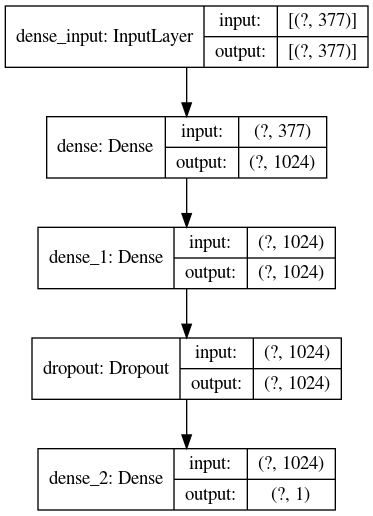

In [78]:
def best_model_return():
    best_model = Bayesiantuner.get_best_models(num_models=1)[0]
    return best_model

Bayesian = {}

ANN = KerasClassifier(build_fn=best_model_return, epochs= 50, batch_size=10, verbose= 1)
ANN.fit(X_train.values, y_train)
pred = ANN.predict(X_test)

Bayesian['accuracy'] = accuracy_score(y_test, pred)
Bayesian['f1'] = f1_score(y_test, pred)
Bayesian['roc_auc'] = roc_auc_score(y_test, pred)
Bayesian['recall'] = recall_score(y_test, pred)
Bayesian['precision'] = precision_score(y_test, pred)

# Evaluate the best model.
for metric, score in Bayesian.items():
    print(f'{metric}: {score}')
    


Bayesiantuner.get_best_models(num_models=1)[0].summary()

plot_model(Bayesiantuner.get_best_models(num_models=1)[0], to_file='model_plot.png', show_shapes=True)